In [1]:
import tensorflow
import keras
import csv
import numpy
import matplotlib.pyplot as plot

#load training data
dataset = numpy.loadtxt("../Datasets/case2(1)_x.csv", delimiter=",")
X1 = dataset[:,0:1]
X2 = dataset[:,1:2]
X3 = dataset[:,2:3]
X4 = dataset[:,3:4]
Y = numpy.loadtxt("../Datasets/case2_y.csv", delimiter=",")

Using TensorFlow backend.


In [2]:
#set random seed
numpy.random.seed(0)

#construct input layers and explainable layers
input_layer_X1 = keras.layers.Input(shape=(1, ), name='input_layer_X1')
explainable_layer_X1 = keras.layers.Dense(1, activation='linear', use_bias=False, kernel_initializer='ones', bias_initializer='ones', 
                                         name='explainable_layer_X1')(input_layer_X1)

input_layer_X2 = keras.layers.Input(shape=(1, ), name='input_layer_X2')
explainable_layer_X2 = keras.layers.Dense(1, activation='linear', use_bias=False, kernel_initializer='ones', bias_initializer='ones', 
                                         name='explainable_layer_X2')(input_layer_X2)

input_layer_X3 = keras.layers.Input(shape=(1, ), name='input_layer_X3')
explainable_layer_X3 = keras.layers.Dense(1, activation='linear', use_bias=False, kernel_initializer='ones', bias_initializer='ones', 
                                         name='explainable_layer_X3')(input_layer_X3)

input_layer_X4 = keras.layers.Input(shape=(1, ), name='input_layer_X4')
explainable_layer_X4 = keras.layers.Dense(1, activation='linear', use_bias=False, kernel_initializer='ones', bias_initializer='ones', 
                                         name='explainable_layer_X4')(input_layer_X4)

#construct hidden layers
merge_layer = keras.layers.concatenate([explainable_layer_X1, explainable_layer_X2, explainable_layer_X3, explainable_layer_X4], name='merge_layer')
hidden_layer_1 = keras.layers.Dense(4, activation = 'linear', kernel_initializer='ones', bias_initializer='ones', name='hidden_layer_1')(merge_layer)
hidden_layer_2 = keras.layers.Dense(4, activation = 'tanh', name='hidden_layer_2')(hidden_layer_1)
hidden_layer_3 = keras.layers.Dense(4, activation = 'tanh', name='hidden_layer_3')(hidden_layer_2)

#construct output layer
output_layer = keras.layers.Dense(1, activation = 'linear', name='output_layer')(hidden_layer_3)

#construct the model of neural network
model = keras.models.Model(inputs=[input_layer_X1, input_layer_X2, input_layer_X3, input_layer_X4], outputs=output_layer)
model.summary()

#set loss function and optimizer
model.compile(loss='mean_squared_error', optimizer = 'nadam', metrics = ['mae'])

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_layer_X1 (InputLayer)     (None, 1)            0                                            
__________________________________________________________________________________________________
input_layer_X2 (InputLayer)     (None, 1)            0                                            
__________________________________________________________________________________________________
input_layer_X3 (InputLayer)     (None, 1)            0                                            
__________________________________________________________________________________________________
input_layer_X4 (InputLayer)     (None, 1)            0                                            
__________________________________________________________________________________________________
explainabl

In [3]:
#training the model of neural network
train_history = model.fit([X1, X2, X3, X4], Y, epochs = 80000, batch_size = 7)

Epoch 1/80000
7/7 [==============================] - 1s 84ms/step - loss: 0.0441 - mean_absolute_error: 0.1817
Epoch 2/80000
7/7 [==============================] - 0s 143us/step - loss: 0.0435 - mean_absolute_error: 0.1804
Epoch 3/80000
7/7 [==============================] - 0s 286us/step - loss: 0.0428 - mean_absolute_error: 0.1797
Epoch 4/80000
7/7 [==============================] - 0s 143us/step - loss: 0.0421 - mean_absolute_error: 0.1767
Epoch 5/80000
7/7 [==============================] - 0s 143us/step - loss: 0.0414 - mean_absolute_error: 0.1758
Epoch 6/80000
7/7 [==============================] - 0s 286us/step - loss: 0.0408 - mean_absolute_error: 0.1732
Epoch 7/80000
7/7 [==============================] - 0s 286us/step - loss: 0.0402 - mean_absolute_error: 0.1728
Epoch 8/80000
7/7 [==============================] - 0s 286us/step - loss: 0.0396 - mean_absolute_error: 0.1707
Epoch 9/80000
7/7 [==============================] - 0s 143us/step - loss: 0.0389 - mean_absolute_error: 

Epoch 74/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0024 - mean_absolute_error: 0.0438
Epoch 75/80000
7/7 [==============================] - 0s 286us/step - loss: 0.0022 - mean_absolute_error: 0.0348
Epoch 76/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0022 - mean_absolute_error: 0.0424
Epoch 77/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0021 - mean_absolute_error: 0.0317
Epoch 78/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0021 - mean_absolute_error: 0.0418
Epoch 79/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0021 - mean_absolute_error: 0.0325
Epoch 80/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0021 - mean_absolute_error: 0.0412
Epoch 81/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0021 - mean_absolute_error: 0.0355
Epoch 82/80000
7/7 [==============================] - 0s 286us/step - loss: 0.0021 - mean_absolu

Epoch 145/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4527e-04 - mean_absolute_error: 0.0154
Epoch 146/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5558e-04 - mean_absolute_error: 0.0190
Epoch 147/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6310e-04 - mean_absolute_error: 0.0158
Epoch 148/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7783e-04 - mean_absolute_error: 0.0193
Epoch 149/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8879e-04 - mean_absolute_error: 0.0164
Epoch 150/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1167e-04 - mean_absolute_error: 0.0198
Epoch 151/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2337e-04 - mean_absolute_error: 0.0172
Epoch 152/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5193e-04 - mean_absolute_error: 0.0203
Epoch 153/80000
7/7 [==============================] - 0

Epoch 215/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4615e-04 - mean_absolute_error: 0.0229
Epoch 216/80000
7/7 [==============================] - 0s 572us/step - loss: 7.8286e-04 - mean_absolute_error: 0.0243
Epoch 217/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8960e-04 - mean_absolute_error: 0.0238
Epoch 218/80000
7/7 [==============================] - 0s 572us/step - loss: 8.2342e-04 - mean_absolute_error: 0.0250
Epoch 219/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2256e-04 - mean_absolute_error: 0.0245
Epoch 220/80000
7/7 [==============================] - 0s 429us/step - loss: 8.5054e-04 - mean_absolute_error: 0.0254
Epoch 221/80000
7/7 [==============================] - 0s 429us/step - loss: 8.4514e-04 - mean_absolute_error: 0.0250
Epoch 222/80000
7/7 [==============================] - 0s 429us/step - loss: 8.7026e-04 - mean_absolute_error: 0.0257
Epoch 223/80000
7/7 [==============================] - 0

Epoch 285/80000
7/7 [==============================] - 0s 286us/step - loss: 8.3358e-04 - mean_absolute_error: 0.0250
Epoch 286/80000
7/7 [==============================] - 0s 286us/step - loss: 8.4486e-04 - mean_absolute_error: 0.0253
Epoch 287/80000
7/7 [==============================] - 0s 572us/step - loss: 8.2225e-04 - mean_absolute_error: 0.0247
Epoch 288/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2605e-04 - mean_absolute_error: 0.0250
Epoch 289/80000
7/7 [==============================] - 0s 429us/step - loss: 7.9406e-04 - mean_absolute_error: 0.0242
Epoch 290/80000
7/7 [==============================] - 0s 429us/step - loss: 7.9098e-04 - mean_absolute_error: 0.0245
Epoch 291/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5592e-04 - mean_absolute_error: 0.0233
Epoch 292/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4771e-04 - mean_absolute_error: 0.0238
Epoch 293/80000
7/7 [==============================] - 0

Epoch 355/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8118e-04 - mean_absolute_error: 0.0241
Epoch 356/80000
7/7 [==============================] - 0s 286us/step - loss: 7.8613e-04 - mean_absolute_error: 0.0244
Epoch 357/80000
7/7 [==============================] - 0s 286us/step - loss: 7.5743e-04 - mean_absolute_error: 0.0236
Epoch 358/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5694e-04 - mean_absolute_error: 0.0240
Epoch 359/80000
7/7 [==============================] - 0s 286us/step - loss: 7.2601e-04 - mean_absolute_error: 0.0229
Epoch 360/80000
7/7 [==============================] - 0s 429us/step - loss: 7.2132e-04 - mean_absolute_error: 0.0234
Epoch 361/80000
7/7 [==============================] - 0s 286us/step - loss: 6.8976e-04 - mean_absolute_error: 0.0221
Epoch 362/80000
7/7 [==============================] - 0s 286us/step - loss: 6.8025e-04 - mean_absolute_error: 0.0227
Epoch 363/80000
7/7 [==============================] - 0

Epoch 425/80000
7/7 [==============================] - 0s 286us/step - loss: 7.7185e-04 - mean_absolute_error: 0.0241
Epoch 426/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8013e-04 - mean_absolute_error: 0.0243
Epoch 427/80000
7/7 [==============================] - 0s 286us/step - loss: 7.5875e-04 - mean_absolute_error: 0.0238
Epoch 428/80000
7/7 [==============================] - 0s 143us/step - loss: 7.6382e-04 - mean_absolute_error: 0.0241
Epoch 429/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3713e-04 - mean_absolute_error: 0.0234
Epoch 430/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3593e-04 - mean_absolute_error: 0.0236
Epoch 431/80000
7/7 [==============================] - 0s 286us/step - loss: 7.0727e-04 - mean_absolute_error: 0.0227
Epoch 432/80000
7/7 [==============================] - 0s 286us/step - loss: 7.0223e-04 - mean_absolute_error: 0.0231
Epoch 433/80000
7/7 [==============================] - 0

Epoch 495/80000
7/7 [==============================] - 0s 286us/step - loss: 7.2751e-04 - mean_absolute_error: 0.0233
Epoch 496/80000
7/7 [==============================] - 0s 286us/step - loss: 7.5113e-04 - mean_absolute_error: 0.0238
Epoch 497/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4658e-04 - mean_absolute_error: 0.0237
Epoch 498/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6545e-04 - mean_absolute_error: 0.0240
Epoch 499/80000
7/7 [==============================] - 0s 286us/step - loss: 7.5589e-04 - mean_absolute_error: 0.0239
Epoch 500/80000
7/7 [==============================] - 0s 286us/step - loss: 7.7063e-04 - mean_absolute_error: 0.0241
Epoch 501/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5609e-04 - mean_absolute_error: 0.0240
Epoch 502/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6765e-04 - mean_absolute_error: 0.0241
Epoch 503/80000
7/7 [==============================] - 0

Epoch 565/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6021e-04 - mean_absolute_error: 0.0196
Epoch 566/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8288e-04 - mean_absolute_error: 0.0209
Epoch 567/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9076e-04 - mean_absolute_error: 0.0204
Epoch 568/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1561e-04 - mean_absolute_error: 0.0215
Epoch 569/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2169e-04 - mean_absolute_error: 0.0211
Epoch 570/80000
7/7 [==============================] - 0s 286us/step - loss: 6.4620e-04 - mean_absolute_error: 0.0220
Epoch 571/80000
7/7 [==============================] - 0s 286us/step - loss: 6.5156e-04 - mean_absolute_error: 0.0218
Epoch 572/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7601e-04 - mean_absolute_error: 0.0225
Epoch 573/80000
7/7 [==============================] - 0

Epoch 635/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9970e-04 - mean_absolute_error: 0.0152
Epoch 636/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0993e-04 - mean_absolute_error: 0.0175
Epoch 637/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1348e-04 - mean_absolute_error: 0.0156
Epoch 638/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2483e-04 - mean_absolute_error: 0.0177
Epoch 639/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2922e-04 - mean_absolute_error: 0.0161
Epoch 640/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4221e-04 - mean_absolute_error: 0.0180
Epoch 641/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4741e-04 - mean_absolute_error: 0.0167
Epoch 642/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6214e-04 - mean_absolute_error: 0.0185
Epoch 643/80000
7/7 [==============================] - 0

Epoch 705/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5232e-04 - mean_absolute_error: 0.0140
Epoch 706/80000
7/7 [==============================] - 0s 143us/step - loss: 3.5356e-04 - mean_absolute_error: 0.0165
Epoch 707/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5043e-04 - mean_absolute_error: 0.0140
Epoch 708/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5225e-04 - mean_absolute_error: 0.0165
Epoch 709/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4996e-04 - mean_absolute_error: 0.0140
Epoch 710/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5267e-04 - mean_absolute_error: 0.0165
Epoch 711/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5090e-04 - mean_absolute_error: 0.0140
Epoch 712/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5450e-04 - mean_absolute_error: 0.0165
Epoch 713/80000
7/7 [==============================] - 0

Epoch 775/80000
7/7 [==============================] - 0s 714us/step - loss: 4.4707e-04 - mean_absolute_error: 0.0171
Epoch 776/80000
7/7 [==============================] - 0s 858us/step - loss: 4.4139e-04 - mean_absolute_error: 0.0182
Epoch 777/80000
7/7 [==============================] - 0s 858us/step - loss: 4.2685e-04 - mean_absolute_error: 0.0165
Epoch 778/80000
7/7 [==============================] - 0s 714us/step - loss: 4.2145e-04 - mean_absolute_error: 0.0177
Epoch 779/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0849e-04 - mean_absolute_error: 0.0159
Epoch 780/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0413e-04 - mean_absolute_error: 0.0173
Epoch 781/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9271e-04 - mean_absolute_error: 0.0154
Epoch 782/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8879e-04 - mean_absolute_error: 0.0169
Epoch 783/80000
7/7 [==============================] - 0

Epoch 845/80000
7/7 [==============================] - 0s 286us/step - loss: 6.5196e-04 - mean_absolute_error: 0.0225
Epoch 846/80000
7/7 [==============================] - 0s 286us/step - loss: 6.5874e-04 - mean_absolute_error: 0.0223
Epoch 847/80000
7/7 [==============================] - 0s 286us/step - loss: 6.4232e-04 - mean_absolute_error: 0.0223
Epoch 848/80000
7/7 [==============================] - 0s 286us/step - loss: 6.4656e-04 - mean_absolute_error: 0.0221
Epoch 849/80000
7/7 [==============================] - 0s 286us/step - loss: 6.2810e-04 - mean_absolute_error: 0.0220
Epoch 850/80000
7/7 [==============================] - 0s 286us/step - loss: 6.2903e-04 - mean_absolute_error: 0.0218
Epoch 851/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0955e-04 - mean_absolute_error: 0.0215
Epoch 852/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0814e-04 - mean_absolute_error: 0.0214
Epoch 853/80000
7/7 [==============================] - 0

Epoch 915/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4677e-04 - mean_absolute_error: 0.0175
Epoch 916/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6256e-04 - mean_absolute_error: 0.0186
Epoch 917/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6820e-04 - mean_absolute_error: 0.0181
Epoch 918/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8549e-04 - mean_absolute_error: 0.0190
Epoch 919/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9111e-04 - mean_absolute_error: 0.0188
Epoch 920/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0911e-04 - mean_absolute_error: 0.0195
Epoch 921/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1432e-04 - mean_absolute_error: 0.0194
Epoch 922/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3307e-04 - mean_absolute_error: 0.0200
Epoch 923/80000
7/7 [==============================] - 0

Epoch 985/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0516e-04 - mean_absolute_error: 0.0131
Epoch 986/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0771e-04 - mean_absolute_error: 0.0153
Epoch 987/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0643e-04 - mean_absolute_error: 0.0132
Epoch 988/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0965e-04 - mean_absolute_error: 0.0153
Epoch 989/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0911e-04 - mean_absolute_error: 0.0133
Epoch 990/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1306e-04 - mean_absolute_error: 0.0154
Epoch 991/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1301e-04 - mean_absolute_error: 0.0134
Epoch 992/80000
7/7 [==============================] - 0s 285us/step - loss: 3.1771e-04 - mean_absolute_error: 0.0154
Epoch 993/80000
7/7 [==============================] - 0

Epoch 1054/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2089e-04 - mean_absolute_error: 0.0178
Epoch 1055/80000
7/7 [==============================] - 0s 715us/step - loss: 4.0647e-04 - mean_absolute_error: 0.0167
Epoch 1056/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0118e-04 - mean_absolute_error: 0.0174
Epoch 1057/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8804e-04 - mean_absolute_error: 0.0161
Epoch 1058/80000
7/7 [==============================] - 0s 715us/step - loss: 3.8304e-04 - mean_absolute_error: 0.0169
Epoch 1059/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7133e-04 - mean_absolute_error: 0.0156
Epoch 1060/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6699e-04 - mean_absolute_error: 0.0166
Epoch 1061/80000
7/7 [==============================] - 0s 715us/step - loss: 3.5635e-04 - mean_absolute_error: 0.0151
Epoch 1062/80000
7/7 [==========================

Epoch 1123/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6269e-04 - mean_absolute_error: 0.0210
Epoch 1124/80000
7/7 [==============================] - 0s 286us/step - loss: 5.7822e-04 - mean_absolute_error: 0.0210
Epoch 1125/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7541e-04 - mean_absolute_error: 0.0213
Epoch 1126/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8935e-04 - mean_absolute_error: 0.0213
Epoch 1127/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8416e-04 - mean_absolute_error: 0.0215
Epoch 1128/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9614e-04 - mean_absolute_error: 0.0214
Epoch 1129/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8867e-04 - mean_absolute_error: 0.0217
Epoch 1130/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9862e-04 - mean_absolute_error: 0.0215
Epoch 1131/80000
7/7 [==========================

Epoch 1192/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9748e-04 - mean_absolute_error: 0.0148
Epoch 1193/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9905e-04 - mean_absolute_error: 0.0135
Epoch 1194/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0514e-04 - mean_absolute_error: 0.0149
Epoch 1195/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0716e-04 - mean_absolute_error: 0.0138
Epoch 1196/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1412e-04 - mean_absolute_error: 0.0152
Epoch 1197/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1669e-04 - mean_absolute_error: 0.0141
Epoch 1198/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2458e-04 - mean_absolute_error: 0.0155
Epoch 1199/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2769e-04 - mean_absolute_error: 0.0145
Epoch 1200/80000
7/7 [==========================

Epoch 1261/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2321e-04 - mean_absolute_error: 0.0145
Epoch 1262/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1945e-04 - mean_absolute_error: 0.0154
Epoch 1263/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1099e-04 - mean_absolute_error: 0.0141
Epoch 1264/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0783e-04 - mean_absolute_error: 0.0151
Epoch 1265/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0026e-04 - mean_absolute_error: 0.0137
Epoch 1266/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9764e-04 - mean_absolute_error: 0.0148
Epoch 1267/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9104e-04 - mean_absolute_error: 0.0134
Epoch 1268/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8890e-04 - mean_absolute_error: 0.0146
Epoch 1269/80000
7/7 [==========================

Epoch 1330/80000
7/7 [==============================] - 0s 428us/step - loss: 5.5896e-04 - mean_absolute_error: 0.0209
Epoch 1331/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5334e-04 - mean_absolute_error: 0.0212
Epoch 1332/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6340e-04 - mean_absolute_error: 0.0211
Epoch 1333/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5541e-04 - mean_absolute_error: 0.0212
Epoch 1334/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6332e-04 - mean_absolute_error: 0.0210
Epoch 1335/80000
7/7 [==============================] - 0s 285us/step - loss: 5.5307e-04 - mean_absolute_error: 0.0212
Epoch 1336/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5852e-04 - mean_absolute_error: 0.0209
Epoch 1337/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4633e-04 - mean_absolute_error: 0.0210
Epoch 1338/80000
7/7 [==========================

Epoch 1399/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6689e-04 - mean_absolute_error: 0.0128
Epoch 1400/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7237e-04 - mean_absolute_error: 0.0141
Epoch 1401/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7452e-04 - mean_absolute_error: 0.0131
Epoch 1402/80000
7/7 [==============================] - 0s 715us/step - loss: 2.8082e-04 - mean_absolute_error: 0.0144
Epoch 1403/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8345e-04 - mean_absolute_error: 0.0135
Epoch 1404/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9055e-04 - mean_absolute_error: 0.0147
Epoch 1405/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9373e-04 - mean_absolute_error: 0.0139
Epoch 1406/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0177e-04 - mean_absolute_error: 0.0150
Epoch 1407/80000
7/7 [==========================

Epoch 1468/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0037e-04 - mean_absolute_error: 0.0150
Epoch 1469/80000
7/7 [==============================] - 0s 572us/step - loss: 2.9101e-04 - mean_absolute_error: 0.0139
Epoch 1470/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8706e-04 - mean_absolute_error: 0.0146
Epoch 1471/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7918e-04 - mean_absolute_error: 0.0135
Epoch 1472/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7576e-04 - mean_absolute_error: 0.0143
Epoch 1473/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6875e-04 - mean_absolute_error: 0.0131
Epoch 1474/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6585e-04 - mean_absolute_error: 0.0140
Epoch 1475/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5969e-04 - mean_absolute_error: 0.0127
Epoch 1476/80000
7/7 [==========================

Epoch 1537/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0415e-04 - mean_absolute_error: 0.0203
Epoch 1538/80000
7/7 [==============================] - 0s 571us/step - loss: 5.1852e-04 - mean_absolute_error: 0.0204
Epoch 1539/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1739e-04 - mean_absolute_error: 0.0207
Epoch 1540/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3022e-04 - mean_absolute_error: 0.0206
Epoch 1541/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2682e-04 - mean_absolute_error: 0.0209
Epoch 1542/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3782e-04 - mean_absolute_error: 0.0208
Epoch 1543/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3205e-04 - mean_absolute_error: 0.0210
Epoch 1544/80000
7/7 [==============================] - 0s 572us/step - loss: 5.4087e-04 - mean_absolute_error: 0.0209
Epoch 1545/80000
7/7 [==========================

Epoch 1606/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1670e-04 - mean_absolute_error: 0.0127
Epoch 1607/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1720e-04 - mean_absolute_error: 0.0113
Epoch 1608/80000
7/7 [==============================] - 0s 428us/step - loss: 2.2029e-04 - mean_absolute_error: 0.0128
Epoch 1609/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2122e-04 - mean_absolute_error: 0.0115
Epoch 1610/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2486e-04 - mean_absolute_error: 0.0128
Epoch 1611/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2624e-04 - mean_absolute_error: 0.0117
Epoch 1612/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3052e-04 - mean_absolute_error: 0.0130
Epoch 1613/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3237e-04 - mean_absolute_error: 0.0120
Epoch 1614/80000
7/7 [==========================

Epoch 1675/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3685e-04 - mean_absolute_error: 0.0159
Epoch 1676/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3010e-04 - mean_absolute_error: 0.0158
Epoch 1677/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1750e-04 - mean_absolute_error: 0.0153
Epoch 1678/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1116e-04 - mean_absolute_error: 0.0153
Epoch 1679/80000
7/7 [==============================] - 0s 715us/step - loss: 2.9971e-04 - mean_absolute_error: 0.0147
Epoch 1680/80000
7/7 [==============================] - 0s 572us/step - loss: 2.9385e-04 - mean_absolute_error: 0.0149
Epoch 1681/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8352e-04 - mean_absolute_error: 0.0141
Epoch 1682/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7821e-04 - mean_absolute_error: 0.0145
Epoch 1683/80000
7/7 [==========================

Epoch 1744/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6614e-04 - mean_absolute_error: 0.0166
Epoch 1745/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7335e-04 - mean_absolute_error: 0.0172
Epoch 1746/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8884e-04 - mean_absolute_error: 0.0173
Epoch 1747/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9593e-04 - mean_absolute_error: 0.0178
Epoch 1748/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1215e-04 - mean_absolute_error: 0.0180
Epoch 1749/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1883e-04 - mean_absolute_error: 0.0185
Epoch 1750/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3550e-04 - mean_absolute_error: 0.0186
Epoch 1751/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4139e-04 - mean_absolute_error: 0.0191
Epoch 1752/80000
7/7 [==========================

Epoch 1813/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7959e-04 - mean_absolute_error: 0.0101
Epoch 1814/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7918e-04 - mean_absolute_error: 0.0116
Epoch 1815/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7740e-04 - mean_absolute_error: 0.0100
Epoch 1816/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7737e-04 - mean_absolute_error: 0.0116
Epoch 1817/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7599e-04 - mean_absolute_error: 0.0100
Epoch 1818/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7631e-04 - mean_absolute_error: 0.0116
Epoch 1819/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7530e-04 - mean_absolute_error: 0.0100
Epoch 1820/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7599e-04 - mean_absolute_error: 0.0115
Epoch 1821/80000
7/7 [==========================

Epoch 1882/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0190e-04 - mean_absolute_error: 0.0205
Epoch 1883/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8596e-04 - mean_absolute_error: 0.0204
Epoch 1884/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8262e-04 - mean_absolute_error: 0.0200
Epoch 1885/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6538e-04 - mean_absolute_error: 0.0199
Epoch 1886/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6003e-04 - mean_absolute_error: 0.0194
Epoch 1887/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4213e-04 - mean_absolute_error: 0.0193
Epoch 1888/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3530e-04 - mean_absolute_error: 0.0188
Epoch 1889/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1731e-04 - mean_absolute_error: 0.0186
Epoch 1890/80000
7/7 [==========================

Epoch 1951/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8705e-04 - mean_absolute_error: 0.0108
Epoch 1952/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9195e-04 - mean_absolute_error: 0.0119
Epoch 1953/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9517e-04 - mean_absolute_error: 0.0112
Epoch 1954/80000
7/7 [==============================] - 0s 286us/step - loss: 2.0084e-04 - mean_absolute_error: 0.0122
Epoch 1955/80000
7/7 [==============================] - 0s 286us/step - loss: 2.0462e-04 - mean_absolute_error: 0.0117
Epoch 1956/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1118e-04 - mean_absolute_error: 0.0125
Epoch 1957/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1558e-04 - mean_absolute_error: 0.0121
Epoch 1958/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2308e-04 - mean_absolute_error: 0.0129
Epoch 1959/80000
7/7 [==========================

Epoch 2020/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2345e-04 - mean_absolute_error: 0.0130
Epoch 2021/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1482e-04 - mean_absolute_error: 0.0122
Epoch 2022/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0943e-04 - mean_absolute_error: 0.0126
Epoch 2023/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0189e-04 - mean_absolute_error: 0.0116
Epoch 2024/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9719e-04 - mean_absolute_error: 0.0122
Epoch 2025/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9066e-04 - mean_absolute_error: 0.0111
Epoch 2026/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8658e-04 - mean_absolute_error: 0.0118
Epoch 2027/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8093e-04 - mean_absolute_error: 0.0107
Epoch 2028/80000
7/7 [==========================

Epoch 2089/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5366e-04 - mean_absolute_error: 0.0171
Epoch 2090/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7184e-04 - mean_absolute_error: 0.0174
Epoch 2091/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8225e-04 - mean_absolute_error: 0.0179
Epoch 2092/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0146e-04 - mean_absolute_error: 0.0182
Epoch 2093/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1154e-04 - mean_absolute_error: 0.0187
Epoch 2094/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3141e-04 - mean_absolute_error: 0.0190
Epoch 2095/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4067e-04 - mean_absolute_error: 0.0195
Epoch 2096/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6074e-04 - mean_absolute_error: 0.0198
Epoch 2097/80000
7/7 [==========================

Epoch 2158/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2649e-04 - mean_absolute_error: 0.0099
Epoch 2159/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2505e-04 - mean_absolute_error: 0.0083
Epoch 2160/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2451e-04 - mean_absolute_error: 0.0098
Epoch 2161/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2337e-04 - mean_absolute_error: 0.0082
Epoch 2162/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2309e-04 - mean_absolute_error: 0.0098
Epoch 2163/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2223e-04 - mean_absolute_error: 0.0082
Epoch 2164/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2220e-04 - mean_absolute_error: 0.0098
Epoch 2165/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2161e-04 - mean_absolute_error: 0.0081
Epoch 2166/80000
7/7 [==========================

Epoch 2227/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5396e-04 - mean_absolute_error: 0.0224
Epoch 2228/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5700e-04 - mean_absolute_error: 0.0222
Epoch 2229/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4140e-04 - mean_absolute_error: 0.0221
Epoch 2230/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4001e-04 - mean_absolute_error: 0.0218
Epoch 2231/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2110e-04 - mean_absolute_error: 0.0216
Epoch 2232/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1569e-04 - mean_absolute_error: 0.0212
Epoch 2233/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9432e-04 - mean_absolute_error: 0.0210
Epoch 2234/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8583e-04 - mean_absolute_error: 0.0205
Epoch 2235/80000
7/7 [==========================

Epoch 2296/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0938e-04 - mean_absolute_error: 0.0092
Epoch 2297/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1031e-04 - mean_absolute_error: 0.0078
Epoch 2298/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1197e-04 - mean_absolute_error: 0.0093
Epoch 2299/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1317e-04 - mean_absolute_error: 0.0079
Epoch 2300/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1517e-04 - mean_absolute_error: 0.0094
Epoch 2301/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1671e-04 - mean_absolute_error: 0.0081
Epoch 2302/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1914e-04 - mean_absolute_error: 0.0095
Epoch 2303/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2105e-04 - mean_absolute_error: 0.0083
Epoch 2304/80000
7/7 [==========================

Epoch 2365/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0583e-04 - mean_absolute_error: 0.0160
Epoch 2366/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9206e-04 - mean_absolute_error: 0.0153
Epoch 2367/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7380e-04 - mean_absolute_error: 0.0149
Epoch 2368/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6128e-04 - mean_absolute_error: 0.0142
Epoch 2369/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4531e-04 - mean_absolute_error: 0.0139
Epoch 2370/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3412e-04 - mean_absolute_error: 0.0133
Epoch 2371/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2028e-04 - mean_absolute_error: 0.0130
Epoch 2372/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1050e-04 - mean_absolute_error: 0.0127
Epoch 2373/80000
7/7 [==========================

Epoch 2434/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2438e-04 - mean_absolute_error: 0.0096
Epoch 2435/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2818e-04 - mean_absolute_error: 0.0089
Epoch 2436/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3336e-04 - mean_absolute_error: 0.0100
Epoch 2437/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3792e-04 - mean_absolute_error: 0.0095
Epoch 2438/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4410e-04 - mean_absolute_error: 0.0104
Epoch 2439/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4953e-04 - mean_absolute_error: 0.0101
Epoch 2440/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5692e-04 - mean_absolute_error: 0.0109
Epoch 2441/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6336e-04 - mean_absolute_error: 0.0108
Epoch 2442/80000
7/7 [==========================

Epoch 2503/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3464e-04 - mean_absolute_error: 0.0093
Epoch 2504/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2926e-04 - mean_absolute_error: 0.0099
Epoch 2505/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2336e-04 - mean_absolute_error: 0.0087
Epoch 2506/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1887e-04 - mean_absolute_error: 0.0094
Epoch 2507/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1396e-04 - mean_absolute_error: 0.0081
Epoch 2508/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1021e-04 - mean_absolute_error: 0.0091
Epoch 2509/80000
7/7 [==============================] - 0s 428us/step - loss: 1.0614e-04 - mean_absolute_error: 0.0077
Epoch 2510/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0302e-04 - mean_absolute_error: 0.0089
Epoch 2511/80000
7/7 [==========================

Epoch 2572/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6601e-04 - mean_absolute_error: 0.0112
Epoch 2573/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7496e-04 - mean_absolute_error: 0.0115
Epoch 2574/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8684e-04 - mean_absolute_error: 0.0118
Epoch 2575/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9745e-04 - mean_absolute_error: 0.0125
Epoch 2576/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1177e-04 - mean_absolute_error: 0.0128
Epoch 2577/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2430e-04 - mean_absolute_error: 0.0135
Epoch 2578/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4138e-04 - mean_absolute_error: 0.0139
Epoch 2579/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5606e-04 - mean_absolute_error: 0.0146
Epoch 2580/80000
7/7 [==========================

Epoch 2641/80000
7/7 [==============================] - 0s 286us/step - loss: 7.9427e-05 - mean_absolute_error: 0.0066
Epoch 2642/80000
7/7 [==============================] - 0s 143us/step - loss: 7.7417e-05 - mean_absolute_error: 0.0079
Epoch 2643/80000
7/7 [==============================] - 0s 286us/step - loss: 7.5346e-05 - mean_absolute_error: 0.0065
Epoch 2644/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3692e-05 - mean_absolute_error: 0.0077
Epoch 2645/80000
7/7 [==============================] - 0s 286us/step - loss: 7.1974e-05 - mean_absolute_error: 0.0063
Epoch 2646/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0601e-05 - mean_absolute_error: 0.0076
Epoch 2647/80000
7/7 [==============================] - 0s 428us/step - loss: 6.9172e-05 - mean_absolute_error: 0.0062
Epoch 2648/80000
7/7 [==============================] - 0s 571us/step - loss: 6.8042e-05 - mean_absolute_error: 0.0075
Epoch 2649/80000
7/7 [==========================

Epoch 2710/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9958e-04 - mean_absolute_error: 0.0125
Epoch 2711/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1367e-04 - mean_absolute_error: 0.0133
Epoch 2712/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3229e-04 - mean_absolute_error: 0.0138
Epoch 2713/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4911e-04 - mean_absolute_error: 0.0146
Epoch 2714/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7169e-04 - mean_absolute_error: 0.0151
Epoch 2715/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9146e-04 - mean_absolute_error: 0.0160
Epoch 2716/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1838e-04 - mean_absolute_error: 0.0166
Epoch 2717/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4107e-04 - mean_absolute_error: 0.0175
Epoch 2718/80000
7/7 [==========================

Epoch 2779/80000
7/7 [==============================] - 0s 428us/step - loss: 5.8169e-05 - mean_absolute_error: 0.0057
Epoch 2780/80000
7/7 [==============================] - 0s 572us/step - loss: 5.7103e-05 - mean_absolute_error: 0.0069
Epoch 2781/80000
7/7 [==============================] - 0s 572us/step - loss: 5.6042e-05 - mean_absolute_error: 0.0057
Epoch 2782/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5161e-05 - mean_absolute_error: 0.0068
Epoch 2783/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4282e-05 - mean_absolute_error: 0.0056
Epoch 2784/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3557e-05 - mean_absolute_error: 0.0067
Epoch 2785/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2824e-05 - mean_absolute_error: 0.0056
Epoch 2786/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2215e-05 - mean_absolute_error: 0.0066
Epoch 2787/80000
7/7 [==========================

Epoch 2848/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5213e-04 - mean_absolute_error: 0.0107
Epoch 2849/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6415e-04 - mean_absolute_error: 0.0114
Epoch 2850/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7958e-04 - mean_absolute_error: 0.0119
Epoch 2851/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9449e-04 - mean_absolute_error: 0.0127
Epoch 2852/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1383e-04 - mean_absolute_error: 0.0132
Epoch 2853/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3217e-04 - mean_absolute_error: 0.0141
Epoch 2854/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5631e-04 - mean_absolute_error: 0.0148
Epoch 2855/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7864e-04 - mean_absolute_error: 0.0157
Epoch 2856/80000
7/7 [==========================

Epoch 2917/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8999e-05 - mean_absolute_error: 0.0054
Epoch 2918/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8030e-05 - mean_absolute_error: 0.0063
Epoch 2919/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7108e-05 - mean_absolute_error: 0.0053
Epoch 2920/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6325e-05 - mean_absolute_error: 0.0062
Epoch 2921/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5571e-05 - mean_absolute_error: 0.0053
Epoch 2922/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4922e-05 - mean_absolute_error: 0.0061
Epoch 2923/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4299e-05 - mean_absolute_error: 0.0053
Epoch 2924/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3764e-05 - mean_absolute_error: 0.0060
Epoch 2925/80000
7/7 [==========================

Epoch 2986/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2303e-05 - mean_absolute_error: 0.0069
Epoch 2987/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5388e-05 - mean_absolute_error: 0.0060
Epoch 2988/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9147e-05 - mean_absolute_error: 0.0072
Epoch 2989/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3128e-05 - mean_absolute_error: 0.0065
Epoch 2990/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8000e-05 - mean_absolute_error: 0.0077
Epoch 2991/80000
7/7 [==============================] - 0s 286us/step - loss: 8.3142e-05 - mean_absolute_error: 0.0072
Epoch 2992/80000
7/7 [==============================] - 0s 429us/step - loss: 8.9474e-05 - mean_absolute_error: 0.0082
Epoch 2993/80000
7/7 [==============================] - 0s 286us/step - loss: 9.6125e-05 - mean_absolute_error: 0.0081
Epoch 2994/80000
7/7 [==========================

Epoch 3055/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4270e-05 - mean_absolute_error: 0.0055
Epoch 3056/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1923e-05 - mean_absolute_error: 0.0065
Epoch 3057/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9772e-05 - mean_absolute_error: 0.0053
Epoch 3058/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7971e-05 - mean_absolute_error: 0.0062
Epoch 3059/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6322e-05 - mean_absolute_error: 0.0051
Epoch 3060/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4927e-05 - mean_absolute_error: 0.0061
Epoch 3061/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3644e-05 - mean_absolute_error: 0.0051
Epoch 3062/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2554e-05 - mean_absolute_error: 0.0059
Epoch 3063/80000
7/7 [==========================

Epoch 3124/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2139e-05 - mean_absolute_error: 0.0050
Epoch 3125/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2261e-05 - mean_absolute_error: 0.0046
Epoch 3126/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2410e-05 - mean_absolute_error: 0.0050
Epoch 3127/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2569e-05 - mean_absolute_error: 0.0046
Epoch 3128/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2765e-05 - mean_absolute_error: 0.0051
Epoch 3129/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2977e-05 - mean_absolute_error: 0.0046
Epoch 3130/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3230e-05 - mean_absolute_error: 0.0051
Epoch 3131/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3511e-05 - mean_absolute_error: 0.0046
Epoch 3132/80000
7/7 [==========================

Epoch 3194/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5199e-04 - mean_absolute_error: 0.0178
Epoch 3195/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0301e-04 - mean_absolute_error: 0.0166
Epoch 3196/80000
7/7 [==============================] - 0s 143us/step - loss: 2.6575e-04 - mean_absolute_error: 0.0152
Epoch 3197/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2905e-04 - mean_absolute_error: 0.0142
Epoch 3198/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0083e-04 - mean_absolute_error: 0.0130
Epoch 3199/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7404e-04 - mean_absolute_error: 0.0121
Epoch 3200/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5324e-04 - mean_absolute_error: 0.0110
Epoch 3201/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3391e-04 - mean_absolute_error: 0.0103
Epoch 3202/80000
7/7 [==========================

Epoch 3263/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7530e-05 - mean_absolute_error: 0.0043
Epoch 3264/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7472e-05 - mean_absolute_error: 0.0045
Epoch 3265/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7422e-05 - mean_absolute_error: 0.0043
Epoch 3266/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7368e-05 - mean_absolute_error: 0.0045
Epoch 3267/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7317e-05 - mean_absolute_error: 0.0043
Epoch 3268/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7266e-05 - mean_absolute_error: 0.0045
Epoch 3269/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7216e-05 - mean_absolute_error: 0.0043
Epoch 3270/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7165e-05 - mean_absolute_error: 0.0045
Epoch 3271/80000
7/7 [==========================

Epoch 3332/80000
7/7 [==============================] - 0s 429us/step - loss: 8.6078e-05 - mean_absolute_error: 0.0081
Epoch 3333/80000
7/7 [==============================] - 0s 429us/step - loss: 9.6670e-05 - mean_absolute_error: 0.0086
Epoch 3334/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1005e-04 - mean_absolute_error: 0.0092
Epoch 3335/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2490e-04 - mean_absolute_error: 0.0101
Epoch 3336/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4380e-04 - mean_absolute_error: 0.0109
Epoch 3337/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6454e-04 - mean_absolute_error: 0.0119
Epoch 3338/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9125e-04 - mean_absolute_error: 0.0129
Epoch 3339/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1999e-04 - mean_absolute_error: 0.0141
Epoch 3340/80000
7/7 [==========================

Epoch 3402/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6705e-05 - mean_absolute_error: 0.0045
Epoch 3403/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6533e-05 - mean_absolute_error: 0.0042
Epoch 3404/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6378e-05 - mean_absolute_error: 0.0045
Epoch 3405/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6242e-05 - mean_absolute_error: 0.0042
Epoch 3406/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6114e-05 - mean_absolute_error: 0.0044
Epoch 3407/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5998e-05 - mean_absolute_error: 0.0042
Epoch 3408/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5892e-05 - mean_absolute_error: 0.0044
Epoch 3409/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5793e-05 - mean_absolute_error: 0.0042
Epoch 3410/80000
7/7 [==========================

Epoch 3471/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2598e-05 - mean_absolute_error: 0.0040
Epoch 3472/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2557e-05 - mean_absolute_error: 0.0041
Epoch 3473/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2516e-05 - mean_absolute_error: 0.0040
Epoch 3474/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2478e-05 - mean_absolute_error: 0.0041
Epoch 3475/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2435e-05 - mean_absolute_error: 0.0040
Epoch 3476/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2398e-05 - mean_absolute_error: 0.0041
Epoch 3477/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2358e-05 - mean_absolute_error: 0.0040
Epoch 3478/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2321e-05 - mean_absolute_error: 0.0041
Epoch 3479/80000
7/7 [==========================

Epoch 3540/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5476e-04 - mean_absolute_error: 0.0230
Epoch 3541/80000
7/7 [==============================] - 0s 429us/step - loss: 6.4636e-04 - mean_absolute_error: 0.0251
Epoch 3542/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6853e-04 - mean_absolute_error: 0.0273
Epoch 3543/80000
7/7 [==============================] - 0s 572us/step - loss: 8.7822e-04 - mean_absolute_error: 0.0294
Epoch 3544/80000
7/7 [==============================] - 0s 572us/step - loss: 0.0010 - mean_absolute_error: 0.0316
Epoch 3545/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0011 - mean_absolute_error: 0.0335
Epoch 3546/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0013 - mean_absolute_error: 0.0356
Epoch 3547/80000
7/7 [==============================] - 0s 572us/step - loss: 0.0014 - mean_absolute_error: 0.0369
Epoch 3548/80000
7/7 [==============================] - 0s 429us

Epoch 3610/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1949e-05 - mean_absolute_error: 0.0040
Epoch 3611/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1902e-05 - mean_absolute_error: 0.0040
Epoch 3612/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1857e-05 - mean_absolute_error: 0.0040
Epoch 3613/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1810e-05 - mean_absolute_error: 0.0040
Epoch 3614/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1766e-05 - mean_absolute_error: 0.0040
Epoch 3615/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1722e-05 - mean_absolute_error: 0.0040
Epoch 3616/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1676e-05 - mean_absolute_error: 0.0040
Epoch 3617/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1634e-05 - mean_absolute_error: 0.0039
Epoch 3618/80000
7/7 [==========================

Epoch 3679/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9156e-05 - mean_absolute_error: 0.0037
Epoch 3680/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9121e-05 - mean_absolute_error: 0.0037
Epoch 3681/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9082e-05 - mean_absolute_error: 0.0037
Epoch 3682/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9047e-05 - mean_absolute_error: 0.0037
Epoch 3683/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9009e-05 - mean_absolute_error: 0.0037
Epoch 3684/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8971e-05 - mean_absolute_error: 0.0037
Epoch 3685/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8934e-05 - mean_absolute_error: 0.0037
Epoch 3686/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8898e-05 - mean_absolute_error: 0.0037
Epoch 3687/80000
7/7 [==========================

Epoch 3748/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8273e-05 - mean_absolute_error: 0.0067
Epoch 3749/80000
7/7 [==============================] - 0s 286us/step - loss: 6.8332e-05 - mean_absolute_error: 0.0072
Epoch 3750/80000
7/7 [==============================] - 0s 429us/step - loss: 8.1431e-05 - mean_absolute_error: 0.0080
Epoch 3751/80000
7/7 [==============================] - 0s 286us/step - loss: 9.7280e-05 - mean_absolute_error: 0.0090
Epoch 3752/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1808e-04 - mean_absolute_error: 0.0100
Epoch 3753/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4295e-04 - mean_absolute_error: 0.0113
Epoch 3754/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7584e-04 - mean_absolute_error: 0.0126
Epoch 3755/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1456e-04 - mean_absolute_error: 0.0141
Epoch 3756/80000
7/7 [==========================

Epoch 3818/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9383e-05 - mean_absolute_error: 0.0038
Epoch 3819/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9337e-05 - mean_absolute_error: 0.0038
Epoch 3820/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9295e-05 - mean_absolute_error: 0.0038
Epoch 3821/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9253e-05 - mean_absolute_error: 0.0037
Epoch 3822/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9212e-05 - mean_absolute_error: 0.0038
Epoch 3823/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9170e-05 - mean_absolute_error: 0.0037
Epoch 3824/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9133e-05 - mean_absolute_error: 0.0038
Epoch 3825/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9094e-05 - mean_absolute_error: 0.0037
Epoch 3826/80000
7/7 [==========================

Epoch 3887/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6898e-05 - mean_absolute_error: 0.0035
Epoch 3888/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6864e-05 - mean_absolute_error: 0.0035
Epoch 3889/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6831e-05 - mean_absolute_error: 0.0035
Epoch 3890/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6798e-05 - mean_absolute_error: 0.0035
Epoch 3891/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6763e-05 - mean_absolute_error: 0.0035
Epoch 3892/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6733e-05 - mean_absolute_error: 0.0035
Epoch 3893/80000
7/7 [==============================] - 0s 285us/step - loss: 1.6698e-05 - mean_absolute_error: 0.0035
Epoch 3894/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6665e-05 - mean_absolute_error: 0.0035
Epoch 3895/80000
7/7 [==========================

Epoch 3956/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4737e-05 - mean_absolute_error: 0.0033
Epoch 3957/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4708e-05 - mean_absolute_error: 0.0033
Epoch 3958/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4678e-05 - mean_absolute_error: 0.0033
Epoch 3959/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4650e-05 - mean_absolute_error: 0.0033
Epoch 3960/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4619e-05 - mean_absolute_error: 0.0033
Epoch 3961/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4591e-05 - mean_absolute_error: 0.0033
Epoch 3962/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4563e-05 - mean_absolute_error: 0.0033
Epoch 3963/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4534e-05 - mean_absolute_error: 0.0033
Epoch 3964/80000
7/7 [==========================

Epoch 4026/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0026 - mean_absolute_error: 0.0505
Epoch 4027/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0024 - mean_absolute_error: 0.0483
Epoch 4028/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0022 - mean_absolute_error: 0.0465
Epoch 4029/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0018 - mean_absolute_error: 0.0426
Epoch 4030/80000
7/7 [==============================] - 0s 572us/step - loss: 0.0016 - mean_absolute_error: 0.0393
Epoch 4031/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0012 - mean_absolute_error: 0.0349
Epoch 4032/80000
7/7 [==============================] - 0s 429us/step - loss: 9.9386e-04 - mean_absolute_error: 0.0311
Epoch 4033/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5265e-04 - mean_absolute_error: 0.0270
Epoch 4034/80000
7/7 [==============================] - 0s 429us/step - 

7/7 [==============================] - 0s 429us/step - loss: 1.5942e-05 - mean_absolute_error: 0.0034
Epoch 4096/80000
7/7 [==============================] - 0s 428us/step - loss: 1.5909e-05 - mean_absolute_error: 0.0034
Epoch 4097/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5880e-05 - mean_absolute_error: 0.0034
Epoch 4098/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5848e-05 - mean_absolute_error: 0.0034
Epoch 4099/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5817e-05 - mean_absolute_error: 0.0034
Epoch 4100/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5785e-05 - mean_absolute_error: 0.0034
Epoch 4101/80000
7/7 [==============================] - 0s 428us/step - loss: 1.5755e-05 - mean_absolute_error: 0.0034
Epoch 4102/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5724e-05 - mean_absolute_error: 0.0034
Epoch 4103/80000
7/7 [==============================] - 0s 286us/

Epoch 4164/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3907e-05 - mean_absolute_error: 0.0032
Epoch 4165/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3880e-05 - mean_absolute_error: 0.0032
Epoch 4166/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3854e-05 - mean_absolute_error: 0.0032
Epoch 4167/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3826e-05 - mean_absolute_error: 0.0032
Epoch 4168/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3797e-05 - mean_absolute_error: 0.0032
Epoch 4169/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3771e-05 - mean_absolute_error: 0.0032
Epoch 4170/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3743e-05 - mean_absolute_error: 0.0032
Epoch 4171/80000
7/7 [==============================] - 0s 428us/step - loss: 1.3716e-05 - mean_absolute_error: 0.0032
Epoch 4172/80000
7/7 [==========================

Epoch 4233/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2135e-05 - mean_absolute_error: 0.0030
Epoch 4234/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2112e-05 - mean_absolute_error: 0.0030
Epoch 4235/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2089e-05 - mean_absolute_error: 0.0030
Epoch 4236/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2064e-05 - mean_absolute_error: 0.0030
Epoch 4237/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2041e-05 - mean_absolute_error: 0.0030
Epoch 4238/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2018e-05 - mean_absolute_error: 0.0030
Epoch 4239/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1992e-05 - mean_absolute_error: 0.0029
Epoch 4240/80000
7/7 [==============================] - 0s 715us/step - loss: 1.1969e-05 - mean_absolute_error: 0.0029
Epoch 4241/80000
7/7 [==========================

Epoch 4302/80000
7/7 [==============================] - 0s 428us/step - loss: 2.9191e-05 - mean_absolute_error: 0.0044
Epoch 4303/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5815e-05 - mean_absolute_error: 0.0053
Epoch 4304/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4722e-05 - mean_absolute_error: 0.0059
Epoch 4305/80000
7/7 [==============================] - 0s 286us/step - loss: 5.7114e-05 - mean_absolute_error: 0.0068
Epoch 4306/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3702e-05 - mean_absolute_error: 0.0080
Epoch 4307/80000
7/7 [==============================] - 0s 286us/step - loss: 9.6954e-05 - mean_absolute_error: 0.0092
Epoch 4308/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2780e-04 - mean_absolute_error: 0.0109
Epoch 4309/80000
7/7 [==============================] - 0s 143us/step - loss: 1.7131e-04 - mean_absolute_error: 0.0126
Epoch 4310/80000
7/7 [==========================

Epoch 4372/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3897e-05 - mean_absolute_error: 0.0032
Epoch 4373/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3870e-05 - mean_absolute_error: 0.0032
Epoch 4374/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3843e-05 - mean_absolute_error: 0.0032
Epoch 4375/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3818e-05 - mean_absolute_error: 0.0032
Epoch 4376/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3791e-05 - mean_absolute_error: 0.0032
Epoch 4377/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3765e-05 - mean_absolute_error: 0.0032
Epoch 4378/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3739e-05 - mean_absolute_error: 0.0032
Epoch 4379/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3713e-05 - mean_absolute_error: 0.0032
Epoch 4380/80000
7/7 [==========================

Epoch 4441/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2144e-05 - mean_absolute_error: 0.0030
Epoch 4442/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2121e-05 - mean_absolute_error: 0.0030
Epoch 4443/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2097e-05 - mean_absolute_error: 0.0030
Epoch 4444/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2073e-05 - mean_absolute_error: 0.0030
Epoch 4445/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2049e-05 - mean_absolute_error: 0.0030
Epoch 4446/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2025e-05 - mean_absolute_error: 0.0029
Epoch 4447/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2002e-05 - mean_absolute_error: 0.0029
Epoch 4448/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1978e-05 - mean_absolute_error: 0.0029
Epoch 4449/80000
7/7 [==========================

Epoch 4510/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0617e-05 - mean_absolute_error: 0.0028
Epoch 4511/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0598e-05 - mean_absolute_error: 0.0028
Epoch 4512/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0578e-05 - mean_absolute_error: 0.0027
Epoch 4513/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0556e-05 - mean_absolute_error: 0.0027
Epoch 4514/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0537e-05 - mean_absolute_error: 0.0027
Epoch 4515/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0516e-05 - mean_absolute_error: 0.0027
Epoch 4516/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0495e-05 - mean_absolute_error: 0.0027
Epoch 4517/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0475e-05 - mean_absolute_error: 0.0027
Epoch 4518/80000
7/7 [==========================

Epoch 4579/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3467e-06 - mean_absolute_error: 0.0026
Epoch 4580/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3368e-06 - mean_absolute_error: 0.0025
Epoch 4581/80000
7/7 [==============================] - 0s 286us/step - loss: 9.3296e-06 - mean_absolute_error: 0.0026
Epoch 4582/80000
7/7 [==============================] - 0s 286us/step - loss: 9.3260e-06 - mean_absolute_error: 0.0025
Epoch 4583/80000
7/7 [==============================] - 0s 286us/step - loss: 9.3245e-06 - mean_absolute_error: 0.0026
Epoch 4584/80000
7/7 [==============================] - 0s 286us/step - loss: 9.3275e-06 - mean_absolute_error: 0.0025
Epoch 4585/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3371e-06 - mean_absolute_error: 0.0026
Epoch 4586/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3535e-06 - mean_absolute_error: 0.0025
Epoch 4587/80000
7/7 [==========================

Epoch 4649/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6423e-05 - mean_absolute_error: 0.0034
Epoch 4650/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5130e-05 - mean_absolute_error: 0.0030
Epoch 4651/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4211e-05 - mean_absolute_error: 0.0031
Epoch 4652/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3550e-05 - mean_absolute_error: 0.0028
Epoch 4653/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3080e-05 - mean_absolute_error: 0.0031
Epoch 4654/80000
7/7 [==============================] - 0s 571us/step - loss: 1.2742e-05 - mean_absolute_error: 0.0028
Epoch 4655/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2498e-05 - mean_absolute_error: 0.0031
Epoch 4656/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2321e-05 - mean_absolute_error: 0.0029
Epoch 4657/80000
7/7 [==========================

Epoch 4718/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0579e-05 - mean_absolute_error: 0.0027
Epoch 4719/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0559e-05 - mean_absolute_error: 0.0027
Epoch 4720/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0537e-05 - mean_absolute_error: 0.0027
Epoch 4721/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0518e-05 - mean_absolute_error: 0.0027
Epoch 4722/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0496e-05 - mean_absolute_error: 0.0027
Epoch 4723/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0477e-05 - mean_absolute_error: 0.0027
Epoch 4724/80000
7/7 [==============================] - 0s 285us/step - loss: 1.0457e-05 - mean_absolute_error: 0.0027
Epoch 4725/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0437e-05 - mean_absolute_error: 0.0027
Epoch 4726/80000
7/7 [==========================

Epoch 4787/80000
7/7 [==============================] - 0s 429us/step - loss: 9.2799e-06 - mean_absolute_error: 0.0025
Epoch 4788/80000
7/7 [==============================] - 0s 286us/step - loss: 9.2627e-06 - mean_absolute_error: 0.0025
Epoch 4789/80000
7/7 [==============================] - 0s 429us/step - loss: 9.2469e-06 - mean_absolute_error: 0.0025
Epoch 4790/80000
7/7 [==============================] - 0s 429us/step - loss: 9.2297e-06 - mean_absolute_error: 0.0025
Epoch 4791/80000
7/7 [==============================] - 0s 571us/step - loss: 9.2122e-06 - mean_absolute_error: 0.0025
Epoch 4792/80000
7/7 [==============================] - 0s 429us/step - loss: 9.1944e-06 - mean_absolute_error: 0.0025
Epoch 4793/80000
7/7 [==============================] - 0s 572us/step - loss: 9.1786e-06 - mean_absolute_error: 0.0025
Epoch 4794/80000
7/7 [==============================] - 0s 572us/step - loss: 9.1613e-06 - mean_absolute_error: 0.0025
Epoch 4795/80000
7/7 [==========================

Epoch 4856/80000
7/7 [==============================] - 0s 286us/step - loss: 8.1833e-06 - mean_absolute_error: 0.0024
Epoch 4857/80000
7/7 [==============================] - 0s 286us/step - loss: 8.1680e-06 - mean_absolute_error: 0.0024
Epoch 4858/80000
7/7 [==============================] - 0s 286us/step - loss: 8.1551e-06 - mean_absolute_error: 0.0023
Epoch 4859/80000
7/7 [==============================] - 0s 286us/step - loss: 8.1409e-06 - mean_absolute_error: 0.0024
Epoch 4860/80000
7/7 [==============================] - 0s 429us/step - loss: 8.1259e-06 - mean_absolute_error: 0.0023
Epoch 4861/80000
7/7 [==============================] - 0s 286us/step - loss: 8.1109e-06 - mean_absolute_error: 0.0024
Epoch 4862/80000
7/7 [==============================] - 0s 286us/step - loss: 8.0976e-06 - mean_absolute_error: 0.0023
Epoch 4863/80000
7/7 [==============================] - 0s 286us/step - loss: 8.0830e-06 - mean_absolute_error: 0.0023
Epoch 4864/80000
7/7 [==========================

Epoch 4926/80000
7/7 [==============================] - 0s 572us/step - loss: 0.0015 - mean_absolute_error: 0.0388
Epoch 4927/80000
7/7 [==============================] - 0s 429us/step - loss: 0.0013 - mean_absolute_error: 0.0355
Epoch 4928/80000
7/7 [==============================] - 0s 572us/step - loss: 9.9836e-04 - mean_absolute_error: 0.0313
Epoch 4929/80000
7/7 [==============================] - 0s 428us/step - loss: 7.8748e-04 - mean_absolute_error: 0.0278
Epoch 4930/80000
7/7 [==============================] - 0s 572us/step - loss: 5.9063e-04 - mean_absolute_error: 0.0240
Epoch 4931/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4800e-04 - mean_absolute_error: 0.0208
Epoch 4932/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2911e-04 - mean_absolute_error: 0.0177
Epoch 4933/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4461e-04 - mean_absolute_error: 0.0152
Epoch 4934/80000
7/7 [==============================] - 

Epoch 4995/80000
7/7 [==============================] - 0s 286us/step - loss: 9.4840e-06 - mean_absolute_error: 0.0026
Epoch 4996/80000
7/7 [==============================] - 0s 429us/step - loss: 9.4656e-06 - mean_absolute_error: 0.0026
Epoch 4997/80000
7/7 [==============================] - 0s 429us/step - loss: 9.4498e-06 - mean_absolute_error: 0.0026
Epoch 4998/80000
7/7 [==============================] - 0s 429us/step - loss: 9.4316e-06 - mean_absolute_error: 0.0026
Epoch 4999/80000
7/7 [==============================] - 0s 429us/step - loss: 9.4141e-06 - mean_absolute_error: 0.0026
Epoch 5000/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3974e-06 - mean_absolute_error: 0.0026
Epoch 5001/80000
7/7 [==============================] - 0s 572us/step - loss: 9.3780e-06 - mean_absolute_error: 0.0026
Epoch 5002/80000
7/7 [==============================] - 0s 286us/step - loss: 9.3617e-06 - mean_absolute_error: 0.0025
Epoch 5003/80000
7/7 [==========================

Epoch 5064/80000
7/7 [==============================] - 0s 429us/step - loss: 8.3571e-06 - mean_absolute_error: 0.0024
Epoch 5065/80000
7/7 [==============================] - 0s 572us/step - loss: 8.3422e-06 - mean_absolute_error: 0.0024
Epoch 5066/80000
7/7 [==============================] - 0s 429us/step - loss: 8.3274e-06 - mean_absolute_error: 0.0024
Epoch 5067/80000
7/7 [==============================] - 0s 429us/step - loss: 8.3122e-06 - mean_absolute_error: 0.0024
Epoch 5068/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2978e-06 - mean_absolute_error: 0.0024
Epoch 5069/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2820e-06 - mean_absolute_error: 0.0024
Epoch 5070/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2682e-06 - mean_absolute_error: 0.0024
Epoch 5071/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2525e-06 - mean_absolute_error: 0.0024
Epoch 5072/80000
7/7 [==========================

Epoch 5133/80000
7/7 [==============================] - 0s 286us/step - loss: 7.4129e-06 - mean_absolute_error: 0.0022
Epoch 5134/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3996e-06 - mean_absolute_error: 0.0022
Epoch 5135/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3868e-06 - mean_absolute_error: 0.0022
Epoch 5136/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3757e-06 - mean_absolute_error: 0.0022
Epoch 5137/80000
7/7 [==============================] - 0s 428us/step - loss: 7.3632e-06 - mean_absolute_error: 0.0022
Epoch 5138/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3507e-06 - mean_absolute_error: 0.0022
Epoch 5139/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3381e-06 - mean_absolute_error: 0.0022
Epoch 5140/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3252e-06 - mean_absolute_error: 0.0022
Epoch 5141/80000
7/7 [==========================

Epoch 5202/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3955e-05 - mean_absolute_error: 0.0053
Epoch 5203/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2770e-05 - mean_absolute_error: 0.0060
Epoch 5204/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4244e-05 - mean_absolute_error: 0.0069
Epoch 5205/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9799e-05 - mean_absolute_error: 0.0079
Epoch 5206/80000
7/7 [==============================] - 0s 572us/step - loss: 8.9925e-05 - mean_absolute_error: 0.0092
Epoch 5207/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1740e-04 - mean_absolute_error: 0.0105
Epoch 5208/80000
7/7 [==============================] - 0s 428us/step - loss: 1.5243e-04 - mean_absolute_error: 0.0121
Epoch 5209/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0042e-04 - mean_absolute_error: 0.0139
Epoch 5210/80000
7/7 [==========================

Epoch 5272/80000
7/7 [==============================] - 0s 286us/step - loss: 8.6583e-06 - mean_absolute_error: 0.0024
Epoch 5273/80000
7/7 [==============================] - 0s 286us/step - loss: 8.6442e-06 - mean_absolute_error: 0.0024
Epoch 5274/80000
7/7 [==============================] - 0s 286us/step - loss: 8.6276e-06 - mean_absolute_error: 0.0024
Epoch 5275/80000
7/7 [==============================] - 0s 286us/step - loss: 8.6146e-06 - mean_absolute_error: 0.0024
Epoch 5276/80000
7/7 [==============================] - 0s 286us/step - loss: 8.5987e-06 - mean_absolute_error: 0.0024
Epoch 5277/80000
7/7 [==============================] - 0s 429us/step - loss: 8.5842e-06 - mean_absolute_error: 0.0024
Epoch 5278/80000
7/7 [==============================] - 0s 429us/step - loss: 8.5713e-06 - mean_absolute_error: 0.0024
Epoch 5279/80000
7/7 [==============================] - 0s 429us/step - loss: 8.5544e-06 - mean_absolute_error: 0.0024
Epoch 5280/80000
7/7 [==========================

Epoch 5341/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6743e-06 - mean_absolute_error: 0.0023
Epoch 5342/80000
7/7 [==============================] - 0s 286us/step - loss: 7.6606e-06 - mean_absolute_error: 0.0023
Epoch 5343/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6477e-06 - mean_absolute_error: 0.0023
Epoch 5344/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6353e-06 - mean_absolute_error: 0.0023
Epoch 5345/80000
7/7 [==============================] - 0s 286us/step - loss: 7.6218e-06 - mean_absolute_error: 0.0023
Epoch 5346/80000
7/7 [==============================] - 0s 286us/step - loss: 7.6085e-06 - mean_absolute_error: 0.0023
Epoch 5347/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5957e-06 - mean_absolute_error: 0.0023
Epoch 5348/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5832e-06 - mean_absolute_error: 0.0023
Epoch 5349/80000
7/7 [==========================

Epoch 5410/80000
7/7 [==============================] - 0s 429us/step - loss: 6.8508e-06 - mean_absolute_error: 0.0022
Epoch 5411/80000
7/7 [==============================] - 0s 429us/step - loss: 6.8405e-06 - mean_absolute_error: 0.0021
Epoch 5412/80000
7/7 [==============================] - 0s 286us/step - loss: 6.8296e-06 - mean_absolute_error: 0.0021
Epoch 5413/80000
7/7 [==============================] - 0s 286us/step - loss: 6.8184e-06 - mean_absolute_error: 0.0021
Epoch 5414/80000
7/7 [==============================] - 0s 285us/step - loss: 6.8086e-06 - mean_absolute_error: 0.0021
Epoch 5415/80000
7/7 [==============================] - 0s 286us/step - loss: 6.7974e-06 - mean_absolute_error: 0.0021
Epoch 5416/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7862e-06 - mean_absolute_error: 0.0021
Epoch 5417/80000
7/7 [==============================] - 0s 286us/step - loss: 6.7759e-06 - mean_absolute_error: 0.0021
Epoch 5418/80000
7/7 [==========================

Epoch 5479/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1797e-06 - mean_absolute_error: 0.0020
Epoch 5480/80000
7/7 [==============================] - 0s 428us/step - loss: 6.1714e-06 - mean_absolute_error: 0.0021
Epoch 5481/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1636e-06 - mean_absolute_error: 0.0020
Epoch 5482/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1567e-06 - mean_absolute_error: 0.0021
Epoch 5483/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1494e-06 - mean_absolute_error: 0.0020
Epoch 5484/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1432e-06 - mean_absolute_error: 0.0021
Epoch 5485/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1380e-06 - mean_absolute_error: 0.0020
Epoch 5486/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1324e-06 - mean_absolute_error: 0.0021
Epoch 5487/80000
7/7 [==========================

Epoch 5549/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9123e-05 - mean_absolute_error: 0.0041
Epoch 5550/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5769e-05 - mean_absolute_error: 0.0030
Epoch 5551/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3451e-05 - mean_absolute_error: 0.0032
Epoch 5552/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1838e-05 - mean_absolute_error: 0.0026
Epoch 5553/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0732e-05 - mean_absolute_error: 0.0028
Epoch 5554/80000
7/7 [==============================] - 0s 286us/step - loss: 9.9675e-06 - mean_absolute_error: 0.0025
Epoch 5555/80000
7/7 [==============================] - 0s 429us/step - loss: 9.4451e-06 - mean_absolute_error: 0.0025
Epoch 5556/80000
7/7 [==============================] - 0s 286us/step - loss: 9.0854e-06 - mean_absolute_error: 0.0025
Epoch 5557/80000
7/7 [==========================

Epoch 5618/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4397e-06 - mean_absolute_error: 0.0022
Epoch 5619/80000
7/7 [==============================] - 0s 286us/step - loss: 7.4272e-06 - mean_absolute_error: 0.0022
Epoch 5620/80000
7/7 [==============================] - 0s 286us/step - loss: 7.4134e-06 - mean_absolute_error: 0.0022
Epoch 5621/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4021e-06 - mean_absolute_error: 0.0022
Epoch 5622/80000
7/7 [==============================] - 0s 429us/step - loss: 7.3902e-06 - mean_absolute_error: 0.0022
Epoch 5623/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3781e-06 - mean_absolute_error: 0.0022
Epoch 5624/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3660e-06 - mean_absolute_error: 0.0022
Epoch 5625/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3541e-06 - mean_absolute_error: 0.0022
Epoch 5626/80000
7/7 [==========================

Epoch 5687/80000
7/7 [==============================] - 0s 286us/step - loss: 6.6624e-06 - mean_absolute_error: 0.0021
Epoch 5688/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6533e-06 - mean_absolute_error: 0.0021
Epoch 5689/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6434e-06 - mean_absolute_error: 0.0021
Epoch 5690/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6325e-06 - mean_absolute_error: 0.0021
Epoch 5691/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6226e-06 - mean_absolute_error: 0.0021
Epoch 5692/80000
7/7 [==============================] - 0s 572us/step - loss: 6.6127e-06 - mean_absolute_error: 0.0021
Epoch 5693/80000
7/7 [==============================] - 0s 428us/step - loss: 6.6030e-06 - mean_absolute_error: 0.0021
Epoch 5694/80000
7/7 [==============================] - 0s 572us/step - loss: 6.5926e-06 - mean_absolute_error: 0.0021
Epoch 5695/80000
7/7 [==========================

Epoch 5756/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0322e-06 - mean_absolute_error: 0.0020
Epoch 5757/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0244e-06 - mean_absolute_error: 0.0020
Epoch 5758/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0162e-06 - mean_absolute_error: 0.0020
Epoch 5759/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0082e-06 - mean_absolute_error: 0.0020
Epoch 5760/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0005e-06 - mean_absolute_error: 0.0020
Epoch 5761/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9924e-06 - mean_absolute_error: 0.0020
Epoch 5762/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9841e-06 - mean_absolute_error: 0.0020
Epoch 5763/80000
7/7 [==============================] - 0s 572us/step - loss: 5.9767e-06 - mean_absolute_error: 0.0020
Epoch 5764/80000
7/7 [==========================

Epoch 5825/80000
7/7 [==============================] - 0s 429us/step - loss: 9.1888e-05 - mean_absolute_error: 0.0093
Epoch 5826/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1987e-04 - mean_absolute_error: 0.0107
Epoch 5827/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5543e-04 - mean_absolute_error: 0.0123
Epoch 5828/80000
7/7 [==============================] - 0s 286us/step - loss: 2.0369e-04 - mean_absolute_error: 0.0140
Epoch 5829/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6340e-04 - mean_absolute_error: 0.0161
Epoch 5830/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4425e-04 - mean_absolute_error: 0.0184
Epoch 5831/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4023e-04 - mean_absolute_error: 0.0209
Epoch 5832/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6804e-04 - mean_absolute_error: 0.0237
Epoch 5833/80000
7/7 [==========================

Epoch 5895/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0966e-06 - mean_absolute_error: 0.0022
Epoch 5896/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0854e-06 - mean_absolute_error: 0.0022
Epoch 5897/80000
7/7 [==============================] - 0s 286us/step - loss: 7.0754e-06 - mean_absolute_error: 0.0022
Epoch 5898/80000
7/7 [==============================] - 0s 286us/step - loss: 7.0637e-06 - mean_absolute_error: 0.0022
Epoch 5899/80000
7/7 [==============================] - 0s 286us/step - loss: 7.0515e-06 - mean_absolute_error: 0.0022
Epoch 5900/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0405e-06 - mean_absolute_error: 0.0022
Epoch 5901/80000
7/7 [==============================] - 0s 286us/step - loss: 7.0297e-06 - mean_absolute_error: 0.0022
Epoch 5902/80000
7/7 [==============================] - 0s 286us/step - loss: 7.0190e-06 - mean_absolute_error: 0.0022
Epoch 5903/80000
7/7 [==========================

Epoch 5964/80000
7/7 [==============================] - 0s 286us/step - loss: 6.3913e-06 - mean_absolute_error: 0.0021
Epoch 5965/80000
7/7 [==============================] - 0s 143us/step - loss: 6.3823e-06 - mean_absolute_error: 0.0021
Epoch 5966/80000
7/7 [==============================] - 0s 286us/step - loss: 6.3731e-06 - mean_absolute_error: 0.0021
Epoch 5967/80000
7/7 [==============================] - 0s 286us/step - loss: 6.3650e-06 - mean_absolute_error: 0.0021
Epoch 5968/80000
7/7 [==============================] - 0s 286us/step - loss: 6.3555e-06 - mean_absolute_error: 0.0021
Epoch 5969/80000
7/7 [==============================] - 0s 286us/step - loss: 6.3456e-06 - mean_absolute_error: 0.0021
Epoch 5970/80000
7/7 [==============================] - 0s 286us/step - loss: 6.3370e-06 - mean_absolute_error: 0.0021
Epoch 5971/80000
7/7 [==============================] - 0s 286us/step - loss: 6.3272e-06 - mean_absolute_error: 0.0021
Epoch 5972/80000
7/7 [==========================

Epoch 6033/80000
7/7 [==============================] - 0s 572us/step - loss: 5.8243e-06 - mean_absolute_error: 0.0020
Epoch 6034/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8160e-06 - mean_absolute_error: 0.0020
Epoch 6035/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8098e-06 - mean_absolute_error: 0.0020
Epoch 6036/80000
7/7 [==============================] - 0s 572us/step - loss: 5.8017e-06 - mean_absolute_error: 0.0020
Epoch 6037/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7945e-06 - mean_absolute_error: 0.0020
Epoch 6038/80000
7/7 [==============================] - 0s 572us/step - loss: 5.7874e-06 - mean_absolute_error: 0.0020
Epoch 6039/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7804e-06 - mean_absolute_error: 0.0020
Epoch 6040/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7736e-06 - mean_absolute_error: 0.0020
Epoch 6041/80000
7/7 [==========================

Epoch 6102/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4731e-05 - mean_absolute_error: 0.0054
Epoch 6103/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2722e-05 - mean_absolute_error: 0.0061
Epoch 6104/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3175e-05 - mean_absolute_error: 0.0069
Epoch 6105/80000
7/7 [==============================] - 0s 286us/step - loss: 6.6235e-05 - mean_absolute_error: 0.0078
Epoch 6106/80000
7/7 [==============================] - 0s 286us/step - loss: 8.3445e-05 - mean_absolute_error: 0.0088
Epoch 6107/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0471e-04 - mean_absolute_error: 0.0100
Epoch 6108/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3276e-04 - mean_absolute_error: 0.0113
Epoch 6109/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6693e-04 - mean_absolute_error: 0.0127
Epoch 6110/80000
7/7 [==========================

Epoch 6172/80000
7/7 [==============================] - 0s 286us/step - loss: 6.6384e-06 - mean_absolute_error: 0.0021
Epoch 6173/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6284e-06 - mean_absolute_error: 0.0021
Epoch 6174/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6167e-06 - mean_absolute_error: 0.0021
Epoch 6175/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6070e-06 - mean_absolute_error: 0.0021
Epoch 6176/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5965e-06 - mean_absolute_error: 0.0021
Epoch 6177/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5875e-06 - mean_absolute_error: 0.0021
Epoch 6178/80000
7/7 [==============================] - 0s 286us/step - loss: 6.5764e-06 - mean_absolute_error: 0.0021
Epoch 6179/80000
7/7 [==============================] - 0s 286us/step - loss: 6.5673e-06 - mean_absolute_error: 0.0021
Epoch 6180/80000
7/7 [==========================

Epoch 6241/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0251e-06 - mean_absolute_error: 0.0020
Epoch 6242/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0180e-06 - mean_absolute_error: 0.0020
Epoch 6243/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0093e-06 - mean_absolute_error: 0.0020
Epoch 6244/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0021e-06 - mean_absolute_error: 0.0020
Epoch 6245/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9946e-06 - mean_absolute_error: 0.0020
Epoch 6246/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9858e-06 - mean_absolute_error: 0.0020
Epoch 6247/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9783e-06 - mean_absolute_error: 0.0020
Epoch 6248/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9711e-06 - mean_absolute_error: 0.0020
Epoch 6249/80000
7/7 [==========================

Epoch 6310/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5423e-06 - mean_absolute_error: 0.0020
Epoch 6311/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5360e-06 - mean_absolute_error: 0.0020
Epoch 6312/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5295e-06 - mean_absolute_error: 0.0020
Epoch 6313/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5240e-06 - mean_absolute_error: 0.0020
Epoch 6314/80000
7/7 [==============================] - 0s 715us/step - loss: 5.5181e-06 - mean_absolute_error: 0.0020
Epoch 6315/80000
7/7 [==============================] - 0s 715us/step - loss: 5.5117e-06 - mean_absolute_error: 0.0020
Epoch 6316/80000
7/7 [==============================] - 0s 715us/step - loss: 5.5058e-06 - mean_absolute_error: 0.0020
Epoch 6317/80000
7/7 [==============================] - 0s 714us/step - loss: 5.4995e-06 - mean_absolute_error: 0.0020
Epoch 6318/80000
7/7 [==========================

Epoch 6379/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1807e-06 - mean_absolute_error: 0.0020
Epoch 6380/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1806e-06 - mean_absolute_error: 0.0020
Epoch 6381/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1828e-06 - mean_absolute_error: 0.0020
Epoch 6382/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1870e-06 - mean_absolute_error: 0.0020
Epoch 6383/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1942e-06 - mean_absolute_error: 0.0020
Epoch 6384/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2053e-06 - mean_absolute_error: 0.0020
Epoch 6385/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2225e-06 - mean_absolute_error: 0.0020
Epoch 6386/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2455e-06 - mean_absolute_error: 0.0021
Epoch 6387/80000
7/7 [==========================

Epoch 6449/80000
7/7 [==============================] - 0s 429us/step - loss: 7.1804e-06 - mean_absolute_error: 0.0024
Epoch 6450/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0891e-06 - mean_absolute_error: 0.0023
Epoch 6451/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0137e-06 - mean_absolute_error: 0.0024
Epoch 6452/80000
7/7 [==============================] - 0s 572us/step - loss: 6.9518e-06 - mean_absolute_error: 0.0023
Epoch 6453/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9007e-06 - mean_absolute_error: 0.0023
Epoch 6454/80000
7/7 [==============================] - 0s 286us/step - loss: 6.8557e-06 - mean_absolute_error: 0.0022
Epoch 6455/80000
7/7 [==============================] - 0s 572us/step - loss: 6.8173e-06 - mean_absolute_error: 0.0023
Epoch 6456/80000
7/7 [==============================] - 0s 572us/step - loss: 6.7846e-06 - mean_absolute_error: 0.0022
Epoch 6457/80000
7/7 [==========================

Epoch 6518/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1879e-06 - mean_absolute_error: 0.0021
Epoch 6519/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1799e-06 - mean_absolute_error: 0.0021
Epoch 6520/80000
7/7 [==============================] - 0s 572us/step - loss: 6.1717e-06 - mean_absolute_error: 0.0021
Epoch 6521/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1638e-06 - mean_absolute_error: 0.0021
Epoch 6522/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1548e-06 - mean_absolute_error: 0.0021
Epoch 6523/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1475e-06 - mean_absolute_error: 0.0021
Epoch 6524/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1393e-06 - mean_absolute_error: 0.0021
Epoch 6525/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1302e-06 - mean_absolute_error: 0.0021
Epoch 6526/80000
7/7 [==========================

Epoch 6587/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6828e-06 - mean_absolute_error: 0.0021
Epoch 6588/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6754e-06 - mean_absolute_error: 0.0021
Epoch 6589/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6683e-06 - mean_absolute_error: 0.0021
Epoch 6590/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6625e-06 - mean_absolute_error: 0.0021
Epoch 6591/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6566e-06 - mean_absolute_error: 0.0021
Epoch 6592/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6501e-06 - mean_absolute_error: 0.0021
Epoch 6593/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6434e-06 - mean_absolute_error: 0.0021
Epoch 6594/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6367e-06 - mean_absolute_error: 0.0021
Epoch 6595/80000
7/7 [==========================

Epoch 6656/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2892e-06 - mean_absolute_error: 0.0020
Epoch 6657/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2847e-06 - mean_absolute_error: 0.0020
Epoch 6658/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2789e-06 - mean_absolute_error: 0.0020
Epoch 6659/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2736e-06 - mean_absolute_error: 0.0020
Epoch 6660/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2693e-06 - mean_absolute_error: 0.0020
Epoch 6661/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2648e-06 - mean_absolute_error: 0.0020
Epoch 6662/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2599e-06 - mean_absolute_error: 0.0020
Epoch 6663/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2549e-06 - mean_absolute_error: 0.0020
Epoch 6664/80000
7/7 [==========================

Epoch 6725/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9962e-04 - mean_absolute_error: 0.0139
Epoch 6726/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5877e-04 - mean_absolute_error: 0.0159
Epoch 6727/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3802e-04 - mean_absolute_error: 0.0182
Epoch 6728/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3163e-04 - mean_absolute_error: 0.0207
Epoch 6729/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5405e-04 - mean_absolute_error: 0.0234
Epoch 6730/80000
7/7 [==============================] - 0s 286us/step - loss: 6.8639e-04 - mean_absolute_error: 0.0261
Epoch 6731/80000
7/7 [==============================] - 0s 429us/step - loss: 8.5150e-04 - mean_absolute_error: 0.0291
Epoch 6732/80000
7/7 [==============================] - 0s 286us/step - loss: 0.0010 - mean_absolute_error: 0.0316
Epoch 6733/80000
7/7 [==============================

Epoch 6795/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1577e-06 - mean_absolute_error: 0.0021
Epoch 6796/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1503e-06 - mean_absolute_error: 0.0021
Epoch 6797/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1417e-06 - mean_absolute_error: 0.0021
Epoch 6798/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1346e-06 - mean_absolute_error: 0.0021
Epoch 6799/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1270e-06 - mean_absolute_error: 0.0021
Epoch 6800/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1186e-06 - mean_absolute_error: 0.0021
Epoch 6801/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1116e-06 - mean_absolute_error: 0.0021
Epoch 6802/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1028e-06 - mean_absolute_error: 0.0021
Epoch 6803/80000
7/7 [==========================

Epoch 6864/80000
7/7 [==============================] - 0s 714us/step - loss: 5.6691e-06 - mean_absolute_error: 0.0021
Epoch 6865/80000
7/7 [==============================] - 0s 572us/step - loss: 5.6628e-06 - mean_absolute_error: 0.0021
Epoch 6866/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6571e-06 - mean_absolute_error: 0.0021
Epoch 6867/80000
7/7 [==============================] - 0s 572us/step - loss: 5.6507e-06 - mean_absolute_error: 0.0021
Epoch 6868/80000
7/7 [==============================] - 0s 572us/step - loss: 5.6445e-06 - mean_absolute_error: 0.0021
Epoch 6869/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6381e-06 - mean_absolute_error: 0.0021
Epoch 6870/80000
7/7 [==============================] - 0s 572us/step - loss: 5.6320e-06 - mean_absolute_error: 0.0021
Epoch 6871/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6257e-06 - mean_absolute_error: 0.0021
Epoch 6872/80000
7/7 [==========================

Epoch 6933/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2939e-06 - mean_absolute_error: 0.0021
Epoch 6934/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2891e-06 - mean_absolute_error: 0.0021
Epoch 6935/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2845e-06 - mean_absolute_error: 0.0021
Epoch 6936/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2798e-06 - mean_absolute_error: 0.0021
Epoch 6937/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2747e-06 - mean_absolute_error: 0.0021
Epoch 6938/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2707e-06 - mean_absolute_error: 0.0021
Epoch 6939/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2647e-06 - mean_absolute_error: 0.0021
Epoch 6940/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2608e-06 - mean_absolute_error: 0.0021
Epoch 6941/80000
7/7 [==========================

Epoch 7002/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0092e-06 - mean_absolute_error: 0.0020
Epoch 7003/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0058e-06 - mean_absolute_error: 0.0020
Epoch 7004/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0022e-06 - mean_absolute_error: 0.0020
Epoch 7005/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9990e-06 - mean_absolute_error: 0.0020
Epoch 7006/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9962e-06 - mean_absolute_error: 0.0020
Epoch 7007/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9933e-06 - mean_absolute_error: 0.0020
Epoch 7008/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9907e-06 - mean_absolute_error: 0.0020
Epoch 7009/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9883e-06 - mean_absolute_error: 0.0020
Epoch 7010/80000
7/7 [==========================

Epoch 7072/80000
7/7 [==============================] - 0s 285us/step - loss: 1.3746e-05 - mean_absolute_error: 0.0029
Epoch 7073/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1448e-05 - mean_absolute_error: 0.0029
Epoch 7074/80000
7/7 [==============================] - 0s 286us/step - loss: 9.8914e-06 - mean_absolute_error: 0.0024
Epoch 7075/80000
7/7 [==============================] - 0s 286us/step - loss: 8.8492e-06 - mean_absolute_error: 0.0025
Epoch 7076/80000
7/7 [==============================] - 0s 286us/step - loss: 8.1435e-06 - mean_absolute_error: 0.0024
Epoch 7077/80000
7/7 [==============================] - 0s 286us/step - loss: 7.6673e-06 - mean_absolute_error: 0.0023
Epoch 7078/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3368e-06 - mean_absolute_error: 0.0024
Epoch 7079/80000
7/7 [==============================] - 0s 286us/step - loss: 7.1042e-06 - mean_absolute_error: 0.0023
Epoch 7080/80000
7/7 [==========================

Epoch 7141/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9440e-06 - mean_absolute_error: 0.0021
Epoch 7142/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9375e-06 - mean_absolute_error: 0.0021
Epoch 7143/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9301e-06 - mean_absolute_error: 0.0021
Epoch 7144/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9231e-06 - mean_absolute_error: 0.0021
Epoch 7145/80000
7/7 [==============================] - 0s 572us/step - loss: 5.9164e-06 - mean_absolute_error: 0.0021
Epoch 7146/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9105e-06 - mean_absolute_error: 0.0021
Epoch 7147/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9023e-06 - mean_absolute_error: 0.0021
Epoch 7148/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8954e-06 - mean_absolute_error: 0.0021
Epoch 7149/80000
7/7 [==========================

Epoch 7210/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5168e-06 - mean_absolute_error: 0.0021
Epoch 7211/80000
7/7 [==============================] - 0s 428us/step - loss: 5.5112e-06 - mean_absolute_error: 0.0021
Epoch 7212/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5064e-06 - mean_absolute_error: 0.0021
Epoch 7213/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5009e-06 - mean_absolute_error: 0.0021
Epoch 7214/80000
7/7 [==============================] - 0s 572us/step - loss: 5.4951e-06 - mean_absolute_error: 0.0021
Epoch 7215/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4911e-06 - mean_absolute_error: 0.0021
Epoch 7216/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4852e-06 - mean_absolute_error: 0.0021
Epoch 7217/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4800e-06 - mean_absolute_error: 0.0021
Epoch 7218/80000
7/7 [==========================

Epoch 7279/80000
7/7 [==============================] - 0s 428us/step - loss: 5.1960e-06 - mean_absolute_error: 0.0021
Epoch 7280/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1919e-06 - mean_absolute_error: 0.0021
Epoch 7281/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1880e-06 - mean_absolute_error: 0.0021
Epoch 7282/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1841e-06 - mean_absolute_error: 0.0021
Epoch 7283/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1798e-06 - mean_absolute_error: 0.0021
Epoch 7284/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1764e-06 - mean_absolute_error: 0.0021
Epoch 7285/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1717e-06 - mean_absolute_error: 0.0021
Epoch 7286/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1690e-06 - mean_absolute_error: 0.0021
Epoch 7287/80000
7/7 [==========================

Epoch 7348/80000
7/7 [==============================] - 0s 286us/step - loss: 5.7688e-05 - mean_absolute_error: 0.0073
Epoch 7349/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4007e-05 - mean_absolute_error: 0.0083
Epoch 7350/80000
7/7 [==============================] - 0s 286us/step - loss: 9.4731e-05 - mean_absolute_error: 0.0095
Epoch 7351/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2240e-04 - mean_absolute_error: 0.0108
Epoch 7352/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5691e-04 - mean_absolute_error: 0.0123
Epoch 7353/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0275e-04 - mean_absolute_error: 0.0140
Epoch 7354/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5804e-04 - mean_absolute_error: 0.0159
Epoch 7355/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3053e-04 - mean_absolute_error: 0.0180
Epoch 7356/80000
7/7 [==========================

Epoch 7417/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8963e-06 - mean_absolute_error: 0.0021
Epoch 7418/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8894e-06 - mean_absolute_error: 0.0021
Epoch 7419/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8834e-06 - mean_absolute_error: 0.0021
Epoch 7420/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8765e-06 - mean_absolute_error: 0.0021
Epoch 7421/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8695e-06 - mean_absolute_error: 0.0021
Epoch 7422/80000
7/7 [==============================] - 0s 572us/step - loss: 5.8625e-06 - mean_absolute_error: 0.0021
Epoch 7423/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8571e-06 - mean_absolute_error: 0.0021
Epoch 7424/80000
7/7 [==============================] - 0s 572us/step - loss: 5.8512e-06 - mean_absolute_error: 0.0021
Epoch 7425/80000
7/7 [==========================

Epoch 7486/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4945e-06 - mean_absolute_error: 0.0021
Epoch 7487/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4889e-06 - mean_absolute_error: 0.0021
Epoch 7488/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4843e-06 - mean_absolute_error: 0.0021
Epoch 7489/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4785e-06 - mean_absolute_error: 0.0021
Epoch 7490/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4734e-06 - mean_absolute_error: 0.0021
Epoch 7491/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4695e-06 - mean_absolute_error: 0.0021
Epoch 7492/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4646e-06 - mean_absolute_error: 0.0021
Epoch 7493/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4595e-06 - mean_absolute_error: 0.0021
Epoch 7494/80000
7/7 [==========================

Epoch 7555/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1934e-06 - mean_absolute_error: 0.0021
Epoch 7556/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1888e-06 - mean_absolute_error: 0.0021
Epoch 7557/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1869e-06 - mean_absolute_error: 0.0021
Epoch 7558/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1822e-06 - mean_absolute_error: 0.0021
Epoch 7559/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1775e-06 - mean_absolute_error: 0.0021
Epoch 7560/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1751e-06 - mean_absolute_error: 0.0021
Epoch 7561/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1713e-06 - mean_absolute_error: 0.0021
Epoch 7562/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1671e-06 - mean_absolute_error: 0.0021
Epoch 7563/80000
7/7 [==========================

Epoch 7624/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0368e-05 - mean_absolute_error: 0.0026
Epoch 7625/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2008e-05 - mean_absolute_error: 0.0027
Epoch 7626/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4188e-05 - mean_absolute_error: 0.0031
Epoch 7627/80000
7/7 [==============================] - 0s 143us/step - loss: 1.7037e-05 - mean_absolute_error: 0.0035
Epoch 7628/80000
7/7 [==============================] - 0s 286us/step - loss: 2.0835e-05 - mean_absolute_error: 0.0040
Epoch 7629/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5792e-05 - mean_absolute_error: 0.0046
Epoch 7630/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2432e-05 - mean_absolute_error: 0.0052
Epoch 7631/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1088e-05 - mean_absolute_error: 0.0060
Epoch 7632/80000
7/7 [==========================

Epoch 7693/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9135e-06 - mean_absolute_error: 0.0021
Epoch 7694/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9061e-06 - mean_absolute_error: 0.0022
Epoch 7695/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8986e-06 - mean_absolute_error: 0.0021
Epoch 7696/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8913e-06 - mean_absolute_error: 0.0022
Epoch 7697/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8845e-06 - mean_absolute_error: 0.0021
Epoch 7698/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8779e-06 - mean_absolute_error: 0.0022
Epoch 7699/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8719e-06 - mean_absolute_error: 0.0021
Epoch 7700/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8643e-06 - mean_absolute_error: 0.0022
Epoch 7701/80000
7/7 [==========================

Epoch 7762/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5163e-06 - mean_absolute_error: 0.0021
Epoch 7763/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5114e-06 - mean_absolute_error: 0.0021
Epoch 7764/80000
7/7 [==============================] - 0s 571us/step - loss: 5.5068e-06 - mean_absolute_error: 0.0021
Epoch 7765/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5022e-06 - mean_absolute_error: 0.0021
Epoch 7766/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4968e-06 - mean_absolute_error: 0.0021
Epoch 7767/80000
7/7 [==============================] - 0s 571us/step - loss: 5.4922e-06 - mean_absolute_error: 0.0021
Epoch 7768/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4870e-06 - mean_absolute_error: 0.0021
Epoch 7769/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4827e-06 - mean_absolute_error: 0.0021
Epoch 7770/80000
7/7 [==========================

Epoch 7831/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2247e-06 - mean_absolute_error: 0.0021
Epoch 7832/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2214e-06 - mean_absolute_error: 0.0021
Epoch 7833/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2178e-06 - mean_absolute_error: 0.0021
Epoch 7834/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2138e-06 - mean_absolute_error: 0.0021
Epoch 7835/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2103e-06 - mean_absolute_error: 0.0021
Epoch 7836/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2074e-06 - mean_absolute_error: 0.0021
Epoch 7837/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2041e-06 - mean_absolute_error: 0.0021
Epoch 7838/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2008e-06 - mean_absolute_error: 0.0021
Epoch 7839/80000
7/7 [==========================

Epoch 7900/80000
7/7 [==============================] - 0s 429us/step - loss: 6.4987e-06 - mean_absolute_error: 0.0020
Epoch 7901/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9097e-06 - mean_absolute_error: 0.0023
Epoch 7902/80000
7/7 [==============================] - 0s 286us/step - loss: 7.4385e-06 - mean_absolute_error: 0.0021
Epoch 7903/80000
7/7 [==============================] - 0s 429us/step - loss: 8.1276e-06 - mean_absolute_error: 0.0024
Epoch 7904/80000
7/7 [==============================] - 0s 429us/step - loss: 9.0169e-06 - mean_absolute_error: 0.0023
Epoch 7905/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0178e-05 - mean_absolute_error: 0.0026
Epoch 7906/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1680e-05 - mean_absolute_error: 0.0027
Epoch 7907/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3650e-05 - mean_absolute_error: 0.0030
Epoch 7908/80000
7/7 [==========================

Epoch 7969/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9041e-06 - mean_absolute_error: 0.0022
Epoch 7970/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8905e-06 - mean_absolute_error: 0.0021
Epoch 7971/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8784e-06 - mean_absolute_error: 0.0022
Epoch 7972/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8679e-06 - mean_absolute_error: 0.0021
Epoch 7973/80000
7/7 [==============================] - 0s 715us/step - loss: 5.8572e-06 - mean_absolute_error: 0.0022
Epoch 7974/80000
7/7 [==============================] - 0s 715us/step - loss: 5.8487e-06 - mean_absolute_error: 0.0021
Epoch 7975/80000
7/7 [==============================] - 0s 714us/step - loss: 5.8400e-06 - mean_absolute_error: 0.0022
Epoch 7976/80000
7/7 [==============================] - 0s 715us/step - loss: 5.8328e-06 - mean_absolute_error: 0.0021
Epoch 7977/80000
7/7 [==========================

Epoch 8038/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4990e-06 - mean_absolute_error: 0.0021
Epoch 8039/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4943e-06 - mean_absolute_error: 0.0021
Epoch 8040/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4901e-06 - mean_absolute_error: 0.0021
Epoch 8041/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4849e-06 - mean_absolute_error: 0.0021
Epoch 8042/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4809e-06 - mean_absolute_error: 0.0021
Epoch 8043/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4757e-06 - mean_absolute_error: 0.0021
Epoch 8044/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4715e-06 - mean_absolute_error: 0.0021
Epoch 8045/80000
7/7 [==============================] - 0s 572us/step - loss: 5.4669e-06 - mean_absolute_error: 0.0021
Epoch 8046/80000
7/7 [==========================

Epoch 8107/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2263e-06 - mean_absolute_error: 0.0021
Epoch 8108/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2230e-06 - mean_absolute_error: 0.0021
Epoch 8109/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2202e-06 - mean_absolute_error: 0.0021
Epoch 8110/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2161e-06 - mean_absolute_error: 0.0021
Epoch 8111/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2129e-06 - mean_absolute_error: 0.0021
Epoch 8112/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2099e-06 - mean_absolute_error: 0.0021
Epoch 8113/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2069e-06 - mean_absolute_error: 0.0021
Epoch 8114/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2033e-06 - mean_absolute_error: 0.0021
Epoch 8115/80000
7/7 [==========================

Epoch 8176/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3417e-06 - mean_absolute_error: 0.0022
Epoch 8177/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4262e-06 - mean_absolute_error: 0.0020
Epoch 8178/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5371e-06 - mean_absolute_error: 0.0022
Epoch 8179/80000
7/7 [==============================] - 0s 285us/step - loss: 5.6819e-06 - mean_absolute_error: 0.0020
Epoch 8180/80000
7/7 [==============================] - 0s 143us/step - loss: 5.8705e-06 - mean_absolute_error: 0.0022
Epoch 8181/80000
7/7 [==============================] - 0s 285us/step - loss: 6.1176e-06 - mean_absolute_error: 0.0020
Epoch 8182/80000
7/7 [==============================] - 0s 286us/step - loss: 6.4397e-06 - mean_absolute_error: 0.0023
Epoch 8183/80000
7/7 [==============================] - 0s 143us/step - loss: 6.8608e-06 - mean_absolute_error: 0.0020
Epoch 8184/80000
7/7 [==========================

Epoch 8245/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9723e-06 - mean_absolute_error: 0.0021
Epoch 8246/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9454e-06 - mean_absolute_error: 0.0022
Epoch 8247/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9241e-06 - mean_absolute_error: 0.0021
Epoch 8248/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9074e-06 - mean_absolute_error: 0.0022
Epoch 8249/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8946e-06 - mean_absolute_error: 0.0021
Epoch 8250/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8827e-06 - mean_absolute_error: 0.0022
Epoch 8251/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8718e-06 - mean_absolute_error: 0.0021
Epoch 8252/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8637e-06 - mean_absolute_error: 0.0022
Epoch 8253/80000
7/7 [==========================

Epoch 8314/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5294e-06 - mean_absolute_error: 0.0022
Epoch 8315/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5241e-06 - mean_absolute_error: 0.0021
Epoch 8316/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5197e-06 - mean_absolute_error: 0.0021
Epoch 8317/80000
7/7 [==============================] - 0s 571us/step - loss: 5.5149e-06 - mean_absolute_error: 0.0021
Epoch 8318/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5110e-06 - mean_absolute_error: 0.0021
Epoch 8319/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5064e-06 - mean_absolute_error: 0.0021
Epoch 8320/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5018e-06 - mean_absolute_error: 0.0021
Epoch 8321/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4980e-06 - mean_absolute_error: 0.0021
Epoch 8322/80000
7/7 [==========================

Epoch 8383/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2623e-06 - mean_absolute_error: 0.0021
Epoch 8384/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2583e-06 - mean_absolute_error: 0.0021
Epoch 8385/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2553e-06 - mean_absolute_error: 0.0021
Epoch 8386/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2525e-06 - mean_absolute_error: 0.0021
Epoch 8387/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2492e-06 - mean_absolute_error: 0.0021
Epoch 8388/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2456e-06 - mean_absolute_error: 0.0021
Epoch 8389/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2434e-06 - mean_absolute_error: 0.0021
Epoch 8390/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2396e-06 - mean_absolute_error: 0.0021
Epoch 8391/80000
7/7 [==========================

Epoch 8452/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1623e-06 - mean_absolute_error: 0.0021
Epoch 8453/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1825e-06 - mean_absolute_error: 0.0022
Epoch 8454/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2107e-06 - mean_absolute_error: 0.0021
Epoch 8455/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2456e-06 - mean_absolute_error: 0.0022
Epoch 8456/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2912e-06 - mean_absolute_error: 0.0020
Epoch 8457/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3505e-06 - mean_absolute_error: 0.0022
Epoch 8458/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4270e-06 - mean_absolute_error: 0.0020
Epoch 8459/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5262e-06 - mean_absolute_error: 0.0022
Epoch 8460/80000
7/7 [==========================

Epoch 8521/80000
7/7 [==============================] - 0s 715us/step - loss: 6.4344e-06 - mean_absolute_error: 0.0023
Epoch 8522/80000
7/7 [==============================] - 0s 858us/step - loss: 6.2862e-06 - mean_absolute_error: 0.0021
Epoch 8523/80000
7/7 [==============================] - 0s 714us/step - loss: 6.1735e-06 - mean_absolute_error: 0.0023
Epoch 8524/80000
7/7 [==============================] - 0s 572us/step - loss: 6.0889e-06 - mean_absolute_error: 0.0021
Epoch 8525/80000
7/7 [==============================] - 0s 715us/step - loss: 6.0248e-06 - mean_absolute_error: 0.0022
Epoch 8526/80000
7/7 [==============================] - 0s 572us/step - loss: 5.9768e-06 - mean_absolute_error: 0.0021
Epoch 8527/80000
7/7 [==============================] - 0s 572us/step - loss: 5.9400e-06 - mean_absolute_error: 0.0022
Epoch 8528/80000
7/7 [==============================] - 0s 572us/step - loss: 5.9121e-06 - mean_absolute_error: 0.0021
Epoch 8529/80000
7/7 [==========================

Epoch 8590/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5322e-06 - mean_absolute_error: 0.0022
Epoch 8591/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5285e-06 - mean_absolute_error: 0.0022
Epoch 8592/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5239e-06 - mean_absolute_error: 0.0022
Epoch 8593/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5190e-06 - mean_absolute_error: 0.0022
Epoch 8594/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5153e-06 - mean_absolute_error: 0.0022
Epoch 8595/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5112e-06 - mean_absolute_error: 0.0022
Epoch 8596/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5062e-06 - mean_absolute_error: 0.0022
Epoch 8597/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5018e-06 - mean_absolute_error: 0.0022
Epoch 8598/80000
7/7 [==========================

Epoch 8659/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2782e-06 - mean_absolute_error: 0.0021
Epoch 8660/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2745e-06 - mean_absolute_error: 0.0021
Epoch 8661/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2711e-06 - mean_absolute_error: 0.0021
Epoch 8662/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2682e-06 - mean_absolute_error: 0.0021
Epoch 8663/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2653e-06 - mean_absolute_error: 0.0021
Epoch 8664/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2625e-06 - mean_absolute_error: 0.0021
Epoch 8665/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2588e-06 - mean_absolute_error: 0.0021
Epoch 8666/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2562e-06 - mean_absolute_error: 0.0021
Epoch 8667/80000
7/7 [==========================

Epoch 8728/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2889e-06 - mean_absolute_error: 0.0021
Epoch 8729/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3366e-06 - mean_absolute_error: 0.0022
Epoch 8730/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3965e-06 - mean_absolute_error: 0.0020
Epoch 8731/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4733e-06 - mean_absolute_error: 0.0022
Epoch 8732/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5716e-06 - mean_absolute_error: 0.0020
Epoch 8733/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6973e-06 - mean_absolute_error: 0.0022
Epoch 8734/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8585e-06 - mean_absolute_error: 0.0020
Epoch 8735/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0671e-06 - mean_absolute_error: 0.0023
Epoch 8736/80000
7/7 [==========================

Epoch 8797/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1635e-06 - mean_absolute_error: 0.0023
Epoch 8798/80000
7/7 [==============================] - 0s 428us/step - loss: 6.0763e-06 - mean_absolute_error: 0.0021
Epoch 8799/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0109e-06 - mean_absolute_error: 0.0023
Epoch 8800/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9588e-06 - mean_absolute_error: 0.0021
Epoch 8801/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9201e-06 - mean_absolute_error: 0.0022
Epoch 8802/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8886e-06 - mean_absolute_error: 0.0021
Epoch 8803/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8642e-06 - mean_absolute_error: 0.0022
Epoch 8804/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8431e-06 - mean_absolute_error: 0.0022
Epoch 8805/80000
7/7 [==========================

Epoch 8866/80000
7/7 [==============================] - 0s 715us/step - loss: 5.5021e-06 - mean_absolute_error: 0.0022
Epoch 8867/80000
7/7 [==============================] - 0s 715us/step - loss: 5.4977e-06 - mean_absolute_error: 0.0022
Epoch 8868/80000
7/7 [==============================] - 0s 715us/step - loss: 5.4938e-06 - mean_absolute_error: 0.0022
Epoch 8869/80000
7/7 [==============================] - 0s 715us/step - loss: 5.4904e-06 - mean_absolute_error: 0.0022
Epoch 8870/80000
7/7 [==============================] - 0s 714us/step - loss: 5.4869e-06 - mean_absolute_error: 0.0022
Epoch 8871/80000
7/7 [==============================] - 0s 572us/step - loss: 5.4824e-06 - mean_absolute_error: 0.0022
Epoch 8872/80000
7/7 [==============================] - 0s 571us/step - loss: 5.4786e-06 - mean_absolute_error: 0.0022
Epoch 8873/80000
7/7 [==============================] - 0s 572us/step - loss: 5.4746e-06 - mean_absolute_error: 0.0022
Epoch 8874/80000
7/7 [==========================

Epoch 8935/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2679e-06 - mean_absolute_error: 0.0021
Epoch 8936/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2644e-06 - mean_absolute_error: 0.0021
Epoch 8937/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2626e-06 - mean_absolute_error: 0.0021
Epoch 8938/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2596e-06 - mean_absolute_error: 0.0021
Epoch 8939/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2563e-06 - mean_absolute_error: 0.0021
Epoch 8940/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2532e-06 - mean_absolute_error: 0.0021
Epoch 8941/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2508e-06 - mean_absolute_error: 0.0021
Epoch 8942/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2480e-06 - mean_absolute_error: 0.0021
Epoch 8943/80000
7/7 [==========================

Epoch 9004/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1134e-06 - mean_absolute_error: 0.0021
Epoch 9005/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1136e-06 - mean_absolute_error: 0.0021
Epoch 9006/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1151e-06 - mean_absolute_error: 0.0021
Epoch 9007/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1184e-06 - mean_absolute_error: 0.0021
Epoch 9008/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1222e-06 - mean_absolute_error: 0.0021
Epoch 9009/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1274e-06 - mean_absolute_error: 0.0021
Epoch 9010/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1357e-06 - mean_absolute_error: 0.0022
Epoch 9011/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1472e-06 - mean_absolute_error: 0.0021
Epoch 9012/80000
7/7 [==========================

Epoch 9073/80000
7/7 [==============================] - 0s 286us/step - loss: 7.2041e-06 - mean_absolute_error: 0.0022
Epoch 9074/80000
7/7 [==============================] - 0s 143us/step - loss: 6.8507e-06 - mean_absolute_error: 0.0023
Epoch 9075/80000
7/7 [==============================] - 0s 286us/step - loss: 6.5847e-06 - mean_absolute_error: 0.0021
Epoch 9076/80000
7/7 [==============================] - 0s 286us/step - loss: 6.3864e-06 - mean_absolute_error: 0.0023
Epoch 9077/80000
7/7 [==============================] - 0s 286us/step - loss: 6.2408e-06 - mean_absolute_error: 0.0021
Epoch 9078/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1344e-06 - mean_absolute_error: 0.0023
Epoch 9079/80000
7/7 [==============================] - 0s 143us/step - loss: 6.0564e-06 - mean_absolute_error: 0.0021
Epoch 9080/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0007e-06 - mean_absolute_error: 0.0023
Epoch 9081/80000
7/7 [==========================

Epoch 9142/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5811e-06 - mean_absolute_error: 0.0022
Epoch 9143/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5766e-06 - mean_absolute_error: 0.0022
Epoch 9144/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5730e-06 - mean_absolute_error: 0.0022
Epoch 9145/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5679e-06 - mean_absolute_error: 0.0022
Epoch 9146/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5647e-06 - mean_absolute_error: 0.0022
Epoch 9147/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5601e-06 - mean_absolute_error: 0.0022
Epoch 9148/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5557e-06 - mean_absolute_error: 0.0022
Epoch 9149/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5518e-06 - mean_absolute_error: 0.0022
Epoch 9150/80000
7/7 [==========================

Epoch 9211/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3332e-06 - mean_absolute_error: 0.0022
Epoch 9212/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3306e-06 - mean_absolute_error: 0.0022
Epoch 9213/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3273e-06 - mean_absolute_error: 0.0022
Epoch 9214/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3253e-06 - mean_absolute_error: 0.0022
Epoch 9215/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3223e-06 - mean_absolute_error: 0.0022
Epoch 9216/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3184e-06 - mean_absolute_error: 0.0022
Epoch 9217/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3164e-06 - mean_absolute_error: 0.0022
Epoch 9218/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3132e-06 - mean_absolute_error: 0.0022
Epoch 9219/80000
7/7 [==========================

Epoch 9280/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1630e-06 - mean_absolute_error: 0.0021
Epoch 9281/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1613e-06 - mean_absolute_error: 0.0021
Epoch 9282/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1601e-06 - mean_absolute_error: 0.0021
Epoch 9283/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1579e-06 - mean_absolute_error: 0.0021
Epoch 9284/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1566e-06 - mean_absolute_error: 0.0021
Epoch 9285/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1547e-06 - mean_absolute_error: 0.0021
Epoch 9286/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1538e-06 - mean_absolute_error: 0.0021
Epoch 9287/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1529e-06 - mean_absolute_error: 0.0021
Epoch 9288/80000
7/7 [==========================

Epoch 9349/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8458e-05 - mean_absolute_error: 0.0085
Epoch 9350/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9325e-05 - mean_absolute_error: 0.0073
Epoch 9351/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5437e-05 - mean_absolute_error: 0.0063
Epoch 9352/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5041e-05 - mean_absolute_error: 0.0054
Epoch 9353/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7518e-05 - mean_absolute_error: 0.0046
Epoch 9354/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1918e-05 - mean_absolute_error: 0.0040
Epoch 9355/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7838e-05 - mean_absolute_error: 0.0034
Epoch 9356/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4798e-05 - mean_absolute_error: 0.0031
Epoch 9357/80000
7/7 [==========================

Epoch 9418/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6010e-06 - mean_absolute_error: 0.0022
Epoch 9419/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5963e-06 - mean_absolute_error: 0.0022
Epoch 9420/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5927e-06 - mean_absolute_error: 0.0022
Epoch 9421/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5883e-06 - mean_absolute_error: 0.0022
Epoch 9422/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5843e-06 - mean_absolute_error: 0.0022
Epoch 9423/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5794e-06 - mean_absolute_error: 0.0022
Epoch 9424/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5764e-06 - mean_absolute_error: 0.0022
Epoch 9425/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5711e-06 - mean_absolute_error: 0.0022
Epoch 9426/80000
7/7 [==========================

Epoch 9487/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3560e-06 - mean_absolute_error: 0.0022
Epoch 9488/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3527e-06 - mean_absolute_error: 0.0022
Epoch 9489/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3496e-06 - mean_absolute_error: 0.0022
Epoch 9490/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3470e-06 - mean_absolute_error: 0.0022
Epoch 9491/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3439e-06 - mean_absolute_error: 0.0022
Epoch 9492/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3411e-06 - mean_absolute_error: 0.0022
Epoch 9493/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3382e-06 - mean_absolute_error: 0.0022
Epoch 9494/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3353e-06 - mean_absolute_error: 0.0022
Epoch 9495/80000
7/7 [==========================

Epoch 9556/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2087e-06 - mean_absolute_error: 0.0021
Epoch 9557/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2101e-06 - mean_absolute_error: 0.0022
Epoch 9558/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2147e-06 - mean_absolute_error: 0.0021
Epoch 9559/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2197e-06 - mean_absolute_error: 0.0022
Epoch 9560/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2260e-06 - mean_absolute_error: 0.0021
Epoch 9561/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2337e-06 - mean_absolute_error: 0.0022
Epoch 9562/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2437e-06 - mean_absolute_error: 0.0021
Epoch 9563/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2581e-06 - mean_absolute_error: 0.0022
Epoch 9564/80000
7/7 [==========================

Epoch 9625/80000
7/7 [==============================] - 0s 285us/step - loss: 1.4607e-05 - mean_absolute_error: 0.0031
Epoch 9626/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2588e-05 - mean_absolute_error: 0.0028
Epoch 9627/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1036e-05 - mean_absolute_error: 0.0027
Epoch 9628/80000
7/7 [==============================] - 0s 286us/step - loss: 9.8289e-06 - mean_absolute_error: 0.0025
Epoch 9629/80000
7/7 [==============================] - 0s 429us/step - loss: 8.9004e-06 - mean_absolute_error: 0.0025
Epoch 9630/80000
7/7 [==============================] - 0s 286us/step - loss: 8.1767e-06 - mean_absolute_error: 0.0022
Epoch 9631/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6225e-06 - mean_absolute_error: 0.0024
Epoch 9632/80000
7/7 [==============================] - 0s 286us/step - loss: 7.1906e-06 - mean_absolute_error: 0.0021
Epoch 9633/80000
7/7 [==========================

Epoch 9694/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5154e-06 - mean_absolute_error: 0.0022
Epoch 9695/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5115e-06 - mean_absolute_error: 0.0022
Epoch 9696/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5072e-06 - mean_absolute_error: 0.0022
Epoch 9697/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5033e-06 - mean_absolute_error: 0.0022
Epoch 9698/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5004e-06 - mean_absolute_error: 0.0022
Epoch 9699/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4970e-06 - mean_absolute_error: 0.0022
Epoch 9700/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4928e-06 - mean_absolute_error: 0.0022
Epoch 9701/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4898e-06 - mean_absolute_error: 0.0022
Epoch 9702/80000
7/7 [==========================

Epoch 9763/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3030e-06 - mean_absolute_error: 0.0022
Epoch 9764/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3009e-06 - mean_absolute_error: 0.0022
Epoch 9765/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2987e-06 - mean_absolute_error: 0.0022
Epoch 9766/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2960e-06 - mean_absolute_error: 0.0022
Epoch 9767/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2931e-06 - mean_absolute_error: 0.0022
Epoch 9768/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2917e-06 - mean_absolute_error: 0.0022
Epoch 9769/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2884e-06 - mean_absolute_error: 0.0022
Epoch 9770/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2859e-06 - mean_absolute_error: 0.0022
Epoch 9771/80000
7/7 [==========================

Epoch 9832/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1592e-06 - mean_absolute_error: 0.0021
Epoch 9833/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1576e-06 - mean_absolute_error: 0.0021
Epoch 9834/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1573e-06 - mean_absolute_error: 0.0021
Epoch 9835/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1550e-06 - mean_absolute_error: 0.0021
Epoch 9836/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1539e-06 - mean_absolute_error: 0.0021
Epoch 9837/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1531e-06 - mean_absolute_error: 0.0021
Epoch 9838/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1524e-06 - mean_absolute_error: 0.0021
Epoch 9839/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1519e-06 - mean_absolute_error: 0.0021
Epoch 9840/80000
7/7 [==========================

Epoch 9901/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4016e-05 - mean_absolute_error: 0.0030
Epoch 9902/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1839e-05 - mean_absolute_error: 0.0028
Epoch 9903/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0239e-05 - mean_absolute_error: 0.0026
Epoch 9904/80000
7/7 [==============================] - 0s 572us/step - loss: 9.0693e-06 - mean_absolute_error: 0.0025
Epoch 9905/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2002e-06 - mean_absolute_error: 0.0023
Epoch 9906/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5573e-06 - mean_absolute_error: 0.0024
Epoch 9907/80000
7/7 [==============================] - 0s 571us/step - loss: 7.0799e-06 - mean_absolute_error: 0.0021
Epoch 9908/80000
7/7 [==============================] - 0s 572us/step - loss: 6.7284e-06 - mean_absolute_error: 0.0024
Epoch 9909/80000
7/7 [==========================

Epoch 9970/80000
7/7 [==============================] - 0s 428us/step - loss: 5.5950e-06 - mean_absolute_error: 0.0022
Epoch 9971/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5921e-06 - mean_absolute_error: 0.0022
Epoch 9972/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5875e-06 - mean_absolute_error: 0.0022
Epoch 9973/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5838e-06 - mean_absolute_error: 0.0022
Epoch 9974/80000
7/7 [==============================] - 0s 571us/step - loss: 5.5798e-06 - mean_absolute_error: 0.0022
Epoch 9975/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5754e-06 - mean_absolute_error: 0.0022
Epoch 9976/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5710e-06 - mean_absolute_error: 0.0022
Epoch 9977/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5674e-06 - mean_absolute_error: 0.0022
Epoch 9978/80000
7/7 [==========================

Epoch 10039/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3636e-06 - mean_absolute_error: 0.0022
Epoch 10040/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3607e-06 - mean_absolute_error: 0.0022
Epoch 10041/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3579e-06 - mean_absolute_error: 0.0022
Epoch 10042/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3556e-06 - mean_absolute_error: 0.0022
Epoch 10043/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3523e-06 - mean_absolute_error: 0.0022
Epoch 10044/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3499e-06 - mean_absolute_error: 0.0022
Epoch 10045/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3478e-06 - mean_absolute_error: 0.0022
Epoch 10046/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3440e-06 - mean_absolute_error: 0.0022
Epoch 10047/80000
7/7 [=================

Epoch 10108/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2106e-06 - mean_absolute_error: 0.0022
Epoch 10109/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2099e-06 - mean_absolute_error: 0.0021
Epoch 10110/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2084e-06 - mean_absolute_error: 0.0022
Epoch 10111/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2085e-06 - mean_absolute_error: 0.0021
Epoch 10112/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2079e-06 - mean_absolute_error: 0.0022
Epoch 10113/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2084e-06 - mean_absolute_error: 0.0021
Epoch 10114/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2082e-06 - mean_absolute_error: 0.0022
Epoch 10115/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2099e-06 - mean_absolute_error: 0.0021
Epoch 10116/80000
7/7 [=================

Epoch 10177/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7345e-05 - mean_absolute_error: 0.0056
Epoch 10178/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9830e-05 - mean_absolute_error: 0.0049
Epoch 10179/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4060e-05 - mean_absolute_error: 0.0043
Epoch 10180/80000
7/7 [==============================] - 0s 572us/step - loss: 1.9740e-05 - mean_absolute_error: 0.0037
Epoch 10181/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6417e-05 - mean_absolute_error: 0.0033
Epoch 10182/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3903e-05 - mean_absolute_error: 0.0029
Epoch 10183/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1968e-05 - mean_absolute_error: 0.0027
Epoch 10184/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0494e-05 - mean_absolute_error: 0.0027
Epoch 10185/80000
7/7 [=================

Epoch 10246/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5284e-06 - mean_absolute_error: 0.0022
Epoch 10247/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5246e-06 - mean_absolute_error: 0.0022
Epoch 10248/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5209e-06 - mean_absolute_error: 0.0022
Epoch 10249/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5172e-06 - mean_absolute_error: 0.0022
Epoch 10250/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5138e-06 - mean_absolute_error: 0.0022
Epoch 10251/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5106e-06 - mean_absolute_error: 0.0022
Epoch 10252/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5071e-06 - mean_absolute_error: 0.0022
Epoch 10253/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5025e-06 - mean_absolute_error: 0.0022
Epoch 10254/80000
7/7 [=================

Epoch 10315/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3212e-06 - mean_absolute_error: 0.0022
Epoch 10316/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3186e-06 - mean_absolute_error: 0.0022
Epoch 10317/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3161e-06 - mean_absolute_error: 0.0022
Epoch 10318/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3137e-06 - mean_absolute_error: 0.0022
Epoch 10319/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3114e-06 - mean_absolute_error: 0.0022
Epoch 10320/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3092e-06 - mean_absolute_error: 0.0022
Epoch 10321/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3074e-06 - mean_absolute_error: 0.0022
Epoch 10322/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3050e-06 - mean_absolute_error: 0.0022
Epoch 10323/80000
7/7 [=================

Epoch 10384/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2632e-06 - mean_absolute_error: 0.0022
Epoch 10385/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2816e-06 - mean_absolute_error: 0.0021
Epoch 10386/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3068e-06 - mean_absolute_error: 0.0022
Epoch 10387/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3383e-06 - mean_absolute_error: 0.0021
Epoch 10388/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3793e-06 - mean_absolute_error: 0.0022
Epoch 10389/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4321e-06 - mean_absolute_error: 0.0021
Epoch 10390/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4996e-06 - mean_absolute_error: 0.0022
Epoch 10391/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5869e-06 - mean_absolute_error: 0.0021
Epoch 10392/80000
7/7 [=================

Epoch 10453/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1460e-06 - mean_absolute_error: 0.0021
Epoch 10454/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0439e-06 - mean_absolute_error: 0.0023
Epoch 10455/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9653e-06 - mean_absolute_error: 0.0021
Epoch 10456/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9036e-06 - mean_absolute_error: 0.0023
Epoch 10457/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8565e-06 - mean_absolute_error: 0.0022
Epoch 10458/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8183e-06 - mean_absolute_error: 0.0023
Epoch 10459/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7888e-06 - mean_absolute_error: 0.0022
Epoch 10460/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7653e-06 - mean_absolute_error: 0.0022
Epoch 10461/80000
7/7 [=================

Epoch 10522/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4648e-06 - mean_absolute_error: 0.0022
Epoch 10523/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4612e-06 - mean_absolute_error: 0.0022
Epoch 10524/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4584e-06 - mean_absolute_error: 0.0022
Epoch 10525/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4550e-06 - mean_absolute_error: 0.0022
Epoch 10526/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4519e-06 - mean_absolute_error: 0.0022
Epoch 10527/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4490e-06 - mean_absolute_error: 0.0022
Epoch 10528/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4455e-06 - mean_absolute_error: 0.0022
Epoch 10529/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4421e-06 - mean_absolute_error: 0.0022
Epoch 10530/80000
7/7 [=================

Epoch 10591/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2801e-06 - mean_absolute_error: 0.0022
Epoch 10592/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2783e-06 - mean_absolute_error: 0.0022
Epoch 10593/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2756e-06 - mean_absolute_error: 0.0022
Epoch 10594/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2740e-06 - mean_absolute_error: 0.0022
Epoch 10595/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2717e-06 - mean_absolute_error: 0.0022
Epoch 10596/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2698e-06 - mean_absolute_error: 0.0022
Epoch 10597/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2680e-06 - mean_absolute_error: 0.0022
Epoch 10598/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2654e-06 - mean_absolute_error: 0.0022
Epoch 10599/80000
7/7 [=================

Epoch 10660/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2301e-05 - mean_absolute_error: 0.0041
Epoch 10661/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7287e-05 - mean_absolute_error: 0.0047
Epoch 10662/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3848e-05 - mean_absolute_error: 0.0053
Epoch 10663/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2214e-05 - mean_absolute_error: 0.0061
Epoch 10664/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3219e-05 - mean_absolute_error: 0.0069
Epoch 10665/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7087e-05 - mean_absolute_error: 0.0079
Epoch 10666/80000
7/7 [==============================] - 0s 429us/step - loss: 8.5235e-05 - mean_absolute_error: 0.0089
Epoch 10667/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0762e-04 - mean_absolute_error: 0.0101
Epoch 10668/80000
7/7 [=================

Epoch 10729/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6106e-06 - mean_absolute_error: 0.0022
Epoch 10730/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6061e-06 - mean_absolute_error: 0.0022
Epoch 10731/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6018e-06 - mean_absolute_error: 0.0022
Epoch 10732/80000
7/7 [==============================] - 0s 285us/step - loss: 5.5977e-06 - mean_absolute_error: 0.0022
Epoch 10733/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5928e-06 - mean_absolute_error: 0.0022
Epoch 10734/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5887e-06 - mean_absolute_error: 0.0022
Epoch 10735/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5846e-06 - mean_absolute_error: 0.0022
Epoch 10736/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5803e-06 - mean_absolute_error: 0.0022
Epoch 10737/80000
7/7 [=================

Epoch 10798/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3736e-06 - mean_absolute_error: 0.0022
Epoch 10799/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3714e-06 - mean_absolute_error: 0.0022
Epoch 10800/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3683e-06 - mean_absolute_error: 0.0022
Epoch 10801/80000
7/7 [==============================] - 0s 571us/step - loss: 5.3655e-06 - mean_absolute_error: 0.0022
Epoch 10802/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3629e-06 - mean_absolute_error: 0.0022
Epoch 10803/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3597e-06 - mean_absolute_error: 0.0022
Epoch 10804/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3579e-06 - mean_absolute_error: 0.0022
Epoch 10805/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3551e-06 - mean_absolute_error: 0.0022
Epoch 10806/80000
7/7 [=================

Epoch 10867/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2192e-06 - mean_absolute_error: 0.0022
Epoch 10868/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2169e-06 - mean_absolute_error: 0.0022
Epoch 10869/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2153e-06 - mean_absolute_error: 0.0022
Epoch 10870/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2135e-06 - mean_absolute_error: 0.0022
Epoch 10871/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2118e-06 - mean_absolute_error: 0.0022
Epoch 10872/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2101e-06 - mean_absolute_error: 0.0022
Epoch 10873/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2072e-06 - mean_absolute_error: 0.0022
Epoch 10874/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2062e-06 - mean_absolute_error: 0.0022
Epoch 10875/80000
7/7 [=================

Epoch 10936/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9529e-04 - mean_absolute_error: 0.0197
Epoch 10937/80000
7/7 [==============================] - 0s 428us/step - loss: 4.8194e-04 - mean_absolute_error: 0.0218
Epoch 10938/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5813e-04 - mean_absolute_error: 0.0234
Epoch 10939/80000
7/7 [==============================] - 0s 429us/step - loss: 6.3223e-04 - mean_absolute_error: 0.0250
Epoch 10940/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6932e-04 - mean_absolute_error: 0.0257
Epoch 10941/80000
7/7 [==============================] - 0s 572us/step - loss: 6.8787e-04 - mean_absolute_error: 0.0261
Epoch 10942/80000
7/7 [==============================] - 0s 572us/step - loss: 6.5580e-04 - mean_absolute_error: 0.0254
Epoch 10943/80000
7/7 [==============================] - 0s 572us/step - loss: 6.0697e-04 - mean_absolute_error: 0.0245
Epoch 10944/80000
7/7 [=================

Epoch 11005/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5801e-06 - mean_absolute_error: 0.0022
Epoch 11006/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5758e-06 - mean_absolute_error: 0.0022
Epoch 11007/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5724e-06 - mean_absolute_error: 0.0022
Epoch 11008/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5679e-06 - mean_absolute_error: 0.0022
Epoch 11009/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5627e-06 - mean_absolute_error: 0.0022
Epoch 11010/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5595e-06 - mean_absolute_error: 0.0022
Epoch 11011/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5561e-06 - mean_absolute_error: 0.0022
Epoch 11012/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5521e-06 - mean_absolute_error: 0.0022
Epoch 11013/80000
7/7 [=================

Epoch 11074/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3511e-06 - mean_absolute_error: 0.0022
Epoch 11075/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3487e-06 - mean_absolute_error: 0.0022
Epoch 11076/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3461e-06 - mean_absolute_error: 0.0022
Epoch 11077/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3435e-06 - mean_absolute_error: 0.0022
Epoch 11078/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3405e-06 - mean_absolute_error: 0.0022
Epoch 11079/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3384e-06 - mean_absolute_error: 0.0022
Epoch 11080/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3356e-06 - mean_absolute_error: 0.0022
Epoch 11081/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3331e-06 - mean_absolute_error: 0.0022
Epoch 11082/80000
7/7 [=================

Epoch 11143/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2028e-06 - mean_absolute_error: 0.0022
Epoch 11144/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2015e-06 - mean_absolute_error: 0.0021
Epoch 11145/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1993e-06 - mean_absolute_error: 0.0022
Epoch 11146/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1981e-06 - mean_absolute_error: 0.0021
Epoch 11147/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1965e-06 - mean_absolute_error: 0.0022
Epoch 11148/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1954e-06 - mean_absolute_error: 0.0021
Epoch 11149/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1939e-06 - mean_absolute_error: 0.0022
Epoch 11150/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1935e-06 - mean_absolute_error: 0.0021
Epoch 11151/80000
7/7 [=================

Epoch 11212/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4023e-04 - mean_absolute_error: 0.0115
Epoch 11213/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1033e-04 - mean_absolute_error: 0.0102
Epoch 11214/80000
7/7 [==============================] - 0s 286us/step - loss: 8.5957e-05 - mean_absolute_error: 0.0089
Epoch 11215/80000
7/7 [==============================] - 0s 286us/step - loss: 6.7505e-05 - mean_absolute_error: 0.0079
Epoch 11216/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2934e-05 - mean_absolute_error: 0.0069
Epoch 11217/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1975e-05 - mean_absolute_error: 0.0060
Epoch 11218/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3421e-05 - mean_absolute_error: 0.0053
Epoch 11219/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6968e-05 - mean_absolute_error: 0.0046
Epoch 11220/80000
7/7 [=================

Epoch 11281/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4652e-06 - mean_absolute_error: 0.0022
Epoch 11282/80000
7/7 [==============================] - 0s 428us/step - loss: 5.4618e-06 - mean_absolute_error: 0.0022
Epoch 11283/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4583e-06 - mean_absolute_error: 0.0022
Epoch 11284/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4553e-06 - mean_absolute_error: 0.0022
Epoch 11285/80000
7/7 [==============================] - 0s 285us/step - loss: 5.4513e-06 - mean_absolute_error: 0.0022
Epoch 11286/80000
7/7 [==============================] - 0s 285us/step - loss: 5.4480e-06 - mean_absolute_error: 0.0022
Epoch 11287/80000
7/7 [==============================] - 0s 285us/step - loss: 5.4447e-06 - mean_absolute_error: 0.0022
Epoch 11288/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4419e-06 - mean_absolute_error: 0.0022
Epoch 11289/80000
7/7 [=================

Epoch 11350/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2721e-06 - mean_absolute_error: 0.0022
Epoch 11351/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2701e-06 - mean_absolute_error: 0.0022
Epoch 11352/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2670e-06 - mean_absolute_error: 0.0022
Epoch 11353/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2649e-06 - mean_absolute_error: 0.0022
Epoch 11354/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2629e-06 - mean_absolute_error: 0.0022
Epoch 11355/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2607e-06 - mean_absolute_error: 0.0022
Epoch 11356/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2585e-06 - mean_absolute_error: 0.0022
Epoch 11357/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2567e-06 - mean_absolute_error: 0.0022
Epoch 11358/80000
7/7 [=================

Epoch 11419/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1759e-06 - mean_absolute_error: 0.0022
Epoch 11420/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1824e-06 - mean_absolute_error: 0.0021
Epoch 11421/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1918e-06 - mean_absolute_error: 0.0022
Epoch 11422/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2042e-06 - mean_absolute_error: 0.0021
Epoch 11423/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2195e-06 - mean_absolute_error: 0.0022
Epoch 11424/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2407e-06 - mean_absolute_error: 0.0021
Epoch 11425/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2677e-06 - mean_absolute_error: 0.0022
Epoch 11426/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3034e-06 - mean_absolute_error: 0.0021
Epoch 11427/80000
7/7 [=================

Epoch 11488/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1289e-06 - mean_absolute_error: 0.0021
Epoch 11489/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0027e-06 - mean_absolute_error: 0.0023
Epoch 11490/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9089e-06 - mean_absolute_error: 0.0021
Epoch 11491/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8368e-06 - mean_absolute_error: 0.0023
Epoch 11492/80000
7/7 [==============================] - 0s 286us/step - loss: 5.7807e-06 - mean_absolute_error: 0.0021
Epoch 11493/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7394e-06 - mean_absolute_error: 0.0023
Epoch 11494/80000
7/7 [==============================] - 0s 286us/step - loss: 5.7069e-06 - mean_absolute_error: 0.0022
Epoch 11495/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6809e-06 - mean_absolute_error: 0.0022
Epoch 11496/80000
7/7 [=================

Epoch 11557/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3884e-06 - mean_absolute_error: 0.0022
Epoch 11558/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3850e-06 - mean_absolute_error: 0.0022
Epoch 11559/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3825e-06 - mean_absolute_error: 0.0022
Epoch 11560/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3788e-06 - mean_absolute_error: 0.0022
Epoch 11561/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3756e-06 - mean_absolute_error: 0.0022
Epoch 11562/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3730e-06 - mean_absolute_error: 0.0022
Epoch 11563/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3701e-06 - mean_absolute_error: 0.0022
Epoch 11564/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3673e-06 - mean_absolute_error: 0.0022
Epoch 11565/80000
7/7 [=================

Epoch 11626/80000
7/7 [==============================] - 0s 143us/step - loss: 5.2146e-06 - mean_absolute_error: 0.0022
Epoch 11627/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2125e-06 - mean_absolute_error: 0.0022
Epoch 11628/80000
7/7 [==============================] - 0s 143us/step - loss: 5.2109e-06 - mean_absolute_error: 0.0022
Epoch 11629/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2097e-06 - mean_absolute_error: 0.0022
Epoch 11630/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2068e-06 - mean_absolute_error: 0.0022
Epoch 11631/80000
7/7 [==============================] - 0s 143us/step - loss: 5.2051e-06 - mean_absolute_error: 0.0022
Epoch 11632/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2031e-06 - mean_absolute_error: 0.0022
Epoch 11633/80000
7/7 [==============================] - 0s 143us/step - loss: 5.2014e-06 - mean_absolute_error: 0.0022
Epoch 11634/80000
7/7 [=================

Epoch 11695/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1291e-06 - mean_absolute_error: 0.0022
Epoch 11696/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1372e-06 - mean_absolute_error: 0.0021
Epoch 11697/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1487e-06 - mean_absolute_error: 0.0022
Epoch 11698/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1641e-06 - mean_absolute_error: 0.0021
Epoch 11699/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1846e-06 - mean_absolute_error: 0.0022
Epoch 11700/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2128e-06 - mean_absolute_error: 0.0021
Epoch 11701/80000
7/7 [==============================] - 0s 285us/step - loss: 5.2511e-06 - mean_absolute_error: 0.0022
Epoch 11702/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3021e-06 - mean_absolute_error: 0.0021
Epoch 11703/80000
7/7 [=================

Epoch 11764/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6967e-06 - mean_absolute_error: 0.0022
Epoch 11765/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6740e-06 - mean_absolute_error: 0.0022
Epoch 11766/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6572e-06 - mean_absolute_error: 0.0022
Epoch 11767/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6438e-06 - mean_absolute_error: 0.0022
Epoch 11768/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6335e-06 - mean_absolute_error: 0.0022
Epoch 11769/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6243e-06 - mean_absolute_error: 0.0022
Epoch 11770/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6181e-06 - mean_absolute_error: 0.0022
Epoch 11771/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6116e-06 - mean_absolute_error: 0.0022
Epoch 11772/80000
7/7 [=================

Epoch 11833/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3680e-06 - mean_absolute_error: 0.0022
Epoch 11834/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3649e-06 - mean_absolute_error: 0.0022
Epoch 11835/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3616e-06 - mean_absolute_error: 0.0022
Epoch 11836/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3588e-06 - mean_absolute_error: 0.0022
Epoch 11837/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3567e-06 - mean_absolute_error: 0.0022
Epoch 11838/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3526e-06 - mean_absolute_error: 0.0022
Epoch 11839/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3501e-06 - mean_absolute_error: 0.0022
Epoch 11840/80000
7/7 [==============================] - 0s 285us/step - loss: 5.3458e-06 - mean_absolute_error: 0.0022
Epoch 11841/80000
7/7 [=================

Epoch 11902/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1925e-06 - mean_absolute_error: 0.0021
Epoch 11903/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1904e-06 - mean_absolute_error: 0.0021
Epoch 11904/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1886e-06 - mean_absolute_error: 0.0021
Epoch 11905/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1860e-06 - mean_absolute_error: 0.0021
Epoch 11906/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1847e-06 - mean_absolute_error: 0.0021
Epoch 11907/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1823e-06 - mean_absolute_error: 0.0021
Epoch 11908/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1807e-06 - mean_absolute_error: 0.0021
Epoch 11909/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1786e-06 - mean_absolute_error: 0.0021
Epoch 11910/80000
7/7 [=================

Epoch 11971/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2064e-06 - mean_absolute_error: 0.0022
Epoch 11972/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2439e-06 - mean_absolute_error: 0.0021
Epoch 11973/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2925e-06 - mean_absolute_error: 0.0022
Epoch 11974/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3584e-06 - mean_absolute_error: 0.0021
Epoch 11975/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4433e-06 - mean_absolute_error: 0.0022
Epoch 11976/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5581e-06 - mean_absolute_error: 0.0021
Epoch 11977/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7083e-06 - mean_absolute_error: 0.0022
Epoch 11978/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9083e-06 - mean_absolute_error: 0.0021
Epoch 11979/80000
7/7 [=================

Epoch 12040/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5850e-06 - mean_absolute_error: 0.0022
Epoch 12041/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5719e-06 - mean_absolute_error: 0.0022
Epoch 12042/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5611e-06 - mean_absolute_error: 0.0022
Epoch 12043/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5513e-06 - mean_absolute_error: 0.0022
Epoch 12044/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5440e-06 - mean_absolute_error: 0.0022
Epoch 12045/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5369e-06 - mean_absolute_error: 0.0022
Epoch 12046/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5312e-06 - mean_absolute_error: 0.0022
Epoch 12047/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5252e-06 - mean_absolute_error: 0.0022
Epoch 12048/80000
7/7 [=================

Epoch 12109/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2989e-06 - mean_absolute_error: 0.0022
Epoch 12110/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2960e-06 - mean_absolute_error: 0.0022
Epoch 12111/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2930e-06 - mean_absolute_error: 0.0022
Epoch 12112/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2903e-06 - mean_absolute_error: 0.0022
Epoch 12113/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2877e-06 - mean_absolute_error: 0.0022
Epoch 12114/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2850e-06 - mean_absolute_error: 0.0022
Epoch 12115/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2814e-06 - mean_absolute_error: 0.0022
Epoch 12116/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2791e-06 - mean_absolute_error: 0.0022
Epoch 12117/80000
7/7 [=================

Epoch 12178/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1366e-06 - mean_absolute_error: 0.0021
Epoch 12179/80000
7/7 [==============================] - 0s 428us/step - loss: 5.1349e-06 - mean_absolute_error: 0.0021
Epoch 12180/80000
7/7 [==============================] - 0s 428us/step - loss: 5.1325e-06 - mean_absolute_error: 0.0021
Epoch 12181/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1312e-06 - mean_absolute_error: 0.0021
Epoch 12182/80000
7/7 [==============================] - 0s 716us/step - loss: 5.1290e-06 - mean_absolute_error: 0.0021
Epoch 12183/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1277e-06 - mean_absolute_error: 0.0021
Epoch 12184/80000
7/7 [==============================] - 0s 858us/step - loss: 5.1255e-06 - mean_absolute_error: 0.0021
Epoch 12185/80000
7/7 [==============================] - 0s 857us/step - loss: 5.1235e-06 - mean_absolute_error: 0.0021
Epoch 12186/80000
7/7 [=================

Epoch 12247/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5015e-05 - mean_absolute_error: 0.0031
Epoch 12248/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8256e-05 - mean_absolute_error: 0.0036
Epoch 12249/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2621e-05 - mean_absolute_error: 0.0042
Epoch 12250/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8363e-05 - mean_absolute_error: 0.0048
Epoch 12251/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6109e-05 - mean_absolute_error: 0.0056
Epoch 12252/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6202e-05 - mean_absolute_error: 0.0064
Epoch 12253/80000
7/7 [==============================] - 0s 572us/step - loss: 5.9775e-05 - mean_absolute_error: 0.0074
Epoch 12254/80000
7/7 [==============================] - 0s 428us/step - loss: 7.7171e-05 - mean_absolute_error: 0.0085
Epoch 12255/80000
7/7 [=================

Epoch 12316/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4350e-06 - mean_absolute_error: 0.0022
Epoch 12317/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4305e-06 - mean_absolute_error: 0.0022
Epoch 12318/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4270e-06 - mean_absolute_error: 0.0022
Epoch 12319/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4229e-06 - mean_absolute_error: 0.0022
Epoch 12320/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4186e-06 - mean_absolute_error: 0.0022
Epoch 12321/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4144e-06 - mean_absolute_error: 0.0022
Epoch 12322/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4107e-06 - mean_absolute_error: 0.0022
Epoch 12323/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4074e-06 - mean_absolute_error: 0.0022
Epoch 12324/80000
7/7 [=================

Epoch 12385/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2083e-06 - mean_absolute_error: 0.0021
Epoch 12386/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2061e-06 - mean_absolute_error: 0.0021
Epoch 12387/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2032e-06 - mean_absolute_error: 0.0021
Epoch 12388/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2011e-06 - mean_absolute_error: 0.0021
Epoch 12389/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1983e-06 - mean_absolute_error: 0.0021
Epoch 12390/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1958e-06 - mean_absolute_error: 0.0021
Epoch 12391/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1937e-06 - mean_absolute_error: 0.0021
Epoch 12392/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1908e-06 - mean_absolute_error: 0.0021
Epoch 12393/80000
7/7 [=================

Epoch 12454/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0652e-06 - mean_absolute_error: 0.0021
Epoch 12455/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0637e-06 - mean_absolute_error: 0.0021
Epoch 12456/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0620e-06 - mean_absolute_error: 0.0021
Epoch 12457/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0606e-06 - mean_absolute_error: 0.0021
Epoch 12458/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0580e-06 - mean_absolute_error: 0.0021
Epoch 12459/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0567e-06 - mean_absolute_error: 0.0021
Epoch 12460/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0555e-06 - mean_absolute_error: 0.0021
Epoch 12461/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0537e-06 - mean_absolute_error: 0.0021
Epoch 12462/80000
7/7 [=================

Epoch 12523/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2424e-04 - mean_absolute_error: 0.0228
Epoch 12524/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2248e-04 - mean_absolute_error: 0.0226
Epoch 12525/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0541e-04 - mean_absolute_error: 0.0223
Epoch 12526/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5501e-04 - mean_absolute_error: 0.0211
Epoch 12527/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9968e-04 - mean_absolute_error: 0.0198
Epoch 12528/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3134e-04 - mean_absolute_error: 0.0179
Epoch 12529/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7106e-04 - mean_absolute_error: 0.0163
Epoch 12530/80000
7/7 [==============================] - 0s 428us/step - loss: 2.1344e-04 - mean_absolute_error: 0.0143
Epoch 12531/80000
7/7 [=================

Epoch 12592/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3331e-06 - mean_absolute_error: 0.0022
Epoch 12593/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3292e-06 - mean_absolute_error: 0.0022
Epoch 12594/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3259e-06 - mean_absolute_error: 0.0022
Epoch 12595/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3216e-06 - mean_absolute_error: 0.0022
Epoch 12596/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3176e-06 - mean_absolute_error: 0.0022
Epoch 12597/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3140e-06 - mean_absolute_error: 0.0022
Epoch 12598/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3109e-06 - mean_absolute_error: 0.0022
Epoch 12599/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3076e-06 - mean_absolute_error: 0.0022
Epoch 12600/80000
7/7 [=================

Epoch 12661/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1286e-06 - mean_absolute_error: 0.0021
Epoch 12662/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1266e-06 - mean_absolute_error: 0.0021
Epoch 12663/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1236e-06 - mean_absolute_error: 0.0021
Epoch 12664/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1221e-06 - mean_absolute_error: 0.0021
Epoch 12665/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1196e-06 - mean_absolute_error: 0.0021
Epoch 12666/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1180e-06 - mean_absolute_error: 0.0021
Epoch 12667/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1160e-06 - mean_absolute_error: 0.0021
Epoch 12668/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1129e-06 - mean_absolute_error: 0.0021
Epoch 12669/80000
7/7 [=================

Epoch 12730/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0134e-06 - mean_absolute_error: 0.0021
Epoch 12731/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0150e-06 - mean_absolute_error: 0.0021
Epoch 12732/80000
7/7 [==============================] - 0s 285us/step - loss: 5.0176e-06 - mean_absolute_error: 0.0021
Epoch 12733/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0210e-06 - mean_absolute_error: 0.0021
Epoch 12734/80000
7/7 [==============================] - 0s 143us/step - loss: 5.0260e-06 - mean_absolute_error: 0.0021
Epoch 12735/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0330e-06 - mean_absolute_error: 0.0021
Epoch 12736/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0414e-06 - mean_absolute_error: 0.0021
Epoch 12737/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0525e-06 - mean_absolute_error: 0.0021
Epoch 12738/80000
7/7 [=================

Epoch 12799/80000
7/7 [==============================] - 0s 286us/step - loss: 7.2767e-06 - mean_absolute_error: 0.0024
Epoch 12800/80000
7/7 [==============================] - 0s 286us/step - loss: 6.8177e-06 - mean_absolute_error: 0.0021
Epoch 12801/80000
7/7 [==============================] - 0s 429us/step - loss: 6.4727e-06 - mean_absolute_error: 0.0023
Epoch 12802/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2126e-06 - mean_absolute_error: 0.0020
Epoch 12803/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0163e-06 - mean_absolute_error: 0.0023
Epoch 12804/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8665e-06 - mean_absolute_error: 0.0021
Epoch 12805/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7535e-06 - mean_absolute_error: 0.0023
Epoch 12806/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6668e-06 - mean_absolute_error: 0.0021
Epoch 12807/80000
7/7 [=================

Epoch 12868/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1840e-06 - mean_absolute_error: 0.0021
Epoch 12869/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1811e-06 - mean_absolute_error: 0.0021
Epoch 12870/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1777e-06 - mean_absolute_error: 0.0021
Epoch 12871/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1753e-06 - mean_absolute_error: 0.0021
Epoch 12872/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1724e-06 - mean_absolute_error: 0.0021
Epoch 12873/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1693e-06 - mean_absolute_error: 0.0021
Epoch 12874/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1666e-06 - mean_absolute_error: 0.0021
Epoch 12875/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1637e-06 - mean_absolute_error: 0.0021
Epoch 12876/80000
7/7 [=================

Epoch 12937/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0205e-06 - mean_absolute_error: 0.0021
Epoch 12938/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0188e-06 - mean_absolute_error: 0.0021
Epoch 12939/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0168e-06 - mean_absolute_error: 0.0021
Epoch 12940/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0146e-06 - mean_absolute_error: 0.0021
Epoch 12941/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0135e-06 - mean_absolute_error: 0.0021
Epoch 12942/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0107e-06 - mean_absolute_error: 0.0021
Epoch 12943/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0094e-06 - mean_absolute_error: 0.0021
Epoch 12944/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0075e-06 - mean_absolute_error: 0.0021
Epoch 12945/80000
7/7 [=================

Epoch 13006/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7497e-05 - mean_absolute_error: 0.0072
Epoch 13007/80000
7/7 [==============================] - 0s 429us/step - loss: 7.3642e-05 - mean_absolute_error: 0.0083
Epoch 13008/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3566e-05 - mean_absolute_error: 0.0094
Epoch 13009/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1950e-04 - mean_absolute_error: 0.0107
Epoch 13010/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5001e-04 - mean_absolute_error: 0.0120
Epoch 13011/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8836e-04 - mean_absolute_error: 0.0135
Epoch 13012/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2975e-04 - mean_absolute_error: 0.0150
Epoch 13013/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7849e-04 - mean_absolute_error: 0.0165
Epoch 13014/80000
7/7 [=================

Epoch 13075/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2572e-06 - mean_absolute_error: 0.0022
Epoch 13076/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2534e-06 - mean_absolute_error: 0.0021
Epoch 13077/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2498e-06 - mean_absolute_error: 0.0021
Epoch 13078/80000
7/7 [==============================] - 0s 143us/step - loss: 5.2462e-06 - mean_absolute_error: 0.0021
Epoch 13079/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2429e-06 - mean_absolute_error: 0.0021
Epoch 13080/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2382e-06 - mean_absolute_error: 0.0021
Epoch 13081/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2347e-06 - mean_absolute_error: 0.0021
Epoch 13082/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2307e-06 - mean_absolute_error: 0.0021
Epoch 13083/80000
7/7 [=================

Epoch 13144/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0477e-06 - mean_absolute_error: 0.0021
Epoch 13145/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0450e-06 - mean_absolute_error: 0.0021
Epoch 13146/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0429e-06 - mean_absolute_error: 0.0021
Epoch 13147/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0403e-06 - mean_absolute_error: 0.0021
Epoch 13148/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0383e-06 - mean_absolute_error: 0.0021
Epoch 13149/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0357e-06 - mean_absolute_error: 0.0021
Epoch 13150/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0328e-06 - mean_absolute_error: 0.0021
Epoch 13151/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0316e-06 - mean_absolute_error: 0.0021
Epoch 13152/80000
7/7 [=================

Epoch 13213/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9234e-06 - mean_absolute_error: 0.0021
Epoch 13214/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9236e-06 - mean_absolute_error: 0.0021
Epoch 13215/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9240e-06 - mean_absolute_error: 0.0021
Epoch 13216/80000
7/7 [==============================] - 0s 428us/step - loss: 4.9253e-06 - mean_absolute_error: 0.0021
Epoch 13217/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9270e-06 - mean_absolute_error: 0.0021
Epoch 13218/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9301e-06 - mean_absolute_error: 0.0021
Epoch 13219/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9338e-06 - mean_absolute_error: 0.0021
Epoch 13220/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9390e-06 - mean_absolute_error: 0.0021
Epoch 13221/80000
7/7 [=================

Epoch 13282/80000
7/7 [==============================] - 0s 428us/step - loss: 8.0611e-06 - mean_absolute_error: 0.0022
Epoch 13283/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3743e-06 - mean_absolute_error: 0.0024
Epoch 13284/80000
7/7 [==============================] - 0s 286us/step - loss: 6.8586e-06 - mean_absolute_error: 0.0021
Epoch 13285/80000
7/7 [==============================] - 0s 286us/step - loss: 6.4740e-06 - mean_absolute_error: 0.0023
Epoch 13286/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1856e-06 - mean_absolute_error: 0.0020
Epoch 13287/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9703e-06 - mean_absolute_error: 0.0023
Epoch 13288/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8090e-06 - mean_absolute_error: 0.0020
Epoch 13289/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6868e-06 - mean_absolute_error: 0.0022
Epoch 13290/80000
7/7 [=================

Epoch 13351/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0977e-06 - mean_absolute_error: 0.0021
Epoch 13352/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0948e-06 - mean_absolute_error: 0.0021
Epoch 13353/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0917e-06 - mean_absolute_error: 0.0021
Epoch 13354/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0896e-06 - mean_absolute_error: 0.0021
Epoch 13355/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0860e-06 - mean_absolute_error: 0.0021
Epoch 13356/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0831e-06 - mean_absolute_error: 0.0021
Epoch 13357/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0807e-06 - mean_absolute_error: 0.0021
Epoch 13358/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0770e-06 - mean_absolute_error: 0.0021
Epoch 13359/80000
7/7 [=================

Epoch 13420/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9314e-06 - mean_absolute_error: 0.0021
Epoch 13421/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9298e-06 - mean_absolute_error: 0.0021
Epoch 13422/80000
7/7 [==============================] - 0s 571us/step - loss: 4.9280e-06 - mean_absolute_error: 0.0021
Epoch 13423/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9261e-06 - mean_absolute_error: 0.0021
Epoch 13424/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9242e-06 - mean_absolute_error: 0.0021
Epoch 13425/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9221e-06 - mean_absolute_error: 0.0021
Epoch 13426/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9203e-06 - mean_absolute_error: 0.0021
Epoch 13427/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9188e-06 - mean_absolute_error: 0.0021
Epoch 13428/80000
7/7 [=================

Epoch 13489/80000
7/7 [==============================] - 0s 571us/step - loss: 2.7553e-05 - mean_absolute_error: 0.0048
Epoch 13490/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4744e-05 - mean_absolute_error: 0.0055
Epoch 13491/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4406e-05 - mean_absolute_error: 0.0063
Epoch 13492/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6725e-05 - mean_absolute_error: 0.0072
Epoch 13493/80000
7/7 [==============================] - 0s 571us/step - loss: 7.3186e-05 - mean_absolute_error: 0.0083
Epoch 13494/80000
7/7 [==============================] - 0s 572us/step - loss: 9.3532e-05 - mean_absolute_error: 0.0094
Epoch 13495/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2022e-04 - mean_absolute_error: 0.0107
Epoch 13496/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5153e-04 - mean_absolute_error: 0.0121
Epoch 13497/80000
7/7 [=================

Epoch 13558/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1767e-06 - mean_absolute_error: 0.0021
Epoch 13559/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1727e-06 - mean_absolute_error: 0.0021
Epoch 13560/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1681e-06 - mean_absolute_error: 0.0021
Epoch 13561/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1646e-06 - mean_absolute_error: 0.0021
Epoch 13562/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1610e-06 - mean_absolute_error: 0.0021
Epoch 13563/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1569e-06 - mean_absolute_error: 0.0021
Epoch 13564/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1531e-06 - mean_absolute_error: 0.0021
Epoch 13565/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1488e-06 - mean_absolute_error: 0.0021
Epoch 13566/80000
7/7 [=================

Epoch 13627/80000
7/7 [==============================] - 0s 142us/step - loss: 4.9575e-06 - mean_absolute_error: 0.0021
Epoch 13628/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9551e-06 - mean_absolute_error: 0.0021
Epoch 13629/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9524e-06 - mean_absolute_error: 0.0021
Epoch 13630/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9503e-06 - mean_absolute_error: 0.0021
Epoch 13631/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9480e-06 - mean_absolute_error: 0.0021
Epoch 13632/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9454e-06 - mean_absolute_error: 0.0021
Epoch 13633/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9435e-06 - mean_absolute_error: 0.0021
Epoch 13634/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9410e-06 - mean_absolute_error: 0.0021
Epoch 13635/80000
7/7 [=================

Epoch 13696/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8308e-06 - mean_absolute_error: 0.0021
Epoch 13697/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8307e-06 - mean_absolute_error: 0.0021
Epoch 13698/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8310e-06 - mean_absolute_error: 0.0021
Epoch 13699/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8325e-06 - mean_absolute_error: 0.0021
Epoch 13700/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8341e-06 - mean_absolute_error: 0.0020
Epoch 13701/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8364e-06 - mean_absolute_error: 0.0021
Epoch 13702/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8391e-06 - mean_absolute_error: 0.0020
Epoch 13703/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8443e-06 - mean_absolute_error: 0.0021
Epoch 13704/80000
7/7 [=================

Epoch 13765/80000
7/7 [==============================] - 0s 429us/step - loss: 8.1716e-06 - mean_absolute_error: 0.0024
Epoch 13766/80000
7/7 [==============================] - 0s 286us/step - loss: 7.4292e-06 - mean_absolute_error: 0.0021
Epoch 13767/80000
7/7 [==============================] - 0s 429us/step - loss: 6.8763e-06 - mean_absolute_error: 0.0023
Epoch 13768/80000
7/7 [==============================] - 0s 286us/step - loss: 6.4616e-06 - mean_absolute_error: 0.0021
Epoch 13769/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1523e-06 - mean_absolute_error: 0.0023
Epoch 13770/80000
7/7 [==============================] - 0s 428us/step - loss: 5.9195e-06 - mean_absolute_error: 0.0020
Epoch 13771/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7460e-06 - mean_absolute_error: 0.0022
Epoch 13772/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6139e-06 - mean_absolute_error: 0.0020
Epoch 13773/80000
7/7 [=================

Epoch 13834/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9932e-06 - mean_absolute_error: 0.0021
Epoch 13835/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9900e-06 - mean_absolute_error: 0.0021
Epoch 13836/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9870e-06 - mean_absolute_error: 0.0021
Epoch 13837/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9841e-06 - mean_absolute_error: 0.0021
Epoch 13838/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9810e-06 - mean_absolute_error: 0.0021
Epoch 13839/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9787e-06 - mean_absolute_error: 0.0021
Epoch 13840/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9760e-06 - mean_absolute_error: 0.0021
Epoch 13841/80000
7/7 [==============================] - 0s 143us/step - loss: 4.9722e-06 - mean_absolute_error: 0.0021
Epoch 13842/80000
7/7 [=================

Epoch 13903/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8273e-06 - mean_absolute_error: 0.0021
Epoch 13904/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8257e-06 - mean_absolute_error: 0.0021
Epoch 13905/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8237e-06 - mean_absolute_error: 0.0021
Epoch 13906/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8222e-06 - mean_absolute_error: 0.0021
Epoch 13907/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8204e-06 - mean_absolute_error: 0.0021
Epoch 13908/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8189e-06 - mean_absolute_error: 0.0021
Epoch 13909/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8166e-06 - mean_absolute_error: 0.0021
Epoch 13910/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8150e-06 - mean_absolute_error: 0.0021
Epoch 13911/80000
7/7 [=================

Epoch 13972/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5770e-05 - mean_absolute_error: 0.0046
Epoch 13973/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2881e-05 - mean_absolute_error: 0.0053
Epoch 13974/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2093e-05 - mean_absolute_error: 0.0061
Epoch 13975/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4612e-05 - mean_absolute_error: 0.0070
Epoch 13976/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0461e-05 - mean_absolute_error: 0.0081
Epoch 13977/80000
7/7 [==============================] - 0s 429us/step - loss: 9.1782e-05 - mean_absolute_error: 0.0093
Epoch 13978/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1761e-04 - mean_absolute_error: 0.0106
Epoch 13979/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5151e-04 - mean_absolute_error: 0.0121
Epoch 13980/80000
7/7 [=================

Epoch 14041/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0781e-06 - mean_absolute_error: 0.0021
Epoch 14042/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0741e-06 - mean_absolute_error: 0.0021
Epoch 14043/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0695e-06 - mean_absolute_error: 0.0021
Epoch 14044/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0658e-06 - mean_absolute_error: 0.0021
Epoch 14045/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0615e-06 - mean_absolute_error: 0.0021
Epoch 14046/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0570e-06 - mean_absolute_error: 0.0021
Epoch 14047/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0532e-06 - mean_absolute_error: 0.0021
Epoch 14048/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0493e-06 - mean_absolute_error: 0.0021
Epoch 14049/80000
7/7 [=================

Epoch 14110/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8547e-06 - mean_absolute_error: 0.0021
Epoch 14111/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8523e-06 - mean_absolute_error: 0.0021
Epoch 14112/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8496e-06 - mean_absolute_error: 0.0021
Epoch 14113/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8474e-06 - mean_absolute_error: 0.0021
Epoch 14114/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8451e-06 - mean_absolute_error: 0.0021
Epoch 14115/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8424e-06 - mean_absolute_error: 0.0021
Epoch 14116/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8403e-06 - mean_absolute_error: 0.0021
Epoch 14117/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8380e-06 - mean_absolute_error: 0.0021
Epoch 14118/80000
7/7 [=================

Epoch 14179/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7217e-06 - mean_absolute_error: 0.0020
Epoch 14180/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7202e-06 - mean_absolute_error: 0.0020
Epoch 14181/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7189e-06 - mean_absolute_error: 0.0020
Epoch 14182/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7178e-06 - mean_absolute_error: 0.0020
Epoch 14183/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7165e-06 - mean_absolute_error: 0.0020
Epoch 14184/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7157e-06 - mean_absolute_error: 0.0020
Epoch 14185/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7141e-06 - mean_absolute_error: 0.0021
Epoch 14186/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7140e-06 - mean_absolute_error: 0.0020
Epoch 14187/80000
7/7 [=================

Epoch 14248/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1356e-05 - mean_absolute_error: 0.0041
Epoch 14249/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7111e-05 - mean_absolute_error: 0.0035
Epoch 14250/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3907e-05 - mean_absolute_error: 0.0030
Epoch 14251/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1574e-05 - mean_absolute_error: 0.0028
Epoch 14252/80000
7/7 [==============================] - 0s 429us/step - loss: 9.8403e-06 - mean_absolute_error: 0.0024
Epoch 14253/80000
7/7 [==============================] - 0s 286us/step - loss: 8.5811e-06 - mean_absolute_error: 0.0024
Epoch 14254/80000
7/7 [==============================] - 0s 286us/step - loss: 7.6507e-06 - mean_absolute_error: 0.0021
Epoch 14255/80000
7/7 [==============================] - 0s 286us/step - loss: 6.9769e-06 - mean_absolute_error: 0.0023
Epoch 14256/80000
7/7 [=================

Epoch 14317/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9133e-06 - mean_absolute_error: 0.0021
Epoch 14318/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9104e-06 - mean_absolute_error: 0.0021
Epoch 14319/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9064e-06 - mean_absolute_error: 0.0021
Epoch 14320/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9028e-06 - mean_absolute_error: 0.0021
Epoch 14321/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8997e-06 - mean_absolute_error: 0.0021
Epoch 14322/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8969e-06 - mean_absolute_error: 0.0021
Epoch 14323/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8937e-06 - mean_absolute_error: 0.0021
Epoch 14324/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8904e-06 - mean_absolute_error: 0.0021
Epoch 14325/80000
7/7 [=================

Epoch 14386/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7373e-06 - mean_absolute_error: 0.0020
Epoch 14387/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7351e-06 - mean_absolute_error: 0.0020
Epoch 14388/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7334e-06 - mean_absolute_error: 0.0020
Epoch 14389/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7319e-06 - mean_absolute_error: 0.0020
Epoch 14390/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7297e-06 - mean_absolute_error: 0.0020
Epoch 14391/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7277e-06 - mean_absolute_error: 0.0020
Epoch 14392/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7262e-06 - mean_absolute_error: 0.0020
Epoch 14393/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7238e-06 - mean_absolute_error: 0.0020
Epoch 14394/80000
7/7 [=================

Epoch 14455/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4623e-05 - mean_absolute_error: 0.0032
Epoch 14456/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7649e-05 - mean_absolute_error: 0.0036
Epoch 14457/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1706e-05 - mean_absolute_error: 0.0041
Epoch 14458/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6886e-05 - mean_absolute_error: 0.0047
Epoch 14459/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3845e-05 - mean_absolute_error: 0.0054
Epoch 14460/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2592e-05 - mean_absolute_error: 0.0062
Epoch 14461/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4336e-05 - mean_absolute_error: 0.0070
Epoch 14462/80000
7/7 [==============================] - 0s 429us/step - loss: 6.8704e-05 - mean_absolute_error: 0.0080
Epoch 14463/80000
7/7 [=================

Epoch 14524/80000
7/7 [==============================] - 0s 715us/step - loss: 4.9459e-06 - mean_absolute_error: 0.0021
Epoch 14525/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9417e-06 - mean_absolute_error: 0.0021
Epoch 14526/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9371e-06 - mean_absolute_error: 0.0021
Epoch 14527/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9339e-06 - mean_absolute_error: 0.0021
Epoch 14528/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9297e-06 - mean_absolute_error: 0.0021
Epoch 14529/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9258e-06 - mean_absolute_error: 0.0021
Epoch 14530/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9217e-06 - mean_absolute_error: 0.0021
Epoch 14531/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9181e-06 - mean_absolute_error: 0.0021
Epoch 14532/80000
7/7 [=================

Epoch 14593/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7345e-06 - mean_absolute_error: 0.0020
Epoch 14594/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7321e-06 - mean_absolute_error: 0.0020
Epoch 14595/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7295e-06 - mean_absolute_error: 0.0020
Epoch 14596/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7279e-06 - mean_absolute_error: 0.0020
Epoch 14597/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7257e-06 - mean_absolute_error: 0.0020
Epoch 14598/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7232e-06 - mean_absolute_error: 0.0020
Epoch 14599/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7210e-06 - mean_absolute_error: 0.0020
Epoch 14600/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7189e-06 - mean_absolute_error: 0.0020
Epoch 14601/80000
7/7 [=================

Epoch 14662/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6157e-06 - mean_absolute_error: 0.0020
Epoch 14663/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6155e-06 - mean_absolute_error: 0.0020
Epoch 14664/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6165e-06 - mean_absolute_error: 0.0020
Epoch 14665/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6177e-06 - mean_absolute_error: 0.0020
Epoch 14666/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6197e-06 - mean_absolute_error: 0.0020
Epoch 14667/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6231e-06 - mean_absolute_error: 0.0020
Epoch 14668/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6283e-06 - mean_absolute_error: 0.0020
Epoch 14669/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6345e-06 - mean_absolute_error: 0.0020
Epoch 14670/80000
7/7 [=================

Epoch 14731/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1751e-06 - mean_absolute_error: 0.0020
Epoch 14732/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8678e-06 - mean_absolute_error: 0.0022
Epoch 14733/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6377e-06 - mean_absolute_error: 0.0020
Epoch 14734/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4682e-06 - mean_absolute_error: 0.0022
Epoch 14735/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3407e-06 - mean_absolute_error: 0.0020
Epoch 14736/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2453e-06 - mean_absolute_error: 0.0022
Epoch 14737/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1747e-06 - mean_absolute_error: 0.0020
Epoch 14738/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1209e-06 - mean_absolute_error: 0.0021
Epoch 14739/80000
7/7 [=================

Epoch 14800/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7538e-06 - mean_absolute_error: 0.0020
Epoch 14801/80000
7/7 [==============================] - 0s 715us/step - loss: 4.7511e-06 - mean_absolute_error: 0.0020
Epoch 14802/80000
7/7 [==============================] - 0s 715us/step - loss: 4.7486e-06 - mean_absolute_error: 0.0020
Epoch 14803/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7455e-06 - mean_absolute_error: 0.0020
Epoch 14804/80000
7/7 [==============================] - 0s 1ms/step - loss: 4.7430e-06 - mean_absolute_error: 0.0020
Epoch 14805/80000
7/7 [==============================] - 0s 858us/step - loss: 4.7400e-06 - mean_absolute_error: 0.0020
Epoch 14806/80000
7/7 [==============================] - 0s 715us/step - loss: 4.7372e-06 - mean_absolute_error: 0.0020
Epoch 14807/80000
7/7 [==============================] - 0s 714us/step - loss: 4.7350e-06 - mean_absolute_error: 0.0020
Epoch 14808/80000
7/7 [===================

Epoch 14869/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6022e-06 - mean_absolute_error: 0.0020
Epoch 14870/80000
7/7 [==============================] - 0s 428us/step - loss: 4.6009e-06 - mean_absolute_error: 0.0020
Epoch 14871/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5988e-06 - mean_absolute_error: 0.0020
Epoch 14872/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5973e-06 - mean_absolute_error: 0.0020
Epoch 14873/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5957e-06 - mean_absolute_error: 0.0020
Epoch 14874/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5931e-06 - mean_absolute_error: 0.0020
Epoch 14875/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5919e-06 - mean_absolute_error: 0.0020
Epoch 14876/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5903e-06 - mean_absolute_error: 0.0020
Epoch 14877/80000
7/7 [=================

Epoch 14938/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9491e-04 - mean_absolute_error: 0.0138
Epoch 14939/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3062e-04 - mean_absolute_error: 0.0150
Epoch 14940/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7334e-04 - mean_absolute_error: 0.0164
Epoch 14941/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0311e-04 - mean_absolute_error: 0.0172
Epoch 14942/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3505e-04 - mean_absolute_error: 0.0182
Epoch 14943/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4181e-04 - mean_absolute_error: 0.0183
Epoch 14944/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4674e-04 - mean_absolute_error: 0.0185
Epoch 14945/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2364e-04 - mean_absolute_error: 0.0178
Epoch 14946/80000
7/7 [=================

Epoch 15007/80000
7/7 [==============================] - 0s 858us/step - loss: 4.7738e-06 - mean_absolute_error: 0.0020
Epoch 15008/80000
7/7 [==============================] - 0s 715us/step - loss: 4.7704e-06 - mean_absolute_error: 0.0020
Epoch 15009/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7664e-06 - mean_absolute_error: 0.0020
Epoch 15010/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7637e-06 - mean_absolute_error: 0.0020
Epoch 15011/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7604e-06 - mean_absolute_error: 0.0020
Epoch 15012/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7572e-06 - mean_absolute_error: 0.0020
Epoch 15013/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7537e-06 - mean_absolute_error: 0.0020
Epoch 15014/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7510e-06 - mean_absolute_error: 0.0020
Epoch 15015/80000
7/7 [=================

Epoch 15076/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5937e-06 - mean_absolute_error: 0.0020
Epoch 15077/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5922e-06 - mean_absolute_error: 0.0020
Epoch 15078/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5898e-06 - mean_absolute_error: 0.0020
Epoch 15079/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5878e-06 - mean_absolute_error: 0.0020
Epoch 15080/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5862e-06 - mean_absolute_error: 0.0020
Epoch 15081/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5844e-06 - mean_absolute_error: 0.0020
Epoch 15082/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5820e-06 - mean_absolute_error: 0.0020
Epoch 15083/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5804e-06 - mean_absolute_error: 0.0020
Epoch 15084/80000
7/7 [=================

Epoch 15145/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2283e-06 - mean_absolute_error: 0.0020
Epoch 15146/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4283e-06 - mean_absolute_error: 0.0021
Epoch 15147/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6843e-06 - mean_absolute_error: 0.0021
Epoch 15148/80000
7/7 [==============================] - 0s 572us/step - loss: 6.0165e-06 - mean_absolute_error: 0.0022
Epoch 15149/80000
7/7 [==============================] - 0s 429us/step - loss: 6.4418e-06 - mean_absolute_error: 0.0021
Epoch 15150/80000
7/7 [==============================] - 0s 571us/step - loss: 6.9989e-06 - mean_absolute_error: 0.0022
Epoch 15151/80000
7/7 [==============================] - 0s 572us/step - loss: 7.7107e-06 - mean_absolute_error: 0.0022
Epoch 15152/80000
7/7 [==============================] - 0s 429us/step - loss: 8.6468e-06 - mean_absolute_error: 0.0023
Epoch 15153/80000
7/7 [=================

Epoch 15214/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7883e-06 - mean_absolute_error: 0.0021
Epoch 15215/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7812e-06 - mean_absolute_error: 0.0020
Epoch 15216/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7752e-06 - mean_absolute_error: 0.0021
Epoch 15217/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7703e-06 - mean_absolute_error: 0.0020
Epoch 15218/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7651e-06 - mean_absolute_error: 0.0021
Epoch 15219/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7607e-06 - mean_absolute_error: 0.0020
Epoch 15220/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7562e-06 - mean_absolute_error: 0.0021
Epoch 15221/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7519e-06 - mean_absolute_error: 0.0020
Epoch 15222/80000
7/7 [=================

Epoch 15283/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5738e-06 - mean_absolute_error: 0.0020
Epoch 15284/80000
7/7 [==============================] - 0s 428us/step - loss: 4.5724e-06 - mean_absolute_error: 0.0020
Epoch 15285/80000
7/7 [==============================] - 0s 428us/step - loss: 4.5700e-06 - mean_absolute_error: 0.0020
Epoch 15286/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5678e-06 - mean_absolute_error: 0.0020
Epoch 15287/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5660e-06 - mean_absolute_error: 0.0020
Epoch 15288/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5638e-06 - mean_absolute_error: 0.0020
Epoch 15289/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5614e-06 - mean_absolute_error: 0.0020
Epoch 15290/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5599e-06 - mean_absolute_error: 0.0020
Epoch 15291/80000
7/7 [=================

Epoch 15352/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4534e-06 - mean_absolute_error: 0.0020
Epoch 15353/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4526e-06 - mean_absolute_error: 0.0020
Epoch 15354/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4518e-06 - mean_absolute_error: 0.0020
Epoch 15355/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4503e-06 - mean_absolute_error: 0.0020
Epoch 15356/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4498e-06 - mean_absolute_error: 0.0020
Epoch 15357/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4491e-06 - mean_absolute_error: 0.0020
Epoch 15358/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4492e-06 - mean_absolute_error: 0.0020
Epoch 15359/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4497e-06 - mean_absolute_error: 0.0020
Epoch 15360/80000
7/7 [=================

Epoch 15421/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3872e-05 - mean_absolute_error: 0.0030
Epoch 15422/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1544e-05 - mean_absolute_error: 0.0028
Epoch 15423/80000
7/7 [==============================] - 0s 572us/step - loss: 9.7835e-06 - mean_absolute_error: 0.0024
Epoch 15424/80000
7/7 [==============================] - 0s 715us/step - loss: 8.4940e-06 - mean_absolute_error: 0.0024
Epoch 15425/80000
7/7 [==============================] - 0s 572us/step - loss: 7.5263e-06 - mean_absolute_error: 0.0021
Epoch 15426/80000
7/7 [==============================] - 0s 572us/step - loss: 6.8166e-06 - mean_absolute_error: 0.0022
Epoch 15427/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2865e-06 - mean_absolute_error: 0.0020
Epoch 15428/80000
7/7 [==============================] - 0s 715us/step - loss: 5.8966e-06 - mean_absolute_error: 0.0022
Epoch 15429/80000
7/7 [=================

Epoch 15490/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5806e-06 - mean_absolute_error: 0.0020
Epoch 15491/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5776e-06 - mean_absolute_error: 0.0020
Epoch 15492/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5755e-06 - mean_absolute_error: 0.0020
Epoch 15493/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5729e-06 - mean_absolute_error: 0.0020
Epoch 15494/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5699e-06 - mean_absolute_error: 0.0020
Epoch 15495/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5674e-06 - mean_absolute_error: 0.0020
Epoch 15496/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5649e-06 - mean_absolute_error: 0.0020
Epoch 15497/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5621e-06 - mean_absolute_error: 0.0020
Epoch 15498/80000
7/7 [=================

Epoch 15559/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4382e-06 - mean_absolute_error: 0.0020
Epoch 15560/80000
7/7 [==============================] - 0s 571us/step - loss: 4.4369e-06 - mean_absolute_error: 0.0020
Epoch 15561/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4351e-06 - mean_absolute_error: 0.0020
Epoch 15562/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4333e-06 - mean_absolute_error: 0.0020
Epoch 15563/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4314e-06 - mean_absolute_error: 0.0020
Epoch 15564/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4298e-06 - mean_absolute_error: 0.0020
Epoch 15565/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4283e-06 - mean_absolute_error: 0.0020
Epoch 15566/80000
7/7 [==============================] - 0s 428us/step - loss: 4.4271e-06 - mean_absolute_error: 0.0020
Epoch 15567/80000
7/7 [=================

Epoch 15628/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4570e-05 - mean_absolute_error: 0.0032
Epoch 15629/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7903e-05 - mean_absolute_error: 0.0037
Epoch 15630/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2478e-05 - mean_absolute_error: 0.0042
Epoch 15631/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8370e-05 - mean_absolute_error: 0.0049
Epoch 15632/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6494e-05 - mean_absolute_error: 0.0057
Epoch 15633/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6743e-05 - mean_absolute_error: 0.0065
Epoch 15634/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0866e-05 - mean_absolute_error: 0.0075
Epoch 15635/80000
7/7 [==============================] - 0s 572us/step - loss: 7.8047e-05 - mean_absolute_error: 0.0086
Epoch 15636/80000
7/7 [=================

Epoch 15697/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6120e-06 - mean_absolute_error: 0.0020
Epoch 15698/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6082e-06 - mean_absolute_error: 0.0020
Epoch 15699/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6051e-06 - mean_absolute_error: 0.0020
Epoch 15700/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6021e-06 - mean_absolute_error: 0.0020
Epoch 15701/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5987e-06 - mean_absolute_error: 0.0020
Epoch 15702/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5954e-06 - mean_absolute_error: 0.0020
Epoch 15703/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5921e-06 - mean_absolute_error: 0.0020
Epoch 15704/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5891e-06 - mean_absolute_error: 0.0020
Epoch 15705/80000
7/7 [=================

Epoch 15766/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4347e-06 - mean_absolute_error: 0.0020
Epoch 15767/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4327e-06 - mean_absolute_error: 0.0020
Epoch 15768/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4316e-06 - mean_absolute_error: 0.0020
Epoch 15769/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4294e-06 - mean_absolute_error: 0.0020
Epoch 15770/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4277e-06 - mean_absolute_error: 0.0020
Epoch 15771/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4252e-06 - mean_absolute_error: 0.0020
Epoch 15772/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4233e-06 - mean_absolute_error: 0.0020
Epoch 15773/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4213e-06 - mean_absolute_error: 0.0020
Epoch 15774/80000
7/7 [=================

Epoch 15835/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3248e-06 - mean_absolute_error: 0.0019
Epoch 15836/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3238e-06 - mean_absolute_error: 0.0020
Epoch 15837/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3224e-06 - mean_absolute_error: 0.0019
Epoch 15838/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3219e-06 - mean_absolute_error: 0.0020
Epoch 15839/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3217e-06 - mean_absolute_error: 0.0019
Epoch 15840/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3211e-06 - mean_absolute_error: 0.0020
Epoch 15841/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3210e-06 - mean_absolute_error: 0.0019
Epoch 15842/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3213e-06 - mean_absolute_error: 0.0020
Epoch 15843/80000
7/7 [=================

Epoch 15904/80000
7/7 [==============================] - 0s 286us/step - loss: 9.8858e-06 - mean_absolute_error: 0.0025
Epoch 15905/80000
7/7 [==============================] - 0s 429us/step - loss: 8.4874e-06 - mean_absolute_error: 0.0022
Epoch 15906/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4706e-06 - mean_absolute_error: 0.0023
Epoch 15907/80000
7/7 [==============================] - 0s 286us/step - loss: 6.7135e-06 - mean_absolute_error: 0.0020
Epoch 15908/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1634e-06 - mean_absolute_error: 0.0022
Epoch 15909/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7552e-06 - mean_absolute_error: 0.0020
Epoch 15910/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4571e-06 - mean_absolute_error: 0.0021
Epoch 15911/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2351e-06 - mean_absolute_error: 0.0019
Epoch 15912/80000
7/7 [=================

Epoch 15973/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4402e-06 - mean_absolute_error: 0.0020
Epoch 15974/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4381e-06 - mean_absolute_error: 0.0020
Epoch 15975/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4355e-06 - mean_absolute_error: 0.0020
Epoch 15976/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4334e-06 - mean_absolute_error: 0.0020
Epoch 15977/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4309e-06 - mean_absolute_error: 0.0020
Epoch 15978/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4281e-06 - mean_absolute_error: 0.0020
Epoch 15979/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4259e-06 - mean_absolute_error: 0.0020
Epoch 15980/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4239e-06 - mean_absolute_error: 0.0020
Epoch 15981/80000
7/7 [=================

Epoch 16042/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3081e-06 - mean_absolute_error: 0.0019
Epoch 16043/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3059e-06 - mean_absolute_error: 0.0019
Epoch 16044/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3049e-06 - mean_absolute_error: 0.0019
Epoch 16045/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3034e-06 - mean_absolute_error: 0.0019
Epoch 16046/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3016e-06 - mean_absolute_error: 0.0019
Epoch 16047/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3003e-06 - mean_absolute_error: 0.0019
Epoch 16048/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2982e-06 - mean_absolute_error: 0.0019
Epoch 16049/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2969e-06 - mean_absolute_error: 0.0019
Epoch 16050/80000
7/7 [=================

Epoch 16111/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1245e-06 - mean_absolute_error: 0.0020
Epoch 16112/80000
7/7 [==============================] - 0s 286us/step - loss: 5.4320e-06 - mean_absolute_error: 0.0021
Epoch 16113/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8440e-06 - mean_absolute_error: 0.0020
Epoch 16114/80000
7/7 [==============================] - 0s 429us/step - loss: 6.4070e-06 - mean_absolute_error: 0.0021
Epoch 16115/80000
7/7 [==============================] - 0s 429us/step - loss: 7.1603e-06 - mean_absolute_error: 0.0021
Epoch 16116/80000
7/7 [==============================] - 0s 429us/step - loss: 8.1958e-06 - mean_absolute_error: 0.0022
Epoch 16117/80000
7/7 [==============================] - 0s 428us/step - loss: 9.5820e-06 - mean_absolute_error: 0.0023
Epoch 16118/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1502e-05 - mean_absolute_error: 0.0027
Epoch 16119/80000
7/7 [=================

Epoch 16180/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4936e-06 - mean_absolute_error: 0.0020
Epoch 16181/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4905e-06 - mean_absolute_error: 0.0020
Epoch 16182/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4870e-06 - mean_absolute_error: 0.0020
Epoch 16183/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4834e-06 - mean_absolute_error: 0.0020
Epoch 16184/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4800e-06 - mean_absolute_error: 0.0020
Epoch 16185/80000
7/7 [==============================] - 0s 285us/step - loss: 4.4773e-06 - mean_absolute_error: 0.0020
Epoch 16186/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4742e-06 - mean_absolute_error: 0.0020
Epoch 16187/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4712e-06 - mean_absolute_error: 0.0020
Epoch 16188/80000
7/7 [=================

Epoch 16249/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3138e-06 - mean_absolute_error: 0.0019
Epoch 16250/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3127e-06 - mean_absolute_error: 0.0019
Epoch 16251/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3108e-06 - mean_absolute_error: 0.0019
Epoch 16252/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3081e-06 - mean_absolute_error: 0.0019
Epoch 16253/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3069e-06 - mean_absolute_error: 0.0019
Epoch 16254/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3048e-06 - mean_absolute_error: 0.0019
Epoch 16255/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3037e-06 - mean_absolute_error: 0.0019
Epoch 16256/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3009e-06 - mean_absolute_error: 0.0019
Epoch 16257/80000
7/7 [=================

Epoch 16318/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2027e-06 - mean_absolute_error: 0.0019
Epoch 16319/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2015e-06 - mean_absolute_error: 0.0019
Epoch 16320/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2000e-06 - mean_absolute_error: 0.0019
Epoch 16321/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1985e-06 - mean_absolute_error: 0.0019
Epoch 16322/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1968e-06 - mean_absolute_error: 0.0019
Epoch 16323/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1960e-06 - mean_absolute_error: 0.0019
Epoch 16324/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1941e-06 - mean_absolute_error: 0.0019
Epoch 16325/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1925e-06 - mean_absolute_error: 0.0019
Epoch 16326/80000
7/7 [=================

Epoch 16387/80000
7/7 [==============================] - 0s 715us/step - loss: 3.2358e-04 - mean_absolute_error: 0.0178
Epoch 16388/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6660e-04 - mean_absolute_error: 0.0190
Epoch 16389/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7657e-04 - mean_absolute_error: 0.0192
Epoch 16390/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8391e-04 - mean_absolute_error: 0.0195
Epoch 16391/80000
7/7 [==============================] - 0s 287us/step - loss: 3.5259e-04 - mean_absolute_error: 0.0186
Epoch 16392/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2225e-04 - mean_absolute_error: 0.0178
Epoch 16393/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6906e-04 - mean_absolute_error: 0.0162
Epoch 16394/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2527e-04 - mean_absolute_error: 0.0148
Epoch 16395/80000
7/7 [=================

Epoch 16456/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3461e-06 - mean_absolute_error: 0.0020
Epoch 16457/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3431e-06 - mean_absolute_error: 0.0019
Epoch 16458/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3406e-06 - mean_absolute_error: 0.0020
Epoch 16459/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3382e-06 - mean_absolute_error: 0.0019
Epoch 16460/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3348e-06 - mean_absolute_error: 0.0019
Epoch 16461/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3326e-06 - mean_absolute_error: 0.0019
Epoch 16462/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3299e-06 - mean_absolute_error: 0.0019
Epoch 16463/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3268e-06 - mean_absolute_error: 0.0019
Epoch 16464/80000
7/7 [=================

Epoch 16525/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1991e-06 - mean_absolute_error: 0.0019
Epoch 16526/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1975e-06 - mean_absolute_error: 0.0019
Epoch 16527/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1959e-06 - mean_absolute_error: 0.0019
Epoch 16528/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1939e-06 - mean_absolute_error: 0.0019
Epoch 16529/80000
7/7 [==============================] - 0s 571us/step - loss: 4.1926e-06 - mean_absolute_error: 0.0019
Epoch 16530/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1906e-06 - mean_absolute_error: 0.0019
Epoch 16531/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1888e-06 - mean_absolute_error: 0.0019
Epoch 16532/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1874e-06 - mean_absolute_error: 0.0019
Epoch 16533/80000
7/7 [=================

Epoch 16594/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1179e-06 - mean_absolute_error: 0.0019
Epoch 16595/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1213e-06 - mean_absolute_error: 0.0019
Epoch 16596/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1261e-06 - mean_absolute_error: 0.0019
Epoch 16597/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1317e-06 - mean_absolute_error: 0.0019
Epoch 16598/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1401e-06 - mean_absolute_error: 0.0019
Epoch 16599/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1511e-06 - mean_absolute_error: 0.0019
Epoch 16600/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1645e-06 - mean_absolute_error: 0.0019
Epoch 16601/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1830e-06 - mean_absolute_error: 0.0019
Epoch 16602/80000
7/7 [=================

Epoch 16663/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6309e-06 - mean_absolute_error: 0.0020
Epoch 16664/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5580e-06 - mean_absolute_error: 0.0019
Epoch 16665/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5036e-06 - mean_absolute_error: 0.0020
Epoch 16666/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4617e-06 - mean_absolute_error: 0.0019
Epoch 16667/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4303e-06 - mean_absolute_error: 0.0020
Epoch 16668/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4056e-06 - mean_absolute_error: 0.0019
Epoch 16669/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3867e-06 - mean_absolute_error: 0.0020
Epoch 16670/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3719e-06 - mean_absolute_error: 0.0019
Epoch 16671/80000
7/7 [=================

Epoch 16732/80000
7/7 [==============================] - 0s 143us/step - loss: 4.1787e-06 - mean_absolute_error: 0.0019
Epoch 16733/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1766e-06 - mean_absolute_error: 0.0019
Epoch 16734/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1745e-06 - mean_absolute_error: 0.0019
Epoch 16735/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1727e-06 - mean_absolute_error: 0.0019
Epoch 16736/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1708e-06 - mean_absolute_error: 0.0019
Epoch 16737/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1688e-06 - mean_absolute_error: 0.0019
Epoch 16738/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1663e-06 - mean_absolute_error: 0.0019
Epoch 16739/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1651e-06 - mean_absolute_error: 0.0019
Epoch 16740/80000
7/7 [=================

Epoch 16801/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0665e-06 - mean_absolute_error: 0.0019
Epoch 16802/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0654e-06 - mean_absolute_error: 0.0019
Epoch 16803/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0638e-06 - mean_absolute_error: 0.0019
Epoch 16804/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0623e-06 - mean_absolute_error: 0.0019
Epoch 16805/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0608e-06 - mean_absolute_error: 0.0019
Epoch 16806/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0597e-06 - mean_absolute_error: 0.0019
Epoch 16807/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0581e-06 - mean_absolute_error: 0.0019
Epoch 16808/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0573e-06 - mean_absolute_error: 0.0019
Epoch 16809/80000
7/7 [=================

Epoch 16870/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8238e-04 - mean_absolute_error: 0.0167
Epoch 16871/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0128e-04 - mean_absolute_error: 0.0172
Epoch 16872/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2051e-04 - mean_absolute_error: 0.0178
Epoch 16873/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1134e-04 - mean_absolute_error: 0.0175
Epoch 16874/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0139e-04 - mean_absolute_error: 0.0172
Epoch 16875/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6732e-04 - mean_absolute_error: 0.0162
Epoch 16876/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3725e-04 - mean_absolute_error: 0.0152
Epoch 16877/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9611e-04 - mean_absolute_error: 0.0138
Epoch 16878/80000
7/7 [=================

Epoch 16939/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1628e-06 - mean_absolute_error: 0.0019
Epoch 16940/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1598e-06 - mean_absolute_error: 0.0019
Epoch 16941/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1579e-06 - mean_absolute_error: 0.0019
Epoch 16942/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1547e-06 - mean_absolute_error: 0.0019
Epoch 16943/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1531e-06 - mean_absolute_error: 0.0019
Epoch 16944/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1505e-06 - mean_absolute_error: 0.0019
Epoch 16945/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1481e-06 - mean_absolute_error: 0.0019
Epoch 16946/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1458e-06 - mean_absolute_error: 0.0019
Epoch 16947/80000
7/7 [=================

Epoch 17008/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0313e-06 - mean_absolute_error: 0.0019
Epoch 17009/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0296e-06 - mean_absolute_error: 0.0019
Epoch 17010/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0278e-06 - mean_absolute_error: 0.0019
Epoch 17011/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0263e-06 - mean_absolute_error: 0.0019
Epoch 17012/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0253e-06 - mean_absolute_error: 0.0019
Epoch 17013/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0237e-06 - mean_absolute_error: 0.0019
Epoch 17014/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0225e-06 - mean_absolute_error: 0.0019
Epoch 17015/80000
7/7 [==============================] - 0s 428us/step - loss: 4.0208e-06 - mean_absolute_error: 0.0019
Epoch 17016/80000
7/7 [=================

Epoch 17077/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9376e-06 - mean_absolute_error: 0.0019
Epoch 17078/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9362e-06 - mean_absolute_error: 0.0019
Epoch 17079/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9353e-06 - mean_absolute_error: 0.0019
Epoch 17080/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9339e-06 - mean_absolute_error: 0.0019
Epoch 17081/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9327e-06 - mean_absolute_error: 0.0019
Epoch 17082/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9316e-06 - mean_absolute_error: 0.0019
Epoch 17083/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9303e-06 - mean_absolute_error: 0.0019
Epoch 17084/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9290e-06 - mean_absolute_error: 0.0018
Epoch 17085/80000
7/7 [=================

Epoch 17146/80000
7/7 [==============================] - 0s 286us/step - loss: 9.7917e-06 - mean_absolute_error: 0.0024
Epoch 17147/80000
7/7 [==============================] - 0s 572us/step - loss: 8.1140e-06 - mean_absolute_error: 0.0023
Epoch 17148/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9276e-06 - mean_absolute_error: 0.0020
Epoch 17149/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1066e-06 - mean_absolute_error: 0.0021
Epoch 17150/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5298e-06 - mean_absolute_error: 0.0019
Epoch 17151/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1297e-06 - mean_absolute_error: 0.0020
Epoch 17152/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8501e-06 - mean_absolute_error: 0.0019
Epoch 17153/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6561e-06 - mean_absolute_error: 0.0020
Epoch 17154/80000
7/7 [=================

Epoch 17215/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0538e-06 - mean_absolute_error: 0.0019
Epoch 17216/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0522e-06 - mean_absolute_error: 0.0019
Epoch 17217/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0495e-06 - mean_absolute_error: 0.0019
Epoch 17218/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0476e-06 - mean_absolute_error: 0.0019
Epoch 17219/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0456e-06 - mean_absolute_error: 0.0019
Epoch 17220/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0429e-06 - mean_absolute_error: 0.0019
Epoch 17221/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0405e-06 - mean_absolute_error: 0.0019
Epoch 17222/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0383e-06 - mean_absolute_error: 0.0019
Epoch 17223/80000
7/7 [=================

Epoch 17284/80000
7/7 [==============================] - 0s 143us/step - loss: 3.9319e-06 - mean_absolute_error: 0.0019
Epoch 17285/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9296e-06 - mean_absolute_error: 0.0019
Epoch 17286/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9288e-06 - mean_absolute_error: 0.0019
Epoch 17287/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9270e-06 - mean_absolute_error: 0.0019
Epoch 17288/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9257e-06 - mean_absolute_error: 0.0019
Epoch 17289/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9246e-06 - mean_absolute_error: 0.0019
Epoch 17290/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9229e-06 - mean_absolute_error: 0.0019
Epoch 17291/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9217e-06 - mean_absolute_error: 0.0019
Epoch 17292/80000
7/7 [=================

Epoch 17353/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0294e-06 - mean_absolute_error: 0.0019
Epoch 17354/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0799e-06 - mean_absolute_error: 0.0018
Epoch 17355/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1466e-06 - mean_absolute_error: 0.0019
Epoch 17356/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2331e-06 - mean_absolute_error: 0.0019
Epoch 17357/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3460e-06 - mean_absolute_error: 0.0019
Epoch 17358/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4922e-06 - mean_absolute_error: 0.0019
Epoch 17359/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6853e-06 - mean_absolute_error: 0.0020
Epoch 17360/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9368e-06 - mean_absolute_error: 0.0019
Epoch 17361/80000
7/7 [=================

Epoch 17422/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0609e-06 - mean_absolute_error: 0.0019
Epoch 17423/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0540e-06 - mean_absolute_error: 0.0019
Epoch 17424/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0487e-06 - mean_absolute_error: 0.0019
Epoch 17425/80000
7/7 [==============================] - 0s 285us/step - loss: 4.0440e-06 - mean_absolute_error: 0.0019
Epoch 17426/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0393e-06 - mean_absolute_error: 0.0019
Epoch 17427/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0356e-06 - mean_absolute_error: 0.0019
Epoch 17428/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0317e-06 - mean_absolute_error: 0.0019
Epoch 17429/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0282e-06 - mean_absolute_error: 0.0019
Epoch 17430/80000
7/7 [=================

Epoch 17491/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8924e-06 - mean_absolute_error: 0.0018
Epoch 17492/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8909e-06 - mean_absolute_error: 0.0018
Epoch 17493/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8899e-06 - mean_absolute_error: 0.0018
Epoch 17494/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8875e-06 - mean_absolute_error: 0.0018
Epoch 17495/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8858e-06 - mean_absolute_error: 0.0018
Epoch 17496/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8838e-06 - mean_absolute_error: 0.0018
Epoch 17497/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8824e-06 - mean_absolute_error: 0.0018
Epoch 17498/80000
7/7 [==============================] - 0s 430us/step - loss: 3.8812e-06 - mean_absolute_error: 0.0018
Epoch 17499/80000
7/7 [=================

Epoch 17560/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7944e-06 - mean_absolute_error: 0.0018
Epoch 17561/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7929e-06 - mean_absolute_error: 0.0018
Epoch 17562/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7913e-06 - mean_absolute_error: 0.0018
Epoch 17563/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7905e-06 - mean_absolute_error: 0.0018
Epoch 17564/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7889e-06 - mean_absolute_error: 0.0018
Epoch 17565/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7875e-06 - mean_absolute_error: 0.0018
Epoch 17566/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7864e-06 - mean_absolute_error: 0.0018
Epoch 17567/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7863e-06 - mean_absolute_error: 0.0018
Epoch 17568/80000
7/7 [=================

Epoch 17629/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7528e-04 - mean_absolute_error: 0.0131
Epoch 17630/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3805e-04 - mean_absolute_error: 0.0116
Epoch 17631/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0970e-04 - mean_absolute_error: 0.0103
Epoch 17632/80000
7/7 [==============================] - 0s 572us/step - loss: 8.4183e-05 - mean_absolute_error: 0.0090
Epoch 17633/80000
7/7 [==============================] - 0s 715us/step - loss: 6.5425e-05 - mean_absolute_error: 0.0078
Epoch 17634/80000
7/7 [==============================] - 0s 571us/step - loss: 4.9887e-05 - mean_absolute_error: 0.0068
Epoch 17635/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8579e-05 - mean_absolute_error: 0.0059
Epoch 17636/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9607e-05 - mean_absolute_error: 0.0051
Epoch 17637/80000
7/7 [=================

Epoch 17698/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8668e-06 - mean_absolute_error: 0.0018
Epoch 17699/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8652e-06 - mean_absolute_error: 0.0018
Epoch 17700/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8626e-06 - mean_absolute_error: 0.0018
Epoch 17701/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8606e-06 - mean_absolute_error: 0.0018
Epoch 17702/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8583e-06 - mean_absolute_error: 0.0018
Epoch 17703/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8562e-06 - mean_absolute_error: 0.0018
Epoch 17704/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8545e-06 - mean_absolute_error: 0.0018
Epoch 17705/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8521e-06 - mean_absolute_error: 0.0018
Epoch 17706/80000
7/7 [=================

Epoch 17767/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7504e-06 - mean_absolute_error: 0.0018
Epoch 17768/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7494e-06 - mean_absolute_error: 0.0018
Epoch 17769/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7478e-06 - mean_absolute_error: 0.0018
Epoch 17770/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7462e-06 - mean_absolute_error: 0.0018
Epoch 17771/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7448e-06 - mean_absolute_error: 0.0018
Epoch 17772/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7436e-06 - mean_absolute_error: 0.0018
Epoch 17773/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7428e-06 - mean_absolute_error: 0.0018
Epoch 17774/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7406e-06 - mean_absolute_error: 0.0018
Epoch 17775/80000
7/7 [=================

Epoch 17836/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7380e-06 - mean_absolute_error: 0.0018
Epoch 17837/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7590e-06 - mean_absolute_error: 0.0018
Epoch 17838/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7869e-06 - mean_absolute_error: 0.0018
Epoch 17839/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8226e-06 - mean_absolute_error: 0.0018
Epoch 17840/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8711e-06 - mean_absolute_error: 0.0019
Epoch 17841/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9358e-06 - mean_absolute_error: 0.0018
Epoch 17842/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0206e-06 - mean_absolute_error: 0.0019
Epoch 17843/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1329e-06 - mean_absolute_error: 0.0018
Epoch 17844/80000
7/7 [=================

Epoch 17905/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8792e-06 - mean_absolute_error: 0.0018
Epoch 17906/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8734e-06 - mean_absolute_error: 0.0018
Epoch 17907/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8671e-06 - mean_absolute_error: 0.0018
Epoch 17908/80000
7/7 [==============================] - 0s 715us/step - loss: 3.8631e-06 - mean_absolute_error: 0.0018
Epoch 17909/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8590e-06 - mean_absolute_error: 0.0018
Epoch 17910/80000
7/7 [==============================] - 0s 571us/step - loss: 3.8550e-06 - mean_absolute_error: 0.0018
Epoch 17911/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8514e-06 - mean_absolute_error: 0.0018
Epoch 17912/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8481e-06 - mean_absolute_error: 0.0018
Epoch 17913/80000
7/7 [=================

Epoch 17974/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7137e-06 - mean_absolute_error: 0.0018
Epoch 17975/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7122e-06 - mean_absolute_error: 0.0018
Epoch 17976/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7104e-06 - mean_absolute_error: 0.0018
Epoch 17977/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7088e-06 - mean_absolute_error: 0.0018
Epoch 17978/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7068e-06 - mean_absolute_error: 0.0018
Epoch 17979/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7054e-06 - mean_absolute_error: 0.0018
Epoch 17980/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7043e-06 - mean_absolute_error: 0.0018
Epoch 17981/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7021e-06 - mean_absolute_error: 0.0018
Epoch 17982/80000
7/7 [=================

Epoch 18043/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6165e-06 - mean_absolute_error: 0.0018
Epoch 18044/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6154e-06 - mean_absolute_error: 0.0018
Epoch 18045/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6138e-06 - mean_absolute_error: 0.0018
Epoch 18046/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6127e-06 - mean_absolute_error: 0.0018
Epoch 18047/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6117e-06 - mean_absolute_error: 0.0018
Epoch 18048/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6105e-06 - mean_absolute_error: 0.0018
Epoch 18049/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6091e-06 - mean_absolute_error: 0.0018
Epoch 18050/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6078e-06 - mean_absolute_error: 0.0018
Epoch 18051/80000
7/7 [=================

Epoch 18112/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1917e-04 - mean_absolute_error: 0.0147
Epoch 18113/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6230e-04 - mean_absolute_error: 0.0161
Epoch 18114/80000
7/7 [==============================] - 0s 572us/step - loss: 2.9063e-04 - mean_absolute_error: 0.0169
Epoch 18115/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1963e-04 - mean_absolute_error: 0.0178
Epoch 18116/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2028e-04 - mean_absolute_error: 0.0177
Epoch 18117/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1758e-04 - mean_absolute_error: 0.0177
Epoch 18118/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8643e-04 - mean_absolute_error: 0.0168
Epoch 18119/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5654e-04 - mean_absolute_error: 0.0159
Epoch 18120/80000
7/7 [=================

Epoch 18181/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6892e-06 - mean_absolute_error: 0.0018
Epoch 18182/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6873e-06 - mean_absolute_error: 0.0018
Epoch 18183/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6851e-06 - mean_absolute_error: 0.0018
Epoch 18184/80000
7/7 [==============================] - 0s 428us/step - loss: 3.6825e-06 - mean_absolute_error: 0.0018
Epoch 18185/80000
7/7 [==============================] - 0s 428us/step - loss: 3.6802e-06 - mean_absolute_error: 0.0018
Epoch 18186/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6785e-06 - mean_absolute_error: 0.0018
Epoch 18187/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6760e-06 - mean_absolute_error: 0.0018
Epoch 18188/80000
7/7 [==============================] - 0s 571us/step - loss: 3.6738e-06 - mean_absolute_error: 0.0018
Epoch 18189/80000
7/7 [=================

Epoch 18250/80000
7/7 [==============================] - 0s 715us/step - loss: 3.5698e-06 - mean_absolute_error: 0.0018
Epoch 18251/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5681e-06 - mean_absolute_error: 0.0018
Epoch 18252/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5665e-06 - mean_absolute_error: 0.0018
Epoch 18253/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5651e-06 - mean_absolute_error: 0.0018
Epoch 18254/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5647e-06 - mean_absolute_error: 0.0018
Epoch 18255/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5626e-06 - mean_absolute_error: 0.0018
Epoch 18256/80000
7/7 [==============================] - 0s 715us/step - loss: 3.5618e-06 - mean_absolute_error: 0.0018
Epoch 18257/80000
7/7 [==============================] - 0s 571us/step - loss: 3.5599e-06 - mean_absolute_error: 0.0018
Epoch 18258/80000
7/7 [=================

Epoch 18319/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4939e-06 - mean_absolute_error: 0.0017
Epoch 18320/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4957e-06 - mean_absolute_error: 0.0018
Epoch 18321/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4977e-06 - mean_absolute_error: 0.0017
Epoch 18322/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5006e-06 - mean_absolute_error: 0.0018
Epoch 18323/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5056e-06 - mean_absolute_error: 0.0017
Epoch 18324/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5121e-06 - mean_absolute_error: 0.0018
Epoch 18325/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5206e-06 - mean_absolute_error: 0.0017
Epoch 18326/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5317e-06 - mean_absolute_error: 0.0018
Epoch 18327/80000
7/7 [=================

Epoch 18388/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8912e-06 - mean_absolute_error: 0.0018
Epoch 18389/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8319e-06 - mean_absolute_error: 0.0017
Epoch 18390/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7875e-06 - mean_absolute_error: 0.0018
Epoch 18391/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7544e-06 - mean_absolute_error: 0.0017
Epoch 18392/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7286e-06 - mean_absolute_error: 0.0018
Epoch 18393/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7098e-06 - mean_absolute_error: 0.0017
Epoch 18394/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6943e-06 - mean_absolute_error: 0.0018
Epoch 18395/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6825e-06 - mean_absolute_error: 0.0017
Epoch 18396/80000
7/7 [=================

Epoch 18457/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5229e-06 - mean_absolute_error: 0.0017
Epoch 18458/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5210e-06 - mean_absolute_error: 0.0017
Epoch 18459/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5193e-06 - mean_absolute_error: 0.0017
Epoch 18460/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5176e-06 - mean_absolute_error: 0.0017
Epoch 18461/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5160e-06 - mean_absolute_error: 0.0017
Epoch 18462/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5144e-06 - mean_absolute_error: 0.0017
Epoch 18463/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5129e-06 - mean_absolute_error: 0.0017
Epoch 18464/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5111e-06 - mean_absolute_error: 0.0017
Epoch 18465/80000
7/7 [=================

Epoch 18526/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4265e-06 - mean_absolute_error: 0.0017
Epoch 18527/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4249e-06 - mean_absolute_error: 0.0017
Epoch 18528/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4238e-06 - mean_absolute_error: 0.0017
Epoch 18529/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4225e-06 - mean_absolute_error: 0.0017
Epoch 18530/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4218e-06 - mean_absolute_error: 0.0017
Epoch 18531/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4201e-06 - mean_absolute_error: 0.0017
Epoch 18532/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4187e-06 - mean_absolute_error: 0.0017
Epoch 18533/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4175e-06 - mean_absolute_error: 0.0017
Epoch 18534/80000
7/7 [=================

Epoch 18595/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1907e-04 - mean_absolute_error: 0.0147
Epoch 18596/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5095e-04 - mean_absolute_error: 0.0157
Epoch 18597/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6648e-04 - mean_absolute_error: 0.0162
Epoch 18598/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8103e-04 - mean_absolute_error: 0.0166
Epoch 18599/80000
7/7 [==============================] - 0s 428us/step - loss: 2.7216e-04 - mean_absolute_error: 0.0163
Epoch 18600/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6157e-04 - mean_absolute_error: 0.0161
Epoch 18601/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3168e-04 - mean_absolute_error: 0.0151
Epoch 18602/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0446e-04 - mean_absolute_error: 0.0142
Epoch 18603/80000
7/7 [=================

Epoch 18664/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4706e-06 - mean_absolute_error: 0.0017
Epoch 18665/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4684e-06 - mean_absolute_error: 0.0017
Epoch 18666/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4661e-06 - mean_absolute_error: 0.0017
Epoch 18667/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4645e-06 - mean_absolute_error: 0.0017
Epoch 18668/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4621e-06 - mean_absolute_error: 0.0017
Epoch 18669/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4606e-06 - mean_absolute_error: 0.0017
Epoch 18670/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4583e-06 - mean_absolute_error: 0.0017
Epoch 18671/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4561e-06 - mean_absolute_error: 0.0017
Epoch 18672/80000
7/7 [=================

Epoch 18733/80000
7/7 [==============================] - 0s 715us/step - loss: 3.3598e-06 - mean_absolute_error: 0.0017
Epoch 18734/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3589e-06 - mean_absolute_error: 0.0017
Epoch 18735/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3576e-06 - mean_absolute_error: 0.0017
Epoch 18736/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3565e-06 - mean_absolute_error: 0.0017
Epoch 18737/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3546e-06 - mean_absolute_error: 0.0017
Epoch 18738/80000
7/7 [==============================] - 0s 715us/step - loss: 3.3541e-06 - mean_absolute_error: 0.0017
Epoch 18739/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3527e-06 - mean_absolute_error: 0.0017
Epoch 18740/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3514e-06 - mean_absolute_error: 0.0017
Epoch 18741/80000
7/7 [=================

Epoch 18802/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4435e-06 - mean_absolute_error: 0.0017
Epoch 18803/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4893e-06 - mean_absolute_error: 0.0017
Epoch 18804/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5492e-06 - mean_absolute_error: 0.0018
Epoch 18805/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6269e-06 - mean_absolute_error: 0.0017
Epoch 18806/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7288e-06 - mean_absolute_error: 0.0018
Epoch 18807/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8608e-06 - mean_absolute_error: 0.0018
Epoch 18808/80000
7/7 [==============================] - 0s 571us/step - loss: 4.0363e-06 - mean_absolute_error: 0.0018
Epoch 18809/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2635e-06 - mean_absolute_error: 0.0018
Epoch 18810/80000
7/7 [=================

Epoch 18871/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4437e-06 - mean_absolute_error: 0.0017
Epoch 18872/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4384e-06 - mean_absolute_error: 0.0017
Epoch 18873/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4341e-06 - mean_absolute_error: 0.0017
Epoch 18874/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4292e-06 - mean_absolute_error: 0.0017
Epoch 18875/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4258e-06 - mean_absolute_error: 0.0017
Epoch 18876/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4223e-06 - mean_absolute_error: 0.0017
Epoch 18877/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4191e-06 - mean_absolute_error: 0.0017
Epoch 18878/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4162e-06 - mean_absolute_error: 0.0017
Epoch 18879/80000
7/7 [=================

Epoch 18940/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2983e-06 - mean_absolute_error: 0.0017
Epoch 18941/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2968e-06 - mean_absolute_error: 0.0017
Epoch 18942/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2952e-06 - mean_absolute_error: 0.0017
Epoch 18943/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2935e-06 - mean_absolute_error: 0.0017
Epoch 18944/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2922e-06 - mean_absolute_error: 0.0017
Epoch 18945/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2908e-06 - mean_absolute_error: 0.0017
Epoch 18946/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2894e-06 - mean_absolute_error: 0.0017
Epoch 18947/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2881e-06 - mean_absolute_error: 0.0017
Epoch 18948/80000
7/7 [=================

Epoch 19009/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2095e-06 - mean_absolute_error: 0.0017
Epoch 19010/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2085e-06 - mean_absolute_error: 0.0017
Epoch 19011/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2074e-06 - mean_absolute_error: 0.0017
Epoch 19012/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2063e-06 - mean_absolute_error: 0.0017
Epoch 19013/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2053e-06 - mean_absolute_error: 0.0017
Epoch 19014/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2045e-06 - mean_absolute_error: 0.0017
Epoch 19015/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2030e-06 - mean_absolute_error: 0.0017
Epoch 19016/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2023e-06 - mean_absolute_error: 0.0017
Epoch 19017/80000
7/7 [=================

Epoch 19078/80000
7/7 [==============================] - 0s 715us/step - loss: 7.3114e-05 - mean_absolute_error: 0.0083
Epoch 19079/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5969e-05 - mean_absolute_error: 0.0073
Epoch 19080/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3363e-05 - mean_absolute_error: 0.0063
Epoch 19081/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3220e-05 - mean_absolute_error: 0.0055
Epoch 19082/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5822e-05 - mean_absolute_error: 0.0047
Epoch 19083/80000
7/7 [==============================] - 0s 571us/step - loss: 2.0044e-05 - mean_absolute_error: 0.0041
Epoch 19084/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5823e-05 - mean_absolute_error: 0.0035
Epoch 19085/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2584e-05 - mean_absolute_error: 0.0031
Epoch 19086/80000
7/7 [=================

Epoch 19147/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2401e-06 - mean_absolute_error: 0.0017
Epoch 19148/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2387e-06 - mean_absolute_error: 0.0017
Epoch 19149/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2363e-06 - mean_absolute_error: 0.0017
Epoch 19150/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2347e-06 - mean_absolute_error: 0.0017
Epoch 19151/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2331e-06 - mean_absolute_error: 0.0017
Epoch 19152/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2314e-06 - mean_absolute_error: 0.0017
Epoch 19153/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2297e-06 - mean_absolute_error: 0.0017
Epoch 19154/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2281e-06 - mean_absolute_error: 0.0017
Epoch 19155/80000
7/7 [=================

Epoch 19216/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1406e-06 - mean_absolute_error: 0.0016
Epoch 19217/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1393e-06 - mean_absolute_error: 0.0016
Epoch 19218/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1381e-06 - mean_absolute_error: 0.0016
Epoch 19219/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1368e-06 - mean_absolute_error: 0.0016
Epoch 19220/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1360e-06 - mean_absolute_error: 0.0016
Epoch 19221/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1344e-06 - mean_absolute_error: 0.0016
Epoch 19222/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1335e-06 - mean_absolute_error: 0.0016
Epoch 19223/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1319e-06 - mean_absolute_error: 0.0016
Epoch 19224/80000
7/7 [=================

Epoch 19285/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0651e-06 - mean_absolute_error: 0.0016
Epoch 19286/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0651e-06 - mean_absolute_error: 0.0016
Epoch 19287/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0658e-06 - mean_absolute_error: 0.0016
Epoch 19288/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0670e-06 - mean_absolute_error: 0.0016
Epoch 19289/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0690e-06 - mean_absolute_error: 0.0016
Epoch 19290/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0723e-06 - mean_absolute_error: 0.0016
Epoch 19291/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0758e-06 - mean_absolute_error: 0.0016
Epoch 19292/80000
7/7 [==============================] - 0s 571us/step - loss: 3.0824e-06 - mean_absolute_error: 0.0016
Epoch 19293/80000
7/7 [=================

Epoch 19354/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2825e-06 - mean_absolute_error: 0.0017
Epoch 19355/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2698e-06 - mean_absolute_error: 0.0016
Epoch 19356/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2594e-06 - mean_absolute_error: 0.0017
Epoch 19357/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2523e-06 - mean_absolute_error: 0.0016
Epoch 19358/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2460e-06 - mean_absolute_error: 0.0017
Epoch 19359/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2413e-06 - mean_absolute_error: 0.0017
Epoch 19360/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2373e-06 - mean_absolute_error: 0.0017
Epoch 19361/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2337e-06 - mean_absolute_error: 0.0017
Epoch 19362/80000
7/7 [=================

Epoch 19423/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1030e-06 - mean_absolute_error: 0.0016
Epoch 19424/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1013e-06 - mean_absolute_error: 0.0016
Epoch 19425/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1001e-06 - mean_absolute_error: 0.0016
Epoch 19426/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0981e-06 - mean_absolute_error: 0.0016
Epoch 19427/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0966e-06 - mean_absolute_error: 0.0016
Epoch 19428/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0954e-06 - mean_absolute_error: 0.0016
Epoch 19429/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0935e-06 - mean_absolute_error: 0.0016
Epoch 19430/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0924e-06 - mean_absolute_error: 0.0016
Epoch 19431/80000
7/7 [=================

Epoch 19492/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0110e-06 - mean_absolute_error: 0.0016
Epoch 19493/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0103e-06 - mean_absolute_error: 0.0016
Epoch 19494/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0087e-06 - mean_absolute_error: 0.0016
Epoch 19495/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0076e-06 - mean_absolute_error: 0.0016
Epoch 19496/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0069e-06 - mean_absolute_error: 0.0016
Epoch 19497/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0053e-06 - mean_absolute_error: 0.0016
Epoch 19498/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0043e-06 - mean_absolute_error: 0.0016
Epoch 19499/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0031e-06 - mean_absolute_error: 0.0016
Epoch 19500/80000
7/7 [=================

Epoch 19561/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1624e-05 - mean_absolute_error: 0.0043
Epoch 19562/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7572e-05 - mean_absolute_error: 0.0050
Epoch 19563/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5022e-05 - mean_absolute_error: 0.0057
Epoch 19564/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5078e-05 - mean_absolute_error: 0.0065
Epoch 19565/80000
7/7 [==============================] - 0s 286us/step - loss: 5.7285e-05 - mean_absolute_error: 0.0074
Epoch 19566/80000
7/7 [==============================] - 0s 286us/step - loss: 7.3576e-05 - mean_absolute_error: 0.0084
Epoch 19567/80000
7/7 [==============================] - 0s 429us/step - loss: 9.2253e-05 - mean_absolute_error: 0.0094
Epoch 19568/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1654e-04 - mean_absolute_error: 0.0106
Epoch 19569/80000
7/7 [=================

Epoch 19630/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0430e-06 - mean_absolute_error: 0.0016
Epoch 19631/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0408e-06 - mean_absolute_error: 0.0016
Epoch 19632/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0387e-06 - mean_absolute_error: 0.0016
Epoch 19633/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0369e-06 - mean_absolute_error: 0.0016
Epoch 19634/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0346e-06 - mean_absolute_error: 0.0016
Epoch 19635/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0329e-06 - mean_absolute_error: 0.0016
Epoch 19636/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0309e-06 - mean_absolute_error: 0.0016
Epoch 19637/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0290e-06 - mean_absolute_error: 0.0016
Epoch 19638/80000
7/7 [=================

Epoch 19699/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9355e-06 - mean_absolute_error: 0.0016
Epoch 19700/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9343e-06 - mean_absolute_error: 0.0016
Epoch 19701/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9331e-06 - mean_absolute_error: 0.0016
Epoch 19702/80000
7/7 [==============================] - 0s 572us/step - loss: 2.9319e-06 - mean_absolute_error: 0.0016
Epoch 19703/80000
7/7 [==============================] - 0s 572us/step - loss: 2.9307e-06 - mean_absolute_error: 0.0016
Epoch 19704/80000
7/7 [==============================] - 0s 858us/step - loss: 2.9294e-06 - mean_absolute_error: 0.0016
Epoch 19705/80000
7/7 [==============================] - 0s 571us/step - loss: 2.9283e-06 - mean_absolute_error: 0.0016
Epoch 19706/80000
7/7 [==============================] - 0s 572us/step - loss: 2.9270e-06 - mean_absolute_error: 0.0016
Epoch 19707/80000
7/7 [=================

Epoch 19768/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8570e-06 - mean_absolute_error: 0.0016
Epoch 19769/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8561e-06 - mean_absolute_error: 0.0016
Epoch 19770/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8554e-06 - mean_absolute_error: 0.0016
Epoch 19771/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8549e-06 - mean_absolute_error: 0.0016
Epoch 19772/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8539e-06 - mean_absolute_error: 0.0016
Epoch 19773/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8532e-06 - mean_absolute_error: 0.0016
Epoch 19774/80000
7/7 [==============================] - 0s 715us/step - loss: 2.8533e-06 - mean_absolute_error: 0.0016
Epoch 19775/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8531e-06 - mean_absolute_error: 0.0016
Epoch 19776/80000
7/7 [=================

Epoch 19837/80000
7/7 [==============================] - 0s 143us/step - loss: 4.6864e-06 - mean_absolute_error: 0.0017
Epoch 19838/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2161e-06 - mean_absolute_error: 0.0018
Epoch 19839/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8761e-06 - mean_absolute_error: 0.0016
Epoch 19840/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6324e-06 - mean_absolute_error: 0.0017
Epoch 19841/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4564e-06 - mean_absolute_error: 0.0016
Epoch 19842/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3286e-06 - mean_absolute_error: 0.0017
Epoch 19843/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2357e-06 - mean_absolute_error: 0.0016
Epoch 19844/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1690e-06 - mean_absolute_error: 0.0017
Epoch 19845/80000
7/7 [=================

Epoch 19906/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8805e-06 - mean_absolute_error: 0.0016
Epoch 19907/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8788e-06 - mean_absolute_error: 0.0016
Epoch 19908/80000
7/7 [==============================] - 0s 285us/step - loss: 2.8777e-06 - mean_absolute_error: 0.0016
Epoch 19909/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8762e-06 - mean_absolute_error: 0.0016
Epoch 19910/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8743e-06 - mean_absolute_error: 0.0016
Epoch 19911/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8726e-06 - mean_absolute_error: 0.0016
Epoch 19912/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8711e-06 - mean_absolute_error: 0.0016
Epoch 19913/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8695e-06 - mean_absolute_error: 0.0016
Epoch 19914/80000
7/7 [=================

Epoch 19975/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7905e-06 - mean_absolute_error: 0.0015
Epoch 19976/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7899e-06 - mean_absolute_error: 0.0015
Epoch 19977/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7885e-06 - mean_absolute_error: 0.0015
Epoch 19978/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7873e-06 - mean_absolute_error: 0.0015
Epoch 19979/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7865e-06 - mean_absolute_error: 0.0015
Epoch 19980/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7851e-06 - mean_absolute_error: 0.0015
Epoch 19981/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7837e-06 - mean_absolute_error: 0.0015
Epoch 19982/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7828e-06 - mean_absolute_error: 0.0015
Epoch 19983/80000
7/7 [=================

Epoch 20044/80000
7/7 [==============================] - 0s 714us/step - loss: 4.1903e-06 - mean_absolute_error: 0.0017
Epoch 20045/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6697e-06 - mean_absolute_error: 0.0017
Epoch 20046/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3041e-06 - mean_absolute_error: 0.0017
Epoch 20047/80000
7/7 [==============================] - 0s 428us/step - loss: 6.1630e-06 - mean_absolute_error: 0.0019
Epoch 20048/80000
7/7 [==============================] - 0s 571us/step - loss: 7.2994e-06 - mean_absolute_error: 0.0021
Epoch 20049/80000
7/7 [==============================] - 0s 572us/step - loss: 8.8483e-06 - mean_absolute_error: 0.0025
Epoch 20050/80000
7/7 [==============================] - 0s 571us/step - loss: 1.0894e-05 - mean_absolute_error: 0.0029
Epoch 20051/80000
7/7 [==============================] - 0s 715us/step - loss: 1.3696e-05 - mean_absolute_error: 0.0033
Epoch 20052/80000
7/7 [=================

Epoch 20113/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8318e-06 - mean_absolute_error: 0.0016
Epoch 20114/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8298e-06 - mean_absolute_error: 0.0015
Epoch 20115/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8273e-06 - mean_absolute_error: 0.0016
Epoch 20116/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8255e-06 - mean_absolute_error: 0.0015
Epoch 20117/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8235e-06 - mean_absolute_error: 0.0016
Epoch 20118/80000
7/7 [==============================] - 0s 1ms/step - loss: 2.8215e-06 - mean_absolute_error: 0.0015
Epoch 20119/80000
7/7 [==============================] - 0s 715us/step - loss: 2.8196e-06 - mean_absolute_error: 0.0016
Epoch 20120/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8173e-06 - mean_absolute_error: 0.0015
Epoch 20121/80000
7/7 [===================

Epoch 20182/80000
7/7 [==============================] - 0s 571us/step - loss: 2.7204e-06 - mean_absolute_error: 0.0015
Epoch 20183/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7194e-06 - mean_absolute_error: 0.0015
Epoch 20184/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7177e-06 - mean_absolute_error: 0.0015
Epoch 20185/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7168e-06 - mean_absolute_error: 0.0015
Epoch 20186/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7156e-06 - mean_absolute_error: 0.0015
Epoch 20187/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7143e-06 - mean_absolute_error: 0.0015
Epoch 20188/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7124e-06 - mean_absolute_error: 0.0015
Epoch 20189/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7116e-06 - mean_absolute_error: 0.0015
Epoch 20190/80000
7/7 [=================

Epoch 20251/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6432e-06 - mean_absolute_error: 0.0015
Epoch 20252/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6423e-06 - mean_absolute_error: 0.0015
Epoch 20253/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6415e-06 - mean_absolute_error: 0.0015
Epoch 20254/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6405e-06 - mean_absolute_error: 0.0015
Epoch 20255/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6399e-06 - mean_absolute_error: 0.0015
Epoch 20256/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6393e-06 - mean_absolute_error: 0.0015
Epoch 20257/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6387e-06 - mean_absolute_error: 0.0015
Epoch 20258/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6388e-06 - mean_absolute_error: 0.0015
Epoch 20259/80000
7/7 [=================

Epoch 20320/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3402e-05 - mean_absolute_error: 0.0033
Epoch 20321/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0694e-05 - mean_absolute_error: 0.0028
Epoch 20322/80000
7/7 [==============================] - 0s 286us/step - loss: 8.6349e-06 - mean_absolute_error: 0.0024
Epoch 20323/80000
7/7 [==============================] - 0s 286us/step - loss: 7.1263e-06 - mean_absolute_error: 0.0021
Epoch 20324/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9901e-06 - mean_absolute_error: 0.0019
Epoch 20325/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1571e-06 - mean_absolute_error: 0.0018
Epoch 20326/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5339e-06 - mean_absolute_error: 0.0017
Epoch 20327/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0773e-06 - mean_absolute_error: 0.0017
Epoch 20328/80000
7/7 [=================

Epoch 20389/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6450e-06 - mean_absolute_error: 0.0015
Epoch 20390/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6434e-06 - mean_absolute_error: 0.0015
Epoch 20391/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6419e-06 - mean_absolute_error: 0.0015
Epoch 20392/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6402e-06 - mean_absolute_error: 0.0015
Epoch 20393/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6387e-06 - mean_absolute_error: 0.0015
Epoch 20394/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6377e-06 - mean_absolute_error: 0.0015
Epoch 20395/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6362e-06 - mean_absolute_error: 0.0015
Epoch 20396/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6344e-06 - mean_absolute_error: 0.0015
Epoch 20397/80000
7/7 [=================

Epoch 20458/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5602e-06 - mean_absolute_error: 0.0015
Epoch 20459/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5593e-06 - mean_absolute_error: 0.0015
Epoch 20460/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5577e-06 - mean_absolute_error: 0.0015
Epoch 20461/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5568e-06 - mean_absolute_error: 0.0015
Epoch 20462/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5557e-06 - mean_absolute_error: 0.0015
Epoch 20463/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5545e-06 - mean_absolute_error: 0.0015
Epoch 20464/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5536e-06 - mean_absolute_error: 0.0015
Epoch 20465/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5524e-06 - mean_absolute_error: 0.0015
Epoch 20466/80000
7/7 [=================

Epoch 20527/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3346e-05 - mean_absolute_error: 0.0033
Epoch 20528/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6849e-05 - mean_absolute_error: 0.0038
Epoch 20529/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1621e-05 - mean_absolute_error: 0.0044
Epoch 20530/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7736e-05 - mean_absolute_error: 0.0050
Epoch 20531/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6058e-05 - mean_absolute_error: 0.0058
Epoch 20532/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6459e-05 - mean_absolute_error: 0.0066
Epoch 20533/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0492e-05 - mean_absolute_error: 0.0076
Epoch 20534/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7237e-05 - mean_absolute_error: 0.0086
Epoch 20535/80000
7/7 [=================

Epoch 20596/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5748e-06 - mean_absolute_error: 0.0015
Epoch 20597/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5733e-06 - mean_absolute_error: 0.0015
Epoch 20598/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5715e-06 - mean_absolute_error: 0.0015
Epoch 20599/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5698e-06 - mean_absolute_error: 0.0015
Epoch 20600/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5682e-06 - mean_absolute_error: 0.0015
Epoch 20601/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5663e-06 - mean_absolute_error: 0.0015
Epoch 20602/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5644e-06 - mean_absolute_error: 0.0015
Epoch 20603/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5626e-06 - mean_absolute_error: 0.0015
Epoch 20604/80000
7/7 [=================

Epoch 20665/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4783e-06 - mean_absolute_error: 0.0014
Epoch 20666/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4773e-06 - mean_absolute_error: 0.0014
Epoch 20667/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4762e-06 - mean_absolute_error: 0.0014
Epoch 20668/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4748e-06 - mean_absolute_error: 0.0014
Epoch 20669/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4739e-06 - mean_absolute_error: 0.0014
Epoch 20670/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4730e-06 - mean_absolute_error: 0.0014
Epoch 20671/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4716e-06 - mean_absolute_error: 0.0014
Epoch 20672/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4708e-06 - mean_absolute_error: 0.0014
Epoch 20673/80000
7/7 [=================

Epoch 20734/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4060e-06 - mean_absolute_error: 0.0014
Epoch 20735/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4055e-06 - mean_absolute_error: 0.0014
Epoch 20736/80000
7/7 [==============================] - 0s 571us/step - loss: 2.4041e-06 - mean_absolute_error: 0.0014
Epoch 20737/80000
7/7 [==============================] - 0s 571us/step - loss: 2.4042e-06 - mean_absolute_error: 0.0014
Epoch 20738/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4035e-06 - mean_absolute_error: 0.0014
Epoch 20739/80000
7/7 [==============================] - 0s 715us/step - loss: 2.4027e-06 - mean_absolute_error: 0.0014
Epoch 20740/80000
7/7 [==============================] - 0s 715us/step - loss: 2.4017e-06 - mean_absolute_error: 0.0014
Epoch 20741/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4019e-06 - mean_absolute_error: 0.0014
Epoch 20742/80000
7/7 [=================

Epoch 20803/80000
7/7 [==============================] - 0s 428us/step - loss: 5.8118e-06 - mean_absolute_error: 0.0019
Epoch 20804/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9032e-06 - mean_absolute_error: 0.0017
Epoch 20805/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2408e-06 - mean_absolute_error: 0.0016
Epoch 20806/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7664e-06 - mean_absolute_error: 0.0016
Epoch 20807/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4225e-06 - mean_absolute_error: 0.0015
Epoch 20808/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1751e-06 - mean_absolute_error: 0.0016
Epoch 20809/80000
7/7 [==============================] - 0s 572us/step - loss: 2.9947e-06 - mean_absolute_error: 0.0015
Epoch 20810/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8638e-06 - mean_absolute_error: 0.0015
Epoch 20811/80000
7/7 [=================

Epoch 20872/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4127e-06 - mean_absolute_error: 0.0014
Epoch 20873/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4119e-06 - mean_absolute_error: 0.0014
Epoch 20874/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4102e-06 - mean_absolute_error: 0.0014
Epoch 20875/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4087e-06 - mean_absolute_error: 0.0014
Epoch 20876/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4075e-06 - mean_absolute_error: 0.0014
Epoch 20877/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4063e-06 - mean_absolute_error: 0.0014
Epoch 20878/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4048e-06 - mean_absolute_error: 0.0014
Epoch 20879/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4035e-06 - mean_absolute_error: 0.0014
Epoch 20880/80000
7/7 [=================

Epoch 20941/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3319e-06 - mean_absolute_error: 0.0014
Epoch 20942/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3305e-06 - mean_absolute_error: 0.0014
Epoch 20943/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3298e-06 - mean_absolute_error: 0.0014
Epoch 20944/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3290e-06 - mean_absolute_error: 0.0014
Epoch 20945/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3278e-06 - mean_absolute_error: 0.0014
Epoch 20946/80000
7/7 [==============================] - 0s 428us/step - loss: 2.3264e-06 - mean_absolute_error: 0.0014
Epoch 20947/80000
7/7 [==============================] - 0s 428us/step - loss: 2.3257e-06 - mean_absolute_error: 0.0014
Epoch 20948/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3246e-06 - mean_absolute_error: 0.0014
Epoch 20949/80000
7/7 [=================

Epoch 21010/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9196e-06 - mean_absolute_error: 0.0017
Epoch 21011/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7628e-06 - mean_absolute_error: 0.0019
Epoch 21012/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9001e-06 - mean_absolute_error: 0.0021
Epoch 21013/80000
7/7 [==============================] - 0s 572us/step - loss: 8.3927e-06 - mean_absolute_error: 0.0025
Epoch 21014/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0416e-05 - mean_absolute_error: 0.0028
Epoch 21015/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3060e-05 - mean_absolute_error: 0.0033
Epoch 21016/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6659e-05 - mean_absolute_error: 0.0038
Epoch 21017/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1318e-05 - mean_absolute_error: 0.0044
Epoch 21018/80000
7/7 [=================

Epoch 21079/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3490e-06 - mean_absolute_error: 0.0014
Epoch 21080/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3471e-06 - mean_absolute_error: 0.0014
Epoch 21081/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3452e-06 - mean_absolute_error: 0.0014
Epoch 21082/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3435e-06 - mean_absolute_error: 0.0014
Epoch 21083/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3414e-06 - mean_absolute_error: 0.0014
Epoch 21084/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3399e-06 - mean_absolute_error: 0.0014
Epoch 21085/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3379e-06 - mean_absolute_error: 0.0014
Epoch 21086/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3363e-06 - mean_absolute_error: 0.0014
Epoch 21087/80000
7/7 [=================

Epoch 21148/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2522e-06 - mean_absolute_error: 0.0014
Epoch 21149/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2509e-06 - mean_absolute_error: 0.0014
Epoch 21150/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2501e-06 - mean_absolute_error: 0.0014
Epoch 21151/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2486e-06 - mean_absolute_error: 0.0014
Epoch 21152/80000
7/7 [==============================] - 0s 571us/step - loss: 2.2476e-06 - mean_absolute_error: 0.0014
Epoch 21153/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2463e-06 - mean_absolute_error: 0.0014
Epoch 21154/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2453e-06 - mean_absolute_error: 0.0014
Epoch 21155/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2444e-06 - mean_absolute_error: 0.0014
Epoch 21156/80000
7/7 [=================

Epoch 21217/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1819e-06 - mean_absolute_error: 0.0014
Epoch 21218/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1807e-06 - mean_absolute_error: 0.0014
Epoch 21219/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1798e-06 - mean_absolute_error: 0.0014
Epoch 21220/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1789e-06 - mean_absolute_error: 0.0014
Epoch 21221/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1782e-06 - mean_absolute_error: 0.0014
Epoch 21222/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1769e-06 - mean_absolute_error: 0.0014
Epoch 21223/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1761e-06 - mean_absolute_error: 0.0014
Epoch 21224/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1755e-06 - mean_absolute_error: 0.0014
Epoch 21225/80000
7/7 [=================

Epoch 21286/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9529e-05 - mean_absolute_error: 0.0069
Epoch 21287/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6500e-05 - mean_absolute_error: 0.0059
Epoch 21288/80000
7/7 [==============================] - 0s 715us/step - loss: 2.7232e-05 - mean_absolute_error: 0.0050
Epoch 21289/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0260e-05 - mean_absolute_error: 0.0043
Epoch 21290/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5314e-05 - mean_absolute_error: 0.0036
Epoch 21291/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1656e-05 - mean_absolute_error: 0.0031
Epoch 21292/80000
7/7 [==============================] - 0s 572us/step - loss: 9.0521e-06 - mean_absolute_error: 0.0026
Epoch 21293/80000
7/7 [==============================] - 0s 572us/step - loss: 7.1417e-06 - mean_absolute_error: 0.0022
Epoch 21294/80000
7/7 [=================

Epoch 21355/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1883e-06 - mean_absolute_error: 0.0014
Epoch 21356/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1870e-06 - mean_absolute_error: 0.0014
Epoch 21357/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1853e-06 - mean_absolute_error: 0.0013
Epoch 21358/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1839e-06 - mean_absolute_error: 0.0013
Epoch 21359/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1826e-06 - mean_absolute_error: 0.0013
Epoch 21360/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1816e-06 - mean_absolute_error: 0.0013
Epoch 21361/80000
7/7 [==============================] - 0s 571us/step - loss: 2.1799e-06 - mean_absolute_error: 0.0013
Epoch 21362/80000
7/7 [==============================] - 0s 858us/step - loss: 2.1786e-06 - mean_absolute_error: 0.0013
Epoch 21363/80000
7/7 [=================

Epoch 21424/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1081e-06 - mean_absolute_error: 0.0013
Epoch 21425/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1071e-06 - mean_absolute_error: 0.0013
Epoch 21426/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1063e-06 - mean_absolute_error: 0.0013
Epoch 21427/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1052e-06 - mean_absolute_error: 0.0013
Epoch 21428/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1042e-06 - mean_absolute_error: 0.0013
Epoch 21429/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1030e-06 - mean_absolute_error: 0.0013
Epoch 21430/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1020e-06 - mean_absolute_error: 0.0013
Epoch 21431/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1011e-06 - mean_absolute_error: 0.0013
Epoch 21432/80000
7/7 [=================

Epoch 21493/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1332e-06 - mean_absolute_error: 0.0014
Epoch 21494/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1582e-06 - mean_absolute_error: 0.0013
Epoch 21495/80000
7/7 [==============================] - 0s 571us/step - loss: 2.1918e-06 - mean_absolute_error: 0.0014
Epoch 21496/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2351e-06 - mean_absolute_error: 0.0014
Epoch 21497/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2916e-06 - mean_absolute_error: 0.0014
Epoch 21498/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3664e-06 - mean_absolute_error: 0.0014
Epoch 21499/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4641e-06 - mean_absolute_error: 0.0014
Epoch 21500/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5943e-06 - mean_absolute_error: 0.0014
Epoch 21501/80000
7/7 [=================

Epoch 21562/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1433e-06 - mean_absolute_error: 0.0013
Epoch 21563/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1389e-06 - mean_absolute_error: 0.0013
Epoch 21564/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1346e-06 - mean_absolute_error: 0.0013
Epoch 21565/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1319e-06 - mean_absolute_error: 0.0013
Epoch 21566/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1283e-06 - mean_absolute_error: 0.0013
Epoch 21567/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1257e-06 - mean_absolute_error: 0.0013
Epoch 21568/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1234e-06 - mean_absolute_error: 0.0013
Epoch 21569/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1210e-06 - mean_absolute_error: 0.0013
Epoch 21570/80000
7/7 [=================

Epoch 21631/80000
7/7 [==============================] - 0s 857us/step - loss: 2.0315e-06 - mean_absolute_error: 0.0013
Epoch 21632/80000
7/7 [==============================] - 0s 858us/step - loss: 2.0307e-06 - mean_absolute_error: 0.0013
Epoch 21633/80000
7/7 [==============================] - 0s 715us/step - loss: 2.0295e-06 - mean_absolute_error: 0.0013
Epoch 21634/80000
7/7 [==============================] - 0s 715us/step - loss: 2.0278e-06 - mean_absolute_error: 0.0013
Epoch 21635/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0270e-06 - mean_absolute_error: 0.0013
Epoch 21636/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0265e-06 - mean_absolute_error: 0.0013
Epoch 21637/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0250e-06 - mean_absolute_error: 0.0013
Epoch 21638/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0240e-06 - mean_absolute_error: 0.0013
Epoch 21639/80000
7/7 [=================

Epoch 21700/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9630e-06 - mean_absolute_error: 0.0013
Epoch 21701/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9620e-06 - mean_absolute_error: 0.0013
Epoch 21702/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9611e-06 - mean_absolute_error: 0.0013
Epoch 21703/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9600e-06 - mean_absolute_error: 0.0013
Epoch 21704/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9593e-06 - mean_absolute_error: 0.0013
Epoch 21705/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9585e-06 - mean_absolute_error: 0.0013
Epoch 21706/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9576e-06 - mean_absolute_error: 0.0013
Epoch 21707/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9564e-06 - mean_absolute_error: 0.0013
Epoch 21708/80000
7/7 [=================

Epoch 21769/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5433e-04 - mean_absolute_error: 0.0158
Epoch 21770/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6986e-04 - mean_absolute_error: 0.0164
Epoch 21771/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6257e-04 - mean_absolute_error: 0.0161
Epoch 21772/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5016e-04 - mean_absolute_error: 0.0157
Epoch 21773/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1925e-04 - mean_absolute_error: 0.0147
Epoch 21774/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8916e-04 - mean_absolute_error: 0.0137
Epoch 21775/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5269e-04 - mean_absolute_error: 0.0122
Epoch 21776/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2243e-04 - mean_absolute_error: 0.0110
Epoch 21777/80000
7/7 [=================

Epoch 21838/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9644e-06 - mean_absolute_error: 0.0013
Epoch 21839/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9630e-06 - mean_absolute_error: 0.0013
Epoch 21840/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9616e-06 - mean_absolute_error: 0.0013
Epoch 21841/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9599e-06 - mean_absolute_error: 0.0013
Epoch 21842/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9589e-06 - mean_absolute_error: 0.0013
Epoch 21843/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9574e-06 - mean_absolute_error: 0.0013
Epoch 21844/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9563e-06 - mean_absolute_error: 0.0013
Epoch 21845/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9546e-06 - mean_absolute_error: 0.0013
Epoch 21846/80000
7/7 [=================

Epoch 21907/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8856e-06 - mean_absolute_error: 0.0013
Epoch 21908/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8845e-06 - mean_absolute_error: 0.0013
Epoch 21909/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8835e-06 - mean_absolute_error: 0.0013
Epoch 21910/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8827e-06 - mean_absolute_error: 0.0013
Epoch 21911/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8815e-06 - mean_absolute_error: 0.0013
Epoch 21912/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8808e-06 - mean_absolute_error: 0.0013
Epoch 21913/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8800e-06 - mean_absolute_error: 0.0013
Epoch 21914/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8788e-06 - mean_absolute_error: 0.0013
Epoch 21915/80000
7/7 [=================

Epoch 21976/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8389e-06 - mean_absolute_error: 0.0012
Epoch 21977/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8423e-06 - mean_absolute_error: 0.0013
Epoch 21978/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8471e-06 - mean_absolute_error: 0.0012
Epoch 21979/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8530e-06 - mean_absolute_error: 0.0013
Epoch 21980/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8610e-06 - mean_absolute_error: 0.0012
Epoch 21981/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8715e-06 - mean_absolute_error: 0.0013
Epoch 21982/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8857e-06 - mean_absolute_error: 0.0013
Epoch 21983/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9040e-06 - mean_absolute_error: 0.0013
Epoch 21984/80000
7/7 [=================

Epoch 22045/80000
7/7 [==============================] - 0s 715us/step - loss: 1.9949e-06 - mean_absolute_error: 0.0013
Epoch 22046/80000
7/7 [==============================] - 0s 572us/step - loss: 1.9709e-06 - mean_absolute_error: 0.0013
Epoch 22047/80000
7/7 [==============================] - 0s 428us/step - loss: 1.9532e-06 - mean_absolute_error: 0.0012
Epoch 22048/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9393e-06 - mean_absolute_error: 0.0013
Epoch 22049/80000
7/7 [==============================] - 0s 572us/step - loss: 1.9289e-06 - mean_absolute_error: 0.0012
Epoch 22050/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9204e-06 - mean_absolute_error: 0.0013
Epoch 22051/80000
7/7 [==============================] - 0s 572us/step - loss: 1.9136e-06 - mean_absolute_error: 0.0012
Epoch 22052/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9081e-06 - mean_absolute_error: 0.0013
Epoch 22053/80000
7/7 [=================

Epoch 22114/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8096e-06 - mean_absolute_error: 0.0012
Epoch 22115/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8086e-06 - mean_absolute_error: 0.0012
Epoch 22116/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8072e-06 - mean_absolute_error: 0.0012
Epoch 22117/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8065e-06 - mean_absolute_error: 0.0012
Epoch 22118/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8051e-06 - mean_absolute_error: 0.0012
Epoch 22119/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8041e-06 - mean_absolute_error: 0.0012
Epoch 22120/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8030e-06 - mean_absolute_error: 0.0012
Epoch 22121/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8018e-06 - mean_absolute_error: 0.0012
Epoch 22122/80000
7/7 [=================

Epoch 22183/80000
7/7 [==============================] - 0s 715us/step - loss: 1.7436e-06 - mean_absolute_error: 0.0012
Epoch 22184/80000
7/7 [==============================] - 0s 857us/step - loss: 1.7429e-06 - mean_absolute_error: 0.0012
Epoch 22185/80000
7/7 [==============================] - 0s 1ms/step - loss: 1.7421e-06 - mean_absolute_error: 0.0012
Epoch 22186/80000
7/7 [==============================] - 0s 858us/step - loss: 1.7412e-06 - mean_absolute_error: 0.0012
Epoch 22187/80000
7/7 [==============================] - 0s 715us/step - loss: 1.7400e-06 - mean_absolute_error: 0.0012
Epoch 22188/80000
7/7 [==============================] - 0s 858us/step - loss: 1.7398e-06 - mean_absolute_error: 0.0012
Epoch 22189/80000
7/7 [==============================] - 0s 571us/step - loss: 1.7385e-06 - mean_absolute_error: 0.0012
Epoch 22190/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7378e-06 - mean_absolute_error: 0.0012
Epoch 22191/80000
7/7 [===================

Epoch 22252/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6380e-04 - mean_absolute_error: 0.0127
Epoch 22253/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8997e-04 - mean_absolute_error: 0.0137
Epoch 22254/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1783e-04 - mean_absolute_error: 0.0147
Epoch 22255/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3271e-04 - mean_absolute_error: 0.0152
Epoch 22256/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4418e-04 - mean_absolute_error: 0.0156
Epoch 22257/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3645e-04 - mean_absolute_error: 0.0153
Epoch 22258/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2459e-04 - mean_absolute_error: 0.0149
Epoch 22259/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9758e-04 - mean_absolute_error: 0.0139
Epoch 22260/80000
7/7 [=================

Epoch 22321/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7385e-06 - mean_absolute_error: 0.0012
Epoch 22322/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7370e-06 - mean_absolute_error: 0.0012
Epoch 22323/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7356e-06 - mean_absolute_error: 0.0012
Epoch 22324/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7344e-06 - mean_absolute_error: 0.0012
Epoch 22325/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7329e-06 - mean_absolute_error: 0.0012
Epoch 22326/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7315e-06 - mean_absolute_error: 0.0012
Epoch 22327/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7304e-06 - mean_absolute_error: 0.0012
Epoch 22328/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7290e-06 - mean_absolute_error: 0.0012
Epoch 22329/80000
7/7 [=================

Epoch 22390/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6642e-06 - mean_absolute_error: 0.0012
Epoch 22391/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6632e-06 - mean_absolute_error: 0.0012
Epoch 22392/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6623e-06 - mean_absolute_error: 0.0012
Epoch 22393/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6612e-06 - mean_absolute_error: 0.0012
Epoch 22394/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6604e-06 - mean_absolute_error: 0.0012
Epoch 22395/80000
7/7 [==============================] - 0s 715us/step - loss: 1.6596e-06 - mean_absolute_error: 0.0012
Epoch 22396/80000
7/7 [==============================] - 0s 571us/step - loss: 1.6588e-06 - mean_absolute_error: 0.0012
Epoch 22397/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6579e-06 - mean_absolute_error: 0.0012
Epoch 22398/80000
7/7 [=================

Epoch 22459/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6066e-06 - mean_absolute_error: 0.0012
Epoch 22460/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6060e-06 - mean_absolute_error: 0.0012
Epoch 22461/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6055e-06 - mean_absolute_error: 0.0012
Epoch 22462/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6057e-06 - mean_absolute_error: 0.0012
Epoch 22463/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6053e-06 - mean_absolute_error: 0.0012
Epoch 22464/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6054e-06 - mean_absolute_error: 0.0012
Epoch 22465/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6059e-06 - mean_absolute_error: 0.0012
Epoch 22466/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6064e-06 - mean_absolute_error: 0.0012
Epoch 22467/80000
7/7 [=================

Epoch 22528/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1967e-06 - mean_absolute_error: 0.0012
Epoch 22529/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0544e-06 - mean_absolute_error: 0.0013
Epoch 22530/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9520e-06 - mean_absolute_error: 0.0012
Epoch 22531/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8779e-06 - mean_absolute_error: 0.0012
Epoch 22532/80000
7/7 [==============================] - 0s 285us/step - loss: 1.8241e-06 - mean_absolute_error: 0.0012
Epoch 22533/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7850e-06 - mean_absolute_error: 0.0012
Epoch 22534/80000
7/7 [==============================] - 0s 428us/step - loss: 1.7565e-06 - mean_absolute_error: 0.0012
Epoch 22535/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7361e-06 - mean_absolute_error: 0.0012
Epoch 22536/80000
7/7 [=================

Epoch 22597/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5968e-06 - mean_absolute_error: 0.0012
Epoch 22598/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5958e-06 - mean_absolute_error: 0.0012
Epoch 22599/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5947e-06 - mean_absolute_error: 0.0012
Epoch 22600/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5938e-06 - mean_absolute_error: 0.0012
Epoch 22601/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5926e-06 - mean_absolute_error: 0.0012
Epoch 22602/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5915e-06 - mean_absolute_error: 0.0012
Epoch 22603/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5905e-06 - mean_absolute_error: 0.0012
Epoch 22604/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5897e-06 - mean_absolute_error: 0.0012
Epoch 22605/80000
7/7 [=================

Epoch 22666/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5333e-06 - mean_absolute_error: 0.0011
Epoch 22667/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5326e-06 - mean_absolute_error: 0.0011
Epoch 22668/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5318e-06 - mean_absolute_error: 0.0011
Epoch 22669/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5309e-06 - mean_absolute_error: 0.0011
Epoch 22670/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5300e-06 - mean_absolute_error: 0.0011
Epoch 22671/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5293e-06 - mean_absolute_error: 0.0011
Epoch 22672/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5281e-06 - mean_absolute_error: 0.0011
Epoch 22673/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5277e-06 - mean_absolute_error: 0.0011
Epoch 22674/80000
7/7 [=================

Epoch 22735/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5168e-06 - mean_absolute_error: 0.0012
Epoch 22736/80000
7/7 [==============================] - 0s 428us/step - loss: 1.5286e-06 - mean_absolute_error: 0.0011
Epoch 22737/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5448e-06 - mean_absolute_error: 0.0012
Epoch 22738/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5667e-06 - mean_absolute_error: 0.0011
Epoch 22739/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5962e-06 - mean_absolute_error: 0.0012
Epoch 22740/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6366e-06 - mean_absolute_error: 0.0011
Epoch 22741/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6908e-06 - mean_absolute_error: 0.0012
Epoch 22742/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7653e-06 - mean_absolute_error: 0.0012
Epoch 22743/80000
7/7 [=================

Epoch 22804/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5607e-06 - mean_absolute_error: 0.0011
Epoch 22805/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5582e-06 - mean_absolute_error: 0.0011
Epoch 22806/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5553e-06 - mean_absolute_error: 0.0011
Epoch 22807/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5534e-06 - mean_absolute_error: 0.0011
Epoch 22808/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5513e-06 - mean_absolute_error: 0.0011
Epoch 22809/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5495e-06 - mean_absolute_error: 0.0011
Epoch 22810/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5479e-06 - mean_absolute_error: 0.0011
Epoch 22811/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5458e-06 - mean_absolute_error: 0.0011
Epoch 22812/80000
7/7 [=================

Epoch 22873/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4669e-06 - mean_absolute_error: 0.0011
Epoch 22874/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4656e-06 - mean_absolute_error: 0.0011
Epoch 22875/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4650e-06 - mean_absolute_error: 0.0011
Epoch 22876/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4639e-06 - mean_absolute_error: 0.0011
Epoch 22877/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4631e-06 - mean_absolute_error: 0.0011
Epoch 22878/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4621e-06 - mean_absolute_error: 0.0011
Epoch 22879/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4611e-06 - mean_absolute_error: 0.0011
Epoch 22880/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4601e-06 - mean_absolute_error: 0.0011
Epoch 22881/80000
7/7 [=================

Epoch 22942/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4090e-06 - mean_absolute_error: 0.0011
Epoch 22943/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4078e-06 - mean_absolute_error: 0.0011
Epoch 22944/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4071e-06 - mean_absolute_error: 0.0011
Epoch 22945/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4068e-06 - mean_absolute_error: 0.0011
Epoch 22946/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4060e-06 - mean_absolute_error: 0.0011
Epoch 22947/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4054e-06 - mean_absolute_error: 0.0011
Epoch 22948/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4043e-06 - mean_absolute_error: 0.0011
Epoch 22949/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4035e-06 - mean_absolute_error: 0.0011
Epoch 22950/80000
7/7 [=================

Epoch 23011/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8508e-04 - mean_absolute_error: 0.0135
Epoch 23012/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9977e-04 - mean_absolute_error: 0.0140
Epoch 23013/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1224e-04 - mean_absolute_error: 0.0145
Epoch 23014/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1084e-04 - mean_absolute_error: 0.0144
Epoch 23015/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0489e-04 - mean_absolute_error: 0.0143
Epoch 23016/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8525e-04 - mean_absolute_error: 0.0135
Epoch 23017/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6509e-04 - mean_absolute_error: 0.0128
Epoch 23018/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3853e-04 - mean_absolute_error: 0.0117
Epoch 23019/80000
7/7 [=================

Epoch 23080/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3915e-06 - mean_absolute_error: 0.0011
Epoch 23081/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3903e-06 - mean_absolute_error: 0.0011
Epoch 23082/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3890e-06 - mean_absolute_error: 0.0011
Epoch 23083/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3881e-06 - mean_absolute_error: 0.0011
Epoch 23084/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3872e-06 - mean_absolute_error: 0.0011
Epoch 23085/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3861e-06 - mean_absolute_error: 0.0011
Epoch 23086/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3850e-06 - mean_absolute_error: 0.0011
Epoch 23087/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3837e-06 - mean_absolute_error: 0.0011
Epoch 23088/80000
7/7 [=================

Epoch 23149/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3288e-06 - mean_absolute_error: 0.0011
Epoch 23150/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3280e-06 - mean_absolute_error: 0.0011
Epoch 23151/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3269e-06 - mean_absolute_error: 0.0011
Epoch 23152/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3263e-06 - mean_absolute_error: 0.0011
Epoch 23153/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3255e-06 - mean_absolute_error: 0.0011
Epoch 23154/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3245e-06 - mean_absolute_error: 0.0011
Epoch 23155/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3240e-06 - mean_absolute_error: 0.0011
Epoch 23156/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3232e-06 - mean_absolute_error: 0.0011
Epoch 23157/80000
7/7 [=================

Epoch 23218/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3179e-06 - mean_absolute_error: 0.0012
Epoch 23219/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6132e-06 - mean_absolute_error: 0.0012
Epoch 23220/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9943e-06 - mean_absolute_error: 0.0013
Epoch 23221/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4928e-06 - mean_absolute_error: 0.0015
Epoch 23222/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1355e-06 - mean_absolute_error: 0.0017
Epoch 23223/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9827e-06 - mean_absolute_error: 0.0019
Epoch 23224/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0744e-06 - mean_absolute_error: 0.0022
Epoch 23225/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5218e-06 - mean_absolute_error: 0.0025
Epoch 23226/80000
7/7 [=================

Epoch 23287/80000
7/7 [==============================] - 0s 858us/step - loss: 1.3260e-06 - mean_absolute_error: 0.0010
Epoch 23288/80000
7/7 [==============================] - 0s 858us/step - loss: 1.3240e-06 - mean_absolute_error: 0.0010
Epoch 23289/80000
7/7 [==============================] - 0s 858us/step - loss: 1.3220e-06 - mean_absolute_error: 0.0010
Epoch 23290/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3202e-06 - mean_absolute_error: 0.0010
Epoch 23291/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3185e-06 - mean_absolute_error: 0.0010
Epoch 23292/80000
7/7 [==============================] - 0s 715us/step - loss: 1.3169e-06 - mean_absolute_error: 0.0010
Epoch 23293/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3150e-06 - mean_absolute_error: 0.0010
Epoch 23294/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3135e-06 - mean_absolute_error: 0.0010
Epoch 23295/80000
7/7 [=================

Epoch 23356/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2506e-06 - mean_absolute_error: 0.0010
Epoch 23357/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2497e-06 - mean_absolute_error: 0.0010
Epoch 23358/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2490e-06 - mean_absolute_error: 0.0010
Epoch 23359/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2483e-06 - mean_absolute_error: 0.0010
Epoch 23360/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2475e-06 - mean_absolute_error: 0.0010
Epoch 23361/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2462e-06 - mean_absolute_error: 0.0010
Epoch 23362/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2457e-06 - mean_absolute_error: 0.0010
Epoch 23363/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2452e-06 - mean_absolute_error: 0.0010
Epoch 23364/80000
7/7 [=================

Epoch 23425/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2012e-06 - mean_absolute_error: 0.0010
Epoch 23426/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2007e-06 - mean_absolute_error: 0.0010
Epoch 23427/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2005e-06 - mean_absolute_error: 0.0010
Epoch 23428/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2001e-06 - mean_absolute_error: 0.0010
Epoch 23429/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2000e-06 - mean_absolute_error: 0.0010
Epoch 23430/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2001e-06 - mean_absolute_error: 0.0010
Epoch 23431/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2003e-06 - mean_absolute_error: 0.0010
Epoch 23432/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2009e-06 - mean_absolute_error: 0.0010
Epoch 23433/80000
7/7 [=================

Epoch 23494/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3000e-06 - mean_absolute_error: 0.0018
Epoch 23495/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5021e-06 - mean_absolute_error: 0.0015
Epoch 23496/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9100e-06 - mean_absolute_error: 0.0013
Epoch 23497/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4776e-06 - mean_absolute_error: 0.0013
Epoch 23498/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1582e-06 - mean_absolute_error: 0.0012
Epoch 23499/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9241e-06 - mean_absolute_error: 0.0011
Epoch 23500/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7511e-06 - mean_absolute_error: 0.0011
Epoch 23501/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6231e-06 - mean_absolute_error: 0.0011
Epoch 23502/80000
7/7 [=================

Epoch 23561/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1826e-06 - mean_absolute_error: 9.9331e-04
Epoch 23562/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1818e-06 - mean_absolute_error: 9.9378e-04
Epoch 23563/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1809e-06 - mean_absolute_error: 9.9347e-04
Epoch 23564/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1800e-06 - mean_absolute_error: 9.9381e-04
Epoch 23565/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1794e-06 - mean_absolute_error: 9.9362e-04
Epoch 23566/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1781e-06 - mean_absolute_error: 9.9378e-04
Epoch 23567/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1770e-06 - mean_absolute_error: 9.9339e-04
Epoch 23568/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1764e-06 - mean_absolute_error: 9.9386e-04
Epoch 23

Epoch 23628/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1304e-06 - mean_absolute_error: 9.8764e-04
Epoch 23629/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1299e-06 - mean_absolute_error: 9.8567e-04
Epoch 23630/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1291e-06 - mean_absolute_error: 9.8740e-04
Epoch 23631/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1286e-06 - mean_absolute_error: 9.8526e-04
Epoch 23632/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1278e-06 - mean_absolute_error: 9.8712e-04
Epoch 23633/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1269e-06 - mean_absolute_error: 9.8467e-04
Epoch 23634/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1263e-06 - mean_absolute_error: 9.8673e-04
Epoch 23635/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1256e-06 - mean_absolute_error: 9.8424e-04
Epoch 23

Epoch 23695/80000
7/7 [==============================] - 0s 572us/step - loss: 8.5393e-06 - mean_absolute_error: 0.0027
Epoch 23696/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0805e-05 - mean_absolute_error: 0.0031
Epoch 23697/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3832e-05 - mean_absolute_error: 0.0036
Epoch 23698/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7699e-05 - mean_absolute_error: 0.0041
Epoch 23699/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2859e-05 - mean_absolute_error: 0.0047
Epoch 23700/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9340e-05 - mean_absolute_error: 0.0053
Epoch 23701/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7935e-05 - mean_absolute_error: 0.0061
Epoch 23702/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8399e-05 - mean_absolute_error: 0.0069
Epoch 23703/80000
7/7 [=================

Epoch 23763/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1238e-06 - mean_absolute_error: 9.4760e-04
Epoch 23764/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1225e-06 - mean_absolute_error: 9.5573e-04
Epoch 23765/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1210e-06 - mean_absolute_error: 9.4862e-04
Epoch 23766/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1197e-06 - mean_absolute_error: 9.5525e-04
Epoch 23767/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1184e-06 - mean_absolute_error: 9.4952e-04
Epoch 23768/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1172e-06 - mean_absolute_error: 9.5509e-04
Epoch 23769/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1161e-06 - mean_absolute_error: 9.5034e-04
Epoch 23770/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1148e-06 - mean_absolute_error: 9.5491e-04
Epoch 23

Epoch 23830/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0624e-06 - mean_absolute_error: 9.5238e-04
Epoch 23831/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0615e-06 - mean_absolute_error: 9.5214e-04
Epoch 23832/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0609e-06 - mean_absolute_error: 9.5215e-04
Epoch 23833/80000
7/7 [==============================] - 0s 428us/step - loss: 1.0601e-06 - mean_absolute_error: 9.5185e-04
Epoch 23834/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0594e-06 - mean_absolute_error: 9.5185e-04
Epoch 23835/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0588e-06 - mean_absolute_error: 9.5162e-04
Epoch 23836/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0583e-06 - mean_absolute_error: 9.5166e-04
Epoch 23837/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0575e-06 - mean_absolute_error: 9.5137e-04
Epoch 23

Epoch 23897/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0182e-06 - mean_absolute_error: 9.4232e-04
Epoch 23898/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0178e-06 - mean_absolute_error: 9.3505e-04
Epoch 23899/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0171e-06 - mean_absolute_error: 9.4258e-04
Epoch 23900/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0168e-06 - mean_absolute_error: 9.3365e-04
Epoch 23901/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0162e-06 - mean_absolute_error: 9.4301e-04
Epoch 23902/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0160e-06 - mean_absolute_error: 9.3201e-04
Epoch 23903/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0158e-06 - mean_absolute_error: 9.4382e-04
Epoch 23904/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0156e-06 - mean_absolute_error: 9.3008e-04
Epoch 23

Epoch 23965/80000
7/7 [==============================] - 0s 572us/step - loss: 8.5788e-06 - mean_absolute_error: 0.0027
Epoch 23966/80000
7/7 [==============================] - 0s 572us/step - loss: 6.5524e-06 - mean_absolute_error: 0.0023
Epoch 23967/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0552e-06 - mean_absolute_error: 0.0020
Epoch 23968/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9749e-06 - mean_absolute_error: 0.0017
Epoch 23969/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1816e-06 - mean_absolute_error: 0.0015
Epoch 23970/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6094e-06 - mean_absolute_error: 0.0013
Epoch 23971/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1923e-06 - mean_absolute_error: 0.0012
Epoch 23972/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8915e-06 - mean_absolute_error: 0.0011
Epoch 23973/80000
7/7 [=================

Epoch 24032/80000
7/7 [==============================] - 0s 571us/step - loss: 1.0040e-06 - mean_absolute_error: 9.1300e-04
Epoch 24033/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0031e-06 - mean_absolute_error: 9.1312e-04
Epoch 24034/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0022e-06 - mean_absolute_error: 9.1310e-04
Epoch 24035/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0013e-06 - mean_absolute_error: 9.1304e-04
Epoch 24036/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0007e-06 - mean_absolute_error: 9.1329e-04
Epoch 24037/80000
7/7 [==============================] - 0s 428us/step - loss: 9.9978e-07 - mean_absolute_error: 9.1316e-04
Epoch 24038/80000
7/7 [==============================] - 0s 429us/step - loss: 9.9875e-07 - mean_absolute_error: 9.1319e-04
Epoch 24039/80000
7/7 [==============================] - 0s 429us/step - loss: 9.9795e-07 - mean_absolute_error: 9.1314e-04
Epoch 24

Epoch 24099/80000
7/7 [==============================] - 0s 286us/step - loss: 9.5582e-07 - mean_absolute_error: 9.0655e-04
Epoch 24100/80000
7/7 [==============================] - 0s 286us/step - loss: 9.5522e-07 - mean_absolute_error: 9.0618e-04
Epoch 24101/80000
7/7 [==============================] - 0s 286us/step - loss: 9.5436e-07 - mean_absolute_error: 9.0606e-04
Epoch 24102/80000
7/7 [==============================] - 0s 429us/step - loss: 9.5410e-07 - mean_absolute_error: 9.0585e-04
Epoch 24103/80000
7/7 [==============================] - 0s 286us/step - loss: 9.5336e-07 - mean_absolute_error: 9.0575e-04
Epoch 24104/80000
7/7 [==============================] - 0s 286us/step - loss: 9.5286e-07 - mean_absolute_error: 9.0548e-04
Epoch 24105/80000
7/7 [==============================] - 0s 286us/step - loss: 9.5201e-07 - mean_absolute_error: 9.0526e-04
Epoch 24106/80000
7/7 [==============================] - 0s 286us/step - loss: 9.5141e-07 - mean_absolute_error: 9.0491e-04
Epoch 24

Epoch 24166/80000
7/7 [==============================] - 0s 286us/step - loss: 9.1457e-07 - mean_absolute_error: 8.8965e-04
Epoch 24167/80000
7/7 [==============================] - 0s 286us/step - loss: 9.1404e-07 - mean_absolute_error: 8.9071e-04
Epoch 24168/80000
7/7 [==============================] - 0s 286us/step - loss: 9.1353e-07 - mean_absolute_error: 8.8895e-04
Epoch 24169/80000
7/7 [==============================] - 0s 286us/step - loss: 9.1271e-07 - mean_absolute_error: 8.9032e-04
Epoch 24170/80000
7/7 [==============================] - 0s 286us/step - loss: 9.1247e-07 - mean_absolute_error: 8.8827e-04
Epoch 24171/80000
7/7 [==============================] - 0s 286us/step - loss: 9.1160e-07 - mean_absolute_error: 8.9008e-04
Epoch 24172/80000
7/7 [==============================] - 0s 286us/step - loss: 9.1129e-07 - mean_absolute_error: 8.8747e-04
Epoch 24173/80000
7/7 [==============================] - 0s 286us/step - loss: 9.1057e-07 - mean_absolute_error: 8.8985e-04
Epoch 24

Epoch 24234/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0725e-05 - mean_absolute_error: 0.0031
Epoch 24235/80000
7/7 [==============================] - 0s 572us/step - loss: 7.5999e-06 - mean_absolute_error: 0.0026
Epoch 24236/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4908e-06 - mean_absolute_error: 0.0021
Epoch 24237/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0394e-06 - mean_absolute_error: 0.0018
Epoch 24238/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0559e-06 - mean_absolute_error: 0.0014
Epoch 24239/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3830e-06 - mean_absolute_error: 0.0012
Epoch 24240/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9287e-06 - mean_absolute_error: 0.0011
Epoch 24241/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6224e-06 - mean_absolute_error: 0.0010
Epoch 24242/80000
7/7 [=================

Epoch 24301/80000
7/7 [==============================] - 0s 429us/step - loss: 9.1511e-07 - mean_absolute_error: 8.6501e-04
Epoch 24302/80000
7/7 [==============================] - 0s 572us/step - loss: 9.1414e-07 - mean_absolute_error: 8.6489e-04
Epoch 24303/80000
7/7 [==============================] - 0s 572us/step - loss: 9.1306e-07 - mean_absolute_error: 8.6509e-04
Epoch 24304/80000
7/7 [==============================] - 0s 572us/step - loss: 9.1209e-07 - mean_absolute_error: 8.6502e-04
Epoch 24305/80000
7/7 [==============================] - 0s 429us/step - loss: 9.1136e-07 - mean_absolute_error: 8.6531e-04
Epoch 24306/80000
7/7 [==============================] - 0s 429us/step - loss: 9.1024e-07 - mean_absolute_error: 8.6523e-04
Epoch 24307/80000
7/7 [==============================] - 0s 429us/step - loss: 9.0949e-07 - mean_absolute_error: 8.6542e-04
Epoch 24308/80000
7/7 [==============================] - 0s 429us/step - loss: 9.0867e-07 - mean_absolute_error: 8.6545e-04
Epoch 24

Epoch 24368/80000
7/7 [==============================] - 0s 429us/step - loss: 8.6679e-07 - mean_absolute_error: 8.6070e-04
Epoch 24369/80000
7/7 [==============================] - 0s 572us/step - loss: 8.6612e-07 - mean_absolute_error: 8.6061e-04
Epoch 24370/80000
7/7 [==============================] - 0s 429us/step - loss: 8.6552e-07 - mean_absolute_error: 8.6029e-04
Epoch 24371/80000
7/7 [==============================] - 0s 572us/step - loss: 8.6494e-07 - mean_absolute_error: 8.6027e-04
Epoch 24372/80000
7/7 [==============================] - 0s 429us/step - loss: 8.6452e-07 - mean_absolute_error: 8.6001e-04
Epoch 24373/80000
7/7 [==============================] - 0s 429us/step - loss: 8.6368e-07 - mean_absolute_error: 8.5990e-04
Epoch 24374/80000
7/7 [==============================] - 0s 429us/step - loss: 8.6318e-07 - mean_absolute_error: 8.5958e-04
Epoch 24375/80000
7/7 [==============================] - 0s 286us/step - loss: 8.6257e-07 - mean_absolute_error: 8.5952e-04
Epoch 24

Epoch 24435/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2825e-07 - mean_absolute_error: 8.4524e-04
Epoch 24436/80000
7/7 [==============================] - 0s 286us/step - loss: 8.2759e-07 - mean_absolute_error: 8.4509e-04
Epoch 24437/80000
7/7 [==============================] - 0s 572us/step - loss: 8.2700e-07 - mean_absolute_error: 8.4462e-04
Epoch 24438/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2644e-07 - mean_absolute_error: 8.4459e-04
Epoch 24439/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2571e-07 - mean_absolute_error: 8.4406e-04
Epoch 24440/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2512e-07 - mean_absolute_error: 8.4397e-04
Epoch 24441/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2453e-07 - mean_absolute_error: 8.4341e-04
Epoch 24442/80000
7/7 [==============================] - 0s 572us/step - loss: 8.2400e-07 - mean_absolute_error: 8.4351e-04
Epoch 24

Epoch 24502/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2673e-05 - mean_absolute_error: 0.0072
Epoch 24503/80000
7/7 [==============================] - 0s 429us/step - loss: 7.3040e-05 - mean_absolute_error: 0.0085
Epoch 24504/80000
7/7 [==============================] - 0s 429us/step - loss: 9.8711e-05 - mean_absolute_error: 0.0099
Epoch 24505/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3288e-04 - mean_absolute_error: 0.0115
Epoch 24506/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7098e-04 - mean_absolute_error: 0.0130
Epoch 24507/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1658e-04 - mean_absolute_error: 0.0147
Epoch 24508/80000
7/7 [==============================] - 0s 572us/step - loss: 2.5549e-04 - mean_absolute_error: 0.0159
Epoch 24509/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9223e-04 - mean_absolute_error: 0.0171
Epoch 24510/80000
7/7 [=================

Epoch 24569/80000
7/7 [==============================] - 0s 286us/step - loss: 8.3610e-07 - mean_absolute_error: 8.1120e-04
Epoch 24570/80000
7/7 [==============================] - 0s 429us/step - loss: 8.3469e-07 - mean_absolute_error: 8.1166e-04
Epoch 24571/80000
7/7 [==============================] - 0s 286us/step - loss: 8.3357e-07 - mean_absolute_error: 8.1167e-04
Epoch 24572/80000
7/7 [==============================] - 0s 429us/step - loss: 8.3236e-07 - mean_absolute_error: 8.1209e-04
Epoch 24573/80000
7/7 [==============================] - 0s 429us/step - loss: 8.3131e-07 - mean_absolute_error: 8.1221e-04
Epoch 24574/80000
7/7 [==============================] - 0s 429us/step - loss: 8.3000e-07 - mean_absolute_error: 8.1253e-04
Epoch 24575/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2899e-07 - mean_absolute_error: 8.1266e-04
Epoch 24576/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2779e-07 - mean_absolute_error: 8.1292e-04
Epoch 24

Epoch 24636/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8209e-07 - mean_absolute_error: 8.1307e-04
Epoch 24637/80000
7/7 [==============================] - 0s 572us/step - loss: 7.8159e-07 - mean_absolute_error: 8.1285e-04
Epoch 24638/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8078e-07 - mean_absolute_error: 8.1271e-04
Epoch 24639/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8023e-07 - mean_absolute_error: 8.1246e-04
Epoch 24640/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7974e-07 - mean_absolute_error: 8.1245e-04
Epoch 24641/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7915e-07 - mean_absolute_error: 8.1228e-04
Epoch 24642/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7876e-07 - mean_absolute_error: 8.1221e-04
Epoch 24643/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7822e-07 - mean_absolute_error: 8.1212e-04
Epoch 24

Epoch 24703/80000
7/7 [==============================] - 0s 572us/step - loss: 7.4532e-07 - mean_absolute_error: 7.9879e-04
Epoch 24704/80000
7/7 [==============================] - 0s 572us/step - loss: 7.4486e-07 - mean_absolute_error: 7.9884e-04
Epoch 24705/80000
7/7 [==============================] - 0s 572us/step - loss: 7.4444e-07 - mean_absolute_error: 7.9840e-04
Epoch 24706/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4384e-07 - mean_absolute_error: 7.9843e-04
Epoch 24707/80000
7/7 [==============================] - 0s 572us/step - loss: 7.4357e-07 - mean_absolute_error: 7.9789e-04
Epoch 24708/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4275e-07 - mean_absolute_error: 7.9791e-04
Epoch 24709/80000
7/7 [==============================] - 0s 572us/step - loss: 7.4232e-07 - mean_absolute_error: 7.9715e-04
Epoch 24710/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4190e-07 - mean_absolute_error: 7.9756e-04
Epoch 24

Epoch 24770/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9092e-06 - mean_absolute_error: 0.0020
Epoch 24771/80000
7/7 [==============================] - 0s 571us/step - loss: 6.5068e-06 - mean_absolute_error: 0.0024
Epoch 24772/80000
7/7 [==============================] - 0s 572us/step - loss: 8.6913e-06 - mean_absolute_error: 0.0028
Epoch 24773/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1756e-05 - mean_absolute_error: 0.0033
Epoch 24774/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5919e-05 - mean_absolute_error: 0.0039
Epoch 24775/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1755e-05 - mean_absolute_error: 0.0046
Epoch 24776/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9562e-05 - mean_absolute_error: 0.0054
Epoch 24777/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0423e-05 - mean_absolute_error: 0.0063
Epoch 24778/80000
7/7 [=================

Epoch 24838/80000
7/7 [==============================] - 0s 286us/step - loss: 7.5238e-07 - mean_absolute_error: 7.6354e-04
Epoch 24839/80000
7/7 [==============================] - 0s 286us/step - loss: 7.5109e-07 - mean_absolute_error: 7.6185e-04
Epoch 24840/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4962e-07 - mean_absolute_error: 7.6374e-04
Epoch 24841/80000
7/7 [==============================] - 0s 286us/step - loss: 7.4840e-07 - mean_absolute_error: 7.6240e-04
Epoch 24842/80000
7/7 [==============================] - 0s 286us/step - loss: 7.4712e-07 - mean_absolute_error: 7.6397e-04
Epoch 24843/80000
7/7 [==============================] - 0s 286us/step - loss: 7.4606e-07 - mean_absolute_error: 7.6304e-04
Epoch 24844/80000
7/7 [==============================] - 0s 572us/step - loss: 7.4504e-07 - mean_absolute_error: 7.6446e-04
Epoch 24845/80000
7/7 [==============================] - 0s 715us/step - loss: 7.4376e-07 - mean_absolute_error: 7.6359e-04
Epoch 24

Epoch 24905/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9902e-07 - mean_absolute_error: 7.6506e-04
Epoch 24906/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9875e-07 - mean_absolute_error: 7.6515e-04
Epoch 24907/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9803e-07 - mean_absolute_error: 7.6486e-04
Epoch 24908/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9760e-07 - mean_absolute_error: 7.6483e-04
Epoch 24909/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9711e-07 - mean_absolute_error: 7.6467e-04
Epoch 24910/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9652e-07 - mean_absolute_error: 7.6453e-04
Epoch 24911/80000
7/7 [==============================] - 0s 572us/step - loss: 6.9593e-07 - mean_absolute_error: 7.6433e-04
Epoch 24912/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9527e-07 - mean_absolute_error: 7.6414e-04
Epoch 24

Epoch 24972/80000
7/7 [==============================] - 0s 572us/step - loss: 6.6547e-07 - mean_absolute_error: 7.5250e-04
Epoch 24973/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6490e-07 - mean_absolute_error: 7.4978e-04
Epoch 24974/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6428e-07 - mean_absolute_error: 7.5199e-04
Epoch 24975/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6382e-07 - mean_absolute_error: 7.4899e-04
Epoch 24976/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6336e-07 - mean_absolute_error: 7.5174e-04
Epoch 24977/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6293e-07 - mean_absolute_error: 7.4829e-04
Epoch 24978/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6239e-07 - mean_absolute_error: 7.5142e-04
Epoch 24979/80000
7/7 [==============================] - 0s 286us/step - loss: 6.6198e-07 - mean_absolute_error: 7.4740e-04
Epoch 24

Epoch 25039/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9647e-04 - mean_absolute_error: 0.0140
Epoch 25040/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0574e-04 - mean_absolute_error: 0.0143
Epoch 25041/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1020e-04 - mean_absolute_error: 0.0145
Epoch 25042/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0003e-04 - mean_absolute_error: 0.0141
Epoch 25043/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8505e-04 - mean_absolute_error: 0.0136
Epoch 25044/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5963e-04 - mean_absolute_error: 0.0125
Epoch 25045/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3529e-04 - mean_absolute_error: 0.0116
Epoch 25046/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0871e-04 - mean_absolute_error: 0.0103
Epoch 25047/80000
7/7 [=================

Epoch 25106/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5547e-07 - mean_absolute_error: 7.2192e-04
Epoch 25107/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5458e-07 - mean_absolute_error: 7.2049e-04
Epoch 25108/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5402e-07 - mean_absolute_error: 7.2215e-04
Epoch 25109/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5307e-07 - mean_absolute_error: 7.2089e-04
Epoch 25110/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5233e-07 - mean_absolute_error: 7.2226e-04
Epoch 25111/80000
7/7 [==============================] - 0s 286us/step - loss: 6.5148e-07 - mean_absolute_error: 7.2119e-04
Epoch 25112/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5088e-07 - mean_absolute_error: 7.2238e-04
Epoch 25113/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5000e-07 - mean_absolute_error: 7.2145e-04
Epoch 25

Epoch 25173/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1633e-07 - mean_absolute_error: 7.1642e-04
Epoch 25174/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1590e-07 - mean_absolute_error: 7.1706e-04
Epoch 25175/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1550e-07 - mean_absolute_error: 7.1609e-04
Epoch 25176/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1494e-07 - mean_absolute_error: 7.1670e-04
Epoch 25177/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1454e-07 - mean_absolute_error: 7.1564e-04
Epoch 25178/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1409e-07 - mean_absolute_error: 7.1638e-04
Epoch 25179/80000
7/7 [==============================] - 0s 572us/step - loss: 6.1345e-07 - mean_absolute_error: 7.1507e-04
Epoch 25180/80000
7/7 [==============================] - 0s 572us/step - loss: 6.1305e-07 - mean_absolute_error: 7.1595e-04
Epoch 25

Epoch 25240/80000
7/7 [==============================] - 0s 572us/step - loss: 6.1041e-07 - mean_absolute_error: 7.2263e-04
Epoch 25241/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1609e-07 - mean_absolute_error: 6.7587e-04
Epoch 25242/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2339e-07 - mean_absolute_error: 7.2754e-04
Epoch 25243/80000
7/7 [==============================] - 0s 572us/step - loss: 6.3261e-07 - mean_absolute_error: 6.6899e-04
Epoch 25244/80000
7/7 [==============================] - 0s 572us/step - loss: 6.4464e-07 - mean_absolute_error: 7.3404e-04
Epoch 25245/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5997e-07 - mean_absolute_error: 6.6065e-04
Epoch 25246/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7914e-07 - mean_absolute_error: 7.4237e-04
Epoch 25247/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0426e-07 - mean_absolute_error: 6.5755e-04
Epoch 25

Epoch 25308/80000
7/7 [==============================] - 0s 572us/step - loss: 7.5477e-07 - mean_absolute_error: 7.3278e-04
Epoch 25309/80000
7/7 [==============================] - 0s 572us/step - loss: 7.2392e-07 - mean_absolute_error: 6.7009e-04
Epoch 25310/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0031e-07 - mean_absolute_error: 7.1096e-04
Epoch 25311/80000
7/7 [==============================] - 0s 572us/step - loss: 6.8199e-07 - mean_absolute_error: 6.5817e-04
Epoch 25312/80000
7/7 [==============================] - 0s 572us/step - loss: 6.6795e-07 - mean_absolute_error: 7.0270e-04
Epoch 25313/80000
7/7 [==============================] - 0s 572us/step - loss: 6.5692e-07 - mean_absolute_error: 6.4900e-04
Epoch 25314/80000
7/7 [==============================] - 0s 572us/step - loss: 6.4812e-07 - mean_absolute_error: 6.9648e-04
Epoch 25315/80000
7/7 [==============================] - 0s 572us/step - loss: 6.4095e-07 - mean_absolute_error: 6.5388e-04
Epoch 25

Epoch 25375/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7135e-07 - mean_absolute_error: 6.8026e-04
Epoch 25376/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7103e-07 - mean_absolute_error: 6.8079e-04
Epoch 25377/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7023e-07 - mean_absolute_error: 6.8002e-04
Epoch 25378/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6972e-07 - mean_absolute_error: 6.8047e-04
Epoch 25379/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6939e-07 - mean_absolute_error: 6.7992e-04
Epoch 25380/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6892e-07 - mean_absolute_error: 6.8036e-04
Epoch 25381/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6838e-07 - mean_absolute_error: 6.7968e-04
Epoch 25382/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6810e-07 - mean_absolute_error: 6.8026e-04
Epoch 25

Epoch 25442/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4168e-07 - mean_absolute_error: 6.6945e-04
Epoch 25443/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4119e-07 - mean_absolute_error: 6.6662e-04
Epoch 25444/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4084e-07 - mean_absolute_error: 6.6915e-04
Epoch 25445/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4046e-07 - mean_absolute_error: 6.6599e-04
Epoch 25446/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4021e-07 - mean_absolute_error: 6.6894e-04
Epoch 25447/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3947e-07 - mean_absolute_error: 6.6516e-04
Epoch 25448/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3912e-07 - mean_absolute_error: 6.6853e-04
Epoch 25449/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3894e-07 - mean_absolute_error: 6.6446e-04
Epoch 25

Epoch 25509/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2831e-04 - mean_absolute_error: 0.0113
Epoch 25510/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4854e-04 - mean_absolute_error: 0.0121
Epoch 25511/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6939e-04 - mean_absolute_error: 0.0130
Epoch 25512/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8180e-04 - mean_absolute_error: 0.0134
Epoch 25513/80000
7/7 [==============================] - 0s 571us/step - loss: 1.9095e-04 - mean_absolute_error: 0.0138
Epoch 25514/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8713e-04 - mean_absolute_error: 0.0136
Epoch 25515/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7915e-04 - mean_absolute_error: 0.0134
Epoch 25516/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6035e-04 - mean_absolute_error: 0.0126
Epoch 25517/80000
7/7 [=================

Epoch 25576/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3508e-07 - mean_absolute_error: 6.4120e-04
Epoch 25577/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3400e-07 - mean_absolute_error: 6.3872e-04
Epoch 25578/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3356e-07 - mean_absolute_error: 6.4124e-04
Epoch 25579/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3272e-07 - mean_absolute_error: 6.3934e-04
Epoch 25580/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3198e-07 - mean_absolute_error: 6.4124e-04
Epoch 25581/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3125e-07 - mean_absolute_error: 6.3974e-04
Epoch 25582/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3054e-07 - mean_absolute_error: 6.4129e-04
Epoch 25583/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2985e-07 - mean_absolute_error: 6.3989e-04
Epoch 25

Epoch 25643/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0095e-07 - mean_absolute_error: 6.3531e-04
Epoch 25644/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0042e-07 - mean_absolute_error: 6.3525e-04
Epoch 25645/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0001e-07 - mean_absolute_error: 6.3480e-04
Epoch 25646/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9968e-07 - mean_absolute_error: 6.3485e-04
Epoch 25647/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9929e-07 - mean_absolute_error: 6.3445e-04
Epoch 25648/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9884e-07 - mean_absolute_error: 6.3437e-04
Epoch 25649/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9847e-07 - mean_absolute_error: 6.3403e-04
Epoch 25650/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9811e-07 - mean_absolute_error: 6.3390e-04
Epoch 25

Epoch 25710/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7861e-07 - mean_absolute_error: 6.1082e-04
Epoch 25711/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7911e-07 - mean_absolute_error: 6.2780e-04
Epoch 25712/80000
7/7 [==============================] - 0s 428us/step - loss: 4.7975e-07 - mean_absolute_error: 6.0830e-04
Epoch 25713/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8071e-07 - mean_absolute_error: 6.2955e-04
Epoch 25714/80000
7/7 [==============================] - 0s 285us/step - loss: 4.8206e-07 - mean_absolute_error: 6.0518e-04
Epoch 25715/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8381e-07 - mean_absolute_error: 6.3190e-04
Epoch 25716/80000
7/7 [==============================] - 0s 285us/step - loss: 4.8622e-07 - mean_absolute_error: 6.0124e-04
Epoch 25717/80000
7/7 [==============================] - 0s 285us/step - loss: 4.8944e-07 - mean_absolute_error: 6.3519e-04
Epoch 25

Epoch 25778/80000
7/7 [==============================] - 0s 429us/step - loss: 9.9126e-07 - mean_absolute_error: 8.2992e-04
Epoch 25779/80000
7/7 [==============================] - 0s 572us/step - loss: 8.6694e-07 - mean_absolute_error: 7.6118e-04
Epoch 25780/80000
7/7 [==============================] - 0s 572us/step - loss: 7.7605e-07 - mean_absolute_error: 7.0423e-04
Epoch 25781/80000
7/7 [==============================] - 0s 572us/step - loss: 7.0888e-07 - mean_absolute_error: 7.0615e-04
Epoch 25782/80000
7/7 [==============================] - 0s 572us/step - loss: 6.5951e-07 - mean_absolute_error: 6.4436e-04
Epoch 25783/80000
7/7 [==============================] - 0s 572us/step - loss: 6.2300e-07 - mean_absolute_error: 6.6803e-04
Epoch 25784/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9581e-07 - mean_absolute_error: 5.9995e-04
Epoch 25785/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7566e-07 - mean_absolute_error: 6.3920e-04
Epoch 25

Epoch 25845/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6665e-07 - mean_absolute_error: 6.0036e-04
Epoch 25846/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6621e-07 - mean_absolute_error: 6.0018e-04
Epoch 25847/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6572e-07 - mean_absolute_error: 6.0023e-04
Epoch 25848/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6522e-07 - mean_absolute_error: 5.9993e-04
Epoch 25849/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6485e-07 - mean_absolute_error: 6.0010e-04
Epoch 25850/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6440e-07 - mean_absolute_error: 5.9993e-04
Epoch 25851/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6405e-07 - mean_absolute_error: 5.9995e-04
Epoch 25852/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6361e-07 - mean_absolute_error: 5.9975e-04
Epoch 25

Epoch 25912/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4125e-07 - mean_absolute_error: 5.8818e-04
Epoch 25913/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4077e-07 - mean_absolute_error: 5.8886e-04
Epoch 25914/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4052e-07 - mean_absolute_error: 5.8763e-04
Epoch 25915/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4015e-07 - mean_absolute_error: 5.8836e-04
Epoch 25916/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3990e-07 - mean_absolute_error: 5.8720e-04
Epoch 25917/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3949e-07 - mean_absolute_error: 5.8794e-04
Epoch 25918/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3908e-07 - mean_absolute_error: 5.8657e-04
Epoch 25919/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3890e-07 - mean_absolute_error: 5.8756e-04
Epoch 25

Epoch 25979/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8622e-06 - mean_absolute_error: 0.0019
Epoch 25980/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9449e-06 - mean_absolute_error: 0.0021
Epoch 25981/80000
7/7 [==============================] - 0s 429us/step - loss: 6.3584e-06 - mean_absolute_error: 0.0024
Epoch 25982/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2495e-06 - mean_absolute_error: 0.0028
Epoch 25983/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0706e-05 - mean_absolute_error: 0.0032
Epoch 25984/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3997e-05 - mean_absolute_error: 0.0037
Epoch 25985/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8231e-05 - mean_absolute_error: 0.0042
Epoch 25986/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3887e-05 - mean_absolute_error: 0.0048
Epoch 25987/80000
7/7 [=================

Epoch 26047/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4490e-07 - mean_absolute_error: 5.6026e-04
Epoch 26048/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4360e-07 - mean_absolute_error: 5.5308e-04
Epoch 26049/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4256e-07 - mean_absolute_error: 5.5998e-04
Epoch 26050/80000
7/7 [==============================] - 0s 428us/step - loss: 4.4162e-07 - mean_absolute_error: 5.5433e-04
Epoch 26051/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4065e-07 - mean_absolute_error: 5.5991e-04
Epoch 26052/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3965e-07 - mean_absolute_error: 5.5536e-04
Epoch 26053/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3863e-07 - mean_absolute_error: 5.5981e-04
Epoch 26054/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3776e-07 - mean_absolute_error: 5.5608e-04
Epoch 26

Epoch 26114/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0912e-07 - mean_absolute_error: 5.5624e-04
Epoch 26115/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0872e-07 - mean_absolute_error: 5.5643e-04
Epoch 26116/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0845e-07 - mean_absolute_error: 5.5592e-04
Epoch 26117/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0812e-07 - mean_absolute_error: 5.5613e-04
Epoch 26118/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0771e-07 - mean_absolute_error: 5.5547e-04
Epoch 26119/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0744e-07 - mean_absolute_error: 5.5571e-04
Epoch 26120/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0722e-07 - mean_absolute_error: 5.5522e-04
Epoch 26121/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0685e-07 - mean_absolute_error: 5.5541e-04
Epoch 26

Epoch 26181/80000
7/7 [==============================] - 0s 428us/step - loss: 3.8906e-07 - mean_absolute_error: 5.4527e-04
Epoch 26182/80000
7/7 [==============================] - 0s 428us/step - loss: 3.8878e-07 - mean_absolute_error: 5.3578e-04
Epoch 26183/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8861e-07 - mean_absolute_error: 5.4549e-04
Epoch 26184/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8871e-07 - mean_absolute_error: 5.3428e-04
Epoch 26185/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8862e-07 - mean_absolute_error: 5.4603e-04
Epoch 26186/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8901e-07 - mean_absolute_error: 5.3259e-04
Epoch 26187/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8915e-07 - mean_absolute_error: 5.4697e-04
Epoch 26188/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8951e-07 - mean_absolute_error: 5.3082e-04
Epoch 26

Epoch 26249/80000
7/7 [==============================] - 0s 286us/step - loss: 9.3288e-06 - mean_absolute_error: 0.0030
Epoch 26250/80000
7/7 [==============================] - 0s 286us/step - loss: 7.0376e-06 - mean_absolute_error: 0.0026
Epoch 26251/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3146e-06 - mean_absolute_error: 0.0022
Epoch 26252/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0515e-06 - mean_absolute_error: 0.0019
Epoch 26253/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1078e-06 - mean_absolute_error: 0.0016
Epoch 26254/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4163e-06 - mean_absolute_error: 0.0014
Epoch 26255/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9025e-06 - mean_absolute_error: 0.0012
Epoch 26256/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5255e-06 - mean_absolute_error: 0.0010
Epoch 26257/80000
7/7 [=================

Epoch 26316/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8216e-07 - mean_absolute_error: 5.2176e-04
Epoch 26317/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8165e-07 - mean_absolute_error: 5.2233e-04
Epoch 26318/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8117e-07 - mean_absolute_error: 5.2160e-04
Epoch 26319/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8091e-07 - mean_absolute_error: 5.2225e-04
Epoch 26320/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8059e-07 - mean_absolute_error: 5.2172e-04
Epoch 26321/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8017e-07 - mean_absolute_error: 5.2217e-04
Epoch 26322/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7983e-07 - mean_absolute_error: 5.2166e-04
Epoch 26323/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7927e-07 - mean_absolute_error: 5.2190e-04
Epoch 26

Epoch 26383/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6097e-07 - mean_absolute_error: 5.1134e-04
Epoch 26384/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6077e-07 - mean_absolute_error: 5.1056e-04
Epoch 26385/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6049e-07 - mean_absolute_error: 5.1093e-04
Epoch 26386/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6011e-07 - mean_absolute_error: 5.1004e-04
Epoch 26387/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5995e-07 - mean_absolute_error: 5.1042e-04
Epoch 26388/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5953e-07 - mean_absolute_error: 5.0953e-04
Epoch 26389/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5938e-07 - mean_absolute_error: 5.0995e-04
Epoch 26390/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5910e-07 - mean_absolute_error: 5.0911e-04
Epoch 26

Epoch 26450/80000
7/7 [==============================] - 0s 572us/step - loss: 6.9048e-07 - mean_absolute_error: 6.2709e-04
Epoch 26451/80000
7/7 [==============================] - 0s 572us/step - loss: 7.9534e-07 - mean_absolute_error: 7.6605e-04
Epoch 26452/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3407e-07 - mean_absolute_error: 7.6495e-04
Epoch 26453/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1157e-06 - mean_absolute_error: 9.0886e-04
Epoch 26454/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3575e-06 - mean_absolute_error: 0.0010
Epoch 26455/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6768e-06 - mean_absolute_error: 0.0012
Epoch 26456/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1043e-06 - mean_absolute_error: 0.0013
Epoch 26457/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6683e-06 - mean_absolute_error: 0.0015
Epoch 26458/80000
7/7 [=

Epoch 26518/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7720e-07 - mean_absolute_error: 4.8928e-04
Epoch 26519/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7526e-07 - mean_absolute_error: 4.8379e-04
Epoch 26520/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7356e-07 - mean_absolute_error: 4.8830e-04
Epoch 26521/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7208e-07 - mean_absolute_error: 4.8315e-04
Epoch 26522/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7065e-07 - mean_absolute_error: 4.8775e-04
Epoch 26523/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6945e-07 - mean_absolute_error: 4.8289e-04
Epoch 26524/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6813e-07 - mean_absolute_error: 4.8770e-04
Epoch 26525/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6697e-07 - mean_absolute_error: 4.8271e-04
Epoch 26

Epoch 26585/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3833e-07 - mean_absolute_error: 4.9255e-04
Epoch 26586/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3777e-07 - mean_absolute_error: 4.9262e-04
Epoch 26587/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3761e-07 - mean_absolute_error: 4.9229e-04
Epoch 26588/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3754e-07 - mean_absolute_error: 4.9273e-04
Epoch 26589/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3714e-07 - mean_absolute_error: 4.9207e-04
Epoch 26590/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3690e-07 - mean_absolute_error: 4.9242e-04
Epoch 26591/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3661e-07 - mean_absolute_error: 4.9182e-04
Epoch 26592/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3627e-07 - mean_absolute_error: 4.9217e-04
Epoch 26

Epoch 26652/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2163e-07 - mean_absolute_error: 4.8523e-04
Epoch 26653/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2135e-07 - mean_absolute_error: 4.8018e-04
Epoch 26654/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2123e-07 - mean_absolute_error: 4.8532e-04
Epoch 26655/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2109e-07 - mean_absolute_error: 4.7950e-04
Epoch 26656/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2090e-07 - mean_absolute_error: 4.8539e-04
Epoch 26657/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2075e-07 - mean_absolute_error: 4.7863e-04
Epoch 26658/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2061e-07 - mean_absolute_error: 4.8563e-04
Epoch 26659/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2050e-07 - mean_absolute_error: 4.7756e-04
Epoch 26

Epoch 26719/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1437e-04 - mean_absolute_error: 0.0106
Epoch 26720/80000
7/7 [==============================] - 0s 286us/step - loss: 9.5027e-05 - mean_absolute_error: 0.0097
Epoch 26721/80000
7/7 [==============================] - 0s 286us/step - loss: 7.5784e-05 - mean_absolute_error: 0.0086
Epoch 26722/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0072e-05 - mean_absolute_error: 0.0077
Epoch 26723/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6353e-05 - mean_absolute_error: 0.0068
Epoch 26724/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5753e-05 - mean_absolute_error: 0.0059
Epoch 26725/80000
7/7 [==============================] - 0s 143us/step - loss: 2.7130e-05 - mean_absolute_error: 0.0052
Epoch 26726/80000
7/7 [==============================] - 0s 143us/step - loss: 2.0647e-05 - mean_absolute_error: 0.0045
Epoch 26727/80000
7/7 [=================

Epoch 26786/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1989e-07 - mean_absolute_error: 4.7347e-04
Epoch 26787/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1935e-07 - mean_absolute_error: 4.7224e-04
Epoch 26788/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1903e-07 - mean_absolute_error: 4.7361e-04
Epoch 26789/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1858e-07 - mean_absolute_error: 4.7254e-04
Epoch 26790/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1823e-07 - mean_absolute_error: 4.7374e-04
Epoch 26791/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1792e-07 - mean_absolute_error: 4.7284e-04
Epoch 26792/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1765e-07 - mean_absolute_error: 4.7388e-04
Epoch 26793/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1726e-07 - mean_absolute_error: 4.7307e-04
Epoch 26

Epoch 26853/80000
7/7 [==============================] - 0s 428us/step - loss: 3.0243e-07 - mean_absolute_error: 4.6793e-04
Epoch 26854/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0223e-07 - mean_absolute_error: 4.6914e-04
Epoch 26855/80000
7/7 [==============================] - 0s 285us/step - loss: 3.0207e-07 - mean_absolute_error: 4.6759e-04
Epoch 26856/80000
7/7 [==============================] - 0s 428us/step - loss: 3.0176e-07 - mean_absolute_error: 4.6890e-04
Epoch 26857/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0146e-07 - mean_absolute_error: 4.6719e-04
Epoch 26858/80000
7/7 [==============================] - 0s 285us/step - loss: 3.0141e-07 - mean_absolute_error: 4.6868e-04
Epoch 26859/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0111e-07 - mean_absolute_error: 4.6676e-04
Epoch 26860/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0100e-07 - mean_absolute_error: 4.6844e-04
Epoch 26

Epoch 26920/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3768e-06 - mean_absolute_error: 0.0010
Epoch 26921/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6773e-06 - mean_absolute_error: 0.0012
Epoch 26922/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0684e-06 - mean_absolute_error: 0.0013
Epoch 26923/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5698e-06 - mean_absolute_error: 0.0015
Epoch 26924/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2247e-06 - mean_absolute_error: 0.0017
Epoch 26925/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0656e-06 - mean_absolute_error: 0.0019
Epoch 26926/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1685e-06 - mean_absolute_error: 0.0022
Epoch 26927/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5809e-06 - mean_absolute_error: 0.0025
Epoch 26928/80000
7/7 [=================

Epoch 26988/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1649e-07 - mean_absolute_error: 4.5564e-04
Epoch 26989/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1471e-07 - mean_absolute_error: 4.4924e-04
Epoch 26990/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1310e-07 - mean_absolute_error: 4.5496e-04
Epoch 26991/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1144e-07 - mean_absolute_error: 4.4594e-04
Epoch 26992/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1021e-07 - mean_absolute_error: 4.5444e-04
Epoch 26993/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0894e-07 - mean_absolute_error: 4.4385e-04
Epoch 26994/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0787e-07 - mean_absolute_error: 4.5437e-04
Epoch 26995/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0706e-07 - mean_absolute_error: 4.4579e-04
Epoch 26

Epoch 27055/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8623e-07 - mean_absolute_error: 4.5366e-04
Epoch 27056/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8610e-07 - mean_absolute_error: 4.5477e-04
Epoch 27057/80000
7/7 [==============================] - 0s 428us/step - loss: 2.8585e-07 - mean_absolute_error: 4.5338e-04
Epoch 27058/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8572e-07 - mean_absolute_error: 4.5457e-04
Epoch 27059/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8556e-07 - mean_absolute_error: 4.5322e-04
Epoch 27060/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8535e-07 - mean_absolute_error: 4.5429e-04
Epoch 27061/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8498e-07 - mean_absolute_error: 4.5285e-04
Epoch 27062/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8478e-07 - mean_absolute_error: 4.5391e-04
Epoch 27

Epoch 27122/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8992e-07 - mean_absolute_error: 4.6019e-04
Epoch 27123/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9296e-07 - mean_absolute_error: 4.2557e-04
Epoch 27124/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9696e-07 - mean_absolute_error: 4.6317e-04
Epoch 27125/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0172e-07 - mean_absolute_error: 4.2651e-04
Epoch 27126/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0769e-07 - mean_absolute_error: 4.6691e-04
Epoch 27127/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1518e-07 - mean_absolute_error: 4.3707e-04
Epoch 27128/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2445e-07 - mean_absolute_error: 4.7183e-04
Epoch 27129/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3589e-07 - mean_absolute_error: 4.5541e-04
Epoch 27

Epoch 27190/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0629e-06 - mean_absolute_error: 8.6819e-04
Epoch 27191/80000
7/7 [==============================] - 0s 429us/step - loss: 8.9059e-07 - mean_absolute_error: 8.0751e-04
Epoch 27192/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5939e-07 - mean_absolute_error: 7.2569e-04
Epoch 27193/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5808e-07 - mean_absolute_error: 6.9177e-04
Epoch 27194/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8007e-07 - mean_absolute_error: 6.1627e-04
Epoch 27195/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1979e-07 - mean_absolute_error: 6.0357e-04
Epoch 27196/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7308e-07 - mean_absolute_error: 5.3322e-04
Epoch 27197/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3655e-07 - mean_absolute_error: 5.4290e-04
Epoch 27

Epoch 27257/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7297e-07 - mean_absolute_error: 4.3940e-04
Epoch 27258/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7271e-07 - mean_absolute_error: 4.4050e-04
Epoch 27259/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7259e-07 - mean_absolute_error: 4.3932e-04
Epoch 27260/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7237e-07 - mean_absolute_error: 4.4037e-04
Epoch 27261/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7213e-07 - mean_absolute_error: 4.3909e-04
Epoch 27262/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7206e-07 - mean_absolute_error: 4.4023e-04
Epoch 27263/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7183e-07 - mean_absolute_error: 4.3896e-04
Epoch 27264/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7165e-07 - mean_absolute_error: 4.4006e-04
Epoch 27

Epoch 27324/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6153e-07 - mean_absolute_error: 4.3300e-04
Epoch 27325/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6135e-07 - mean_absolute_error: 4.2799e-04
Epoch 27326/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6127e-07 - mean_absolute_error: 4.3304e-04
Epoch 27327/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6121e-07 - mean_absolute_error: 4.2728e-04
Epoch 27328/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6103e-07 - mean_absolute_error: 4.3305e-04
Epoch 27329/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6111e-07 - mean_absolute_error: 4.2647e-04
Epoch 27330/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6088e-07 - mean_absolute_error: 4.3323e-04
Epoch 27331/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6091e-07 - mean_absolute_error: 4.2551e-04
Epoch 27

Epoch 27391/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4788e-04 - mean_absolute_error: 0.0121
Epoch 27392/80000
7/7 [==============================] - 0s 285us/step - loss: 1.3589e-04 - mean_absolute_error: 0.0116
Epoch 27393/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1801e-04 - mean_absolute_error: 0.0108
Epoch 27394/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0089e-04 - mean_absolute_error: 0.0100
Epoch 27395/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2541e-05 - mean_absolute_error: 0.0090
Epoch 27396/80000
7/7 [==============================] - 0s 286us/step - loss: 6.6964e-05 - mean_absolute_error: 0.0082
Epoch 27397/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2691e-05 - mean_absolute_error: 0.0072
Epoch 27398/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1362e-05 - mean_absolute_error: 0.0064
Epoch 27399/80000
7/7 [=================

Epoch 27458/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6446e-07 - mean_absolute_error: 4.2604e-04
Epoch 27459/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6430e-07 - mean_absolute_error: 4.2431e-04
Epoch 27460/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6409e-07 - mean_absolute_error: 4.2629e-04
Epoch 27461/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6375e-07 - mean_absolute_error: 4.2462e-04
Epoch 27462/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6349e-07 - mean_absolute_error: 4.2630e-04
Epoch 27463/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6329e-07 - mean_absolute_error: 4.2489e-04
Epoch 27464/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6310e-07 - mean_absolute_error: 4.2635e-04
Epoch 27465/80000
7/7 [==============================] - 0s 715us/step - loss: 2.6287e-07 - mean_absolute_error: 4.2508e-04
Epoch 27

Epoch 27525/80000
7/7 [==============================] - 0s 572us/step - loss: 2.5330e-07 - mean_absolute_error: 4.1888e-04
Epoch 27526/80000
7/7 [==============================] - 0s 572us/step - loss: 2.5301e-07 - mean_absolute_error: 4.1999e-04
Epoch 27527/80000
7/7 [==============================] - 0s 572us/step - loss: 2.5282e-07 - mean_absolute_error: 4.1834e-04
Epoch 27528/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5270e-07 - mean_absolute_error: 4.1961e-04
Epoch 27529/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5266e-07 - mean_absolute_error: 4.1812e-04
Epoch 27530/80000
7/7 [==============================] - 0s 428us/step - loss: 2.5240e-07 - mean_absolute_error: 4.1935e-04
Epoch 27531/80000
7/7 [==============================] - 0s 572us/step - loss: 2.5221e-07 - mean_absolute_error: 4.1761e-04
Epoch 27532/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5216e-07 - mean_absolute_error: 4.1910e-04
Epoch 27

Epoch 27592/80000
7/7 [==============================] - 0s 429us/step - loss: 9.7443e-07 - mean_absolute_error: 8.5103e-04
Epoch 27593/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1776e-06 - mean_absolute_error: 9.6665e-04
Epoch 27594/80000
7/7 [==============================] - 0s 14ms/step - loss: 1.4416e-06 - mean_absolute_error: 0.0011
Epoch 27595/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7816e-06 - mean_absolute_error: 0.0012
Epoch 27596/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2255e-06 - mean_absolute_error: 0.0014
Epoch 27597/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7976e-06 - mean_absolute_error: 0.0016
Epoch 27598/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5484e-06 - mean_absolute_error: 0.0018
Epoch 27599/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5155e-06 - mean_absolute_error: 0.0021
Epoch 27600/80000
7/7 [==========

Epoch 27660/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7261e-07 - mean_absolute_error: 4.2189e-04
Epoch 27661/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7057e-07 - mean_absolute_error: 4.3778e-04
Epoch 27662/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6891e-07 - mean_absolute_error: 4.2151e-04
Epoch 27663/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6738e-07 - mean_absolute_error: 4.3422e-04
Epoch 27664/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6612e-07 - mean_absolute_error: 4.2084e-04
Epoch 27665/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6499e-07 - mean_absolute_error: 4.3105e-04
Epoch 27666/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6381e-07 - mean_absolute_error: 4.1985e-04
Epoch 27667/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6293e-07 - mean_absolute_error: 4.2805e-04
Epoch 27

Epoch 27727/80000
7/7 [==============================] - 0s 715us/step - loss: 2.4829e-07 - mean_absolute_error: 4.0944e-04
Epoch 27728/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4817e-07 - mean_absolute_error: 4.0962e-04
Epoch 27729/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4812e-07 - mean_absolute_error: 4.0924e-04
Epoch 27730/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4787e-07 - mean_absolute_error: 4.0935e-04
Epoch 27731/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4780e-07 - mean_absolute_error: 4.0886e-04
Epoch 27732/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4768e-07 - mean_absolute_error: 4.0904e-04
Epoch 27733/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4747e-07 - mean_absolute_error: 4.0852e-04
Epoch 27734/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4739e-07 - mean_absolute_error: 4.0875e-04
Epoch 27

Epoch 27794/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3956e-07 - mean_absolute_error: 4.0056e-04
Epoch 27795/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3946e-07 - mean_absolute_error: 3.9789e-04
Epoch 27796/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3927e-07 - mean_absolute_error: 4.0043e-04
Epoch 27797/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3929e-07 - mean_absolute_error: 3.9788e-04
Epoch 27798/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3916e-07 - mean_absolute_error: 4.0052e-04
Epoch 27799/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3911e-07 - mean_absolute_error: 3.9804e-04
Epoch 27800/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3908e-07 - mean_absolute_error: 4.0069e-04
Epoch 27801/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3901e-07 - mean_absolute_error: 3.9835e-04
Epoch 27

Epoch 27861/80000
7/7 [==============================] - 0s 429us/step - loss: 9.2720e-05 - mean_absolute_error: 0.0096
Epoch 27862/80000
7/7 [==============================] - 0s 572us/step - loss: 7.2732e-05 - mean_absolute_error: 0.0085
Epoch 27863/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5172e-05 - mean_absolute_error: 0.0074
Epoch 27864/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1700e-05 - mean_absolute_error: 0.0064
Epoch 27865/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0904e-05 - mean_absolute_error: 0.0055
Epoch 27866/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2933e-05 - mean_absolute_error: 0.0047
Epoch 27867/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6837e-05 - mean_absolute_error: 0.0041
Epoch 27868/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2408e-05 - mean_absolute_error: 0.0035
Epoch 27869/80000
7/7 [=================

Epoch 27928/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4877e-07 - mean_absolute_error: 4.0827e-04
Epoch 27929/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4871e-07 - mean_absolute_error: 4.0840e-04
Epoch 27930/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4854e-07 - mean_absolute_error: 4.0762e-04
Epoch 27931/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4828e-07 - mean_absolute_error: 4.0757e-04
Epoch 27932/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4816e-07 - mean_absolute_error: 4.0690e-04
Epoch 27933/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4807e-07 - mean_absolute_error: 4.0687e-04
Epoch 27934/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4786e-07 - mean_absolute_error: 4.0635e-04
Epoch 27935/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4774e-07 - mean_absolute_error: 4.0626e-04
Epoch 27

Epoch 27995/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4050e-07 - mean_absolute_error: 3.9932e-04
Epoch 27996/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4039e-07 - mean_absolute_error: 3.9913e-04
Epoch 27997/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4029e-07 - mean_absolute_error: 3.9910e-04
Epoch 27998/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4012e-07 - mean_absolute_error: 3.9892e-04
Epoch 27999/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3996e-07 - mean_absolute_error: 3.9882e-04
Epoch 28000/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3993e-07 - mean_absolute_error: 3.9880e-04
Epoch 28001/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3983e-07 - mean_absolute_error: 3.9878e-04
Epoch 28002/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3974e-07 - mean_absolute_error: 3.9864e-04
Epoch 28

Epoch 28062/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3378e-07 - mean_absolute_error: 3.9008e-04
Epoch 28063/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3386e-07 - mean_absolute_error: 3.9784e-04
Epoch 28064/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3412e-07 - mean_absolute_error: 3.8895e-04
Epoch 28065/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3432e-07 - mean_absolute_error: 3.9877e-04
Epoch 28066/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3477e-07 - mean_absolute_error: 3.8931e-04
Epoch 28067/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3523e-07 - mean_absolute_error: 4.0010e-04
Epoch 28068/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3587e-07 - mean_absolute_error: 3.9059e-04
Epoch 28069/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3675e-07 - mean_absolute_error: 4.0173e-04
Epoch 28

Epoch 28130/80000
7/7 [==============================] - 0s 571us/step - loss: 1.0671e-06 - mean_absolute_error: 8.7491e-04
Epoch 28131/80000
7/7 [==============================] - 0s 572us/step - loss: 8.4915e-07 - mean_absolute_error: 7.7084e-04
Epoch 28132/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9372e-07 - mean_absolute_error: 6.9912e-04
Epoch 28133/80000
7/7 [==============================] - 0s 572us/step - loss: 5.8171e-07 - mean_absolute_error: 6.3089e-04
Epoch 28134/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0130e-07 - mean_absolute_error: 5.6766e-04
Epoch 28135/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4288e-07 - mean_absolute_error: 5.3485e-04
Epoch 28136/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0051e-07 - mean_absolute_error: 4.8278e-04
Epoch 28137/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6929e-07 - mean_absolute_error: 4.9101e-04
Epoch 28

Epoch 28197/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4487e-07 - mean_absolute_error: 4.0455e-04
Epoch 28198/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4489e-07 - mean_absolute_error: 4.0430e-04
Epoch 28199/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4482e-07 - mean_absolute_error: 4.0433e-04
Epoch 28200/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4456e-07 - mean_absolute_error: 4.0392e-04
Epoch 28201/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4453e-07 - mean_absolute_error: 4.0390e-04
Epoch 28202/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4445e-07 - mean_absolute_error: 4.0367e-04
Epoch 28203/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4435e-07 - mean_absolute_error: 4.0368e-04
Epoch 28204/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4422e-07 - mean_absolute_error: 4.0337e-04
Epoch 28

Epoch 28264/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3778e-07 - mean_absolute_error: 3.9821e-04
Epoch 28265/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3781e-07 - mean_absolute_error: 3.9859e-04
Epoch 28266/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3767e-07 - mean_absolute_error: 3.9810e-04
Epoch 28267/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3762e-07 - mean_absolute_error: 3.9844e-04
Epoch 28268/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3742e-07 - mean_absolute_error: 3.9789e-04
Epoch 28269/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3740e-07 - mean_absolute_error: 3.9831e-04
Epoch 28270/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3731e-07 - mean_absolute_error: 3.9771e-04
Epoch 28271/80000
7/7 [==============================] - 0s 428us/step - loss: 2.3723e-07 - mean_absolute_error: 3.9823e-04
Epoch 28

Epoch 28331/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6291e-07 - mean_absolute_error: 5.2931e-04
Epoch 28332/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0090e-07 - mean_absolute_error: 4.7301e-04
Epoch 28333/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5061e-07 - mean_absolute_error: 5.8251e-04
Epoch 28334/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1588e-07 - mean_absolute_error: 5.3390e-04
Epoch 28335/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0093e-07 - mean_absolute_error: 6.7893e-04
Epoch 28336/80000
7/7 [==============================] - 0s 286us/step - loss: 7.1314e-07 - mean_absolute_error: 6.9106e-04
Epoch 28337/80000
7/7 [==============================] - 0s 429us/step - loss: 8.6047e-07 - mean_absolute_error: 8.0667e-04
Epoch 28338/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0557e-06 - mean_absolute_error: 9.0446e-04
Epoch 28

Epoch 28399/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7255e-07 - mean_absolute_error: 4.4711e-04
Epoch 28400/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6978e-07 - mean_absolute_error: 4.2711e-04
Epoch 28401/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6725e-07 - mean_absolute_error: 4.4256e-04
Epoch 28402/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6513e-07 - mean_absolute_error: 4.2675e-04
Epoch 28403/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6337e-07 - mean_absolute_error: 4.3862e-04
Epoch 28404/80000
7/7 [==============================] - 0s 285us/step - loss: 2.6166e-07 - mean_absolute_error: 4.2600e-04
Epoch 28405/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6029e-07 - mean_absolute_error: 4.3500e-04
Epoch 28406/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5900e-07 - mean_absolute_error: 4.2485e-04
Epoch 28

Epoch 28466/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4335e-07 - mean_absolute_error: 4.0254e-04
Epoch 28467/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4334e-07 - mean_absolute_error: 4.0292e-04
Epoch 28468/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4315e-07 - mean_absolute_error: 4.0242e-04
Epoch 28469/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4304e-07 - mean_absolute_error: 4.0273e-04
Epoch 28470/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4298e-07 - mean_absolute_error: 4.0215e-04
Epoch 28471/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4291e-07 - mean_absolute_error: 4.0263e-04
Epoch 28472/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4283e-07 - mean_absolute_error: 4.0209e-04
Epoch 28473/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4272e-07 - mean_absolute_error: 4.0242e-04
Epoch 28

Epoch 28533/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3727e-07 - mean_absolute_error: 3.9934e-04
Epoch 28534/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3720e-07 - mean_absolute_error: 3.9573e-04
Epoch 28535/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3720e-07 - mean_absolute_error: 3.9952e-04
Epoch 28536/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3709e-07 - mean_absolute_error: 3.9528e-04
Epoch 28537/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3711e-07 - mean_absolute_error: 3.9969e-04
Epoch 28538/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3709e-07 - mean_absolute_error: 3.9485e-04
Epoch 28539/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3704e-07 - mean_absolute_error: 3.9990e-04
Epoch 28540/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3697e-07 - mean_absolute_error: 3.9417e-04
Epoch 28

Epoch 28600/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4976e-04 - mean_absolute_error: 0.0122
Epoch 28601/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3537e-04 - mean_absolute_error: 0.0116
Epoch 28602/80000
7/7 [==============================] - 0s 143us/step - loss: 1.1987e-04 - mean_absolute_error: 0.0109
Epoch 28603/80000
7/7 [==============================] - 0s 143us/step - loss: 1.0056e-04 - mean_absolute_error: 0.0100
Epoch 28604/80000
7/7 [==============================] - 0s 286us/step - loss: 8.3188e-05 - mean_absolute_error: 0.0091
Epoch 28605/80000
7/7 [==============================] - 0s 143us/step - loss: 6.6183e-05 - mean_absolute_error: 0.0081
Epoch 28606/80000
7/7 [==============================] - 0s 143us/step - loss: 5.2315e-05 - mean_absolute_error: 0.0072
Epoch 28607/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0310e-05 - mean_absolute_error: 0.0063
Epoch 28608/80000
7/7 [=================

Epoch 28667/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4924e-07 - mean_absolute_error: 4.1274e-04
Epoch 28668/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4911e-07 - mean_absolute_error: 4.1086e-04
Epoch 28669/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4886e-07 - mean_absolute_error: 4.1171e-04
Epoch 28670/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4881e-07 - mean_absolute_error: 4.1019e-04
Epoch 28671/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4864e-07 - mean_absolute_error: 4.1085e-04
Epoch 28672/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4845e-07 - mean_absolute_error: 4.0938e-04
Epoch 28673/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4840e-07 - mean_absolute_error: 4.1003e-04
Epoch 28674/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4829e-07 - mean_absolute_error: 4.0889e-04
Epoch 28

Epoch 28734/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4278e-07 - mean_absolute_error: 4.0141e-04
Epoch 28735/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4270e-07 - mean_absolute_error: 4.0142e-04
Epoch 28736/80000
7/7 [==============================] - 0s 571us/step - loss: 2.4258e-07 - mean_absolute_error: 4.0123e-04
Epoch 28737/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4250e-07 - mean_absolute_error: 4.0127e-04
Epoch 28738/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4234e-07 - mean_absolute_error: 4.0096e-04
Epoch 28739/80000
7/7 [==============================] - 0s 428us/step - loss: 2.4231e-07 - mean_absolute_error: 4.0112e-04
Epoch 28740/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4222e-07 - mean_absolute_error: 4.0093e-04
Epoch 28741/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4214e-07 - mean_absolute_error: 4.0099e-04
Epoch 28

Epoch 28801/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3705e-07 - mean_absolute_error: 3.9645e-04
Epoch 28802/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3705e-07 - mean_absolute_error: 3.9595e-04
Epoch 28803/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3698e-07 - mean_absolute_error: 3.9637e-04
Epoch 28804/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3687e-07 - mean_absolute_error: 3.9573e-04
Epoch 28805/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3677e-07 - mean_absolute_error: 3.9628e-04
Epoch 28806/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3675e-07 - mean_absolute_error: 3.9546e-04
Epoch 28807/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3673e-07 - mean_absolute_error: 3.9634e-04
Epoch 28808/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3655e-07 - mean_absolute_error: 3.9519e-04
Epoch 28

Epoch 28868/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1683e-04 - mean_absolute_error: 0.0108
Epoch 28869/80000
7/7 [==============================] - 0s 429us/step - loss: 8.4052e-05 - mean_absolute_error: 0.0091
Epoch 28870/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9722e-05 - mean_absolute_error: 0.0077
Epoch 28871/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1239e-05 - mean_absolute_error: 0.0064
Epoch 28872/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8434e-05 - mean_absolute_error: 0.0053
Epoch 28873/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9363e-05 - mean_absolute_error: 0.0044
Epoch 28874/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3237e-05 - mean_absolute_error: 0.0036
Epoch 28875/80000
7/7 [==============================] - 0s 429us/step - loss: 9.0161e-06 - mean_absolute_error: 0.0030
Epoch 28876/80000
7/7 [=================

Epoch 28935/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5790e-07 - mean_absolute_error: 4.1866e-04
Epoch 28936/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5778e-07 - mean_absolute_error: 4.1820e-04
Epoch 28937/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5752e-07 - mean_absolute_error: 4.1768e-04
Epoch 28938/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5752e-07 - mean_absolute_error: 4.1739e-04
Epoch 28939/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5734e-07 - mean_absolute_error: 4.1678e-04
Epoch 28940/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5714e-07 - mean_absolute_error: 4.1650e-04
Epoch 28941/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5694e-07 - mean_absolute_error: 4.1603e-04
Epoch 28942/80000
7/7 [==============================] - 0s 285us/step - loss: 2.5693e-07 - mean_absolute_error: 4.1573e-04
Epoch 28

Epoch 29002/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5123e-07 - mean_absolute_error: 4.0683e-04
Epoch 29003/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5118e-07 - mean_absolute_error: 4.0697e-04
Epoch 29004/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5118e-07 - mean_absolute_error: 4.0682e-04
Epoch 29005/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5106e-07 - mean_absolute_error: 4.0681e-04
Epoch 29006/80000
7/7 [==============================] - 0s 572us/step - loss: 2.5099e-07 - mean_absolute_error: 4.0664e-04
Epoch 29007/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5086e-07 - mean_absolute_error: 4.0670e-04
Epoch 29008/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5079e-07 - mean_absolute_error: 4.0646e-04
Epoch 29009/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5072e-07 - mean_absolute_error: 4.0650e-04
Epoch 29

Epoch 29069/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4592e-07 - mean_absolute_error: 4.0814e-04
Epoch 29070/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4583e-07 - mean_absolute_error: 4.0006e-04
Epoch 29071/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4579e-07 - mean_absolute_error: 4.0922e-04
Epoch 29072/80000
7/7 [==============================] - 0s 715us/step - loss: 2.4575e-07 - mean_absolute_error: 3.9949e-04
Epoch 29073/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4583e-07 - mean_absolute_error: 4.1051e-04
Epoch 29074/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4571e-07 - mean_absolute_error: 3.9892e-04
Epoch 29075/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4576e-07 - mean_absolute_error: 4.1177e-04
Epoch 29076/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4572e-07 - mean_absolute_error: 3.9841e-04
Epoch 29

Epoch 29136/80000
7/7 [==============================] - 0s 429us/step - loss: 9.5448e-05 - mean_absolute_error: 0.0097
Epoch 29137/80000
7/7 [==============================] - 0s 286us/step - loss: 7.5455e-05 - mean_absolute_error: 0.0086
Epoch 29138/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9085e-05 - mean_absolute_error: 0.0077
Epoch 29139/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4925e-05 - mean_absolute_error: 0.0067
Epoch 29140/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4074e-05 - mean_absolute_error: 0.0058
Epoch 29141/80000
7/7 [==============================] - 0s 572us/step - loss: 2.5394e-05 - mean_absolute_error: 0.0050
Epoch 29142/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8955e-05 - mean_absolute_error: 0.0043
Epoch 29143/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4014e-05 - mean_absolute_error: 0.0037
Epoch 29144/80000
7/7 [=================

Epoch 29203/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6192e-07 - mean_absolute_error: 4.1978e-04
Epoch 29204/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6180e-07 - mean_absolute_error: 4.1883e-04
Epoch 29205/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6160e-07 - mean_absolute_error: 4.1889e-04
Epoch 29206/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6152e-07 - mean_absolute_error: 4.1810e-04
Epoch 29207/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6139e-07 - mean_absolute_error: 4.1815e-04
Epoch 29208/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6118e-07 - mean_absolute_error: 4.1733e-04
Epoch 29209/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6110e-07 - mean_absolute_error: 4.1737e-04
Epoch 29210/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6094e-07 - mean_absolute_error: 4.1677e-04
Epoch 29

Epoch 29270/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5570e-07 - mean_absolute_error: 4.1384e-04
Epoch 29271/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5561e-07 - mean_absolute_error: 4.1216e-04
Epoch 29272/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5560e-07 - mean_absolute_error: 4.1389e-04
Epoch 29273/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5550e-07 - mean_absolute_error: 4.1213e-04
Epoch 29274/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5543e-07 - mean_absolute_error: 4.1375e-04
Epoch 29275/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5530e-07 - mean_absolute_error: 4.1211e-04
Epoch 29276/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5526e-07 - mean_absolute_error: 4.1368e-04
Epoch 29277/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5520e-07 - mean_absolute_error: 4.1197e-04
Epoch 29

Epoch 29337/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8527e-07 - mean_absolute_error: 3.8959e-04
Epoch 29338/80000
7/7 [==============================] - 0s 715us/step - loss: 2.9456e-07 - mean_absolute_error: 5.0032e-04
Epoch 29339/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0656e-07 - mean_absolute_error: 4.0643e-04
Epoch 29340/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2178e-07 - mean_absolute_error: 5.2467e-04
Epoch 29341/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4142e-07 - mean_absolute_error: 4.3253e-04
Epoch 29342/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6696e-07 - mean_absolute_error: 5.5625e-04
Epoch 29343/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0011e-07 - mean_absolute_error: 4.6689e-04
Epoch 29344/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4318e-07 - mean_absolute_error: 5.9782e-04
Epoch 29

Epoch 29405/80000
7/7 [==============================] - 0s 571us/step - loss: 3.2395e-07 - mean_absolute_error: 4.7351e-04
Epoch 29406/80000
7/7 [==============================] - 0s 571us/step - loss: 3.1611e-07 - mean_absolute_error: 4.8118e-04
Epoch 29407/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0982e-07 - mean_absolute_error: 4.6333e-04
Epoch 29408/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0479e-07 - mean_absolute_error: 4.6723e-04
Epoch 29409/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0052e-07 - mean_absolute_error: 4.5441e-04
Epoch 29410/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9698e-07 - mean_absolute_error: 4.6141e-04
Epoch 29411/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9406e-07 - mean_absolute_error: 4.4658e-04
Epoch 29412/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9154e-07 - mean_absolute_error: 4.5692e-04
Epoch 29

Epoch 29472/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6619e-07 - mean_absolute_error: 4.2323e-04
Epoch 29473/80000
7/7 [==============================] - 0s 715us/step - loss: 2.6606e-07 - mean_absolute_error: 4.2210e-04
Epoch 29474/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6605e-07 - mean_absolute_error: 4.2324e-04
Epoch 29475/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6600e-07 - mean_absolute_error: 4.2203e-04
Epoch 29476/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6582e-07 - mean_absolute_error: 4.2325e-04
Epoch 29477/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6585e-07 - mean_absolute_error: 4.2208e-04
Epoch 29478/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6572e-07 - mean_absolute_error: 4.2301e-04
Epoch 29479/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6565e-07 - mean_absolute_error: 4.2209e-04
Epoch 29

Epoch 29539/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6068e-07 - mean_absolute_error: 4.1980e-04
Epoch 29540/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6062e-07 - mean_absolute_error: 4.2091e-04
Epoch 29541/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6053e-07 - mean_absolute_error: 4.1969e-04
Epoch 29542/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6053e-07 - mean_absolute_error: 4.2098e-04
Epoch 29543/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6031e-07 - mean_absolute_error: 4.1935e-04
Epoch 29544/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6024e-07 - mean_absolute_error: 4.2096e-04
Epoch 29545/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6020e-07 - mean_absolute_error: 4.1925e-04
Epoch 29546/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6010e-07 - mean_absolute_error: 4.2105e-04
Epoch 29

Epoch 29606/80000
7/7 [==============================] - 0s 429us/step - loss: 6.4161e-06 - mean_absolute_error: 0.0025
Epoch 29607/80000
7/7 [==============================] - 0s 286us/step - loss: 8.6286e-06 - mean_absolute_error: 0.0029
Epoch 29608/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1588e-05 - mean_absolute_error: 0.0034
Epoch 29609/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5656e-05 - mean_absolute_error: 0.0039
Epoch 29610/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1023e-05 - mean_absolute_error: 0.0045
Epoch 29611/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8339e-05 - mean_absolute_error: 0.0053
Epoch 29612/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7726e-05 - mean_absolute_error: 0.0061
Epoch 29613/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0253e-05 - mean_absolute_error: 0.0071
Epoch 29614/80000
7/7 [=================

Epoch 29674/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8544e-07 - mean_absolute_error: 4.4319e-04
Epoch 29675/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8477e-07 - mean_absolute_error: 4.4076e-04
Epoch 29676/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8421e-07 - mean_absolute_error: 4.4142e-04
Epoch 29677/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8361e-07 - mean_absolute_error: 4.3915e-04
Epoch 29678/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8307e-07 - mean_absolute_error: 4.3970e-04
Epoch 29679/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8266e-07 - mean_absolute_error: 4.3780e-04
Epoch 29680/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8226e-07 - mean_absolute_error: 4.3813e-04
Epoch 29681/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8182e-07 - mean_absolute_error: 4.3656e-04
Epoch 29

Epoch 29741/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7343e-07 - mean_absolute_error: 4.3090e-04
Epoch 29742/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7335e-07 - mean_absolute_error: 4.3130e-04
Epoch 29743/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7333e-07 - mean_absolute_error: 4.3077e-04
Epoch 29744/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7317e-07 - mean_absolute_error: 4.3122e-04
Epoch 29745/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7309e-07 - mean_absolute_error: 4.3068e-04
Epoch 29746/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7310e-07 - mean_absolute_error: 4.3109e-04
Epoch 29747/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7286e-07 - mean_absolute_error: 4.3079e-04
Epoch 29748/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7283e-07 - mean_absolute_error: 4.3083e-04
Epoch 29

Epoch 29808/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6791e-07 - mean_absolute_error: 4.2734e-04
Epoch 29809/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6774e-07 - mean_absolute_error: 4.2955e-04
Epoch 29810/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6779e-07 - mean_absolute_error: 4.2695e-04
Epoch 29811/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6769e-07 - mean_absolute_error: 4.2994e-04
Epoch 29812/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6765e-07 - mean_absolute_error: 4.2652e-04
Epoch 29813/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6755e-07 - mean_absolute_error: 4.3010e-04
Epoch 29814/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6742e-07 - mean_absolute_error: 4.2613e-04
Epoch 29815/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6734e-07 - mean_absolute_error: 4.3037e-04
Epoch 29

Epoch 29875/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2114e-04 - mean_absolute_error: 0.0110
Epoch 29876/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4711e-04 - mean_absolute_error: 0.0121
Epoch 29877/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6791e-04 - mean_absolute_error: 0.0129
Epoch 29878/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8596e-04 - mean_absolute_error: 0.0136
Epoch 29879/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9032e-04 - mean_absolute_error: 0.0137
Epoch 29880/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8770e-04 - mean_absolute_error: 0.0137
Epoch 29881/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7041e-04 - mean_absolute_error: 0.0130
Epoch 29882/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4959e-04 - mean_absolute_error: 0.0122
Epoch 29883/80000
7/7 [=================

Epoch 29942/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9029e-07 - mean_absolute_error: 4.4059e-04
Epoch 29943/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8983e-07 - mean_absolute_error: 4.4176e-04
Epoch 29944/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8953e-07 - mean_absolute_error: 4.4009e-04
Epoch 29945/80000
7/7 [==============================] - 0s 715us/step - loss: 2.8929e-07 - mean_absolute_error: 4.4163e-04
Epoch 29946/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8909e-07 - mean_absolute_error: 4.4030e-04
Epoch 29947/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8875e-07 - mean_absolute_error: 4.4169e-04
Epoch 29948/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8853e-07 - mean_absolute_error: 4.4032e-04
Epoch 29949/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8829e-07 - mean_absolute_error: 4.4178e-04
Epoch 29

Epoch 30009/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8167e-07 - mean_absolute_error: 4.3954e-04
Epoch 30010/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8156e-07 - mean_absolute_error: 4.3930e-04
Epoch 30011/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8152e-07 - mean_absolute_error: 4.3951e-04
Epoch 30012/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8136e-07 - mean_absolute_error: 4.3915e-04
Epoch 30013/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8132e-07 - mean_absolute_error: 4.3940e-04
Epoch 30014/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8118e-07 - mean_absolute_error: 4.3906e-04
Epoch 30015/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8112e-07 - mean_absolute_error: 4.3934e-04
Epoch 30016/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8107e-07 - mean_absolute_error: 4.3902e-04
Epoch 30

Epoch 30076/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7631e-07 - mean_absolute_error: 4.2770e-04
Epoch 30077/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7641e-07 - mean_absolute_error: 4.4614e-04
Epoch 30078/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7640e-07 - mean_absolute_error: 4.2582e-04
Epoch 30079/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7640e-07 - mean_absolute_error: 4.4807e-04
Epoch 30080/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7647e-07 - mean_absolute_error: 4.2341e-04
Epoch 30081/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7663e-07 - mean_absolute_error: 4.5050e-04
Epoch 30082/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7676e-07 - mean_absolute_error: 4.2060e-04
Epoch 30083/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7706e-07 - mean_absolute_error: 4.5361e-04
Epoch 30

Epoch 30144/80000
7/7 [==============================] - 0s 571us/step - loss: 8.8700e-06 - mean_absolute_error: 0.0029
Epoch 30145/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5326e-06 - mean_absolute_error: 0.0025
Epoch 30146/80000
7/7 [==============================] - 0s 715us/step - loss: 4.8454e-06 - mean_absolute_error: 0.0021
Epoch 30147/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6052e-06 - mean_absolute_error: 0.0018
Epoch 30148/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7124e-06 - mean_absolute_error: 0.0015
Epoch 30149/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0613e-06 - mean_absolute_error: 0.0013
Epoch 30150/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5926e-06 - mean_absolute_error: 0.0011
Epoch 30151/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2512e-06 - mean_absolute_error: 9.5545e-04
Epoch 30152/80000
7/7 [=============

Epoch 30211/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9446e-07 - mean_absolute_error: 4.4921e-04
Epoch 30212/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9438e-07 - mean_absolute_error: 4.4830e-04
Epoch 30213/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9423e-07 - mean_absolute_error: 4.4924e-04
Epoch 30214/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9412e-07 - mean_absolute_error: 4.4821e-04
Epoch 30215/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9402e-07 - mean_absolute_error: 4.4937e-04
Epoch 30216/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9385e-07 - mean_absolute_error: 4.4804e-04
Epoch 30217/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9376e-07 - mean_absolute_error: 4.4925e-04
Epoch 30218/80000
7/7 [==============================] - 0s 572us/step - loss: 2.9370e-07 - mean_absolute_error: 4.4832e-04
Epoch 30

Epoch 30278/80000
7/7 [==============================] - 0s 428us/step - loss: 2.8803e-07 - mean_absolute_error: 4.4586e-04
Epoch 30279/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8796e-07 - mean_absolute_error: 4.4658e-04
Epoch 30280/80000
7/7 [==============================] - 0s 285us/step - loss: 2.8791e-07 - mean_absolute_error: 4.4574e-04
Epoch 30281/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8780e-07 - mean_absolute_error: 4.4663e-04
Epoch 30282/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8769e-07 - mean_absolute_error: 4.4558e-04
Epoch 30283/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8766e-07 - mean_absolute_error: 4.4660e-04
Epoch 30284/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8756e-07 - mean_absolute_error: 4.4540e-04
Epoch 30285/80000
7/7 [==============================] - 0s 428us/step - loss: 2.8742e-07 - mean_absolute_error: 4.4654e-04
Epoch 30

Epoch 30345/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5594e-07 - mean_absolute_error: 5.5873e-04
Epoch 30346/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7759e-07 - mean_absolute_error: 4.4713e-04
Epoch 30347/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0566e-07 - mean_absolute_error: 5.9274e-04
Epoch 30348/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4287e-07 - mean_absolute_error: 4.8419e-04
Epoch 30349/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9176e-07 - mean_absolute_error: 6.3800e-04
Epoch 30350/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5627e-07 - mean_absolute_error: 5.5406e-04
Epoch 30351/80000
7/7 [==============================] - 0s 286us/step - loss: 6.4142e-07 - mean_absolute_error: 6.9827e-04
Epoch 30352/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5431e-07 - mean_absolute_error: 6.8410e-04
Epoch 30

Epoch 30413/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3408e-07 - mean_absolute_error: 4.8591e-04
Epoch 30414/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3146e-07 - mean_absolute_error: 4.8121e-04
Epoch 30415/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2918e-07 - mean_absolute_error: 4.7885e-04
Epoch 30416/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2709e-07 - mean_absolute_error: 4.7451e-04
Epoch 30417/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2522e-07 - mean_absolute_error: 4.7429e-04
Epoch 30418/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2371e-07 - mean_absolute_error: 4.6854e-04
Epoch 30419/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2222e-07 - mean_absolute_error: 4.7105e-04
Epoch 30420/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2082e-07 - mean_absolute_error: 4.6303e-04
Epoch 30

Epoch 30480/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0109e-07 - mean_absolute_error: 4.5581e-04
Epoch 30481/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0102e-07 - mean_absolute_error: 4.5643e-04
Epoch 30482/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0093e-07 - mean_absolute_error: 4.5580e-04
Epoch 30483/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0080e-07 - mean_absolute_error: 4.5630e-04
Epoch 30484/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0070e-07 - mean_absolute_error: 4.5577e-04
Epoch 30485/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0061e-07 - mean_absolute_error: 4.5618e-04
Epoch 30486/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0048e-07 - mean_absolute_error: 4.5562e-04
Epoch 30487/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0045e-07 - mean_absolute_error: 4.5609e-04
Epoch 30

Epoch 30547/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9498e-07 - mean_absolute_error: 4.5390e-04
Epoch 30548/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9480e-07 - mean_absolute_error: 4.5213e-04
Epoch 30549/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9453e-07 - mean_absolute_error: 4.5357e-04
Epoch 30550/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9464e-07 - mean_absolute_error: 4.5205e-04
Epoch 30551/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9441e-07 - mean_absolute_error: 4.5354e-04
Epoch 30552/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9439e-07 - mean_absolute_error: 4.5184e-04
Epoch 30553/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9433e-07 - mean_absolute_error: 4.5357e-04
Epoch 30554/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9423e-07 - mean_absolute_error: 4.5168e-04
Epoch 30

Epoch 30614/80000
7/7 [==============================] - 0s 429us/step - loss: 6.4899e-06 - mean_absolute_error: 0.0025
Epoch 30615/80000
7/7 [==============================] - 0s 572us/step - loss: 8.7252e-06 - mean_absolute_error: 0.0029
Epoch 30616/80000
7/7 [==============================] - 0s 715us/step - loss: 1.1816e-05 - mean_absolute_error: 0.0034
Epoch 30617/80000
7/7 [==============================] - 0s 428us/step - loss: 1.5943e-05 - mean_absolute_error: 0.0039
Epoch 30618/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1621e-05 - mean_absolute_error: 0.0046
Epoch 30619/80000
7/7 [==============================] - 0s 715us/step - loss: 2.9038e-05 - mean_absolute_error: 0.0053
Epoch 30620/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9092e-05 - mean_absolute_error: 0.0062
Epoch 30621/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1674e-05 - mean_absolute_error: 0.0071
Epoch 30622/80000
7/7 [=================

Epoch 30682/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2302e-07 - mean_absolute_error: 4.6291e-04
Epoch 30683/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2223e-07 - mean_absolute_error: 4.6726e-04
Epoch 30684/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2154e-07 - mean_absolute_error: 4.6295e-04
Epoch 30685/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2106e-07 - mean_absolute_error: 4.6686e-04
Epoch 30686/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2061e-07 - mean_absolute_error: 4.6355e-04
Epoch 30687/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1995e-07 - mean_absolute_error: 4.6670e-04
Epoch 30688/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1947e-07 - mean_absolute_error: 4.6380e-04
Epoch 30689/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1900e-07 - mean_absolute_error: 4.6646e-04
Epoch 30

Epoch 30749/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0940e-07 - mean_absolute_error: 4.6391e-04
Epoch 30750/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0928e-07 - mean_absolute_error: 4.6337e-04
Epoch 30751/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0929e-07 - mean_absolute_error: 4.6394e-04
Epoch 30752/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0910e-07 - mean_absolute_error: 4.6324e-04
Epoch 30753/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0905e-07 - mean_absolute_error: 4.6379e-04
Epoch 30754/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0895e-07 - mean_absolute_error: 4.6323e-04
Epoch 30755/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0885e-07 - mean_absolute_error: 4.6365e-04
Epoch 30756/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0874e-07 - mean_absolute_error: 4.6308e-04
Epoch 30

Epoch 30816/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0327e-07 - mean_absolute_error: 4.5531e-04
Epoch 30817/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0317e-07 - mean_absolute_error: 4.6578e-04
Epoch 30818/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0302e-07 - mean_absolute_error: 4.5408e-04
Epoch 30819/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0303e-07 - mean_absolute_error: 4.6677e-04
Epoch 30820/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0289e-07 - mean_absolute_error: 4.5267e-04
Epoch 30821/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0282e-07 - mean_absolute_error: 4.6798e-04
Epoch 30822/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0285e-07 - mean_absolute_error: 4.5104e-04
Epoch 30823/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0286e-07 - mean_absolute_error: 4.6952e-04
Epoch 30

Epoch 30883/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6824e-05 - mean_absolute_error: 0.0087
Epoch 30884/80000
7/7 [==============================] - 0s 572us/step - loss: 6.0630e-05 - mean_absolute_error: 0.0078
Epoch 30885/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6291e-05 - mean_absolute_error: 0.0068
Epoch 30886/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5211e-05 - mean_absolute_error: 0.0059
Epoch 30887/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6253e-05 - mean_absolute_error: 0.0051
Epoch 30888/80000
7/7 [==============================] - 0s 572us/step - loss: 1.9588e-05 - mean_absolute_error: 0.0044
Epoch 30889/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4456e-05 - mean_absolute_error: 0.0038
Epoch 30890/80000
7/7 [==============================] - 0s 714us/step - loss: 1.0708e-05 - mean_absolute_error: 0.0032
Epoch 30891/80000
7/7 [=================

Epoch 30950/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2350e-07 - mean_absolute_error: 4.7168e-04
Epoch 30951/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2319e-07 - mean_absolute_error: 4.7324e-04
Epoch 30952/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2300e-07 - mean_absolute_error: 4.7172e-04
Epoch 30953/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2282e-07 - mean_absolute_error: 4.7301e-04
Epoch 30954/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2256e-07 - mean_absolute_error: 4.7185e-04
Epoch 30955/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2263e-07 - mean_absolute_error: 4.7295e-04
Epoch 30956/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2241e-07 - mean_absolute_error: 4.7192e-04
Epoch 30957/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2211e-07 - mean_absolute_error: 4.7286e-04
Epoch 30

Epoch 31017/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1560e-07 - mean_absolute_error: 4.7026e-04
Epoch 31018/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1554e-07 - mean_absolute_error: 4.6891e-04
Epoch 31019/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1530e-07 - mean_absolute_error: 4.7008e-04
Epoch 31020/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1534e-07 - mean_absolute_error: 4.6882e-04
Epoch 31021/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1517e-07 - mean_absolute_error: 4.7004e-04
Epoch 31022/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1509e-07 - mean_absolute_error: 4.6861e-04
Epoch 31023/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1491e-07 - mean_absolute_error: 4.6987e-04
Epoch 31024/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1484e-07 - mean_absolute_error: 4.6852e-04
Epoch 31

Epoch 31084/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3944e-07 - mean_absolute_error: 4.3700e-04
Epoch 31085/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4776e-07 - mean_absolute_error: 5.4966e-04
Epoch 31086/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5836e-07 - mean_absolute_error: 4.4414e-04
Epoch 31087/80000
7/7 [==============================] - 0s 428us/step - loss: 3.7232e-07 - mean_absolute_error: 5.7305e-04
Epoch 31088/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9029e-07 - mean_absolute_error: 4.5360e-04
Epoch 31089/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1359e-07 - mean_absolute_error: 6.0358e-04
Epoch 31090/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4417e-07 - mean_absolute_error: 4.8161e-04
Epoch 31091/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8395e-07 - mean_absolute_error: 6.4387e-04
Epoch 31

Epoch 31152/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7965e-07 - mean_absolute_error: 5.2274e-04
Epoch 31153/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7401e-07 - mean_absolute_error: 5.2623e-04
Epoch 31154/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6926e-07 - mean_absolute_error: 5.1349e-04
Epoch 31155/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6548e-07 - mean_absolute_error: 5.1488e-04
Epoch 31156/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6228e-07 - mean_absolute_error: 5.0552e-04
Epoch 31157/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5944e-07 - mean_absolute_error: 5.0640e-04
Epoch 31158/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5711e-07 - mean_absolute_error: 4.9832e-04
Epoch 31159/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5505e-07 - mean_absolute_error: 5.0011e-04
Epoch 31

7/7 [==============================] - 0s 429us/step - loss: 3.2881e-07 - mean_absolute_error: 4.7894e-04
Epoch 31219/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2877e-07 - mean_absolute_error: 4.7900e-04
Epoch 31220/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2857e-07 - mean_absolute_error: 4.7879e-04
Epoch 31221/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2847e-07 - mean_absolute_error: 4.7884e-04
Epoch 31222/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2826e-07 - mean_absolute_error: 4.7863e-04
Epoch 31223/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2828e-07 - mean_absolute_error: 4.7875e-04
Epoch 31224/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2814e-07 - mean_absolute_error: 4.7865e-04
Epoch 31225/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2791e-07 - mean_absolute_error: 4.7852e-04
Epoch 31226/80000
7/7 [===

Epoch 31285/80000
7/7 [==============================] - 0s 1ms/step - loss: 3.2166e-07 - mean_absolute_error: 4.7636e-04
Epoch 31286/80000
7/7 [==============================] - 0s 858us/step - loss: 3.2170e-07 - mean_absolute_error: 4.7386e-04
Epoch 31287/80000
7/7 [==============================] - 0s 858us/step - loss: 3.2147e-07 - mean_absolute_error: 4.7649e-04
Epoch 31288/80000
7/7 [==============================] - 0s 858us/step - loss: 3.2145e-07 - mean_absolute_error: 4.7352e-04
Epoch 31289/80000
7/7 [==============================] - 0s 715us/step - loss: 3.2134e-07 - mean_absolute_error: 4.7657e-04
Epoch 31290/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2120e-07 - mean_absolute_error: 4.7312e-04
Epoch 31291/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2118e-07 - mean_absolute_error: 4.7686e-04
Epoch 31292/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2112e-07 - mean_absolute_error: 4.7266e-04
Epoch 3129

Epoch 31352/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3872e-05 - mean_absolute_error: 0.0048
Epoch 31353/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1380e-05 - mean_absolute_error: 0.0056
Epoch 31354/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1321e-05 - mean_absolute_error: 0.0064
Epoch 31355/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3322e-05 - mean_absolute_error: 0.0073
Epoch 31356/80000
7/7 [==============================] - 0s 429us/step - loss: 6.8591e-05 - mean_absolute_error: 0.0082
Epoch 31357/80000
7/7 [==============================] - 0s 429us/step - loss: 8.5390e-05 - mean_absolute_error: 0.0092
Epoch 31358/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0516e-04 - mean_absolute_error: 0.0102
Epoch 31359/80000
7/7 [==============================] - 0s 715us/step - loss: 1.2331e-04 - mean_absolute_error: 0.0110
Epoch 31360/80000
7/7 [=================

Epoch 31420/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4651e-07 - mean_absolute_error: 4.8427e-04
Epoch 31421/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4609e-07 - mean_absolute_error: 4.8941e-04
Epoch 31422/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4569e-07 - mean_absolute_error: 4.8486e-04
Epoch 31423/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4520e-07 - mean_absolute_error: 4.8906e-04
Epoch 31424/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4487e-07 - mean_absolute_error: 4.8525e-04
Epoch 31425/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4437e-07 - mean_absolute_error: 4.8869e-04
Epoch 31426/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4408e-07 - mean_absolute_error: 4.8558e-04
Epoch 31427/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4364e-07 - mean_absolute_error: 4.8837e-04
Epoch 31

Epoch 31486/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3501e-07 - mean_absolute_error: 4.8456e-04
Epoch 31487/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3487e-07 - mean_absolute_error: 4.8464e-04
Epoch 31488/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3470e-07 - mean_absolute_error: 4.8435e-04
Epoch 31489/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3457e-07 - mean_absolute_error: 4.8451e-04
Epoch 31490/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3445e-07 - mean_absolute_error: 4.8424e-04
Epoch 31491/80000
7/7 [==============================] - 0s 858us/step - loss: 3.3445e-07 - mean_absolute_error: 4.8435e-04
Epoch 31492/80000
7/7 [==============================] - 0s 715us/step - loss: 3.3426e-07 - mean_absolute_error: 4.8424e-04
Epoch 31493/80000
7/7 [==============================] - 0s 858us/step - loss: 3.3419e-07 - mean_absolute_error: 4.8425e-04
Epoch 31

Epoch 31553/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2819e-07 - mean_absolute_error: 4.7189e-04
Epoch 31554/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2813e-07 - mean_absolute_error: 4.8992e-04
Epoch 31555/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2817e-07 - mean_absolute_error: 4.6995e-04
Epoch 31556/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2812e-07 - mean_absolute_error: 4.9183e-04
Epoch 31557/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2824e-07 - mean_absolute_error: 4.6747e-04
Epoch 31558/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2838e-07 - mean_absolute_error: 4.9443e-04
Epoch 31559/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2845e-07 - mean_absolute_error: 4.6445e-04
Epoch 31560/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2872e-07 - mean_absolute_error: 4.9749e-04
Epoch 31

Epoch 31621/80000
7/7 [==============================] - 0s 571us/step - loss: 5.7633e-06 - mean_absolute_error: 0.0023
Epoch 31622/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2526e-06 - mean_absolute_error: 0.0020
Epoch 31623/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1744e-06 - mean_absolute_error: 0.0017
Epoch 31624/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3927e-06 - mean_absolute_error: 0.0014
Epoch 31625/80000
7/7 [==============================] - 0s 430us/step - loss: 1.8353e-06 - mean_absolute_error: 0.0012
Epoch 31626/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4335e-06 - mean_absolute_error: 0.0010
Epoch 31627/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1460e-06 - mean_absolute_error: 8.5794e-04
Epoch 31628/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3859e-07 - mean_absolute_error: 8.0221e-04
Epoch 31629/80000
7/7 [=========

Epoch 31688/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4918e-07 - mean_absolute_error: 4.9400e-04
Epoch 31689/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4897e-07 - mean_absolute_error: 4.9338e-04
Epoch 31690/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4886e-07 - mean_absolute_error: 4.9393e-04
Epoch 31691/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4865e-07 - mean_absolute_error: 4.9332e-04
Epoch 31692/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4860e-07 - mean_absolute_error: 4.9388e-04
Epoch 31693/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4850e-07 - mean_absolute_error: 4.9331e-04
Epoch 31694/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4824e-07 - mean_absolute_error: 4.9373e-04
Epoch 31695/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4818e-07 - mean_absolute_error: 4.9321e-04
Epoch 31

Epoch 31755/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4098e-07 - mean_absolute_error: 4.8843e-04
Epoch 31756/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4092e-07 - mean_absolute_error: 4.9129e-04
Epoch 31757/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4083e-07 - mean_absolute_error: 4.8823e-04
Epoch 31758/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4077e-07 - mean_absolute_error: 4.9133e-04
Epoch 31759/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4053e-07 - mean_absolute_error: 4.8795e-04
Epoch 31760/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4058e-07 - mean_absolute_error: 4.9132e-04
Epoch 31761/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4029e-07 - mean_absolute_error: 4.8774e-04
Epoch 31762/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4024e-07 - mean_absolute_error: 4.9119e-04
Epoch 31

Epoch 31822/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3112e-06 - mean_absolute_error: 9.8821e-04
Epoch 31823/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6016e-06 - mean_absolute_error: 0.0011
Epoch 31824/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9786e-06 - mean_absolute_error: 0.0013
Epoch 31825/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4770e-06 - mean_absolute_error: 0.0015
Epoch 31826/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1258e-06 - mean_absolute_error: 0.0017
Epoch 31827/80000
7/7 [==============================] - 0s 143us/step - loss: 3.9876e-06 - mean_absolute_error: 0.0019
Epoch 31828/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1085e-06 - mean_absolute_error: 0.0022
Epoch 31829/80000
7/7 [==============================] - 0s 286us/step - loss: 6.6012e-06 - mean_absolute_error: 0.0025
Epoch 31830/80000
7/7 [=============

Epoch 31890/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7230e-07 - mean_absolute_error: 5.1453e-04
Epoch 31891/80000
7/7 [==============================] - 0s 571us/step - loss: 3.7111e-07 - mean_absolute_error: 4.9456e-04
Epoch 31892/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7009e-07 - mean_absolute_error: 5.1175e-04
Epoch 31893/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6906e-07 - mean_absolute_error: 4.9353e-04
Epoch 31894/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6817e-07 - mean_absolute_error: 5.0964e-04
Epoch 31895/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6745e-07 - mean_absolute_error: 4.9259e-04
Epoch 31896/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6651e-07 - mean_absolute_error: 5.0792e-04
Epoch 31897/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6591e-07 - mean_absolute_error: 4.9276e-04
Epoch 31

Epoch 31957/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5252e-07 - mean_absolute_error: 4.9780e-04
Epoch 31958/80000
7/7 [==============================] - 0s 428us/step - loss: 3.5238e-07 - mean_absolute_error: 4.9792e-04
Epoch 31959/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5221e-07 - mean_absolute_error: 4.9773e-04
Epoch 31960/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5219e-07 - mean_absolute_error: 4.9767e-04
Epoch 31961/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5211e-07 - mean_absolute_error: 4.9780e-04
Epoch 31962/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5189e-07 - mean_absolute_error: 4.9741e-04
Epoch 31963/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5183e-07 - mean_absolute_error: 4.9779e-04
Epoch 31964/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5176e-07 - mean_absolute_error: 4.9723e-04
Epoch 31

Epoch 32024/80000
7/7 [==============================] - 0s 428us/step - loss: 3.4465e-07 - mean_absolute_error: 4.9476e-04
Epoch 32025/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4456e-07 - mean_absolute_error: 4.9191e-04
Epoch 32026/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4438e-07 - mean_absolute_error: 4.9483e-04
Epoch 32027/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4444e-07 - mean_absolute_error: 4.9157e-04
Epoch 32028/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4421e-07 - mean_absolute_error: 4.9511e-04
Epoch 32029/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4408e-07 - mean_absolute_error: 4.9097e-04
Epoch 32030/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4404e-07 - mean_absolute_error: 4.9534e-04
Epoch 32031/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4399e-07 - mean_absolute_error: 4.9047e-04
Epoch 32

Epoch 32091/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7995e-04 - mean_absolute_error: 0.0134
Epoch 32092/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6842e-04 - mean_absolute_error: 0.0129
Epoch 32093/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5189e-04 - mean_absolute_error: 0.0123
Epoch 32094/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2666e-04 - mean_absolute_error: 0.0112
Epoch 32095/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0284e-04 - mean_absolute_error: 0.0101
Epoch 32096/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8912e-05 - mean_absolute_error: 0.0088
Epoch 32097/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9729e-05 - mean_absolute_error: 0.0077
Epoch 32098/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3668e-05 - mean_absolute_error: 0.0066
Epoch 32099/80000
7/7 [=================

Epoch 32158/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7123e-07 - mean_absolute_error: 5.0832e-04
Epoch 32159/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7090e-07 - mean_absolute_error: 5.0767e-04
Epoch 32160/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7071e-07 - mean_absolute_error: 5.0829e-04
Epoch 32161/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7026e-07 - mean_absolute_error: 5.0765e-04
Epoch 32162/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7012e-07 - mean_absolute_error: 5.0816e-04
Epoch 32163/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6976e-07 - mean_absolute_error: 5.0759e-04
Epoch 32164/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6950e-07 - mean_absolute_error: 5.0808e-04
Epoch 32165/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6935e-07 - mean_absolute_error: 5.0756e-04
Epoch 32

Epoch 32225/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6074e-07 - mean_absolute_error: 5.0414e-04
Epoch 32226/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6068e-07 - mean_absolute_error: 5.0434e-04
Epoch 32227/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6053e-07 - mean_absolute_error: 5.0390e-04
Epoch 32228/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6054e-07 - mean_absolute_error: 5.0443e-04
Epoch 32229/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6034e-07 - mean_absolute_error: 5.0372e-04
Epoch 32230/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6025e-07 - mean_absolute_error: 5.0434e-04
Epoch 32231/80000
7/7 [==============================] - 0s 571us/step - loss: 3.5997e-07 - mean_absolute_error: 5.0344e-04
Epoch 32232/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5995e-07 - mean_absolute_error: 5.0412e-04
Epoch 32

Epoch 32292/80000
7/7 [==============================] - 0s 571us/step - loss: 3.5510e-07 - mean_absolute_error: 5.2021e-04
Epoch 32293/80000
7/7 [==============================] - 0s 715us/step - loss: 3.5548e-07 - mean_absolute_error: 4.7666e-04
Epoch 32294/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5597e-07 - mean_absolute_error: 5.2470e-04
Epoch 32295/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5680e-07 - mean_absolute_error: 4.7350e-04
Epoch 32296/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5762e-07 - mean_absolute_error: 5.3048e-04
Epoch 32297/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5872e-07 - mean_absolute_error: 4.7107e-04
Epoch 32298/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6020e-07 - mean_absolute_error: 5.3769e-04
Epoch 32299/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6195e-07 - mean_absolute_error: 4.6801e-04
Epoch 32

Epoch 32360/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1581e-06 - mean_absolute_error: 8.9075e-04
Epoch 32361/80000
7/7 [==============================] - 0s 572us/step - loss: 9.6259e-07 - mean_absolute_error: 7.5049e-04
Epoch 32362/80000
7/7 [==============================] - 0s 429us/step - loss: 8.1887e-07 - mean_absolute_error: 7.7786e-04
Epoch 32363/80000
7/7 [==============================] - 0s 715us/step - loss: 7.1407e-07 - mean_absolute_error: 6.4450e-04
Epoch 32364/80000
7/7 [==============================] - 0s 572us/step - loss: 6.3654e-07 - mean_absolute_error: 7.0846e-04
Epoch 32365/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7928e-07 - mean_absolute_error: 6.0887e-04
Epoch 32366/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3664e-07 - mean_absolute_error: 6.5778e-04
Epoch 32367/80000
7/7 [==============================] - 0s 858us/step - loss: 5.0486e-07 - mean_absolute_error: 5.8968e-04
Epoch 32

Epoch 32427/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7356e-07 - mean_absolute_error: 5.1237e-04
Epoch 32428/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7326e-07 - mean_absolute_error: 5.1253e-04
Epoch 32429/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7319e-07 - mean_absolute_error: 5.1222e-04
Epoch 32430/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7305e-07 - mean_absolute_error: 5.1250e-04
Epoch 32431/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7284e-07 - mean_absolute_error: 5.1195e-04
Epoch 32432/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7275e-07 - mean_absolute_error: 5.1241e-04
Epoch 32433/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7252e-07 - mean_absolute_error: 5.1187e-04
Epoch 32434/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7246e-07 - mean_absolute_error: 5.1221e-04
Epoch 32

Epoch 32494/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6457e-07 - mean_absolute_error: 5.0803e-04
Epoch 32495/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6448e-07 - mean_absolute_error: 5.0738e-04
Epoch 32496/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6430e-07 - mean_absolute_error: 5.0782e-04
Epoch 32497/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6422e-07 - mean_absolute_error: 5.0733e-04
Epoch 32498/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6401e-07 - mean_absolute_error: 5.0757e-04
Epoch 32499/80000
7/7 [==============================] - 0s 1ms/step - loss: 3.6396e-07 - mean_absolute_error: 5.0711e-04
Epoch 32500/80000
7/7 [==============================] - 0s 1ms/step - loss: 3.6391e-07 - mean_absolute_error: 5.0756e-04
Epoch 32501/80000
7/7 [==============================] - 0s 1ms/step - loss: 3.6375e-07 - mean_absolute_error: 5.0701e-04
Epoch 32502/80

Epoch 32561/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6676e-07 - mean_absolute_error: 4.7464e-04
Epoch 32562/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7009e-07 - mean_absolute_error: 5.5266e-04
Epoch 32563/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7462e-07 - mean_absolute_error: 4.6939e-04
Epoch 32564/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8084e-07 - mean_absolute_error: 5.6959e-04
Epoch 32565/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8945e-07 - mean_absolute_error: 4.7035e-04
Epoch 32566/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0131e-07 - mean_absolute_error: 5.9316e-04
Epoch 32567/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1724e-07 - mean_absolute_error: 4.8004e-04
Epoch 32568/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3920e-07 - mean_absolute_error: 6.2534e-04
Epoch 32

Epoch 32629/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2872e-07 - mean_absolute_error: 5.5675e-04
Epoch 32630/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2594e-07 - mean_absolute_error: 5.4875e-04
Epoch 32631/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2329e-07 - mean_absolute_error: 5.4925e-04
Epoch 32632/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2088e-07 - mean_absolute_error: 5.4429e-04
Epoch 32633/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1881e-07 - mean_absolute_error: 5.4241e-04
Epoch 32634/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1668e-07 - mean_absolute_error: 5.4054e-04
Epoch 32635/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1471e-07 - mean_absolute_error: 5.3596e-04
Epoch 32636/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1283e-07 - mean_absolute_error: 5.3719e-04
Epoch 32

Epoch 32696/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8310e-07 - mean_absolute_error: 5.1957e-04
Epoch 32697/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8292e-07 - mean_absolute_error: 5.1940e-04
Epoch 32698/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8283e-07 - mean_absolute_error: 5.1952e-04
Epoch 32699/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8269e-07 - mean_absolute_error: 5.1922e-04
Epoch 32700/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8247e-07 - mean_absolute_error: 5.1937e-04
Epoch 32701/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8246e-07 - mean_absolute_error: 5.1908e-04
Epoch 32702/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8219e-07 - mean_absolute_error: 5.1922e-04
Epoch 32703/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8212e-07 - mean_absolute_error: 5.1899e-04
Epoch 32

Epoch 32763/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7402e-07 - mean_absolute_error: 5.1386e-04
Epoch 32764/80000
7/7 [==============================] - 0s 285us/step - loss: 3.7384e-07 - mean_absolute_error: 5.1498e-04
Epoch 32765/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7376e-07 - mean_absolute_error: 5.1364e-04
Epoch 32766/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7369e-07 - mean_absolute_error: 5.1502e-04
Epoch 32767/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7354e-07 - mean_absolute_error: 5.1348e-04
Epoch 32768/80000
7/7 [==============================] - 0s 428us/step - loss: 3.7327e-07 - mean_absolute_error: 5.1475e-04
Epoch 32769/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7313e-07 - mean_absolute_error: 5.1318e-04
Epoch 32770/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7303e-07 - mean_absolute_error: 5.1478e-04
Epoch 32

Epoch 32830/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1814e-07 - mean_absolute_error: 7.2314e-04
Epoch 32831/80000
7/7 [==============================] - 0s 286us/step - loss: 6.9897e-07 - mean_absolute_error: 6.2007e-04
Epoch 32832/80000
7/7 [==============================] - 0s 286us/step - loss: 8.0661e-07 - mean_absolute_error: 7.9179e-04
Epoch 32833/80000
7/7 [==============================] - 0s 286us/step - loss: 9.5092e-07 - mean_absolute_error: 7.6174e-04
Epoch 32834/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1441e-06 - mean_absolute_error: 9.0245e-04
Epoch 32835/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4047e-06 - mean_absolute_error: 0.0010
Epoch 32836/80000
7/7 [==============================] - 0s 143us/step - loss: 1.7537e-06 - mean_absolute_error: 0.0012
Epoch 32837/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2269e-06 - mean_absolute_error: 0.0014
Epoch 32838/80000
7/

Epoch 32898/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1403e-07 - mean_absolute_error: 5.4141e-04
Epoch 32899/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1254e-07 - mean_absolute_error: 5.3297e-04
Epoch 32900/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1114e-07 - mean_absolute_error: 5.3825e-04
Epoch 32901/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0984e-07 - mean_absolute_error: 5.3142e-04
Epoch 32902/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0857e-07 - mean_absolute_error: 5.3533e-04
Epoch 32903/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0760e-07 - mean_absolute_error: 5.2994e-04
Epoch 32904/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0642e-07 - mean_absolute_error: 5.3272e-04
Epoch 32905/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0543e-07 - mean_absolute_error: 5.2824e-04
Epoch 32

Epoch 32965/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8818e-07 - mean_absolute_error: 5.2361e-04
Epoch 32966/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8797e-07 - mean_absolute_error: 5.2363e-04
Epoch 32967/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8790e-07 - mean_absolute_error: 5.2344e-04
Epoch 32968/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8777e-07 - mean_absolute_error: 5.2344e-04
Epoch 32969/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8763e-07 - mean_absolute_error: 5.2341e-04
Epoch 32970/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8745e-07 - mean_absolute_error: 5.2326e-04
Epoch 32971/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8734e-07 - mean_absolute_error: 5.2318e-04
Epoch 32972/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8725e-07 - mean_absolute_error: 5.2322e-04
Epoch 32

Epoch 33032/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7893e-07 - mean_absolute_error: 5.1822e-04
Epoch 33033/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7883e-07 - mean_absolute_error: 5.1834e-04
Epoch 33034/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7855e-07 - mean_absolute_error: 5.1802e-04
Epoch 33035/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7849e-07 - mean_absolute_error: 5.1803e-04
Epoch 33036/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7836e-07 - mean_absolute_error: 5.1800e-04
Epoch 33037/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7821e-07 - mean_absolute_error: 5.1783e-04
Epoch 33038/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7805e-07 - mean_absolute_error: 5.1786e-04
Epoch 33039/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7802e-07 - mean_absolute_error: 5.1765e-04
Epoch 33

Epoch 33099/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7307e-07 - mean_absolute_error: 5.3566e-04
Epoch 33100/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7422e-07 - mean_absolute_error: 4.9462e-04
Epoch 33101/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7547e-07 - mean_absolute_error: 5.4443e-04
Epoch 33102/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7766e-07 - mean_absolute_error: 4.9063e-04
Epoch 33103/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8083e-07 - mean_absolute_error: 5.5741e-04
Epoch 33104/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8524e-07 - mean_absolute_error: 4.8513e-04
Epoch 33105/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9156e-07 - mean_absolute_error: 5.7579e-04
Epoch 33106/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0089e-07 - mean_absolute_error: 4.7803e-04
Epoch 33

Epoch 33167/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5701e-07 - mean_absolute_error: 5.7059e-04
Epoch 33168/80000
7/7 [==============================] - 0s 571us/step - loss: 4.5396e-07 - mean_absolute_error: 5.7259e-04
Epoch 33169/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5107e-07 - mean_absolute_error: 5.6504e-04
Epoch 33170/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4844e-07 - mean_absolute_error: 5.6549e-04
Epoch 33171/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4574e-07 - mean_absolute_error: 5.6126e-04
Epoch 33172/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4325e-07 - mean_absolute_error: 5.5859e-04
Epoch 33173/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4088e-07 - mean_absolute_error: 5.5784e-04
Epoch 33174/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3851e-07 - mean_absolute_error: 5.5472e-04
Epoch 33

Epoch 33234/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0281e-07 - mean_absolute_error: 5.3313e-04
Epoch 33235/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0272e-07 - mean_absolute_error: 5.3311e-04
Epoch 33236/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0240e-07 - mean_absolute_error: 5.3292e-04
Epoch 33237/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0220e-07 - mean_absolute_error: 5.3289e-04
Epoch 33238/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0217e-07 - mean_absolute_error: 5.3266e-04
Epoch 33239/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0199e-07 - mean_absolute_error: 5.3290e-04
Epoch 33240/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0177e-07 - mean_absolute_error: 5.3243e-04
Epoch 33241/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0167e-07 - mean_absolute_error: 5.3264e-04
Epoch 33

Epoch 33301/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9262e-07 - mean_absolute_error: 5.2755e-04
Epoch 33302/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9255e-07 - mean_absolute_error: 5.2722e-04
Epoch 33303/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9243e-07 - mean_absolute_error: 5.2744e-04
Epoch 33304/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9228e-07 - mean_absolute_error: 5.2708e-04
Epoch 33305/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9213e-07 - mean_absolute_error: 5.2731e-04
Epoch 33306/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9189e-07 - mean_absolute_error: 5.2677e-04
Epoch 33307/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9179e-07 - mean_absolute_error: 5.2718e-04
Epoch 33308/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9173e-07 - mean_absolute_error: 5.2659e-04
Epoch 33

Epoch 33368/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8618e-07 - mean_absolute_error: 5.0506e-04
Epoch 33369/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8683e-07 - mean_absolute_error: 5.4715e-04
Epoch 33370/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8757e-07 - mean_absolute_error: 5.0283e-04
Epoch 33371/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8868e-07 - mean_absolute_error: 5.5393e-04
Epoch 33372/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9026e-07 - mean_absolute_error: 4.9996e-04
Epoch 33373/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9220e-07 - mean_absolute_error: 5.6293e-04
Epoch 33374/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9479e-07 - mean_absolute_error: 4.9622e-04
Epoch 33375/80000
7/7 [==============================] - 0s 143us/step - loss: 3.9825e-07 - mean_absolute_error: 5.7478e-04
Epoch 33

Epoch 33436/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4176e-07 - mean_absolute_error: 6.2213e-04
Epoch 33437/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1798e-07 - mean_absolute_error: 6.3698e-04
Epoch 33438/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0049e-07 - mean_absolute_error: 6.0598e-04
Epoch 33439/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8719e-07 - mean_absolute_error: 6.0951e-04
Epoch 33440/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7684e-07 - mean_absolute_error: 5.9258e-04
Epoch 33441/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6901e-07 - mean_absolute_error: 5.9001e-04
Epoch 33442/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6270e-07 - mean_absolute_error: 5.8150e-04
Epoch 33443/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5741e-07 - mean_absolute_error: 5.7980e-04
Epoch 33

Epoch 33503/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0766e-07 - mean_absolute_error: 5.3695e-04
Epoch 33504/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0748e-07 - mean_absolute_error: 5.3658e-04
Epoch 33505/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0734e-07 - mean_absolute_error: 5.3668e-04
Epoch 33506/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0724e-07 - mean_absolute_error: 5.3668e-04
Epoch 33507/80000
7/7 [==============================] - 0s 285us/step - loss: 4.0711e-07 - mean_absolute_error: 5.3632e-04
Epoch 33508/80000
7/7 [==============================] - 0s 428us/step - loss: 4.0684e-07 - mean_absolute_error: 5.3654e-04
Epoch 33509/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0665e-07 - mean_absolute_error: 5.3615e-04
Epoch 33510/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0653e-07 - mean_absolute_error: 5.3628e-04
Epoch 33

Epoch 33570/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9731e-07 - mean_absolute_error: 5.3141e-04
Epoch 33571/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9730e-07 - mean_absolute_error: 5.3036e-04
Epoch 33572/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9711e-07 - mean_absolute_error: 5.3137e-04
Epoch 33573/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9694e-07 - mean_absolute_error: 5.3000e-04
Epoch 33574/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9682e-07 - mean_absolute_error: 5.3135e-04
Epoch 33575/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9680e-07 - mean_absolute_error: 5.2978e-04
Epoch 33576/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9662e-07 - mean_absolute_error: 5.3138e-04
Epoch 33577/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9640e-07 - mean_absolute_error: 5.2932e-04
Epoch 33

7/7 [==============================] - 0s 429us/step - loss: 1.1106e-06 - mean_absolute_error: 8.8674e-04
Epoch 33637/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3486e-06 - mean_absolute_error: 9.7608e-04
Epoch 33638/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6661e-06 - mean_absolute_error: 0.0011
Epoch 33639/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0951e-06 - mean_absolute_error: 0.0013
Epoch 33640/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6682e-06 - mean_absolute_error: 0.0015
Epoch 33641/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4477e-06 - mean_absolute_error: 0.0017
Epoch 33642/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4873e-06 - mean_absolute_error: 0.0020
Epoch 33643/80000
7/7 [==============================] - 0s 286us/step - loss: 5.9041e-06 - mean_absolute_error: 0.0023
Epoch 33644/80000
7/7 [===========================

Epoch 33704/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3289e-07 - mean_absolute_error: 5.5677e-04
Epoch 33705/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3181e-07 - mean_absolute_error: 5.5099e-04
Epoch 33706/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3076e-07 - mean_absolute_error: 5.5411e-04
Epoch 33707/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2979e-07 - mean_absolute_error: 5.4937e-04
Epoch 33708/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2881e-07 - mean_absolute_error: 5.5160e-04
Epoch 33709/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2787e-07 - mean_absolute_error: 5.4760e-04
Epoch 33710/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2693e-07 - mean_absolute_error: 5.4927e-04
Epoch 33711/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2647e-07 - mean_absolute_error: 5.4614e-04
Epoch 33

Epoch 33771/80000
7/7 [==============================] - 0s 428us/step - loss: 4.1106e-07 - mean_absolute_error: 5.3939e-04
Epoch 33772/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1084e-07 - mean_absolute_error: 5.3976e-04
Epoch 33773/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1062e-07 - mean_absolute_error: 5.3910e-04
Epoch 33774/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1060e-07 - mean_absolute_error: 5.3967e-04
Epoch 33775/80000
7/7 [==============================] - 0s 715us/step - loss: 4.1048e-07 - mean_absolute_error: 5.3893e-04
Epoch 33776/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1027e-07 - mean_absolute_error: 5.3954e-04
Epoch 33777/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1011e-07 - mean_absolute_error: 5.3868e-04
Epoch 33778/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0996e-07 - mean_absolute_error: 5.3942e-04
Epoch 33

Epoch 33838/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0100e-07 - mean_absolute_error: 5.4020e-04
Epoch 33839/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0085e-07 - mean_absolute_error: 5.2614e-04
Epoch 33840/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0071e-07 - mean_absolute_error: 5.4118e-04
Epoch 33841/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0074e-07 - mean_absolute_error: 5.2464e-04
Epoch 33842/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0065e-07 - mean_absolute_error: 5.4259e-04
Epoch 33843/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0063e-07 - mean_absolute_error: 5.2268e-04
Epoch 33844/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0068e-07 - mean_absolute_error: 5.4444e-04
Epoch 33845/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0057e-07 - mean_absolute_error: 5.2135e-04
Epoch 33

Epoch 33906/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4995e-05 - mean_absolute_error: 0.0049
Epoch 33907/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8723e-05 - mean_absolute_error: 0.0043
Epoch 33908/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3856e-05 - mean_absolute_error: 0.0037
Epoch 33909/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0295e-05 - mean_absolute_error: 0.0031
Epoch 33910/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6178e-06 - mean_absolute_error: 0.0027
Epoch 33911/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6801e-06 - mean_absolute_error: 0.0023
Epoch 33912/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2488e-06 - mean_absolute_error: 0.0019
Epoch 33913/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2188e-06 - mean_absolute_error: 0.0016
Epoch 33914/80000
7/7 [=================

Epoch 33973/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2330e-07 - mean_absolute_error: 5.4589e-04
Epoch 33974/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2312e-07 - mean_absolute_error: 5.4735e-04
Epoch 33975/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2289e-07 - mean_absolute_error: 5.4588e-04
Epoch 33976/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2277e-07 - mean_absolute_error: 5.4725e-04
Epoch 33977/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2242e-07 - mean_absolute_error: 5.4578e-04
Epoch 33978/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2235e-07 - mean_absolute_error: 5.4685e-04
Epoch 33979/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2217e-07 - mean_absolute_error: 5.4594e-04
Epoch 33980/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2202e-07 - mean_absolute_error: 5.4658e-04
Epoch 33

Epoch 34039/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1225e-07 - mean_absolute_error: 5.3997e-04
Epoch 34040/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1210e-07 - mean_absolute_error: 5.4173e-04
Epoch 34041/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1188e-07 - mean_absolute_error: 5.3964e-04
Epoch 34042/80000
7/7 [==============================] - 0s 357us/step - loss: 4.1157e-07 - mean_absolute_error: 5.4153e-04
Epoch 34043/80000
7/7 [==============================] - 0s 357us/step - loss: 4.1157e-07 - mean_absolute_error: 5.3942e-04
Epoch 34044/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1141e-07 - mean_absolute_error: 5.4142e-04
Epoch 34045/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1132e-07 - mean_absolute_error: 5.3929e-04
Epoch 34046/80000
7/7 [==============================] - 0s 929us/step - loss: 4.1115e-07 - mean_absolute_error: 5.4130e-04
Epoch 34

Epoch 34106/80000
7/7 [==============================] - 0s 572us/step - loss: 6.5565e-07 - mean_absolute_error: 7.4879e-04
Epoch 34107/80000
7/7 [==============================] - 0s 429us/step - loss: 7.3200e-07 - mean_absolute_error: 6.2865e-04
Epoch 34108/80000
7/7 [==============================] - 0s 429us/step - loss: 8.3233e-07 - mean_absolute_error: 8.1348e-04
Epoch 34109/80000
7/7 [==============================] - 0s 429us/step - loss: 9.6472e-07 - mean_absolute_error: 7.5328e-04
Epoch 34110/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1390e-06 - mean_absolute_error: 8.9937e-04
Epoch 34111/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3705e-06 - mean_absolute_error: 9.8042e-04
Epoch 34112/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6764e-06 - mean_absolute_error: 0.0011
Epoch 34113/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0862e-06 - mean_absolute_error: 0.0013
Epoch 34114/8000

Epoch 34174/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5126e-07 - mean_absolute_error: 5.7544e-04
Epoch 34175/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4958e-07 - mean_absolute_error: 5.6385e-04
Epoch 34176/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4800e-07 - mean_absolute_error: 5.7172e-04
Epoch 34177/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4661e-07 - mean_absolute_error: 5.6257e-04
Epoch 34178/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4537e-07 - mean_absolute_error: 5.6851e-04
Epoch 34179/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4412e-07 - mean_absolute_error: 5.6110e-04
Epoch 34180/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4293e-07 - mean_absolute_error: 5.6547e-04
Epoch 34181/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4195e-07 - mean_absolute_error: 5.5950e-04
Epoch 34

Epoch 34241/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2370e-07 - mean_absolute_error: 5.4806e-04
Epoch 34242/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2354e-07 - mean_absolute_error: 5.4795e-04
Epoch 34243/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2339e-07 - mean_absolute_error: 5.4798e-04
Epoch 34244/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2327e-07 - mean_absolute_error: 5.4783e-04
Epoch 34245/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2305e-07 - mean_absolute_error: 5.4772e-04
Epoch 34246/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2295e-07 - mean_absolute_error: 5.4763e-04
Epoch 34247/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2282e-07 - mean_absolute_error: 5.4761e-04
Epoch 34248/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2255e-07 - mean_absolute_error: 5.4745e-04
Epoch 34

Epoch 34308/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1273e-07 - mean_absolute_error: 5.4393e-04
Epoch 34309/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1260e-07 - mean_absolute_error: 5.3886e-04
Epoch 34310/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1250e-07 - mean_absolute_error: 5.4420e-04
Epoch 34311/80000
7/7 [==============================] - 0s 428us/step - loss: 4.1235e-07 - mean_absolute_error: 5.3822e-04
Epoch 34312/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1221e-07 - mean_absolute_error: 5.4460e-04
Epoch 34313/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1195e-07 - mean_absolute_error: 5.3724e-04
Epoch 34314/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1188e-07 - mean_absolute_error: 5.4514e-04
Epoch 34315/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1178e-07 - mean_absolute_error: 5.3633e-04
Epoch 34

Epoch 34375/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3324e-04 - mean_absolute_error: 0.0115
Epoch 34376/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1602e-04 - mean_absolute_error: 0.0107
Epoch 34377/80000
7/7 [==============================] - 0s 429us/step - loss: 9.8434e-05 - mean_absolute_error: 0.0099
Epoch 34378/80000
7/7 [==============================] - 0s 286us/step - loss: 7.8685e-05 - mean_absolute_error: 0.0088
Epoch 34379/80000
7/7 [==============================] - 0s 572us/step - loss: 6.1939e-05 - mean_absolute_error: 0.0078
Epoch 34380/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6849e-05 - mean_absolute_error: 0.0068
Epoch 34381/80000
7/7 [==============================] - 0s 571us/step - loss: 3.5218e-05 - mean_absolute_error: 0.0059
Epoch 34382/80000
7/7 [==============================] - 0s 572us/step - loss: 2.5852e-05 - mean_absolute_error: 0.0050
Epoch 34383/80000
7/7 [=================

Epoch 34442/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3873e-07 - mean_absolute_error: 5.5679e-04
Epoch 34443/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3844e-07 - mean_absolute_error: 5.5542e-04
Epoch 34444/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3810e-07 - mean_absolute_error: 5.5657e-04
Epoch 34445/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3795e-07 - mean_absolute_error: 5.5534e-04
Epoch 34446/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3764e-07 - mean_absolute_error: 5.5639e-04
Epoch 34447/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3739e-07 - mean_absolute_error: 5.5523e-04
Epoch 34448/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3717e-07 - mean_absolute_error: 5.5619e-04
Epoch 34449/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3696e-07 - mean_absolute_error: 5.5529e-04
Epoch 34

Epoch 34509/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2615e-07 - mean_absolute_error: 5.4973e-04
Epoch 34510/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2589e-07 - mean_absolute_error: 5.5000e-04
Epoch 34511/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2580e-07 - mean_absolute_error: 5.4953e-04
Epoch 34512/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2557e-07 - mean_absolute_error: 5.4984e-04
Epoch 34513/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2545e-07 - mean_absolute_error: 5.4931e-04
Epoch 34514/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2533e-07 - mean_absolute_error: 5.4971e-04
Epoch 34515/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2520e-07 - mean_absolute_error: 5.4915e-04
Epoch 34516/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2486e-07 - mean_absolute_error: 5.4949e-04
Epoch 34

Epoch 34576/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2013e-07 - mean_absolute_error: 5.7322e-04
Epoch 34577/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2116e-07 - mean_absolute_error: 5.2908e-04
Epoch 34578/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2265e-07 - mean_absolute_error: 5.8070e-04
Epoch 34579/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2454e-07 - mean_absolute_error: 5.2587e-04
Epoch 34580/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2715e-07 - mean_absolute_error: 5.9067e-04
Epoch 34581/80000
7/7 [==============================] - 0s 571us/step - loss: 4.3035e-07 - mean_absolute_error: 5.2170e-04
Epoch 34582/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3454e-07 - mean_absolute_error: 6.0348e-04
Epoch 34583/80000
7/7 [==============================] - 0s 571us/step - loss: 4.4019e-07 - mean_absolute_error: 5.1633e-04
Epoch 34

Epoch 34644/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5859e-07 - mean_absolute_error: 6.6566e-04
Epoch 34645/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3935e-07 - mean_absolute_error: 6.2690e-04
Epoch 34646/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2433e-07 - mean_absolute_error: 6.3717e-04
Epoch 34647/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1298e-07 - mean_absolute_error: 6.1265e-04
Epoch 34648/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0416e-07 - mean_absolute_error: 6.1726e-04
Epoch 34649/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9705e-07 - mean_absolute_error: 6.0081e-04
Epoch 34650/80000
7/7 [==============================] - 0s 715us/step - loss: 4.9143e-07 - mean_absolute_error: 6.0924e-04
Epoch 34651/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8654e-07 - mean_absolute_error: 5.9055e-04
Epoch 34

Epoch 34711/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3910e-07 - mean_absolute_error: 5.5783e-04
Epoch 34712/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3888e-07 - mean_absolute_error: 5.5777e-04
Epoch 34713/80000
7/7 [==============================] - 0s 858us/step - loss: 4.3874e-07 - mean_absolute_error: 5.5754e-04
Epoch 34714/80000
7/7 [==============================] - 0s 1ms/step - loss: 4.3848e-07 - mean_absolute_error: 5.5767e-04
Epoch 34715/80000
7/7 [==============================] - 0s 2ms/step - loss: 4.3840e-07 - mean_absolute_error: 5.5724e-04
Epoch 34716/80000
7/7 [==============================] - 0s 1ms/step - loss: 4.3808e-07 - mean_absolute_error: 5.5755e-04
Epoch 34717/80000
7/7 [==============================] - 0s 1ms/step - loss: 4.3798e-07 - mean_absolute_error: 5.5689e-04
Epoch 34718/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3786e-07 - mean_absolute_error: 5.5760e-04
Epoch 34719/8000

Epoch 34778/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2719e-07 - mean_absolute_error: 5.5160e-04
Epoch 34779/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2702e-07 - mean_absolute_error: 5.4999e-04
Epoch 34780/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2683e-07 - mean_absolute_error: 5.5148e-04
Epoch 34781/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2664e-07 - mean_absolute_error: 5.4957e-04
Epoch 34782/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2642e-07 - mean_absolute_error: 5.5142e-04
Epoch 34783/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2626e-07 - mean_absolute_error: 5.4924e-04
Epoch 34784/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2611e-07 - mean_absolute_error: 5.5134e-04
Epoch 34785/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2599e-07 - mean_absolute_error: 5.4895e-04
Epoch 34

Epoch 34845/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7473e-06 - mean_absolute_error: 0.0021
Epoch 34846/80000
7/7 [==============================] - 0s 572us/step - loss: 6.2379e-06 - mean_absolute_error: 0.0024
Epoch 34847/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2783e-06 - mean_absolute_error: 0.0028
Epoch 34848/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0979e-05 - mean_absolute_error: 0.0032
Epoch 34849/80000
7/7 [==============================] - 0s 715us/step - loss: 1.4667e-05 - mean_absolute_error: 0.0038
Epoch 34850/80000
7/7 [==============================] - 0s 572us/step - loss: 1.9462e-05 - mean_absolute_error: 0.0044
Epoch 34851/80000
7/7 [==============================] - 0s 572us/step - loss: 2.5948e-05 - mean_absolute_error: 0.0050
Epoch 34852/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4101e-05 - mean_absolute_error: 0.0058
Epoch 34853/80000
7/7 [=================

Epoch 34913/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5784e-07 - mean_absolute_error: 5.7253e-04
Epoch 34914/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5695e-07 - mean_absolute_error: 5.7334e-04
Epoch 34915/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5641e-07 - mean_absolute_error: 5.7079e-04
Epoch 34916/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5571e-07 - mean_absolute_error: 5.7143e-04
Epoch 34917/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5503e-07 - mean_absolute_error: 5.6913e-04
Epoch 34918/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5458e-07 - mean_absolute_error: 5.6956e-04
Epoch 34919/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5405e-07 - mean_absolute_error: 5.6768e-04
Epoch 34920/80000
7/7 [==============================] - 0s 571us/step - loss: 4.5359e-07 - mean_absolute_error: 5.6792e-04
Epoch 34

Epoch 34980/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4000e-07 - mean_absolute_error: 5.5895e-04
Epoch 34981/80000
7/7 [==============================] - 0s 428us/step - loss: 4.3970e-07 - mean_absolute_error: 5.5832e-04
Epoch 34982/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3953e-07 - mean_absolute_error: 5.5870e-04
Epoch 34983/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3938e-07 - mean_absolute_error: 5.5820e-04
Epoch 34984/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3929e-07 - mean_absolute_error: 5.5858e-04
Epoch 34985/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3904e-07 - mean_absolute_error: 5.5795e-04
Epoch 34986/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3886e-07 - mean_absolute_error: 5.5832e-04
Epoch 34987/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3875e-07 - mean_absolute_error: 5.5778e-04
Epoch 34

Epoch 35047/80000
7/7 [==============================] - 0s 428us/step - loss: 4.2799e-07 - mean_absolute_error: 5.5147e-04
Epoch 35048/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2775e-07 - mean_absolute_error: 5.5134e-04
Epoch 35049/80000
7/7 [==============================] - 0s 571us/step - loss: 4.2772e-07 - mean_absolute_error: 5.5134e-04
Epoch 35050/80000
7/7 [==============================] - 0s 571us/step - loss: 4.2755e-07 - mean_absolute_error: 5.5118e-04
Epoch 35051/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2727e-07 - mean_absolute_error: 5.5116e-04
Epoch 35052/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2711e-07 - mean_absolute_error: 5.5082e-04
Epoch 35053/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2703e-07 - mean_absolute_error: 5.5110e-04
Epoch 35054/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2676e-07 - mean_absolute_error: 5.5055e-04
Epoch 35

Epoch 35114/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8570e-05 - mean_absolute_error: 0.0053
Epoch 35115/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9551e-05 - mean_absolute_error: 0.0062
Epoch 35116/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4720e-05 - mean_absolute_error: 0.0074
Epoch 35117/80000
7/7 [==============================] - 0s 428us/step - loss: 7.3458e-05 - mean_absolute_error: 0.0085
Epoch 35118/80000
7/7 [==============================] - 0s 429us/step - loss: 9.7618e-05 - mean_absolute_error: 0.0098
Epoch 35119/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2312e-04 - mean_absolute_error: 0.0110
Epoch 35120/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5141e-04 - mean_absolute_error: 0.0123
Epoch 35121/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7193e-04 - mean_absolute_error: 0.0130
Epoch 35122/80000
7/7 [=================

Epoch 35181/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6438e-07 - mean_absolute_error: 5.7605e-04
Epoch 35182/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6369e-07 - mean_absolute_error: 5.7483e-04
Epoch 35183/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6314e-07 - mean_absolute_error: 5.7430e-04
Epoch 35184/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6269e-07 - mean_absolute_error: 5.7327e-04
Epoch 35185/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6218e-07 - mean_absolute_error: 5.7265e-04
Epoch 35186/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6161e-07 - mean_absolute_error: 5.7176e-04
Epoch 35187/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6132e-07 - mean_absolute_error: 5.7110e-04
Epoch 35188/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6085e-07 - mean_absolute_error: 5.7045e-04
Epoch 35

Epoch 35248/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4766e-07 - mean_absolute_error: 5.6349e-04
Epoch 35249/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4755e-07 - mean_absolute_error: 5.6354e-04
Epoch 35250/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4735e-07 - mean_absolute_error: 5.6333e-04
Epoch 35251/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4696e-07 - mean_absolute_error: 5.6318e-04
Epoch 35252/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4689e-07 - mean_absolute_error: 5.6300e-04
Epoch 35253/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4677e-07 - mean_absolute_error: 5.6314e-04
Epoch 35254/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4648e-07 - mean_absolute_error: 5.6266e-04
Epoch 35255/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4625e-07 - mean_absolute_error: 5.6292e-04
Epoch 35

Epoch 35315/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3506e-07 - mean_absolute_error: 5.5596e-04
Epoch 35316/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3502e-07 - mean_absolute_error: 5.5606e-04
Epoch 35317/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3476e-07 - mean_absolute_error: 5.5590e-04
Epoch 35318/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3467e-07 - mean_absolute_error: 5.5595e-04
Epoch 35319/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3450e-07 - mean_absolute_error: 5.5589e-04
Epoch 35320/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3433e-07 - mean_absolute_error: 5.5589e-04
Epoch 35321/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3422e-07 - mean_absolute_error: 5.5573e-04
Epoch 35322/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3391e-07 - mean_absolute_error: 5.5575e-04
Epoch 35

Epoch 35382/80000
7/7 [==============================] - 0s 572us/step - loss: 2.9999e-06 - mean_absolute_error: 0.0016
Epoch 35383/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0367e-06 - mean_absolute_error: 0.0019
Epoch 35384/80000
7/7 [==============================] - 0s 572us/step - loss: 5.4803e-06 - mean_absolute_error: 0.0022
Epoch 35385/80000
7/7 [==============================] - 0s 572us/step - loss: 7.5335e-06 - mean_absolute_error: 0.0027
Epoch 35386/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0373e-05 - mean_absolute_error: 0.0031
Epoch 35387/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4406e-05 - mean_absolute_error: 0.0037
Epoch 35388/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9893e-05 - mean_absolute_error: 0.0044
Epoch 35389/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7606e-05 - mean_absolute_error: 0.0052
Epoch 35390/80000
7/7 [=================

Epoch 35450/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7288e-07 - mean_absolute_error: 5.8605e-04
Epoch 35451/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7196e-07 - mean_absolute_error: 5.8434e-04
Epoch 35452/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7115e-07 - mean_absolute_error: 5.8376e-04
Epoch 35453/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7042e-07 - mean_absolute_error: 5.8230e-04
Epoch 35454/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6969e-07 - mean_absolute_error: 5.8169e-04
Epoch 35455/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6909e-07 - mean_absolute_error: 5.8045e-04
Epoch 35456/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6854e-07 - mean_absolute_error: 5.7981e-04
Epoch 35457/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6782e-07 - mean_absolute_error: 5.7864e-04
Epoch 35

Epoch 35517/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5305e-07 - mean_absolute_error: 5.6677e-04
Epoch 35518/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5283e-07 - mean_absolute_error: 5.6696e-04
Epoch 35519/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5248e-07 - mean_absolute_error: 5.6641e-04
Epoch 35520/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5243e-07 - mean_absolute_error: 5.6673e-04
Epoch 35521/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5217e-07 - mean_absolute_error: 5.6623e-04
Epoch 35522/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5191e-07 - mean_absolute_error: 5.6646e-04
Epoch 35523/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5172e-07 - mean_absolute_error: 5.6585e-04
Epoch 35524/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5171e-07 - mean_absolute_error: 5.6646e-04
Epoch 35

Epoch 35584/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4017e-07 - mean_absolute_error: 5.6096e-04
Epoch 35585/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3991e-07 - mean_absolute_error: 5.5972e-04
Epoch 35586/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3969e-07 - mean_absolute_error: 5.6082e-04
Epoch 35587/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3951e-07 - mean_absolute_error: 5.5951e-04
Epoch 35588/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3944e-07 - mean_absolute_error: 5.6091e-04
Epoch 35589/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3920e-07 - mean_absolute_error: 5.5927e-04
Epoch 35590/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3911e-07 - mean_absolute_error: 5.6110e-04
Epoch 35591/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3881e-07 - mean_absolute_error: 5.5898e-04
Epoch 35

Epoch 35651/80000
7/7 [==============================] - 0s 571us/step - loss: 9.9064e-05 - mean_absolute_error: 0.0099
Epoch 35652/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1455e-04 - mean_absolute_error: 0.0106
Epoch 35653/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2936e-04 - mean_absolute_error: 0.0113
Epoch 35654/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3582e-04 - mean_absolute_error: 0.0116
Epoch 35655/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3816e-04 - mean_absolute_error: 0.0117
Epoch 35656/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2973e-04 - mean_absolute_error: 0.0113
Epoch 35657/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1805e-04 - mean_absolute_error: 0.0108
Epoch 35658/80000
7/7 [==============================] - 0s 429us/step - loss: 9.9933e-05 - mean_absolute_error: 0.0099
Epoch 35659/80000
7/7 [=================

Epoch 35718/80000
7/7 [==============================] - 0s 715us/step - loss: 4.6734e-07 - mean_absolute_error: 5.7808e-04
Epoch 35719/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6688e-07 - mean_absolute_error: 5.7653e-04
Epoch 35720/80000
7/7 [==============================] - 0s 715us/step - loss: 4.6664e-07 - mean_absolute_error: 5.7682e-04
Epoch 35721/80000
7/7 [==============================] - 0s 715us/step - loss: 4.6639e-07 - mean_absolute_error: 5.7552e-04
Epoch 35722/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6607e-07 - mean_absolute_error: 5.7569e-04
Epoch 35723/80000
7/7 [==============================] - 0s 715us/step - loss: 4.6572e-07 - mean_absolute_error: 5.7456e-04
Epoch 35724/80000
7/7 [==============================] - 0s 715us/step - loss: 4.6537e-07 - mean_absolute_error: 5.7451e-04
Epoch 35725/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6503e-07 - mean_absolute_error: 5.7361e-04
Epoch 35

Epoch 35785/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5254e-07 - mean_absolute_error: 5.6692e-04
Epoch 35786/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5229e-07 - mean_absolute_error: 5.6646e-04
Epoch 35787/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5216e-07 - mean_absolute_error: 5.6661e-04
Epoch 35788/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5196e-07 - mean_absolute_error: 5.6627e-04
Epoch 35789/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5172e-07 - mean_absolute_error: 5.6636e-04
Epoch 35790/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5143e-07 - mean_absolute_error: 5.6600e-04
Epoch 35791/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5133e-07 - mean_absolute_error: 5.6594e-04
Epoch 35792/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5110e-07 - mean_absolute_error: 5.6595e-04
Epoch 35

Epoch 35852/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3966e-07 - mean_absolute_error: 5.6408e-04
Epoch 35853/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3945e-07 - mean_absolute_error: 5.6055e-04
Epoch 35854/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3944e-07 - mean_absolute_error: 5.6444e-04
Epoch 35855/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3910e-07 - mean_absolute_error: 5.5993e-04
Epoch 35856/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3904e-07 - mean_absolute_error: 5.6554e-04
Epoch 35857/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3907e-07 - mean_absolute_error: 5.5938e-04
Epoch 35858/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3891e-07 - mean_absolute_error: 5.6716e-04
Epoch 35859/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3885e-07 - mean_absolute_error: 5.5853e-04
Epoch 35

Epoch 35920/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2037e-06 - mean_absolute_error: 0.0016
Epoch 35921/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3794e-06 - mean_absolute_error: 0.0013
Epoch 35922/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8082e-06 - mean_absolute_error: 0.0011
Epoch 35923/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4171e-06 - mean_absolute_error: 9.2307e-04
Epoch 35924/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1471e-06 - mean_absolute_error: 9.0081e-04
Epoch 35925/80000
7/7 [==============================] - 0s 572us/step - loss: 9.6175e-07 - mean_absolute_error: 7.7217e-04
Epoch 35926/80000
7/7 [==============================] - 0s 572us/step - loss: 8.3341e-07 - mean_absolute_error: 8.0030e-04
Epoch 35927/80000
7/7 [==============================] - 0s 572us/step - loss: 7.4456e-07 - mean_absolute_error: 7.0333e-04
Epoch 35928/80000
7/

Epoch 35987/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6826e-07 - mean_absolute_error: 5.7578e-04
Epoch 35988/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6793e-07 - mean_absolute_error: 5.7591e-04
Epoch 35989/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6776e-07 - mean_absolute_error: 5.7539e-04
Epoch 35990/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6760e-07 - mean_absolute_error: 5.7579e-04
Epoch 35991/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6726e-07 - mean_absolute_error: 5.7522e-04
Epoch 35992/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6712e-07 - mean_absolute_error: 5.7559e-04
Epoch 35993/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6697e-07 - mean_absolute_error: 5.7499e-04
Epoch 35994/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6668e-07 - mean_absolute_error: 5.7538e-04
Epoch 35

Epoch 36054/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5407e-07 - mean_absolute_error: 5.6911e-04
Epoch 36055/80000
7/7 [==============================] - 0s 858us/step - loss: 4.5395e-07 - mean_absolute_error: 5.6925e-04
Epoch 36056/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5378e-07 - mean_absolute_error: 5.6907e-04
Epoch 36057/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5336e-07 - mean_absolute_error: 5.6903e-04
Epoch 36058/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5324e-07 - mean_absolute_error: 5.6891e-04
Epoch 36059/80000
7/7 [==============================] - 0s 858us/step - loss: 4.5314e-07 - mean_absolute_error: 5.6896e-04
Epoch 36060/80000
7/7 [==============================] - 0s 858us/step - loss: 4.5288e-07 - mean_absolute_error: 5.6883e-04
Epoch 36061/80000
7/7 [==============================] - 0s 571us/step - loss: 4.5276e-07 - mean_absolute_error: 5.6894e-04
Epoch 36

Epoch 36121/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4092e-07 - mean_absolute_error: 5.6602e-04
Epoch 36122/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4068e-07 - mean_absolute_error: 5.6375e-04
Epoch 36123/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4062e-07 - mean_absolute_error: 5.6624e-04
Epoch 36124/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4044e-07 - mean_absolute_error: 5.6330e-04
Epoch 36125/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4027e-07 - mean_absolute_error: 5.6654e-04
Epoch 36126/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4020e-07 - mean_absolute_error: 5.6274e-04
Epoch 36127/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3997e-07 - mean_absolute_error: 5.6693e-04
Epoch 36128/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3996e-07 - mean_absolute_error: 5.6197e-04
Epoch 36

Epoch 36189/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3910e-06 - mean_absolute_error: 9.5912e-04
Epoch 36190/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1171e-06 - mean_absolute_error: 8.3946e-04
Epoch 36191/80000
7/7 [==============================] - 0s 571us/step - loss: 9.3420e-07 - mean_absolute_error: 8.3182e-04
Epoch 36192/80000
7/7 [==============================] - 0s 429us/step - loss: 8.1220e-07 - mean_absolute_error: 7.2775e-04
Epoch 36193/80000
7/7 [==============================] - 0s 429us/step - loss: 7.3009e-07 - mean_absolute_error: 7.4788e-04
Epoch 36194/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7421e-07 - mean_absolute_error: 6.9943e-04
Epoch 36195/80000
7/7 [==============================] - 0s 572us/step - loss: 6.3590e-07 - mean_absolute_error: 6.9233e-04
Epoch 36196/80000
7/7 [==============================] - 0s 715us/step - loss: 6.0894e-07 - mean_absolute_error: 6.7801e-04
Epoch 36

Epoch 36256/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7365e-07 - mean_absolute_error: 5.7919e-04
Epoch 36257/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7337e-07 - mean_absolute_error: 5.7911e-04
Epoch 36258/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7319e-07 - mean_absolute_error: 5.7887e-04
Epoch 36259/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7278e-07 - mean_absolute_error: 5.7881e-04
Epoch 36260/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7255e-07 - mean_absolute_error: 5.7856e-04
Epoch 36261/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7255e-07 - mean_absolute_error: 5.7865e-04
Epoch 36262/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7221e-07 - mean_absolute_error: 5.7839e-04
Epoch 36263/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7193e-07 - mean_absolute_error: 5.7837e-04
Epoch 36

Epoch 36323/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5900e-07 - mean_absolute_error: 5.7299e-04
Epoch 36324/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5877e-07 - mean_absolute_error: 5.7290e-04
Epoch 36325/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5864e-07 - mean_absolute_error: 5.7291e-04
Epoch 36326/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5828e-07 - mean_absolute_error: 5.7278e-04
Epoch 36327/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5816e-07 - mean_absolute_error: 5.7280e-04
Epoch 36328/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5792e-07 - mean_absolute_error: 5.7269e-04
Epoch 36329/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5773e-07 - mean_absolute_error: 5.7260e-04
Epoch 36330/80000
7/7 [==============================] - 0s 573us/step - loss: 4.5744e-07 - mean_absolute_error: 5.7256e-04
Epoch 36

Epoch 36390/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4577e-07 - mean_absolute_error: 5.7175e-04
Epoch 36391/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4579e-07 - mean_absolute_error: 5.6501e-04
Epoch 36392/80000
7/7 [==============================] - 0s 715us/step - loss: 4.4575e-07 - mean_absolute_error: 5.7344e-04
Epoch 36393/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4570e-07 - mean_absolute_error: 5.6397e-04
Epoch 36394/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4562e-07 - mean_absolute_error: 5.7613e-04
Epoch 36395/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4578e-07 - mean_absolute_error: 5.6257e-04
Epoch 36396/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4602e-07 - mean_absolute_error: 5.7995e-04
Epoch 36397/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4642e-07 - mean_absolute_error: 5.6081e-04
Epoch 36

Epoch 36458/80000
7/7 [==============================] - 0s 572us/step - loss: 8.6983e-07 - mean_absolute_error: 8.1546e-04
Epoch 36459/80000
7/7 [==============================] - 0s 575us/step - loss: 7.7273e-07 - mean_absolute_error: 7.1109e-04
Epoch 36460/80000
7/7 [==============================] - 0s 571us/step - loss: 7.0438e-07 - mean_absolute_error: 7.4397e-04
Epoch 36461/80000
7/7 [==============================] - 0s 572us/step - loss: 6.5648e-07 - mean_absolute_error: 6.8526e-04
Epoch 36462/80000
7/7 [==============================] - 0s 571us/step - loss: 6.2184e-07 - mean_absolute_error: 6.9498e-04
Epoch 36463/80000
7/7 [==============================] - 0s 572us/step - loss: 5.9694e-07 - mean_absolute_error: 6.6497e-04
Epoch 36464/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7835e-07 - mean_absolute_error: 6.6755e-04
Epoch 36465/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6433e-07 - mean_absolute_error: 6.4845e-04
Epoch 36

Epoch 36525/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7303e-07 - mean_absolute_error: 5.7915e-04
Epoch 36526/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7268e-07 - mean_absolute_error: 5.7897e-04
Epoch 36527/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7246e-07 - mean_absolute_error: 5.7876e-04
Epoch 36528/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7228e-07 - mean_absolute_error: 5.7876e-04
Epoch 36529/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7215e-07 - mean_absolute_error: 5.7861e-04
Epoch 36530/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7189e-07 - mean_absolute_error: 5.7855e-04
Epoch 36531/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7157e-07 - mean_absolute_error: 5.7832e-04
Epoch 36532/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7144e-07 - mean_absolute_error: 5.7834e-04
Epoch 36

Epoch 36592/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5831e-07 - mean_absolute_error: 5.7461e-04
Epoch 36593/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5806e-07 - mean_absolute_error: 5.7492e-04
Epoch 36594/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5793e-07 - mean_absolute_error: 5.7452e-04
Epoch 36595/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5776e-07 - mean_absolute_error: 5.7484e-04
Epoch 36596/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5757e-07 - mean_absolute_error: 5.7444e-04
Epoch 36597/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5729e-07 - mean_absolute_error: 5.7469e-04
Epoch 36598/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5703e-07 - mean_absolute_error: 5.7418e-04
Epoch 36599/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5682e-07 - mean_absolute_error: 5.7455e-04
Epoch 36

Epoch 36659/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3346e-07 - mean_absolute_error: 6.8839e-04
Epoch 36660/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6146e-07 - mean_absolute_error: 5.4454e-04
Epoch 36661/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9842e-07 - mean_absolute_error: 7.2830e-04
Epoch 36662/80000
7/7 [==============================] - 0s 429us/step - loss: 6.4808e-07 - mean_absolute_error: 5.6101e-04
Epoch 36663/80000
7/7 [==============================] - 0s 429us/step - loss: 7.1424e-07 - mean_absolute_error: 7.8217e-04
Epoch 36664/80000
7/7 [==============================] - 0s 572us/step - loss: 8.0346e-07 - mean_absolute_error: 6.5802e-04
Epoch 36665/80000
7/7 [==============================] - 0s 571us/step - loss: 9.2236e-07 - mean_absolute_error: 8.5504e-04
Epoch 36666/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0831e-06 - mean_absolute_error: 7.9980e-04
Epoch 36

Epoch 36727/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0366e-07 - mean_absolute_error: 6.2005e-04
Epoch 36728/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0156e-07 - mean_absolute_error: 6.1016e-04
Epoch 36729/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9945e-07 - mean_absolute_error: 6.1569e-04
Epoch 36730/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9793e-07 - mean_absolute_error: 6.0798e-04
Epoch 36731/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9632e-07 - mean_absolute_error: 6.1206e-04
Epoch 36732/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9474e-07 - mean_absolute_error: 6.0569e-04
Epoch 36733/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9327e-07 - mean_absolute_error: 6.0849e-04
Epoch 36734/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9215e-07 - mean_absolute_error: 6.0343e-04
Epoch 36

Epoch 36794/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6994e-07 - mean_absolute_error: 5.7911e-04
Epoch 36795/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6958e-07 - mean_absolute_error: 5.7902e-04
Epoch 36796/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6948e-07 - mean_absolute_error: 5.7899e-04
Epoch 36797/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6932e-07 - mean_absolute_error: 5.7901e-04
Epoch 36798/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6907e-07 - mean_absolute_error: 5.7888e-04
Epoch 36799/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6878e-07 - mean_absolute_error: 5.7891e-04
Epoch 36800/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6869e-07 - mean_absolute_error: 5.7883e-04
Epoch 36801/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6835e-07 - mean_absolute_error: 5.7879e-04
Epoch 36

Epoch 36861/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5523e-07 - mean_absolute_error: 5.7458e-04
Epoch 36862/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5507e-07 - mean_absolute_error: 5.7549e-04
Epoch 36863/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5494e-07 - mean_absolute_error: 5.7439e-04
Epoch 36864/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5457e-07 - mean_absolute_error: 5.7539e-04
Epoch 36865/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5443e-07 - mean_absolute_error: 5.7409e-04
Epoch 36866/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5423e-07 - mean_absolute_error: 5.7538e-04
Epoch 36867/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5405e-07 - mean_absolute_error: 5.7389e-04
Epoch 36868/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5382e-07 - mean_absolute_error: 5.7535e-04
Epoch 36

Epoch 36928/80000
7/7 [==============================] - 0s 1ms/step - loss: 9.2677e-05 - mean_absolute_error: 0.0096
Epoch 36929/80000
7/7 [==============================] - 0s 1ms/step - loss: 1.0993e-04 - mean_absolute_error: 0.0105
Epoch 36930/80000
7/7 [==============================] - 0s 1ms/step - loss: 1.2222e-04 - mean_absolute_error: 0.0110
Epoch 36931/80000
7/7 [==============================] - 0s 1ms/step - loss: 1.3207e-04 - mean_absolute_error: 0.0115
Epoch 36932/80000
7/7 [==============================] - 0s 1ms/step - loss: 1.3189e-04 - mean_absolute_error: 0.0114
Epoch 36933/80000
7/7 [==============================] - 0s 715us/step - loss: 1.2739e-04 - mean_absolute_error: 0.0113
Epoch 36934/80000
7/7 [==============================] - 0s 715us/step - loss: 1.1364e-04 - mean_absolute_error: 0.0106
Epoch 36935/80000
7/7 [==============================] - 0s 858us/step - loss: 9.8494e-05 - mean_absolute_error: 0.0099
Epoch 36936/80000
7/7 [===========================

Epoch 36995/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8318e-07 - mean_absolute_error: 5.9083e-04
Epoch 36996/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8286e-07 - mean_absolute_error: 5.9079e-04
Epoch 36997/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8246e-07 - mean_absolute_error: 5.8963e-04
Epoch 36998/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8214e-07 - mean_absolute_error: 5.8955e-04
Epoch 36999/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8183e-07 - mean_absolute_error: 5.8858e-04
Epoch 37000/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8157e-07 - mean_absolute_error: 5.8852e-04
Epoch 37001/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8119e-07 - mean_absolute_error: 5.8764e-04
Epoch 37002/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8089e-07 - mean_absolute_error: 5.8745e-04
Epoch 37

Epoch 37062/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6687e-07 - mean_absolute_error: 5.8009e-04
Epoch 37063/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6637e-07 - mean_absolute_error: 5.7983e-04
Epoch 37064/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6637e-07 - mean_absolute_error: 5.7996e-04
Epoch 37065/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6607e-07 - mean_absolute_error: 5.7985e-04
Epoch 37066/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6592e-07 - mean_absolute_error: 5.7988e-04
Epoch 37067/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6579e-07 - mean_absolute_error: 5.7986e-04
Epoch 37068/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6546e-07 - mean_absolute_error: 5.7972e-04
Epoch 37069/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6517e-07 - mean_absolute_error: 5.7960e-04
Epoch 37

Epoch 37129/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5210e-07 - mean_absolute_error: 5.7544e-04
Epoch 37130/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5189e-07 - mean_absolute_error: 5.7486e-04
Epoch 37131/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5166e-07 - mean_absolute_error: 5.7540e-04
Epoch 37132/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5145e-07 - mean_absolute_error: 5.7459e-04
Epoch 37133/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5131e-07 - mean_absolute_error: 5.7539e-04
Epoch 37134/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5099e-07 - mean_absolute_error: 5.7424e-04
Epoch 37135/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5081e-07 - mean_absolute_error: 5.7535e-04
Epoch 37136/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5071e-07 - mean_absolute_error: 5.7401e-04
Epoch 37

Epoch 37196/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6727e-05 - mean_absolute_error: 0.0081
Epoch 37197/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7794e-05 - mean_absolute_error: 0.0069
Epoch 37198/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3911e-05 - mean_absolute_error: 0.0058
Epoch 37199/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3454e-05 - mean_absolute_error: 0.0048
Epoch 37200/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6207e-05 - mean_absolute_error: 0.0039
Epoch 37201/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1097e-05 - mean_absolute_error: 0.0032
Epoch 37202/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6401e-06 - mean_absolute_error: 0.0026
Epoch 37203/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2770e-06 - mean_absolute_error: 0.0022
Epoch 37204/80000
7/7 [=================

Epoch 37263/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8633e-07 - mean_absolute_error: 5.9002e-04
Epoch 37264/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8606e-07 - mean_absolute_error: 5.8957e-04
Epoch 37265/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8574e-07 - mean_absolute_error: 5.8917e-04
Epoch 37266/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8555e-07 - mean_absolute_error: 5.8875e-04
Epoch 37267/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8521e-07 - mean_absolute_error: 5.8852e-04
Epoch 37268/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8507e-07 - mean_absolute_error: 5.8822e-04
Epoch 37269/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8479e-07 - mean_absolute_error: 5.8804e-04
Epoch 37270/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8450e-07 - mean_absolute_error: 5.8765e-04
Epoch 37

Epoch 37330/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7008e-07 - mean_absolute_error: 5.8285e-04
Epoch 37331/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6976e-07 - mean_absolute_error: 5.8253e-04
Epoch 37332/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6963e-07 - mean_absolute_error: 5.8273e-04
Epoch 37333/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6935e-07 - mean_absolute_error: 5.8245e-04
Epoch 37334/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6914e-07 - mean_absolute_error: 5.8257e-04
Epoch 37335/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6887e-07 - mean_absolute_error: 5.8227e-04
Epoch 37336/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6869e-07 - mean_absolute_error: 5.8241e-04
Epoch 37337/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6851e-07 - mean_absolute_error: 5.8222e-04
Epoch 37

Epoch 37397/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5487e-07 - mean_absolute_error: 5.7627e-04
Epoch 37398/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5485e-07 - mean_absolute_error: 5.7893e-04
Epoch 37399/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5455e-07 - mean_absolute_error: 5.7581e-04
Epoch 37400/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5438e-07 - mean_absolute_error: 5.7908e-04
Epoch 37401/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5417e-07 - mean_absolute_error: 5.7526e-04
Epoch 37402/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5402e-07 - mean_absolute_error: 5.7935e-04
Epoch 37403/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5385e-07 - mean_absolute_error: 5.7457e-04
Epoch 37404/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5368e-07 - mean_absolute_error: 5.7973e-04
Epoch 37

Epoch 37465/80000
7/7 [==============================] - 0s 572us/step - loss: 8.4001e-06 - mean_absolute_error: 0.0028
Epoch 37466/80000
7/7 [==============================] - 0s 858us/step - loss: 5.9985e-06 - mean_absolute_error: 0.0023
Epoch 37467/80000
7/7 [==============================] - 0s 714us/step - loss: 4.3378e-06 - mean_absolute_error: 0.0019
Epoch 37468/80000
7/7 [==============================] - 0s 715us/step - loss: 3.1729e-06 - mean_absolute_error: 0.0016
Epoch 37469/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3718e-06 - mean_absolute_error: 0.0013
Epoch 37470/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8152e-06 - mean_absolute_error: 0.0011
Epoch 37471/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4330e-06 - mean_absolute_error: 9.1936e-04
Epoch 37472/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1680e-06 - mean_absolute_error: 9.1003e-04
Epoch 37473/80000
7/7 [=========

Epoch 37532/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8370e-07 - mean_absolute_error: 5.8857e-04
Epoch 37533/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8341e-07 - mean_absolute_error: 5.8839e-04
Epoch 37534/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8314e-07 - mean_absolute_error: 5.8805e-04
Epoch 37535/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8289e-07 - mean_absolute_error: 5.8792e-04
Epoch 37536/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8262e-07 - mean_absolute_error: 5.8765e-04
Epoch 37537/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8249e-07 - mean_absolute_error: 5.8759e-04
Epoch 37538/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8209e-07 - mean_absolute_error: 5.8735e-04
Epoch 37539/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8187e-07 - mean_absolute_error: 5.8716e-04
Epoch 37

Epoch 37599/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6747e-07 - mean_absolute_error: 5.8319e-04
Epoch 37600/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6722e-07 - mean_absolute_error: 5.8304e-04
Epoch 37601/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6693e-07 - mean_absolute_error: 5.8296e-04
Epoch 37602/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6660e-07 - mean_absolute_error: 5.8281e-04
Epoch 37603/80000
7/7 [==============================] - 0s 715us/step - loss: 4.6648e-07 - mean_absolute_error: 5.8282e-04
Epoch 37604/80000
7/7 [==============================] - 0s 715us/step - loss: 4.6617e-07 - mean_absolute_error: 5.8266e-04
Epoch 37605/80000
7/7 [==============================] - 0s 858us/step - loss: 4.6598e-07 - mean_absolute_error: 5.8267e-04
Epoch 37606/80000
7/7 [==============================] - 0s 715us/step - loss: 4.6569e-07 - mean_absolute_error: 5.8245e-04
Epoch 37

Epoch 37666/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5208e-07 - mean_absolute_error: 5.7674e-04
Epoch 37667/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5191e-07 - mean_absolute_error: 5.7825e-04
Epoch 37668/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5173e-07 - mean_absolute_error: 5.7640e-04
Epoch 37669/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5165e-07 - mean_absolute_error: 5.7842e-04
Epoch 37670/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5128e-07 - mean_absolute_error: 5.7590e-04
Epoch 37671/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5113e-07 - mean_absolute_error: 5.7854e-04
Epoch 37672/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5095e-07 - mean_absolute_error: 5.7538e-04
Epoch 37673/80000
7/7 [==============================] - 0s 571us/step - loss: 4.5067e-07 - mean_absolute_error: 5.7871e-04
Epoch 37

Epoch 37734/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7556e-06 - mean_absolute_error: 0.0011
Epoch 37735/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3572e-06 - mean_absolute_error: 9.5175e-04
Epoch 37736/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0968e-06 - mean_absolute_error: 8.4762e-04
Epoch 37737/80000
7/7 [==============================] - 0s 429us/step - loss: 9.2537e-07 - mean_absolute_error: 8.2582e-04
Epoch 37738/80000
7/7 [==============================] - 0s 429us/step - loss: 8.1247e-07 - mean_absolute_error: 7.4129e-04
Epoch 37739/80000
7/7 [==============================] - 0s 429us/step - loss: 7.3736e-07 - mean_absolute_error: 7.4419e-04
Epoch 37740/80000
7/7 [==============================] - 0s 429us/step - loss: 6.8675e-07 - mean_absolute_error: 7.1309e-04
Epoch 37741/80000
7/7 [==============================] - 0s 286us/step - loss: 6.5181e-07 - mean_absolute_error: 7.0313e-04
Epoch 37742/

Epoch 37801/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8747e-07 - mean_absolute_error: 5.9039e-04
Epoch 37802/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8716e-07 - mean_absolute_error: 5.9008e-04
Epoch 37803/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8676e-07 - mean_absolute_error: 5.8989e-04
Epoch 37804/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8662e-07 - mean_absolute_error: 5.8974e-04
Epoch 37805/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8629e-07 - mean_absolute_error: 5.8962e-04
Epoch 37806/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8601e-07 - mean_absolute_error: 5.8938e-04
Epoch 37807/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8577e-07 - mean_absolute_error: 5.8937e-04
Epoch 37808/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8566e-07 - mean_absolute_error: 5.8916e-04
Epoch 37

Epoch 37868/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7053e-07 - mean_absolute_error: 5.8516e-04
Epoch 37869/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7028e-07 - mean_absolute_error: 5.8548e-04
Epoch 37870/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7005e-07 - mean_absolute_error: 5.8496e-04
Epoch 37871/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6971e-07 - mean_absolute_error: 5.8521e-04
Epoch 37872/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6959e-07 - mean_absolute_error: 5.8488e-04
Epoch 37873/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6931e-07 - mean_absolute_error: 5.8504e-04
Epoch 37874/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6908e-07 - mean_absolute_error: 5.8471e-04
Epoch 37875/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6882e-07 - mean_absolute_error: 5.8485e-04
Epoch 37

Epoch 37935/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5632e-07 - mean_absolute_error: 5.8527e-04
Epoch 37936/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5632e-07 - mean_absolute_error: 5.7299e-04
Epoch 37937/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5661e-07 - mean_absolute_error: 5.8748e-04
Epoch 37938/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5697e-07 - mean_absolute_error: 5.7127e-04
Epoch 37939/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5761e-07 - mean_absolute_error: 5.9262e-04
Epoch 37940/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5828e-07 - mean_absolute_error: 5.6893e-04
Epoch 37941/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5931e-07 - mean_absolute_error: 5.9927e-04
Epoch 37942/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6072e-07 - mean_absolute_error: 5.6595e-04
Epoch 37

Epoch 38003/80000
7/7 [==============================] - 0s 572us/step - loss: 6.9051e-07 - mean_absolute_error: 7.3742e-04
Epoch 38004/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5025e-07 - mean_absolute_error: 6.8413e-04
Epoch 38005/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2081e-07 - mean_absolute_error: 6.9419e-04
Epoch 38006/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9903e-07 - mean_absolute_error: 6.6452e-04
Epoch 38007/80000
7/7 [==============================] - 0s 572us/step - loss: 5.8236e-07 - mean_absolute_error: 6.7674e-04
Epoch 38008/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6942e-07 - mean_absolute_error: 6.4798e-04
Epoch 38009/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5931e-07 - mean_absolute_error: 6.6535e-04
Epoch 38010/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5105e-07 - mean_absolute_error: 6.3384e-04
Epoch 38

Epoch 38070/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8165e-07 - mean_absolute_error: 5.8871e-04
Epoch 38071/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8149e-07 - mean_absolute_error: 5.8892e-04
Epoch 38072/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8123e-07 - mean_absolute_error: 5.8863e-04
Epoch 38073/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8101e-07 - mean_absolute_error: 5.8877e-04
Epoch 38074/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8071e-07 - mean_absolute_error: 5.8847e-04
Epoch 38075/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8039e-07 - mean_absolute_error: 5.8853e-04
Epoch 38076/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8018e-07 - mean_absolute_error: 5.8832e-04
Epoch 38077/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7995e-07 - mean_absolute_error: 5.8841e-04
Epoch 38

Epoch 38137/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6488e-07 - mean_absolute_error: 5.8434e-04
Epoch 38138/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6461e-07 - mean_absolute_error: 5.8372e-04
Epoch 38139/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6441e-07 - mean_absolute_error: 5.8427e-04
Epoch 38140/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6423e-07 - mean_absolute_error: 5.8355e-04
Epoch 38141/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6402e-07 - mean_absolute_error: 5.8418e-04
Epoch 38142/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6373e-07 - mean_absolute_error: 5.8332e-04
Epoch 38143/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6349e-07 - mean_absolute_error: 5.8403e-04
Epoch 38144/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6330e-07 - mean_absolute_error: 5.8311e-04
Epoch 38

Epoch 38204/80000
7/7 [==============================] - 0s 571us/step - loss: 3.4205e-06 - mean_absolute_error: 0.0017
Epoch 38205/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4298e-06 - mean_absolute_error: 0.0020
Epoch 38206/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8071e-06 - mean_absolute_error: 0.0023
Epoch 38207/80000
7/7 [==============================] - 0s 572us/step - loss: 7.6327e-06 - mean_absolute_error: 0.0027
Epoch 38208/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0125e-05 - mean_absolute_error: 0.0031
Epoch 38209/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3388e-05 - mean_absolute_error: 0.0036
Epoch 38210/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7818e-05 - mean_absolute_error: 0.0042
Epoch 38211/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3467e-05 - mean_absolute_error: 0.0048
Epoch 38212/80000
7/7 [=================

Epoch 38272/80000
7/7 [==============================] - 0s 571us/step - loss: 4.9496e-07 - mean_absolute_error: 6.0638e-04
Epoch 38273/80000
7/7 [==============================] - 0s 428us/step - loss: 4.9421e-07 - mean_absolute_error: 6.0715e-04
Epoch 38274/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9354e-07 - mean_absolute_error: 6.0432e-04
Epoch 38275/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9282e-07 - mean_absolute_error: 6.0480e-04
Epoch 38276/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9227e-07 - mean_absolute_error: 6.0246e-04
Epoch 38277/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9181e-07 - mean_absolute_error: 6.0276e-04
Epoch 38278/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9130e-07 - mean_absolute_error: 6.0083e-04
Epoch 38279/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9084e-07 - mean_absolute_error: 6.0095e-04
Epoch 38

Epoch 38339/80000
7/7 [==============================] - 0s 715us/step - loss: 4.7418e-07 - mean_absolute_error: 5.8773e-04
Epoch 38340/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7379e-07 - mean_absolute_error: 5.8764e-04
Epoch 38341/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7364e-07 - mean_absolute_error: 5.8759e-04
Epoch 38342/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7338e-07 - mean_absolute_error: 5.8752e-04
Epoch 38343/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7306e-07 - mean_absolute_error: 5.8744e-04
Epoch 38344/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7278e-07 - mean_absolute_error: 5.8734e-04
Epoch 38345/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7264e-07 - mean_absolute_error: 5.8737e-04
Epoch 38346/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7235e-07 - mean_absolute_error: 5.8728e-04
Epoch 38

Epoch 38406/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5751e-07 - mean_absolute_error: 5.8193e-04
Epoch 38407/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5726e-07 - mean_absolute_error: 5.8178e-04
Epoch 38408/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5710e-07 - mean_absolute_error: 5.8182e-04
Epoch 38409/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5666e-07 - mean_absolute_error: 5.8144e-04
Epoch 38410/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5664e-07 - mean_absolute_error: 5.8166e-04
Epoch 38411/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5634e-07 - mean_absolute_error: 5.8135e-04
Epoch 38412/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5607e-07 - mean_absolute_error: 5.8139e-04
Epoch 38413/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5587e-07 - mean_absolute_error: 5.8114e-04
Epoch 38

Epoch 38473/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0061e-05 - mean_absolute_error: 0.0054
Epoch 38474/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1929e-05 - mean_absolute_error: 0.0064
Epoch 38475/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8344e-05 - mean_absolute_error: 0.0076
Epoch 38476/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8311e-05 - mean_absolute_error: 0.0088
Epoch 38477/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0360e-04 - mean_absolute_error: 0.0101
Epoch 38478/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2877e-04 - mean_absolute_error: 0.0113
Epoch 38479/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5496e-04 - mean_absolute_error: 0.0124
Epoch 38480/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6997e-04 - mean_absolute_error: 0.0130
Epoch 38481/80000
7/7 [=================

Epoch 38540/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9719e-07 - mean_absolute_error: 6.0409e-04
Epoch 38541/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9671e-07 - mean_absolute_error: 6.0312e-04
Epoch 38542/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9632e-07 - mean_absolute_error: 6.0237e-04
Epoch 38543/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9586e-07 - mean_absolute_error: 6.0151e-04
Epoch 38544/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9545e-07 - mean_absolute_error: 6.0073e-04
Epoch 38545/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9506e-07 - mean_absolute_error: 6.0006e-04
Epoch 38546/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9458e-07 - mean_absolute_error: 5.9924e-04
Epoch 38547/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9441e-07 - mean_absolute_error: 5.9878e-04
Epoch 38

Epoch 38607/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7769e-07 - mean_absolute_error: 5.8990e-04
Epoch 38608/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7735e-07 - mean_absolute_error: 5.8969e-04
Epoch 38609/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7715e-07 - mean_absolute_error: 5.8972e-04
Epoch 38610/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7695e-07 - mean_absolute_error: 5.8963e-04
Epoch 38611/80000
7/7 [==============================] - 0s 428us/step - loss: 4.7643e-07 - mean_absolute_error: 5.8955e-04
Epoch 38612/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7631e-07 - mean_absolute_error: 5.8943e-04
Epoch 38613/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7618e-07 - mean_absolute_error: 5.8949e-04
Epoch 38614/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7575e-07 - mean_absolute_error: 5.8926e-04
Epoch 38

Epoch 38674/80000
7/7 [==============================] - 0s 571us/step - loss: 4.6040e-07 - mean_absolute_error: 5.8337e-04
Epoch 38675/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6022e-07 - mean_absolute_error: 5.8394e-04
Epoch 38676/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5996e-07 - mean_absolute_error: 5.8316e-04
Epoch 38677/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5974e-07 - mean_absolute_error: 5.8384e-04
Epoch 38678/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5945e-07 - mean_absolute_error: 5.8287e-04
Epoch 38679/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5911e-07 - mean_absolute_error: 5.8359e-04
Epoch 38680/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5892e-07 - mean_absolute_error: 5.8261e-04
Epoch 38681/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5865e-07 - mean_absolute_error: 5.8349e-04
Epoch 38

Epoch 38741/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5435e-05 - mean_absolute_error: 0.0067
Epoch 38742/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9557e-05 - mean_absolute_error: 0.0077
Epoch 38743/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5161e-05 - mean_absolute_error: 0.0086
Epoch 38744/80000
7/7 [==============================] - 0s 286us/step - loss: 9.3546e-05 - mean_absolute_error: 0.0096
Epoch 38745/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0981e-04 - mean_absolute_error: 0.0104
Epoch 38746/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2553e-04 - mean_absolute_error: 0.0112
Epoch 38747/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3263e-04 - mean_absolute_error: 0.0115
Epoch 38748/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3516e-04 - mean_absolute_error: 0.0116
Epoch 38749/80000
7/7 [=================

Epoch 38808/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9156e-07 - mean_absolute_error: 6.0052e-04
Epoch 38809/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9114e-07 - mean_absolute_error: 6.0020e-04
Epoch 38810/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9079e-07 - mean_absolute_error: 5.9908e-04
Epoch 38811/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9034e-07 - mean_absolute_error: 5.9878e-04
Epoch 38812/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9008e-07 - mean_absolute_error: 5.9783e-04
Epoch 38813/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8970e-07 - mean_absolute_error: 5.9752e-04
Epoch 38814/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8942e-07 - mean_absolute_error: 5.9672e-04
Epoch 38815/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8904e-07 - mean_absolute_error: 5.9647e-04
Epoch 38

Epoch 38875/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7264e-07 - mean_absolute_error: 5.8854e-04
Epoch 38876/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7227e-07 - mean_absolute_error: 5.8861e-04
Epoch 38877/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7196e-07 - mean_absolute_error: 5.8827e-04
Epoch 38878/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7177e-07 - mean_absolute_error: 5.8847e-04
Epoch 38879/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7146e-07 - mean_absolute_error: 5.8811e-04
Epoch 38880/80000
7/7 [==============================] - 0s 714us/step - loss: 4.7122e-07 - mean_absolute_error: 5.8832e-04
Epoch 38881/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7099e-07 - mean_absolute_error: 5.8792e-04
Epoch 38882/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7062e-07 - mean_absolute_error: 5.8818e-04
Epoch 38

Epoch 38942/80000
7/7 [==============================] - 0s 571us/step - loss: 4.5690e-07 - mean_absolute_error: 5.8806e-04
Epoch 38943/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5703e-07 - mean_absolute_error: 5.7514e-04
Epoch 38944/80000
7/7 [==============================] - 0s 571us/step - loss: 4.5732e-07 - mean_absolute_error: 5.8926e-04
Epoch 38945/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5770e-07 - mean_absolute_error: 5.7337e-04
Epoch 38946/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5821e-07 - mean_absolute_error: 5.9310e-04
Epoch 38947/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5889e-07 - mean_absolute_error: 5.7112e-04
Epoch 38948/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5979e-07 - mean_absolute_error: 5.9921e-04
Epoch 38949/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6107e-07 - mean_absolute_error: 5.6830e-04
Epoch 38

Epoch 39010/80000
7/7 [==============================] - 0s 429us/step - loss: 8.7553e-07 - mean_absolute_error: 8.2102e-04
Epoch 39011/80000
7/7 [==============================] - 0s 286us/step - loss: 7.8553e-07 - mean_absolute_error: 7.1196e-04
Epoch 39012/80000
7/7 [==============================] - 0s 286us/step - loss: 7.1995e-07 - mean_absolute_error: 7.5545e-04
Epoch 39013/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7210e-07 - mean_absolute_error: 6.8579e-04
Epoch 39014/80000
7/7 [==============================] - 0s 428us/step - loss: 6.3660e-07 - mean_absolute_error: 7.0913e-04
Epoch 39015/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1011e-07 - mean_absolute_error: 6.6460e-04
Epoch 39016/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8978e-07 - mean_absolute_error: 6.8217e-04
Epoch 39017/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7410e-07 - mean_absolute_error: 6.4676e-04
Epoch 39

Epoch 39077/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8020e-07 - mean_absolute_error: 5.9046e-04
Epoch 39078/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7980e-07 - mean_absolute_error: 5.9040e-04
Epoch 39079/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7959e-07 - mean_absolute_error: 5.9026e-04
Epoch 39080/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7923e-07 - mean_absolute_error: 5.9024e-04
Epoch 39081/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7905e-07 - mean_absolute_error: 5.9006e-04
Epoch 39082/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7881e-07 - mean_absolute_error: 5.9021e-04
Epoch 39083/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7841e-07 - mean_absolute_error: 5.8993e-04
Epoch 39084/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7819e-07 - mean_absolute_error: 5.8999e-04
Epoch 39

Epoch 39144/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6201e-07 - mean_absolute_error: 5.8520e-04
Epoch 39145/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6170e-07 - mean_absolute_error: 5.8478e-04
Epoch 39146/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6132e-07 - mean_absolute_error: 5.8490e-04
Epoch 39147/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6108e-07 - mean_absolute_error: 5.8454e-04
Epoch 39148/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6100e-07 - mean_absolute_error: 5.8478e-04
Epoch 39149/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6058e-07 - mean_absolute_error: 5.8435e-04
Epoch 39150/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6032e-07 - mean_absolute_error: 5.8449e-04
Epoch 39151/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6006e-07 - mean_absolute_error: 5.8414e-04
Epoch 39

Epoch 39211/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3953e-07 - mean_absolute_error: 7.3111e-04
Epoch 39212/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1202e-06 - mean_absolute_error: 9.0934e-04
Epoch 39213/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3704e-06 - mean_absolute_error: 9.5812e-04
Epoch 39214/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7144e-06 - mean_absolute_error: 0.0011
Epoch 39215/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1932e-06 - mean_absolute_error: 0.0013
Epoch 39216/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8513e-06 - mean_absolute_error: 0.0016
Epoch 39217/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7734e-06 - mean_absolute_error: 0.0018
Epoch 39218/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0393e-06 - mean_absolute_error: 0.0021
Epoch 39219/80000
7/7 [=====

Epoch 39279/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0074e-07 - mean_absolute_error: 6.1547e-04
Epoch 39280/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9956e-07 - mean_absolute_error: 6.1545e-04
Epoch 39281/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9832e-07 - mean_absolute_error: 6.1255e-04
Epoch 39282/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9746e-07 - mean_absolute_error: 6.1233e-04
Epoch 39283/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9648e-07 - mean_absolute_error: 6.0993e-04
Epoch 39284/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9554e-07 - mean_absolute_error: 6.0948e-04
Epoch 39285/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9493e-07 - mean_absolute_error: 6.0749e-04
Epoch 39286/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9419e-07 - mean_absolute_error: 6.0706e-04
Epoch 39

Epoch 39346/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7508e-07 - mean_absolute_error: 5.8983e-04
Epoch 39347/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7472e-07 - mean_absolute_error: 5.8976e-04
Epoch 39348/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7441e-07 - mean_absolute_error: 5.8957e-04
Epoch 39349/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7414e-07 - mean_absolute_error: 5.8963e-04
Epoch 39350/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7392e-07 - mean_absolute_error: 5.8956e-04
Epoch 39351/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7368e-07 - mean_absolute_error: 5.8949e-04
Epoch 39352/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7348e-07 - mean_absolute_error: 5.8951e-04
Epoch 39353/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7304e-07 - mean_absolute_error: 5.8923e-04
Epoch 39

Epoch 39413/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5692e-07 - mean_absolute_error: 5.8225e-04
Epoch 39414/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5658e-07 - mean_absolute_error: 5.8412e-04
Epoch 39415/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5631e-07 - mean_absolute_error: 5.8181e-04
Epoch 39416/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5612e-07 - mean_absolute_error: 5.8413e-04
Epoch 39417/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5586e-07 - mean_absolute_error: 5.8142e-04
Epoch 39418/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5559e-07 - mean_absolute_error: 5.8408e-04
Epoch 39419/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5523e-07 - mean_absolute_error: 5.8077e-04
Epoch 39420/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5515e-07 - mean_absolute_error: 5.8423e-04
Epoch 39

Epoch 39480/80000
7/7 [==============================] - 0s 286us/step - loss: 9.3522e-05 - mean_absolute_error: 0.0096
Epoch 39481/80000
7/7 [==============================] - 0s 286us/step - loss: 7.9516e-05 - mean_absolute_error: 0.0089
Epoch 39482/80000
7/7 [==============================] - 0s 286us/step - loss: 6.3707e-05 - mean_absolute_error: 0.0079
Epoch 39483/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0226e-05 - mean_absolute_error: 0.0070
Epoch 39484/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8034e-05 - mean_absolute_error: 0.0061
Epoch 39485/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8593e-05 - mean_absolute_error: 0.0053
Epoch 39486/80000
7/7 [==============================] - 0s 286us/step - loss: 2.0983e-05 - mean_absolute_error: 0.0045
Epoch 39487/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5387e-05 - mean_absolute_error: 0.0038
Epoch 39488/80000
7/7 [=================

Epoch 39547/80000
7/7 [==============================] - 0s 715us/step - loss: 4.8400e-07 - mean_absolute_error: 5.9376e-04
Epoch 39548/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8366e-07 - mean_absolute_error: 5.9362e-04
Epoch 39549/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8332e-07 - mean_absolute_error: 5.9301e-04
Epoch 39550/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8311e-07 - mean_absolute_error: 5.9297e-04
Epoch 39551/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8269e-07 - mean_absolute_error: 5.9241e-04
Epoch 39552/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8252e-07 - mean_absolute_error: 5.9240e-04
Epoch 39553/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8218e-07 - mean_absolute_error: 5.9196e-04
Epoch 39554/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8199e-07 - mean_absolute_error: 5.9190e-04
Epoch 39

Epoch 39614/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6464e-07 - mean_absolute_error: 5.8640e-04
Epoch 39615/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6438e-07 - mean_absolute_error: 5.8654e-04
Epoch 39616/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6405e-07 - mean_absolute_error: 5.8620e-04
Epoch 39617/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6386e-07 - mean_absolute_error: 5.8632e-04
Epoch 39618/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6365e-07 - mean_absolute_error: 5.8603e-04
Epoch 39619/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6324e-07 - mean_absolute_error: 5.8611e-04
Epoch 39620/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6307e-07 - mean_absolute_error: 5.8579e-04
Epoch 39621/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6272e-07 - mean_absolute_error: 5.8592e-04
Epoch 39

Epoch 39681/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6173e-07 - mean_absolute_error: 6.1321e-04
Epoch 39682/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6568e-07 - mean_absolute_error: 5.5823e-04
Epoch 39683/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7104e-07 - mean_absolute_error: 6.2788e-04
Epoch 39684/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7829e-07 - mean_absolute_error: 5.5193e-04
Epoch 39685/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8784e-07 - mean_absolute_error: 6.4775e-04
Epoch 39686/80000
7/7 [==============================] - 0s 1ms/step - loss: 5.0039e-07 - mean_absolute_error: 5.4353e-04
Epoch 39687/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1729e-07 - mean_absolute_error: 6.7432e-04
Epoch 39688/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3984e-07 - mean_absolute_error: 5.3539e-04
Epoch 3968

Epoch 39749/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2830e-07 - mean_absolute_error: 6.5023e-04
Epoch 39750/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2360e-07 - mean_absolute_error: 6.2976e-04
Epoch 39751/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1966e-07 - mean_absolute_error: 6.4309e-04
Epoch 39752/80000
7/7 [==============================] - 0s 715us/step - loss: 5.1606e-07 - mean_absolute_error: 6.2743e-04
Epoch 39753/80000
7/7 [==============================] - 0s 715us/step - loss: 5.1291e-07 - mean_absolute_error: 6.3692e-04
Epoch 39754/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1001e-07 - mean_absolute_error: 6.2474e-04
Epoch 39755/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0728e-07 - mean_absolute_error: 6.3123e-04
Epoch 39756/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0483e-07 - mean_absolute_error: 6.2168e-04
Epoch 39

Epoch 39816/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7280e-07 - mean_absolute_error: 5.8879e-04
Epoch 39817/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7250e-07 - mean_absolute_error: 5.8892e-04
Epoch 39818/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7220e-07 - mean_absolute_error: 5.8868e-04
Epoch 39819/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7202e-07 - mean_absolute_error: 5.8882e-04
Epoch 39820/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7171e-07 - mean_absolute_error: 5.8861e-04
Epoch 39821/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7139e-07 - mean_absolute_error: 5.8873e-04
Epoch 39822/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7116e-07 - mean_absolute_error: 5.8851e-04
Epoch 39823/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7089e-07 - mean_absolute_error: 5.8867e-04
Epoch 39

Epoch 39883/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5395e-07 - mean_absolute_error: 5.8308e-04
Epoch 39884/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5376e-07 - mean_absolute_error: 5.8159e-04
Epoch 39885/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5350e-07 - mean_absolute_error: 5.8295e-04
Epoch 39886/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5320e-07 - mean_absolute_error: 5.8119e-04
Epoch 39887/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5294e-07 - mean_absolute_error: 5.8290e-04
Epoch 39888/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5270e-07 - mean_absolute_error: 5.8085e-04
Epoch 39889/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5233e-07 - mean_absolute_error: 5.8276e-04
Epoch 39890/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5207e-07 - mean_absolute_error: 5.8033e-04
Epoch 39

Epoch 39950/80000
7/7 [==============================] - 0s 715us/step - loss: 9.7368e-05 - mean_absolute_error: 0.0098
Epoch 39951/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0657e-04 - mean_absolute_error: 0.0103
Epoch 39952/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1349e-04 - mean_absolute_error: 0.0106
Epoch 39953/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1197e-04 - mean_absolute_error: 0.0105
Epoch 39954/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0704e-04 - mean_absolute_error: 0.0103
Epoch 39955/80000
7/7 [==============================] - 0s 429us/step - loss: 9.4884e-05 - mean_absolute_error: 0.0097
Epoch 39956/80000
7/7 [==============================] - 0s 572us/step - loss: 8.1875e-05 - mean_absolute_error: 0.0090
Epoch 39957/80000
7/7 [==============================] - 0s 572us/step - loss: 6.6424e-05 - mean_absolute_error: 0.0081
Epoch 39958/80000
7/7 [=================

Epoch 40017/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7998e-07 - mean_absolute_error: 5.9421e-04
Epoch 40018/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7961e-07 - mean_absolute_error: 5.9313e-04
Epoch 40019/80000
7/7 [==============================] - 0s 571us/step - loss: 4.7941e-07 - mean_absolute_error: 5.9322e-04
Epoch 40020/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7906e-07 - mean_absolute_error: 5.9228e-04
Epoch 40021/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7883e-07 - mean_absolute_error: 5.9236e-04
Epoch 40022/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7854e-07 - mean_absolute_error: 5.9164e-04
Epoch 40023/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7818e-07 - mean_absolute_error: 5.9157e-04
Epoch 40024/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7779e-07 - mean_absolute_error: 5.9078e-04
Epoch 40

Epoch 40084/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6020e-07 - mean_absolute_error: 5.8484e-04
Epoch 40085/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5986e-07 - mean_absolute_error: 5.8479e-04
Epoch 40086/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5956e-07 - mean_absolute_error: 5.8460e-04
Epoch 40087/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5934e-07 - mean_absolute_error: 5.8462e-04
Epoch 40088/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5905e-07 - mean_absolute_error: 5.8442e-04
Epoch 40089/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5875e-07 - mean_absolute_error: 5.8432e-04
Epoch 40090/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5852e-07 - mean_absolute_error: 5.8420e-04
Epoch 40091/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5827e-07 - mean_absolute_error: 5.8421e-04
Epoch 40

Epoch 40151/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4450e-07 - mean_absolute_error: 5.8467e-04
Epoch 40152/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4507e-07 - mean_absolute_error: 5.6770e-04
Epoch 40153/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4583e-07 - mean_absolute_error: 5.8668e-04
Epoch 40154/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4695e-07 - mean_absolute_error: 5.6495e-04
Epoch 40155/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4842e-07 - mean_absolute_error: 5.9445e-04
Epoch 40156/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5045e-07 - mean_absolute_error: 5.6132e-04
Epoch 40157/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5315e-07 - mean_absolute_error: 6.0520e-04
Epoch 40158/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5679e-07 - mean_absolute_error: 5.5655e-04
Epoch 40

Epoch 40219/80000
7/7 [==============================] - 0s 572us/step - loss: 5.6938e-07 - mean_absolute_error: 6.7655e-04
Epoch 40220/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5837e-07 - mean_absolute_error: 6.4154e-04
Epoch 40221/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4922e-07 - mean_absolute_error: 6.6536e-04
Epoch 40222/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4164e-07 - mean_absolute_error: 6.3375e-04
Epoch 40223/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3522e-07 - mean_absolute_error: 6.5606e-04
Epoch 40224/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2952e-07 - mean_absolute_error: 6.3258e-04
Epoch 40225/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2445e-07 - mean_absolute_error: 6.4799e-04
Epoch 40226/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2005e-07 - mean_absolute_error: 6.3030e-04
Epoch 40

Epoch 40286/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7083e-07 - mean_absolute_error: 5.8746e-04
Epoch 40287/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7033e-07 - mean_absolute_error: 5.8737e-04
Epoch 40288/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7012e-07 - mean_absolute_error: 5.8734e-04
Epoch 40289/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6980e-07 - mean_absolute_error: 5.8735e-04
Epoch 40290/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6953e-07 - mean_absolute_error: 5.8721e-04
Epoch 40291/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6915e-07 - mean_absolute_error: 5.8720e-04
Epoch 40292/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6895e-07 - mean_absolute_error: 5.8710e-04
Epoch 40293/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6863e-07 - mean_absolute_error: 5.8718e-04
Epoch 40

Epoch 40353/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5095e-07 - mean_absolute_error: 5.8078e-04
Epoch 40354/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5068e-07 - mean_absolute_error: 5.8075e-04
Epoch 40355/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5045e-07 - mean_absolute_error: 5.8059e-04
Epoch 40356/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5017e-07 - mean_absolute_error: 5.8048e-04
Epoch 40357/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4993e-07 - mean_absolute_error: 5.8032e-04
Epoch 40358/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4960e-07 - mean_absolute_error: 5.8026e-04
Epoch 40359/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4937e-07 - mean_absolute_error: 5.8016e-04
Epoch 40360/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4913e-07 - mean_absolute_error: 5.8007e-04
Epoch 40

Epoch 40420/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4165e-07 - mean_absolute_error: 5.9208e-04
Epoch 40421/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4468e-07 - mean_absolute_error: 5.5559e-04
Epoch 40422/80000
7/7 [==============================] - 0s 715us/step - loss: 4.4911e-07 - mean_absolute_error: 6.0676e-04
Epoch 40423/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5533e-07 - mean_absolute_error: 5.4923e-04
Epoch 40424/80000
7/7 [==============================] - 0s 715us/step - loss: 4.6403e-07 - mean_absolute_error: 6.2746e-04
Epoch 40425/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7616e-07 - mean_absolute_error: 5.4022e-04
Epoch 40426/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9346e-07 - mean_absolute_error: 6.5671e-04
Epoch 40427/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1759e-07 - mean_absolute_error: 5.2768e-04
Epoch 40

Epoch 40488/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1531e-07 - mean_absolute_error: 6.3708e-04
Epoch 40489/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1175e-07 - mean_absolute_error: 6.3095e-04
Epoch 40490/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0857e-07 - mean_absolute_error: 6.3152e-04
Epoch 40491/80000
7/7 [==============================] - 0s 715us/step - loss: 5.0563e-07 - mean_absolute_error: 6.2659e-04
Epoch 40492/80000
7/7 [==============================] - 0s 2ms/step - loss: 5.0277e-07 - mean_absolute_error: 6.2624e-04
Epoch 40493/80000
7/7 [==============================] - 0s 1ms/step - loss: 5.0056e-07 - mean_absolute_error: 6.2236e-04
Epoch 40494/80000
7/7 [==============================] - 0s 1ms/step - loss: 4.9825e-07 - mean_absolute_error: 6.2168e-04
Epoch 40495/80000
7/7 [==============================] - 0s 1ms/step - loss: 4.9631e-07 - mean_absolute_error: 6.1834e-04
Epoch 40496/8000

Epoch 40555/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6719e-07 - mean_absolute_error: 5.8600e-04
Epoch 40556/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6676e-07 - mean_absolute_error: 5.8590e-04
Epoch 40557/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6657e-07 - mean_absolute_error: 5.8589e-04
Epoch 40558/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6627e-07 - mean_absolute_error: 5.8589e-04
Epoch 40559/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6608e-07 - mean_absolute_error: 5.8587e-04
Epoch 40560/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6562e-07 - mean_absolute_error: 5.8570e-04
Epoch 40561/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6526e-07 - mean_absolute_error: 5.8562e-04
Epoch 40562/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6503e-07 - mean_absolute_error: 5.8555e-04
Epoch 40

Epoch 40622/80000
7/7 [==============================] - 0s 571us/step - loss: 4.4720e-07 - mean_absolute_error: 5.7863e-04
Epoch 40623/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4701e-07 - mean_absolute_error: 5.7872e-04
Epoch 40624/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4670e-07 - mean_absolute_error: 5.7835e-04
Epoch 40625/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4636e-07 - mean_absolute_error: 5.7847e-04
Epoch 40626/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4620e-07 - mean_absolute_error: 5.7813e-04
Epoch 40627/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4581e-07 - mean_absolute_error: 5.7822e-04
Epoch 40628/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4550e-07 - mean_absolute_error: 5.7776e-04
Epoch 40629/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4530e-07 - mean_absolute_error: 5.7802e-04
Epoch 40

Epoch 40689/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0185e-06 - mean_absolute_error: 8.7503e-04
Epoch 40690/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2202e-06 - mean_absolute_error: 8.8587e-04
Epoch 40691/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4917e-06 - mean_absolute_error: 0.0010
Epoch 40692/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8626e-06 - mean_absolute_error: 0.0012
Epoch 40693/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3629e-06 - mean_absolute_error: 0.0014
Epoch 40694/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0493e-06 - mean_absolute_error: 0.0016
Epoch 40695/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9739e-06 - mean_absolute_error: 0.0019
Epoch 40696/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2471e-06 - mean_absolute_error: 0.0022
Epoch 40697/80000
7/7 [=========

Epoch 40757/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8162e-07 - mean_absolute_error: 6.0810e-04
Epoch 40758/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8054e-07 - mean_absolute_error: 6.0406e-04
Epoch 40759/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7950e-07 - mean_absolute_error: 6.0475e-04
Epoch 40760/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7869e-07 - mean_absolute_error: 6.0130e-04
Epoch 40761/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7792e-07 - mean_absolute_error: 6.0174e-04
Epoch 40762/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7708e-07 - mean_absolute_error: 5.9881e-04
Epoch 40763/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7650e-07 - mean_absolute_error: 5.9897e-04
Epoch 40764/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7584e-07 - mean_absolute_error: 5.9662e-04
Epoch 40

Epoch 40824/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5617e-07 - mean_absolute_error: 5.8196e-04
Epoch 40825/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5585e-07 - mean_absolute_error: 5.8176e-04
Epoch 40826/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5555e-07 - mean_absolute_error: 5.8181e-04
Epoch 40827/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5526e-07 - mean_absolute_error: 5.8162e-04
Epoch 40828/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5504e-07 - mean_absolute_error: 5.8161e-04
Epoch 40829/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5467e-07 - mean_absolute_error: 5.8147e-04
Epoch 40830/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5441e-07 - mean_absolute_error: 5.8138e-04
Epoch 40831/80000
7/7 [==============================] - 0s 571us/step - loss: 4.5410e-07 - mean_absolute_error: 5.8124e-04
Epoch 40

Epoch 40891/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3652e-07 - mean_absolute_error: 5.7356e-04
Epoch 40892/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3623e-07 - mean_absolute_error: 5.7342e-04
Epoch 40893/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3593e-07 - mean_absolute_error: 5.7327e-04
Epoch 40894/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3567e-07 - mean_absolute_error: 5.7312e-04
Epoch 40895/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3540e-07 - mean_absolute_error: 5.7299e-04
Epoch 40896/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3510e-07 - mean_absolute_error: 5.7282e-04
Epoch 40897/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3484e-07 - mean_absolute_error: 5.7274e-04
Epoch 40898/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3448e-07 - mean_absolute_error: 5.7257e-04
Epoch 40

Epoch 40958/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1330e-06 - mean_absolute_error: 9.0078e-04
Epoch 40959/80000
7/7 [==============================] - 0s 428us/step - loss: 1.4585e-06 - mean_absolute_error: 0.0010
Epoch 40960/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9328e-06 - mean_absolute_error: 0.0012
Epoch 40961/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6326e-06 - mean_absolute_error: 0.0015
Epoch 40962/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6527e-06 - mean_absolute_error: 0.0018
Epoch 40963/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1650e-06 - mean_absolute_error: 0.0022
Epoch 40964/80000
7/7 [==============================] - 0s 429us/step - loss: 7.3587e-06 - mean_absolute_error: 0.0026
Epoch 40965/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0609e-05 - mean_absolute_error: 0.0032
Epoch 40966/80000
7/7 [=============

Epoch 41026/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8389e-07 - mean_absolute_error: 6.0500e-04
Epoch 41027/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8302e-07 - mean_absolute_error: 6.0338e-04
Epoch 41028/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8208e-07 - mean_absolute_error: 6.0185e-04
Epoch 41029/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8139e-07 - mean_absolute_error: 6.0044e-04
Epoch 41030/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8073e-07 - mean_absolute_error: 5.9922e-04
Epoch 41031/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8023e-07 - mean_absolute_error: 5.9792e-04
Epoch 41032/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7959e-07 - mean_absolute_error: 5.9678e-04
Epoch 41033/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7919e-07 - mean_absolute_error: 5.9572e-04
Epoch 41

Epoch 41093/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5904e-07 - mean_absolute_error: 5.8293e-04
Epoch 41094/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5873e-07 - mean_absolute_error: 5.8298e-04
Epoch 41095/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5845e-07 - mean_absolute_error: 5.8275e-04
Epoch 41096/80000
7/7 [==============================] - 0s 571us/step - loss: 4.5808e-07 - mean_absolute_error: 5.8270e-04
Epoch 41097/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5780e-07 - mean_absolute_error: 5.8255e-04
Epoch 41098/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5753e-07 - mean_absolute_error: 5.8256e-04
Epoch 41099/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5722e-07 - mean_absolute_error: 5.8235e-04
Epoch 41100/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5697e-07 - mean_absolute_error: 5.8241e-04
Epoch 41

Epoch 41160/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3848e-07 - mean_absolute_error: 5.7459e-04
Epoch 41161/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3821e-07 - mean_absolute_error: 5.7372e-04
Epoch 41162/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3787e-07 - mean_absolute_error: 5.7435e-04
Epoch 41163/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3768e-07 - mean_absolute_error: 5.7336e-04
Epoch 41164/80000
7/7 [==============================] - 0s 716us/step - loss: 4.3737e-07 - mean_absolute_error: 5.7426e-04
Epoch 41165/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3695e-07 - mean_absolute_error: 5.7289e-04
Epoch 41166/80000
7/7 [==============================] - 0s 714us/step - loss: 4.3675e-07 - mean_absolute_error: 5.7405e-04
Epoch 41167/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3647e-07 - mean_absolute_error: 5.7255e-04
Epoch 41

Epoch 41227/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7961e-05 - mean_absolute_error: 0.0042
Epoch 41228/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3589e-05 - mean_absolute_error: 0.0048
Epoch 41229/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1043e-05 - mean_absolute_error: 0.0055
Epoch 41230/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9968e-05 - mean_absolute_error: 0.0063
Epoch 41231/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1263e-05 - mean_absolute_error: 0.0071
Epoch 41232/80000
7/7 [==============================] - 0s 429us/step - loss: 6.3431e-05 - mean_absolute_error: 0.0079
Epoch 41233/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7504e-05 - mean_absolute_error: 0.0088
Epoch 41234/80000
7/7 [==============================] - 0s 429us/step - loss: 8.9770e-05 - mean_absolute_error: 0.0094
Epoch 41235/80000
7/7 [=================

Epoch 41294/80000
7/7 [==============================] - 0s 571us/step - loss: 4.6697e-07 - mean_absolute_error: 5.9018e-04
Epoch 41295/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6651e-07 - mean_absolute_error: 5.8808e-04
Epoch 41296/80000
7/7 [==============================] - 0s 715us/step - loss: 4.6611e-07 - mean_absolute_error: 5.8845e-04
Epoch 41297/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6585e-07 - mean_absolute_error: 5.8674e-04
Epoch 41298/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6533e-07 - mean_absolute_error: 5.8685e-04
Epoch 41299/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6508e-07 - mean_absolute_error: 5.8554e-04
Epoch 41300/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6480e-07 - mean_absolute_error: 5.8570e-04
Epoch 41301/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6442e-07 - mean_absolute_error: 5.8455e-04
Epoch 41

Epoch 41361/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4518e-07 - mean_absolute_error: 5.7685e-04
Epoch 41362/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4480e-07 - mean_absolute_error: 5.7688e-04
Epoch 41363/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4453e-07 - mean_absolute_error: 5.7662e-04
Epoch 41364/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4420e-07 - mean_absolute_error: 5.7667e-04
Epoch 41365/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4389e-07 - mean_absolute_error: 5.7631e-04
Epoch 41366/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4356e-07 - mean_absolute_error: 5.7637e-04
Epoch 41367/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4337e-07 - mean_absolute_error: 5.7613e-04
Epoch 41368/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4296e-07 - mean_absolute_error: 5.7613e-04
Epoch 41

Epoch 41428/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2545e-07 - mean_absolute_error: 5.7063e-04
Epoch 41429/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2534e-07 - mean_absolute_error: 5.6373e-04
Epoch 41430/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2517e-07 - mean_absolute_error: 5.7120e-04
Epoch 41431/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2513e-07 - mean_absolute_error: 5.6250e-04
Epoch 41432/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2499e-07 - mean_absolute_error: 5.7197e-04
Epoch 41433/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2508e-07 - mean_absolute_error: 5.6091e-04
Epoch 41434/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2522e-07 - mean_absolute_error: 5.7313e-04
Epoch 41435/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2557e-07 - mean_absolute_error: 5.5906e-04
Epoch 41

Epoch 41496/80000
7/7 [==============================] - 0s 286us/step - loss: 7.8226e-07 - mean_absolute_error: 7.6279e-04
Epoch 41497/80000
7/7 [==============================] - 0s 286us/step - loss: 7.1276e-07 - mean_absolute_error: 7.0612e-04
Epoch 41498/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6315e-07 - mean_absolute_error: 7.0858e-04
Epoch 41499/80000
7/7 [==============================] - 0s 286us/step - loss: 6.2709e-07 - mean_absolute_error: 6.7984e-04
Epoch 41500/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0029e-07 - mean_absolute_error: 6.8966e-04
Epoch 41501/80000
7/7 [==============================] - 0s 286us/step - loss: 5.8001e-07 - mean_absolute_error: 6.5803e-04
Epoch 41502/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6401e-07 - mean_absolute_error: 6.7467e-04
Epoch 41503/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5130e-07 - mean_absolute_error: 6.3924e-04
Epoch 41

Epoch 41563/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5574e-07 - mean_absolute_error: 5.7897e-04
Epoch 41564/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5541e-07 - mean_absolute_error: 5.7905e-04
Epoch 41565/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5501e-07 - mean_absolute_error: 5.7883e-04
Epoch 41566/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5476e-07 - mean_absolute_error: 5.7905e-04
Epoch 41567/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5445e-07 - mean_absolute_error: 5.7880e-04
Epoch 41568/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5402e-07 - mean_absolute_error: 5.7885e-04
Epoch 41569/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5369e-07 - mean_absolute_error: 5.7865e-04
Epoch 41570/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5336e-07 - mean_absolute_error: 5.7877e-04
Epoch 41

Epoch 41630/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3415e-07 - mean_absolute_error: 5.7179e-04
Epoch 41631/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3384e-07 - mean_absolute_error: 5.7138e-04
Epoch 41632/80000
7/7 [==============================] - 0s 428us/step - loss: 4.3351e-07 - mean_absolute_error: 5.7142e-04
Epoch 41633/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3323e-07 - mean_absolute_error: 5.7112e-04
Epoch 41634/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3296e-07 - mean_absolute_error: 5.7117e-04
Epoch 41635/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3263e-07 - mean_absolute_error: 5.7085e-04
Epoch 41636/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3229e-07 - mean_absolute_error: 5.7083e-04
Epoch 41637/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3198e-07 - mean_absolute_error: 5.7050e-04
Epoch 41

Epoch 41697/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1716e-07 - mean_absolute_error: 5.1611e-04
Epoch 41698/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5254e-07 - mean_absolute_error: 6.9663e-04
Epoch 41699/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0068e-07 - mean_absolute_error: 5.3411e-04
Epoch 41700/80000
7/7 [==============================] - 0s 572us/step - loss: 6.6645e-07 - mean_absolute_error: 7.5176e-04
Epoch 41701/80000
7/7 [==============================] - 0s 571us/step - loss: 7.5670e-07 - mean_absolute_error: 6.3836e-04
Epoch 41702/80000
7/7 [==============================] - 0s 572us/step - loss: 8.8026e-07 - mean_absolute_error: 8.2808e-04
Epoch 41703/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0506e-06 - mean_absolute_error: 7.9508e-04
Epoch 41704/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2850e-06 - mean_absolute_error: 9.5062e-04
Epoch 41

Epoch 41765/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7726e-07 - mean_absolute_error: 6.0804e-04
Epoch 41766/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7535e-07 - mean_absolute_error: 6.0875e-04
Epoch 41767/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7376e-07 - mean_absolute_error: 6.0413e-04
Epoch 41768/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7228e-07 - mean_absolute_error: 6.0443e-04
Epoch 41769/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7088e-07 - mean_absolute_error: 6.0050e-04
Epoch 41770/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6985e-07 - mean_absolute_error: 6.0056e-04
Epoch 41771/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6879e-07 - mean_absolute_error: 5.9731e-04
Epoch 41772/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6792e-07 - mean_absolute_error: 5.9707e-04
Epoch 41

Epoch 41832/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4554e-07 - mean_absolute_error: 5.7596e-04
Epoch 41833/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4519e-07 - mean_absolute_error: 5.7606e-04
Epoch 41834/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4493e-07 - mean_absolute_error: 5.7581e-04
Epoch 41835/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4454e-07 - mean_absolute_error: 5.7585e-04
Epoch 41836/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4419e-07 - mean_absolute_error: 5.7558e-04
Epoch 41837/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4393e-07 - mean_absolute_error: 5.7566e-04
Epoch 41838/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4354e-07 - mean_absolute_error: 5.7534e-04
Epoch 41839/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4333e-07 - mean_absolute_error: 5.7547e-04
Epoch 41

Epoch 41899/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2428e-07 - mean_absolute_error: 5.6691e-04
Epoch 41900/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2390e-07 - mean_absolute_error: 5.6594e-04
Epoch 41901/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2356e-07 - mean_absolute_error: 5.6654e-04
Epoch 41902/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2331e-07 - mean_absolute_error: 5.6558e-04
Epoch 41903/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2303e-07 - mean_absolute_error: 5.6638e-04
Epoch 41904/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2267e-07 - mean_absolute_error: 5.6520e-04
Epoch 41905/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2242e-07 - mean_absolute_error: 5.6614e-04
Epoch 41906/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2205e-07 - mean_absolute_error: 5.6478e-04
Epoch 41

Epoch 41966/80000
7/7 [==============================] - 0s 429us/step - loss: 8.0595e-05 - mean_absolute_error: 0.0089
Epoch 41967/80000
7/7 [==============================] - 0s 429us/step - loss: 9.5278e-05 - mean_absolute_error: 0.0097
Epoch 41968/80000
7/7 [==============================] - 0s 1ms/step - loss: 1.0968e-04 - mean_absolute_error: 0.0104
Epoch 41969/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1700e-04 - mean_absolute_error: 0.0108
Epoch 41970/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2025e-04 - mean_absolute_error: 0.0109
Epoch 41971/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1338e-04 - mean_absolute_error: 0.0106
Epoch 41972/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0290e-04 - mean_absolute_error: 0.0101
Epoch 41973/80000
7/7 [==============================] - 0s 572us/step - loss: 8.6369e-05 - mean_absolute_error: 0.0092
Epoch 41974/80000
7/7 [===================

Epoch 42033/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5615e-07 - mean_absolute_error: 5.7969e-04
Epoch 42034/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5593e-07 - mean_absolute_error: 5.7906e-04
Epoch 42035/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5558e-07 - mean_absolute_error: 5.7876e-04
Epoch 42036/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5520e-07 - mean_absolute_error: 5.7817e-04
Epoch 42037/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5487e-07 - mean_absolute_error: 5.7786e-04
Epoch 42038/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5449e-07 - mean_absolute_error: 5.7742e-04
Epoch 42039/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5426e-07 - mean_absolute_error: 5.7726e-04
Epoch 42040/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5395e-07 - mean_absolute_error: 5.7688e-04
Epoch 42

Epoch 42100/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3348e-07 - mean_absolute_error: 5.7085e-04
Epoch 42101/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3324e-07 - mean_absolute_error: 5.7062e-04
Epoch 42102/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3289e-07 - mean_absolute_error: 5.7060e-04
Epoch 42103/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3246e-07 - mean_absolute_error: 5.7021e-04
Epoch 42104/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3223e-07 - mean_absolute_error: 5.7028e-04
Epoch 42105/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3182e-07 - mean_absolute_error: 5.6988e-04
Epoch 42106/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3156e-07 - mean_absolute_error: 5.6997e-04
Epoch 42107/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3117e-07 - mean_absolute_error: 5.6956e-04
Epoch 42

Epoch 42167/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1296e-07 - mean_absolute_error: 5.5681e-04
Epoch 42168/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1266e-07 - mean_absolute_error: 5.6374e-04
Epoch 42169/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1259e-07 - mean_absolute_error: 5.5562e-04
Epoch 42170/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1243e-07 - mean_absolute_error: 5.6428e-04
Epoch 42171/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1242e-07 - mean_absolute_error: 5.5426e-04
Epoch 42172/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1251e-07 - mean_absolute_error: 5.6529e-04
Epoch 42173/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1261e-07 - mean_absolute_error: 5.5245e-04
Epoch 42174/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1293e-07 - mean_absolute_error: 5.6666e-04
Epoch 42

Epoch 42235/80000
7/7 [==============================] - 0s 429us/step - loss: 7.3190e-07 - mean_absolute_error: 7.0981e-04
Epoch 42236/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7471e-07 - mean_absolute_error: 7.1028e-04
Epoch 42237/80000
7/7 [==============================] - 0s 429us/step - loss: 6.3337e-07 - mean_absolute_error: 6.8149e-04
Epoch 42238/80000
7/7 [==============================] - 0s 286us/step - loss: 6.0288e-07 - mean_absolute_error: 6.8986e-04
Epoch 42239/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7982e-07 - mean_absolute_error: 6.5809e-04
Epoch 42240/80000
7/7 [==============================] - 0s 572us/step - loss: 5.6173e-07 - mean_absolute_error: 6.7371e-04
Epoch 42241/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4739e-07 - mean_absolute_error: 6.3778e-04
Epoch 42242/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3583e-07 - mean_absolute_error: 6.6069e-04
Epoch 42

Epoch 42302/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4360e-07 - mean_absolute_error: 5.7267e-04
Epoch 42303/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4321e-07 - mean_absolute_error: 5.7261e-04
Epoch 42304/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4291e-07 - mean_absolute_error: 5.7259e-04
Epoch 42305/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4254e-07 - mean_absolute_error: 5.7251e-04
Epoch 42306/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4215e-07 - mean_absolute_error: 5.7249e-04
Epoch 42307/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4171e-07 - mean_absolute_error: 5.7239e-04
Epoch 42308/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4146e-07 - mean_absolute_error: 5.7240e-04
Epoch 42309/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4112e-07 - mean_absolute_error: 5.7235e-04
Epoch 42

Epoch 42369/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2109e-07 - mean_absolute_error: 5.6389e-04
Epoch 42370/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2077e-07 - mean_absolute_error: 5.6451e-04
Epoch 42371/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2041e-07 - mean_absolute_error: 5.6347e-04
Epoch 42372/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2013e-07 - mean_absolute_error: 5.6428e-04
Epoch 42373/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1983e-07 - mean_absolute_error: 5.6316e-04
Epoch 42374/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1953e-07 - mean_absolute_error: 5.6399e-04
Epoch 42375/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1921e-07 - mean_absolute_error: 5.6271e-04
Epoch 42376/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1894e-07 - mean_absolute_error: 5.6381e-04
Epoch 42

Epoch 42436/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0923e-06 - mean_absolute_error: 0.0026
Epoch 42437/80000
7/7 [==============================] - 0s 572us/step - loss: 9.3559e-06 - mean_absolute_error: 0.0030
Epoch 42438/80000
7/7 [==============================] - 0s 428us/step - loss: 1.2298e-05 - mean_absolute_error: 0.0034
Epoch 42439/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6256e-05 - mean_absolute_error: 0.0040
Epoch 42440/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1262e-05 - mean_absolute_error: 0.0046
Epoch 42441/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7866e-05 - mean_absolute_error: 0.0052
Epoch 42442/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5793e-05 - mean_absolute_error: 0.0059
Epoch 42443/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5814e-05 - mean_absolute_error: 0.0067
Epoch 42444/80000
7/7 [=================

Epoch 42504/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4845e-07 - mean_absolute_error: 5.8000e-04
Epoch 42505/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4813e-07 - mean_absolute_error: 5.7762e-04
Epoch 42506/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4768e-07 - mean_absolute_error: 5.7795e-04
Epoch 42507/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4738e-07 - mean_absolute_error: 5.7610e-04
Epoch 42508/80000
7/7 [==============================] - 0s 571us/step - loss: 4.4700e-07 - mean_absolute_error: 5.7635e-04
Epoch 42509/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4667e-07 - mean_absolute_error: 5.7484e-04
Epoch 42510/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4635e-07 - mean_absolute_error: 5.7497e-04
Epoch 42511/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4599e-07 - mean_absolute_error: 5.7368e-04
Epoch 42

Epoch 42571/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2518e-07 - mean_absolute_error: 5.6598e-04
Epoch 42572/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2478e-07 - mean_absolute_error: 5.6573e-04
Epoch 42573/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2450e-07 - mean_absolute_error: 5.6569e-04
Epoch 42574/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2413e-07 - mean_absolute_error: 5.6549e-04
Epoch 42575/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2379e-07 - mean_absolute_error: 5.6533e-04
Epoch 42576/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2352e-07 - mean_absolute_error: 5.6515e-04
Epoch 42577/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2296e-07 - mean_absolute_error: 5.6492e-04
Epoch 42578/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2275e-07 - mean_absolute_error: 5.6479e-04
Epoch 42

Epoch 42638/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0608e-07 - mean_absolute_error: 5.4676e-04
Epoch 42639/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0668e-07 - mean_absolute_error: 5.6329e-04
Epoch 42640/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0736e-07 - mean_absolute_error: 5.4442e-04
Epoch 42641/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0815e-07 - mean_absolute_error: 5.6529e-04
Epoch 42642/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0939e-07 - mean_absolute_error: 5.4134e-04
Epoch 42643/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1106e-07 - mean_absolute_error: 5.7044e-04
Epoch 42644/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1326e-07 - mean_absolute_error: 5.3752e-04
Epoch 42645/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1633e-07 - mean_absolute_error: 5.8149e-04
Epoch 42

Epoch 42706/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4944e-07 - mean_absolute_error: 6.3699e-04
Epoch 42707/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3443e-07 - mean_absolute_error: 6.6076e-04
Epoch 42708/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2240e-07 - mean_absolute_error: 6.1767e-04
Epoch 42709/80000
7/7 [==============================] - 0s 714us/step - loss: 5.1221e-07 - mean_absolute_error: 6.4845e-04
Epoch 42710/80000
7/7 [==============================] - 0s 857us/step - loss: 5.0369e-07 - mean_absolute_error: 6.1554e-04
Epoch 42711/80000
7/7 [==============================] - 0s 1ms/step - loss: 4.9630e-07 - mean_absolute_error: 6.3785e-04
Epoch 42712/80000
7/7 [==============================] - 0s 715us/step - loss: 4.8994e-07 - mean_absolute_error: 6.1310e-04
Epoch 42713/80000
7/7 [==============================] - 0s 858us/step - loss: 4.8424e-07 - mean_absolute_error: 6.2861e-04
Epoch 4271

Epoch 42773/80000
7/7 [==============================] - 0s 571us/step - loss: 4.3190e-07 - mean_absolute_error: 5.6736e-04
Epoch 42774/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3153e-07 - mean_absolute_error: 5.6706e-04
Epoch 42775/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3120e-07 - mean_absolute_error: 5.6725e-04
Epoch 42776/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3089e-07 - mean_absolute_error: 5.6702e-04
Epoch 42777/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3063e-07 - mean_absolute_error: 5.6716e-04
Epoch 42778/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3011e-07 - mean_absolute_error: 5.6687e-04
Epoch 42779/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2987e-07 - mean_absolute_error: 5.6693e-04
Epoch 42780/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2942e-07 - mean_absolute_error: 5.6671e-04
Epoch 42

Epoch 42840/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0919e-07 - mean_absolute_error: 5.5693e-04
Epoch 42841/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0879e-07 - mean_absolute_error: 5.5759e-04
Epoch 42842/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0849e-07 - mean_absolute_error: 5.5644e-04
Epoch 42843/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0806e-07 - mean_absolute_error: 5.5734e-04
Epoch 42844/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0792e-07 - mean_absolute_error: 5.5611e-04
Epoch 42845/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0744e-07 - mean_absolute_error: 5.5704e-04
Epoch 42846/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0719e-07 - mean_absolute_error: 5.5556e-04
Epoch 42847/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0686e-07 - mean_absolute_error: 5.5687e-04
Epoch 42

Epoch 42907/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2697e-05 - mean_absolute_error: 0.0072
Epoch 42908/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5836e-05 - mean_absolute_error: 0.0081
Epoch 42909/80000
7/7 [==============================] - 0s 286us/step - loss: 7.8468e-05 - mean_absolute_error: 0.0088
Epoch 42910/80000
7/7 [==============================] - 0s 286us/step - loss: 9.1474e-05 - mean_absolute_error: 0.0095
Epoch 42911/80000
7/7 [==============================] - 0s 429us/step - loss: 9.9900e-05 - mean_absolute_error: 0.0099
Epoch 42912/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0560e-04 - mean_absolute_error: 0.0102
Epoch 42913/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0337e-04 - mean_absolute_error: 0.0101
Epoch 42914/80000
7/7 [==============================] - 0s 286us/step - loss: 9.7586e-05 - mean_absolute_error: 0.0098
Epoch 42915/80000
7/7 [=================

Epoch 42974/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3865e-07 - mean_absolute_error: 5.6868e-04
Epoch 42975/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3828e-07 - mean_absolute_error: 5.6879e-04
Epoch 42976/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3802e-07 - mean_absolute_error: 5.6780e-04
Epoch 42977/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3764e-07 - mean_absolute_error: 5.6783e-04
Epoch 42978/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3730e-07 - mean_absolute_error: 5.6709e-04
Epoch 42979/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3697e-07 - mean_absolute_error: 5.6710e-04
Epoch 42980/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3669e-07 - mean_absolute_error: 5.6660e-04
Epoch 42981/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3634e-07 - mean_absolute_error: 5.6659e-04
Epoch 42

Epoch 43041/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1468e-07 - mean_absolute_error: 5.6019e-04
Epoch 43042/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1437e-07 - mean_absolute_error: 5.5957e-04
Epoch 43043/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1406e-07 - mean_absolute_error: 5.5988e-04
Epoch 43044/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1367e-07 - mean_absolute_error: 5.5922e-04
Epoch 43045/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1333e-07 - mean_absolute_error: 5.5946e-04
Epoch 43046/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1300e-07 - mean_absolute_error: 5.5886e-04
Epoch 43047/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1266e-07 - mean_absolute_error: 5.5915e-04
Epoch 43048/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1240e-07 - mean_absolute_error: 5.5858e-04
Epoch 43

Epoch 43108/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1106e-07 - mean_absolute_error: 5.2775e-04
Epoch 43109/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1588e-07 - mean_absolute_error: 5.8811e-04
Epoch 43110/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2223e-07 - mean_absolute_error: 5.2161e-04
Epoch 43111/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3068e-07 - mean_absolute_error: 6.0632e-04
Epoch 43112/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4168e-07 - mean_absolute_error: 5.1382e-04
Epoch 43113/80000
7/7 [==============================] - 0s 428us/step - loss: 4.5615e-07 - mean_absolute_error: 6.3034e-04
Epoch 43114/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7525e-07 - mean_absolute_error: 5.0360e-04
Epoch 43115/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0040e-07 - mean_absolute_error: 6.6235e-04
Epoch 43

Epoch 43176/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7335e-07 - mean_absolute_error: 6.0359e-04
Epoch 43177/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6825e-07 - mean_absolute_error: 6.1888e-04
Epoch 43178/80000
7/7 [==============================] - 0s 571us/step - loss: 4.6397e-07 - mean_absolute_error: 6.0004e-04
Epoch 43179/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6013e-07 - mean_absolute_error: 6.1102e-04
Epoch 43180/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5680e-07 - mean_absolute_error: 5.9621e-04
Epoch 43181/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5383e-07 - mean_absolute_error: 6.0398e-04
Epoch 43182/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5133e-07 - mean_absolute_error: 5.9224e-04
Epoch 43183/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4910e-07 - mean_absolute_error: 5.9784e-04
Epoch 43

Epoch 43243/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1918e-07 - mean_absolute_error: 5.6119e-04
Epoch 43244/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1886e-07 - mean_absolute_error: 5.6090e-04
Epoch 43245/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1851e-07 - mean_absolute_error: 5.6098e-04
Epoch 43246/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1810e-07 - mean_absolute_error: 5.6068e-04
Epoch 43247/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1780e-07 - mean_absolute_error: 5.6073e-04
Epoch 43248/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1737e-07 - mean_absolute_error: 5.6043e-04
Epoch 43249/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1706e-07 - mean_absolute_error: 5.6048e-04
Epoch 43250/80000
7/7 [==============================] - 0s 715us/step - loss: 4.1678e-07 - mean_absolute_error: 5.6023e-04
Epoch 43

Epoch 43310/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9613e-07 - mean_absolute_error: 5.4835e-04
Epoch 43311/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9581e-07 - mean_absolute_error: 5.5044e-04
Epoch 43312/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9557e-07 - mean_absolute_error: 5.4784e-04
Epoch 43313/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9522e-07 - mean_absolute_error: 5.5032e-04
Epoch 43314/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9492e-07 - mean_absolute_error: 5.4717e-04
Epoch 43315/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9467e-07 - mean_absolute_error: 5.5029e-04
Epoch 43316/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9429e-07 - mean_absolute_error: 5.4652e-04
Epoch 43317/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9399e-07 - mean_absolute_error: 5.5016e-04
Epoch 43

Epoch 43377/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1687e-05 - mean_absolute_error: 0.0071
Epoch 43378/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9938e-05 - mean_absolute_error: 0.0063
Epoch 43379/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9810e-05 - mean_absolute_error: 0.0054
Epoch 43380/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2020e-05 - mean_absolute_error: 0.0046
Epoch 43381/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5964e-05 - mean_absolute_error: 0.0039
Epoch 43382/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1548e-05 - mean_absolute_error: 0.0033
Epoch 43383/80000
7/7 [==============================] - 0s 428us/step - loss: 8.3026e-06 - mean_absolute_error: 0.0028
Epoch 43384/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0037e-06 - mean_absolute_error: 0.0023
Epoch 43385/80000
7/7 [=================

Epoch 43444/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2555e-07 - mean_absolute_error: 5.5989e-04
Epoch 43445/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2521e-07 - mean_absolute_error: 5.5990e-04
Epoch 43446/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2470e-07 - mean_absolute_error: 5.5962e-04
Epoch 43447/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2441e-07 - mean_absolute_error: 5.5977e-04
Epoch 43448/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2391e-07 - mean_absolute_error: 5.5948e-04
Epoch 43449/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2367e-07 - mean_absolute_error: 5.5965e-04
Epoch 43450/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2332e-07 - mean_absolute_error: 5.5956e-04
Epoch 43451/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2285e-07 - mean_absolute_error: 5.5961e-04
Epoch 43

Epoch 43511/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0110e-07 - mean_absolute_error: 5.5193e-04
Epoch 43512/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0077e-07 - mean_absolute_error: 5.5169e-04
Epoch 43513/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0047e-07 - mean_absolute_error: 5.5159e-04
Epoch 43514/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0011e-07 - mean_absolute_error: 5.5126e-04
Epoch 43515/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9977e-07 - mean_absolute_error: 5.5128e-04
Epoch 43516/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9932e-07 - mean_absolute_error: 5.5079e-04
Epoch 43517/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9910e-07 - mean_absolute_error: 5.5088e-04
Epoch 43518/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9873e-07 - mean_absolute_error: 5.5048e-04
Epoch 43

Epoch 43578/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9309e-07 - mean_absolute_error: 4.9339e-04
Epoch 43579/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2940e-07 - mean_absolute_error: 6.7785e-04
Epoch 43580/80000
7/7 [==============================] - 0s 572us/step - loss: 5.7810e-07 - mean_absolute_error: 5.2888e-04
Epoch 43581/80000
7/7 [==============================] - 0s 572us/step - loss: 6.4323e-07 - mean_absolute_error: 7.3121e-04
Epoch 43582/80000
7/7 [==============================] - 0s 429us/step - loss: 7.3104e-07 - mean_absolute_error: 6.3333e-04
Epoch 43583/80000
7/7 [==============================] - 0s 429us/step - loss: 8.4917e-07 - mean_absolute_error: 8.0364e-04
Epoch 43584/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0094e-06 - mean_absolute_error: 7.9133e-04
Epoch 43585/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2249e-06 - mean_absolute_error: 9.3222e-04
Epoch 43

Epoch 43646/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3754e-07 - mean_absolute_error: 5.8322e-04
Epoch 43647/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3585e-07 - mean_absolute_error: 5.8594e-04
Epoch 43648/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3439e-07 - mean_absolute_error: 5.7918e-04
Epoch 43649/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3325e-07 - mean_absolute_error: 5.8102e-04
Epoch 43650/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3213e-07 - mean_absolute_error: 5.7554e-04
Epoch 43651/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3128e-07 - mean_absolute_error: 5.7674e-04
Epoch 43652/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3044e-07 - mean_absolute_error: 5.7223e-04
Epoch 43653/80000
7/7 [==============================] - 0s 714us/step - loss: 4.2978e-07 - mean_absolute_error: 5.7303e-04
Epoch 43

Epoch 43713/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0700e-07 - mean_absolute_error: 5.5451e-04
Epoch 43714/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0667e-07 - mean_absolute_error: 5.5447e-04
Epoch 43715/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0636e-07 - mean_absolute_error: 5.5421e-04
Epoch 43716/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0592e-07 - mean_absolute_error: 5.5417e-04
Epoch 43717/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0556e-07 - mean_absolute_error: 5.5384e-04
Epoch 43718/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0516e-07 - mean_absolute_error: 5.5382e-04
Epoch 43719/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0483e-07 - mean_absolute_error: 5.5348e-04
Epoch 43720/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0440e-07 - mean_absolute_error: 5.5341e-04
Epoch 43

Epoch 43780/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8381e-07 - mean_absolute_error: 5.4342e-04
Epoch 43781/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8348e-07 - mean_absolute_error: 5.3927e-04
Epoch 43782/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8319e-07 - mean_absolute_error: 5.4341e-04
Epoch 43783/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8293e-07 - mean_absolute_error: 5.3848e-04
Epoch 43784/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8262e-07 - mean_absolute_error: 5.4350e-04
Epoch 43785/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8234e-07 - mean_absolute_error: 5.3758e-04
Epoch 43786/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8213e-07 - mean_absolute_error: 5.4369e-04
Epoch 43787/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8187e-07 - mean_absolute_error: 5.3657e-04
Epoch 43

7/7 [==============================] - 0s 429us/step - loss: 8.2914e-06 - mean_absolute_error: 0.0028
Epoch 43848/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9913e-06 - mean_absolute_error: 0.0023
Epoch 43849/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3664e-06 - mean_absolute_error: 0.0019
Epoch 43850/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2133e-06 - mean_absolute_error: 0.0016
Epoch 43851/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4117e-06 - mean_absolute_error: 0.0013
Epoch 43852/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8513e-06 - mean_absolute_error: 0.0011
Epoch 43853/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4592e-06 - mean_absolute_error: 9.6505e-04
Epoch 43854/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1840e-06 - mean_absolute_error: 8.7379e-04
Epoch 43855/80000
7/7 [===========================

Epoch 43914/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1218e-07 - mean_absolute_error: 5.5307e-04
Epoch 43915/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1181e-07 - mean_absolute_error: 5.5291e-04
Epoch 43916/80000
7/7 [==============================] - 0s 428us/step - loss: 4.1137e-07 - mean_absolute_error: 5.5307e-04
Epoch 43917/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1093e-07 - mean_absolute_error: 5.5280e-04
Epoch 43918/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1057e-07 - mean_absolute_error: 5.5302e-04
Epoch 43919/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1008e-07 - mean_absolute_error: 5.5274e-04
Epoch 43920/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0979e-07 - mean_absolute_error: 5.5303e-04
Epoch 43921/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0931e-07 - mean_absolute_error: 5.5274e-04
Epoch 43

Epoch 43981/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8767e-07 - mean_absolute_error: 5.4335e-04
Epoch 43982/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8733e-07 - mean_absolute_error: 5.4354e-04
Epoch 43983/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8693e-07 - mean_absolute_error: 5.4285e-04
Epoch 43984/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8653e-07 - mean_absolute_error: 5.4307e-04
Epoch 43985/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8626e-07 - mean_absolute_error: 5.4246e-04
Epoch 43986/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8588e-07 - mean_absolute_error: 5.4265e-04
Epoch 43987/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8551e-07 - mean_absolute_error: 5.4198e-04
Epoch 43988/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8526e-07 - mean_absolute_error: 5.4235e-04
Epoch 43

Epoch 44048/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2476e-06 - mean_absolute_error: 9.4262e-04
Epoch 44049/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5552e-06 - mean_absolute_error: 0.0011
Epoch 44050/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9711e-06 - mean_absolute_error: 0.0013
Epoch 44051/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5418e-06 - mean_absolute_error: 0.0015
Epoch 44052/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3113e-06 - mean_absolute_error: 0.0017
Epoch 44053/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3704e-06 - mean_absolute_error: 0.0020
Epoch 44054/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7938e-06 - mean_absolute_error: 0.0023
Epoch 44055/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7555e-06 - mean_absolute_error: 0.0027
Epoch 44056/80000
7/7 [=============

Epoch 44116/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1796e-07 - mean_absolute_error: 5.6449e-04
Epoch 44117/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1755e-07 - mean_absolute_error: 5.6090e-04
Epoch 44118/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1708e-07 - mean_absolute_error: 5.6144e-04
Epoch 44119/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1673e-07 - mean_absolute_error: 5.5849e-04
Epoch 44120/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1628e-07 - mean_absolute_error: 5.5887e-04
Epoch 44121/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1600e-07 - mean_absolute_error: 5.5646e-04
Epoch 44122/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1559e-07 - mean_absolute_error: 5.5670e-04
Epoch 44123/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1533e-07 - mean_absolute_error: 5.5474e-04
Epoch 44

Epoch 44183/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9286e-07 - mean_absolute_error: 5.4632e-04
Epoch 44184/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9252e-07 - mean_absolute_error: 5.4604e-04
Epoch 44185/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9213e-07 - mean_absolute_error: 5.4591e-04
Epoch 44186/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9173e-07 - mean_absolute_error: 5.4557e-04
Epoch 44187/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9132e-07 - mean_absolute_error: 5.4544e-04
Epoch 44188/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9102e-07 - mean_absolute_error: 5.4519e-04
Epoch 44189/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9065e-07 - mean_absolute_error: 5.4506e-04
Epoch 44190/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9031e-07 - mean_absolute_error: 5.4473e-04
Epoch 44

Epoch 44250/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6958e-07 - mean_absolute_error: 5.3194e-04
Epoch 44251/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6917e-07 - mean_absolute_error: 5.3253e-04
Epoch 44252/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6881e-07 - mean_absolute_error: 5.3142e-04
Epoch 44253/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6858e-07 - mean_absolute_error: 5.3226e-04
Epoch 44254/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6823e-07 - mean_absolute_error: 5.3095e-04
Epoch 44255/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6789e-07 - mean_absolute_error: 5.3200e-04
Epoch 44256/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6756e-07 - mean_absolute_error: 5.3032e-04
Epoch 44257/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6714e-07 - mean_absolute_error: 5.3172e-04
Epoch 44

Epoch 44317/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9209e-05 - mean_absolute_error: 0.0062
Epoch 44318/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7863e-05 - mean_absolute_error: 0.0052
Epoch 44319/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9519e-05 - mean_absolute_error: 0.0043
Epoch 44320/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3471e-05 - mean_absolute_error: 0.0036
Epoch 44321/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3025e-06 - mean_absolute_error: 0.0029
Epoch 44322/80000
7/7 [==============================] - 0s 286us/step - loss: 6.4155e-06 - mean_absolute_error: 0.0024
Epoch 44323/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4825e-06 - mean_absolute_error: 0.0020
Epoch 44324/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1760e-06 - mean_absolute_error: 0.0016
Epoch 44325/80000
7/7 [=================

Epoch 44384/80000
7/7 [==============================] - 0s 715us/step - loss: 4.0653e-07 - mean_absolute_error: 5.4740e-04
Epoch 44385/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0607e-07 - mean_absolute_error: 5.4755e-04
Epoch 44386/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0568e-07 - mean_absolute_error: 5.4741e-04
Epoch 44387/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0526e-07 - mean_absolute_error: 5.4758e-04
Epoch 44388/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0483e-07 - mean_absolute_error: 5.4756e-04
Epoch 44389/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0447e-07 - mean_absolute_error: 5.4767e-04
Epoch 44390/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0402e-07 - mean_absolute_error: 5.4762e-04
Epoch 44391/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0364e-07 - mean_absolute_error: 5.4769e-04
Epoch 44

Epoch 44451/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8130e-07 - mean_absolute_error: 5.3892e-04
Epoch 44452/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8096e-07 - mean_absolute_error: 5.3908e-04
Epoch 44453/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8066e-07 - mean_absolute_error: 5.3849e-04
Epoch 44454/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8023e-07 - mean_absolute_error: 5.3863e-04
Epoch 44455/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7998e-07 - mean_absolute_error: 5.3809e-04
Epoch 44456/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7955e-07 - mean_absolute_error: 5.3818e-04
Epoch 44457/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7918e-07 - mean_absolute_error: 5.3759e-04
Epoch 44458/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7888e-07 - mean_absolute_error: 5.3781e-04
Epoch 44

Epoch 44518/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6809e-07 - mean_absolute_error: 5.3961e-04
Epoch 44519/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7041e-07 - mean_absolute_error: 5.0859e-04
Epoch 44520/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7356e-07 - mean_absolute_error: 5.5079e-04
Epoch 44521/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7778e-07 - mean_absolute_error: 5.0334e-04
Epoch 44522/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8341e-07 - mean_absolute_error: 5.6588e-04
Epoch 44523/80000
7/7 [==============================] - 0s 715us/step - loss: 3.9112e-07 - mean_absolute_error: 4.9680e-04
Epoch 44524/80000
7/7 [==============================] - 0s 715us/step - loss: 4.0103e-07 - mean_absolute_error: 5.8616e-04
Epoch 44525/80000
7/7 [==============================] - 0s 571us/step - loss: 4.1429e-07 - mean_absolute_error: 4.8817e-04
Epoch 44

Epoch 44586/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4439e-07 - mean_absolute_error: 6.0953e-04
Epoch 44587/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3814e-07 - mean_absolute_error: 5.8434e-04
Epoch 44588/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3273e-07 - mean_absolute_error: 5.9936e-04
Epoch 44589/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2813e-07 - mean_absolute_error: 5.7995e-04
Epoch 44590/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2410e-07 - mean_absolute_error: 5.9044e-04
Epoch 44591/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2058e-07 - mean_absolute_error: 5.7513e-04
Epoch 44592/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1779e-07 - mean_absolute_error: 5.8272e-04
Epoch 44593/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1513e-07 - mean_absolute_error: 5.7046e-04
Epoch 44

Epoch 44653/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8547e-07 - mean_absolute_error: 5.4085e-04
Epoch 44654/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8519e-07 - mean_absolute_error: 5.4094e-04
Epoch 44655/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8479e-07 - mean_absolute_error: 5.4061e-04
Epoch 44656/80000
7/7 [==============================] - 0s 715us/step - loss: 3.8449e-07 - mean_absolute_error: 5.4071e-04
Epoch 44657/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8404e-07 - mean_absolute_error: 5.4025e-04
Epoch 44658/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8371e-07 - mean_absolute_error: 5.4029e-04
Epoch 44659/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8338e-07 - mean_absolute_error: 5.4003e-04
Epoch 44660/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8297e-07 - mean_absolute_error: 5.3992e-04
Epoch 44

Epoch 44720/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6207e-07 - mean_absolute_error: 5.2808e-04
Epoch 44721/80000
7/7 [==============================] - 0s 858us/step - loss: 3.6181e-07 - mean_absolute_error: 5.2575e-04
Epoch 44722/80000
7/7 [==============================] - 0s 715us/step - loss: 3.6143e-07 - mean_absolute_error: 5.2778e-04
Epoch 44723/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6112e-07 - mean_absolute_error: 5.2510e-04
Epoch 44724/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6077e-07 - mean_absolute_error: 5.2764e-04
Epoch 44725/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6039e-07 - mean_absolute_error: 5.2433e-04
Epoch 44726/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6019e-07 - mean_absolute_error: 5.2754e-04
Epoch 44727/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5991e-07 - mean_absolute_error: 5.2369e-04
Epoch 44

Epoch 44787/80000
7/7 [==============================] - 0s 786us/step - loss: 5.9027e-05 - mean_absolute_error: 0.0076
Epoch 44788/80000
7/7 [==============================] - 0s 715us/step - loss: 4.6610e-05 - mean_absolute_error: 0.0068
Epoch 44789/80000
7/7 [==============================] - 0s 715us/step - loss: 3.5795e-05 - mean_absolute_error: 0.0059
Epoch 44790/80000
7/7 [==============================] - 0s 715us/step - loss: 2.6889e-05 - mean_absolute_error: 0.0051
Epoch 44791/80000
7/7 [==============================] - 0s 643us/step - loss: 1.9814e-05 - mean_absolute_error: 0.0044
Epoch 44792/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4492e-05 - mean_absolute_error: 0.0037
Epoch 44793/80000
7/7 [==============================] - 0s 643us/step - loss: 1.0496e-05 - mean_absolute_error: 0.0031
Epoch 44794/80000
7/7 [==============================] - 0s 643us/step - loss: 7.6184e-06 - mean_absolute_error: 0.0026
Epoch 44795/80000
7/7 [=================

Epoch 44854/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8948e-07 - mean_absolute_error: 5.3777e-04
Epoch 44855/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8915e-07 - mean_absolute_error: 5.3737e-04
Epoch 44856/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8870e-07 - mean_absolute_error: 5.3780e-04
Epoch 44857/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8831e-07 - mean_absolute_error: 5.3740e-04
Epoch 44858/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8781e-07 - mean_absolute_error: 5.3775e-04
Epoch 44859/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8755e-07 - mean_absolute_error: 5.3749e-04
Epoch 44860/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8707e-07 - mean_absolute_error: 5.3784e-04
Epoch 44861/80000
7/7 [==============================] - 0s 571us/step - loss: 3.8671e-07 - mean_absolute_error: 5.3755e-04
Epoch 44

Epoch 44921/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6505e-07 - mean_absolute_error: 5.2857e-04
Epoch 44922/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6465e-07 - mean_absolute_error: 5.2835e-04
Epoch 44923/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6428e-07 - mean_absolute_error: 5.2804e-04
Epoch 44924/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6400e-07 - mean_absolute_error: 5.2795e-04
Epoch 44925/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6358e-07 - mean_absolute_error: 5.2757e-04
Epoch 44926/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6331e-07 - mean_absolute_error: 5.2748e-04
Epoch 44927/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6290e-07 - mean_absolute_error: 5.2713e-04
Epoch 44928/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6257e-07 - mean_absolute_error: 5.2704e-04
Epoch 44

Epoch 44988/80000
7/7 [==============================] - 0s 715us/step - loss: 3.4283e-07 - mean_absolute_error: 5.1563e-04
Epoch 44989/80000
7/7 [==============================] - 0s 715us/step - loss: 3.4257e-07 - mean_absolute_error: 5.1238e-04
Epoch 44990/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4231e-07 - mean_absolute_error: 5.1571e-04
Epoch 44991/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4197e-07 - mean_absolute_error: 5.1139e-04
Epoch 44992/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4180e-07 - mean_absolute_error: 5.1592e-04
Epoch 44993/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4163e-07 - mean_absolute_error: 5.1030e-04
Epoch 44994/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4139e-07 - mean_absolute_error: 5.1634e-04
Epoch 44995/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4130e-07 - mean_absolute_error: 5.0882e-04
Epoch 44

Epoch 45056/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6324e-07 - mean_absolute_error: 6.6770e-04
Epoch 45057/80000
7/7 [==============================] - 0s 572us/step - loss: 5.4178e-07 - mean_absolute_error: 6.4157e-04
Epoch 45058/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2351e-07 - mean_absolute_error: 6.5006e-04
Epoch 45059/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0758e-07 - mean_absolute_error: 6.1686e-04
Epoch 45060/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9341e-07 - mean_absolute_error: 6.3495e-04
Epoch 45061/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8074e-07 - mean_absolute_error: 6.1072e-04
Epoch 45062/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6947e-07 - mean_absolute_error: 6.2165e-04
Epoch 45063/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5924e-07 - mean_absolute_error: 6.0382e-04
Epoch 45

Epoch 45123/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8100e-07 - mean_absolute_error: 5.3665e-04
Epoch 45124/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8062e-07 - mean_absolute_error: 5.3665e-04
Epoch 45125/80000
7/7 [==============================] - 0s 501us/step - loss: 3.8021e-07 - mean_absolute_error: 5.3650e-04
Epoch 45126/80000
7/7 [==============================] - 0s 643us/step - loss: 3.7977e-07 - mean_absolute_error: 5.3649e-04
Epoch 45127/80000
7/7 [==============================] - 0s 643us/step - loss: 3.7938e-07 - mean_absolute_error: 5.3638e-04
Epoch 45128/80000
7/7 [==============================] - 0s 643us/step - loss: 3.7905e-07 - mean_absolute_error: 5.3631e-04
Epoch 45129/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7863e-07 - mean_absolute_error: 5.3622e-04
Epoch 45130/80000
7/7 [==============================] - 0s 643us/step - loss: 3.7825e-07 - mean_absolute_error: 5.3603e-04
Epoch 45

Epoch 45190/80000
7/7 [==============================] - 0s 715us/step - loss: 3.5715e-07 - mean_absolute_error: 5.2337e-04
Epoch 45191/80000
7/7 [==============================] - 0s 715us/step - loss: 3.5686e-07 - mean_absolute_error: 5.2313e-04
Epoch 45192/80000
7/7 [==============================] - 0s 1ms/step - loss: 3.5653e-07 - mean_absolute_error: 5.2296e-04
Epoch 45193/80000
7/7 [==============================] - 0s 858us/step - loss: 3.5611e-07 - mean_absolute_error: 5.2264e-04
Epoch 45194/80000
7/7 [==============================] - 0s 715us/step - loss: 3.5587e-07 - mean_absolute_error: 5.2259e-04
Epoch 45195/80000
7/7 [==============================] - 0s 715us/step - loss: 3.5546e-07 - mean_absolute_error: 5.2212e-04
Epoch 45196/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5510e-07 - mean_absolute_error: 5.2219e-04
Epoch 45197/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5481e-07 - mean_absolute_error: 5.2170e-04
Epoch 4519

Epoch 45257/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8716e-07 - mean_absolute_error: 4.7485e-04
Epoch 45258/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0329e-07 - mean_absolute_error: 5.9106e-04
Epoch 45259/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2467e-07 - mean_absolute_error: 4.6372e-04
Epoch 45260/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5345e-07 - mean_absolute_error: 6.2610e-04
Epoch 45261/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9208e-07 - mean_absolute_error: 4.7909e-04
Epoch 45262/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4369e-07 - mean_absolute_error: 6.7358e-04
Epoch 45263/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1367e-07 - mean_absolute_error: 5.7250e-04
Epoch 45264/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0793e-07 - mean_absolute_error: 7.3849e-04
Epoch 45

Epoch 45325/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9027e-07 - mean_absolute_error: 5.5442e-04
Epoch 45326/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8843e-07 - mean_absolute_error: 5.5876e-04
Epoch 45327/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8686e-07 - mean_absolute_error: 5.4981e-04
Epoch 45328/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8554e-07 - mean_absolute_error: 5.5278e-04
Epoch 45329/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8451e-07 - mean_absolute_error: 5.4563e-04
Epoch 45330/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8363e-07 - mean_absolute_error: 5.4765e-04
Epoch 45331/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8292e-07 - mean_absolute_error: 5.4189e-04
Epoch 45332/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8245e-07 - mean_absolute_error: 5.4339e-04
Epoch 45

Epoch 45392/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6092e-07 - mean_absolute_error: 5.2562e-04
Epoch 45393/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6051e-07 - mean_absolute_error: 5.2546e-04
Epoch 45394/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6022e-07 - mean_absolute_error: 5.2526e-04
Epoch 45395/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5983e-07 - mean_absolute_error: 5.2499e-04
Epoch 45396/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5955e-07 - mean_absolute_error: 5.2487e-04
Epoch 45397/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5911e-07 - mean_absolute_error: 5.2452e-04
Epoch 45398/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5886e-07 - mean_absolute_error: 5.2449e-04
Epoch 45399/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5842e-07 - mean_absolute_error: 5.2402e-04
Epoch 45

Epoch 45459/80000
7/7 [==============================] - 0s 715us/step - loss: 3.3889e-07 - mean_absolute_error: 5.0771e-04
Epoch 45460/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3859e-07 - mean_absolute_error: 5.1355e-04
Epoch 45461/80000
7/7 [==============================] - 0s 715us/step - loss: 3.3838e-07 - mean_absolute_error: 5.0668e-04
Epoch 45462/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3819e-07 - mean_absolute_error: 5.1387e-04
Epoch 45463/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3808e-07 - mean_absolute_error: 5.0543e-04
Epoch 45464/80000
7/7 [==============================] - 0s 715us/step - loss: 3.3795e-07 - mean_absolute_error: 5.1430e-04
Epoch 45465/80000
7/7 [==============================] - 0s 571us/step - loss: 3.3778e-07 - mean_absolute_error: 5.0401e-04
Epoch 45466/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3784e-07 - mean_absolute_error: 5.1484e-04
Epoch 45

Epoch 45527/80000
7/7 [==============================] - 0s 715us/step - loss: 2.7205e-06 - mean_absolute_error: 0.0015
Epoch 45528/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0892e-06 - mean_absolute_error: 0.0013
Epoch 45529/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6354e-06 - mean_absolute_error: 0.0011
Epoch 45530/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3106e-06 - mean_absolute_error: 8.9727e-04
Epoch 45531/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0759e-06 - mean_absolute_error: 8.4121e-04
Epoch 45532/80000
7/7 [==============================] - 0s 572us/step - loss: 9.0612e-07 - mean_absolute_error: 7.7700e-04
Epoch 45533/80000
7/7 [==============================] - 0s 571us/step - loss: 7.8182e-07 - mean_absolute_error: 7.2804e-04
Epoch 45534/80000
7/7 [==============================] - 0s 572us/step - loss: 6.9056e-07 - mean_absolute_error: 7.0256e-04
Epoch 45535/80000
7/

Epoch 45594/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6128e-07 - mean_absolute_error: 5.2299e-04
Epoch 45595/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6082e-07 - mean_absolute_error: 5.2223e-04
Epoch 45596/80000
7/7 [==============================] - 0s 571us/step - loss: 3.6056e-07 - mean_absolute_error: 5.2298e-04
Epoch 45597/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6017e-07 - mean_absolute_error: 5.2226e-04
Epoch 45598/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5990e-07 - mean_absolute_error: 5.2301e-04
Epoch 45599/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5947e-07 - mean_absolute_error: 5.2223e-04
Epoch 45600/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5907e-07 - mean_absolute_error: 5.2284e-04
Epoch 45601/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5871e-07 - mean_absolute_error: 5.2209e-04
Epoch 45

Epoch 45661/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3845e-07 - mean_absolute_error: 5.0922e-04
Epoch 45662/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3808e-07 - mean_absolute_error: 5.1072e-04
Epoch 45663/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3763e-07 - mean_absolute_error: 5.0862e-04
Epoch 45664/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3743e-07 - mean_absolute_error: 5.1030e-04
Epoch 45665/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3710e-07 - mean_absolute_error: 5.0814e-04
Epoch 45666/80000
7/7 [==============================] - 0s 715us/step - loss: 3.3675e-07 - mean_absolute_error: 5.1008e-04
Epoch 45667/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3647e-07 - mean_absolute_error: 5.0748e-04
Epoch 45668/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3611e-07 - mean_absolute_error: 5.0973e-04
Epoch 45

Epoch 45728/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6374e-05 - mean_absolute_error: 0.0081
Epoch 45729/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7183e-05 - mean_absolute_error: 0.0088
Epoch 45730/80000
7/7 [==============================] - 0s 429us/step - loss: 8.4686e-05 - mean_absolute_error: 0.0091
Epoch 45731/80000
7/7 [==============================] - 0s 572us/step - loss: 8.9943e-05 - mean_absolute_error: 0.0095
Epoch 45732/80000
7/7 [==============================] - 0s 429us/step - loss: 8.9252e-05 - mean_absolute_error: 0.0094
Epoch 45733/80000
7/7 [==============================] - 0s 572us/step - loss: 8.5227e-05 - mean_absolute_error: 0.0092
Epoch 45734/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6260e-05 - mean_absolute_error: 0.0087
Epoch 45735/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5772e-05 - mean_absolute_error: 0.0081
Epoch 45736/80000
7/7 [=================

Epoch 45795/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6231e-07 - mean_absolute_error: 5.1720e-04
Epoch 45796/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6191e-07 - mean_absolute_error: 5.1810e-04
Epoch 45797/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6154e-07 - mean_absolute_error: 5.1716e-04
Epoch 45798/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6110e-07 - mean_absolute_error: 5.1805e-04
Epoch 45799/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6069e-07 - mean_absolute_error: 5.1723e-04
Epoch 45800/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6041e-07 - mean_absolute_error: 5.1815e-04
Epoch 45801/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5994e-07 - mean_absolute_error: 5.1742e-04
Epoch 45802/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5947e-07 - mean_absolute_error: 5.1816e-04
Epoch 45

Epoch 45862/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3833e-07 - mean_absolute_error: 5.0977e-04
Epoch 45863/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3811e-07 - mean_absolute_error: 5.0977e-04
Epoch 45864/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3773e-07 - mean_absolute_error: 5.0932e-04
Epoch 45865/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3744e-07 - mean_absolute_error: 5.0928e-04
Epoch 45866/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3711e-07 - mean_absolute_error: 5.0892e-04
Epoch 45867/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3672e-07 - mean_absolute_error: 5.0883e-04
Epoch 45868/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3646e-07 - mean_absolute_error: 5.0838e-04
Epoch 45869/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3610e-07 - mean_absolute_error: 5.0841e-04
Epoch 45

Epoch 45929/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5208e-07 - mean_absolute_error: 5.4567e-04
Epoch 45930/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6288e-07 - mean_absolute_error: 4.6512e-04
Epoch 45931/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7716e-07 - mean_absolute_error: 5.7042e-04
Epoch 45932/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9671e-07 - mean_absolute_error: 4.5523e-04
Epoch 45933/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2272e-07 - mean_absolute_error: 6.0415e-04
Epoch 45934/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5790e-07 - mean_absolute_error: 4.7044e-04
Epoch 45935/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0501e-07 - mean_absolute_error: 6.4989e-04
Epoch 45936/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6935e-07 - mean_absolute_error: 5.4947e-04
Epoch 45

Epoch 45997/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7171e-07 - mean_absolute_error: 5.4972e-04
Epoch 45998/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6977e-07 - mean_absolute_error: 5.3825e-04
Epoch 45999/80000
7/7 [==============================] - 0s 428us/step - loss: 3.6823e-07 - mean_absolute_error: 5.4271e-04
Epoch 46000/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6698e-07 - mean_absolute_error: 5.3352e-04
Epoch 46001/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6603e-07 - mean_absolute_error: 5.3667e-04
Epoch 46002/80000
7/7 [==============================] - 0s 715us/step - loss: 3.6517e-07 - mean_absolute_error: 5.2930e-04
Epoch 46003/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6459e-07 - mean_absolute_error: 5.3155e-04
Epoch 46004/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6403e-07 - mean_absolute_error: 5.2562e-04
Epoch 46

Epoch 46064/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4323e-07 - mean_absolute_error: 5.1309e-04
Epoch 46065/80000
7/7 [==============================] - 0s 715us/step - loss: 3.4283e-07 - mean_absolute_error: 5.1297e-04
Epoch 46066/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4252e-07 - mean_absolute_error: 5.1261e-04
Epoch 46067/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4219e-07 - mean_absolute_error: 5.1252e-04
Epoch 46068/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4187e-07 - mean_absolute_error: 5.1214e-04
Epoch 46069/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4152e-07 - mean_absolute_error: 5.1203e-04
Epoch 46070/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4119e-07 - mean_absolute_error: 5.1165e-04
Epoch 46071/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4077e-07 - mean_absolute_error: 5.1149e-04
Epoch 46

Epoch 46131/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2110e-07 - mean_absolute_error: 4.9712e-04
Epoch 46132/80000
7/7 [==============================] - 0s 715us/step - loss: 3.2083e-07 - mean_absolute_error: 4.9758e-04
Epoch 46133/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2043e-07 - mean_absolute_error: 4.9660e-04
Epoch 46134/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2015e-07 - mean_absolute_error: 4.9718e-04
Epoch 46135/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1975e-07 - mean_absolute_error: 4.9599e-04
Epoch 46136/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1949e-07 - mean_absolute_error: 4.9680e-04
Epoch 46137/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1914e-07 - mean_absolute_error: 4.9546e-04
Epoch 46138/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1887e-07 - mean_absolute_error: 4.9646e-04
Epoch 46

Epoch 46198/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0963e-04 - mean_absolute_error: 0.0104
Epoch 46199/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1026e-04 - mean_absolute_error: 0.0105
Epoch 46200/80000
7/7 [==============================] - 0s 858us/step - loss: 1.0198e-04 - mean_absolute_error: 0.0100
Epoch 46201/80000
7/7 [==============================] - 0s 571us/step - loss: 8.9752e-05 - mean_absolute_error: 0.0094
Epoch 46202/80000
7/7 [==============================] - 0s 429us/step - loss: 7.3706e-05 - mean_absolute_error: 0.0085
Epoch 46203/80000
7/7 [==============================] - 0s 572us/step - loss: 5.8076e-05 - mean_absolute_error: 0.0076
Epoch 46204/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3806e-05 - mean_absolute_error: 0.0065
Epoch 46205/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2082e-05 - mean_absolute_error: 0.0056
Epoch 46206/80000
7/7 [=================

Epoch 46265/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5161e-07 - mean_absolute_error: 5.0978e-04
Epoch 46266/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5115e-07 - mean_absolute_error: 5.0994e-04
Epoch 46267/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5079e-07 - mean_absolute_error: 5.1013e-04
Epoch 46268/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5028e-07 - mean_absolute_error: 5.1032e-04
Epoch 46269/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4984e-07 - mean_absolute_error: 5.1045e-04
Epoch 46270/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4949e-07 - mean_absolute_error: 5.1074e-04
Epoch 46271/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4908e-07 - mean_absolute_error: 5.1087e-04
Epoch 46272/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4861e-07 - mean_absolute_error: 5.1105e-04
Epoch 46

Epoch 46332/80000
7/7 [==============================] - 0s 715us/step - loss: 3.2782e-07 - mean_absolute_error: 5.0208e-04
Epoch 46333/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2749e-07 - mean_absolute_error: 5.0149e-04
Epoch 46334/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2710e-07 - mean_absolute_error: 5.0153e-04
Epoch 46335/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2684e-07 - mean_absolute_error: 5.0102e-04
Epoch 46336/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2650e-07 - mean_absolute_error: 5.0119e-04
Epoch 46337/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2623e-07 - mean_absolute_error: 5.0050e-04
Epoch 46338/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2585e-07 - mean_absolute_error: 5.0078e-04
Epoch 46339/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2546e-07 - mean_absolute_error: 4.9987e-04
Epoch 46

Epoch 46399/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4716e-07 - mean_absolute_error: 4.5877e-04
Epoch 46400/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5842e-07 - mean_absolute_error: 5.5425e-04
Epoch 46401/80000
7/7 [==============================] - 0s 571us/step - loss: 3.7312e-07 - mean_absolute_error: 4.5047e-04
Epoch 46402/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9218e-07 - mean_absolute_error: 5.8174e-04
Epoch 46403/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1746e-07 - mean_absolute_error: 4.4716e-04
Epoch 46404/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5054e-07 - mean_absolute_error: 6.1844e-04
Epoch 46405/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9425e-07 - mean_absolute_error: 4.9660e-04
Epoch 46406/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5153e-07 - mean_absolute_error: 6.6707e-04
Epoch 46

Epoch 46467/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5779e-07 - mean_absolute_error: 5.2590e-04
Epoch 46468/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5535e-07 - mean_absolute_error: 5.3882e-04
Epoch 46469/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5339e-07 - mean_absolute_error: 5.2139e-04
Epoch 46470/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5190e-07 - mean_absolute_error: 5.3132e-04
Epoch 46471/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5076e-07 - mean_absolute_error: 5.1738e-04
Epoch 46472/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4977e-07 - mean_absolute_error: 5.2499e-04
Epoch 46473/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4907e-07 - mean_absolute_error: 5.1371e-04
Epoch 46474/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4861e-07 - mean_absolute_error: 5.1986e-04
Epoch 46

Epoch 46534/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2788e-07 - mean_absolute_error: 5.0243e-04
Epoch 46535/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2758e-07 - mean_absolute_error: 5.0182e-04
Epoch 46536/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2719e-07 - mean_absolute_error: 5.0192e-04
Epoch 46537/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2685e-07 - mean_absolute_error: 5.0123e-04
Epoch 46538/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2655e-07 - mean_absolute_error: 5.0142e-04
Epoch 46539/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2622e-07 - mean_absolute_error: 5.0077e-04
Epoch 46540/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2581e-07 - mean_absolute_error: 5.0080e-04
Epoch 46541/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2548e-07 - mean_absolute_error: 5.0021e-04
Epoch 46

Epoch 46601/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0656e-07 - mean_absolute_error: 4.8338e-04
Epoch 46602/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0632e-07 - mean_absolute_error: 4.8879e-04
Epoch 46603/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0608e-07 - mean_absolute_error: 4.8235e-04
Epoch 46604/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0590e-07 - mean_absolute_error: 4.8894e-04
Epoch 46605/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0578e-07 - mean_absolute_error: 4.8126e-04
Epoch 46606/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0551e-07 - mean_absolute_error: 4.8926e-04
Epoch 46607/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0550e-07 - mean_absolute_error: 4.7980e-04
Epoch 46608/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0542e-07 - mean_absolute_error: 4.8994e-04
Epoch 46

Epoch 46669/80000
7/7 [==============================] - 0s 428us/step - loss: 1.7470e-06 - mean_absolute_error: 0.0011
Epoch 46670/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3733e-06 - mean_absolute_error: 9.2617e-04
Epoch 46671/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1066e-06 - mean_absolute_error: 8.7262e-04
Epoch 46672/80000
7/7 [==============================] - 0s 429us/step - loss: 9.1688e-07 - mean_absolute_error: 7.5603e-04
Epoch 46673/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7935e-07 - mean_absolute_error: 7.4711e-04
Epoch 46674/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7934e-07 - mean_absolute_error: 6.7728e-04
Epoch 46675/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0490e-07 - mean_absolute_error: 6.4836e-04
Epoch 46676/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4928e-07 - mean_absolute_error: 6.4558e-04
Epoch 46677/

Epoch 46736/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2908e-07 - mean_absolute_error: 5.0182e-04
Epoch 46737/80000
7/7 [==============================] - 0s 571us/step - loss: 3.2871e-07 - mean_absolute_error: 5.0127e-04
Epoch 46738/80000
7/7 [==============================] - 0s 715us/step - loss: 3.2841e-07 - mean_absolute_error: 5.0182e-04
Epoch 46739/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2799e-07 - mean_absolute_error: 5.0116e-04
Epoch 46740/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2770e-07 - mean_absolute_error: 5.0165e-04
Epoch 46741/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2741e-07 - mean_absolute_error: 5.0099e-04
Epoch 46742/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2702e-07 - mean_absolute_error: 5.0143e-04
Epoch 46743/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2670e-07 - mean_absolute_error: 5.0075e-04
Epoch 46

Epoch 46803/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0708e-07 - mean_absolute_error: 4.8581e-04
Epoch 46804/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0677e-07 - mean_absolute_error: 4.8670e-04
Epoch 46805/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0637e-07 - mean_absolute_error: 4.8516e-04
Epoch 46806/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0611e-07 - mean_absolute_error: 4.8632e-04
Epoch 46807/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0579e-07 - mean_absolute_error: 4.8468e-04
Epoch 46808/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0551e-07 - mean_absolute_error: 4.8597e-04
Epoch 46809/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0522e-07 - mean_absolute_error: 4.8416e-04
Epoch 46810/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0490e-07 - mean_absolute_error: 4.8566e-04
Epoch 46

Epoch 46870/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9822e-05 - mean_absolute_error: 0.0063
Epoch 46871/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0210e-05 - mean_absolute_error: 0.0071
Epoch 46872/80000
7/7 [==============================] - 0s 572us/step - loss: 6.0325e-05 - mean_absolute_error: 0.0077
Epoch 46873/80000
7/7 [==============================] - 0s 429us/step - loss: 7.1617e-05 - mean_absolute_error: 0.0084
Epoch 46874/80000
7/7 [==============================] - 0s 572us/step - loss: 7.9899e-05 - mean_absolute_error: 0.0089
Epoch 46875/80000
7/7 [==============================] - 0s 572us/step - loss: 8.6838e-05 - mean_absolute_error: 0.0093
Epoch 46876/80000
7/7 [==============================] - 0s 572us/step - loss: 8.7908e-05 - mean_absolute_error: 0.0093
Epoch 46877/80000
7/7 [==============================] - 0s 715us/step - loss: 8.5775e-05 - mean_absolute_error: 0.0092
Epoch 46878/80000
7/7 [=================

Epoch 46937/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3072e-07 - mean_absolute_error: 4.9235e-04
Epoch 46938/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3029e-07 - mean_absolute_error: 4.9403e-04
Epoch 46939/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2980e-07 - mean_absolute_error: 4.9279e-04
Epoch 46940/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2921e-07 - mean_absolute_error: 4.9426e-04
Epoch 46941/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2894e-07 - mean_absolute_error: 4.9342e-04
Epoch 46942/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2851e-07 - mean_absolute_error: 4.9481e-04
Epoch 46943/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2796e-07 - mean_absolute_error: 4.9391e-04
Epoch 46944/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2760e-07 - mean_absolute_error: 4.9520e-04
Epoch 46

Epoch 47004/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0722e-07 - mean_absolute_error: 4.8628e-04
Epoch 47005/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0696e-07 - mean_absolute_error: 4.8571e-04
Epoch 47006/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0664e-07 - mean_absolute_error: 4.8588e-04
Epoch 47007/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0629e-07 - mean_absolute_error: 4.8518e-04
Epoch 47008/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0602e-07 - mean_absolute_error: 4.8546e-04
Epoch 47009/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0568e-07 - mean_absolute_error: 4.8468e-04
Epoch 47010/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0533e-07 - mean_absolute_error: 4.8495e-04
Epoch 47011/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0507e-07 - mean_absolute_error: 4.8422e-04
Epoch 47

Epoch 47071/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2819e-07 - mean_absolute_error: 4.4721e-04
Epoch 47072/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7111e-07 - mean_absolute_error: 6.2291e-04
Epoch 47073/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2848e-07 - mean_absolute_error: 5.2959e-04
Epoch 47074/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0424e-07 - mean_absolute_error: 6.7951e-04
Epoch 47075/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0528e-07 - mean_absolute_error: 6.4453e-04
Epoch 47076/80000
7/7 [==============================] - 0s 429us/step - loss: 8.3933e-07 - mean_absolute_error: 7.8478e-04
Epoch 47077/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0192e-06 - mean_absolute_error: 8.5319e-04
Epoch 47078/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2588e-06 - mean_absolute_error: 9.8711e-04
Epoch 47

Epoch 47139/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2965e-07 - mean_absolute_error: 4.9422e-04
Epoch 47140/80000
7/7 [==============================] - 0s 715us/step - loss: 3.2933e-07 - mean_absolute_error: 5.0114e-04
Epoch 47141/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2921e-07 - mean_absolute_error: 4.9134e-04
Epoch 47142/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2912e-07 - mean_absolute_error: 4.9705e-04
Epoch 47143/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2890e-07 - mean_absolute_error: 4.8904e-04
Epoch 47144/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2883e-07 - mean_absolute_error: 4.9382e-04
Epoch 47145/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2865e-07 - mean_absolute_error: 4.8748e-04
Epoch 47146/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2844e-07 - mean_absolute_error: 4.9143e-04
Epoch 47

Epoch 47206/80000
7/7 [==============================] - 0s 571us/step - loss: 3.0693e-07 - mean_absolute_error: 4.8634e-04
Epoch 47207/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0642e-07 - mean_absolute_error: 4.8556e-04
Epoch 47208/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0624e-07 - mean_absolute_error: 4.8571e-04
Epoch 47209/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0586e-07 - mean_absolute_error: 4.8508e-04
Epoch 47210/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0552e-07 - mean_absolute_error: 4.8505e-04
Epoch 47211/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0521e-07 - mean_absolute_error: 4.8449e-04
Epoch 47212/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0485e-07 - mean_absolute_error: 4.8450e-04
Epoch 47213/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0456e-07 - mean_absolute_error: 4.8394e-04
Epoch 47

Epoch 47273/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8669e-07 - mean_absolute_error: 4.6582e-04
Epoch 47274/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8656e-07 - mean_absolute_error: 4.7366e-04
Epoch 47275/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8660e-07 - mean_absolute_error: 4.6457e-04
Epoch 47276/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8645e-07 - mean_absolute_error: 4.7415e-04
Epoch 47277/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8662e-07 - mean_absolute_error: 4.6291e-04
Epoch 47278/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8680e-07 - mean_absolute_error: 4.7508e-04
Epoch 47279/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8714e-07 - mean_absolute_error: 4.6088e-04
Epoch 47280/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8760e-07 - mean_absolute_error: 4.7634e-04
Epoch 47

Epoch 47341/80000
7/7 [==============================] - 0s 572us/step - loss: 6.5365e-07 - mean_absolute_error: 6.8175e-04
Epoch 47342/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7902e-07 - mean_absolute_error: 6.4224e-04
Epoch 47343/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2248e-07 - mean_absolute_error: 5.9073e-04
Epoch 47344/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7905e-07 - mean_absolute_error: 6.1374e-04
Epoch 47345/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4531e-07 - mean_absolute_error: 5.5508e-04
Epoch 47346/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1901e-07 - mean_absolute_error: 5.9009e-04
Epoch 47347/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9796e-07 - mean_absolute_error: 5.2378e-04
Epoch 47348/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8149e-07 - mean_absolute_error: 5.7008e-04
Epoch 47

Epoch 47408/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0750e-07 - mean_absolute_error: 4.8706e-04
Epoch 47409/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0733e-07 - mean_absolute_error: 4.8696e-04
Epoch 47410/80000
7/7 [==============================] - 0s 428us/step - loss: 3.0696e-07 - mean_absolute_error: 4.8673e-04
Epoch 47411/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0660e-07 - mean_absolute_error: 4.8649e-04
Epoch 47412/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0625e-07 - mean_absolute_error: 4.8612e-04
Epoch 47413/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0589e-07 - mean_absolute_error: 4.8594e-04
Epoch 47414/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0558e-07 - mean_absolute_error: 4.8561e-04
Epoch 47415/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0523e-07 - mean_absolute_error: 4.8539e-04
Epoch 47

Epoch 47475/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8624e-07 - mean_absolute_error: 4.6941e-04
Epoch 47476/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8603e-07 - mean_absolute_error: 4.6973e-04
Epoch 47477/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8574e-07 - mean_absolute_error: 4.6906e-04
Epoch 47478/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8538e-07 - mean_absolute_error: 4.6922e-04
Epoch 47479/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8516e-07 - mean_absolute_error: 4.6854e-04
Epoch 47480/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8481e-07 - mean_absolute_error: 4.6881e-04
Epoch 47481/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8452e-07 - mean_absolute_error: 4.6800e-04
Epoch 47482/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8422e-07 - mean_absolute_error: 4.6836e-04
Epoch 47

Epoch 47542/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8245e-05 - mean_absolute_error: 0.0042
Epoch 47543/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4666e-05 - mean_absolute_error: 0.0049
Epoch 47544/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2665e-05 - mean_absolute_error: 0.0057
Epoch 47545/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3056e-05 - mean_absolute_error: 0.0065
Epoch 47546/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4757e-05 - mean_absolute_error: 0.0074
Epoch 47547/80000
7/7 [==============================] - 0s 429us/step - loss: 6.8584e-05 - mean_absolute_error: 0.0083
Epoch 47548/80000
7/7 [==============================] - 0s 286us/step - loss: 8.1247e-05 - mean_absolute_error: 0.0090
Epoch 47549/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3455e-05 - mean_absolute_error: 0.0096
Epoch 47550/80000
7/7 [=================

Epoch 47609/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1368e-07 - mean_absolute_error: 4.7675e-04
Epoch 47610/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1313e-07 - mean_absolute_error: 4.7837e-04
Epoch 47611/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1260e-07 - mean_absolute_error: 4.7786e-04
Epoch 47612/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1208e-07 - mean_absolute_error: 4.7930e-04
Epoch 47613/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1145e-07 - mean_absolute_error: 4.7901e-04
Epoch 47614/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1099e-07 - mean_absolute_error: 4.8021e-04
Epoch 47615/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1049e-07 - mean_absolute_error: 4.8012e-04
Epoch 47616/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0997e-07 - mean_absolute_error: 4.8113e-04
Epoch 47

Epoch 47676/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9006e-07 - mean_absolute_error: 4.7218e-04
Epoch 47677/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8971e-07 - mean_absolute_error: 4.7174e-04
Epoch 47678/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8946e-07 - mean_absolute_error: 4.7174e-04
Epoch 47679/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8913e-07 - mean_absolute_error: 4.7135e-04
Epoch 47680/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8879e-07 - mean_absolute_error: 4.7114e-04
Epoch 47681/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8850e-07 - mean_absolute_error: 4.7089e-04
Epoch 47682/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8814e-07 - mean_absolute_error: 4.7069e-04
Epoch 47683/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8781e-07 - mean_absolute_error: 4.7033e-04
Epoch 47

Epoch 47743/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7103e-07 - mean_absolute_error: 4.5055e-04
Epoch 47744/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7110e-07 - mean_absolute_error: 4.6206e-04
Epoch 47745/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7125e-07 - mean_absolute_error: 4.4865e-04
Epoch 47746/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7151e-07 - mean_absolute_error: 4.6321e-04
Epoch 47747/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7193e-07 - mean_absolute_error: 4.4629e-04
Epoch 47748/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7252e-07 - mean_absolute_error: 4.6482e-04
Epoch 47749/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7353e-07 - mean_absolute_error: 4.4334e-04
Epoch 47750/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7485e-07 - mean_absolute_error: 4.6723e-04
Epoch 47

Epoch 47811/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0225e-07 - mean_absolute_error: 5.2780e-04
Epoch 47812/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8058e-07 - mean_absolute_error: 5.6839e-04
Epoch 47813/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6340e-07 - mean_absolute_error: 5.1151e-04
Epoch 47814/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5002e-07 - mean_absolute_error: 5.4841e-04
Epoch 47815/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3947e-07 - mean_absolute_error: 5.0522e-04
Epoch 47816/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3130e-07 - mean_absolute_error: 5.3152e-04
Epoch 47817/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2499e-07 - mean_absolute_error: 4.9834e-04
Epoch 47818/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2026e-07 - mean_absolute_error: 5.1725e-04
Epoch 47

Epoch 47878/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9247e-07 - mean_absolute_error: 4.7567e-04
Epoch 47879/80000
7/7 [==============================] - 0s 572us/step - loss: 2.9218e-07 - mean_absolute_error: 4.7504e-04
Epoch 47880/80000
7/7 [==============================] - 0s 572us/step - loss: 2.9187e-07 - mean_absolute_error: 4.7497e-04
Epoch 47881/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9165e-07 - mean_absolute_error: 4.7451e-04
Epoch 47882/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9135e-07 - mean_absolute_error: 4.7439e-04
Epoch 47883/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9094e-07 - mean_absolute_error: 4.7373e-04
Epoch 47884/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9064e-07 - mean_absolute_error: 4.7363e-04
Epoch 47885/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9033e-07 - mean_absolute_error: 4.7310e-04
Epoch 47

Epoch 47945/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7200e-07 - mean_absolute_error: 4.5780e-04
Epoch 47946/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7160e-07 - mean_absolute_error: 4.5744e-04
Epoch 47947/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7130e-07 - mean_absolute_error: 4.5720e-04
Epoch 47948/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7104e-07 - mean_absolute_error: 4.5700e-04
Epoch 47949/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7071e-07 - mean_absolute_error: 4.5670e-04
Epoch 47950/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7045e-07 - mean_absolute_error: 4.5649e-04
Epoch 47951/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7012e-07 - mean_absolute_error: 4.5622e-04
Epoch 47952/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6982e-07 - mean_absolute_error: 4.5597e-04
Epoch 47

Epoch 48012/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0290e-07 - mean_absolute_error: 4.4277e-04
Epoch 48013/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6387e-07 - mean_absolute_error: 6.0655e-04
Epoch 48014/80000
7/7 [==============================] - 0s 429us/step - loss: 5.5082e-07 - mean_absolute_error: 5.5572e-04
Epoch 48015/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7477e-07 - mean_absolute_error: 7.0933e-04
Epoch 48016/80000
7/7 [==============================] - 0s 429us/step - loss: 8.5266e-07 - mean_absolute_error: 7.7199e-04
Epoch 48017/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1061e-06 - mean_absolute_error: 9.2497e-04
Epoch 48018/80000
7/7 [==============================] - 0s 714us/step - loss: 1.4716e-06 - mean_absolute_error: 0.0011
Epoch 48019/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9934e-06 - mean_absolute_error: 0.0013
Epoch 48020/8000

Epoch 48080/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0816e-07 - mean_absolute_error: 4.5956e-04
Epoch 48081/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0788e-07 - mean_absolute_error: 4.6327e-04
Epoch 48082/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0740e-07 - mean_absolute_error: 4.5943e-04
Epoch 48083/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0696e-07 - mean_absolute_error: 4.6287e-04
Epoch 48084/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0643e-07 - mean_absolute_error: 4.6016e-04
Epoch 48085/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0579e-07 - mean_absolute_error: 4.6330e-04
Epoch 48086/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0509e-07 - mean_absolute_error: 4.6123e-04
Epoch 48087/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0444e-07 - mean_absolute_error: 4.6429e-04
Epoch 48

Epoch 48147/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8136e-07 - mean_absolute_error: 4.6465e-04
Epoch 48148/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8110e-07 - mean_absolute_error: 4.6441e-04
Epoch 48149/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8071e-07 - mean_absolute_error: 4.6411e-04
Epoch 48150/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8036e-07 - mean_absolute_error: 4.6377e-04
Epoch 48151/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8012e-07 - mean_absolute_error: 4.6362e-04
Epoch 48152/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7980e-07 - mean_absolute_error: 4.6330e-04
Epoch 48153/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7950e-07 - mean_absolute_error: 4.6315e-04
Epoch 48154/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7913e-07 - mean_absolute_error: 4.6273e-04
Epoch 48

Epoch 48214/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6128e-07 - mean_absolute_error: 4.4674e-04
Epoch 48215/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6096e-07 - mean_absolute_error: 4.4986e-04
Epoch 48216/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6076e-07 - mean_absolute_error: 4.4592e-04
Epoch 48217/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6047e-07 - mean_absolute_error: 4.4973e-04
Epoch 48218/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6019e-07 - mean_absolute_error: 4.4506e-04
Epoch 48219/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5994e-07 - mean_absolute_error: 4.4966e-04
Epoch 48220/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5970e-07 - mean_absolute_error: 4.4414e-04
Epoch 48221/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5943e-07 - mean_absolute_error: 4.4967e-04
Epoch 48

Epoch 48281/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3333e-05 - mean_absolute_error: 0.0073
Epoch 48282/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2311e-05 - mean_absolute_error: 0.0065
Epoch 48283/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2127e-05 - mean_absolute_error: 0.0056
Epoch 48284/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4183e-05 - mean_absolute_error: 0.0049
Epoch 48285/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7743e-05 - mean_absolute_error: 0.0042
Epoch 48286/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3008e-05 - mean_absolute_error: 0.0035
Epoch 48287/80000
7/7 [==============================] - 0s 572us/step - loss: 9.4301e-06 - mean_absolute_error: 0.0030
Epoch 48288/80000
7/7 [==============================] - 0s 286us/step - loss: 6.8731e-06 - mean_absolute_error: 0.0025
Epoch 48289/80000
7/7 [=================

Epoch 48348/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8033e-07 - mean_absolute_error: 4.6303e-04
Epoch 48349/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8012e-07 - mean_absolute_error: 4.6467e-04
Epoch 48350/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7975e-07 - mean_absolute_error: 4.6335e-04
Epoch 48351/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7939e-07 - mean_absolute_error: 4.6464e-04
Epoch 48352/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7914e-07 - mean_absolute_error: 4.6346e-04
Epoch 48353/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7887e-07 - mean_absolute_error: 4.6467e-04
Epoch 48354/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7854e-07 - mean_absolute_error: 4.6342e-04
Epoch 48355/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7827e-07 - mean_absolute_error: 4.6442e-04
Epoch 48

Epoch 48415/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6034e-07 - mean_absolute_error: 4.4876e-04
Epoch 48416/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6005e-07 - mean_absolute_error: 4.4549e-04
Epoch 48417/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5971e-07 - mean_absolute_error: 4.4836e-04
Epoch 48418/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5948e-07 - mean_absolute_error: 4.4488e-04
Epoch 48419/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5925e-07 - mean_absolute_error: 4.4815e-04
Epoch 48420/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5899e-07 - mean_absolute_error: 4.4429e-04
Epoch 48421/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5871e-07 - mean_absolute_error: 4.4783e-04
Epoch 48422/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5840e-07 - mean_absolute_error: 4.4360e-04
Epoch 48

Epoch 48482/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6714e-05 - mean_absolute_error: 0.0051
Epoch 48483/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3191e-05 - mean_absolute_error: 0.0057
Epoch 48484/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0510e-05 - mean_absolute_error: 0.0063
Epoch 48485/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8314e-05 - mean_absolute_error: 0.0069
Epoch 48486/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6255e-05 - mean_absolute_error: 0.0075
Epoch 48487/80000
7/7 [==============================] - 0s 429us/step - loss: 6.3075e-05 - mean_absolute_error: 0.0079
Epoch 48488/80000
7/7 [==============================] - 0s 429us/step - loss: 6.8659e-05 - mean_absolute_error: 0.0083
Epoch 48489/80000
7/7 [==============================] - 0s 428us/step - loss: 7.1006e-05 - mean_absolute_error: 0.0084
Epoch 48490/80000
7/7 [=================

Epoch 48549/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7365e-07 - mean_absolute_error: 4.5384e-04
Epoch 48550/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7324e-07 - mean_absolute_error: 4.4860e-04
Epoch 48551/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7272e-07 - mean_absolute_error: 4.5442e-04
Epoch 48552/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7237e-07 - mean_absolute_error: 4.4970e-04
Epoch 48553/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7190e-07 - mean_absolute_error: 4.5496e-04
Epoch 48554/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7155e-07 - mean_absolute_error: 4.5076e-04
Epoch 48555/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7119e-07 - mean_absolute_error: 4.5551e-04
Epoch 48556/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7092e-07 - mean_absolute_error: 4.5171e-04
Epoch 48

Epoch 48616/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5355e-07 - mean_absolute_error: 4.3951e-04
Epoch 48617/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5321e-07 - mean_absolute_error: 4.4295e-04
Epoch 48618/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5303e-07 - mean_absolute_error: 4.3883e-04
Epoch 48619/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5281e-07 - mean_absolute_error: 4.4279e-04
Epoch 48620/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5255e-07 - mean_absolute_error: 4.3820e-04
Epoch 48621/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5217e-07 - mean_absolute_error: 4.4245e-04
Epoch 48622/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5198e-07 - mean_absolute_error: 4.3747e-04
Epoch 48623/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5179e-07 - mean_absolute_error: 4.4238e-04
Epoch 48

Epoch 48683/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5504e-05 - mean_absolute_error: 0.0059
Epoch 48684/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2653e-05 - mean_absolute_error: 0.0065
Epoch 48685/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9721e-05 - mean_absolute_error: 0.0070
Epoch 48686/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6760e-05 - mean_absolute_error: 0.0075
Epoch 48687/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2162e-05 - mean_absolute_error: 0.0078
Epoch 48688/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6218e-05 - mean_absolute_error: 0.0081
Epoch 48689/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7063e-05 - mean_absolute_error: 0.0081
Epoch 48690/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5906e-05 - mean_absolute_error: 0.0081
Epoch 48691/80000
7/7 [=================

Epoch 48750/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6587e-07 - mean_absolute_error: 4.3936e-04
Epoch 48751/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6549e-07 - mean_absolute_error: 4.5209e-04
Epoch 48752/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6507e-07 - mean_absolute_error: 4.4053e-04
Epoch 48753/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6478e-07 - mean_absolute_error: 4.5264e-04
Epoch 48754/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6426e-07 - mean_absolute_error: 4.4142e-04
Epoch 48755/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6392e-07 - mean_absolute_error: 4.5293e-04
Epoch 48756/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6365e-07 - mean_absolute_error: 4.4230e-04
Epoch 48757/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6325e-07 - mean_absolute_error: 4.5318e-04
Epoch 48

Epoch 48817/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6022e-07 - mean_absolute_error: 4.5730e-04
Epoch 48818/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6141e-07 - mean_absolute_error: 4.0989e-04
Epoch 48819/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6273e-07 - mean_absolute_error: 4.5930e-04
Epoch 48820/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6425e-07 - mean_absolute_error: 4.0680e-04
Epoch 48821/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6596e-07 - mean_absolute_error: 4.6165e-04
Epoch 48822/80000
7/7 [==============================] - 0s 428us/step - loss: 2.6774e-07 - mean_absolute_error: 4.0346e-04
Epoch 48823/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6988e-07 - mean_absolute_error: 4.6422e-04
Epoch 48824/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7204e-07 - mean_absolute_error: 3.9988e-04
Epoch 48

Epoch 48885/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1168e-05 - mean_absolute_error: 0.0033
Epoch 48886/80000
7/7 [==============================] - 0s 429us/step - loss: 9.0589e-06 - mean_absolute_error: 0.0029
Epoch 48887/80000
7/7 [==============================] - 0s 429us/step - loss: 7.2714e-06 - mean_absolute_error: 0.0026
Epoch 48888/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8790e-06 - mean_absolute_error: 0.0023
Epoch 48889/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7298e-06 - mean_absolute_error: 0.0021
Epoch 48890/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8362e-06 - mean_absolute_error: 0.0019
Epoch 48891/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1100e-06 - mean_absolute_error: 0.0017
Epoch 48892/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5445e-06 - mean_absolute_error: 0.0015
Epoch 48893/80000
7/7 [=================

Epoch 48952/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5256e-07 - mean_absolute_error: 4.3101e-04
Epoch 48953/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5227e-07 - mean_absolute_error: 4.4776e-04
Epoch 48954/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5203e-07 - mean_absolute_error: 4.3078e-04
Epoch 48955/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5169e-07 - mean_absolute_error: 4.4728e-04
Epoch 48956/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5143e-07 - mean_absolute_error: 4.3035e-04
Epoch 48957/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5112e-07 - mean_absolute_error: 4.4678e-04
Epoch 48958/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5088e-07 - mean_absolute_error: 4.2987e-04
Epoch 48959/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5064e-07 - mean_absolute_error: 4.4628e-04
Epoch 48

Epoch 49019/80000
7/7 [==============================] - 0s 429us/step - loss: 9.7188e-07 - mean_absolute_error: 8.4934e-04
Epoch 49020/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1205e-06 - mean_absolute_error: 9.2776e-04
Epoch 49021/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3041e-06 - mean_absolute_error: 0.0010
Epoch 49022/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5253e-06 - mean_absolute_error: 0.0011
Epoch 49023/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7997e-06 - mean_absolute_error: 0.0012
Epoch 49024/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1309e-06 - mean_absolute_error: 0.0014
Epoch 49025/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5425e-06 - mean_absolute_error: 0.0015
Epoch 49026/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0388e-06 - mean_absolute_error: 0.0017
Epoch 49027/80000
7/7 [=========

Epoch 49087/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0117e-07 - mean_absolute_error: 4.9899e-04
Epoch 49088/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9583e-07 - mean_absolute_error: 3.9835e-04
Epoch 49089/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9114e-07 - mean_absolute_error: 4.8872e-04
Epoch 49090/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8704e-07 - mean_absolute_error: 4.0078e-04
Epoch 49091/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8340e-07 - mean_absolute_error: 4.7995e-04
Epoch 49092/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8010e-07 - mean_absolute_error: 4.0317e-04
Epoch 49093/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7725e-07 - mean_absolute_error: 4.7246e-04
Epoch 49094/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7477e-07 - mean_absolute_error: 4.0554e-04
Epoch 49

Epoch 49154/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5278e-07 - mean_absolute_error: 4.0386e-04
Epoch 49155/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5403e-07 - mean_absolute_error: 4.5087e-04
Epoch 49156/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5561e-07 - mean_absolute_error: 4.0120e-04
Epoch 49157/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5759e-07 - mean_absolute_error: 4.5627e-04
Epoch 49158/80000
7/7 [==============================] - 0s 572us/step - loss: 2.5959e-07 - mean_absolute_error: 3.9833e-04
Epoch 49159/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6205e-07 - mean_absolute_error: 4.6246e-04
Epoch 49160/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6487e-07 - mean_absolute_error: 3.9513e-04
Epoch 49161/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6813e-07 - mean_absolute_error: 4.6983e-04
Epoch 49

Epoch 49222/80000
7/7 [==============================] - 0s 429us/step - loss: 9.6991e-06 - mean_absolute_error: 0.0031
Epoch 49223/80000
7/7 [==============================] - 0s 429us/step - loss: 8.0047e-06 - mean_absolute_error: 0.0028
Epoch 49224/80000
7/7 [==============================] - 0s 286us/step - loss: 6.6539e-06 - mean_absolute_error: 0.0025
Epoch 49225/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4890e-06 - mean_absolute_error: 0.0023
Epoch 49226/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5635e-06 - mean_absolute_error: 0.0021
Epoch 49227/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7810e-06 - mean_absolute_error: 0.0019
Epoch 49228/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1575e-06 - mean_absolute_error: 0.0017
Epoch 49229/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6368e-06 - mean_absolute_error: 0.0015
Epoch 49230/80000
7/7 [=================

Epoch 49289/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4529e-07 - mean_absolute_error: 4.4172e-04
Epoch 49290/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4511e-07 - mean_absolute_error: 4.1342e-04
Epoch 49291/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4490e-07 - mean_absolute_error: 4.4139e-04
Epoch 49292/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4475e-07 - mean_absolute_error: 4.1286e-04
Epoch 49293/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4458e-07 - mean_absolute_error: 4.4109e-04
Epoch 49294/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4445e-07 - mean_absolute_error: 4.1212e-04
Epoch 49295/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4440e-07 - mean_absolute_error: 4.4084e-04
Epoch 49296/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4430e-07 - mean_absolute_error: 4.1128e-04
Epoch 49

Epoch 49356/80000
7/7 [==============================] - 0s 572us/step - loss: 7.8939e-06 - mean_absolute_error: 0.0028
Epoch 49357/80000
7/7 [==============================] - 0s 572us/step - loss: 9.3532e-06 - mean_absolute_error: 0.0030
Epoch 49358/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1087e-05 - mean_absolute_error: 0.0033
Epoch 49359/80000
7/7 [==============================] - 0s 428us/step - loss: 1.3061e-05 - mean_absolute_error: 0.0036
Epoch 49360/80000
7/7 [==============================] - 0s 428us/step - loss: 1.5363e-05 - mean_absolute_error: 0.0039
Epoch 49361/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7894e-05 - mean_absolute_error: 0.0042
Epoch 49362/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0762e-05 - mean_absolute_error: 0.0045
Epoch 49363/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3744e-05 - mean_absolute_error: 0.0048
Epoch 49364/80000
7/7 [=================

Epoch 49424/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8014e-07 - mean_absolute_error: 3.8213e-04
Epoch 49425/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7765e-07 - mean_absolute_error: 4.6845e-04
Epoch 49426/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7540e-07 - mean_absolute_error: 3.8441e-04
Epoch 49427/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7333e-07 - mean_absolute_error: 4.6412e-04
Epoch 49428/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7142e-07 - mean_absolute_error: 3.8646e-04
Epoch 49429/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6969e-07 - mean_absolute_error: 4.6046e-04
Epoch 49430/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6802e-07 - mean_absolute_error: 3.8826e-04
Epoch 49431/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6651e-07 - mean_absolute_error: 4.5729e-04
Epoch 49

Epoch 49491/80000
7/7 [==============================] - 0s 429us/step - loss: 6.4437e-07 - mean_absolute_error: 6.6334e-04
Epoch 49492/80000
7/7 [==============================] - 0s 428us/step - loss: 7.0379e-07 - mean_absolute_error: 6.7990e-04
Epoch 49493/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7465e-07 - mean_absolute_error: 7.3257e-04
Epoch 49494/80000
7/7 [==============================] - 0s 572us/step - loss: 8.5579e-07 - mean_absolute_error: 7.8165e-04
Epoch 49495/80000
7/7 [==============================] - 0s 572us/step - loss: 9.5271e-07 - mean_absolute_error: 8.4354e-04
Epoch 49496/80000
7/7 [==============================] - 0s 571us/step - loss: 1.0644e-06 - mean_absolute_error: 9.0304e-04
Epoch 49497/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1984e-06 - mean_absolute_error: 9.7638e-04
Epoch 49498/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3532e-06 - mean_absolute_error: 0.0010
Epoch 49499/

Epoch 49559/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6920e-07 - mean_absolute_error: 6.3375e-04
Epoch 49560/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3190e-07 - mean_absolute_error: 5.3426e-04
Epoch 49561/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0023e-07 - mean_absolute_error: 6.0692e-04
Epoch 49562/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7218e-07 - mean_absolute_error: 4.9692e-04
Epoch 49563/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4859e-07 - mean_absolute_error: 5.8442e-04
Epoch 49564/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2752e-07 - mean_absolute_error: 4.6572e-04
Epoch 49565/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0938e-07 - mean_absolute_error: 5.6547e-04
Epoch 49566/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9311e-07 - mean_absolute_error: 4.3883e-04
Epoch 49

7/7 [==============================] - 0s 286us/step - loss: 3.3788e-07 - mean_absolute_error: 5.2306e-04
Epoch 49626/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4793e-07 - mean_absolute_error: 4.0216e-04
Epoch 49627/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5937e-07 - mean_absolute_error: 5.3557e-04
Epoch 49628/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7225e-07 - mean_absolute_error: 4.2544e-04
Epoch 49629/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8712e-07 - mean_absolute_error: 5.5031e-04
Epoch 49630/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0383e-07 - mean_absolute_error: 4.5282e-04
Epoch 49631/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2312e-07 - mean_absolute_error: 5.6771e-04
Epoch 49632/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4477e-07 - mean_absolute_error: 4.8488e-04
Epoch 49633/80000
7/7 [===

Epoch 49693/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2068e-06 - mean_absolute_error: 0.0017
Epoch 49694/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7825e-06 - mean_absolute_error: 0.0016
Epoch 49695/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4180e-06 - mean_absolute_error: 0.0015
Epoch 49696/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1132e-06 - mean_absolute_error: 0.0014
Epoch 49697/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8523e-06 - mean_absolute_error: 0.0013
Epoch 49698/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6327e-06 - mean_absolute_error: 0.0012
Epoch 49699/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4456e-06 - mean_absolute_error: 0.0011
Epoch 49700/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2868e-06 - mean_absolute_error: 0.0010
Epoch 49701/80000
7/7 [=================

Epoch 49760/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0592e-07 - mean_absolute_error: 3.6320e-04
Epoch 49761/80000
7/7 [==============================] - 0s 571us/step - loss: 3.1026e-07 - mean_absolute_error: 5.0459e-04
Epoch 49762/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1508e-07 - mean_absolute_error: 3.6899e-04
Epoch 49763/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2059e-07 - mean_absolute_error: 5.1150e-04
Epoch 49764/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2666e-07 - mean_absolute_error: 3.8221e-04
Epoch 49765/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3354e-07 - mean_absolute_error: 5.1963e-04
Epoch 49766/80000
7/7 [==============================] - 0s 571us/step - loss: 3.4127e-07 - mean_absolute_error: 3.9773e-04
Epoch 49767/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4987e-07 - mean_absolute_error: 5.2926e-04
Epoch 49

Epoch 49828/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2319e-05 - mean_absolute_error: 0.0035
Epoch 49829/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0723e-05 - mean_absolute_error: 0.0032
Epoch 49830/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3911e-06 - mean_absolute_error: 0.0030
Epoch 49831/80000
7/7 [==============================] - 0s 572us/step - loss: 8.1261e-06 - mean_absolute_error: 0.0028
Epoch 49832/80000
7/7 [==============================] - 0s 572us/step - loss: 7.0763e-06 - mean_absolute_error: 0.0026
Epoch 49833/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1121e-06 - mean_absolute_error: 0.0024
Epoch 49834/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3117e-06 - mean_absolute_error: 0.0022
Epoch 49835/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5951e-06 - mean_absolute_error: 0.0021
Epoch 49836/80000
7/7 [=================

Epoch 49895/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1862e-07 - mean_absolute_error: 5.0863e-04
Epoch 49896/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2137e-07 - mean_absolute_error: 3.7580e-04
Epoch 49897/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2463e-07 - mean_absolute_error: 5.1245e-04
Epoch 49898/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2812e-07 - mean_absolute_error: 3.8340e-04
Epoch 49899/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3219e-07 - mean_absolute_error: 5.1710e-04
Epoch 49900/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3685e-07 - mean_absolute_error: 3.9275e-04
Epoch 49901/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4215e-07 - mean_absolute_error: 5.2305e-04
Epoch 49902/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4802e-07 - mean_absolute_error: 4.0413e-04
Epoch 49

Epoch 49963/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0714e-05 - mean_absolute_error: 0.0045
Epoch 49964/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9194e-05 - mean_absolute_error: 0.0043
Epoch 49965/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7382e-05 - mean_absolute_error: 0.0041
Epoch 49966/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5804e-05 - mean_absolute_error: 0.0039
Epoch 49967/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4086e-05 - mean_absolute_error: 0.0037
Epoch 49968/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2620e-05 - mean_absolute_error: 0.0035
Epoch 49969/80000
7/7 [==============================] - 0s 428us/step - loss: 1.1123e-05 - mean_absolute_error: 0.0033
Epoch 49970/80000
7/7 [==============================] - 0s 572us/step - loss: 9.8608e-06 - mean_absolute_error: 0.0031
Epoch 49971/80000
7/7 [=================

Epoch 50030/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5554e-07 - mean_absolute_error: 4.1265e-04
Epoch 50031/80000
7/7 [==============================] - 0s 428us/step - loss: 3.5798e-07 - mean_absolute_error: 5.3105e-04
Epoch 50032/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6077e-07 - mean_absolute_error: 4.1756e-04
Epoch 50033/80000
7/7 [==============================] - 0s 428us/step - loss: 3.6439e-07 - mean_absolute_error: 5.3448e-04
Epoch 50034/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6839e-07 - mean_absolute_error: 4.2465e-04
Epoch 50035/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7306e-07 - mean_absolute_error: 5.3898e-04
Epoch 50036/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7813e-07 - mean_absolute_error: 4.3342e-04
Epoch 50037/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8415e-07 - mean_absolute_error: 5.4456e-04
Epoch 50

Epoch 50098/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1521e-05 - mean_absolute_error: 0.0046
Epoch 50099/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0178e-05 - mean_absolute_error: 0.0045
Epoch 50100/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8950e-05 - mean_absolute_error: 0.0043
Epoch 50101/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7409e-05 - mean_absolute_error: 0.0041
Epoch 50102/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6049e-05 - mean_absolute_error: 0.0040
Epoch 50103/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4506e-05 - mean_absolute_error: 0.0038
Epoch 50104/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3174e-05 - mean_absolute_error: 0.0036
Epoch 50105/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1768e-05 - mean_absolute_error: 0.0034
Epoch 50106/80000
7/7 [=================

Epoch 50165/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1393e-07 - mean_absolute_error: 5.5746e-04
Epoch 50166/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1731e-07 - mean_absolute_error: 4.6636e-04
Epoch 50167/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2153e-07 - mean_absolute_error: 5.6091e-04
Epoch 50168/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2616e-07 - mean_absolute_error: 4.7329e-04
Epoch 50169/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3194e-07 - mean_absolute_error: 5.6553e-04
Epoch 50170/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3816e-07 - mean_absolute_error: 4.8239e-04
Epoch 50171/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4544e-07 - mean_absolute_error: 5.7135e-04
Epoch 50172/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5353e-07 - mean_absolute_error: 4.9374e-04
Epoch 50

Epoch 50233/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8200e-05 - mean_absolute_error: 0.0042
Epoch 50234/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7110e-05 - mean_absolute_error: 0.0041
Epoch 50235/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5769e-05 - mean_absolute_error: 0.0039
Epoch 50236/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4586e-05 - mean_absolute_error: 0.0038
Epoch 50237/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3257e-05 - mean_absolute_error: 0.0036
Epoch 50238/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2103e-05 - mean_absolute_error: 0.0034
Epoch 50239/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0890e-05 - mean_absolute_error: 0.0033
Epoch 50240/80000
7/7 [==============================] - 0s 429us/step - loss: 9.8456e-06 - mean_absolute_error: 0.0031
Epoch 50241/80000
7/7 [=================

Epoch 50300/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9953e-07 - mean_absolute_error: 5.3460e-04
Epoch 50301/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0709e-07 - mean_absolute_error: 6.0463e-04
Epoch 50302/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1534e-07 - mean_absolute_error: 5.4965e-04
Epoch 50303/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2514e-07 - mean_absolute_error: 6.1630e-04
Epoch 50304/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3588e-07 - mean_absolute_error: 5.6829e-04
Epoch 50305/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4810e-07 - mean_absolute_error: 6.3057e-04
Epoch 50306/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6152e-07 - mean_absolute_error: 5.9063e-04
Epoch 50307/80000
7/7 [==============================] - 0s 286us/step - loss: 5.7682e-07 - mean_absolute_error: 6.4750e-04
Epoch 50

Epoch 50368/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2505e-05 - mean_absolute_error: 0.0035
Epoch 50369/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1386e-05 - mean_absolute_error: 0.0033
Epoch 50370/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0405e-05 - mean_absolute_error: 0.0032
Epoch 50371/80000
7/7 [==============================] - 0s 429us/step - loss: 9.4038e-06 - mean_absolute_error: 0.0030
Epoch 50372/80000
7/7 [==============================] - 0s 429us/step - loss: 8.5308e-06 - mean_absolute_error: 0.0029
Epoch 50373/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6748e-06 - mean_absolute_error: 0.0027
Epoch 50374/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9307e-06 - mean_absolute_error: 0.0026
Epoch 50375/80000
7/7 [==============================] - 0s 572us/step - loss: 6.2244e-06 - mean_absolute_error: 0.0024
Epoch 50376/80000
7/7 [=================

Epoch 50435/80000
7/7 [==============================] - 0s 429us/step - loss: 6.4733e-07 - mean_absolute_error: 6.9003e-04
Epoch 50436/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6509e-07 - mean_absolute_error: 6.7570e-04
Epoch 50437/80000
7/7 [==============================] - 0s 429us/step - loss: 6.8512e-07 - mean_absolute_error: 7.0974e-04
Epoch 50438/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0725e-07 - mean_absolute_error: 7.0639e-04
Epoch 50439/80000
7/7 [==============================] - 0s 429us/step - loss: 7.3194e-07 - mean_absolute_error: 7.3294e-04
Epoch 50440/80000
7/7 [==============================] - 0s 571us/step - loss: 7.5939e-07 - mean_absolute_error: 7.4247e-04
Epoch 50441/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8999e-07 - mean_absolute_error: 7.6645e-04
Epoch 50442/80000
7/7 [==============================] - 0s 572us/step - loss: 8.2388e-07 - mean_absolute_error: 7.8468e-04
Epoch 50

Epoch 50503/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6272e-06 - mean_absolute_error: 0.0025
Epoch 50504/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0109e-06 - mean_absolute_error: 0.0024
Epoch 50505/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4496e-06 - mean_absolute_error: 0.0023
Epoch 50506/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9405e-06 - mean_absolute_error: 0.0022
Epoch 50507/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4861e-06 - mean_absolute_error: 0.0021
Epoch 50508/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0716e-06 - mean_absolute_error: 0.0019
Epoch 50509/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7075e-06 - mean_absolute_error: 0.0019
Epoch 50510/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3737e-06 - mean_absolute_error: 0.0018
Epoch 50511/80000
7/7 [=================

Epoch 50570/80000
7/7 [==============================] - 0s 429us/step - loss: 9.6575e-07 - mean_absolute_error: 8.7491e-04
Epoch 50571/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0116e-06 - mean_absolute_error: 9.0464e-04
Epoch 50572/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0648e-06 - mean_absolute_error: 9.2992e-04
Epoch 50573/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1213e-06 - mean_absolute_error: 9.6366e-04
Epoch 50574/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1867e-06 - mean_absolute_error: 9.9340e-04
Epoch 50575/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2563e-06 - mean_absolute_error: 0.0010
Epoch 50576/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3371e-06 - mean_absolute_error: 0.0011
Epoch 50577/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4224e-06 - mean_absolute_error: 0.0011
Epoch 50578/80000
7/

Epoch 50639/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8001e-06 - mean_absolute_error: 0.0016
Epoch 50640/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5793e-06 - mean_absolute_error: 0.0015
Epoch 50641/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3749e-06 - mean_absolute_error: 0.0015
Epoch 50642/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1987e-06 - mean_absolute_error: 0.0014
Epoch 50643/80000
7/7 [==============================] - 0s 715us/step - loss: 2.0350e-06 - mean_absolute_error: 0.0014
Epoch 50644/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8944e-06 - mean_absolute_error: 0.0013
Epoch 50645/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7627e-06 - mean_absolute_error: 0.0013
Epoch 50646/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6503e-06 - mean_absolute_error: 0.0012
Epoch 50647/80000
7/7 [=================

Epoch 50706/80000
7/7 [==============================] - 0s 286us/step - loss: 2.0692e-06 - mean_absolute_error: 0.0014
Epoch 50707/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2194e-06 - mean_absolute_error: 0.0014
Epoch 50708/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3955e-06 - mean_absolute_error: 0.0015
Epoch 50709/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5800e-06 - mean_absolute_error: 0.0015
Epoch 50710/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7959e-06 - mean_absolute_error: 0.0016
Epoch 50711/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0217e-06 - mean_absolute_error: 0.0017
Epoch 50712/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2858e-06 - mean_absolute_error: 0.0018
Epoch 50713/80000
7/7 [==============================] - 0s 571us/step - loss: 3.5604e-06 - mean_absolute_error: 0.0018
Epoch 50714/80000
7/7 [=================

Epoch 50775/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4289e-06 - mean_absolute_error: 0.0011
Epoch 50776/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3608e-06 - mean_absolute_error: 0.0011
Epoch 50777/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2944e-06 - mean_absolute_error: 0.0010
Epoch 50778/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2392e-06 - mean_absolute_error: 0.0010
Epoch 50779/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1843e-06 - mean_absolute_error: 9.9465e-04
Epoch 50780/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1398e-06 - mean_absolute_error: 9.6782e-04
Epoch 50781/80000
7/7 [==============================] - 0s 428us/step - loss: 1.0950e-06 - mean_absolute_error: 9.4846e-04
Epoch 50782/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0587e-06 - mean_absolute_error: 9.2501e-04
Epoch 50783/80000
7/7 [=

Epoch 50842/80000
7/7 [==============================] - 0s 428us/step - loss: 5.8359e-06 - mean_absolute_error: 0.0024
Epoch 50843/80000
7/7 [==============================] - 0s 429us/step - loss: 6.3304e-06 - mean_absolute_error: 0.0025
Epoch 50844/80000
7/7 [==============================] - 0s 429us/step - loss: 6.8551e-06 - mean_absolute_error: 0.0026
Epoch 50845/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4216e-06 - mean_absolute_error: 0.0027
Epoch 50846/80000
7/7 [==============================] - 0s 429us/step - loss: 8.0133e-06 - mean_absolute_error: 0.0028
Epoch 50847/80000
7/7 [==============================] - 0s 429us/step - loss: 8.6448e-06 - mean_absolute_error: 0.0029
Epoch 50848/80000
7/7 [==============================] - 0s 429us/step - loss: 9.2912e-06 - mean_absolute_error: 0.0030
Epoch 50849/80000
7/7 [==============================] - 0s 429us/step - loss: 9.9668e-06 - mean_absolute_error: 0.0031
Epoch 50850/80000
7/7 [=================

Epoch 50911/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0155e-06 - mean_absolute_error: 8.9782e-04
Epoch 50912/80000
7/7 [==============================] - 0s 286us/step - loss: 9.9431e-07 - mean_absolute_error: 8.8323e-04
Epoch 50913/80000
7/7 [==============================] - 0s 286us/step - loss: 9.7694e-07 - mean_absolute_error: 8.7714e-04
Epoch 50914/80000
7/7 [==============================] - 0s 429us/step - loss: 9.6073e-07 - mean_absolute_error: 8.6510e-04
Epoch 50915/80000
7/7 [==============================] - 0s 286us/step - loss: 9.4791e-07 - mean_absolute_error: 8.6143e-04
Epoch 50916/80000
7/7 [==============================] - 0s 286us/step - loss: 9.3588e-07 - mean_absolute_error: 8.5155e-04
Epoch 50917/80000
7/7 [==============================] - 0s 286us/step - loss: 9.2700e-07 - mean_absolute_error: 8.5002e-04
Epoch 50918/80000
7/7 [==============================] - 0s 429us/step - loss: 9.1917e-07 - mean_absolute_error: 8.4249e-04
Epoch 50

Epoch 50979/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3668e-05 - mean_absolute_error: 0.0037
Epoch 50980/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4041e-05 - mean_absolute_error: 0.0037
Epoch 50981/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4252e-05 - mean_absolute_error: 0.0037
Epoch 50982/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4464e-05 - mean_absolute_error: 0.0038
Epoch 50983/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4493e-05 - mean_absolute_error: 0.0038
Epoch 50984/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4524e-05 - mean_absolute_error: 0.0038
Epoch 50985/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4362e-05 - mean_absolute_error: 0.0038
Epoch 50986/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4211e-05 - mean_absolute_error: 0.0037
Epoch 50987/80000
7/7 [=================

Epoch 51047/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0400e-06 - mean_absolute_error: 9.1803e-04
Epoch 51048/80000
7/7 [==============================] - 0s 428us/step - loss: 1.0493e-06 - mean_absolute_error: 9.1995e-04
Epoch 51049/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0612e-06 - mean_absolute_error: 9.2993e-04
Epoch 51050/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0750e-06 - mean_absolute_error: 9.3412e-04
Epoch 51051/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0914e-06 - mean_absolute_error: 9.4637e-04
Epoch 51052/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1100e-06 - mean_absolute_error: 9.5296e-04
Epoch 51053/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1316e-06 - mean_absolute_error: 9.6770e-04
Epoch 51054/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1558e-06 - mean_absolute_error: 9.7697e-04
Epoch 51

Epoch 51115/80000
7/7 [==============================] - 0s 429us/step - loss: 9.8938e-06 - mean_absolute_error: 0.0031
Epoch 51116/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3537e-06 - mean_absolute_error: 0.0030
Epoch 51117/80000
7/7 [==============================] - 0s 572us/step - loss: 8.8133e-06 - mean_absolute_error: 0.0029
Epoch 51118/80000
7/7 [==============================] - 0s 572us/step - loss: 8.2804e-06 - mean_absolute_error: 0.0028
Epoch 51119/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7728e-06 - mean_absolute_error: 0.0027
Epoch 51120/80000
7/7 [==============================] - 0s 429us/step - loss: 7.2694e-06 - mean_absolute_error: 0.0026
Epoch 51121/80000
7/7 [==============================] - 0s 572us/step - loss: 6.8085e-06 - mean_absolute_error: 0.0025
Epoch 51122/80000
7/7 [==============================] - 0s 429us/step - loss: 6.3486e-06 - mean_absolute_error: 0.0025
Epoch 51123/80000
7/7 [=================

Epoch 51183/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7139e-06 - mean_absolute_error: 0.0012
Epoch 51184/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7911e-06 - mean_absolute_error: 0.0013
Epoch 51185/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8662e-06 - mean_absolute_error: 0.0013
Epoch 51186/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9579e-06 - mean_absolute_error: 0.0013
Epoch 51187/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0479e-06 - mean_absolute_error: 0.0014
Epoch 51188/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1568e-06 - mean_absolute_error: 0.0014
Epoch 51189/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2638e-06 - mean_absolute_error: 0.0014
Epoch 51190/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3925e-06 - mean_absolute_error: 0.0015
Epoch 51191/80000
7/7 [=================

Epoch 51252/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2438e-06 - mean_absolute_error: 0.0017
Epoch 51253/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0514e-06 - mean_absolute_error: 0.0017
Epoch 51254/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8869e-06 - mean_absolute_error: 0.0016
Epoch 51255/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7245e-06 - mean_absolute_error: 0.0016
Epoch 51256/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5862e-06 - mean_absolute_error: 0.0015
Epoch 51257/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4492e-06 - mean_absolute_error: 0.0015
Epoch 51258/80000
7/7 [==============================] - 0s 715us/step - loss: 2.3333e-06 - mean_absolute_error: 0.0015
Epoch 51259/80000
7/7 [==============================] - 0s 715us/step - loss: 2.2184e-06 - mean_absolute_error: 0.0014
Epoch 51260/80000
7/7 [=================

Epoch 51321/80000
7/7 [==============================] - 0s 428us/step - loss: 5.1448e-06 - mean_absolute_error: 0.0022
Epoch 51322/80000
7/7 [==============================] - 0s 572us/step - loss: 5.4675e-06 - mean_absolute_error: 0.0023
Epoch 51323/80000
7/7 [==============================] - 0s 572us/step - loss: 5.8105e-06 - mean_absolute_error: 0.0024
Epoch 51324/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1702e-06 - mean_absolute_error: 0.0024
Epoch 51325/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5475e-06 - mean_absolute_error: 0.0025
Epoch 51326/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9399e-06 - mean_absolute_error: 0.0026
Epoch 51327/80000
7/7 [==============================] - 0s 429us/step - loss: 7.3439e-06 - mean_absolute_error: 0.0027
Epoch 51328/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7620e-06 - mean_absolute_error: 0.0027
Epoch 51329/80000
7/7 [=================

Epoch 51390/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6055e-06 - mean_absolute_error: 0.0012
Epoch 51391/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5715e-06 - mean_absolute_error: 0.0012
Epoch 51392/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5398e-06 - mean_absolute_error: 0.0012
Epoch 51393/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5128e-06 - mean_absolute_error: 0.0011
Epoch 51394/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4883e-06 - mean_absolute_error: 0.0011
Epoch 51395/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4679e-06 - mean_absolute_error: 0.0011
Epoch 51396/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4500e-06 - mean_absolute_error: 0.0011
Epoch 51397/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4356e-06 - mean_absolute_error: 0.0011
Epoch 51398/80000
7/7 [=================

Epoch 51459/80000
7/7 [==============================] - 0s 428us/step - loss: 1.1368e-05 - mean_absolute_error: 0.0033
Epoch 51460/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1493e-05 - mean_absolute_error: 0.0034
Epoch 51461/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1499e-05 - mean_absolute_error: 0.0034
Epoch 51462/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1520e-05 - mean_absolute_error: 0.0034
Epoch 51463/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1421e-05 - mean_absolute_error: 0.0033
Epoch 51464/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1339e-05 - mean_absolute_error: 0.0033
Epoch 51465/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1143e-05 - mean_absolute_error: 0.0033
Epoch 51466/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0967e-05 - mean_absolute_error: 0.0033
Epoch 51467/80000
7/7 [=================

Epoch 51528/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6236e-06 - mean_absolute_error: 0.0012
Epoch 51529/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6507e-06 - mean_absolute_error: 0.0012
Epoch 51530/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6831e-06 - mean_absolute_error: 0.0012
Epoch 51531/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7177e-06 - mean_absolute_error: 0.0012
Epoch 51532/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7585e-06 - mean_absolute_error: 0.0013
Epoch 51533/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8008e-06 - mean_absolute_error: 0.0013
Epoch 51534/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8502e-06 - mean_absolute_error: 0.0013
Epoch 51535/80000
7/7 [==============================] - 0s 572us/step - loss: 1.9019e-06 - mean_absolute_error: 0.0013
Epoch 51536/80000
7/7 [=================

Epoch 51597/80000
7/7 [==============================] - 0s 715us/step - loss: 6.1435e-06 - mean_absolute_error: 0.0024
Epoch 51598/80000
7/7 [==============================] - 0s 714us/step - loss: 5.8162e-06 - mean_absolute_error: 0.0024
Epoch 51599/80000
7/7 [==============================] - 0s 715us/step - loss: 5.5094e-06 - mean_absolute_error: 0.0023
Epoch 51600/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2137e-06 - mean_absolute_error: 0.0022
Epoch 51601/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9343e-06 - mean_absolute_error: 0.0022
Epoch 51602/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6727e-06 - mean_absolute_error: 0.0021
Epoch 51603/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4224e-06 - mean_absolute_error: 0.0021
Epoch 51604/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1942e-06 - mean_absolute_error: 0.0020
Epoch 51605/80000
7/7 [=================

Epoch 51666/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5294e-06 - mean_absolute_error: 0.0018
Epoch 51667/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6946e-06 - mean_absolute_error: 0.0019
Epoch 51668/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8794e-06 - mean_absolute_error: 0.0019
Epoch 51669/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0673e-06 - mean_absolute_error: 0.0020
Epoch 51670/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2755e-06 - mean_absolute_error: 0.0020
Epoch 51671/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4868e-06 - mean_absolute_error: 0.0021
Epoch 51672/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7201e-06 - mean_absolute_error: 0.0021
Epoch 51673/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9548e-06 - mean_absolute_error: 0.0022
Epoch 51674/80000
7/7 [=================

Epoch 51735/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4397e-06 - mean_absolute_error: 0.0015
Epoch 51736/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3653e-06 - mean_absolute_error: 0.0015
Epoch 51737/80000
7/7 [==============================] - 0s 571us/step - loss: 2.3010e-06 - mean_absolute_error: 0.0014
Epoch 51738/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2379e-06 - mean_absolute_error: 0.0014
Epoch 51739/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1847e-06 - mean_absolute_error: 0.0014
Epoch 51740/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1313e-06 - mean_absolute_error: 0.0014
Epoch 51741/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0877e-06 - mean_absolute_error: 0.0014
Epoch 51742/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0432e-06 - mean_absolute_error: 0.0013
Epoch 51743/80000
7/7 [=================

Epoch 51804/80000
7/7 [==============================] - 0s 572us/step - loss: 8.9360e-06 - mean_absolute_error: 0.0030
Epoch 51805/80000
7/7 [==============================] - 0s 572us/step - loss: 9.1246e-06 - mean_absolute_error: 0.0030
Epoch 51806/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3400e-06 - mean_absolute_error: 0.0030
Epoch 51807/80000
7/7 [==============================] - 0s 429us/step - loss: 9.4872e-06 - mean_absolute_error: 0.0030
Epoch 51808/80000
7/7 [==============================] - 0s 572us/step - loss: 9.6463e-06 - mean_absolute_error: 0.0031
Epoch 51809/80000
7/7 [==============================] - 0s 429us/step - loss: 9.7421e-06 - mean_absolute_error: 0.0031
Epoch 51810/80000
7/7 [==============================] - 0s 572us/step - loss: 9.8358e-06 - mean_absolute_error: 0.0031
Epoch 51811/80000
7/7 [==============================] - 0s 429us/step - loss: 9.8748e-06 - mean_absolute_error: 0.0031
Epoch 51812/80000
7/7 [=================

Epoch 51873/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9612e-06 - mean_absolute_error: 0.0013
Epoch 51874/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9787e-06 - mean_absolute_error: 0.0013
Epoch 51875/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9933e-06 - mean_absolute_error: 0.0014
Epoch 51876/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0177e-06 - mean_absolute_error: 0.0014
Epoch 51877/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0396e-06 - mean_absolute_error: 0.0014
Epoch 51878/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0714e-06 - mean_absolute_error: 0.0014
Epoch 51879/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1003e-06 - mean_absolute_error: 0.0014
Epoch 51880/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1399e-06 - mean_absolute_error: 0.0014
Epoch 51881/80000
7/7 [=================

Epoch 51942/80000
7/7 [==============================] - 0s 715us/step - loss: 7.0462e-06 - mean_absolute_error: 0.0026
Epoch 51943/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7677e-06 - mean_absolute_error: 0.0026
Epoch 51944/80000
7/7 [==============================] - 0s 572us/step - loss: 6.5309e-06 - mean_absolute_error: 0.0025
Epoch 51945/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2576e-06 - mean_absolute_error: 0.0025
Epoch 51946/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0239e-06 - mean_absolute_error: 0.0024
Epoch 51947/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7626e-06 - mean_absolute_error: 0.0024
Epoch 51948/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5386e-06 - mean_absolute_error: 0.0023
Epoch 51949/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2945e-06 - mean_absolute_error: 0.0023
Epoch 51950/80000
7/7 [=================

Epoch 52011/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4581e-06 - mean_absolute_error: 0.0018
Epoch 52012/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6065e-06 - mean_absolute_error: 0.0019
Epoch 52013/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7367e-06 - mean_absolute_error: 0.0019
Epoch 52014/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9030e-06 - mean_absolute_error: 0.0019
Epoch 52015/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0470e-06 - mean_absolute_error: 0.0020
Epoch 52016/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2325e-06 - mean_absolute_error: 0.0020
Epoch 52017/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3914e-06 - mean_absolute_error: 0.0021
Epoch 52018/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5951e-06 - mean_absolute_error: 0.0021
Epoch 52019/80000
7/7 [=================

Epoch 52080/80000
7/7 [==============================] - 0s 571us/step - loss: 2.9587e-06 - mean_absolute_error: 0.0017
Epoch 52081/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8673e-06 - mean_absolute_error: 0.0016
Epoch 52082/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7963e-06 - mean_absolute_error: 0.0016
Epoch 52083/80000
7/7 [==============================] - 0s 571us/step - loss: 2.7171e-06 - mean_absolute_error: 0.0016
Epoch 52084/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6569e-06 - mean_absolute_error: 0.0016
Epoch 52085/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5888e-06 - mean_absolute_error: 0.0016
Epoch 52086/80000
7/7 [==============================] - 0s 572us/step - loss: 2.5381e-06 - mean_absolute_error: 0.0015
Epoch 52087/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4802e-06 - mean_absolute_error: 0.0015
Epoch 52088/80000
7/7 [=================

Epoch 52149/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8322e-06 - mean_absolute_error: 0.0028
Epoch 52150/80000
7/7 [==============================] - 0s 429us/step - loss: 8.0176e-06 - mean_absolute_error: 0.0028
Epoch 52151/80000
7/7 [==============================] - 0s 572us/step - loss: 8.1568e-06 - mean_absolute_error: 0.0028
Epoch 52152/80000
7/7 [==============================] - 0s 429us/step - loss: 8.3138e-06 - mean_absolute_error: 0.0028
Epoch 52153/80000
7/7 [==============================] - 0s 429us/step - loss: 8.4167e-06 - mean_absolute_error: 0.0029
Epoch 52154/80000
7/7 [==============================] - 0s 429us/step - loss: 8.5397e-06 - mean_absolute_error: 0.0029
Epoch 52155/80000
7/7 [==============================] - 0s 429us/step - loss: 8.5997e-06 - mean_absolute_error: 0.0029
Epoch 52156/80000
7/7 [==============================] - 0s 429us/step - loss: 8.6826e-06 - mean_absolute_error: 0.0029
Epoch 52157/80000
7/7 [=================

Epoch 52218/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2827e-06 - mean_absolute_error: 0.0014
Epoch 52219/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2909e-06 - mean_absolute_error: 0.0015
Epoch 52220/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3067e-06 - mean_absolute_error: 0.0015
Epoch 52221/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3216e-06 - mean_absolute_error: 0.0015
Epoch 52222/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3462e-06 - mean_absolute_error: 0.0015
Epoch 52223/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3689e-06 - mean_absolute_error: 0.0015
Epoch 52224/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4029e-06 - mean_absolute_error: 0.0015
Epoch 52225/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4333e-06 - mean_absolute_error: 0.0015
Epoch 52226/80000
7/7 [=================

Epoch 52287/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6622e-06 - mean_absolute_error: 0.0025
Epoch 52288/80000
7/7 [==============================] - 0s 429us/step - loss: 6.4709e-06 - mean_absolute_error: 0.0025
Epoch 52289/80000
7/7 [==============================] - 0s 572us/step - loss: 6.2629e-06 - mean_absolute_error: 0.0025
Epoch 52290/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0724e-06 - mean_absolute_error: 0.0024
Epoch 52291/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8651e-06 - mean_absolute_error: 0.0024
Epoch 52292/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6800e-06 - mean_absolute_error: 0.0023
Epoch 52293/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4780e-06 - mean_absolute_error: 0.0023
Epoch 52294/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3018e-06 - mean_absolute_error: 0.0023
Epoch 52295/80000
7/7 [=================

Epoch 52356/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7820e-06 - mean_absolute_error: 0.0019
Epoch 52357/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9026e-06 - mean_absolute_error: 0.0019
Epoch 52358/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0297e-06 - mean_absolute_error: 0.0020
Epoch 52359/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1614e-06 - mean_absolute_error: 0.0020
Epoch 52360/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3002e-06 - mean_absolute_error: 0.0020
Epoch 52361/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4429e-06 - mean_absolute_error: 0.0021
Epoch 52362/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5932e-06 - mean_absolute_error: 0.0021
Epoch 52363/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7457e-06 - mean_absolute_error: 0.0021
Epoch 52364/80000
7/7 [=================

Epoch 52425/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2637e-06 - mean_absolute_error: 0.0017
Epoch 52426/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1771e-06 - mean_absolute_error: 0.0017
Epoch 52427/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0991e-06 - mean_absolute_error: 0.0017
Epoch 52428/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0248e-06 - mean_absolute_error: 0.0017
Epoch 52429/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9563e-06 - mean_absolute_error: 0.0017
Epoch 52430/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8937e-06 - mean_absolute_error: 0.0016
Epoch 52431/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8349e-06 - mean_absolute_error: 0.0016
Epoch 52432/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7834e-06 - mean_absolute_error: 0.0016
Epoch 52433/80000
7/7 [=================

Epoch 52494/80000
7/7 [==============================] - 0s 286us/step - loss: 7.2983e-06 - mean_absolute_error: 0.0027
Epoch 52495/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4048e-06 - mean_absolute_error: 0.0027
Epoch 52496/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5176e-06 - mean_absolute_error: 0.0027
Epoch 52497/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6000e-06 - mean_absolute_error: 0.0027
Epoch 52498/80000
7/7 [==============================] - 0s 286us/step - loss: 7.6861e-06 - mean_absolute_error: 0.0027
Epoch 52499/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7396e-06 - mean_absolute_error: 0.0027
Epoch 52500/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7947e-06 - mean_absolute_error: 0.0028
Epoch 52501/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8159e-06 - mean_absolute_error: 0.0028
Epoch 52502/80000
7/7 [=================

Epoch 52563/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6307e-06 - mean_absolute_error: 0.0016
Epoch 52564/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6460e-06 - mean_absolute_error: 0.0016
Epoch 52565/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6654e-06 - mean_absolute_error: 0.0016
Epoch 52566/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6880e-06 - mean_absolute_error: 0.0016
Epoch 52567/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7152e-06 - mean_absolute_error: 0.0016
Epoch 52568/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7449e-06 - mean_absolute_error: 0.0016
Epoch 52569/80000
7/7 [==============================] - 0s 572us/step - loss: 2.7793e-06 - mean_absolute_error: 0.0016
Epoch 52570/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8159e-06 - mean_absolute_error: 0.0016
Epoch 52571/80000
7/7 [=================

Epoch 52632/80000
7/7 [==============================] - 0s 572us/step - loss: 6.2610e-06 - mean_absolute_error: 0.0024
Epoch 52633/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1256e-06 - mean_absolute_error: 0.0024
Epoch 52634/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9593e-06 - mean_absolute_error: 0.0024
Epoch 52635/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8160e-06 - mean_absolute_error: 0.0024
Epoch 52636/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6463e-06 - mean_absolute_error: 0.0023
Epoch 52637/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4982e-06 - mean_absolute_error: 0.0023
Epoch 52638/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3306e-06 - mean_absolute_error: 0.0023
Epoch 52639/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1819e-06 - mean_absolute_error: 0.0022
Epoch 52640/80000
7/7 [=================

Epoch 52701/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0562e-06 - mean_absolute_error: 0.0020
Epoch 52702/80000
7/7 [==============================] - 0s 715us/step - loss: 4.1764e-06 - mean_absolute_error: 0.0020
Epoch 52703/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2871e-06 - mean_absolute_error: 0.0020
Epoch 52704/80000
7/7 [==============================] - 0s 715us/step - loss: 4.4164e-06 - mean_absolute_error: 0.0021
Epoch 52705/80000
7/7 [==============================] - 0s 714us/step - loss: 4.5357e-06 - mean_absolute_error: 0.0021
Epoch 52706/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6734e-06 - mean_absolute_error: 0.0021
Epoch 52707/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8007e-06 - mean_absolute_error: 0.0022
Epoch 52708/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9472e-06 - mean_absolute_error: 0.0022
Epoch 52709/80000
7/7 [=================

Epoch 52770/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3365e-06 - mean_absolute_error: 0.0018
Epoch 52771/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2667e-06 - mean_absolute_error: 0.0018
Epoch 52772/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2079e-06 - mean_absolute_error: 0.0017
Epoch 52773/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1472e-06 - mean_absolute_error: 0.0017
Epoch 52774/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0961e-06 - mean_absolute_error: 0.0017
Epoch 52775/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0445e-06 - mean_absolute_error: 0.0017
Epoch 52776/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0018e-06 - mean_absolute_error: 0.0017
Epoch 52777/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9587e-06 - mean_absolute_error: 0.0017
Epoch 52778/80000
7/7 [=================

Epoch 52839/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9993e-06 - mean_absolute_error: 0.0026
Epoch 52840/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0876e-06 - mean_absolute_error: 0.0026
Epoch 52841/80000
7/7 [==============================] - 0s 286us/step - loss: 7.1318e-06 - mean_absolute_error: 0.0026
Epoch 52842/80000
7/7 [==============================] - 0s 429us/step - loss: 7.1967e-06 - mean_absolute_error: 0.0026
Epoch 52843/80000
7/7 [==============================] - 0s 429us/step - loss: 7.2264e-06 - mean_absolute_error: 0.0027
Epoch 52844/80000
7/7 [==============================] - 0s 429us/step - loss: 7.2643e-06 - mean_absolute_error: 0.0027
Epoch 52845/80000
7/7 [==============================] - 0s 429us/step - loss: 7.2806e-06 - mean_absolute_error: 0.0027
Epoch 52846/80000
7/7 [==============================] - 0s 286us/step - loss: 7.2919e-06 - mean_absolute_error: 0.0027
Epoch 52847/80000
7/7 [=================

Epoch 52908/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8768e-06 - mean_absolute_error: 0.0016
Epoch 52909/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8927e-06 - mean_absolute_error: 0.0017
Epoch 52910/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9196e-06 - mean_absolute_error: 0.0017
Epoch 52911/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9416e-06 - mean_absolute_error: 0.0017
Epoch 52912/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9747e-06 - mean_absolute_error: 0.0017
Epoch 52913/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0037e-06 - mean_absolute_error: 0.0017
Epoch 52914/80000
7/7 [==============================] - 0s 285us/step - loss: 3.0441e-06 - mean_absolute_error: 0.0017
Epoch 52915/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0808e-06 - mean_absolute_error: 0.0017
Epoch 52916/80000
7/7 [=================

Epoch 52977/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7426e-06 - mean_absolute_error: 0.0024
Epoch 52978/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6269e-06 - mean_absolute_error: 0.0023
Epoch 52979/80000
7/7 [==============================] - 0s 572us/step - loss: 5.4900e-06 - mean_absolute_error: 0.0023
Epoch 52980/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3719e-06 - mean_absolute_error: 0.0023
Epoch 52981/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2363e-06 - mean_absolute_error: 0.0023
Epoch 52982/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1194e-06 - mean_absolute_error: 0.0022
Epoch 52983/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9879e-06 - mean_absolute_error: 0.0022
Epoch 52984/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8729e-06 - mean_absolute_error: 0.0022
Epoch 52985/80000
7/7 [=================

Epoch 53046/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4139e-06 - mean_absolute_error: 0.0021
Epoch 53047/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5039e-06 - mean_absolute_error: 0.0021
Epoch 53048/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6250e-06 - mean_absolute_error: 0.0021
Epoch 53049/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7199e-06 - mean_absolute_error: 0.0021
Epoch 53050/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8460e-06 - mean_absolute_error: 0.0022
Epoch 53051/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9452e-06 - mean_absolute_error: 0.0022
Epoch 53052/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0752e-06 - mean_absolute_error: 0.0022
Epoch 53053/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1773e-06 - mean_absolute_error: 0.0022
Epoch 53054/80000
7/7 [=================

Epoch 53115/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4471e-06 - mean_absolute_error: 0.0018
Epoch 53116/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3975e-06 - mean_absolute_error: 0.0018
Epoch 53117/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3414e-06 - mean_absolute_error: 0.0018
Epoch 53118/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2989e-06 - mean_absolute_error: 0.0018
Epoch 53119/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2521e-06 - mean_absolute_error: 0.0018
Epoch 53120/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2157e-06 - mean_absolute_error: 0.0017
Epoch 53121/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1774e-06 - mean_absolute_error: 0.0017
Epoch 53122/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1477e-06 - mean_absolute_error: 0.0017
Epoch 53123/80000
7/7 [=================

Epoch 53184/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6110e-06 - mean_absolute_error: 0.0025
Epoch 53185/80000
7/7 [==============================] - 0s 428us/step - loss: 6.6349e-06 - mean_absolute_error: 0.0025
Epoch 53186/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6854e-06 - mean_absolute_error: 0.0026
Epoch 53187/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6915e-06 - mean_absolute_error: 0.0026
Epoch 53188/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7231e-06 - mean_absolute_error: 0.0026
Epoch 53189/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7114e-06 - mean_absolute_error: 0.0026
Epoch 53190/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7222e-06 - mean_absolute_error: 0.0026
Epoch 53191/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6914e-06 - mean_absolute_error: 0.0026
Epoch 53192/80000
7/7 [=================

Epoch 53253/80000
7/7 [==============================] - 0s 715us/step - loss: 3.1610e-06 - mean_absolute_error: 0.0017
Epoch 53254/80000
7/7 [==============================] - 0s 715us/step - loss: 3.1937e-06 - mean_absolute_error: 0.0017
Epoch 53255/80000
7/7 [==============================] - 0s 858us/step - loss: 3.2139e-06 - mean_absolute_error: 0.0018
Epoch 53256/80000
7/7 [==============================] - 0s 714us/step - loss: 3.2528e-06 - mean_absolute_error: 0.0018
Epoch 53257/80000
7/7 [==============================] - 0s 715us/step - loss: 3.2793e-06 - mean_absolute_error: 0.0018
Epoch 53258/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3251e-06 - mean_absolute_error: 0.0018
Epoch 53259/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3580e-06 - mean_absolute_error: 0.0018
Epoch 53260/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4096e-06 - mean_absolute_error: 0.0018
Epoch 53261/80000
7/7 [=================

Epoch 53322/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3760e-06 - mean_absolute_error: 0.0023
Epoch 53323/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2449e-06 - mean_absolute_error: 0.0023
Epoch 53324/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1534e-06 - mean_absolute_error: 0.0022
Epoch 53325/80000
7/7 [==============================] - 0s 715us/step - loss: 5.0291e-06 - mean_absolute_error: 0.0022
Epoch 53326/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9366e-06 - mean_absolute_error: 0.0022
Epoch 53327/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8206e-06 - mean_absolute_error: 0.0022
Epoch 53328/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7287e-06 - mean_absolute_error: 0.0021
Epoch 53329/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6246e-06 - mean_absolute_error: 0.0021
Epoch 53330/80000
7/7 [=================

Epoch 53391/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5711e-06 - mean_absolute_error: 0.0021
Epoch 53392/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6732e-06 - mean_absolute_error: 0.0021
Epoch 53393/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7531e-06 - mean_absolute_error: 0.0021
Epoch 53394/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8590e-06 - mean_absolute_error: 0.0022
Epoch 53395/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9418e-06 - mean_absolute_error: 0.0022
Epoch 53396/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0492e-06 - mean_absolute_error: 0.0022
Epoch 53397/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1318e-06 - mean_absolute_error: 0.0022
Epoch 53398/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2392e-06 - mean_absolute_error: 0.0023
Epoch 53399/80000
7/7 [=================

Epoch 53460/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5529e-06 - mean_absolute_error: 0.0018
Epoch 53461/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5022e-06 - mean_absolute_error: 0.0018
Epoch 53462/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4704e-06 - mean_absolute_error: 0.0018
Epoch 53463/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4268e-06 - mean_absolute_error: 0.0018
Epoch 53464/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4004e-06 - mean_absolute_error: 0.0018
Epoch 53465/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3636e-06 - mean_absolute_error: 0.0018
Epoch 53466/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3427e-06 - mean_absolute_error: 0.0018
Epoch 53467/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3126e-06 - mean_absolute_error: 0.0018
Epoch 53468/80000
7/7 [=================

Epoch 53529/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2992e-06 - mean_absolute_error: 0.0025
Epoch 53530/80000
7/7 [==============================] - 0s 572us/step - loss: 6.3382e-06 - mean_absolute_error: 0.0025
Epoch 53531/80000
7/7 [==============================] - 0s 429us/step - loss: 6.3165e-06 - mean_absolute_error: 0.0025
Epoch 53532/80000
7/7 [==============================] - 0s 429us/step - loss: 6.3371e-06 - mean_absolute_error: 0.0025
Epoch 53533/80000
7/7 [==============================] - 0s 429us/step - loss: 6.3032e-06 - mean_absolute_error: 0.0025
Epoch 53534/80000
7/7 [==============================] - 0s 572us/step - loss: 6.3065e-06 - mean_absolute_error: 0.0025
Epoch 53535/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2643e-06 - mean_absolute_error: 0.0025
Epoch 53536/80000
7/7 [==============================] - 0s 572us/step - loss: 6.2508e-06 - mean_absolute_error: 0.0025
Epoch 53537/80000
7/7 [=================

Epoch 53598/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4102e-06 - mean_absolute_error: 0.0018
Epoch 53599/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4287e-06 - mean_absolute_error: 0.0018
Epoch 53600/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4656e-06 - mean_absolute_error: 0.0018
Epoch 53601/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4905e-06 - mean_absolute_error: 0.0018
Epoch 53602/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5324e-06 - mean_absolute_error: 0.0018
Epoch 53603/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5629e-06 - mean_absolute_error: 0.0018
Epoch 53604/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6096e-06 - mean_absolute_error: 0.0019
Epoch 53605/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6463e-06 - mean_absolute_error: 0.0019
Epoch 53606/80000
7/7 [=================

Epoch 53667/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0653e-06 - mean_absolute_error: 0.0022
Epoch 53668/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9937e-06 - mean_absolute_error: 0.0022
Epoch 53669/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9025e-06 - mean_absolute_error: 0.0022
Epoch 53670/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8312e-06 - mean_absolute_error: 0.0022
Epoch 53671/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7437e-06 - mean_absolute_error: 0.0021
Epoch 53672/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6726e-06 - mean_absolute_error: 0.0021
Epoch 53673/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5879e-06 - mean_absolute_error: 0.0021
Epoch 53674/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5182e-06 - mean_absolute_error: 0.0021
Epoch 53675/80000
7/7 [=================

Epoch 53736/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8137e-06 - mean_absolute_error: 0.0022
Epoch 53737/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8745e-06 - mean_absolute_error: 0.0022
Epoch 53738/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9636e-06 - mean_absolute_error: 0.0022
Epoch 53739/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0252e-06 - mean_absolute_error: 0.0022
Epoch 53740/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1129e-06 - mean_absolute_error: 0.0022
Epoch 53741/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1761e-06 - mean_absolute_error: 0.0022
Epoch 53742/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2606e-06 - mean_absolute_error: 0.0023
Epoch 53743/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3243e-06 - mean_absolute_error: 0.0023
Epoch 53744/80000
7/7 [=================

Epoch 53805/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6059e-06 - mean_absolute_error: 0.0019
Epoch 53806/80000
7/7 [==============================] - 0s 715us/step - loss: 3.5791e-06 - mean_absolute_error: 0.0018
Epoch 53807/80000
7/7 [==============================] - 0s 858us/step - loss: 3.5525e-06 - mean_absolute_error: 0.0018
Epoch 53808/80000
7/7 [==============================] - 0s 715us/step - loss: 3.5295e-06 - mean_absolute_error: 0.0018
Epoch 53809/80000
7/7 [==============================] - 0s 715us/step - loss: 3.5093e-06 - mean_absolute_error: 0.0018
Epoch 53810/80000
7/7 [==============================] - 0s 858us/step - loss: 3.4918e-06 - mean_absolute_error: 0.0018
Epoch 53811/80000
7/7 [==============================] - 0s 858us/step - loss: 3.4773e-06 - mean_absolute_error: 0.0018
Epoch 53812/80000
7/7 [==============================] - 0s 715us/step - loss: 3.4635e-06 - mean_absolute_error: 0.0018
Epoch 53813/80000
7/7 [=================

Epoch 53874/80000
7/7 [==============================] - 0s 572us/step - loss: 5.9584e-06 - mean_absolute_error: 0.0024
Epoch 53875/80000
7/7 [==============================] - 0s 715us/step - loss: 5.9488e-06 - mean_absolute_error: 0.0024
Epoch 53876/80000
7/7 [==============================] - 0s 428us/step - loss: 5.9534e-06 - mean_absolute_error: 0.0024
Epoch 53877/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9347e-06 - mean_absolute_error: 0.0024
Epoch 53878/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9271e-06 - mean_absolute_error: 0.0024
Epoch 53879/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8992e-06 - mean_absolute_error: 0.0024
Epoch 53880/80000
7/7 [==============================] - 0s 715us/step - loss: 5.8804e-06 - mean_absolute_error: 0.0024
Epoch 53881/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8432e-06 - mean_absolute_error: 0.0024
Epoch 53882/80000
7/7 [=================

Epoch 53943/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6439e-06 - mean_absolute_error: 0.0019
Epoch 53944/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6796e-06 - mean_absolute_error: 0.0019
Epoch 53945/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7112e-06 - mean_absolute_error: 0.0019
Epoch 53946/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7510e-06 - mean_absolute_error: 0.0019
Epoch 53947/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7880e-06 - mean_absolute_error: 0.0019
Epoch 53948/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8321e-06 - mean_absolute_error: 0.0019
Epoch 53949/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8744e-06 - mean_absolute_error: 0.0019
Epoch 53950/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9226e-06 - mean_absolute_error: 0.0019
Epoch 53951/80000
7/7 [=================

Epoch 54012/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8776e-06 - mean_absolute_error: 0.0022
Epoch 54013/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8242e-06 - mean_absolute_error: 0.0021
Epoch 54014/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7481e-06 - mean_absolute_error: 0.0021
Epoch 54015/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6904e-06 - mean_absolute_error: 0.0021
Epoch 54016/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6135e-06 - mean_absolute_error: 0.0021
Epoch 54017/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5520e-06 - mean_absolute_error: 0.0021
Epoch 54018/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4761e-06 - mean_absolute_error: 0.0021
Epoch 54019/80000
7/7 [==============================] - 0s 571us/step - loss: 4.4139e-06 - mean_absolute_error: 0.0021
Epoch 54020/80000
7/7 [=================

Epoch 54081/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8745e-06 - mean_absolute_error: 0.0022
Epoch 54082/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9412e-06 - mean_absolute_error: 0.0022
Epoch 54083/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0005e-06 - mean_absolute_error: 0.0022
Epoch 54084/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0655e-06 - mean_absolute_error: 0.0022
Epoch 54085/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1224e-06 - mean_absolute_error: 0.0022
Epoch 54086/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1852e-06 - mean_absolute_error: 0.0022
Epoch 54087/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2382e-06 - mean_absolute_error: 0.0023
Epoch 54088/80000
7/7 [==============================] - 0s 428us/step - loss: 5.2977e-06 - mean_absolute_error: 0.0023
Epoch 54089/80000
7/7 [=================

Epoch 54150/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6951e-06 - mean_absolute_error: 0.0019
Epoch 54151/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6705e-06 - mean_absolute_error: 0.0019
Epoch 54152/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6507e-06 - mean_absolute_error: 0.0019
Epoch 54153/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6306e-06 - mean_absolute_error: 0.0019
Epoch 54154/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6169e-06 - mean_absolute_error: 0.0019
Epoch 54155/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6016e-06 - mean_absolute_error: 0.0019
Epoch 54156/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5928e-06 - mean_absolute_error: 0.0019
Epoch 54157/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5814e-06 - mean_absolute_error: 0.0019
Epoch 54158/80000
7/7 [=================

Epoch 54219/80000
7/7 [==============================] - 0s 572us/step - loss: 5.6886e-06 - mean_absolute_error: 0.0023
Epoch 54220/80000
7/7 [==============================] - 0s 572us/step - loss: 5.6683e-06 - mean_absolute_error: 0.0023
Epoch 54221/80000
7/7 [==============================] - 0s 572us/step - loss: 5.6399e-06 - mean_absolute_error: 0.0023
Epoch 54222/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6180e-06 - mean_absolute_error: 0.0023
Epoch 54223/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5817e-06 - mean_absolute_error: 0.0023
Epoch 54224/80000
7/7 [==============================] - 0s 857us/step - loss: 5.5604e-06 - mean_absolute_error: 0.0023
Epoch 54225/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5164e-06 - mean_absolute_error: 0.0023
Epoch 54226/80000
7/7 [==============================] - 0s 572us/step - loss: 5.4972e-06 - mean_absolute_error: 0.0023
Epoch 54227/80000
7/7 [=================

Epoch 54288/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7871e-06 - mean_absolute_error: 0.0019
Epoch 54289/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8084e-06 - mean_absolute_error: 0.0019
Epoch 54290/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8444e-06 - mean_absolute_error: 0.0019
Epoch 54291/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8692e-06 - mean_absolute_error: 0.0019
Epoch 54292/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9109e-06 - mean_absolute_error: 0.0019
Epoch 54293/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9395e-06 - mean_absolute_error: 0.0020
Epoch 54294/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9861e-06 - mean_absolute_error: 0.0020
Epoch 54295/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0181e-06 - mean_absolute_error: 0.0020
Epoch 54296/80000
7/7 [=================

Epoch 54357/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6753e-06 - mean_absolute_error: 0.0021
Epoch 54358/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6307e-06 - mean_absolute_error: 0.0021
Epoch 54359/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5668e-06 - mean_absolute_error: 0.0021
Epoch 54360/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5243e-06 - mean_absolute_error: 0.0021
Epoch 54361/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4610e-06 - mean_absolute_error: 0.0021
Epoch 54362/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4198e-06 - mean_absolute_error: 0.0021
Epoch 54363/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3591e-06 - mean_absolute_error: 0.0021
Epoch 54364/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3206e-06 - mean_absolute_error: 0.0020
Epoch 54365/80000
7/7 [=================

Epoch 54426/80000
7/7 [==============================] - 0s 715us/step - loss: 4.9301e-06 - mean_absolute_error: 0.0022
Epoch 54427/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9655e-06 - mean_absolute_error: 0.0022
Epoch 54428/80000
7/7 [==============================] - 0s 715us/step - loss: 5.0370e-06 - mean_absolute_error: 0.0022
Epoch 54429/80000
7/7 [==============================] - 0s 571us/step - loss: 5.0680e-06 - mean_absolute_error: 0.0022
Epoch 54430/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1365e-06 - mean_absolute_error: 0.0022
Epoch 54431/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1622e-06 - mean_absolute_error: 0.0022
Epoch 54432/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2256e-06 - mean_absolute_error: 0.0023
Epoch 54433/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2466e-06 - mean_absolute_error: 0.0023
Epoch 54434/80000
7/7 [=================

Epoch 54495/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7725e-06 - mean_absolute_error: 0.0019
Epoch 54496/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7610e-06 - mean_absolute_error: 0.0019
Epoch 54497/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7384e-06 - mean_absolute_error: 0.0019
Epoch 54498/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7306e-06 - mean_absolute_error: 0.0019
Epoch 54499/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7144e-06 - mean_absolute_error: 0.0019
Epoch 54500/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7096e-06 - mean_absolute_error: 0.0019
Epoch 54501/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6995e-06 - mean_absolute_error: 0.0019
Epoch 54502/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6986e-06 - mean_absolute_error: 0.0019
Epoch 54503/80000
7/7 [=================

Epoch 54564/80000
7/7 [==============================] - 0s 571us/step - loss: 5.4436e-06 - mean_absolute_error: 0.0023
Epoch 54565/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4242e-06 - mean_absolute_error: 0.0023
Epoch 54566/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4185e-06 - mean_absolute_error: 0.0023
Epoch 54567/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3943e-06 - mean_absolute_error: 0.0023
Epoch 54568/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3808e-06 - mean_absolute_error: 0.0023
Epoch 54569/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3521e-06 - mean_absolute_error: 0.0023
Epoch 54570/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3327e-06 - mean_absolute_error: 0.0023
Epoch 54571/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2997e-06 - mean_absolute_error: 0.0023
Epoch 54572/80000
7/7 [=================

Epoch 54633/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9608e-06 - mean_absolute_error: 0.0019
Epoch 54634/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9926e-06 - mean_absolute_error: 0.0020
Epoch 54635/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0241e-06 - mean_absolute_error: 0.0020
Epoch 54636/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0578e-06 - mean_absolute_error: 0.0020
Epoch 54637/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0930e-06 - mean_absolute_error: 0.0020
Epoch 54638/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1295e-06 - mean_absolute_error: 0.0020
Epoch 54639/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1679e-06 - mean_absolute_error: 0.0020
Epoch 54640/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2063e-06 - mean_absolute_error: 0.0020
Epoch 54641/80000
7/7 [=================

Epoch 54702/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5873e-06 - mean_absolute_error: 0.0021
Epoch 54703/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5318e-06 - mean_absolute_error: 0.0021
Epoch 54704/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4797e-06 - mean_absolute_error: 0.0021
Epoch 54705/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4245e-06 - mean_absolute_error: 0.0021
Epoch 54706/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3782e-06 - mean_absolute_error: 0.0021
Epoch 54707/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3242e-06 - mean_absolute_error: 0.0020
Epoch 54708/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2858e-06 - mean_absolute_error: 0.0020
Epoch 54709/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2347e-06 - mean_absolute_error: 0.0020
Epoch 54710/80000
7/7 [=================

Epoch 54771/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8504e-06 - mean_absolute_error: 0.0022
Epoch 54772/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8989e-06 - mean_absolute_error: 0.0022
Epoch 54773/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9297e-06 - mean_absolute_error: 0.0022
Epoch 54774/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9780e-06 - mean_absolute_error: 0.0022
Epoch 54775/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0060e-06 - mean_absolute_error: 0.0022
Epoch 54776/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0540e-06 - mean_absolute_error: 0.0022
Epoch 54777/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0785e-06 - mean_absolute_error: 0.0022
Epoch 54778/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1256e-06 - mean_absolute_error: 0.0022
Epoch 54779/80000
7/7 [=================

Epoch 54840/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8439e-06 - mean_absolute_error: 0.0019
Epoch 54841/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8229e-06 - mean_absolute_error: 0.0019
Epoch 54842/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8242e-06 - mean_absolute_error: 0.0019
Epoch 54843/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8060e-06 - mean_absolute_error: 0.0019
Epoch 54844/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8103e-06 - mean_absolute_error: 0.0019
Epoch 54845/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7956e-06 - mean_absolute_error: 0.0019
Epoch 54846/80000
7/7 [==============================] - 0s 715us/step - loss: 3.8034e-06 - mean_absolute_error: 0.0019
Epoch 54847/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7917e-06 - mean_absolute_error: 0.0019
Epoch 54848/80000
7/7 [=================

Epoch 54909/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2756e-06 - mean_absolute_error: 0.0023
Epoch 54910/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2701e-06 - mean_absolute_error: 0.0023
Epoch 54911/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2356e-06 - mean_absolute_error: 0.0023
Epoch 54912/80000
7/7 [==============================] - 0s 572us/step - loss: 5.2241e-06 - mean_absolute_error: 0.0023
Epoch 54913/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1929e-06 - mean_absolute_error: 0.0022
Epoch 54914/80000
7/7 [==============================] - 0s 572us/step - loss: 5.1765e-06 - mean_absolute_error: 0.0022
Epoch 54915/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1483e-06 - mean_absolute_error: 0.0022
Epoch 54916/80000
7/7 [==============================] - 0s 715us/step - loss: 5.1274e-06 - mean_absolute_error: 0.0022
Epoch 54917/80000
7/7 [=================

Epoch 54978/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0196e-06 - mean_absolute_error: 0.0020
Epoch 54979/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0454e-06 - mean_absolute_error: 0.0020
Epoch 54980/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0761e-06 - mean_absolute_error: 0.0020
Epoch 54981/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1053e-06 - mean_absolute_error: 0.0020
Epoch 54982/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1373e-06 - mean_absolute_error: 0.0020
Epoch 54983/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1687e-06 - mean_absolute_error: 0.0020
Epoch 54984/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2026e-06 - mean_absolute_error: 0.0020
Epoch 54985/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2359e-06 - mean_absolute_error: 0.0020
Epoch 54986/80000
7/7 [=================

Epoch 55047/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5311e-06 - mean_absolute_error: 0.0021
Epoch 55048/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4930e-06 - mean_absolute_error: 0.0021
Epoch 55049/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4507e-06 - mean_absolute_error: 0.0021
Epoch 55050/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4139e-06 - mean_absolute_error: 0.0021
Epoch 55051/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3723e-06 - mean_absolute_error: 0.0021
Epoch 55052/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3381e-06 - mean_absolute_error: 0.0020
Epoch 55053/80000
7/7 [==============================] - 0s 428us/step - loss: 4.2969e-06 - mean_absolute_error: 0.0020
Epoch 55054/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2652e-06 - mean_absolute_error: 0.0020
Epoch 55055/80000
7/7 [=================

Epoch 55116/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8283e-06 - mean_absolute_error: 0.0022
Epoch 55117/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8514e-06 - mean_absolute_error: 0.0022
Epoch 55118/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8968e-06 - mean_absolute_error: 0.0022
Epoch 55119/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9174e-06 - mean_absolute_error: 0.0022
Epoch 55120/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9656e-06 - mean_absolute_error: 0.0022
Epoch 55121/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9834e-06 - mean_absolute_error: 0.0022
Epoch 55122/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0335e-06 - mean_absolute_error: 0.0022
Epoch 55123/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0465e-06 - mean_absolute_error: 0.0022
Epoch 55124/80000
7/7 [=================

Epoch 55185/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9083e-06 - mean_absolute_error: 0.0019
Epoch 55186/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9088e-06 - mean_absolute_error: 0.0019
Epoch 55187/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8861e-06 - mean_absolute_error: 0.0019
Epoch 55188/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8888e-06 - mean_absolute_error: 0.0019
Epoch 55189/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8707e-06 - mean_absolute_error: 0.0019
Epoch 55190/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8744e-06 - mean_absolute_error: 0.0019
Epoch 55191/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8606e-06 - mean_absolute_error: 0.0019
Epoch 55192/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8664e-06 - mean_absolute_error: 0.0019
Epoch 55193/80000
7/7 [=================

Epoch 55254/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1242e-06 - mean_absolute_error: 0.0022
Epoch 55255/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1058e-06 - mean_absolute_error: 0.0022
Epoch 55256/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0984e-06 - mean_absolute_error: 0.0022
Epoch 55257/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0770e-06 - mean_absolute_error: 0.0022
Epoch 55258/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0640e-06 - mean_absolute_error: 0.0022
Epoch 55259/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0415e-06 - mean_absolute_error: 0.0022
Epoch 55260/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0251e-06 - mean_absolute_error: 0.0022
Epoch 55261/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0002e-06 - mean_absolute_error: 0.0022
Epoch 55262/80000
7/7 [=================

Epoch 55323/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1281e-06 - mean_absolute_error: 0.0020
Epoch 55324/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1504e-06 - mean_absolute_error: 0.0020
Epoch 55325/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1768e-06 - mean_absolute_error: 0.0020
Epoch 55326/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2011e-06 - mean_absolute_error: 0.0020
Epoch 55327/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2273e-06 - mean_absolute_error: 0.0020
Epoch 55328/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2532e-06 - mean_absolute_error: 0.0020
Epoch 55329/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2789e-06 - mean_absolute_error: 0.0020
Epoch 55330/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3066e-06 - mean_absolute_error: 0.0020
Epoch 55331/80000
7/7 [=================

Epoch 55392/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4444e-06 - mean_absolute_error: 0.0021
Epoch 55393/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4012e-06 - mean_absolute_error: 0.0021
Epoch 55394/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3893e-06 - mean_absolute_error: 0.0021
Epoch 55395/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3471e-06 - mean_absolute_error: 0.0021
Epoch 55396/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3377e-06 - mean_absolute_error: 0.0021
Epoch 55397/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2945e-06 - mean_absolute_error: 0.0020
Epoch 55398/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2848e-06 - mean_absolute_error: 0.0020
Epoch 55399/80000
7/7 [==============================] - 0s 573us/step - loss: 4.2416e-06 - mean_absolute_error: 0.0020
Epoch 55400/80000
7/7 [=================

Epoch 55461/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7918e-06 - mean_absolute_error: 0.0022
Epoch 55462/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8334e-06 - mean_absolute_error: 0.0022
Epoch 55463/80000
7/7 [==============================] - 0s 715us/step - loss: 4.8478e-06 - mean_absolute_error: 0.0022
Epoch 55464/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8854e-06 - mean_absolute_error: 0.0022
Epoch 55465/80000
7/7 [==============================] - 0s 715us/step - loss: 4.8978e-06 - mean_absolute_error: 0.0022
Epoch 55466/80000
7/7 [==============================] - 0s 715us/step - loss: 4.9333e-06 - mean_absolute_error: 0.0022
Epoch 55467/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9445e-06 - mean_absolute_error: 0.0022
Epoch 55468/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9759e-06 - mean_absolute_error: 0.0022
Epoch 55469/80000
7/7 [=================

Epoch 55530/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9330e-06 - mean_absolute_error: 0.0019
Epoch 55531/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9287e-06 - mean_absolute_error: 0.0019
Epoch 55532/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9255e-06 - mean_absolute_error: 0.0019
Epoch 55533/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9246e-06 - mean_absolute_error: 0.0019
Epoch 55534/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9228e-06 - mean_absolute_error: 0.0019
Epoch 55535/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9246e-06 - mean_absolute_error: 0.0019
Epoch 55536/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9246e-06 - mean_absolute_error: 0.0019
Epoch 55537/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9282e-06 - mean_absolute_error: 0.0019
Epoch 55538/80000
7/7 [=================

Epoch 55599/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0034e-06 - mean_absolute_error: 0.0022
Epoch 55600/80000
7/7 [==============================] - 0s 715us/step - loss: 4.9927e-06 - mean_absolute_error: 0.0022
Epoch 55601/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9655e-06 - mean_absolute_error: 0.0022
Epoch 55602/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9581e-06 - mean_absolute_error: 0.0022
Epoch 55603/80000
7/7 [==============================] - 0s 428us/step - loss: 4.9282e-06 - mean_absolute_error: 0.0022
Epoch 55604/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9235e-06 - mean_absolute_error: 0.0022
Epoch 55605/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8907e-06 - mean_absolute_error: 0.0022
Epoch 55606/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8883e-06 - mean_absolute_error: 0.0022
Epoch 55607/80000
7/7 [=================

Epoch 55668/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1432e-06 - mean_absolute_error: 0.0020
Epoch 55669/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1539e-06 - mean_absolute_error: 0.0020
Epoch 55670/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1903e-06 - mean_absolute_error: 0.0020
Epoch 55671/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2027e-06 - mean_absolute_error: 0.0020
Epoch 55672/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2396e-06 - mean_absolute_error: 0.0020
Epoch 55673/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2537e-06 - mean_absolute_error: 0.0020
Epoch 55674/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2912e-06 - mean_absolute_error: 0.0020
Epoch 55675/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3073e-06 - mean_absolute_error: 0.0020
Epoch 55676/80000
7/7 [=================

Epoch 55737/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4054e-06 - mean_absolute_error: 0.0021
Epoch 55738/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3808e-06 - mean_absolute_error: 0.0021
Epoch 55739/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3549e-06 - mean_absolute_error: 0.0020
Epoch 55740/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3302e-06 - mean_absolute_error: 0.0020
Epoch 55741/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3056e-06 - mean_absolute_error: 0.0020
Epoch 55742/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2811e-06 - mean_absolute_error: 0.0020
Epoch 55743/80000
7/7 [==============================] - 0s 571us/step - loss: 4.2578e-06 - mean_absolute_error: 0.0020
Epoch 55744/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2331e-06 - mean_absolute_error: 0.0020
Epoch 55745/80000
7/7 [=================

Epoch 55806/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7789e-06 - mean_absolute_error: 0.0022
Epoch 55807/80000
7/7 [==============================] - 0s 715us/step - loss: 4.7926e-06 - mean_absolute_error: 0.0022
Epoch 55808/80000
7/7 [==============================] - 0s 715us/step - loss: 4.8180e-06 - mean_absolute_error: 0.0022
Epoch 55809/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8290e-06 - mean_absolute_error: 0.0022
Epoch 55810/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8579e-06 - mean_absolute_error: 0.0022
Epoch 55811/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8659e-06 - mean_absolute_error: 0.0022
Epoch 55812/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8972e-06 - mean_absolute_error: 0.0022
Epoch 55813/80000
7/7 [==============================] - 0s 572us/step - loss: 4.9017e-06 - mean_absolute_error: 0.0022
Epoch 55814/80000
7/7 [=================

Epoch 55875/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9588e-06 - mean_absolute_error: 0.0020
Epoch 55876/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9651e-06 - mean_absolute_error: 0.0020
Epoch 55877/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9478e-06 - mean_absolute_error: 0.0020
Epoch 55878/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9540e-06 - mean_absolute_error: 0.0020
Epoch 55879/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9395e-06 - mean_absolute_error: 0.0020
Epoch 55880/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9467e-06 - mean_absolute_error: 0.0020
Epoch 55881/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9370e-06 - mean_absolute_error: 0.0020
Epoch 55882/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9462e-06 - mean_absolute_error: 0.0020
Epoch 55883/80000
7/7 [=================

Epoch 55944/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9148e-06 - mean_absolute_error: 0.0022
Epoch 55945/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9043e-06 - mean_absolute_error: 0.0022
Epoch 55946/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8909e-06 - mean_absolute_error: 0.0022
Epoch 55947/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8780e-06 - mean_absolute_error: 0.0022
Epoch 55948/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8601e-06 - mean_absolute_error: 0.0022
Epoch 55949/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8431e-06 - mean_absolute_error: 0.0022
Epoch 55950/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8210e-06 - mean_absolute_error: 0.0022
Epoch 55951/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7996e-06 - mean_absolute_error: 0.0022
Epoch 55952/80000
7/7 [=================

Epoch 56013/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1934e-06 - mean_absolute_error: 0.0020
Epoch 56014/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2202e-06 - mean_absolute_error: 0.0020
Epoch 56015/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2352e-06 - mean_absolute_error: 0.0020
Epoch 56016/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2674e-06 - mean_absolute_error: 0.0020
Epoch 56017/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2829e-06 - mean_absolute_error: 0.0020
Epoch 56018/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3189e-06 - mean_absolute_error: 0.0020
Epoch 56019/80000
7/7 [==============================] - 0s 285us/step - loss: 4.3351e-06 - mean_absolute_error: 0.0021
Epoch 56020/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3747e-06 - mean_absolute_error: 0.0021
Epoch 56021/80000
7/7 [=================

Epoch 56082/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3414e-06 - mean_absolute_error: 0.0021
Epoch 56083/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3044e-06 - mean_absolute_error: 0.0020
Epoch 56084/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2868e-06 - mean_absolute_error: 0.0020
Epoch 56085/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2552e-06 - mean_absolute_error: 0.0020
Epoch 56086/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2377e-06 - mean_absolute_error: 0.0020
Epoch 56087/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2117e-06 - mean_absolute_error: 0.0020
Epoch 56088/80000
7/7 [==============================] - 0s 571us/step - loss: 4.1961e-06 - mean_absolute_error: 0.0020
Epoch 56089/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1762e-06 - mean_absolute_error: 0.0020
Epoch 56090/80000
7/7 [=================

Epoch 56151/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7639e-06 - mean_absolute_error: 0.0021
Epoch 56152/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7796e-06 - mean_absolute_error: 0.0021
Epoch 56153/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7932e-06 - mean_absolute_error: 0.0022
Epoch 56154/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8063e-06 - mean_absolute_error: 0.0022
Epoch 56155/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8149e-06 - mean_absolute_error: 0.0022
Epoch 56156/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8274e-06 - mean_absolute_error: 0.0022
Epoch 56157/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8315e-06 - mean_absolute_error: 0.0022
Epoch 56158/80000
7/7 [==============================] - 0s 572us/step - loss: 4.8446e-06 - mean_absolute_error: 0.0022
Epoch 56159/80000
7/7 [=================

Epoch 56220/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0267e-06 - mean_absolute_error: 0.0020
Epoch 56221/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0124e-06 - mean_absolute_error: 0.0020
Epoch 56222/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0250e-06 - mean_absolute_error: 0.0020
Epoch 56223/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0124e-06 - mean_absolute_error: 0.0020
Epoch 56224/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0246e-06 - mean_absolute_error: 0.0020
Epoch 56225/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0136e-06 - mean_absolute_error: 0.0020
Epoch 56226/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0256e-06 - mean_absolute_error: 0.0020
Epoch 56227/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0175e-06 - mean_absolute_error: 0.0020
Epoch 56228/80000
7/7 [=================

Epoch 56289/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8049e-06 - mean_absolute_error: 0.0022
Epoch 56290/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7934e-06 - mean_absolute_error: 0.0021
Epoch 56291/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7839e-06 - mean_absolute_error: 0.0021
Epoch 56292/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7680e-06 - mean_absolute_error: 0.0021
Epoch 56293/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7538e-06 - mean_absolute_error: 0.0021
Epoch 56294/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7333e-06 - mean_absolute_error: 0.0021
Epoch 56295/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7137e-06 - mean_absolute_error: 0.0021
Epoch 56296/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6908e-06 - mean_absolute_error: 0.0021
Epoch 56297/80000
7/7 [=================

Epoch 56358/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2394e-06 - mean_absolute_error: 0.0020
Epoch 56359/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2491e-06 - mean_absolute_error: 0.0020
Epoch 56360/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2859e-06 - mean_absolute_error: 0.0020
Epoch 56361/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2952e-06 - mean_absolute_error: 0.0020
Epoch 56362/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3328e-06 - mean_absolute_error: 0.0021
Epoch 56363/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3415e-06 - mean_absolute_error: 0.0021
Epoch 56364/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3784e-06 - mean_absolute_error: 0.0021
Epoch 56365/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3852e-06 - mean_absolute_error: 0.0021
Epoch 56366/80000
7/7 [=================

Epoch 56427/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3189e-06 - mean_absolute_error: 0.0020
Epoch 56428/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3036e-06 - mean_absolute_error: 0.0020
Epoch 56429/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2893e-06 - mean_absolute_error: 0.0020
Epoch 56430/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2728e-06 - mean_absolute_error: 0.0020
Epoch 56431/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2591e-06 - mean_absolute_error: 0.0020
Epoch 56432/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2420e-06 - mean_absolute_error: 0.0020
Epoch 56433/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2285e-06 - mean_absolute_error: 0.0020
Epoch 56434/80000
7/7 [==============================] - 0s 858us/step - loss: 4.2108e-06 - mean_absolute_error: 0.0020
Epoch 56435/80000
7/7 [=================

Epoch 56496/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6772e-06 - mean_absolute_error: 0.0021
Epoch 56497/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6812e-06 - mean_absolute_error: 0.0021
Epoch 56498/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7116e-06 - mean_absolute_error: 0.0021
Epoch 56499/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7129e-06 - mean_absolute_error: 0.0021
Epoch 56500/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7426e-06 - mean_absolute_error: 0.0022
Epoch 56501/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7403e-06 - mean_absolute_error: 0.0022
Epoch 56502/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7680e-06 - mean_absolute_error: 0.0022
Epoch 56503/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7610e-06 - mean_absolute_error: 0.0022
Epoch 56504/80000
7/7 [=================

Epoch 56565/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0539e-06 - mean_absolute_error: 0.0020
Epoch 56566/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0571e-06 - mean_absolute_error: 0.0020
Epoch 56567/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0616e-06 - mean_absolute_error: 0.0020
Epoch 56568/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0659e-06 - mean_absolute_error: 0.0020
Epoch 56569/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0734e-06 - mean_absolute_error: 0.0020
Epoch 56570/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0780e-06 - mean_absolute_error: 0.0020
Epoch 56571/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0858e-06 - mean_absolute_error: 0.0020
Epoch 56572/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0909e-06 - mean_absolute_error: 0.0020
Epoch 56573/80000
7/7 [=================

Epoch 56634/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6884e-06 - mean_absolute_error: 0.0021
Epoch 56635/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6671e-06 - mean_absolute_error: 0.0021
Epoch 56636/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6738e-06 - mean_absolute_error: 0.0021
Epoch 56637/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6490e-06 - mean_absolute_error: 0.0021
Epoch 56638/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6547e-06 - mean_absolute_error: 0.0021
Epoch 56639/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6270e-06 - mean_absolute_error: 0.0021
Epoch 56640/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6297e-06 - mean_absolute_error: 0.0021
Epoch 56641/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5989e-06 - mean_absolute_error: 0.0021
Epoch 56642/80000
7/7 [=================

Epoch 56703/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2627e-06 - mean_absolute_error: 0.0020
Epoch 56704/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2831e-06 - mean_absolute_error: 0.0020
Epoch 56705/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3040e-06 - mean_absolute_error: 0.0020
Epoch 56706/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3238e-06 - mean_absolute_error: 0.0020
Epoch 56707/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3444e-06 - mean_absolute_error: 0.0020
Epoch 56708/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3625e-06 - mean_absolute_error: 0.0020
Epoch 56709/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3820e-06 - mean_absolute_error: 0.0021
Epoch 56710/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3983e-06 - mean_absolute_error: 0.0021
Epoch 56711/80000
7/7 [=================

Epoch 56772/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3219e-06 - mean_absolute_error: 0.0021
Epoch 56773/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2938e-06 - mean_absolute_error: 0.0020
Epoch 56774/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2954e-06 - mean_absolute_error: 0.0020
Epoch 56775/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2665e-06 - mean_absolute_error: 0.0020
Epoch 56776/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2656e-06 - mean_absolute_error: 0.0020
Epoch 56777/80000
7/7 [==============================] - 0s 428us/step - loss: 4.2350e-06 - mean_absolute_error: 0.0020
Epoch 56778/80000
7/7 [==============================] - 0s 571us/step - loss: 4.2315e-06 - mean_absolute_error: 0.0020
Epoch 56779/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2022e-06 - mean_absolute_error: 0.0020
Epoch 56780/80000
7/7 [=================

Epoch 56841/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6308e-06 - mean_absolute_error: 0.0021
Epoch 56842/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6423e-06 - mean_absolute_error: 0.0021
Epoch 56843/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6541e-06 - mean_absolute_error: 0.0021
Epoch 56844/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6619e-06 - mean_absolute_error: 0.0021
Epoch 56845/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6687e-06 - mean_absolute_error: 0.0021
Epoch 56846/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6738e-06 - mean_absolute_error: 0.0021
Epoch 56847/80000
7/7 [==============================] - 0s 858us/step - loss: 4.6759e-06 - mean_absolute_error: 0.0021
Epoch 56848/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6801e-06 - mean_absolute_error: 0.0021
Epoch 56849/80000
7/7 [=================

Epoch 56910/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1069e-06 - mean_absolute_error: 0.0020
Epoch 56911/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0918e-06 - mean_absolute_error: 0.0020
Epoch 56912/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1001e-06 - mean_absolute_error: 0.0020
Epoch 56913/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0875e-06 - mean_absolute_error: 0.0020
Epoch 56914/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0958e-06 - mean_absolute_error: 0.0020
Epoch 56915/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0867e-06 - mean_absolute_error: 0.0020
Epoch 56916/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0956e-06 - mean_absolute_error: 0.0020
Epoch 56917/80000
7/7 [==============================] - 0s 428us/step - loss: 4.0911e-06 - mean_absolute_error: 0.0020
Epoch 56918/80000
7/7 [=================

Epoch 56979/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6165e-06 - mean_absolute_error: 0.0021
Epoch 56980/80000
7/7 [==============================] - 0s 428us/step - loss: 4.6071e-06 - mean_absolute_error: 0.0021
Epoch 56981/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5876e-06 - mean_absolute_error: 0.0021
Epoch 56982/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5804e-06 - mean_absolute_error: 0.0021
Epoch 56983/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5591e-06 - mean_absolute_error: 0.0021
Epoch 56984/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5561e-06 - mean_absolute_error: 0.0021
Epoch 56985/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5339e-06 - mean_absolute_error: 0.0021
Epoch 56986/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5342e-06 - mean_absolute_error: 0.0021
Epoch 56987/80000
7/7 [=================

Epoch 57048/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2587e-06 - mean_absolute_error: 0.0020
Epoch 57049/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2683e-06 - mean_absolute_error: 0.0020
Epoch 57050/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2867e-06 - mean_absolute_error: 0.0020
Epoch 57051/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3008e-06 - mean_absolute_error: 0.0020
Epoch 57052/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3200e-06 - mean_absolute_error: 0.0020
Epoch 57053/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3380e-06 - mean_absolute_error: 0.0020
Epoch 57054/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3568e-06 - mean_absolute_error: 0.0020
Epoch 57055/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3766e-06 - mean_absolute_error: 0.0021
Epoch 57056/80000
7/7 [=================

Epoch 57117/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2937e-06 - mean_absolute_error: 0.0020
Epoch 57118/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2983e-06 - mean_absolute_error: 0.0020
Epoch 57119/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2735e-06 - mean_absolute_error: 0.0020
Epoch 57120/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2772e-06 - mean_absolute_error: 0.0020
Epoch 57121/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2517e-06 - mean_absolute_error: 0.0020
Epoch 57122/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2534e-06 - mean_absolute_error: 0.0020
Epoch 57123/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2268e-06 - mean_absolute_error: 0.0020
Epoch 57124/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2259e-06 - mean_absolute_error: 0.0020
Epoch 57125/80000
7/7 [=================

Epoch 57186/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5609e-06 - mean_absolute_error: 0.0021
Epoch 57187/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5683e-06 - mean_absolute_error: 0.0021
Epoch 57188/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5740e-06 - mean_absolute_error: 0.0021
Epoch 57189/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5767e-06 - mean_absolute_error: 0.0021
Epoch 57190/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5824e-06 - mean_absolute_error: 0.0021
Epoch 57191/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5813e-06 - mean_absolute_error: 0.0021
Epoch 57192/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5877e-06 - mean_absolute_error: 0.0021
Epoch 57193/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5837e-06 - mean_absolute_error: 0.0021
Epoch 57194/80000
7/7 [=================

Epoch 57255/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1118e-06 - mean_absolute_error: 0.0020
Epoch 57256/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1151e-06 - mean_absolute_error: 0.0020
Epoch 57257/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1060e-06 - mean_absolute_error: 0.0020
Epoch 57258/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1101e-06 - mean_absolute_error: 0.0020
Epoch 57259/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1055e-06 - mean_absolute_error: 0.0020
Epoch 57260/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1106e-06 - mean_absolute_error: 0.0020
Epoch 57261/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1113e-06 - mean_absolute_error: 0.0020
Epoch 57262/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1174e-06 - mean_absolute_error: 0.0020
Epoch 57263/80000
7/7 [=================

Epoch 57324/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5780e-06 - mean_absolute_error: 0.0021
Epoch 57325/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5621e-06 - mean_absolute_error: 0.0021
Epoch 57326/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5745e-06 - mean_absolute_error: 0.0021
Epoch 57327/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5554e-06 - mean_absolute_error: 0.0021
Epoch 57328/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5657e-06 - mean_absolute_error: 0.0021
Epoch 57329/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5437e-06 - mean_absolute_error: 0.0021
Epoch 57330/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5509e-06 - mean_absolute_error: 0.0021
Epoch 57331/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5247e-06 - mean_absolute_error: 0.0021
Epoch 57332/80000
7/7 [=================

Epoch 57393/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2549e-06 - mean_absolute_error: 0.0020
Epoch 57394/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2612e-06 - mean_absolute_error: 0.0020
Epoch 57395/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2668e-06 - mean_absolute_error: 0.0020
Epoch 57396/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2737e-06 - mean_absolute_error: 0.0020
Epoch 57397/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2767e-06 - mean_absolute_error: 0.0020
Epoch 57398/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2870e-06 - mean_absolute_error: 0.0020
Epoch 57399/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2894e-06 - mean_absolute_error: 0.0020
Epoch 57400/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3041e-06 - mean_absolute_error: 0.0020
Epoch 57401/80000
7/7 [=================

Epoch 57462/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3036e-06 - mean_absolute_error: 0.0020
Epoch 57463/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2914e-06 - mean_absolute_error: 0.0020
Epoch 57464/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2850e-06 - mean_absolute_error: 0.0020
Epoch 57465/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2765e-06 - mean_absolute_error: 0.0020
Epoch 57466/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2699e-06 - mean_absolute_error: 0.0020
Epoch 57467/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2641e-06 - mean_absolute_error: 0.0020
Epoch 57468/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2569e-06 - mean_absolute_error: 0.0020
Epoch 57469/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2510e-06 - mean_absolute_error: 0.0020
Epoch 57470/80000
7/7 [=================

Epoch 57531/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4643e-06 - mean_absolute_error: 0.0021
Epoch 57532/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4857e-06 - mean_absolute_error: 0.0021
Epoch 57533/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4788e-06 - mean_absolute_error: 0.0021
Epoch 57534/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4969e-06 - mean_absolute_error: 0.0021
Epoch 57535/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4894e-06 - mean_absolute_error: 0.0021
Epoch 57536/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5048e-06 - mean_absolute_error: 0.0021
Epoch 57537/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4964e-06 - mean_absolute_error: 0.0021
Epoch 57538/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5086e-06 - mean_absolute_error: 0.0021
Epoch 57539/80000
7/7 [=================

Epoch 57600/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1619e-06 - mean_absolute_error: 0.0020
Epoch 57601/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1514e-06 - mean_absolute_error: 0.0020
Epoch 57602/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1614e-06 - mean_absolute_error: 0.0020
Epoch 57603/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1530e-06 - mean_absolute_error: 0.0020
Epoch 57604/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1696e-06 - mean_absolute_error: 0.0020
Epoch 57605/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1629e-06 - mean_absolute_error: 0.0020
Epoch 57606/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1833e-06 - mean_absolute_error: 0.0020
Epoch 57607/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1757e-06 - mean_absolute_error: 0.0020
Epoch 57608/80000
7/7 [=================

Epoch 57669/80000
7/7 [==============================] - 0s 572us/step - loss: 4.5074e-06 - mean_absolute_error: 0.0021
Epoch 57670/80000
7/7 [==============================] - 0s 715us/step - loss: 4.4992e-06 - mean_absolute_error: 0.0021
Epoch 57671/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4902e-06 - mean_absolute_error: 0.0021
Epoch 57672/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4801e-06 - mean_absolute_error: 0.0021
Epoch 57673/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4667e-06 - mean_absolute_error: 0.0021
Epoch 57674/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4571e-06 - mean_absolute_error: 0.0021
Epoch 57675/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4408e-06 - mean_absolute_error: 0.0021
Epoch 57676/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4356e-06 - mean_absolute_error: 0.0021
Epoch 57677/80000
7/7 [=================

Epoch 57738/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2274e-06 - mean_absolute_error: 0.0020
Epoch 57739/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2339e-06 - mean_absolute_error: 0.0020
Epoch 57740/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2468e-06 - mean_absolute_error: 0.0020
Epoch 57741/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2570e-06 - mean_absolute_error: 0.0020
Epoch 57742/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2702e-06 - mean_absolute_error: 0.0020
Epoch 57743/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2819e-06 - mean_absolute_error: 0.0020
Epoch 57744/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2940e-06 - mean_absolute_error: 0.0020
Epoch 57745/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3052e-06 - mean_absolute_error: 0.0020
Epoch 57746/80000
7/7 [=================

Epoch 57807/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3231e-06 - mean_absolute_error: 0.0021
Epoch 57808/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3238e-06 - mean_absolute_error: 0.0021
Epoch 57809/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3009e-06 - mean_absolute_error: 0.0020
Epoch 57810/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2983e-06 - mean_absolute_error: 0.0020
Epoch 57811/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2781e-06 - mean_absolute_error: 0.0020
Epoch 57812/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2749e-06 - mean_absolute_error: 0.0020
Epoch 57813/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2598e-06 - mean_absolute_error: 0.0020
Epoch 57814/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2573e-06 - mean_absolute_error: 0.0020
Epoch 57815/80000
7/7 [=================

Epoch 57876/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4113e-06 - mean_absolute_error: 0.0021
Epoch 57877/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4077e-06 - mean_absolute_error: 0.0021
Epoch 57878/80000
7/7 [==============================] - 0s 715us/step - loss: 4.4327e-06 - mean_absolute_error: 0.0021
Epoch 57879/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4254e-06 - mean_absolute_error: 0.0021
Epoch 57880/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4468e-06 - mean_absolute_error: 0.0021
Epoch 57881/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4359e-06 - mean_absolute_error: 0.0021
Epoch 57882/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4517e-06 - mean_absolute_error: 0.0021
Epoch 57883/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4379e-06 - mean_absolute_error: 0.0021
Epoch 57884/80000
7/7 [=================

Epoch 57945/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1619e-06 - mean_absolute_error: 0.0020
Epoch 57946/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1688e-06 - mean_absolute_error: 0.0020
Epoch 57947/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1601e-06 - mean_absolute_error: 0.0020
Epoch 57948/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1724e-06 - mean_absolute_error: 0.0020
Epoch 57949/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1640e-06 - mean_absolute_error: 0.0020
Epoch 57950/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1798e-06 - mean_absolute_error: 0.0020
Epoch 57951/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1712e-06 - mean_absolute_error: 0.0020
Epoch 57952/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1879e-06 - mean_absolute_error: 0.0020
Epoch 57953/80000
7/7 [=================

Epoch 58014/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4466e-06 - mean_absolute_error: 0.0021
Epoch 58015/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4372e-06 - mean_absolute_error: 0.0021
Epoch 58016/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4341e-06 - mean_absolute_error: 0.0021
Epoch 58017/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4225e-06 - mean_absolute_error: 0.0021
Epoch 58018/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4227e-06 - mean_absolute_error: 0.0021
Epoch 58019/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4098e-06 - mean_absolute_error: 0.0021
Epoch 58020/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4147e-06 - mean_absolute_error: 0.0021
Epoch 58021/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4018e-06 - mean_absolute_error: 0.0021
Epoch 58022/80000
7/7 [=================

Epoch 58083/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2413e-06 - mean_absolute_error: 0.0020
Epoch 58084/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2451e-06 - mean_absolute_error: 0.0020
Epoch 58085/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2493e-06 - mean_absolute_error: 0.0020
Epoch 58086/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2521e-06 - mean_absolute_error: 0.0020
Epoch 58087/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2529e-06 - mean_absolute_error: 0.0020
Epoch 58088/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2559e-06 - mean_absolute_error: 0.0020
Epoch 58089/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2539e-06 - mean_absolute_error: 0.0020
Epoch 58090/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2610e-06 - mean_absolute_error: 0.0020
Epoch 58091/80000
7/7 [=================

Epoch 58152/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3212e-06 - mean_absolute_error: 0.0020
Epoch 58153/80000
7/7 [==============================] - 0s 428us/step - loss: 4.3207e-06 - mean_absolute_error: 0.0020
Epoch 58154/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3149e-06 - mean_absolute_error: 0.0020
Epoch 58155/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3106e-06 - mean_absolute_error: 0.0020
Epoch 58156/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3014e-06 - mean_absolute_error: 0.0020
Epoch 58157/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2928e-06 - mean_absolute_error: 0.0020
Epoch 58158/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2825e-06 - mean_absolute_error: 0.0020
Epoch 58159/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2697e-06 - mean_absolute_error: 0.0020
Epoch 58160/80000
7/7 [=================

Epoch 58221/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3409e-06 - mean_absolute_error: 0.0021
Epoch 58222/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3518e-06 - mean_absolute_error: 0.0021
Epoch 58223/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3614e-06 - mean_absolute_error: 0.0021
Epoch 58224/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3703e-06 - mean_absolute_error: 0.0021
Epoch 58225/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3794e-06 - mean_absolute_error: 0.0021
Epoch 58226/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3863e-06 - mean_absolute_error: 0.0021
Epoch 58227/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3929e-06 - mean_absolute_error: 0.0021
Epoch 58228/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3962e-06 - mean_absolute_error: 0.0021
Epoch 58229/80000
7/7 [=================

Epoch 58290/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1884e-06 - mean_absolute_error: 0.0020
Epoch 58291/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1879e-06 - mean_absolute_error: 0.0020
Epoch 58292/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1923e-06 - mean_absolute_error: 0.0020
Epoch 58293/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1963e-06 - mean_absolute_error: 0.0020
Epoch 58294/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2004e-06 - mean_absolute_error: 0.0020
Epoch 58295/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2056e-06 - mean_absolute_error: 0.0020
Epoch 58296/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2078e-06 - mean_absolute_error: 0.0020
Epoch 58297/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2113e-06 - mean_absolute_error: 0.0020
Epoch 58298/80000
7/7 [=================

Epoch 58359/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3576e-06 - mean_absolute_error: 0.0021
Epoch 58360/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3616e-06 - mean_absolute_error: 0.0021
Epoch 58361/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3632e-06 - mean_absolute_error: 0.0021
Epoch 58362/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3666e-06 - mean_absolute_error: 0.0021
Epoch 58363/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3708e-06 - mean_absolute_error: 0.0021
Epoch 58364/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3718e-06 - mean_absolute_error: 0.0021
Epoch 58365/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3751e-06 - mean_absolute_error: 0.0021
Epoch 58366/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3723e-06 - mean_absolute_error: 0.0021
Epoch 58367/80000
7/7 [=================

Epoch 58428/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2323e-06 - mean_absolute_error: 0.0020
Epoch 58429/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2337e-06 - mean_absolute_error: 0.0020
Epoch 58430/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2424e-06 - mean_absolute_error: 0.0020
Epoch 58431/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2493e-06 - mean_absolute_error: 0.0020
Epoch 58432/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2579e-06 - mean_absolute_error: 0.0020
Epoch 58433/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2669e-06 - mean_absolute_error: 0.0020
Epoch 58434/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2740e-06 - mean_absolute_error: 0.0020
Epoch 58435/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2822e-06 - mean_absolute_error: 0.0020
Epoch 58436/80000
7/7 [=================

Epoch 58497/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2633e-06 - mean_absolute_error: 0.0020
Epoch 58498/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2653e-06 - mean_absolute_error: 0.0020
Epoch 58499/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2648e-06 - mean_absolute_error: 0.0020
Epoch 58500/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2665e-06 - mean_absolute_error: 0.0020
Epoch 58501/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2676e-06 - mean_absolute_error: 0.0020
Epoch 58502/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2674e-06 - mean_absolute_error: 0.0020
Epoch 58503/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2688e-06 - mean_absolute_error: 0.0020
Epoch 58504/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2664e-06 - mean_absolute_error: 0.0020
Epoch 58505/80000
7/7 [=================

Epoch 58566/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3233e-06 - mean_absolute_error: 0.0020
Epoch 58567/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3320e-06 - mean_absolute_error: 0.0020
Epoch 58568/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3411e-06 - mean_absolute_error: 0.0020
Epoch 58569/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3514e-06 - mean_absolute_error: 0.0021
Epoch 58570/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3590e-06 - mean_absolute_error: 0.0021
Epoch 58571/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3672e-06 - mean_absolute_error: 0.0021
Epoch 58572/80000
7/7 [==============================] - 0s 143us/step - loss: 4.3703e-06 - mean_absolute_error: 0.0021
Epoch 58573/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3730e-06 - mean_absolute_error: 0.0021
Epoch 58574/80000
7/7 [=================

Epoch 58635/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1835e-06 - mean_absolute_error: 0.0020
Epoch 58636/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1873e-06 - mean_absolute_error: 0.0020
Epoch 58637/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1921e-06 - mean_absolute_error: 0.0020
Epoch 58638/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1929e-06 - mean_absolute_error: 0.0020
Epoch 58639/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1950e-06 - mean_absolute_error: 0.0020
Epoch 58640/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1933e-06 - mean_absolute_error: 0.0020
Epoch 58641/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1905e-06 - mean_absolute_error: 0.0020
Epoch 58642/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1883e-06 - mean_absolute_error: 0.0020
Epoch 58643/80000
7/7 [=================

Epoch 58704/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3595e-06 - mean_absolute_error: 0.0021
Epoch 58705/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3597e-06 - mean_absolute_error: 0.0021
Epoch 58706/80000
7/7 [==============================] - 0s 715us/step - loss: 4.3568e-06 - mean_absolute_error: 0.0021
Epoch 58707/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3522e-06 - mean_absolute_error: 0.0021
Epoch 58708/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3466e-06 - mean_absolute_error: 0.0021
Epoch 58709/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3366e-06 - mean_absolute_error: 0.0021
Epoch 58710/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3313e-06 - mean_absolute_error: 0.0021
Epoch 58711/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3193e-06 - mean_absolute_error: 0.0021
Epoch 58712/80000
7/7 [=================

Epoch 58773/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2231e-06 - mean_absolute_error: 0.0020
Epoch 58774/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2233e-06 - mean_absolute_error: 0.0020
Epoch 58775/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2196e-06 - mean_absolute_error: 0.0020
Epoch 58776/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2219e-06 - mean_absolute_error: 0.0020
Epoch 58777/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2170e-06 - mean_absolute_error: 0.0020
Epoch 58778/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2244e-06 - mean_absolute_error: 0.0020
Epoch 58779/80000
7/7 [==============================] - 0s 715us/step - loss: 4.2196e-06 - mean_absolute_error: 0.0020
Epoch 58780/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2337e-06 - mean_absolute_error: 0.0020
Epoch 58781/80000
7/7 [=================

Epoch 58842/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2491e-06 - mean_absolute_error: 0.0020
Epoch 58843/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2351e-06 - mean_absolute_error: 0.0020
Epoch 58844/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2399e-06 - mean_absolute_error: 0.0020
Epoch 58845/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2277e-06 - mean_absolute_error: 0.0020
Epoch 58846/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2391e-06 - mean_absolute_error: 0.0020
Epoch 58847/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2279e-06 - mean_absolute_error: 0.0020
Epoch 58848/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2428e-06 - mean_absolute_error: 0.0020
Epoch 58849/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2299e-06 - mean_absolute_error: 0.0020
Epoch 58850/80000
7/7 [=================

Epoch 58911/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2764e-06 - mean_absolute_error: 0.0020
Epoch 58912/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2925e-06 - mean_absolute_error: 0.0020
Epoch 58913/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2872e-06 - mean_absolute_error: 0.0020
Epoch 58914/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3060e-06 - mean_absolute_error: 0.0021
Epoch 58915/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2991e-06 - mean_absolute_error: 0.0021
Epoch 58916/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3172e-06 - mean_absolute_error: 0.0021
Epoch 58917/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3078e-06 - mean_absolute_error: 0.0021
Epoch 58918/80000
7/7 [==============================] - 0s 714us/step - loss: 4.3221e-06 - mean_absolute_error: 0.0021
Epoch 58919/80000
7/7 [=================

Epoch 58980/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2028e-06 - mean_absolute_error: 0.0020
Epoch 58981/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1890e-06 - mean_absolute_error: 0.0020
Epoch 58982/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1985e-06 - mean_absolute_error: 0.0020
Epoch 58983/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1821e-06 - mean_absolute_error: 0.0020
Epoch 58984/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1872e-06 - mean_absolute_error: 0.0020
Epoch 58985/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1731e-06 - mean_absolute_error: 0.0020
Epoch 58986/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1770e-06 - mean_absolute_error: 0.0020
Epoch 58987/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1680e-06 - mean_absolute_error: 0.0020
Epoch 58988/80000
7/7 [=================

Epoch 59049/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2944e-06 - mean_absolute_error: 0.0020
Epoch 59050/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2967e-06 - mean_absolute_error: 0.0020
Epoch 59051/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2922e-06 - mean_absolute_error: 0.0020
Epoch 59052/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2957e-06 - mean_absolute_error: 0.0020
Epoch 59053/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2977e-06 - mean_absolute_error: 0.0020
Epoch 59054/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3011e-06 - mean_absolute_error: 0.0020
Epoch 59055/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3058e-06 - mean_absolute_error: 0.0020
Epoch 59056/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3071e-06 - mean_absolute_error: 0.0020
Epoch 59057/80000
7/7 [=================

Epoch 59118/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2068e-06 - mean_absolute_error: 0.0020
Epoch 59119/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2147e-06 - mean_absolute_error: 0.0020
Epoch 59120/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2193e-06 - mean_absolute_error: 0.0020
Epoch 59121/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2234e-06 - mean_absolute_error: 0.0020
Epoch 59122/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2246e-06 - mean_absolute_error: 0.0020
Epoch 59123/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2234e-06 - mean_absolute_error: 0.0020
Epoch 59124/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2247e-06 - mean_absolute_error: 0.0020
Epoch 59125/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2204e-06 - mean_absolute_error: 0.0020
Epoch 59126/80000
7/7 [=================

Epoch 59187/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2206e-06 - mean_absolute_error: 0.0020
Epoch 59188/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2188e-06 - mean_absolute_error: 0.0020
Epoch 59189/80000
7/7 [==============================] - 0s 571us/step - loss: 4.2076e-06 - mean_absolute_error: 0.0020
Epoch 59190/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2094e-06 - mean_absolute_error: 0.0020
Epoch 59191/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1981e-06 - mean_absolute_error: 0.0020
Epoch 59192/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2049e-06 - mean_absolute_error: 0.0020
Epoch 59193/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1939e-06 - mean_absolute_error: 0.0020
Epoch 59194/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2044e-06 - mean_absolute_error: 0.0020
Epoch 59195/80000
7/7 [=================

Epoch 59256/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3148e-06 - mean_absolute_error: 0.0021
Epoch 59257/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3064e-06 - mean_absolute_error: 0.0021
Epoch 59258/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3242e-06 - mean_absolute_error: 0.0021
Epoch 59259/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3110e-06 - mean_absolute_error: 0.0021
Epoch 59260/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3216e-06 - mean_absolute_error: 0.0021
Epoch 59261/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3058e-06 - mean_absolute_error: 0.0021
Epoch 59262/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3115e-06 - mean_absolute_error: 0.0021
Epoch 59263/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2985e-06 - mean_absolute_error: 0.0020
Epoch 59264/80000
7/7 [=================

Epoch 59325/80000
7/7 [==============================] - 0s 715us/step - loss: 4.1494e-06 - mean_absolute_error: 0.0020
Epoch 59326/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1547e-06 - mean_absolute_error: 0.0020
Epoch 59327/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1588e-06 - mean_absolute_error: 0.0020
Epoch 59328/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1670e-06 - mean_absolute_error: 0.0020
Epoch 59329/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1773e-06 - mean_absolute_error: 0.0020
Epoch 59330/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1844e-06 - mean_absolute_error: 0.0020
Epoch 59331/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1942e-06 - mean_absolute_error: 0.0020
Epoch 59332/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1965e-06 - mean_absolute_error: 0.0020
Epoch 59333/80000
7/7 [=================

Epoch 59394/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2764e-06 - mean_absolute_error: 0.0020
Epoch 59395/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2645e-06 - mean_absolute_error: 0.0020
Epoch 59396/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2574e-06 - mean_absolute_error: 0.0020
Epoch 59397/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2426e-06 - mean_absolute_error: 0.0020
Epoch 59398/80000
7/7 [==============================] - 0s 571us/step - loss: 4.2414e-06 - mean_absolute_error: 0.0020
Epoch 59399/80000
7/7 [==============================] - 0s 571us/step - loss: 4.2280e-06 - mean_absolute_error: 0.0020
Epoch 59400/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2359e-06 - mean_absolute_error: 0.0020
Epoch 59401/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2256e-06 - mean_absolute_error: 0.0020
Epoch 59402/80000
7/7 [=================

Epoch 59463/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2004e-06 - mean_absolute_error: 0.0020
Epoch 59464/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2206e-06 - mean_absolute_error: 0.0020
Epoch 59465/80000
7/7 [==============================] - 0s 143us/step - loss: 4.2153e-06 - mean_absolute_error: 0.0020
Epoch 59466/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2325e-06 - mean_absolute_error: 0.0020
Epoch 59467/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2239e-06 - mean_absolute_error: 0.0020
Epoch 59468/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2367e-06 - mean_absolute_error: 0.0020
Epoch 59469/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2276e-06 - mean_absolute_error: 0.0020
Epoch 59470/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2372e-06 - mean_absolute_error: 0.0020
Epoch 59471/80000
7/7 [=================

Epoch 59532/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1790e-06 - mean_absolute_error: 0.0020
Epoch 59533/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1772e-06 - mean_absolute_error: 0.0020
Epoch 59534/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1796e-06 - mean_absolute_error: 0.0020
Epoch 59535/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1808e-06 - mean_absolute_error: 0.0020
Epoch 59536/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1811e-06 - mean_absolute_error: 0.0020
Epoch 59537/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1809e-06 - mean_absolute_error: 0.0020
Epoch 59538/80000
7/7 [==============================] - 0s 715us/step - loss: 4.1786e-06 - mean_absolute_error: 0.0020
Epoch 59539/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1744e-06 - mean_absolute_error: 0.0020
Epoch 59540/80000
7/7 [=================

Epoch 59601/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2839e-06 - mean_absolute_error: 0.0020
Epoch 59602/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2940e-06 - mean_absolute_error: 0.0020
Epoch 59603/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2878e-06 - mean_absolute_error: 0.0020
Epoch 59604/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3066e-06 - mean_absolute_error: 0.0021
Epoch 59605/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3017e-06 - mean_absolute_error: 0.0021
Epoch 59606/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3236e-06 - mean_absolute_error: 0.0021
Epoch 59607/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3144e-06 - mean_absolute_error: 0.0021
Epoch 59608/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3314e-06 - mean_absolute_error: 0.0021
Epoch 59609/80000
7/7 [=================

Epoch 59670/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1112e-06 - mean_absolute_error: 0.0020
Epoch 59671/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0977e-06 - mean_absolute_error: 0.0020
Epoch 59672/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1015e-06 - mean_absolute_error: 0.0020
Epoch 59673/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0936e-06 - mean_absolute_error: 0.0020
Epoch 59674/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0983e-06 - mean_absolute_error: 0.0020
Epoch 59675/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0976e-06 - mean_absolute_error: 0.0020
Epoch 59676/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1045e-06 - mean_absolute_error: 0.0020
Epoch 59677/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1100e-06 - mean_absolute_error: 0.0020
Epoch 59678/80000
7/7 [=================

Epoch 59739/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2956e-06 - mean_absolute_error: 0.0020
Epoch 59740/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2895e-06 - mean_absolute_error: 0.0020
Epoch 59741/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2766e-06 - mean_absolute_error: 0.0020
Epoch 59742/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2728e-06 - mean_absolute_error: 0.0020
Epoch 59743/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2595e-06 - mean_absolute_error: 0.0020
Epoch 59744/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2630e-06 - mean_absolute_error: 0.0020
Epoch 59745/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2507e-06 - mean_absolute_error: 0.0020
Epoch 59746/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2606e-06 - mean_absolute_error: 0.0020
Epoch 59747/80000
7/7 [=================

Epoch 59808/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1776e-06 - mean_absolute_error: 0.0020
Epoch 59809/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1680e-06 - mean_absolute_error: 0.0020
Epoch 59810/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1803e-06 - mean_absolute_error: 0.0020
Epoch 59811/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1699e-06 - mean_absolute_error: 0.0020
Epoch 59812/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1783e-06 - mean_absolute_error: 0.0020
Epoch 59813/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1722e-06 - mean_absolute_error: 0.0020
Epoch 59814/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1814e-06 - mean_absolute_error: 0.0020
Epoch 59815/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1827e-06 - mean_absolute_error: 0.0020
Epoch 59816/80000
7/7 [=================

Epoch 59877/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2060e-06 - mean_absolute_error: 0.0020
Epoch 59878/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1939e-06 - mean_absolute_error: 0.0020
Epoch 59879/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1781e-06 - mean_absolute_error: 0.0020
Epoch 59880/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1690e-06 - mean_absolute_error: 0.0020
Epoch 59881/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1523e-06 - mean_absolute_error: 0.0020
Epoch 59882/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1523e-06 - mean_absolute_error: 0.0020
Epoch 59883/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1391e-06 - mean_absolute_error: 0.0020
Epoch 59884/80000
7/7 [==============================] - 0s 858us/step - loss: 4.1495e-06 - mean_absolute_error: 0.0020
Epoch 59885/80000
7/7 [=================

Epoch 59946/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2583e-06 - mean_absolute_error: 0.0020
Epoch 59947/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2476e-06 - mean_absolute_error: 0.0020
Epoch 59948/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2557e-06 - mean_absolute_error: 0.0020
Epoch 59949/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2481e-06 - mean_absolute_error: 0.0020
Epoch 59950/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2544e-06 - mean_absolute_error: 0.0020
Epoch 59951/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2532e-06 - mean_absolute_error: 0.0020
Epoch 59952/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2615e-06 - mean_absolute_error: 0.0020
Epoch 59953/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2672e-06 - mean_absolute_error: 0.0020
Epoch 59954/80000
7/7 [=================

Epoch 60015/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0951e-06 - mean_absolute_error: 0.0020
Epoch 60016/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0950e-06 - mean_absolute_error: 0.0020
Epoch 60017/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0850e-06 - mean_absolute_error: 0.0020
Epoch 60018/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0917e-06 - mean_absolute_error: 0.0020
Epoch 60019/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0841e-06 - mean_absolute_error: 0.0020
Epoch 60020/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0980e-06 - mean_absolute_error: 0.0020
Epoch 60021/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0913e-06 - mean_absolute_error: 0.0020
Epoch 60022/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1076e-06 - mean_absolute_error: 0.0020
Epoch 60023/80000
7/7 [=================

Epoch 60084/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2675e-06 - mean_absolute_error: 0.0020
Epoch 60085/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2675e-06 - mean_absolute_error: 0.0020
Epoch 60086/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2728e-06 - mean_absolute_error: 0.0020
Epoch 60087/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2776e-06 - mean_absolute_error: 0.0020
Epoch 60088/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2805e-06 - mean_absolute_error: 0.0020
Epoch 60089/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2833e-06 - mean_absolute_error: 0.0020
Epoch 60090/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2808e-06 - mean_absolute_error: 0.0020
Epoch 60091/80000
7/7 [==============================] - 0s 428us/step - loss: 4.2763e-06 - mean_absolute_error: 0.0020
Epoch 60092/80000
7/7 [=================

Epoch 60153/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1281e-06 - mean_absolute_error: 0.0020
Epoch 60154/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1516e-06 - mean_absolute_error: 0.0020
Epoch 60155/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1468e-06 - mean_absolute_error: 0.0020
Epoch 60156/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1670e-06 - mean_absolute_error: 0.0020
Epoch 60157/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1562e-06 - mean_absolute_error: 0.0020
Epoch 60158/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1683e-06 - mean_absolute_error: 0.0020
Epoch 60159/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1530e-06 - mean_absolute_error: 0.0020
Epoch 60160/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1582e-06 - mean_absolute_error: 0.0020
Epoch 60161/80000
7/7 [=================

Epoch 60222/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1906e-06 - mean_absolute_error: 0.0020
Epoch 60223/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1857e-06 - mean_absolute_error: 0.0020
Epoch 60224/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1812e-06 - mean_absolute_error: 0.0020
Epoch 60225/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1715e-06 - mean_absolute_error: 0.0020
Epoch 60226/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1677e-06 - mean_absolute_error: 0.0020
Epoch 60227/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1560e-06 - mean_absolute_error: 0.0020
Epoch 60228/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1575e-06 - mean_absolute_error: 0.0020
Epoch 60229/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1462e-06 - mean_absolute_error: 0.0020
Epoch 60230/80000
7/7 [=================

Epoch 60291/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1918e-06 - mean_absolute_error: 0.0020
Epoch 60292/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1984e-06 - mean_absolute_error: 0.0020
Epoch 60293/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1953e-06 - mean_absolute_error: 0.0020
Epoch 60294/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2022e-06 - mean_absolute_error: 0.0020
Epoch 60295/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2063e-06 - mean_absolute_error: 0.0020
Epoch 60296/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2146e-06 - mean_absolute_error: 0.0020
Epoch 60297/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2213e-06 - mean_absolute_error: 0.0020
Epoch 60298/80000
7/7 [==============================] - 0s 571us/step - loss: 4.2272e-06 - mean_absolute_error: 0.0020
Epoch 60299/80000
7/7 [=================

Epoch 60360/80000
7/7 [==============================] - 0s 428us/step - loss: 4.1633e-06 - mean_absolute_error: 0.0020
Epoch 60361/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1510e-06 - mean_absolute_error: 0.0020
Epoch 60362/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1621e-06 - mean_absolute_error: 0.0020
Epoch 60363/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1440e-06 - mean_absolute_error: 0.0020
Epoch 60364/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1460e-06 - mean_absolute_error: 0.0020
Epoch 60365/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1275e-06 - mean_absolute_error: 0.0020
Epoch 60366/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1277e-06 - mean_absolute_error: 0.0020
Epoch 60367/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1176e-06 - mean_absolute_error: 0.0020
Epoch 60368/80000
7/7 [=================

Epoch 60429/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1856e-06 - mean_absolute_error: 0.0020
Epoch 60430/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1919e-06 - mean_absolute_error: 0.0020
Epoch 60431/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1844e-06 - mean_absolute_error: 0.0020
Epoch 60432/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2006e-06 - mean_absolute_error: 0.0020
Epoch 60433/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1945e-06 - mean_absolute_error: 0.0020
Epoch 60434/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2141e-06 - mean_absolute_error: 0.0020
Epoch 60435/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2044e-06 - mean_absolute_error: 0.0020
Epoch 60436/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2190e-06 - mean_absolute_error: 0.0020
Epoch 60437/80000
7/7 [=================

Epoch 60498/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1267e-06 - mean_absolute_error: 0.0020
Epoch 60499/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1293e-06 - mean_absolute_error: 0.0020
Epoch 60500/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1300e-06 - mean_absolute_error: 0.0020
Epoch 60501/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1263e-06 - mean_absolute_error: 0.0020
Epoch 60502/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1263e-06 - mean_absolute_error: 0.0020
Epoch 60503/80000
7/7 [==============================] - 0s 715us/step - loss: 4.1195e-06 - mean_absolute_error: 0.0020
Epoch 60504/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1237e-06 - mean_absolute_error: 0.0020
Epoch 60505/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1169e-06 - mean_absolute_error: 0.0020
Epoch 60506/80000
7/7 [=================

Epoch 60567/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1615e-06 - mean_absolute_error: 0.0020
Epoch 60568/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1653e-06 - mean_absolute_error: 0.0020
Epoch 60569/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1639e-06 - mean_absolute_error: 0.0020
Epoch 60570/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1687e-06 - mean_absolute_error: 0.0020
Epoch 60571/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1704e-06 - mean_absolute_error: 0.0020
Epoch 60572/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1734e-06 - mean_absolute_error: 0.0020
Epoch 60573/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1724e-06 - mean_absolute_error: 0.0020
Epoch 60574/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1721e-06 - mean_absolute_error: 0.0020
Epoch 60575/80000
7/7 [=================

Epoch 60636/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1880e-06 - mean_absolute_error: 0.0020
Epoch 60637/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1755e-06 - mean_absolute_error: 0.0020
Epoch 60638/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1796e-06 - mean_absolute_error: 0.0020
Epoch 60639/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1825e-06 - mean_absolute_error: 0.0020
Epoch 60640/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1921e-06 - mean_absolute_error: 0.0020
Epoch 60641/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2056e-06 - mean_absolute_error: 0.0020
Epoch 60642/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2147e-06 - mean_absolute_error: 0.0020
Epoch 60643/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2259e-06 - mean_absolute_error: 0.0020
Epoch 60644/80000
7/7 [=================

Epoch 60705/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0974e-06 - mean_absolute_error: 0.0020
Epoch 60706/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0956e-06 - mean_absolute_error: 0.0020
Epoch 60707/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0737e-06 - mean_absolute_error: 0.0020
Epoch 60708/80000
7/7 [==============================] - 0s 428us/step - loss: 4.0693e-06 - mean_absolute_error: 0.0020
Epoch 60709/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0560e-06 - mean_absolute_error: 0.0020
Epoch 60710/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0561e-06 - mean_absolute_error: 0.0020
Epoch 60711/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0558e-06 - mean_absolute_error: 0.0020
Epoch 60712/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0602e-06 - mean_absolute_error: 0.0020
Epoch 60713/80000
7/7 [=================

Epoch 60774/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2172e-06 - mean_absolute_error: 0.0020
Epoch 60775/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2123e-06 - mean_absolute_error: 0.0020
Epoch 60776/80000
7/7 [==============================] - 0s 571us/step - loss: 4.2284e-06 - mean_absolute_error: 0.0020
Epoch 60777/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2198e-06 - mean_absolute_error: 0.0020
Epoch 60778/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2301e-06 - mean_absolute_error: 0.0020
Epoch 60779/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2192e-06 - mean_absolute_error: 0.0020
Epoch 60780/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2256e-06 - mean_absolute_error: 0.0020
Epoch 60781/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2170e-06 - mean_absolute_error: 0.0020
Epoch 60782/80000
7/7 [=================

Epoch 60843/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0542e-06 - mean_absolute_error: 0.0020
Epoch 60844/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0682e-06 - mean_absolute_error: 0.0020
Epoch 60845/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0617e-06 - mean_absolute_error: 0.0020
Epoch 60846/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0753e-06 - mean_absolute_error: 0.0020
Epoch 60847/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0661e-06 - mean_absolute_error: 0.0020
Epoch 60848/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0758e-06 - mean_absolute_error: 0.0020
Epoch 60849/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0644e-06 - mean_absolute_error: 0.0020
Epoch 60850/80000
7/7 [==============================] - 0s 428us/step - loss: 4.0707e-06 - mean_absolute_error: 0.0020
Epoch 60851/80000
7/7 [=================

Epoch 60912/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2418e-06 - mean_absolute_error: 0.0020
Epoch 60913/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2347e-06 - mean_absolute_error: 0.0020
Epoch 60914/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2523e-06 - mean_absolute_error: 0.0020
Epoch 60915/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2357e-06 - mean_absolute_error: 0.0020
Epoch 60916/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2414e-06 - mean_absolute_error: 0.0020
Epoch 60917/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2180e-06 - mean_absolute_error: 0.0020
Epoch 60918/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2149e-06 - mean_absolute_error: 0.0020
Epoch 60919/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1970e-06 - mean_absolute_error: 0.0020
Epoch 60920/80000
7/7 [=================

Epoch 60981/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0786e-06 - mean_absolute_error: 0.0020
Epoch 60982/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1004e-06 - mean_absolute_error: 0.0020
Epoch 60983/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0970e-06 - mean_absolute_error: 0.0020
Epoch 60984/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1186e-06 - mean_absolute_error: 0.0020
Epoch 60985/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1077e-06 - mean_absolute_error: 0.0020
Epoch 60986/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1188e-06 - mean_absolute_error: 0.0020
Epoch 60987/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1001e-06 - mean_absolute_error: 0.0020
Epoch 60988/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1007e-06 - mean_absolute_error: 0.0020
Epoch 60989/80000
7/7 [=================

Epoch 61050/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1200e-06 - mean_absolute_error: 0.0020
Epoch 61051/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1130e-06 - mean_absolute_error: 0.0020
Epoch 61052/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1215e-06 - mean_absolute_error: 0.0020
Epoch 61053/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1149e-06 - mean_absolute_error: 0.0020
Epoch 61054/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1265e-06 - mean_absolute_error: 0.0020
Epoch 61055/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1186e-06 - mean_absolute_error: 0.0020
Epoch 61056/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1291e-06 - mean_absolute_error: 0.0020
Epoch 61057/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1199e-06 - mean_absolute_error: 0.0020
Epoch 61058/80000
7/7 [=================

Epoch 61119/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1243e-06 - mean_absolute_error: 0.0020
Epoch 61120/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1347e-06 - mean_absolute_error: 0.0020
Epoch 61121/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1279e-06 - mean_absolute_error: 0.0020
Epoch 61122/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1400e-06 - mean_absolute_error: 0.0020
Epoch 61123/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1315e-06 - mean_absolute_error: 0.0020
Epoch 61124/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1421e-06 - mean_absolute_error: 0.0020
Epoch 61125/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1315e-06 - mean_absolute_error: 0.0020
Epoch 61126/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1385e-06 - mean_absolute_error: 0.0020
Epoch 61127/80000
7/7 [=================

Epoch 61188/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1975e-06 - mean_absolute_error: 0.0020
Epoch 61189/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1829e-06 - mean_absolute_error: 0.0020
Epoch 61190/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1899e-06 - mean_absolute_error: 0.0020
Epoch 61191/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1698e-06 - mean_absolute_error: 0.0020
Epoch 61192/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1700e-06 - mean_absolute_error: 0.0020
Epoch 61193/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1594e-06 - mean_absolute_error: 0.0020
Epoch 61194/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1651e-06 - mean_absolute_error: 0.0020
Epoch 61195/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1729e-06 - mean_absolute_error: 0.0020
Epoch 61196/80000
7/7 [=================

Epoch 61257/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0545e-06 - mean_absolute_error: 0.0020
Epoch 61258/80000
7/7 [==============================] - 0s 715us/step - loss: 4.0477e-06 - mean_absolute_error: 0.0020
Epoch 61259/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0363e-06 - mean_absolute_error: 0.0020
Epoch 61260/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0367e-06 - mean_absolute_error: 0.0020
Epoch 61261/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0406e-06 - mean_absolute_error: 0.0020
Epoch 61262/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0454e-06 - mean_absolute_error: 0.0020
Epoch 61263/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0523e-06 - mean_absolute_error: 0.0020
Epoch 61264/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0518e-06 - mean_absolute_error: 0.0020
Epoch 61265/80000
7/7 [=================

Epoch 61326/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1581e-06 - mean_absolute_error: 0.0020
Epoch 61327/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1574e-06 - mean_absolute_error: 0.0020
Epoch 61328/80000
7/7 [==============================] - 0s 715us/step - loss: 4.1669e-06 - mean_absolute_error: 0.0020
Epoch 61329/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1708e-06 - mean_absolute_error: 0.0020
Epoch 61330/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1802e-06 - mean_absolute_error: 0.0020
Epoch 61331/80000
7/7 [==============================] - 0s 715us/step - loss: 4.1849e-06 - mean_absolute_error: 0.0020
Epoch 61332/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1918e-06 - mean_absolute_error: 0.0020
Epoch 61333/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1934e-06 - mean_absolute_error: 0.0020
Epoch 61334/80000
7/7 [=================

Epoch 61395/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0238e-06 - mean_absolute_error: 0.0020
Epoch 61396/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0253e-06 - mean_absolute_error: 0.0020
Epoch 61397/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0225e-06 - mean_absolute_error: 0.0020
Epoch 61398/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0226e-06 - mean_absolute_error: 0.0020
Epoch 61399/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0162e-06 - mean_absolute_error: 0.0020
Epoch 61400/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0160e-06 - mean_absolute_error: 0.0020
Epoch 61401/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0076e-06 - mean_absolute_error: 0.0020
Epoch 61402/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0129e-06 - mean_absolute_error: 0.0020
Epoch 61403/80000
7/7 [=================

Epoch 61464/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2243e-06 - mean_absolute_error: 0.0020
Epoch 61465/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2161e-06 - mean_absolute_error: 0.0020
Epoch 61466/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2309e-06 - mean_absolute_error: 0.0020
Epoch 61467/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2263e-06 - mean_absolute_error: 0.0020
Epoch 61468/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2472e-06 - mean_absolute_error: 0.0020
Epoch 61469/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2375e-06 - mean_absolute_error: 0.0020
Epoch 61470/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2498e-06 - mean_absolute_error: 0.0020
Epoch 61471/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2306e-06 - mean_absolute_error: 0.0020
Epoch 61472/80000
7/7 [=================

Epoch 61533/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0590e-06 - mean_absolute_error: 0.0020
Epoch 61534/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0575e-06 - mean_absolute_error: 0.0020
Epoch 61535/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0341e-06 - mean_absolute_error: 0.0020
Epoch 61536/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0303e-06 - mean_absolute_error: 0.0020
Epoch 61537/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0221e-06 - mean_absolute_error: 0.0020
Epoch 61538/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0266e-06 - mean_absolute_error: 0.0020
Epoch 61539/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0367e-06 - mean_absolute_error: 0.0020
Epoch 61540/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0477e-06 - mean_absolute_error: 0.0020
Epoch 61541/80000
7/7 [=================

Epoch 61602/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0984e-06 - mean_absolute_error: 0.0020
Epoch 61603/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0997e-06 - mean_absolute_error: 0.0020
Epoch 61604/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1059e-06 - mean_absolute_error: 0.0020
Epoch 61605/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1094e-06 - mean_absolute_error: 0.0020
Epoch 61606/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1137e-06 - mean_absolute_error: 0.0020
Epoch 61607/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1137e-06 - mean_absolute_error: 0.0020
Epoch 61608/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1135e-06 - mean_absolute_error: 0.0020
Epoch 61609/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1062e-06 - mean_absolute_error: 0.0020
Epoch 61610/80000
7/7 [=================

Epoch 61671/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0624e-06 - mean_absolute_error: 0.0020
Epoch 61672/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0654e-06 - mean_absolute_error: 0.0020
Epoch 61673/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0597e-06 - mean_absolute_error: 0.0020
Epoch 61674/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0653e-06 - mean_absolute_error: 0.0020
Epoch 61675/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0595e-06 - mean_absolute_error: 0.0020
Epoch 61676/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0697e-06 - mean_absolute_error: 0.0020
Epoch 61677/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0642e-06 - mean_absolute_error: 0.0020
Epoch 61678/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0759e-06 - mean_absolute_error: 0.0020
Epoch 61679/80000
7/7 [=================

Epoch 61740/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1469e-06 - mean_absolute_error: 0.0020
Epoch 61741/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1308e-06 - mean_absolute_error: 0.0020
Epoch 61742/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1328e-06 - mean_absolute_error: 0.0020
Epoch 61743/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1190e-06 - mean_absolute_error: 0.0020
Epoch 61744/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1213e-06 - mean_absolute_error: 0.0020
Epoch 61745/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1182e-06 - mean_absolute_error: 0.0020
Epoch 61746/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1238e-06 - mean_absolute_error: 0.0020
Epoch 61747/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1289e-06 - mean_absolute_error: 0.0020
Epoch 61748/80000
7/7 [=================

Epoch 61809/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1905e-06 - mean_absolute_error: 0.0020
Epoch 61810/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1741e-06 - mean_absolute_error: 0.0020
Epoch 61811/80000
7/7 [==============================] - 0s 715us/step - loss: 4.1533e-06 - mean_absolute_error: 0.0020
Epoch 61812/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1423e-06 - mean_absolute_error: 0.0020
Epoch 61813/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1280e-06 - mean_absolute_error: 0.0020
Epoch 61814/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1424e-06 - mean_absolute_error: 0.0020
Epoch 61815/80000
7/7 [==============================] - 0s 428us/step - loss: 4.1414e-06 - mean_absolute_error: 0.0020
Epoch 61816/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1722e-06 - mean_absolute_error: 0.0020
Epoch 61817/80000
7/7 [=================

Epoch 61878/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9451e-06 - mean_absolute_error: 0.0020
Epoch 61879/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9418e-06 - mean_absolute_error: 0.0020
Epoch 61880/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9576e-06 - mean_absolute_error: 0.0020
Epoch 61881/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9505e-06 - mean_absolute_error: 0.0020
Epoch 61882/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9609e-06 - mean_absolute_error: 0.0020
Epoch 61883/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9527e-06 - mean_absolute_error: 0.0020
Epoch 61884/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9601e-06 - mean_absolute_error: 0.0020
Epoch 61885/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9561e-06 - mean_absolute_error: 0.0020
Epoch 61886/80000
7/7 [=================

Epoch 61947/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1610e-06 - mean_absolute_error: 0.0020
Epoch 61948/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1611e-06 - mean_absolute_error: 0.0020
Epoch 61949/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1551e-06 - mean_absolute_error: 0.0020
Epoch 61950/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1531e-06 - mean_absolute_error: 0.0020
Epoch 61951/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1448e-06 - mean_absolute_error: 0.0020
Epoch 61952/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1400e-06 - mean_absolute_error: 0.0020
Epoch 61953/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1277e-06 - mean_absolute_error: 0.0020
Epoch 61954/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1238e-06 - mean_absolute_error: 0.0020
Epoch 61955/80000
7/7 [=================

Epoch 62016/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0662e-06 - mean_absolute_error: 0.0020
Epoch 62017/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0669e-06 - mean_absolute_error: 0.0020
Epoch 62018/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0871e-06 - mean_absolute_error: 0.0020
Epoch 62019/80000
7/7 [==============================] - 0s 143us/step - loss: 4.0853e-06 - mean_absolute_error: 0.0020
Epoch 62020/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1021e-06 - mean_absolute_error: 0.0020
Epoch 62021/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0966e-06 - mean_absolute_error: 0.0020
Epoch 62022/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1078e-06 - mean_absolute_error: 0.0020
Epoch 62023/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1051e-06 - mean_absolute_error: 0.0020
Epoch 62024/80000
7/7 [=================

Epoch 62085/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1292e-06 - mean_absolute_error: 0.0020
Epoch 62086/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1131e-06 - mean_absolute_error: 0.0020
Epoch 62087/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0926e-06 - mean_absolute_error: 0.0020
Epoch 62088/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0746e-06 - mean_absolute_error: 0.0020
Epoch 62089/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0545e-06 - mean_absolute_error: 0.0020
Epoch 62090/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0597e-06 - mean_absolute_error: 0.0020
Epoch 62091/80000
7/7 [==============================] - 0s 715us/step - loss: 4.0544e-06 - mean_absolute_error: 0.0020
Epoch 62092/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0802e-06 - mean_absolute_error: 0.0020
Epoch 62093/80000
7/7 [=================

Epoch 62154/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0437e-06 - mean_absolute_error: 0.0020
Epoch 62155/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0295e-06 - mean_absolute_error: 0.0020
Epoch 62156/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0325e-06 - mean_absolute_error: 0.0020
Epoch 62157/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0208e-06 - mean_absolute_error: 0.0020
Epoch 62158/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0245e-06 - mean_absolute_error: 0.0020
Epoch 62159/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0245e-06 - mean_absolute_error: 0.0020
Epoch 62160/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0333e-06 - mean_absolute_error: 0.0020
Epoch 62161/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0421e-06 - mean_absolute_error: 0.0020
Epoch 62162/80000
7/7 [=================

Epoch 62223/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0624e-06 - mean_absolute_error: 0.0020
Epoch 62224/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0650e-06 - mean_absolute_error: 0.0020
Epoch 62225/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0607e-06 - mean_absolute_error: 0.0020
Epoch 62226/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0626e-06 - mean_absolute_error: 0.0020
Epoch 62227/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0553e-06 - mean_absolute_error: 0.0020
Epoch 62228/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0600e-06 - mean_absolute_error: 0.0020
Epoch 62229/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0527e-06 - mean_absolute_error: 0.0020
Epoch 62230/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0624e-06 - mean_absolute_error: 0.0020
Epoch 62231/80000
7/7 [=================

Epoch 62292/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0756e-06 - mean_absolute_error: 0.0020
Epoch 62293/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0670e-06 - mean_absolute_error: 0.0020
Epoch 62294/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0722e-06 - mean_absolute_error: 0.0020
Epoch 62295/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0720e-06 - mean_absolute_error: 0.0020
Epoch 62296/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0782e-06 - mean_absolute_error: 0.0020
Epoch 62297/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0809e-06 - mean_absolute_error: 0.0020
Epoch 62298/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0843e-06 - mean_absolute_error: 0.0020
Epoch 62299/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0826e-06 - mean_absolute_error: 0.0020
Epoch 62300/80000
7/7 [=================

Epoch 62361/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1292e-06 - mean_absolute_error: 0.0020
Epoch 62362/80000
7/7 [==============================] - 0s 715us/step - loss: 4.1478e-06 - mean_absolute_error: 0.0020
Epoch 62363/80000
7/7 [==============================] - 0s 715us/step - loss: 4.1279e-06 - mean_absolute_error: 0.0020
Epoch 62364/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1262e-06 - mean_absolute_error: 0.0020
Epoch 62365/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1029e-06 - mean_absolute_error: 0.0020
Epoch 62366/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1010e-06 - mean_absolute_error: 0.0020
Epoch 62367/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1007e-06 - mean_absolute_error: 0.0020
Epoch 62368/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1125e-06 - mean_absolute_error: 0.0020
Epoch 62369/80000
7/7 [=================

Epoch 62430/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9035e-06 - mean_absolute_error: 0.0019
Epoch 62431/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8904e-06 - mean_absolute_error: 0.0019
Epoch 62432/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8901e-06 - mean_absolute_error: 0.0019
Epoch 62433/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8806e-06 - mean_absolute_error: 0.0019
Epoch 62434/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8911e-06 - mean_absolute_error: 0.0019
Epoch 62435/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8849e-06 - mean_absolute_error: 0.0020
Epoch 62436/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8988e-06 - mean_absolute_error: 0.0020
Epoch 62437/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8895e-06 - mean_absolute_error: 0.0020
Epoch 62438/80000
7/7 [=================

Epoch 62499/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2029e-06 - mean_absolute_error: 0.0020
Epoch 62500/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2079e-06 - mean_absolute_error: 0.0020
Epoch 62501/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2091e-06 - mean_absolute_error: 0.0020
Epoch 62502/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2119e-06 - mean_absolute_error: 0.0020
Epoch 62503/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2084e-06 - mean_absolute_error: 0.0020
Epoch 62504/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2070e-06 - mean_absolute_error: 0.0020
Epoch 62505/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1972e-06 - mean_absolute_error: 0.0020
Epoch 62506/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1974e-06 - mean_absolute_error: 0.0020
Epoch 62507/80000
7/7 [=================

Epoch 62568/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9362e-06 - mean_absolute_error: 0.0020
Epoch 62569/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9297e-06 - mean_absolute_error: 0.0020
Epoch 62570/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9379e-06 - mean_absolute_error: 0.0020
Epoch 62571/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9418e-06 - mean_absolute_error: 0.0020
Epoch 62572/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9545e-06 - mean_absolute_error: 0.0020
Epoch 62573/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9661e-06 - mean_absolute_error: 0.0020
Epoch 62574/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9773e-06 - mean_absolute_error: 0.0020
Epoch 62575/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9846e-06 - mean_absolute_error: 0.0020
Epoch 62576/80000
7/7 [=================

Epoch 62637/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1690e-06 - mean_absolute_error: 0.0020
Epoch 62638/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1616e-06 - mean_absolute_error: 0.0020
Epoch 62639/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1296e-06 - mean_absolute_error: 0.0020
Epoch 62640/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1181e-06 - mean_absolute_error: 0.0020
Epoch 62641/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1059e-06 - mean_absolute_error: 0.0020
Epoch 62642/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1072e-06 - mean_absolute_error: 0.0020
Epoch 62643/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1141e-06 - mean_absolute_error: 0.0020
Epoch 62644/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1155e-06 - mean_absolute_error: 0.0020
Epoch 62645/80000
7/7 [=================

Epoch 62706/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9453e-06 - mean_absolute_error: 0.0020
Epoch 62707/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9483e-06 - mean_absolute_error: 0.0020
Epoch 62708/80000
7/7 [==============================] - 0s 285us/step - loss: 3.9727e-06 - mean_absolute_error: 0.0020
Epoch 62709/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9754e-06 - mean_absolute_error: 0.0020
Epoch 62710/80000
7/7 [==============================] - 0s 428us/step - loss: 3.9969e-06 - mean_absolute_error: 0.0020
Epoch 62711/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9930e-06 - mean_absolute_error: 0.0020
Epoch 62712/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0055e-06 - mean_absolute_error: 0.0020
Epoch 62713/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0010e-06 - mean_absolute_error: 0.0020
Epoch 62714/80000
7/7 [=================

Epoch 62775/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0030e-06 - mean_absolute_error: 0.0020
Epoch 62776/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9981e-06 - mean_absolute_error: 0.0020
Epoch 62777/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9837e-06 - mean_absolute_error: 0.0020
Epoch 62778/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9849e-06 - mean_absolute_error: 0.0020
Epoch 62779/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9718e-06 - mean_absolute_error: 0.0020
Epoch 62780/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9762e-06 - mean_absolute_error: 0.0020
Epoch 62781/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9622e-06 - mean_absolute_error: 0.0020
Epoch 62782/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9645e-06 - mean_absolute_error: 0.0020
Epoch 62783/80000
7/7 [=================

Epoch 62844/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1583e-06 - mean_absolute_error: 0.0020
Epoch 62845/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1572e-06 - mean_absolute_error: 0.0020
Epoch 62846/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1629e-06 - mean_absolute_error: 0.0020
Epoch 62847/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1602e-06 - mean_absolute_error: 0.0020
Epoch 62848/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1758e-06 - mean_absolute_error: 0.0020
Epoch 62849/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1757e-06 - mean_absolute_error: 0.0020
Epoch 62850/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1972e-06 - mean_absolute_error: 0.0020
Epoch 62851/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1939e-06 - mean_absolute_error: 0.0020
Epoch 62852/80000
7/7 [=================

Epoch 62913/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9660e-06 - mean_absolute_error: 0.0020
Epoch 62914/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9511e-06 - mean_absolute_error: 0.0020
Epoch 62915/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9344e-06 - mean_absolute_error: 0.0020
Epoch 62916/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9449e-06 - mean_absolute_error: 0.0020
Epoch 62917/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9442e-06 - mean_absolute_error: 0.0020
Epoch 62918/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9718e-06 - mean_absolute_error: 0.0020
Epoch 62919/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9669e-06 - mean_absolute_error: 0.0020
Epoch 62920/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9801e-06 - mean_absolute_error: 0.0020
Epoch 62921/80000
7/7 [=================

Epoch 62982/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0477e-06 - mean_absolute_error: 0.0020
Epoch 62983/80000
7/7 [==============================] - 0s 571us/step - loss: 4.0455e-06 - mean_absolute_error: 0.0020
Epoch 62984/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0426e-06 - mean_absolute_error: 0.0020
Epoch 62985/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0329e-06 - mean_absolute_error: 0.0020
Epoch 62986/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0353e-06 - mean_absolute_error: 0.0020
Epoch 62987/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0282e-06 - mean_absolute_error: 0.0020
Epoch 62988/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0412e-06 - mean_absolute_error: 0.0020
Epoch 62989/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0368e-06 - mean_absolute_error: 0.0020
Epoch 62990/80000
7/7 [=================

Epoch 63051/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9865e-06 - mean_absolute_error: 0.0020
Epoch 63052/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9915e-06 - mean_absolute_error: 0.0020
Epoch 63053/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9903e-06 - mean_absolute_error: 0.0020
Epoch 63054/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9919e-06 - mean_absolute_error: 0.0020
Epoch 63055/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9863e-06 - mean_absolute_error: 0.0020
Epoch 63056/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9903e-06 - mean_absolute_error: 0.0020
Epoch 63057/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9847e-06 - mean_absolute_error: 0.0020
Epoch 63058/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9950e-06 - mean_absolute_error: 0.0020
Epoch 63059/80000
7/7 [=================

Epoch 63120/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0613e-06 - mean_absolute_error: 0.0020
Epoch 63121/80000
7/7 [==============================] - 0s 430us/step - loss: 4.0591e-06 - mean_absolute_error: 0.0020
Epoch 63122/80000
7/7 [==============================] - 0s 428us/step - loss: 4.0572e-06 - mean_absolute_error: 0.0020
Epoch 63123/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0483e-06 - mean_absolute_error: 0.0020
Epoch 63124/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0489e-06 - mean_absolute_error: 0.0020
Epoch 63125/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0402e-06 - mean_absolute_error: 0.0020
Epoch 63126/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0507e-06 - mean_absolute_error: 0.0020
Epoch 63127/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0443e-06 - mean_absolute_error: 0.0020
Epoch 63128/80000
7/7 [=================

Epoch 63189/80000
7/7 [==============================] - 0s 715us/step - loss: 4.0569e-06 - mean_absolute_error: 0.0020
Epoch 63190/80000
7/7 [==============================] - 0s 715us/step - loss: 4.0497e-06 - mean_absolute_error: 0.0020
Epoch 63191/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0389e-06 - mean_absolute_error: 0.0020
Epoch 63192/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0530e-06 - mean_absolute_error: 0.0020
Epoch 63193/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0548e-06 - mean_absolute_error: 0.0020
Epoch 63194/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0831e-06 - mean_absolute_error: 0.0020
Epoch 63195/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0788e-06 - mean_absolute_error: 0.0020
Epoch 63196/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0917e-06 - mean_absolute_error: 0.0020
Epoch 63197/80000
7/7 [=================

Epoch 63258/80000
7/7 [==============================] - 0s 715us/step - loss: 3.9239e-06 - mean_absolute_error: 0.0020
Epoch 63259/80000
7/7 [==============================] - 0s 715us/step - loss: 3.9105e-06 - mean_absolute_error: 0.0020
Epoch 63260/80000
7/7 [==============================] - 0s 715us/step - loss: 3.9179e-06 - mean_absolute_error: 0.0020
Epoch 63261/80000
7/7 [==============================] - 0s 715us/step - loss: 3.9122e-06 - mean_absolute_error: 0.0020
Epoch 63262/80000
7/7 [==============================] - 0s 1ms/step - loss: 3.9290e-06 - mean_absolute_error: 0.0020
Epoch 63263/80000
7/7 [==============================] - 0s 715us/step - loss: 3.9206e-06 - mean_absolute_error: 0.0020
Epoch 63264/80000
7/7 [==============================] - 0s 715us/step - loss: 3.9299e-06 - mean_absolute_error: 0.0020
Epoch 63265/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9122e-06 - mean_absolute_error: 0.0020
Epoch 63266/80000
7/7 [===================

Epoch 63327/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0837e-06 - mean_absolute_error: 0.0020
Epoch 63328/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0904e-06 - mean_absolute_error: 0.0020
Epoch 63329/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0860e-06 - mean_absolute_error: 0.0020
Epoch 63330/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0997e-06 - mean_absolute_error: 0.0020
Epoch 63331/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0952e-06 - mean_absolute_error: 0.0020
Epoch 63332/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1087e-06 - mean_absolute_error: 0.0020
Epoch 63333/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0997e-06 - mean_absolute_error: 0.0020
Epoch 63334/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1069e-06 - mean_absolute_error: 0.0020
Epoch 63335/80000
7/7 [=================

Epoch 63396/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9204e-06 - mean_absolute_error: 0.0020
Epoch 63397/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9164e-06 - mean_absolute_error: 0.0020
Epoch 63398/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9309e-06 - mean_absolute_error: 0.0020
Epoch 63399/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9248e-06 - mean_absolute_error: 0.0020
Epoch 63400/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9343e-06 - mean_absolute_error: 0.0020
Epoch 63401/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9242e-06 - mean_absolute_error: 0.0020
Epoch 63402/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9299e-06 - mean_absolute_error: 0.0020
Epoch 63403/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9258e-06 - mean_absolute_error: 0.0020
Epoch 63404/80000
7/7 [=================

Epoch 63465/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1202e-06 - mean_absolute_error: 0.0020
Epoch 63466/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1155e-06 - mean_absolute_error: 0.0020
Epoch 63467/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0978e-06 - mean_absolute_error: 0.0020
Epoch 63468/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0988e-06 - mean_absolute_error: 0.0020
Epoch 63469/80000
7/7 [==============================] - 0s 858us/step - loss: 4.1031e-06 - mean_absolute_error: 0.0020
Epoch 63470/80000
7/7 [==============================] - 0s 858us/step - loss: 4.1113e-06 - mean_absolute_error: 0.0020
Epoch 63471/80000
7/7 [==============================] - 0s 858us/step - loss: 4.1176e-06 - mean_absolute_error: 0.0020
Epoch 63472/80000
7/7 [==============================] - 0s 858us/step - loss: 4.1128e-06 - mean_absolute_error: 0.0020
Epoch 63473/80000
7/7 [=================

Epoch 63534/80000
7/7 [==============================] - 0s 715us/step - loss: 3.8989e-06 - mean_absolute_error: 0.0019
Epoch 63535/80000
7/7 [==============================] - 0s 715us/step - loss: 3.9064e-06 - mean_absolute_error: 0.0019
Epoch 63536/80000
7/7 [==============================] - 0s 715us/step - loss: 3.9182e-06 - mean_absolute_error: 0.0019
Epoch 63537/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9296e-06 - mean_absolute_error: 0.0020
Epoch 63538/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9328e-06 - mean_absolute_error: 0.0020
Epoch 63539/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9298e-06 - mean_absolute_error: 0.0020
Epoch 63540/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9246e-06 - mean_absolute_error: 0.0020
Epoch 63541/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9138e-06 - mean_absolute_error: 0.0020
Epoch 63542/80000
7/7 [=================

Epoch 63603/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0236e-06 - mean_absolute_error: 0.0020
Epoch 63604/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0257e-06 - mean_absolute_error: 0.0020
Epoch 63605/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0220e-06 - mean_absolute_error: 0.0020
Epoch 63606/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0182e-06 - mean_absolute_error: 0.0020
Epoch 63607/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0072e-06 - mean_absolute_error: 0.0020
Epoch 63608/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0069e-06 - mean_absolute_error: 0.0020
Epoch 63609/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9968e-06 - mean_absolute_error: 0.0020
Epoch 63610/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0055e-06 - mean_absolute_error: 0.0020
Epoch 63611/80000
7/7 [=================

Epoch 63672/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9923e-06 - mean_absolute_error: 0.0020
Epoch 63673/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9868e-06 - mean_absolute_error: 0.0020
Epoch 63674/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9945e-06 - mean_absolute_error: 0.0020
Epoch 63675/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9915e-06 - mean_absolute_error: 0.0020
Epoch 63676/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0073e-06 - mean_absolute_error: 0.0020
Epoch 63677/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0041e-06 - mean_absolute_error: 0.0020
Epoch 63678/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0183e-06 - mean_absolute_error: 0.0020
Epoch 63679/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0144e-06 - mean_absolute_error: 0.0020
Epoch 63680/80000
7/7 [=================

Epoch 63741/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9926e-06 - mean_absolute_error: 0.0020
Epoch 63742/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0007e-06 - mean_absolute_error: 0.0020
Epoch 63743/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9819e-06 - mean_absolute_error: 0.0020
Epoch 63744/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9794e-06 - mean_absolute_error: 0.0020
Epoch 63745/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9674e-06 - mean_absolute_error: 0.0020
Epoch 63746/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9713e-06 - mean_absolute_error: 0.0020
Epoch 63747/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9767e-06 - mean_absolute_error: 0.0020
Epoch 63748/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9841e-06 - mean_absolute_error: 0.0020
Epoch 63749/80000
7/7 [=================

Epoch 63810/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0164e-06 - mean_absolute_error: 0.0020
Epoch 63811/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0263e-06 - mean_absolute_error: 0.0020
Epoch 63812/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0353e-06 - mean_absolute_error: 0.0020
Epoch 63813/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0412e-06 - mean_absolute_error: 0.0020
Epoch 63814/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0359e-06 - mean_absolute_error: 0.0020
Epoch 63815/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0235e-06 - mean_absolute_error: 0.0020
Epoch 63816/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0151e-06 - mean_absolute_error: 0.0020
Epoch 63817/80000
7/7 [==============================] - 0s 571us/step - loss: 4.0025e-06 - mean_absolute_error: 0.0020
Epoch 63818/80000
7/7 [=================

Epoch 63879/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9067e-06 - mean_absolute_error: 0.0019
Epoch 63880/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9065e-06 - mean_absolute_error: 0.0019
Epoch 63881/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8995e-06 - mean_absolute_error: 0.0020
Epoch 63882/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9037e-06 - mean_absolute_error: 0.0020
Epoch 63883/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8992e-06 - mean_absolute_error: 0.0020
Epoch 63884/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9142e-06 - mean_absolute_error: 0.0020
Epoch 63885/80000
7/7 [==============================] - 0s 858us/step - loss: 3.9126e-06 - mean_absolute_error: 0.0020
Epoch 63886/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9292e-06 - mean_absolute_error: 0.0020
Epoch 63887/80000
7/7 [=================

Epoch 63948/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0136e-06 - mean_absolute_error: 0.0020
Epoch 63949/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0050e-06 - mean_absolute_error: 0.0020
Epoch 63950/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0138e-06 - mean_absolute_error: 0.0020
Epoch 63951/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9999e-06 - mean_absolute_error: 0.0020
Epoch 63952/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0016e-06 - mean_absolute_error: 0.0020
Epoch 63953/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9870e-06 - mean_absolute_error: 0.0020
Epoch 63954/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9873e-06 - mean_absolute_error: 0.0020
Epoch 63955/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9814e-06 - mean_absolute_error: 0.0020
Epoch 63956/80000
7/7 [=================

Epoch 64017/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9816e-06 - mean_absolute_error: 0.0020
Epoch 64018/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9912e-06 - mean_absolute_error: 0.0020
Epoch 64019/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0005e-06 - mean_absolute_error: 0.0020
Epoch 64020/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0110e-06 - mean_absolute_error: 0.0020
Epoch 64021/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0161e-06 - mean_absolute_error: 0.0020
Epoch 64022/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0167e-06 - mean_absolute_error: 0.0020
Epoch 64023/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0105e-06 - mean_absolute_error: 0.0020
Epoch 64024/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0132e-06 - mean_absolute_error: 0.0020
Epoch 64025/80000
7/7 [=================

Epoch 64086/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9511e-06 - mean_absolute_error: 0.0020
Epoch 64087/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9405e-06 - mean_absolute_error: 0.0020
Epoch 64088/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9566e-06 - mean_absolute_error: 0.0020
Epoch 64089/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9525e-06 - mean_absolute_error: 0.0020
Epoch 64090/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9685e-06 - mean_absolute_error: 0.0020
Epoch 64091/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9505e-06 - mean_absolute_error: 0.0020
Epoch 64092/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9470e-06 - mean_absolute_error: 0.0020
Epoch 64093/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9230e-06 - mean_absolute_error: 0.0020
Epoch 64094/80000
7/7 [=================

Epoch 64155/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9703e-06 - mean_absolute_error: 0.0020
Epoch 64156/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9778e-06 - mean_absolute_error: 0.0020
Epoch 64157/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9683e-06 - mean_absolute_error: 0.0020
Epoch 64158/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9744e-06 - mean_absolute_error: 0.0020
Epoch 64159/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9766e-06 - mean_absolute_error: 0.0020
Epoch 64160/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9867e-06 - mean_absolute_error: 0.0020
Epoch 64161/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9939e-06 - mean_absolute_error: 0.0020
Epoch 64162/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0007e-06 - mean_absolute_error: 0.0020
Epoch 64163/80000
7/7 [=================

Epoch 64224/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9229e-06 - mean_absolute_error: 0.0020
Epoch 64225/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9203e-06 - mean_absolute_error: 0.0020
Epoch 64226/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9183e-06 - mean_absolute_error: 0.0020
Epoch 64227/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9091e-06 - mean_absolute_error: 0.0020
Epoch 64228/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9094e-06 - mean_absolute_error: 0.0020
Epoch 64229/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9015e-06 - mean_absolute_error: 0.0020
Epoch 64230/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9113e-06 - mean_absolute_error: 0.0020
Epoch 64231/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9054e-06 - mean_absolute_error: 0.0020
Epoch 64232/80000
7/7 [=================

Epoch 64293/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0570e-06 - mean_absolute_error: 0.0020
Epoch 64294/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0768e-06 - mean_absolute_error: 0.0020
Epoch 64295/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0714e-06 - mean_absolute_error: 0.0020
Epoch 64296/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0832e-06 - mean_absolute_error: 0.0020
Epoch 64297/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0649e-06 - mean_absolute_error: 0.0020
Epoch 64298/80000
7/7 [==============================] - 0s 571us/step - loss: 4.0631e-06 - mean_absolute_error: 0.0020
Epoch 64299/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0484e-06 - mean_absolute_error: 0.0020
Epoch 64300/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0502e-06 - mean_absolute_error: 0.0020
Epoch 64301/80000
7/7 [=================

Epoch 64362/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8473e-06 - mean_absolute_error: 0.0019
Epoch 64363/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8529e-06 - mean_absolute_error: 0.0019
Epoch 64364/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8627e-06 - mean_absolute_error: 0.0019
Epoch 64365/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8696e-06 - mean_absolute_error: 0.0019
Epoch 64366/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8725e-06 - mean_absolute_error: 0.0019
Epoch 64367/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8688e-06 - mean_absolute_error: 0.0019
Epoch 64368/80000
7/7 [==============================] - 0s 715us/step - loss: 3.8682e-06 - mean_absolute_error: 0.0019
Epoch 64369/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8619e-06 - mean_absolute_error: 0.0019
Epoch 64370/80000
7/7 [=================

Epoch 64431/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0011e-06 - mean_absolute_error: 0.0020
Epoch 64432/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0089e-06 - mean_absolute_error: 0.0020
Epoch 64433/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0009e-06 - mean_absolute_error: 0.0020
Epoch 64434/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0120e-06 - mean_absolute_error: 0.0020
Epoch 64435/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9977e-06 - mean_absolute_error: 0.0020
Epoch 64436/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9986e-06 - mean_absolute_error: 0.0020
Epoch 64437/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9800e-06 - mean_absolute_error: 0.0020
Epoch 64438/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9771e-06 - mean_absolute_error: 0.0020
Epoch 64439/80000
7/7 [=================

Epoch 64500/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9270e-06 - mean_absolute_error: 0.0020
Epoch 64501/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9322e-06 - mean_absolute_error: 0.0020
Epoch 64502/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9442e-06 - mean_absolute_error: 0.0020
Epoch 64503/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9524e-06 - mean_absolute_error: 0.0020
Epoch 64504/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9588e-06 - mean_absolute_error: 0.0020
Epoch 64505/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9581e-06 - mean_absolute_error: 0.0020
Epoch 64506/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9604e-06 - mean_absolute_error: 0.0020
Epoch 64507/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9560e-06 - mean_absolute_error: 0.0020
Epoch 64508/80000
7/7 [=================

Epoch 64569/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9352e-06 - mean_absolute_error: 0.0020
Epoch 64570/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9504e-06 - mean_absolute_error: 0.0020
Epoch 64571/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9376e-06 - mean_absolute_error: 0.0020
Epoch 64572/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9400e-06 - mean_absolute_error: 0.0020
Epoch 64573/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9184e-06 - mean_absolute_error: 0.0020
Epoch 64574/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9135e-06 - mean_absolute_error: 0.0020
Epoch 64575/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9040e-06 - mean_absolute_error: 0.0020
Epoch 64576/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9075e-06 - mean_absolute_error: 0.0019
Epoch 64577/80000
7/7 [=================

Epoch 64638/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9820e-06 - mean_absolute_error: 0.0020
Epoch 64639/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9905e-06 - mean_absolute_error: 0.0020
Epoch 64640/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9939e-06 - mean_absolute_error: 0.0020
Epoch 64641/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9897e-06 - mean_absolute_error: 0.0020
Epoch 64642/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9883e-06 - mean_absolute_error: 0.0020
Epoch 64643/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9807e-06 - mean_absolute_error: 0.0020
Epoch 64644/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9925e-06 - mean_absolute_error: 0.0020
Epoch 64645/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9916e-06 - mean_absolute_error: 0.0020
Epoch 64646/80000
7/7 [=================

Epoch 64707/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8812e-06 - mean_absolute_error: 0.0020
Epoch 64708/80000
7/7 [==============================] - 0s 715us/step - loss: 3.8959e-06 - mean_absolute_error: 0.0020
Epoch 64709/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8810e-06 - mean_absolute_error: 0.0020
Epoch 64710/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8819e-06 - mean_absolute_error: 0.0019
Epoch 64711/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8704e-06 - mean_absolute_error: 0.0019
Epoch 64712/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8748e-06 - mean_absolute_error: 0.0019
Epoch 64713/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8810e-06 - mean_absolute_error: 0.0019
Epoch 64714/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8921e-06 - mean_absolute_error: 0.0019
Epoch 64715/80000
7/7 [=================

Epoch 64776/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9633e-06 - mean_absolute_error: 0.0020
Epoch 64777/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9569e-06 - mean_absolute_error: 0.0020
Epoch 64778/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9520e-06 - mean_absolute_error: 0.0020
Epoch 64779/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9398e-06 - mean_absolute_error: 0.0020
Epoch 64780/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9426e-06 - mean_absolute_error: 0.0020
Epoch 64781/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9352e-06 - mean_absolute_error: 0.0020
Epoch 64782/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9485e-06 - mean_absolute_error: 0.0020
Epoch 64783/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9399e-06 - mean_absolute_error: 0.0020
Epoch 64784/80000
7/7 [=================

Epoch 64845/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9359e-06 - mean_absolute_error: 0.0020
Epoch 64846/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9392e-06 - mean_absolute_error: 0.0020
Epoch 64847/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9228e-06 - mean_absolute_error: 0.0020
Epoch 64848/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9217e-06 - mean_absolute_error: 0.0020
Epoch 64849/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9161e-06 - mean_absolute_error: 0.0020
Epoch 64850/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9208e-06 - mean_absolute_error: 0.0020
Epoch 64851/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9245e-06 - mean_absolute_error: 0.0020
Epoch 64852/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9267e-06 - mean_absolute_error: 0.0020
Epoch 64853/80000
7/7 [=================

Epoch 64914/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9326e-06 - mean_absolute_error: 0.0020
Epoch 64915/80000
7/7 [==============================] - 0s 858us/step - loss: 3.9284e-06 - mean_absolute_error: 0.0020
Epoch 64916/80000
7/7 [==============================] - 0s 715us/step - loss: 3.9332e-06 - mean_absolute_error: 0.0020
Epoch 64917/80000
7/7 [==============================] - 0s 857us/step - loss: 3.9288e-06 - mean_absolute_error: 0.0020
Epoch 64918/80000
7/7 [==============================] - 0s 715us/step - loss: 3.9420e-06 - mean_absolute_error: 0.0020
Epoch 64919/80000
7/7 [==============================] - 0s 715us/step - loss: 3.9391e-06 - mean_absolute_error: 0.0020
Epoch 64920/80000
7/7 [==============================] - 0s 858us/step - loss: 3.9527e-06 - mean_absolute_error: 0.0020
Epoch 64921/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9459e-06 - mean_absolute_error: 0.0020
Epoch 64922/80000
7/7 [=================

Epoch 64983/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9789e-06 - mean_absolute_error: 0.0020
Epoch 64984/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9856e-06 - mean_absolute_error: 0.0020
Epoch 64985/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9937e-06 - mean_absolute_error: 0.0020
Epoch 64986/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9992e-06 - mean_absolute_error: 0.0020
Epoch 64987/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9980e-06 - mean_absolute_error: 0.0020
Epoch 64988/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9907e-06 - mean_absolute_error: 0.0020
Epoch 64989/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9773e-06 - mean_absolute_error: 0.0020
Epoch 64990/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9770e-06 - mean_absolute_error: 0.0020
Epoch 64991/80000
7/7 [=================

Epoch 65052/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8545e-06 - mean_absolute_error: 0.0019
Epoch 65053/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8629e-06 - mean_absolute_error: 0.0019
Epoch 65054/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8966e-06 - mean_absolute_error: 0.0020
Epoch 65055/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8934e-06 - mean_absolute_error: 0.0020
Epoch 65056/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9039e-06 - mean_absolute_error: 0.0020
Epoch 65057/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8874e-06 - mean_absolute_error: 0.0020
Epoch 65058/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8918e-06 - mean_absolute_error: 0.0019
Epoch 65059/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8975e-06 - mean_absolute_error: 0.0019
Epoch 65060/80000
7/7 [=================

Epoch 65121/80000
7/7 [==============================] - 0s 143us/step - loss: 3.8087e-06 - mean_absolute_error: 0.0019
Epoch 65122/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8070e-06 - mean_absolute_error: 0.0019
Epoch 65123/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8001e-06 - mean_absolute_error: 0.0019
Epoch 65124/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7940e-06 - mean_absolute_error: 0.0019
Epoch 65125/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7804e-06 - mean_absolute_error: 0.0019
Epoch 65126/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7766e-06 - mean_absolute_error: 0.0019
Epoch 65127/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7653e-06 - mean_absolute_error: 0.0019
Epoch 65128/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7705e-06 - mean_absolute_error: 0.0019
Epoch 65129/80000
7/7 [=================

Epoch 65190/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0682e-06 - mean_absolute_error: 0.0020
Epoch 65191/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0637e-06 - mean_absolute_error: 0.0020
Epoch 65192/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0741e-06 - mean_absolute_error: 0.0020
Epoch 65193/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0686e-06 - mean_absolute_error: 0.0020
Epoch 65194/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0759e-06 - mean_absolute_error: 0.0020
Epoch 65195/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0735e-06 - mean_absolute_error: 0.0020
Epoch 65196/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0801e-06 - mean_absolute_error: 0.0020
Epoch 65197/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0792e-06 - mean_absolute_error: 0.0020
Epoch 65198/80000
7/7 [=================

Epoch 65259/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7510e-06 - mean_absolute_error: 0.0019
Epoch 65260/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7544e-06 - mean_absolute_error: 0.0019
Epoch 65261/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7492e-06 - mean_absolute_error: 0.0019
Epoch 65262/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7578e-06 - mean_absolute_error: 0.0019
Epoch 65263/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7542e-06 - mean_absolute_error: 0.0019
Epoch 65264/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7654e-06 - mean_absolute_error: 0.0019
Epoch 65265/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7608e-06 - mean_absolute_error: 0.0019
Epoch 65266/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7700e-06 - mean_absolute_error: 0.0019
Epoch 65267/80000
7/7 [=================

Epoch 65328/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1348e-06 - mean_absolute_error: 0.0020
Epoch 65329/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1165e-06 - mean_absolute_error: 0.0020
Epoch 65330/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1099e-06 - mean_absolute_error: 0.0020
Epoch 65331/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1026e-06 - mean_absolute_error: 0.0020
Epoch 65332/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1273e-06 - mean_absolute_error: 0.0020
Epoch 65333/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1252e-06 - mean_absolute_error: 0.0020
Epoch 65334/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1387e-06 - mean_absolute_error: 0.0020
Epoch 65335/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1095e-06 - mean_absolute_error: 0.0020
Epoch 65336/80000
7/7 [=================

Epoch 65397/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6401e-06 - mean_absolute_error: 0.0019
Epoch 65398/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6436e-06 - mean_absolute_error: 0.0019
Epoch 65399/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6473e-06 - mean_absolute_error: 0.0019
Epoch 65400/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6461e-06 - mean_absolute_error: 0.0019
Epoch 65401/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6396e-06 - mean_absolute_error: 0.0019
Epoch 65402/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6324e-06 - mean_absolute_error: 0.0019
Epoch 65403/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6199e-06 - mean_absolute_error: 0.0019
Epoch 65404/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6216e-06 - mean_absolute_error: 0.0019
Epoch 65405/80000
7/7 [=================

Epoch 65466/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1549e-06 - mean_absolute_error: 0.0020
Epoch 65467/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1480e-06 - mean_absolute_error: 0.0020
Epoch 65468/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1564e-06 - mean_absolute_error: 0.0020
Epoch 65469/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1461e-06 - mean_absolute_error: 0.0020
Epoch 65470/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1495e-06 - mean_absolute_error: 0.0020
Epoch 65471/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1385e-06 - mean_absolute_error: 0.0020
Epoch 65472/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1391e-06 - mean_absolute_error: 0.0020
Epoch 65473/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1309e-06 - mean_absolute_error: 0.0020
Epoch 65474/80000
7/7 [=================

Epoch 65535/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6863e-06 - mean_absolute_error: 0.0019
Epoch 65536/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6966e-06 - mean_absolute_error: 0.0019
Epoch 65537/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6984e-06 - mean_absolute_error: 0.0019
Epoch 65538/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7125e-06 - mean_absolute_error: 0.0019
Epoch 65539/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7158e-06 - mean_absolute_error: 0.0019
Epoch 65540/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7326e-06 - mean_absolute_error: 0.0019
Epoch 65541/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7357e-06 - mean_absolute_error: 0.0019
Epoch 65542/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7520e-06 - mean_absolute_error: 0.0019
Epoch 65543/80000
7/7 [=================

Epoch 65604/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0252e-06 - mean_absolute_error: 0.0020
Epoch 65605/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0028e-06 - mean_absolute_error: 0.0020
Epoch 65606/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9929e-06 - mean_absolute_error: 0.0020
Epoch 65607/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9756e-06 - mean_absolute_error: 0.0020
Epoch 65608/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9802e-06 - mean_absolute_error: 0.0020
Epoch 65609/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9618e-06 - mean_absolute_error: 0.0020
Epoch 65610/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9593e-06 - mean_absolute_error: 0.0020
Epoch 65611/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9306e-06 - mean_absolute_error: 0.0020
Epoch 65612/80000
7/7 [=================

Epoch 65673/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0099e-06 - mean_absolute_error: 0.0020
Epoch 65674/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0097e-06 - mean_absolute_error: 0.0020
Epoch 65675/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0008e-06 - mean_absolute_error: 0.0020
Epoch 65676/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0017e-06 - mean_absolute_error: 0.0020
Epoch 65677/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0028e-06 - mean_absolute_error: 0.0020
Epoch 65678/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0346e-06 - mean_absolute_error: 0.0020
Epoch 65679/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0446e-06 - mean_absolute_error: 0.0020
Epoch 65680/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0727e-06 - mean_absolute_error: 0.0020
Epoch 65681/80000
7/7 [=================

Epoch 65742/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6233e-06 - mean_absolute_error: 0.0019
Epoch 65743/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6156e-06 - mean_absolute_error: 0.0019
Epoch 65744/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6170e-06 - mean_absolute_error: 0.0019
Epoch 65745/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6160e-06 - mean_absolute_error: 0.0019
Epoch 65746/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6167e-06 - mean_absolute_error: 0.0019
Epoch 65747/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6127e-06 - mean_absolute_error: 0.0019
Epoch 65748/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6121e-06 - mean_absolute_error: 0.0019
Epoch 65749/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6054e-06 - mean_absolute_error: 0.0019
Epoch 65750/80000
7/7 [=================

Epoch 65811/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1517e-06 - mean_absolute_error: 0.0020
Epoch 65812/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1576e-06 - mean_absolute_error: 0.0020
Epoch 65813/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1445e-06 - mean_absolute_error: 0.0020
Epoch 65814/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1451e-06 - mean_absolute_error: 0.0020
Epoch 65815/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1325e-06 - mean_absolute_error: 0.0020
Epoch 65816/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1316e-06 - mean_absolute_error: 0.0020
Epoch 65817/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1220e-06 - mean_absolute_error: 0.0020
Epoch 65818/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1185e-06 - mean_absolute_error: 0.0020
Epoch 65819/80000
7/7 [=================

Epoch 65880/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6994e-06 - mean_absolute_error: 0.0019
Epoch 65881/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7040e-06 - mean_absolute_error: 0.0019
Epoch 65882/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7235e-06 - mean_absolute_error: 0.0019
Epoch 65883/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7271e-06 - mean_absolute_error: 0.0019
Epoch 65884/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7440e-06 - mean_absolute_error: 0.0019
Epoch 65885/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7481e-06 - mean_absolute_error: 0.0019
Epoch 65886/80000
7/7 [==============================] - 0s 571us/step - loss: 3.7646e-06 - mean_absolute_error: 0.0019
Epoch 65887/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7744e-06 - mean_absolute_error: 0.0019
Epoch 65888/80000
7/7 [=================

Epoch 65949/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0443e-06 - mean_absolute_error: 0.0020
Epoch 65950/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0405e-06 - mean_absolute_error: 0.0020
Epoch 65951/80000
7/7 [==============================] - 0s 428us/step - loss: 4.0018e-06 - mean_absolute_error: 0.0020
Epoch 65952/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9838e-06 - mean_absolute_error: 0.0020
Epoch 65953/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9692e-06 - mean_absolute_error: 0.0020
Epoch 65954/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9720e-06 - mean_absolute_error: 0.0020
Epoch 65955/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9814e-06 - mean_absolute_error: 0.0020
Epoch 65956/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9744e-06 - mean_absolute_error: 0.0020
Epoch 65957/80000
7/7 [=================

Epoch 66018/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7103e-06 - mean_absolute_error: 0.0019
Epoch 66019/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7125e-06 - mean_absolute_error: 0.0019
Epoch 66020/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7347e-06 - mean_absolute_error: 0.0019
Epoch 66021/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7381e-06 - mean_absolute_error: 0.0019
Epoch 66022/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7567e-06 - mean_absolute_error: 0.0019
Epoch 66023/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7534e-06 - mean_absolute_error: 0.0019
Epoch 66024/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7641e-06 - mean_absolute_error: 0.0019
Epoch 66025/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7649e-06 - mean_absolute_error: 0.0019
Epoch 66026/80000
7/7 [=================

Epoch 66087/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9146e-06 - mean_absolute_error: 0.0020
Epoch 66088/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9080e-06 - mean_absolute_error: 0.0020
Epoch 66089/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8934e-06 - mean_absolute_error: 0.0019
Epoch 66090/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8849e-06 - mean_absolute_error: 0.0019
Epoch 66091/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8678e-06 - mean_absolute_error: 0.0019
Epoch 66092/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8634e-06 - mean_absolute_error: 0.0019
Epoch 66093/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8471e-06 - mean_absolute_error: 0.0019
Epoch 66094/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8466e-06 - mean_absolute_error: 0.0019
Epoch 66095/80000
7/7 [=================

Epoch 66156/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9316e-06 - mean_absolute_error: 0.0020
Epoch 66157/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9402e-06 - mean_absolute_error: 0.0020
Epoch 66158/80000
7/7 [==============================] - 0s 571us/step - loss: 3.9542e-06 - mean_absolute_error: 0.0020
Epoch 66159/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9609e-06 - mean_absolute_error: 0.0020
Epoch 66160/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9723e-06 - mean_absolute_error: 0.0020
Epoch 66161/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9752e-06 - mean_absolute_error: 0.0020
Epoch 66162/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9893e-06 - mean_absolute_error: 0.0020
Epoch 66163/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9919e-06 - mean_absolute_error: 0.0020
Epoch 66164/80000
7/7 [=================

Epoch 66225/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7830e-06 - mean_absolute_error: 0.0019
Epoch 66226/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7763e-06 - mean_absolute_error: 0.0019
Epoch 66227/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7623e-06 - mean_absolute_error: 0.0019
Epoch 66228/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7526e-06 - mean_absolute_error: 0.0019
Epoch 66229/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7405e-06 - mean_absolute_error: 0.0019
Epoch 66230/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7521e-06 - mean_absolute_error: 0.0019
Epoch 66231/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7490e-06 - mean_absolute_error: 0.0019
Epoch 66232/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7635e-06 - mean_absolute_error: 0.0019
Epoch 66233/80000
7/7 [=================

Epoch 66294/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0298e-06 - mean_absolute_error: 0.0020
Epoch 66295/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0265e-06 - mean_absolute_error: 0.0020
Epoch 66296/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0139e-06 - mean_absolute_error: 0.0020
Epoch 66297/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9961e-06 - mean_absolute_error: 0.0020
Epoch 66298/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9977e-06 - mean_absolute_error: 0.0020
Epoch 66299/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9922e-06 - mean_absolute_error: 0.0020
Epoch 66300/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0120e-06 - mean_absolute_error: 0.0020
Epoch 66301/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0018e-06 - mean_absolute_error: 0.0020
Epoch 66302/80000
7/7 [=================

Epoch 66363/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6742e-06 - mean_absolute_error: 0.0019
Epoch 66364/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6855e-06 - mean_absolute_error: 0.0019
Epoch 66365/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6926e-06 - mean_absolute_error: 0.0019
Epoch 66366/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7032e-06 - mean_absolute_error: 0.0019
Epoch 66367/80000
7/7 [==============================] - 0s 571us/step - loss: 3.7079e-06 - mean_absolute_error: 0.0019
Epoch 66368/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7168e-06 - mean_absolute_error: 0.0019
Epoch 66369/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7184e-06 - mean_absolute_error: 0.0019
Epoch 66370/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7321e-06 - mean_absolute_error: 0.0019
Epoch 66371/80000
7/7 [=================

Epoch 66432/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9317e-06 - mean_absolute_error: 0.0020
Epoch 66433/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9191e-06 - mean_absolute_error: 0.0020
Epoch 66434/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9131e-06 - mean_absolute_error: 0.0020
Epoch 66435/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9004e-06 - mean_absolute_error: 0.0020
Epoch 66436/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8916e-06 - mean_absolute_error: 0.0019
Epoch 66437/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8745e-06 - mean_absolute_error: 0.0019
Epoch 66438/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8667e-06 - mean_absolute_error: 0.0019
Epoch 66439/80000
7/7 [==============================] - 0s 715us/step - loss: 3.8496e-06 - mean_absolute_error: 0.0019
Epoch 66440/80000
7/7 [=================

Epoch 66501/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8888e-06 - mean_absolute_error: 0.0020
Epoch 66502/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9044e-06 - mean_absolute_error: 0.0020
Epoch 66503/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9132e-06 - mean_absolute_error: 0.0020
Epoch 66504/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9307e-06 - mean_absolute_error: 0.0020
Epoch 66505/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9426e-06 - mean_absolute_error: 0.0020
Epoch 66506/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9553e-06 - mean_absolute_error: 0.0020
Epoch 66507/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9601e-06 - mean_absolute_error: 0.0020
Epoch 66508/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9726e-06 - mean_absolute_error: 0.0020
Epoch 66509/80000
7/7 [=================

Epoch 66570/80000
7/7 [==============================] - 0s 428us/step - loss: 3.8409e-06 - mean_absolute_error: 0.0019
Epoch 66571/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8371e-06 - mean_absolute_error: 0.0019
Epoch 66572/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8147e-06 - mean_absolute_error: 0.0019
Epoch 66573/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7863e-06 - mean_absolute_error: 0.0019
Epoch 66574/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7731e-06 - mean_absolute_error: 0.0019
Epoch 66575/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7613e-06 - mean_absolute_error: 0.0019
Epoch 66576/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7799e-06 - mean_absolute_error: 0.0019
Epoch 66577/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7742e-06 - mean_absolute_error: 0.0019
Epoch 66578/80000
7/7 [=================

Epoch 66639/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8408e-06 - mean_absolute_error: 0.0019
Epoch 66640/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8548e-06 - mean_absolute_error: 0.0019
Epoch 66641/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8650e-06 - mean_absolute_error: 0.0019
Epoch 66642/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8771e-06 - mean_absolute_error: 0.0019
Epoch 66643/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8822e-06 - mean_absolute_error: 0.0019
Epoch 66644/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8904e-06 - mean_absolute_error: 0.0019
Epoch 66645/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8908e-06 - mean_absolute_error: 0.0020
Epoch 66646/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9041e-06 - mean_absolute_error: 0.0020
Epoch 66647/80000
7/7 [=================

Epoch 66708/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7386e-06 - mean_absolute_error: 0.0019
Epoch 66709/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7309e-06 - mean_absolute_error: 0.0019
Epoch 66710/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7299e-06 - mean_absolute_error: 0.0019
Epoch 66711/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7230e-06 - mean_absolute_error: 0.0019
Epoch 66712/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7201e-06 - mean_absolute_error: 0.0019
Epoch 66713/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7096e-06 - mean_absolute_error: 0.0019
Epoch 66714/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7078e-06 - mean_absolute_error: 0.0019
Epoch 66715/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6980e-06 - mean_absolute_error: 0.0019
Epoch 66716/80000
7/7 [=================

Epoch 66777/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0030e-06 - mean_absolute_error: 0.0020
Epoch 66778/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0110e-06 - mean_absolute_error: 0.0020
Epoch 66779/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0110e-06 - mean_absolute_error: 0.0020
Epoch 66780/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0133e-06 - mean_absolute_error: 0.0020
Epoch 66781/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0071e-06 - mean_absolute_error: 0.0020
Epoch 66782/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0133e-06 - mean_absolute_error: 0.0020
Epoch 66783/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0082e-06 - mean_absolute_error: 0.0020
Epoch 66784/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0202e-06 - mean_absolute_error: 0.0020
Epoch 66785/80000
7/7 [=================

Epoch 66846/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7524e-06 - mean_absolute_error: 0.0019
Epoch 66847/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7416e-06 - mean_absolute_error: 0.0019
Epoch 66848/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7514e-06 - mean_absolute_error: 0.0019
Epoch 66849/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7549e-06 - mean_absolute_error: 0.0019
Epoch 66850/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7809e-06 - mean_absolute_error: 0.0019
Epoch 66851/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7769e-06 - mean_absolute_error: 0.0019
Epoch 66852/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7845e-06 - mean_absolute_error: 0.0019
Epoch 66853/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7681e-06 - mean_absolute_error: 0.0019
Epoch 66854/80000
7/7 [=================

Epoch 66915/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8339e-06 - mean_absolute_error: 0.0019
Epoch 66916/80000
7/7 [==============================] - 0s 571us/step - loss: 3.8364e-06 - mean_absolute_error: 0.0019
Epoch 66917/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8265e-06 - mean_absolute_error: 0.0019
Epoch 66918/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8365e-06 - mean_absolute_error: 0.0019
Epoch 66919/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8198e-06 - mean_absolute_error: 0.0019
Epoch 66920/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8158e-06 - mean_absolute_error: 0.0019
Epoch 66921/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7937e-06 - mean_absolute_error: 0.0019
Epoch 66922/80000
7/7 [==============================] - 0s 571us/step - loss: 3.7872e-06 - mean_absolute_error: 0.0019
Epoch 66923/80000
7/7 [=================

Epoch 66984/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8582e-06 - mean_absolute_error: 0.0019
Epoch 66985/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8606e-06 - mean_absolute_error: 0.0019
Epoch 66986/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8761e-06 - mean_absolute_error: 0.0019
Epoch 66987/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8791e-06 - mean_absolute_error: 0.0019
Epoch 66988/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8973e-06 - mean_absolute_error: 0.0020
Epoch 66989/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8980e-06 - mean_absolute_error: 0.0020
Epoch 66990/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9120e-06 - mean_absolute_error: 0.0020
Epoch 66991/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9116e-06 - mean_absolute_error: 0.0020
Epoch 66992/80000
7/7 [=================

Epoch 67053/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7103e-06 - mean_absolute_error: 0.0019
Epoch 67054/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7143e-06 - mean_absolute_error: 0.0019
Epoch 67055/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7023e-06 - mean_absolute_error: 0.0019
Epoch 67056/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7044e-06 - mean_absolute_error: 0.0019
Epoch 67057/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6914e-06 - mean_absolute_error: 0.0019
Epoch 67058/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6910e-06 - mean_absolute_error: 0.0019
Epoch 67059/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6831e-06 - mean_absolute_error: 0.0019
Epoch 67060/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6848e-06 - mean_absolute_error: 0.0019
Epoch 67061/80000
7/7 [=================

Epoch 67122/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0680e-06 - mean_absolute_error: 0.0020
Epoch 67123/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0606e-06 - mean_absolute_error: 0.0020
Epoch 67124/80000
7/7 [==============================] - 0s 285us/step - loss: 4.0651e-06 - mean_absolute_error: 0.0020
Epoch 67125/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0490e-06 - mean_absolute_error: 0.0020
Epoch 67126/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0532e-06 - mean_absolute_error: 0.0020
Epoch 67127/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0614e-06 - mean_absolute_error: 0.0020
Epoch 67128/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0739e-06 - mean_absolute_error: 0.0020
Epoch 67129/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0805e-06 - mean_absolute_error: 0.0020
Epoch 67130/80000
7/7 [=================

Epoch 67191/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5491e-06 - mean_absolute_error: 0.0019
Epoch 67192/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5454e-06 - mean_absolute_error: 0.0019
Epoch 67193/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5357e-06 - mean_absolute_error: 0.0019
Epoch 67194/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5387e-06 - mean_absolute_error: 0.0019
Epoch 67195/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5424e-06 - mean_absolute_error: 0.0019
Epoch 67196/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5463e-06 - mean_absolute_error: 0.0019
Epoch 67197/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5457e-06 - mean_absolute_error: 0.0019
Epoch 67198/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5434e-06 - mean_absolute_error: 0.0019
Epoch 67199/80000
7/7 [=================

Epoch 67260/80000
7/7 [==============================] - 0s 428us/step - loss: 4.0832e-06 - mean_absolute_error: 0.0020
Epoch 67261/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0725e-06 - mean_absolute_error: 0.0020
Epoch 67262/80000
7/7 [==============================] - 0s 428us/step - loss: 4.0742e-06 - mean_absolute_error: 0.0020
Epoch 67263/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0682e-06 - mean_absolute_error: 0.0020
Epoch 67264/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0680e-06 - mean_absolute_error: 0.0020
Epoch 67265/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0595e-06 - mean_absolute_error: 0.0020
Epoch 67266/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0549e-06 - mean_absolute_error: 0.0020
Epoch 67267/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0410e-06 - mean_absolute_error: 0.0020
Epoch 67268/80000
7/7 [=================

Epoch 67329/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6151e-06 - mean_absolute_error: 0.0019
Epoch 67330/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6284e-06 - mean_absolute_error: 0.0019
Epoch 67331/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6373e-06 - mean_absolute_error: 0.0019
Epoch 67332/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6510e-06 - mean_absolute_error: 0.0019
Epoch 67333/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6583e-06 - mean_absolute_error: 0.0019
Epoch 67334/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6712e-06 - mean_absolute_error: 0.0019
Epoch 67335/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6767e-06 - mean_absolute_error: 0.0019
Epoch 67336/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6954e-06 - mean_absolute_error: 0.0019
Epoch 67337/80000
7/7 [=================

Epoch 67398/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9257e-06 - mean_absolute_error: 0.0020
Epoch 67399/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9091e-06 - mean_absolute_error: 0.0020
Epoch 67400/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9173e-06 - mean_absolute_error: 0.0020
Epoch 67401/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9016e-06 - mean_absolute_error: 0.0020
Epoch 67402/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8998e-06 - mean_absolute_error: 0.0020
Epoch 67403/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8677e-06 - mean_absolute_error: 0.0019
Epoch 67404/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8528e-06 - mean_absolute_error: 0.0019
Epoch 67405/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8362e-06 - mean_absolute_error: 0.0019
Epoch 67406/80000
7/7 [=================

Epoch 67467/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7772e-06 - mean_absolute_error: 0.0019
Epoch 67468/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8023e-06 - mean_absolute_error: 0.0019
Epoch 67469/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8004e-06 - mean_absolute_error: 0.0019
Epoch 67470/80000
7/7 [==============================] - 0s 1ms/step - loss: 3.8112e-06 - mean_absolute_error: 0.0019
Epoch 67471/80000
7/7 [==============================] - 0s 1ms/step - loss: 3.8062e-06 - mean_absolute_error: 0.0019
Epoch 67472/80000
7/7 [==============================] - 0s 1ms/step - loss: 3.8172e-06 - mean_absolute_error: 0.0019
Epoch 67473/80000
7/7 [==============================] - 0s 715us/step - loss: 3.8286e-06 - mean_absolute_error: 0.0019
Epoch 67474/80000
7/7 [==============================] - 0s 714us/step - loss: 3.8456e-06 - mean_absolute_error: 0.0019
Epoch 67475/80000
7/7 [=======================

Epoch 67536/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6843e-06 - mean_absolute_error: 0.0019
Epoch 67537/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6717e-06 - mean_absolute_error: 0.0019
Epoch 67538/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6716e-06 - mean_absolute_error: 0.0019
Epoch 67539/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6600e-06 - mean_absolute_error: 0.0019
Epoch 67540/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6598e-06 - mean_absolute_error: 0.0019
Epoch 67541/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6532e-06 - mean_absolute_error: 0.0019
Epoch 67542/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6539e-06 - mean_absolute_error: 0.0019
Epoch 67543/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6488e-06 - mean_absolute_error: 0.0019
Epoch 67544/80000
7/7 [=================

Epoch 67605/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9708e-06 - mean_absolute_error: 0.0020
Epoch 67606/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9773e-06 - mean_absolute_error: 0.0020
Epoch 67607/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9736e-06 - mean_absolute_error: 0.0020
Epoch 67608/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9786e-06 - mean_absolute_error: 0.0020
Epoch 67609/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9748e-06 - mean_absolute_error: 0.0020
Epoch 67610/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9773e-06 - mean_absolute_error: 0.0020
Epoch 67611/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9704e-06 - mean_absolute_error: 0.0020
Epoch 67612/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9735e-06 - mean_absolute_error: 0.0020
Epoch 67613/80000
7/7 [=================

Epoch 67674/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8032e-06 - mean_absolute_error: 0.0019
Epoch 67675/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8247e-06 - mean_absolute_error: 0.0019
Epoch 67676/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8268e-06 - mean_absolute_error: 0.0019
Epoch 67677/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8184e-06 - mean_absolute_error: 0.0019
Epoch 67678/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8149e-06 - mean_absolute_error: 0.0019
Epoch 67679/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8163e-06 - mean_absolute_error: 0.0019
Epoch 67680/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8513e-06 - mean_absolute_error: 0.0019
Epoch 67681/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8647e-06 - mean_absolute_error: 0.0019
Epoch 67682/80000
7/7 [=================

Epoch 67743/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6386e-06 - mean_absolute_error: 0.0019
Epoch 67744/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6200e-06 - mean_absolute_error: 0.0019
Epoch 67745/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5971e-06 - mean_absolute_error: 0.0019
Epoch 67746/80000
7/7 [==============================] - 0s 571us/step - loss: 3.5927e-06 - mean_absolute_error: 0.0019
Epoch 67747/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5768e-06 - mean_absolute_error: 0.0019
Epoch 67748/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5772e-06 - mean_absolute_error: 0.0019
Epoch 67749/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5562e-06 - mean_absolute_error: 0.0019
Epoch 67750/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5473e-06 - mean_absolute_error: 0.0019
Epoch 67751/80000
7/7 [=================

Epoch 67812/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0674e-06 - mean_absolute_error: 0.0020
Epoch 67813/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0770e-06 - mean_absolute_error: 0.0020
Epoch 67814/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0943e-06 - mean_absolute_error: 0.0020
Epoch 67815/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1005e-06 - mean_absolute_error: 0.0020
Epoch 67816/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1173e-06 - mean_absolute_error: 0.0020
Epoch 67817/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1218e-06 - mean_absolute_error: 0.0020
Epoch 67818/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1385e-06 - mean_absolute_error: 0.0020
Epoch 67819/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1404e-06 - mean_absolute_error: 0.0020
Epoch 67820/80000
7/7 [=================

Epoch 67881/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4318e-06 - mean_absolute_error: 0.0018
Epoch 67882/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4346e-06 - mean_absolute_error: 0.0018
Epoch 67883/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4288e-06 - mean_absolute_error: 0.0018
Epoch 67884/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4336e-06 - mean_absolute_error: 0.0018
Epoch 67885/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4295e-06 - mean_absolute_error: 0.0018
Epoch 67886/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4364e-06 - mean_absolute_error: 0.0018
Epoch 67887/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4344e-06 - mean_absolute_error: 0.0018
Epoch 67888/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4424e-06 - mean_absolute_error: 0.0018
Epoch 67889/80000
7/7 [=================

Epoch 67950/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1290e-06 - mean_absolute_error: 0.0020
Epoch 67951/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1128e-06 - mean_absolute_error: 0.0020
Epoch 67952/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1066e-06 - mean_absolute_error: 0.0020
Epoch 67953/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0898e-06 - mean_absolute_error: 0.0020
Epoch 67954/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0804e-06 - mean_absolute_error: 0.0020
Epoch 67955/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0615e-06 - mean_absolute_error: 0.0020
Epoch 67956/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0508e-06 - mean_absolute_error: 0.0020
Epoch 67957/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0293e-06 - mean_absolute_error: 0.0020
Epoch 67958/80000
7/7 [=================

Epoch 68019/80000
7/7 [==============================] - 0s 715us/step - loss: 3.6447e-06 - mean_absolute_error: 0.0019
Epoch 68020/80000
7/7 [==============================] - 0s 857us/step - loss: 3.6756e-06 - mean_absolute_error: 0.0019
Epoch 68021/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6963e-06 - mean_absolute_error: 0.0019
Epoch 68022/80000
7/7 [==============================] - 0s 715us/step - loss: 3.7339e-06 - mean_absolute_error: 0.0019
Epoch 68023/80000
7/7 [==============================] - 0s 715us/step - loss: 3.7404e-06 - mean_absolute_error: 0.0019
Epoch 68024/80000
7/7 [==============================] - 0s 714us/step - loss: 3.7600e-06 - mean_absolute_error: 0.0019
Epoch 68025/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7686e-06 - mean_absolute_error: 0.0019
Epoch 68026/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7981e-06 - mean_absolute_error: 0.0019
Epoch 68027/80000
7/7 [=================

Epoch 68088/80000
7/7 [==============================] - 0s 858us/step - loss: 3.6278e-06 - mean_absolute_error: 0.0019
Epoch 68089/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5891e-06 - mean_absolute_error: 0.0019
Epoch 68090/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5547e-06 - mean_absolute_error: 0.0019
Epoch 68091/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5183e-06 - mean_absolute_error: 0.0018
Epoch 68092/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4745e-06 - mean_absolute_error: 0.0018
Epoch 68093/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4240e-06 - mean_absolute_error: 0.0018
Epoch 68094/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3769e-06 - mean_absolute_error: 0.0018
Epoch 68095/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3268e-06 - mean_absolute_error: 0.0018
Epoch 68096/80000
7/7 [=================

Epoch 68157/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2565e-06 - mean_absolute_error: 0.0020
Epoch 68158/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3184e-06 - mean_absolute_error: 0.0021
Epoch 68159/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3657e-06 - mean_absolute_error: 0.0021
Epoch 68160/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4248e-06 - mean_absolute_error: 0.0021
Epoch 68161/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4690e-06 - mean_absolute_error: 0.0021
Epoch 68162/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5258e-06 - mean_absolute_error: 0.0021
Epoch 68163/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5665e-06 - mean_absolute_error: 0.0021
Epoch 68164/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6188e-06 - mean_absolute_error: 0.0021
Epoch 68165/80000
7/7 [=================

Epoch 68226/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8983e-06 - mean_absolute_error: 0.0017
Epoch 68227/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8793e-06 - mean_absolute_error: 0.0017
Epoch 68228/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8693e-06 - mean_absolute_error: 0.0017
Epoch 68229/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8546e-06 - mean_absolute_error: 0.0017
Epoch 68230/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8487e-06 - mean_absolute_error: 0.0017
Epoch 68231/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8380e-06 - mean_absolute_error: 0.0017
Epoch 68232/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8358e-06 - mean_absolute_error: 0.0017
Epoch 68233/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8296e-06 - mean_absolute_error: 0.0017
Epoch 68234/80000
7/7 [=================

Epoch 68295/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9015e-06 - mean_absolute_error: 0.0022
Epoch 68296/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8934e-06 - mean_absolute_error: 0.0022
Epoch 68297/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8665e-06 - mean_absolute_error: 0.0022
Epoch 68298/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8496e-06 - mean_absolute_error: 0.0022
Epoch 68299/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8141e-06 - mean_absolute_error: 0.0022
Epoch 68300/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7890e-06 - mean_absolute_error: 0.0022
Epoch 68301/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7466e-06 - mean_absolute_error: 0.0022
Epoch 68302/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7153e-06 - mean_absolute_error: 0.0021
Epoch 68303/80000
7/7 [=================

Epoch 68364/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0090e-06 - mean_absolute_error: 0.0017
Epoch 68365/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0362e-06 - mean_absolute_error: 0.0017
Epoch 68366/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0718e-06 - mean_absolute_error: 0.0017
Epoch 68367/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1023e-06 - mean_absolute_error: 0.0017
Epoch 68368/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1424e-06 - mean_absolute_error: 0.0017
Epoch 68369/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1766e-06 - mean_absolute_error: 0.0018
Epoch 68370/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2211e-06 - mean_absolute_error: 0.0018
Epoch 68371/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2590e-06 - mean_absolute_error: 0.0018
Epoch 68372/80000
7/7 [=================

Epoch 68433/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9865e-06 - mean_absolute_error: 0.0020
Epoch 68434/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9199e-06 - mean_absolute_error: 0.0020
Epoch 68435/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8523e-06 - mean_absolute_error: 0.0019
Epoch 68436/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8119e-06 - mean_absolute_error: 0.0019
Epoch 68437/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7669e-06 - mean_absolute_error: 0.0019
Epoch 68438/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7425e-06 - mean_absolute_error: 0.0019
Epoch 68439/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6773e-06 - mean_absolute_error: 0.0019
Epoch 68440/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6232e-06 - mean_absolute_error: 0.0019
Epoch 68441/80000
7/7 [=================

Epoch 68502/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7912e-06 - mean_absolute_error: 0.0019
Epoch 68503/80000
7/7 [==============================] - 0s 572us/step - loss: 3.8222e-06 - mean_absolute_error: 0.0019
Epoch 68504/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8754e-06 - mean_absolute_error: 0.0019
Epoch 68505/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9106e-06 - mean_absolute_error: 0.0020
Epoch 68506/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9606e-06 - mean_absolute_error: 0.0020
Epoch 68507/80000
7/7 [==============================] - 0s 715us/step - loss: 3.9829e-06 - mean_absolute_error: 0.0020
Epoch 68508/80000
7/7 [==============================] - 0s 715us/step - loss: 4.0196e-06 - mean_absolute_error: 0.0020
Epoch 68509/80000
7/7 [==============================] - 0s 572us/step - loss: 4.0488e-06 - mean_absolute_error: 0.0020
Epoch 68510/80000
7/7 [=================

Epoch 68571/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2864e-06 - mean_absolute_error: 0.0018
Epoch 68572/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2649e-06 - mean_absolute_error: 0.0018
Epoch 68573/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2424e-06 - mean_absolute_error: 0.0018
Epoch 68574/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2242e-06 - mean_absolute_error: 0.0018
Epoch 68575/80000
7/7 [==============================] - 0s 143us/step - loss: 3.2022e-06 - mean_absolute_error: 0.0018
Epoch 68576/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1830e-06 - mean_absolute_error: 0.0018
Epoch 68577/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1601e-06 - mean_absolute_error: 0.0018
Epoch 68578/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1456e-06 - mean_absolute_error: 0.0017
Epoch 68579/80000
7/7 [=================

Epoch 68640/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4857e-06 - mean_absolute_error: 0.0021
Epoch 68641/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4958e-06 - mean_absolute_error: 0.0021
Epoch 68642/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5153e-06 - mean_absolute_error: 0.0021
Epoch 68643/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5219e-06 - mean_absolute_error: 0.0021
Epoch 68644/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5342e-06 - mean_absolute_error: 0.0021
Epoch 68645/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5333e-06 - mean_absolute_error: 0.0021
Epoch 68646/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5432e-06 - mean_absolute_error: 0.0021
Epoch 68647/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5365e-06 - mean_absolute_error: 0.0021
Epoch 68648/80000
7/7 [=================

Epoch 68709/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1000e-06 - mean_absolute_error: 0.0017
Epoch 68710/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1085e-06 - mean_absolute_error: 0.0017
Epoch 68711/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1129e-06 - mean_absolute_error: 0.0017
Epoch 68712/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1250e-06 - mean_absolute_error: 0.0017
Epoch 68713/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1321e-06 - mean_absolute_error: 0.0017
Epoch 68714/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1523e-06 - mean_absolute_error: 0.0018
Epoch 68715/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1629e-06 - mean_absolute_error: 0.0018
Epoch 68716/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1856e-06 - mean_absolute_error: 0.0018
Epoch 68717/80000
7/7 [=================

Epoch 68778/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6418e-06 - mean_absolute_error: 0.0021
Epoch 68779/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5869e-06 - mean_absolute_error: 0.0021
Epoch 68780/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5893e-06 - mean_absolute_error: 0.0021
Epoch 68781/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6268e-06 - mean_absolute_error: 0.0021
Epoch 68782/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6233e-06 - mean_absolute_error: 0.0021
Epoch 68783/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5831e-06 - mean_absolute_error: 0.0021
Epoch 68784/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5050e-06 - mean_absolute_error: 0.0021
Epoch 68785/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4389e-06 - mean_absolute_error: 0.0021
Epoch 68786/80000
7/7 [=================

Epoch 68847/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8124e-06 - mean_absolute_error: 0.0017
Epoch 68848/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8496e-06 - mean_absolute_error: 0.0017
Epoch 68849/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8825e-06 - mean_absolute_error: 0.0017
Epoch 68850/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9255e-06 - mean_absolute_error: 0.0017
Epoch 68851/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9627e-06 - mean_absolute_error: 0.0017
Epoch 68852/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0104e-06 - mean_absolute_error: 0.0017
Epoch 68853/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0526e-06 - mean_absolute_error: 0.0017
Epoch 68854/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1053e-06 - mean_absolute_error: 0.0017
Epoch 68855/80000
7/7 [=================

Epoch 68916/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9125e-06 - mean_absolute_error: 0.0020
Epoch 68917/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8330e-06 - mean_absolute_error: 0.0019
Epoch 68918/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7652e-06 - mean_absolute_error: 0.0019
Epoch 68919/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6885e-06 - mean_absolute_error: 0.0019
Epoch 68920/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6228e-06 - mean_absolute_error: 0.0019
Epoch 68921/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5499e-06 - mean_absolute_error: 0.0019
Epoch 68922/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4875e-06 - mean_absolute_error: 0.0018
Epoch 68923/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4187e-06 - mean_absolute_error: 0.0018
Epoch 68924/80000
7/7 [=================

Epoch 68985/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0449e-06 - mean_absolute_error: 0.0020
Epoch 68986/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1274e-06 - mean_absolute_error: 0.0020
Epoch 68987/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1988e-06 - mean_absolute_error: 0.0020
Epoch 68988/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2818e-06 - mean_absolute_error: 0.0020
Epoch 68989/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3520e-06 - mean_absolute_error: 0.0021
Epoch 68990/80000
7/7 [==============================] - 0s 858us/step - loss: 4.4337e-06 - mean_absolute_error: 0.0021
Epoch 68991/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5016e-06 - mean_absolute_error: 0.0021
Epoch 68992/80000
7/7 [==============================] - 0s 715us/step - loss: 4.5818e-06 - mean_absolute_error: 0.0021
Epoch 68993/80000
7/7 [=================

Epoch 69054/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7244e-06 - mean_absolute_error: 0.0016
Epoch 69055/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6939e-06 - mean_absolute_error: 0.0016
Epoch 69056/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6718e-06 - mean_absolute_error: 0.0016
Epoch 69057/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6464e-06 - mean_absolute_error: 0.0016
Epoch 69058/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6291e-06 - mean_absolute_error: 0.0016
Epoch 69059/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6086e-06 - mean_absolute_error: 0.0016
Epoch 69060/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5960e-06 - mean_absolute_error: 0.0016
Epoch 69061/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5795e-06 - mean_absolute_error: 0.0016
Epoch 69062/80000
7/7 [=================

Epoch 69123/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2548e-06 - mean_absolute_error: 0.0023
Epoch 69124/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2688e-06 - mean_absolute_error: 0.0023
Epoch 69125/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2586e-06 - mean_absolute_error: 0.0023
Epoch 69126/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2591e-06 - mean_absolute_error: 0.0023
Epoch 69127/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2362e-06 - mean_absolute_error: 0.0023
Epoch 69128/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2236e-06 - mean_absolute_error: 0.0023
Epoch 69129/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1900e-06 - mean_absolute_error: 0.0023
Epoch 69130/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1646e-06 - mean_absolute_error: 0.0023
Epoch 69131/80000
7/7 [=================

Epoch 69192/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6431e-06 - mean_absolute_error: 0.0016
Epoch 69193/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6636e-06 - mean_absolute_error: 0.0016
Epoch 69194/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6926e-06 - mean_absolute_error: 0.0016
Epoch 69195/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7184e-06 - mean_absolute_error: 0.0016
Epoch 69196/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7558e-06 - mean_absolute_error: 0.0016
Epoch 69197/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7852e-06 - mean_absolute_error: 0.0016
Epoch 69198/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8248e-06 - mean_absolute_error: 0.0017
Epoch 69199/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8613e-06 - mean_absolute_error: 0.0017
Epoch 69200/80000
7/7 [=================

Epoch 69261/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3384e-06 - mean_absolute_error: 0.0023
Epoch 69262/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2490e-06 - mean_absolute_error: 0.0023
Epoch 69263/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0884e-06 - mean_absolute_error: 0.0022
Epoch 69264/80000
7/7 [==============================] - 0s 286us/step - loss: 4.9290e-06 - mean_absolute_error: 0.0022
Epoch 69265/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7089e-06 - mean_absolute_error: 0.0022
Epoch 69266/80000
7/7 [==============================] - 0s 286us/step - loss: 4.5105e-06 - mean_absolute_error: 0.0021
Epoch 69267/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3154e-06 - mean_absolute_error: 0.0021
Epoch 69268/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1480e-06 - mean_absolute_error: 0.0020
Epoch 69269/80000
7/7 [=================

Epoch 69330/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2703e-06 - mean_absolute_error: 0.0015
Epoch 69331/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3560e-06 - mean_absolute_error: 0.0015
Epoch 69332/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4516e-06 - mean_absolute_error: 0.0015
Epoch 69333/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5494e-06 - mean_absolute_error: 0.0016
Epoch 69334/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6596e-06 - mean_absolute_error: 0.0016
Epoch 69335/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7707e-06 - mean_absolute_error: 0.0016
Epoch 69336/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8953e-06 - mean_absolute_error: 0.0017
Epoch 69337/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0206e-06 - mean_absolute_error: 0.0017
Epoch 69338/80000
7/7 [=================

Epoch 69399/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5510e-06 - mean_absolute_error: 0.0016
Epoch 69400/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4507e-06 - mean_absolute_error: 0.0015
Epoch 69401/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3519e-06 - mean_absolute_error: 0.0015
Epoch 69402/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2642e-06 - mean_absolute_error: 0.0015
Epoch 69403/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1783e-06 - mean_absolute_error: 0.0014
Epoch 69404/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1027e-06 - mean_absolute_error: 0.0014
Epoch 69405/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0279e-06 - mean_absolute_error: 0.0014
Epoch 69406/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9620e-06 - mean_absolute_error: 0.0014
Epoch 69407/80000
7/7 [=================

Epoch 69468/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0641e-06 - mean_absolute_error: 0.0022
Epoch 69469/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2751e-06 - mean_absolute_error: 0.0023
Epoch 69470/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5061e-06 - mean_absolute_error: 0.0023
Epoch 69471/80000
7/7 [==============================] - 0s 572us/step - loss: 5.7212e-06 - mean_absolute_error: 0.0024
Epoch 69472/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9547e-06 - mean_absolute_error: 0.0024
Epoch 69473/80000
7/7 [==============================] - 0s 572us/step - loss: 6.1666e-06 - mean_absolute_error: 0.0025
Epoch 69474/80000
7/7 [==============================] - 0s 429us/step - loss: 6.3960e-06 - mean_absolute_error: 0.0025
Epoch 69475/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5970e-06 - mean_absolute_error: 0.0025
Epoch 69476/80000
7/7 [=================

Epoch 69537/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4517e-06 - mean_absolute_error: 0.0012
Epoch 69538/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4326e-06 - mean_absolute_error: 0.0012
Epoch 69539/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4142e-06 - mean_absolute_error: 0.0012
Epoch 69540/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4006e-06 - mean_absolute_error: 0.0011
Epoch 69541/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3874e-06 - mean_absolute_error: 0.0011
Epoch 69542/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3786e-06 - mean_absolute_error: 0.0011
Epoch 69543/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3704e-06 - mean_absolute_error: 0.0011
Epoch 69544/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3668e-06 - mean_absolute_error: 0.0011
Epoch 69545/80000
7/7 [=================

Epoch 69606/80000
7/7 [==============================] - 0s 429us/step - loss: 7.9956e-06 - mean_absolute_error: 0.0028
Epoch 69607/80000
7/7 [==============================] - 0s 429us/step - loss: 7.9453e-06 - mean_absolute_error: 0.0028
Epoch 69608/80000
7/7 [==============================] - 0s 286us/step - loss: 7.9005e-06 - mean_absolute_error: 0.0028
Epoch 69609/80000
7/7 [==============================] - 0s 286us/step - loss: 7.7991e-06 - mean_absolute_error: 0.0028
Epoch 69610/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7033e-06 - mean_absolute_error: 0.0028
Epoch 69611/80000
7/7 [==============================] - 0s 286us/step - loss: 7.5552e-06 - mean_absolute_error: 0.0027
Epoch 69612/80000
7/7 [==============================] - 0s 286us/step - loss: 7.4151e-06 - mean_absolute_error: 0.0027
Epoch 69613/80000
7/7 [==============================] - 0s 429us/step - loss: 7.2282e-06 - mean_absolute_error: 0.0027
Epoch 69614/80000
7/7 [=================

Epoch 69675/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4626e-06 - mean_absolute_error: 0.0012
Epoch 69676/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4914e-06 - mean_absolute_error: 0.0012
Epoch 69677/80000
7/7 [==============================] - 0s 143us/step - loss: 1.5214e-06 - mean_absolute_error: 0.0012
Epoch 69678/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5572e-06 - mean_absolute_error: 0.0012
Epoch 69679/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5938e-06 - mean_absolute_error: 0.0012
Epoch 69680/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6367e-06 - mean_absolute_error: 0.0012
Epoch 69681/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6808e-06 - mean_absolute_error: 0.0013
Epoch 69682/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7316e-06 - mean_absolute_error: 0.0013
Epoch 69683/80000
7/7 [=================

Epoch 69744/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7368e-06 - mean_absolute_error: 0.0022
Epoch 69745/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5103e-06 - mean_absolute_error: 0.0021
Epoch 69746/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3043e-06 - mean_absolute_error: 0.0021
Epoch 69747/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0944e-06 - mean_absolute_error: 0.0020
Epoch 69748/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9046e-06 - mean_absolute_error: 0.0020
Epoch 69749/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7130e-06 - mean_absolute_error: 0.0019
Epoch 69750/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5401e-06 - mean_absolute_error: 0.0019
Epoch 69751/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3670e-06 - mean_absolute_error: 0.0018
Epoch 69752/80000
7/7 [=================

Epoch 69813/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6021e-06 - mean_absolute_error: 0.0016
Epoch 69814/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7252e-06 - mean_absolute_error: 0.0016
Epoch 69815/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8506e-06 - mean_absolute_error: 0.0017
Epoch 69816/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9906e-06 - mean_absolute_error: 0.0017
Epoch 69817/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1322e-06 - mean_absolute_error: 0.0017
Epoch 69818/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2906e-06 - mean_absolute_error: 0.0018
Epoch 69819/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4496e-06 - mean_absolute_error: 0.0018
Epoch 69820/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6262e-06 - mean_absolute_error: 0.0019
Epoch 69821/80000
7/7 [=================

Epoch 69882/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0181e-06 - mean_absolute_error: 0.0014
Epoch 69883/80000
7/7 [==============================] - 0s 572us/step - loss: 1.9399e-06 - mean_absolute_error: 0.0014
Epoch 69884/80000
7/7 [==============================] - 0s 571us/step - loss: 1.8716e-06 - mean_absolute_error: 0.0013
Epoch 69885/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8049e-06 - mean_absolute_error: 0.0013
Epoch 69886/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7473e-06 - mean_absolute_error: 0.0013
Epoch 69887/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6900e-06 - mean_absolute_error: 0.0013
Epoch 69888/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6408e-06 - mean_absolute_error: 0.0012
Epoch 69889/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5921e-06 - mean_absolute_error: 0.0012
Epoch 69890/80000
7/7 [=================

Epoch 69951/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0296e-06 - mean_absolute_error: 0.0024
Epoch 69952/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2876e-06 - mean_absolute_error: 0.0025
Epoch 69953/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5207e-06 - mean_absolute_error: 0.0025
Epoch 69954/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7710e-06 - mean_absolute_error: 0.0026
Epoch 69955/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9919e-06 - mean_absolute_error: 0.0026
Epoch 69956/80000
7/7 [==============================] - 0s 429us/step - loss: 7.2219e-06 - mean_absolute_error: 0.0027
Epoch 69957/80000
7/7 [==============================] - 0s 286us/step - loss: 7.4145e-06 - mean_absolute_error: 0.0027
Epoch 69958/80000
7/7 [==============================] - 0s 286us/step - loss: 7.6221e-06 - mean_absolute_error: 0.0027
Epoch 69959/80000
7/7 [=================

Epoch 70020/80000
7/7 [==============================] - 0s 429us/step - loss: 9.4122e-07 - mean_absolute_error: 9.2466e-04
Epoch 70021/80000
7/7 [==============================] - 0s 715us/step - loss: 9.1264e-07 - mean_absolute_error: 9.1140e-04
Epoch 70022/80000
7/7 [==============================] - 0s 715us/step - loss: 8.8699e-07 - mean_absolute_error: 8.9522e-04
Epoch 70023/80000
7/7 [==============================] - 0s 716us/step - loss: 8.6355e-07 - mean_absolute_error: 8.8441e-04
Epoch 70024/80000
7/7 [==============================] - 0s 714us/step - loss: 8.4283e-07 - mean_absolute_error: 8.7062e-04
Epoch 70025/80000
7/7 [==============================] - 0s 572us/step - loss: 8.2373e-07 - mean_absolute_error: 8.6197e-04
Epoch 70026/80000
7/7 [==============================] - 0s 572us/step - loss: 8.0719e-07 - mean_absolute_error: 8.5028e-04
Epoch 70027/80000
7/7 [==============================] - 0s 715us/step - loss: 7.9213e-07 - mean_absolute_error: 8.4375e-04
Epoch 70

Epoch 70088/80000
7/7 [==============================] - 0s 572us/step - loss: 8.4296e-06 - mean_absolute_error: 0.0029
Epoch 70089/80000
7/7 [==============================] - 0s 429us/step - loss: 8.8167e-06 - mean_absolute_error: 0.0030
Epoch 70090/80000
7/7 [==============================] - 0s 429us/step - loss: 9.2209e-06 - mean_absolute_error: 0.0030
Epoch 70091/80000
7/7 [==============================] - 0s 429us/step - loss: 9.5609e-06 - mean_absolute_error: 0.0031
Epoch 70092/80000
7/7 [==============================] - 0s 429us/step - loss: 9.9098e-06 - mean_absolute_error: 0.0031
Epoch 70093/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0178e-05 - mean_absolute_error: 0.0032
Epoch 70094/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0447e-05 - mean_absolute_error: 0.0032
Epoch 70095/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0618e-05 - mean_absolute_error: 0.0032
Epoch 70096/80000
7/7 [=================

Epoch 70156/80000
7/7 [==============================] - 0s 429us/step - loss: 7.2918e-07 - mean_absolute_error: 8.0406e-04
Epoch 70157/80000
7/7 [==============================] - 0s 428us/step - loss: 7.2402e-07 - mean_absolute_error: 8.0313e-04
Epoch 70158/80000
7/7 [==============================] - 0s 286us/step - loss: 7.2103e-07 - mean_absolute_error: 7.9906e-04
Epoch 70159/80000
7/7 [==============================] - 0s 429us/step - loss: 7.1884e-07 - mean_absolute_error: 7.9997e-04
Epoch 70160/80000
7/7 [==============================] - 0s 429us/step - loss: 7.1882e-07 - mean_absolute_error: 7.9777e-04
Epoch 70161/80000
7/7 [==============================] - 0s 429us/step - loss: 7.1980e-07 - mean_absolute_error: 8.0062e-04
Epoch 70162/80000
7/7 [==============================] - 0s 429us/step - loss: 7.2321e-07 - mean_absolute_error: 8.0053e-04
Epoch 70163/80000
7/7 [==============================] - 0s 429us/step - loss: 7.2738e-07 - mean_absolute_error: 8.0538e-04
Epoch 70

Epoch 70224/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0903e-05 - mean_absolute_error: 0.0033
Epoch 70225/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0743e-05 - mean_absolute_error: 0.0033
Epoch 70226/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0572e-05 - mean_absolute_error: 0.0032
Epoch 70227/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0300e-05 - mean_absolute_error: 0.0032
Epoch 70228/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0025e-05 - mean_absolute_error: 0.0031
Epoch 70229/80000
7/7 [==============================] - 0s 286us/step - loss: 9.6641e-06 - mean_absolute_error: 0.0031
Epoch 70230/80000
7/7 [==============================] - 0s 286us/step - loss: 9.3110e-06 - mean_absolute_error: 0.0030
Epoch 70231/80000
7/7 [==============================] - 0s 286us/step - loss: 8.8915e-06 - mean_absolute_error: 0.0030
Epoch 70232/80000
7/7 [=================

Epoch 70292/80000
7/7 [==============================] - 0s 715us/step - loss: 7.4356e-07 - mean_absolute_error: 8.1317e-04
Epoch 70293/80000
7/7 [==============================] - 0s 715us/step - loss: 7.5634e-07 - mean_absolute_error: 8.2323e-04
Epoch 70294/80000
7/7 [==============================] - 0s 715us/step - loss: 7.7192e-07 - mean_absolute_error: 8.3042e-04
Epoch 70295/80000
7/7 [==============================] - 0s 572us/step - loss: 7.8871e-07 - mean_absolute_error: 8.4265e-04
Epoch 70296/80000
7/7 [==============================] - 0s 715us/step - loss: 8.0847e-07 - mean_absolute_error: 8.5211e-04
Epoch 70297/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2969e-07 - mean_absolute_error: 8.6662e-04
Epoch 70298/80000
7/7 [==============================] - 0s 572us/step - loss: 8.5425e-07 - mean_absolute_error: 8.7848e-04
Epoch 70299/80000
7/7 [==============================] - 0s 572us/step - loss: 8.8038e-07 - mean_absolute_error: 8.9535e-04
Epoch 70

Epoch 70360/80000
7/7 [==============================] - 0s 715us/step - loss: 7.1524e-06 - mean_absolute_error: 0.0027
Epoch 70361/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7027e-06 - mean_absolute_error: 0.0026
Epoch 70362/80000
7/7 [==============================] - 0s 572us/step - loss: 6.2879e-06 - mean_absolute_error: 0.0025
Epoch 70363/80000
7/7 [==============================] - 0s 572us/step - loss: 5.8654e-06 - mean_absolute_error: 0.0024
Epoch 70364/80000
7/7 [==============================] - 0s 572us/step - loss: 5.4797e-06 - mean_absolute_error: 0.0023
Epoch 70365/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0951e-06 - mean_absolute_error: 0.0022
Epoch 70366/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7470e-06 - mean_absolute_error: 0.0022
Epoch 70367/80000
7/7 [==============================] - 0s 572us/step - loss: 4.4060e-06 - mean_absolute_error: 0.0021
Epoch 70368/80000
7/7 [=================

Epoch 70428/80000
7/7 [==============================] - 0s 286us/step - loss: 9.8971e-07 - mean_absolute_error: 9.5224e-04
Epoch 70429/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0309e-06 - mean_absolute_error: 9.7567e-04
Epoch 70430/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0775e-06 - mean_absolute_error: 9.9710e-04
Epoch 70431/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1273e-06 - mean_absolute_error: 0.0010
Epoch 70432/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1833e-06 - mean_absolute_error: 0.0010
Epoch 70433/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2428e-06 - mean_absolute_error: 0.0011
Epoch 70434/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3100e-06 - mean_absolute_error: 0.0011
Epoch 70435/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3817e-06 - mean_absolute_error: 0.0011
Epoch 70436/80000
7/7 [=====

Epoch 70497/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0442e-06 - mean_absolute_error: 0.0017
Epoch 70498/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8308e-06 - mean_absolute_error: 0.0017
Epoch 70499/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6285e-06 - mean_absolute_error: 0.0016
Epoch 70500/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4485e-06 - mean_absolute_error: 0.0015
Epoch 70501/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2785e-06 - mean_absolute_error: 0.0015
Epoch 70502/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1275e-06 - mean_absolute_error: 0.0014
Epoch 70503/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9852e-06 - mean_absolute_error: 0.0014
Epoch 70504/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8583e-06 - mean_absolute_error: 0.0013
Epoch 70505/80000
7/7 [=================

Epoch 70564/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6778e-06 - mean_absolute_error: 0.0013
Epoch 70565/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7853e-06 - mean_absolute_error: 0.0013
Epoch 70566/80000
7/7 [==============================] - 0s 571us/step - loss: 1.9060e-06 - mean_absolute_error: 0.0013
Epoch 70567/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0339e-06 - mean_absolute_error: 0.0014
Epoch 70568/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1780e-06 - mean_absolute_error: 0.0014
Epoch 70569/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3309e-06 - mean_absolute_error: 0.0015
Epoch 70570/80000
7/7 [==============================] - 0s 715us/step - loss: 2.5024e-06 - mean_absolute_error: 0.0016
Epoch 70571/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6839e-06 - mean_absolute_error: 0.0016
Epoch 70572/80000
7/7 [=================

Epoch 70633/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4537e-06 - mean_absolute_error: 0.0012
Epoch 70634/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3712e-06 - mean_absolute_error: 0.0011
Epoch 70635/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2940e-06 - mean_absolute_error: 0.0011
Epoch 70636/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2252e-06 - mean_absolute_error: 0.0011
Epoch 70637/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1611e-06 - mean_absolute_error: 0.0010
Epoch 70638/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1046e-06 - mean_absolute_error: 0.0010
Epoch 70639/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0516e-06 - mean_absolute_error: 9.8525e-04
Epoch 70640/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0045e-06 - mean_absolute_error: 9.5885e-04
Epoch 70641/80000
7/7 [=========

Epoch 70700/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3969e-06 - mean_absolute_error: 0.0018
Epoch 70701/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6560e-06 - mean_absolute_error: 0.0019
Epoch 70702/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9456e-06 - mean_absolute_error: 0.0020
Epoch 70703/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2462e-06 - mean_absolute_error: 0.0020
Epoch 70704/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5805e-06 - mean_absolute_error: 0.0021
Epoch 70705/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9235e-06 - mean_absolute_error: 0.0022
Epoch 70706/80000
7/7 [==============================] - 0s 286us/step - loss: 5.3044e-06 - mean_absolute_error: 0.0023
Epoch 70707/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6906e-06 - mean_absolute_error: 0.0024
Epoch 70708/80000
7/7 [=================

Epoch 70769/80000
7/7 [==============================] - 0s 429us/step - loss: 8.5721e-07 - mean_absolute_error: 8.8118e-04
Epoch 70770/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2644e-07 - mean_absolute_error: 8.6126e-04
Epoch 70771/80000
7/7 [==============================] - 0s 429us/step - loss: 7.9795e-07 - mean_absolute_error: 8.4685e-04
Epoch 70772/80000
7/7 [==============================] - 0s 286us/step - loss: 7.7279e-07 - mean_absolute_error: 8.2960e-04
Epoch 70773/80000
7/7 [==============================] - 0s 286us/step - loss: 7.4949e-07 - mean_absolute_error: 8.1775e-04
Epoch 70774/80000
7/7 [==============================] - 0s 429us/step - loss: 7.2914e-07 - mean_absolute_error: 8.0302e-04
Epoch 70775/80000
7/7 [==============================] - 0s 286us/step - loss: 7.1046e-07 - mean_absolute_error: 7.9365e-04
Epoch 70776/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9436e-07 - mean_absolute_error: 7.8129e-04
Epoch 70

Epoch 70836/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0270e-06 - mean_absolute_error: 0.0026
Epoch 70837/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4810e-06 - mean_absolute_error: 0.0027
Epoch 70838/80000
7/7 [==============================] - 0s 429us/step - loss: 7.9711e-06 - mean_absolute_error: 0.0028
Epoch 70839/80000
7/7 [==============================] - 0s 286us/step - loss: 8.4308e-06 - mean_absolute_error: 0.0029
Epoch 70840/80000
7/7 [==============================] - 0s 286us/step - loss: 8.9210e-06 - mean_absolute_error: 0.0030
Epoch 70841/80000
7/7 [==============================] - 0s 286us/step - loss: 9.3602e-06 - mean_absolute_error: 0.0030
Epoch 70842/80000
7/7 [==============================] - 0s 429us/step - loss: 9.8201e-06 - mean_absolute_error: 0.0031
Epoch 70843/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0210e-05 - mean_absolute_error: 0.0032
Epoch 70844/80000
7/7 [=================

Epoch 70904/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0050e-07 - mean_absolute_error: 6.4674e-04
Epoch 70905/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8153e-07 - mean_absolute_error: 6.3438e-04
Epoch 70906/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6484e-07 - mean_absolute_error: 6.1877e-04
Epoch 70907/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4936e-07 - mean_absolute_error: 6.0859e-04
Epoch 70908/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3593e-07 - mean_absolute_error: 5.9512e-04
Epoch 70909/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2334e-07 - mean_absolute_error: 5.8690e-04
Epoch 70910/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1246e-07 - mean_absolute_error: 5.7521e-04
Epoch 70911/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0233e-07 - mean_absolute_error: 5.6879e-04
Epoch 70

Epoch 70971/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2889e-06 - mean_absolute_error: 0.0023
Epoch 70972/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8052e-06 - mean_absolute_error: 0.0024
Epoch 70973/80000
7/7 [==============================] - 0s 572us/step - loss: 6.3413e-06 - mean_absolute_error: 0.0025
Epoch 70974/80000
7/7 [==============================] - 0s 572us/step - loss: 6.9364e-06 - mean_absolute_error: 0.0026
Epoch 70975/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5425e-06 - mean_absolute_error: 0.0027
Epoch 70976/80000
7/7 [==============================] - 0s 572us/step - loss: 8.2073e-06 - mean_absolute_error: 0.0028
Epoch 70977/80000
7/7 [==============================] - 0s 572us/step - loss: 8.8648e-06 - mean_absolute_error: 0.0030
Epoch 70978/80000
7/7 [==============================] - 0s 429us/step - loss: 9.5742e-06 - mean_absolute_error: 0.0031
Epoch 70979/80000
7/7 [=================

Epoch 71039/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4593e-07 - mean_absolute_error: 6.0507e-04
Epoch 71040/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3206e-07 - mean_absolute_error: 5.9126e-04
Epoch 71041/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1937e-07 - mean_absolute_error: 5.8282e-04
Epoch 71042/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0831e-07 - mean_absolute_error: 5.7100e-04
Epoch 71043/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9829e-07 - mean_absolute_error: 5.6457e-04
Epoch 71044/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8956e-07 - mean_absolute_error: 5.5456e-04
Epoch 71045/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8168e-07 - mean_absolute_error: 5.4981e-04
Epoch 71046/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7510e-07 - mean_absolute_error: 5.4153e-04
Epoch 71

Epoch 71106/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0891e-06 - mean_absolute_error: 0.0026
Epoch 71107/80000
7/7 [==============================] - 0s 286us/step - loss: 7.7062e-06 - mean_absolute_error: 0.0028
Epoch 71108/80000
7/7 [==============================] - 0s 429us/step - loss: 8.3823e-06 - mean_absolute_error: 0.0029
Epoch 71109/80000
7/7 [==============================] - 0s 429us/step - loss: 9.0488e-06 - mean_absolute_error: 0.0030
Epoch 71110/80000
7/7 [==============================] - 0s 286us/step - loss: 9.7661e-06 - mean_absolute_error: 0.0031
Epoch 71111/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0447e-05 - mean_absolute_error: 0.0032
Epoch 71112/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1164e-05 - mean_absolute_error: 0.0033
Epoch 71113/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1806e-05 - mean_absolute_error: 0.0034
Epoch 71114/80000
7/7 [=================

Epoch 71174/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9997e-07 - mean_absolute_error: 5.6360e-04
Epoch 71175/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9050e-07 - mean_absolute_error: 5.5752e-04
Epoch 71176/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8232e-07 - mean_absolute_error: 5.4786e-04
Epoch 71177/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7491e-07 - mean_absolute_error: 5.4348e-04
Epoch 71178/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6869e-07 - mean_absolute_error: 5.3545e-04
Epoch 71179/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6312e-07 - mean_absolute_error: 5.3262e-04
Epoch 71180/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5861e-07 - mean_absolute_error: 5.2612e-04
Epoch 71181/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5472e-07 - mean_absolute_error: 5.2481e-04
Epoch 71

Epoch 71241/80000
7/7 [==============================] - 0s 715us/step - loss: 9.1293e-06 - mean_absolute_error: 0.0030
Epoch 71242/80000
7/7 [==============================] - 0s 715us/step - loss: 9.8543e-06 - mean_absolute_error: 0.0031
Epoch 71243/80000
7/7 [==============================] - 0s 714us/step - loss: 1.0540e-05 - mean_absolute_error: 0.0032
Epoch 71244/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1262e-05 - mean_absolute_error: 0.0033
Epoch 71245/80000
7/7 [==============================] - 0s 714us/step - loss: 1.1905e-05 - mean_absolute_error: 0.0034
Epoch 71246/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2563e-05 - mean_absolute_error: 0.0035
Epoch 71247/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3100e-05 - mean_absolute_error: 0.0036
Epoch 71248/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3625e-05 - mean_absolute_error: 0.0037
Epoch 71249/80000
7/7 [=================

Epoch 71309/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6995e-07 - mean_absolute_error: 5.3879e-04
Epoch 71310/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6379e-07 - mean_absolute_error: 5.3075e-04
Epoch 71311/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5834e-07 - mean_absolute_error: 5.2796e-04
Epoch 71312/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5399e-07 - mean_absolute_error: 5.2157e-04
Epoch 71313/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5022e-07 - mean_absolute_error: 5.2034e-04
Epoch 71314/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4747e-07 - mean_absolute_error: 5.1542e-04
Epoch 71315/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4524e-07 - mean_absolute_error: 5.1565e-04
Epoch 71316/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4390e-07 - mean_absolute_error: 5.1208e-04
Epoch 71

Epoch 71376/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1228e-05 - mean_absolute_error: 0.0033
Epoch 71377/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1880e-05 - mean_absolute_error: 0.0034
Epoch 71378/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2548e-05 - mean_absolute_error: 0.0035
Epoch 71379/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3095e-05 - mean_absolute_error: 0.0036
Epoch 71380/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3631e-05 - mean_absolute_error: 0.0037
Epoch 71381/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4003e-05 - mean_absolute_error: 0.0037
Epoch 71382/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4341e-05 - mean_absolute_error: 0.0038
Epoch 71383/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4483e-05 - mean_absolute_error: 0.0038
Epoch 71384/80000
7/7 [=================

Epoch 71444/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5095e-07 - mean_absolute_error: 5.1861e-04
Epoch 71445/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4711e-07 - mean_absolute_error: 5.1729e-04
Epoch 71446/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4425e-07 - mean_absolute_error: 5.1221e-04
Epoch 71447/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4178e-07 - mean_absolute_error: 5.1222e-04
Epoch 71448/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4043e-07 - mean_absolute_error: 5.0863e-04
Epoch 71449/80000
7/7 [==============================] - 0s 428us/step - loss: 3.3967e-07 - mean_absolute_error: 5.1022e-04
Epoch 71450/80000
7/7 [==============================] - 0s 571us/step - loss: 3.3966e-07 - mean_absolute_error: 5.0796e-04
Epoch 71451/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4034e-07 - mean_absolute_error: 5.1096e-04
Epoch 71

Epoch 71512/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3579e-05 - mean_absolute_error: 0.0037
Epoch 71513/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3973e-05 - mean_absolute_error: 0.0037
Epoch 71514/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4333e-05 - mean_absolute_error: 0.0038
Epoch 71515/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4499e-05 - mean_absolute_error: 0.0038
Epoch 71516/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4615e-05 - mean_absolute_error: 0.0038
Epoch 71517/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4524e-05 - mean_absolute_error: 0.0038
Epoch 71518/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4381e-05 - mean_absolute_error: 0.0038
Epoch 71519/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4040e-05 - mean_absolute_error: 0.0037
Epoch 71520/80000
7/7 [=================

Epoch 71580/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3532e-07 - mean_absolute_error: 5.0340e-04
Epoch 71581/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3434e-07 - mean_absolute_error: 5.0480e-04
Epoch 71582/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3436e-07 - mean_absolute_error: 5.0252e-04
Epoch 71583/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3480e-07 - mean_absolute_error: 5.0530e-04
Epoch 71584/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3607e-07 - mean_absolute_error: 5.0432e-04
Epoch 71585/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3793e-07 - mean_absolute_error: 5.0852e-04
Epoch 71586/80000
7/7 [==============================] - 0s 715us/step - loss: 3.4067e-07 - mean_absolute_error: 5.0899e-04
Epoch 71587/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4415e-07 - mean_absolute_error: 5.1469e-04
Epoch 71

Epoch 71648/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4655e-05 - mean_absolute_error: 0.0038
Epoch 71649/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4612e-05 - mean_absolute_error: 0.0038
Epoch 71650/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4517e-05 - mean_absolute_error: 0.0038
Epoch 71651/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4219e-05 - mean_absolute_error: 0.0038
Epoch 71652/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3878e-05 - mean_absolute_error: 0.0037
Epoch 71653/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3361e-05 - mean_absolute_error: 0.0036
Epoch 71654/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2824e-05 - mean_absolute_error: 0.0036
Epoch 71655/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2154e-05 - mean_absolute_error: 0.0035
Epoch 71656/80000
7/7 [=================

Epoch 71716/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3059e-07 - mean_absolute_error: 4.9871e-04
Epoch 71717/80000
7/7 [==============================] - 0s 572us/step - loss: 3.3209e-07 - mean_absolute_error: 5.0254e-04
Epoch 71718/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3442e-07 - mean_absolute_error: 5.0259e-04
Epoch 71719/80000
7/7 [==============================] - 0s 286us/step - loss: 3.3728e-07 - mean_absolute_error: 5.0780e-04
Epoch 71720/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4125e-07 - mean_absolute_error: 5.0944e-04
Epoch 71721/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4585e-07 - mean_absolute_error: 5.1624e-04
Epoch 71722/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5134e-07 - mean_absolute_error: 5.1929e-04
Epoch 71723/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5743e-07 - mean_absolute_error: 5.2742e-04
Epoch 71

Epoch 71784/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4159e-05 - mean_absolute_error: 0.0037
Epoch 71785/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3692e-05 - mean_absolute_error: 0.0037
Epoch 71786/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3192e-05 - mean_absolute_error: 0.0036
Epoch 71787/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2553e-05 - mean_absolute_error: 0.0035
Epoch 71788/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1918e-05 - mean_absolute_error: 0.0034
Epoch 71789/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1170e-05 - mean_absolute_error: 0.0033
Epoch 71790/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0464e-05 - mean_absolute_error: 0.0032
Epoch 71791/80000
7/7 [==============================] - 0s 286us/step - loss: 9.7036e-06 - mean_absolute_error: 0.0031
Epoch 71792/80000
7/7 [=================

Epoch 71852/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5094e-07 - mean_absolute_error: 5.1824e-04
Epoch 71853/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5431e-07 - mean_absolute_error: 5.2380e-04
Epoch 71854/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5880e-07 - mean_absolute_error: 5.2581e-04
Epoch 71855/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6402e-07 - mean_absolute_error: 5.3301e-04
Epoch 71856/80000
7/7 [==============================] - 0s 572us/step - loss: 3.7025e-07 - mean_absolute_error: 5.3654e-04
Epoch 71857/80000
7/7 [==============================] - 0s 286us/step - loss: 3.7721e-07 - mean_absolute_error: 5.4527e-04
Epoch 71858/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8528e-07 - mean_absolute_error: 5.5037e-04
Epoch 71859/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9430e-07 - mean_absolute_error: 5.6076e-04
Epoch 71

Epoch 71920/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2816e-05 - mean_absolute_error: 0.0036
Epoch 71921/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2430e-05 - mean_absolute_error: 0.0035
Epoch 71922/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2092e-05 - mean_absolute_error: 0.0034
Epoch 71923/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1369e-05 - mean_absolute_error: 0.0033
Epoch 71924/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0678e-05 - mean_absolute_error: 0.0033
Epoch 71925/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0582e-05 - mean_absolute_error: 0.0032
Epoch 71926/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0521e-05 - mean_absolute_error: 0.0032
Epoch 71927/80000
7/7 [==============================] - 0s 429us/step - loss: 9.5829e-06 - mean_absolute_error: 0.0031
Epoch 71928/80000
7/7 [=================

Epoch 71988/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2403e-07 - mean_absolute_error: 3.8484e-04
Epoch 71989/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2420e-07 - mean_absolute_error: 4.0567e-04
Epoch 71990/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2486e-07 - mean_absolute_error: 3.8565e-04
Epoch 71991/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2590e-07 - mean_absolute_error: 4.0713e-04
Epoch 71992/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2746e-07 - mean_absolute_error: 3.8813e-04
Epoch 71993/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2932e-07 - mean_absolute_error: 4.1021e-04
Epoch 71994/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3179e-07 - mean_absolute_error: 3.9212e-04
Epoch 71995/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3462e-07 - mean_absolute_error: 4.1488e-04
Epoch 71

Epoch 72056/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6692e-05 - mean_absolute_error: 0.0041
Epoch 72057/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6806e-05 - mean_absolute_error: 0.0041
Epoch 72058/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6832e-05 - mean_absolute_error: 0.0041
Epoch 72059/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6584e-05 - mean_absolute_error: 0.0041
Epoch 72060/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6254e-05 - mean_absolute_error: 0.0040
Epoch 72061/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5680e-05 - mean_absolute_error: 0.0039
Epoch 72062/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5054e-05 - mean_absolute_error: 0.0039
Epoch 72063/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4240e-05 - mean_absolute_error: 0.0038
Epoch 72064/80000
7/7 [=================

Epoch 72124/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2782e-07 - mean_absolute_error: 3.8887e-04
Epoch 72125/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2741e-07 - mean_absolute_error: 4.0841e-04
Epoch 72126/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2758e-07 - mean_absolute_error: 3.8866e-04
Epoch 72127/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2803e-07 - mean_absolute_error: 4.0887e-04
Epoch 72128/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2892e-07 - mean_absolute_error: 3.8995e-04
Epoch 72129/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3018e-07 - mean_absolute_error: 4.1072e-04
Epoch 72130/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3196e-07 - mean_absolute_error: 3.9268e-04
Epoch 72131/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3412e-07 - mean_absolute_error: 4.1407e-04
Epoch 72

Epoch 72191/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5600e-05 - mean_absolute_error: 0.0039
Epoch 72192/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6166e-05 - mean_absolute_error: 0.0040
Epoch 72193/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6491e-05 - mean_absolute_error: 0.0040
Epoch 72194/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6741e-05 - mean_absolute_error: 0.0041
Epoch 72195/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6719e-05 - mean_absolute_error: 0.0041
Epoch 72196/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6609e-05 - mean_absolute_error: 0.0041
Epoch 72197/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6234e-05 - mean_absolute_error: 0.0040
Epoch 72198/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5764e-05 - mean_absolute_error: 0.0040
Epoch 72199/80000
7/7 [=================

Epoch 72259/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3280e-07 - mean_absolute_error: 4.1305e-04
Epoch 72260/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3143e-07 - mean_absolute_error: 3.9236e-04
Epoch 72261/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3047e-07 - mean_absolute_error: 4.1086e-04
Epoch 72262/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2996e-07 - mean_absolute_error: 3.9103e-04
Epoch 72263/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2975e-07 - mean_absolute_error: 4.1011e-04
Epoch 72264/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3027e-07 - mean_absolute_error: 3.9135e-04
Epoch 72265/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3126e-07 - mean_absolute_error: 4.1136e-04
Epoch 72266/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3272e-07 - mean_absolute_error: 3.9355e-04
Epoch 72

Epoch 72326/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4109e-05 - mean_absolute_error: 0.0037
Epoch 72327/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4822e-05 - mean_absolute_error: 0.0038
Epoch 72328/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5511e-05 - mean_absolute_error: 0.0039
Epoch 72329/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5990e-05 - mean_absolute_error: 0.0040
Epoch 72330/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6422e-05 - mean_absolute_error: 0.0040
Epoch 72331/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6584e-05 - mean_absolute_error: 0.0041
Epoch 72332/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6667e-05 - mean_absolute_error: 0.0041
Epoch 72333/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6481e-05 - mean_absolute_error: 0.0040
Epoch 72334/80000
7/7 [=================

Epoch 72394/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3823e-07 - mean_absolute_error: 3.9844e-04
Epoch 72395/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3588e-07 - mean_absolute_error: 4.1538e-04
Epoch 72396/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3410e-07 - mean_absolute_error: 3.9484e-04
Epoch 72397/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3282e-07 - mean_absolute_error: 4.1256e-04
Epoch 72398/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3196e-07 - mean_absolute_error: 3.9292e-04
Epoch 72399/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3139e-07 - mean_absolute_error: 4.1127e-04
Epoch 72400/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3138e-07 - mean_absolute_error: 3.9245e-04
Epoch 72401/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3182e-07 - mean_absolute_error: 4.1152e-04
Epoch 72

Epoch 72461/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2348e-05 - mean_absolute_error: 0.0035
Epoch 72462/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3244e-05 - mean_absolute_error: 0.0036
Epoch 72463/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4026e-05 - mean_absolute_error: 0.0037
Epoch 72464/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4807e-05 - mean_absolute_error: 0.0038
Epoch 72465/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5408e-05 - mean_absolute_error: 0.0039
Epoch 72466/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5966e-05 - mean_absolute_error: 0.0040
Epoch 72467/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6288e-05 - mean_absolute_error: 0.0040
Epoch 72468/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6536e-05 - mean_absolute_error: 0.0040
Epoch 72469/80000
7/7 [=================

Epoch 72529/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4654e-07 - mean_absolute_error: 4.2439e-04
Epoch 72530/80000
7/7 [==============================] - 0s 571us/step - loss: 2.4326e-07 - mean_absolute_error: 4.0310e-04
Epoch 72531/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4048e-07 - mean_absolute_error: 4.1915e-04
Epoch 72532/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3820e-07 - mean_absolute_error: 3.9872e-04
Epoch 72533/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3633e-07 - mean_absolute_error: 4.1547e-04
Epoch 72534/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3502e-07 - mean_absolute_error: 3.9586e-04
Epoch 72535/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3405e-07 - mean_absolute_error: 4.1338e-04
Epoch 72536/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3359e-07 - mean_absolute_error: 3.9462e-04
Epoch 72

Epoch 72596/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0694e-05 - mean_absolute_error: 0.0033
Epoch 72597/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1558e-05 - mean_absolute_error: 0.0034
Epoch 72598/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2470e-05 - mean_absolute_error: 0.0035
Epoch 72599/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3296e-05 - mean_absolute_error: 0.0036
Epoch 72600/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4135e-05 - mean_absolute_error: 0.0037
Epoch 72601/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4823e-05 - mean_absolute_error: 0.0038
Epoch 72602/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5485e-05 - mean_absolute_error: 0.0039
Epoch 72603/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5934e-05 - mean_absolute_error: 0.0040
Epoch 72604/80000
7/7 [=================

Epoch 72664/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5573e-07 - mean_absolute_error: 4.1565e-04
Epoch 72665/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5121e-07 - mean_absolute_error: 4.2795e-04
Epoch 72666/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4744e-07 - mean_absolute_error: 4.0685e-04
Epoch 72667/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4411e-07 - mean_absolute_error: 4.2189e-04
Epoch 72668/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4132e-07 - mean_absolute_error: 4.0162e-04
Epoch 72669/80000
7/7 [==============================] - 0s 428us/step - loss: 2.3904e-07 - mean_absolute_error: 4.1742e-04
Epoch 72670/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3735e-07 - mean_absolute_error: 3.9809e-04
Epoch 72671/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3617e-07 - mean_absolute_error: 4.1473e-04
Epoch 72

Epoch 72731/80000
7/7 [==============================] - 0s 429us/step - loss: 9.1080e-06 - mean_absolute_error: 0.0030
Epoch 72732/80000
7/7 [==============================] - 0s 429us/step - loss: 9.9789e-06 - mean_absolute_error: 0.0031
Epoch 72733/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0831e-05 - mean_absolute_error: 0.0033
Epoch 72734/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1741e-05 - mean_absolute_error: 0.0034
Epoch 72735/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2586e-05 - mean_absolute_error: 0.0035
Epoch 72736/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3460e-05 - mean_absolute_error: 0.0037
Epoch 72737/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4208e-05 - mean_absolute_error: 0.0038
Epoch 72738/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4947e-05 - mean_absolute_error: 0.0038
Epoch 72739/80000
7/7 [=================

Epoch 72799/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6640e-07 - mean_absolute_error: 4.4033e-04
Epoch 72800/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6093e-07 - mean_absolute_error: 4.2149e-04
Epoch 72801/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5594e-07 - mean_absolute_error: 4.3188e-04
Epoch 72802/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5170e-07 - mean_absolute_error: 4.1076e-04
Epoch 72803/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4804e-07 - mean_absolute_error: 4.2529e-04
Epoch 72804/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4505e-07 - mean_absolute_error: 4.0512e-04
Epoch 72805/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4245e-07 - mean_absolute_error: 4.2046e-04
Epoch 72806/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4043e-07 - mean_absolute_error: 4.0117e-04
Epoch 72

Epoch 72866/80000
7/7 [==============================] - 0s 572us/step - loss: 7.7176e-06 - mean_absolute_error: 0.0028
Epoch 72867/80000
7/7 [==============================] - 0s 429us/step - loss: 8.4820e-06 - mean_absolute_error: 0.0029
Epoch 72868/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3220e-06 - mean_absolute_error: 0.0030
Epoch 72869/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0157e-05 - mean_absolute_error: 0.0032
Epoch 72870/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1058e-05 - mean_absolute_error: 0.0033
Epoch 72871/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1910e-05 - mean_absolute_error: 0.0034
Epoch 72872/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2804e-05 - mean_absolute_error: 0.0036
Epoch 72873/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3598e-05 - mean_absolute_error: 0.0037
Epoch 72874/80000
7/7 [=================

Epoch 72934/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6497e-07 - mean_absolute_error: 4.2522e-04
Epoch 72935/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5516e-07 - mean_absolute_error: 4.3007e-04
Epoch 72936/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4640e-07 - mean_absolute_error: 4.0525e-04
Epoch 72937/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3851e-07 - mean_absolute_error: 4.1626e-04
Epoch 72938/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3149e-07 - mean_absolute_error: 3.9238e-04
Epoch 72939/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2512e-07 - mean_absolute_error: 4.0446e-04
Epoch 72940/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1954e-07 - mean_absolute_error: 3.8153e-04
Epoch 72941/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1444e-07 - mean_absolute_error: 3.9469e-04
Epoch 72

Epoch 73001/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5212e-06 - mean_absolute_error: 0.0016
Epoch 73002/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8277e-06 - mean_absolute_error: 0.0017
Epoch 73003/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1672e-06 - mean_absolute_error: 0.0018
Epoch 73004/80000
7/7 [==============================] - 0s 286us/step - loss: 3.5572e-06 - mean_absolute_error: 0.0019
Epoch 73005/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9875e-06 - mean_absolute_error: 0.0020
Epoch 73006/80000
7/7 [==============================] - 0s 286us/step - loss: 4.4804e-06 - mean_absolute_error: 0.0021
Epoch 73007/80000
7/7 [==============================] - 0s 286us/step - loss: 5.0185e-06 - mean_absolute_error: 0.0022
Epoch 73008/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6323e-06 - mean_absolute_error: 0.0024
Epoch 73009/80000
7/7 [=================

Epoch 73069/80000
7/7 [==============================] - 0s 858us/step - loss: 3.3886e-07 - mean_absolute_error: 5.0629e-04
Epoch 73070/80000
7/7 [==============================] - 0s 571us/step - loss: 3.2184e-07 - mean_absolute_error: 4.8691e-04
Epoch 73071/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0638e-07 - mean_absolute_error: 4.7325e-04
Epoch 73072/80000
7/7 [==============================] - 0s 715us/step - loss: 2.9262e-07 - mean_absolute_error: 4.5624e-04
Epoch 73073/80000
7/7 [==============================] - 0s 715us/step - loss: 2.8015e-07 - mean_absolute_error: 4.5063e-04
Epoch 73074/80000
7/7 [==============================] - 0s 571us/step - loss: 2.6924e-07 - mean_absolute_error: 4.3009e-04
Epoch 73075/80000
7/7 [==============================] - 0s 571us/step - loss: 2.5921e-07 - mean_absolute_error: 4.3384e-04
Epoch 73076/80000
7/7 [==============================] - 0s 428us/step - loss: 2.5023e-07 - mean_absolute_error: 4.0927e-04
Epoch 73

Epoch 73136/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4907e-06 - mean_absolute_error: 0.0012
Epoch 73137/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6558e-06 - mean_absolute_error: 0.0013
Epoch 73138/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8456e-06 - mean_absolute_error: 0.0013
Epoch 73139/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0574e-06 - mean_absolute_error: 0.0014
Epoch 73140/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3011e-06 - mean_absolute_error: 0.0015
Epoch 73141/80000
7/7 [==============================] - 0s 572us/step - loss: 2.5718e-06 - mean_absolute_error: 0.0016
Epoch 73142/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8833e-06 - mean_absolute_error: 0.0017
Epoch 73143/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2282e-06 - mean_absolute_error: 0.0018
Epoch 73144/80000
7/7 [=================

Epoch 73204/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6074e-07 - mean_absolute_error: 6.1212e-04
Epoch 73205/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3085e-07 - mean_absolute_error: 5.8973e-04
Epoch 73206/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0441e-07 - mean_absolute_error: 5.6463e-04
Epoch 73207/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8054e-07 - mean_absolute_error: 5.4558e-04
Epoch 73208/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5936e-07 - mean_absolute_error: 5.2354e-04
Epoch 73209/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4024e-07 - mean_absolute_error: 5.0744e-04
Epoch 73210/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2323e-07 - mean_absolute_error: 4.8815e-04
Epoch 73211/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0789e-07 - mean_absolute_error: 4.7464e-04
Epoch 73

Epoch 73271/80000
7/7 [==============================] - 0s 286us/step - loss: 9.4427e-07 - mean_absolute_error: 9.2888e-04
Epoch 73272/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0388e-06 - mean_absolute_error: 9.7640e-04
Epoch 73273/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1442e-06 - mean_absolute_error: 0.0010
Epoch 73274/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2649e-06 - mean_absolute_error: 0.0011
Epoch 73275/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3998e-06 - mean_absolute_error: 0.0011
Epoch 73276/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5545e-06 - mean_absolute_error: 0.0012
Epoch 73277/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7270e-06 - mean_absolute_error: 0.0013
Epoch 73278/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9252e-06 - mean_absolute_error: 0.0014
Epoch 73279/80000
7/7 [=========

Epoch 73340/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1458e-07 - mean_absolute_error: 7.2630e-04
Epoch 73341/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6777e-07 - mean_absolute_error: 6.9588e-04
Epoch 73342/80000
7/7 [==============================] - 0s 286us/step - loss: 5.2673e-07 - mean_absolute_error: 6.6350e-04
Epoch 73343/80000
7/7 [==============================] - 0s 286us/step - loss: 4.8985e-07 - mean_absolute_error: 6.3763e-04
Epoch 73344/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5734e-07 - mean_absolute_error: 6.0936e-04
Epoch 73345/80000
7/7 [==============================] - 0s 286us/step - loss: 4.2825e-07 - mean_absolute_error: 5.8752e-04
Epoch 73346/80000
7/7 [==============================] - 0s 286us/step - loss: 4.0260e-07 - mean_absolute_error: 5.6299e-04
Epoch 73347/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7940e-07 - mean_absolute_error: 5.4448e-04
Epoch 73

Epoch 73407/80000
7/7 [==============================] - 0s 572us/step - loss: 7.1565e-07 - mean_absolute_error: 7.9671e-04
Epoch 73408/80000
7/7 [==============================] - 0s 572us/step - loss: 7.7988e-07 - mean_absolute_error: 8.3396e-04
Epoch 73409/80000
7/7 [==============================] - 0s 715us/step - loss: 8.5133e-07 - mean_absolute_error: 8.7752e-04
Epoch 73410/80000
7/7 [==============================] - 0s 715us/step - loss: 9.3256e-07 - mean_absolute_error: 9.2060e-04
Epoch 73411/80000
7/7 [==============================] - 0s 715us/step - loss: 1.0232e-06 - mean_absolute_error: 9.7028e-04
Epoch 73412/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1266e-06 - mean_absolute_error: 0.0010
Epoch 73413/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2419e-06 - mean_absolute_error: 0.0011
Epoch 73414/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3743e-06 - mean_absolute_error: 0.0011
Epoch 73415/80000
7/

Epoch 73476/80000
7/7 [==============================] - 0s 429us/step - loss: 8.1824e-07 - mean_absolute_error: 8.5424e-04
Epoch 73477/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4821e-07 - mean_absolute_error: 8.1483e-04
Epoch 73478/80000
7/7 [==============================] - 0s 572us/step - loss: 6.8703e-07 - mean_absolute_error: 7.7415e-04
Epoch 73479/80000
7/7 [==============================] - 0s 429us/step - loss: 6.3238e-07 - mean_absolute_error: 7.4058e-04
Epoch 73480/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8448e-07 - mean_absolute_error: 7.0528e-04
Epoch 73481/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4160e-07 - mean_absolute_error: 6.7674e-04
Epoch 73482/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0384e-07 - mean_absolute_error: 6.4598e-04
Epoch 73483/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6986e-07 - mean_absolute_error: 6.2164e-04
Epoch 73

Epoch 73543/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6053e-07 - mean_absolute_error: 6.9255e-04
Epoch 73544/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0495e-07 - mean_absolute_error: 7.2181e-04
Epoch 73545/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5444e-07 - mean_absolute_error: 7.5722e-04
Epoch 73546/80000
7/7 [==============================] - 0s 429us/step - loss: 7.1048e-07 - mean_absolute_error: 7.9129e-04
Epoch 73547/80000
7/7 [==============================] - 0s 286us/step - loss: 7.7276e-07 - mean_absolute_error: 8.3154e-04
Epoch 73548/80000
7/7 [==============================] - 0s 286us/step - loss: 8.4385e-07 - mean_absolute_error: 8.7114e-04
Epoch 73549/80000
7/7 [==============================] - 0s 429us/step - loss: 9.2310e-07 - mean_absolute_error: 9.1727e-04
Epoch 73550/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0134e-06 - mean_absolute_error: 9.6321e-04
Epoch 73

Epoch 73612/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3062e-06 - mean_absolute_error: 0.0011
Epoch 73613/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1882e-06 - mean_absolute_error: 0.0010
Epoch 73614/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0815e-06 - mean_absolute_error: 9.9093e-04
Epoch 73615/80000
7/7 [==============================] - 0s 429us/step - loss: 9.8634e-07 - mean_absolute_error: 9.4484e-04
Epoch 73616/80000
7/7 [==============================] - 0s 572us/step - loss: 8.9975e-07 - mean_absolute_error: 8.9679e-04
Epoch 73617/80000
7/7 [==============================] - 0s 572us/step - loss: 8.2240e-07 - mean_absolute_error: 8.5584e-04
Epoch 73618/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5270e-07 - mean_absolute_error: 8.1280e-04
Epoch 73619/80000
7/7 [==============================] - 0s 572us/step - loss: 6.9001e-07 - mean_absolute_error: 7.7640e-04
Epoch 73620/8000

Epoch 73679/80000
7/7 [==============================] - 0s 286us/step - loss: 3.4568e-07 - mean_absolute_error: 5.1464e-04
Epoch 73680/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6558e-07 - mean_absolute_error: 5.3146e-04
Epoch 73681/80000
7/7 [==============================] - 0s 286us/step - loss: 3.8757e-07 - mean_absolute_error: 5.5385e-04
Epoch 73682/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1242e-07 - mean_absolute_error: 5.7366e-04
Epoch 73683/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3989e-07 - mean_absolute_error: 5.9915e-04
Epoch 73684/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7098e-07 - mean_absolute_error: 6.2242e-04
Epoch 73685/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0543e-07 - mean_absolute_error: 6.5150e-04
Epoch 73686/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4435e-07 - mean_absolute_error: 6.7858e-04
Epoch 73

Epoch 73747/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5565e-06 - mean_absolute_error: 0.0016
Epoch 73748/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2756e-06 - mean_absolute_error: 0.0015
Epoch 73749/80000
7/7 [==============================] - 0s 1ms/step - loss: 2.0251e-06 - mean_absolute_error: 0.0014
Epoch 73750/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8086e-06 - mean_absolute_error: 0.0013
Epoch 73751/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6159e-06 - mean_absolute_error: 0.0012
Epoch 73752/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4492e-06 - mean_absolute_error: 0.0012
Epoch 73753/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3012e-06 - mean_absolute_error: 0.0011
Epoch 73754/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1726e-06 - mean_absolute_error: 0.0010
Epoch 73755/80000
7/7 [===================

Epoch 73814/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7576e-07 - mean_absolute_error: 4.3872e-04
Epoch 73815/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8744e-07 - mean_absolute_error: 4.5406e-04
Epoch 73816/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0047e-07 - mean_absolute_error: 4.6605e-04
Epoch 73817/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1494e-07 - mean_absolute_error: 4.8346e-04
Epoch 73818/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3128e-07 - mean_absolute_error: 4.9790e-04
Epoch 73819/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4935e-07 - mean_absolute_error: 5.1782e-04
Epoch 73820/80000
7/7 [==============================] - 0s 286us/step - loss: 3.6948e-07 - mean_absolute_error: 5.3476e-04
Epoch 73821/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9165e-07 - mean_absolute_error: 5.5721e-04
Epoch 73

Epoch 73882/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5879e-06 - mean_absolute_error: 0.0021
Epoch 73883/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0648e-06 - mean_absolute_error: 0.0020
Epoch 73884/80000
7/7 [==============================] - 0s 571us/step - loss: 3.6099e-06 - mean_absolute_error: 0.0019
Epoch 73885/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1989e-06 - mean_absolute_error: 0.0018
Epoch 73886/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8426e-06 - mean_absolute_error: 0.0017
Epoch 73887/80000
7/7 [==============================] - 0s 715us/step - loss: 2.5236e-06 - mean_absolute_error: 0.0016
Epoch 73888/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2477e-06 - mean_absolute_error: 0.0015
Epoch 73889/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0014e-06 - mean_absolute_error: 0.0014
Epoch 73890/80000
7/7 [=================

Epoch 73949/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3552e-07 - mean_absolute_error: 4.0994e-04
Epoch 73950/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4259e-07 - mean_absolute_error: 4.0413e-04
Epoch 73951/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5036e-07 - mean_absolute_error: 4.2253e-04
Epoch 73952/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5916e-07 - mean_absolute_error: 4.1916e-04
Epoch 73953/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6881e-07 - mean_absolute_error: 4.3755e-04
Epoch 73954/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7968e-07 - mean_absolute_error: 4.4294e-04
Epoch 73955/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9167e-07 - mean_absolute_error: 4.5840e-04
Epoch 73956/80000
7/7 [==============================] - 0s 572us/step - loss: 3.0502e-07 - mean_absolute_error: 4.7062e-04
Epoch 73

Epoch 74017/80000
7/7 [==============================] - 0s 429us/step - loss: 7.9430e-06 - mean_absolute_error: 0.0028
Epoch 74018/80000
7/7 [==============================] - 0s 428us/step - loss: 7.1238e-06 - mean_absolute_error: 0.0026
Epoch 74019/80000
7/7 [==============================] - 0s 572us/step - loss: 6.3498e-06 - mean_absolute_error: 0.0025
Epoch 74020/80000
7/7 [==============================] - 0s 572us/step - loss: 5.6685e-06 - mean_absolute_error: 0.0024
Epoch 74021/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0311e-06 - mean_absolute_error: 0.0022
Epoch 74022/80000
7/7 [==============================] - 0s 429us/step - loss: 4.4761e-06 - mean_absolute_error: 0.0021
Epoch 74023/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9664e-06 - mean_absolute_error: 0.0020
Epoch 74024/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5242e-06 - mean_absolute_error: 0.0018
Epoch 74025/80000
7/7 [=================

Epoch 74084/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1174e-07 - mean_absolute_error: 3.7556e-04
Epoch 74085/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1593e-07 - mean_absolute_error: 3.9189e-04
Epoch 74086/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2057e-07 - mean_absolute_error: 3.8411e-04
Epoch 74087/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2577e-07 - mean_absolute_error: 4.0093e-04
Epoch 74088/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3172e-07 - mean_absolute_error: 3.9445e-04
Epoch 74089/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3828e-07 - mean_absolute_error: 4.1196e-04
Epoch 74090/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4563e-07 - mean_absolute_error: 4.0686e-04
Epoch 74091/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5370e-07 - mean_absolute_error: 4.2502e-04
Epoch 74

Epoch 74152/80000
7/7 [==============================] - 0s 286us/step - loss: 1.2557e-05 - mean_absolute_error: 0.0035
Epoch 74153/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1509e-05 - mean_absolute_error: 0.0034
Epoch 74154/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0537e-05 - mean_absolute_error: 0.0032
Epoch 74155/80000
7/7 [==============================] - 0s 429us/step - loss: 9.5507e-06 - mean_absolute_error: 0.0031
Epoch 74156/80000
7/7 [==============================] - 0s 429us/step - loss: 8.6490e-06 - mean_absolute_error: 0.0029
Epoch 74157/80000
7/7 [==============================] - 0s 429us/step - loss: 7.7747e-06 - mean_absolute_error: 0.0028
Epoch 74158/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9606e-06 - mean_absolute_error: 0.0026
Epoch 74159/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2258e-06 - mean_absolute_error: 0.0025
Epoch 74160/80000
7/7 [=================

Epoch 74219/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0589e-07 - mean_absolute_error: 3.8307e-04
Epoch 74220/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0781e-07 - mean_absolute_error: 3.7218e-04
Epoch 74221/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1010e-07 - mean_absolute_error: 3.8714e-04
Epoch 74222/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1287e-07 - mean_absolute_error: 3.7717e-04
Epoch 74223/80000
7/7 [==============================] - 0s 286us/step - loss: 2.1596e-07 - mean_absolute_error: 3.9266e-04
Epoch 74224/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1969e-07 - mean_absolute_error: 3.8382e-04
Epoch 74225/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2396e-07 - mean_absolute_error: 4.0002e-04
Epoch 74226/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2874e-07 - mean_absolute_error: 3.9230e-04
Epoch 74

Epoch 74287/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6506e-05 - mean_absolute_error: 0.0040
Epoch 74288/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6006e-05 - mean_absolute_error: 0.0040
Epoch 74289/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5306e-05 - mean_absolute_error: 0.0039
Epoch 74290/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4476e-05 - mean_absolute_error: 0.0038
Epoch 74291/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3636e-05 - mean_absolute_error: 0.0037
Epoch 74292/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2901e-05 - mean_absolute_error: 0.0036
Epoch 74293/80000
7/7 [==============================] - 0s 715us/step - loss: 1.1779e-05 - mean_absolute_error: 0.0034
Epoch 74294/80000
7/7 [==============================] - 0s 572us/step - loss: 1.0986e-05 - mean_absolute_error: 0.0033
Epoch 74295/80000
7/7 [=================

Epoch 74355/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7520e-07 - mean_absolute_error: 3.4805e-04
Epoch 74356/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7433e-07 - mean_absolute_error: 3.3447e-04
Epoch 74357/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7378e-07 - mean_absolute_error: 3.4637e-04
Epoch 74358/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7336e-07 - mean_absolute_error: 3.3341e-04
Epoch 74359/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7325e-07 - mean_absolute_error: 3.4569e-04
Epoch 74360/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7342e-07 - mean_absolute_error: 3.3351e-04
Epoch 74361/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7378e-07 - mean_absolute_error: 3.4629e-04
Epoch 74362/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7448e-07 - mean_absolute_error: 3.3490e-04
Epoch 74

Epoch 74422/80000
7/7 [==============================] - 0s 715us/step - loss: 1.2276e-05 - mean_absolute_error: 0.0035
Epoch 74423/80000
7/7 [==============================] - 0s 715us/step - loss: 1.3305e-05 - mean_absolute_error: 0.0036
Epoch 74424/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4375e-05 - mean_absolute_error: 0.0038
Epoch 74425/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5317e-05 - mean_absolute_error: 0.0039
Epoch 74426/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6245e-05 - mean_absolute_error: 0.0040
Epoch 74427/80000
7/7 [==============================] - 0s 571us/step - loss: 1.6961e-05 - mean_absolute_error: 0.0041
Epoch 74428/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7605e-05 - mean_absolute_error: 0.0042
Epoch 74429/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7964e-05 - mean_absolute_error: 0.0042
Epoch 74430/80000
7/7 [=================

Epoch 74490/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9099e-07 - mean_absolute_error: 3.5412e-04
Epoch 74491/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8797e-07 - mean_absolute_error: 3.6346e-04
Epoch 74492/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8525e-07 - mean_absolute_error: 3.4790e-04
Epoch 74493/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8280e-07 - mean_absolute_error: 3.5784e-04
Epoch 74494/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8081e-07 - mean_absolute_error: 3.4304e-04
Epoch 74495/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7917e-07 - mean_absolute_error: 3.5366e-04
Epoch 74496/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7777e-07 - mean_absolute_error: 3.3957e-04
Epoch 74497/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7662e-07 - mean_absolute_error: 3.5068e-04
Epoch 74

Epoch 74557/80000
7/7 [==============================] - 0s 285us/step - loss: 6.2552e-06 - mean_absolute_error: 0.0025
Epoch 74558/80000
7/7 [==============================] - 0s 429us/step - loss: 7.0210e-06 - mean_absolute_error: 0.0026
Epoch 74559/80000
7/7 [==============================] - 0s 286us/step - loss: 7.8327e-06 - mean_absolute_error: 0.0028
Epoch 74560/80000
7/7 [==============================] - 0s 286us/step - loss: 8.7407e-06 - mean_absolute_error: 0.0029
Epoch 74561/80000
7/7 [==============================] - 0s 286us/step - loss: 9.6777e-06 - mean_absolute_error: 0.0031
Epoch 74562/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0705e-05 - mean_absolute_error: 0.0033
Epoch 74563/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1723e-05 - mean_absolute_error: 0.0034
Epoch 74564/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2809e-05 - mean_absolute_error: 0.0036
Epoch 74565/80000
7/7 [=================

Epoch 74625/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2327e-07 - mean_absolute_error: 3.9845e-04
Epoch 74626/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1679e-07 - mean_absolute_error: 3.8020e-04
Epoch 74627/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1087e-07 - mean_absolute_error: 3.8662e-04
Epoch 74628/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0567e-07 - mean_absolute_error: 3.6929e-04
Epoch 74629/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0086e-07 - mean_absolute_error: 3.7658e-04
Epoch 74630/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9669e-07 - mean_absolute_error: 3.6017e-04
Epoch 74631/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9291e-07 - mean_absolute_error: 3.6834e-04
Epoch 74632/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8960e-07 - mean_absolute_error: 3.5271e-04
Epoch 74

Epoch 74692/80000
7/7 [==============================] - 0s 572us/step - loss: 2.9270e-06 - mean_absolute_error: 0.0017
Epoch 74693/80000
7/7 [==============================] - 0s 571us/step - loss: 3.2896e-06 - mean_absolute_error: 0.0018
Epoch 74694/80000
7/7 [==============================] - 0s 571us/step - loss: 3.7073e-06 - mean_absolute_error: 0.0019
Epoch 74695/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1689e-06 - mean_absolute_error: 0.0020
Epoch 74696/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6997e-06 - mean_absolute_error: 0.0021
Epoch 74697/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2792e-06 - mean_absolute_error: 0.0023
Epoch 74698/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9404e-06 - mean_absolute_error: 0.0024
Epoch 74699/80000
7/7 [==============================] - 0s 428us/step - loss: 6.6525e-06 - mean_absolute_error: 0.0026
Epoch 74700/80000
7/7 [=================

Epoch 74760/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8777e-07 - mean_absolute_error: 4.4775e-04
Epoch 74761/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7467e-07 - mean_absolute_error: 4.4219e-04
Epoch 74762/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6302e-07 - mean_absolute_error: 4.2111e-04
Epoch 74763/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5241e-07 - mean_absolute_error: 4.2395e-04
Epoch 74764/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4301e-07 - mean_absolute_error: 4.0420e-04
Epoch 74765/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3443e-07 - mean_absolute_error: 4.0833e-04
Epoch 74766/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2681e-07 - mean_absolute_error: 3.8969e-04
Epoch 74767/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1997e-07 - mean_absolute_error: 3.9503e-04
Epoch 74

Epoch 74827/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4218e-06 - mean_absolute_error: 0.0012
Epoch 74828/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5855e-06 - mean_absolute_error: 0.0012
Epoch 74829/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7687e-06 - mean_absolute_error: 0.0013
Epoch 74830/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9800e-06 - mean_absolute_error: 0.0014
Epoch 74831/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2167e-06 - mean_absolute_error: 0.0015
Epoch 74832/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4899e-06 - mean_absolute_error: 0.0015
Epoch 74833/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7943e-06 - mean_absolute_error: 0.0016
Epoch 74834/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1458e-06 - mean_absolute_error: 0.0017
Epoch 74835/80000
7/7 [=================

Epoch 74895/80000
7/7 [==============================] - 0s 286us/step - loss: 4.1935e-07 - mean_absolute_error: 5.7720e-04
Epoch 74896/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9232e-07 - mean_absolute_error: 5.5103e-04
Epoch 74897/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6816e-07 - mean_absolute_error: 5.3114e-04
Epoch 74898/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4673e-07 - mean_absolute_error: 5.0840e-04
Epoch 74899/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2753e-07 - mean_absolute_error: 4.9163e-04
Epoch 74900/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1043e-07 - mean_absolute_error: 4.7169e-04
Epoch 74901/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9504e-07 - mean_absolute_error: 4.5757e-04
Epoch 74902/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8130e-07 - mean_absolute_error: 4.4011e-04
Epoch 74

Epoch 74962/80000
7/7 [==============================] - 0s 572us/step - loss: 7.5626e-07 - mean_absolute_error: 8.1806e-04
Epoch 74963/80000
7/7 [==============================] - 0s 715us/step - loss: 8.2891e-07 - mean_absolute_error: 8.6310e-04
Epoch 74964/80000
7/7 [==============================] - 0s 429us/step - loss: 9.1188e-07 - mean_absolute_error: 9.0784e-04
Epoch 74965/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0046e-06 - mean_absolute_error: 9.5929e-04
Epoch 74966/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1111e-06 - mean_absolute_error: 0.0010
Epoch 74967/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2306e-06 - mean_absolute_error: 0.0011
Epoch 74968/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3677e-06 - mean_absolute_error: 0.0011
Epoch 74969/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5210e-06 - mean_absolute_error: 0.0012
Epoch 74970/80000
7/7 [=

Epoch 75031/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7597e-07 - mean_absolute_error: 7.6598e-04
Epoch 75032/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2109e-07 - mean_absolute_error: 7.2681e-04
Epoch 75033/80000
7/7 [==============================] - 0s 429us/step - loss: 5.7305e-07 - mean_absolute_error: 6.9525e-04
Epoch 75034/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3066e-07 - mean_absolute_error: 6.6190e-04
Epoch 75035/80000
7/7 [==============================] - 0s 429us/step - loss: 4.9327e-07 - mean_absolute_error: 6.3552e-04
Epoch 75036/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5987e-07 - mean_absolute_error: 6.0668e-04
Epoch 75037/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3020e-07 - mean_absolute_error: 5.8434e-04
Epoch 75038/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0347e-07 - mean_absolute_error: 5.5909e-04
Epoch 75

Epoch 75098/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8302e-07 - mean_absolute_error: 6.2993e-04
Epoch 75099/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1992e-07 - mean_absolute_error: 6.6053e-04
Epoch 75100/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6183e-07 - mean_absolute_error: 6.8942e-04
Epoch 75101/80000
7/7 [==============================] - 0s 572us/step - loss: 6.0860e-07 - mean_absolute_error: 7.2441e-04
Epoch 75102/80000
7/7 [==============================] - 0s 572us/step - loss: 6.6164e-07 - mean_absolute_error: 7.5805e-04
Epoch 75103/80000
7/7 [==============================] - 0s 572us/step - loss: 7.2073e-07 - mean_absolute_error: 7.9789e-04
Epoch 75104/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8783e-07 - mean_absolute_error: 8.3682e-04
Epoch 75105/80000
7/7 [==============================] - 0s 429us/step - loss: 8.6294e-07 - mean_absolute_error: 8.8231e-04
Epoch 75

Epoch 75166/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6257e-06 - mean_absolute_error: 0.0012
Epoch 75167/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4688e-06 - mean_absolute_error: 0.0012
Epoch 75168/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3308e-06 - mean_absolute_error: 0.0011
Epoch 75169/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1993e-06 - mean_absolute_error: 0.0011
Epoch 75170/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0832e-06 - mean_absolute_error: 9.9659e-04
Epoch 75171/80000
7/7 [==============================] - 0s 286us/step - loss: 9.7548e-07 - mean_absolute_error: 9.4335e-04
Epoch 75172/80000
7/7 [==============================] - 0s 286us/step - loss: 8.8132e-07 - mean_absolute_error: 8.8932e-04
Epoch 75173/80000
7/7 [==============================] - 0s 286us/step - loss: 7.9673e-07 - mean_absolute_error: 8.4260e-04
Epoch 75174/80000
7/7 [=

Epoch 75233/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5496e-07 - mean_absolute_error: 4.2198e-04
Epoch 75234/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6595e-07 - mean_absolute_error: 4.2469e-04
Epoch 75235/80000
7/7 [==============================] - 0s 286us/step - loss: 2.7819e-07 - mean_absolute_error: 4.4091e-04
Epoch 75236/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9180e-07 - mean_absolute_error: 4.5392e-04
Epoch 75237/80000
7/7 [==============================] - 0s 285us/step - loss: 3.0682e-07 - mean_absolute_error: 4.7234e-04
Epoch 75238/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2380e-07 - mean_absolute_error: 4.8780e-04
Epoch 75239/80000
7/7 [==============================] - 0s 572us/step - loss: 3.4255e-07 - mean_absolute_error: 5.0875e-04
Epoch 75240/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6369e-07 - mean_absolute_error: 5.2699e-04
Epoch 75

Epoch 75301/80000
7/7 [==============================] - 0s 429us/step - loss: 4.2953e-06 - mean_absolute_error: 0.0020
Epoch 75302/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7987e-06 - mean_absolute_error: 0.0019
Epoch 75303/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3514e-06 - mean_absolute_error: 0.0018
Epoch 75304/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9643e-06 - mean_absolute_error: 0.0017
Epoch 75305/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6185e-06 - mean_absolute_error: 0.0016
Epoch 75306/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3204e-06 - mean_absolute_error: 0.0015
Epoch 75307/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0558e-06 - mean_absolute_error: 0.0014
Epoch 75308/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8277e-06 - mean_absolute_error: 0.0013
Epoch 75309/80000
7/7 [=================

Epoch 75368/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0420e-07 - mean_absolute_error: 3.6881e-04
Epoch 75369/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0946e-07 - mean_absolute_error: 3.8153e-04
Epoch 75370/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1539e-07 - mean_absolute_error: 3.8004e-04
Epoch 75371/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2198e-07 - mean_absolute_error: 3.9334e-04
Epoch 75372/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2918e-07 - mean_absolute_error: 3.9311e-04
Epoch 75373/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3723e-07 - mean_absolute_error: 4.0704e-04
Epoch 75374/80000
7/7 [==============================] - 0s 286us/step - loss: 2.4630e-07 - mean_absolute_error: 4.0854e-04
Epoch 75375/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5629e-07 - mean_absolute_error: 4.2322e-04
Epoch 75

Epoch 75436/80000
7/7 [==============================] - 0s 429us/step - loss: 9.5209e-06 - mean_absolute_error: 0.0031
Epoch 75437/80000
7/7 [==============================] - 0s 572us/step - loss: 8.5277e-06 - mean_absolute_error: 0.0029
Epoch 75438/80000
7/7 [==============================] - 0s 429us/step - loss: 7.6319e-06 - mean_absolute_error: 0.0027
Epoch 75439/80000
7/7 [==============================] - 0s 572us/step - loss: 6.7811e-06 - mean_absolute_error: 0.0026
Epoch 75440/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0283e-06 - mean_absolute_error: 0.0024
Epoch 75441/80000
7/7 [==============================] - 0s 572us/step - loss: 5.3309e-06 - mean_absolute_error: 0.0023
Epoch 75442/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7203e-06 - mean_absolute_error: 0.0021
Epoch 75443/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1646e-06 - mean_absolute_error: 0.0020
Epoch 75444/80000
7/7 [=================

Epoch 75503/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7987e-07 - mean_absolute_error: 3.5074e-04
Epoch 75504/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8212e-07 - mean_absolute_error: 3.4520e-04
Epoch 75505/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8475e-07 - mean_absolute_error: 3.5598e-04
Epoch 75506/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8779e-07 - mean_absolute_error: 3.5150e-04
Epoch 75507/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9110e-07 - mean_absolute_error: 3.6264e-04
Epoch 75508/80000
7/7 [==============================] - 0s 572us/step - loss: 1.9484e-07 - mean_absolute_error: 3.5916e-04
Epoch 75509/80000
7/7 [==============================] - 0s 572us/step - loss: 1.9902e-07 - mean_absolute_error: 3.7082e-04
Epoch 75510/80000
7/7 [==============================] - 0s 715us/step - loss: 2.0382e-07 - mean_absolute_error: 3.6853e-04
Epoch 75

Epoch 75571/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6458e-05 - mean_absolute_error: 0.0040
Epoch 75572/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5642e-05 - mean_absolute_error: 0.0039
Epoch 75573/80000
7/7 [==============================] - 0s 571us/step - loss: 1.4635e-05 - mean_absolute_error: 0.0038
Epoch 75574/80000
7/7 [==============================] - 0s 428us/step - loss: 1.3625e-05 - mean_absolute_error: 0.0037
Epoch 75575/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2511e-05 - mean_absolute_error: 0.0035
Epoch 75576/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1452e-05 - mean_absolute_error: 0.0034
Epoch 75577/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0361e-05 - mean_absolute_error: 0.0032
Epoch 75578/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3565e-06 - mean_absolute_error: 0.0030
Epoch 75579/80000
7/7 [=================

Epoch 75638/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7232e-07 - mean_absolute_error: 3.3355e-04
Epoch 75639/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7262e-07 - mean_absolute_error: 3.4240e-04
Epoch 75640/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7317e-07 - mean_absolute_error: 3.3463e-04
Epoch 75641/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7395e-07 - mean_absolute_error: 3.4364e-04
Epoch 75642/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7498e-07 - mean_absolute_error: 3.3684e-04
Epoch 75643/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7627e-07 - mean_absolute_error: 3.4623e-04
Epoch 75644/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7789e-07 - mean_absolute_error: 3.4028e-04
Epoch 75645/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7983e-07 - mean_absolute_error: 3.5019e-04
Epoch 75

Epoch 75705/80000
7/7 [==============================] - 0s 428us/step - loss: 1.6470e-05 - mean_absolute_error: 0.0040
Epoch 75706/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7220e-05 - mean_absolute_error: 0.0041
Epoch 75707/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7697e-05 - mean_absolute_error: 0.0042
Epoch 75708/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8072e-05 - mean_absolute_error: 0.0042
Epoch 75709/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8125e-05 - mean_absolute_error: 0.0042
Epoch 75710/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8054e-05 - mean_absolute_error: 0.0042
Epoch 75711/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7658e-05 - mean_absolute_error: 0.0042
Epoch 75712/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7160e-05 - mean_absolute_error: 0.0041
Epoch 75713/80000
7/7 [=================

Epoch 75773/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7915e-07 - mean_absolute_error: 3.5096e-04
Epoch 75774/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7756e-07 - mean_absolute_error: 3.4036e-04
Epoch 75775/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7617e-07 - mean_absolute_error: 3.4739e-04
Epoch 75776/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7517e-07 - mean_absolute_error: 3.3751e-04
Epoch 75777/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7432e-07 - mean_absolute_error: 3.4502e-04
Epoch 75778/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7373e-07 - mean_absolute_error: 3.3575e-04
Epoch 75779/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7336e-07 - mean_absolute_error: 3.4365e-04
Epoch 75780/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7330e-07 - mean_absolute_error: 3.3527e-04
Epoch 75

Epoch 75840/80000
7/7 [==============================] - 0s 429us/step - loss: 9.3473e-06 - mean_absolute_error: 0.0030
Epoch 75841/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0321e-05 - mean_absolute_error: 0.0032
Epoch 75842/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1379e-05 - mean_absolute_error: 0.0034
Epoch 75843/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2410e-05 - mean_absolute_error: 0.0035
Epoch 75844/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3497e-05 - mean_absolute_error: 0.0037
Epoch 75845/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4487e-05 - mean_absolute_error: 0.0038
Epoch 75846/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5488e-05 - mean_absolute_error: 0.0039
Epoch 75847/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6305e-05 - mean_absolute_error: 0.0040
Epoch 75848/80000
7/7 [=================

Epoch 75908/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8791e-07 - mean_absolute_error: 3.4988e-04
Epoch 75909/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8217e-07 - mean_absolute_error: 3.5212e-04
Epoch 75910/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7704e-07 - mean_absolute_error: 3.3785e-04
Epoch 75911/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7237e-07 - mean_absolute_error: 3.4216e-04
Epoch 75912/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6829e-07 - mean_absolute_error: 3.2761e-04
Epoch 75913/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6461e-07 - mean_absolute_error: 3.3659e-04
Epoch 75914/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6129e-07 - mean_absolute_error: 3.1896e-04
Epoch 75915/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5828e-07 - mean_absolute_error: 3.3184e-04
Epoch 75

Epoch 75975/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3450e-06 - mean_absolute_error: 0.0011
Epoch 75976/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5149e-06 - mean_absolute_error: 0.0012
Epoch 75977/80000
7/7 [==============================] - 0s 715us/step - loss: 1.7076e-06 - mean_absolute_error: 0.0013
Epoch 75978/80000
7/7 [==============================] - 0s 572us/step - loss: 1.9315e-06 - mean_absolute_error: 0.0014
Epoch 75979/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1848e-06 - mean_absolute_error: 0.0014
Epoch 75980/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4797e-06 - mean_absolute_error: 0.0015
Epoch 75981/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8128e-06 - mean_absolute_error: 0.0016
Epoch 75982/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1996e-06 - mean_absolute_error: 0.0018
Epoch 75983/80000
7/7 [=================

Epoch 76043/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1849e-07 - mean_absolute_error: 4.8040e-04
Epoch 76044/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9856e-07 - mean_absolute_error: 4.5695e-04
Epoch 76045/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8078e-07 - mean_absolute_error: 4.4345e-04
Epoch 76046/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6525e-07 - mean_absolute_error: 4.2318e-04
Epoch 76047/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5125e-07 - mean_absolute_error: 4.1935e-04
Epoch 76048/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3880e-07 - mean_absolute_error: 4.0070e-04
Epoch 76049/80000
7/7 [==============================] - 0s 285us/step - loss: 2.2766e-07 - mean_absolute_error: 3.9848e-04
Epoch 76050/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1769e-07 - mean_absolute_error: 3.8124e-04
Epoch 76

Epoch 76110/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3669e-07 - mean_absolute_error: 5.9104e-04
Epoch 76111/80000
7/7 [==============================] - 0s 286us/step - loss: 4.7443e-07 - mean_absolute_error: 6.2406e-04
Epoch 76112/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1756e-07 - mean_absolute_error: 6.5563e-04
Epoch 76113/80000
7/7 [==============================] - 0s 286us/step - loss: 5.6651e-07 - mean_absolute_error: 6.9378e-04
Epoch 76114/80000
7/7 [==============================] - 0s 286us/step - loss: 6.2276e-07 - mean_absolute_error: 7.3114e-04
Epoch 76115/80000
7/7 [==============================] - 0s 286us/step - loss: 6.8651e-07 - mean_absolute_error: 7.7527e-04
Epoch 76116/80000
7/7 [==============================] - 0s 286us/step - loss: 7.5984e-07 - mean_absolute_error: 8.1913e-04
Epoch 76117/80000
7/7 [==============================] - 0s 286us/step - loss: 8.4283e-07 - mean_absolute_error: 8.7001e-04
Epoch 76

Epoch 76178/80000
7/7 [==============================] - 0s 286us/step - loss: 8.4619e-07 - mean_absolute_error: 8.6731e-04
Epoch 76179/80000
7/7 [==============================] - 0s 286us/step - loss: 7.5942e-07 - mean_absolute_error: 8.1845e-04
Epoch 76180/80000
7/7 [==============================] - 0s 429us/step - loss: 6.8455e-07 - mean_absolute_error: 7.6920e-04
Epoch 76181/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1892e-07 - mean_absolute_error: 7.2795e-04
Epoch 76182/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6211e-07 - mean_absolute_error: 6.8562e-04
Epoch 76183/80000
7/7 [==============================] - 0s 286us/step - loss: 5.1226e-07 - mean_absolute_error: 6.5086e-04
Epoch 76184/80000
7/7 [==============================] - 0s 286us/step - loss: 4.6893e-07 - mean_absolute_error: 6.1446e-04
Epoch 76185/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3075e-07 - mean_absolute_error: 5.8517e-04
Epoch 76

Epoch 76245/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1801e-07 - mean_absolute_error: 3.8660e-04
Epoch 76246/80000
7/7 [==============================] - 0s 429us/step - loss: 2.2814e-07 - mean_absolute_error: 3.9307e-04
Epoch 76247/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3937e-07 - mean_absolute_error: 4.0588e-04
Epoch 76248/80000
7/7 [==============================] - 0s 286us/step - loss: 2.5204e-07 - mean_absolute_error: 4.1444e-04
Epoch 76249/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6607e-07 - mean_absolute_error: 4.2825e-04
Epoch 76250/80000
7/7 [==============================] - 0s 286us/step - loss: 2.8189e-07 - mean_absolute_error: 4.4160e-04
Epoch 76251/80000
7/7 [==============================] - 0s 428us/step - loss: 2.9974e-07 - mean_absolute_error: 4.6339e-04
Epoch 76252/80000
7/7 [==============================] - 0s 286us/step - loss: 3.1991e-07 - mean_absolute_error: 4.8255e-04
Epoch 76

Epoch 76313/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4267e-06 - mean_absolute_error: 0.0018
Epoch 76314/80000
7/7 [==============================] - 0s 286us/step - loss: 2.9997e-06 - mean_absolute_error: 0.0017
Epoch 76315/80000
7/7 [==============================] - 0s 286us/step - loss: 2.6228e-06 - mean_absolute_error: 0.0016
Epoch 76316/80000
7/7 [==============================] - 0s 286us/step - loss: 2.3000e-06 - mean_absolute_error: 0.0015
Epoch 76317/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0165e-06 - mean_absolute_error: 0.0014
Epoch 76318/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7745e-06 - mean_absolute_error: 0.0013
Epoch 76319/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5627e-06 - mean_absolute_error: 0.0012
Epoch 76320/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3816e-06 - mean_absolute_error: 0.0011
Epoch 76321/80000
7/7 [=================

Epoch 76380/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5717e-07 - mean_absolute_error: 3.1538e-04
Epoch 76381/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6017e-07 - mean_absolute_error: 3.3201e-04
Epoch 76382/80000
7/7 [==============================] - 0s 572us/step - loss: 1.6356e-07 - mean_absolute_error: 3.2368e-04
Epoch 76383/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6726e-07 - mean_absolute_error: 3.3713e-04
Epoch 76384/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7141e-07 - mean_absolute_error: 3.3345e-04
Epoch 76385/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7604e-07 - mean_absolute_error: 3.4322e-04
Epoch 76386/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8115e-07 - mean_absolute_error: 3.4489e-04
Epoch 76387/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8683e-07 - mean_absolute_error: 3.5474e-04
Epoch 76

Epoch 76448/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3464e-05 - mean_absolute_error: 0.0037
Epoch 76449/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2179e-05 - mean_absolute_error: 0.0035
Epoch 76450/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0980e-05 - mean_absolute_error: 0.0033
Epoch 76451/80000
7/7 [==============================] - 0s 429us/step - loss: 9.7889e-06 - mean_absolute_error: 0.0031
Epoch 76452/80000
7/7 [==============================] - 0s 286us/step - loss: 8.7126e-06 - mean_absolute_error: 0.0029
Epoch 76453/80000
7/7 [==============================] - 0s 286us/step - loss: 7.6910e-06 - mean_absolute_error: 0.0028
Epoch 76454/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7846e-06 - mean_absolute_error: 0.0026
Epoch 76455/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9498e-06 - mean_absolute_error: 0.0024
Epoch 76456/80000
7/7 [=================

Epoch 76515/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4128e-07 - mean_absolute_error: 3.1691e-04
Epoch 76516/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4166e-07 - mean_absolute_error: 2.9675e-04
Epoch 76517/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4225e-07 - mean_absolute_error: 3.1771e-04
Epoch 76518/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4304e-07 - mean_absolute_error: 2.9809e-04
Epoch 76519/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4396e-07 - mean_absolute_error: 3.1913e-04
Epoch 76520/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4517e-07 - mean_absolute_error: 3.0012e-04
Epoch 76521/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4649e-07 - mean_absolute_error: 3.2121e-04
Epoch 76522/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4807e-07 - mean_absolute_error: 3.0277e-04
Epoch 76

Epoch 76582/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7248e-05 - mean_absolute_error: 0.0041
Epoch 76583/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8137e-05 - mean_absolute_error: 0.0042
Epoch 76584/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8943e-05 - mean_absolute_error: 0.0043
Epoch 76585/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9413e-05 - mean_absolute_error: 0.0044
Epoch 76586/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9740e-05 - mean_absolute_error: 0.0044
Epoch 76587/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9680e-05 - mean_absolute_error: 0.0044
Epoch 76588/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9460e-05 - mean_absolute_error: 0.0044
Epoch 76589/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8863e-05 - mean_absolute_error: 0.0043
Epoch 76590/80000
7/7 [=================

Epoch 76650/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4882e-07 - mean_absolute_error: 3.0362e-04
Epoch 76651/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4730e-07 - mean_absolute_error: 3.2183e-04
Epoch 76652/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4593e-07 - mean_absolute_error: 3.0105e-04
Epoch 76653/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4477e-07 - mean_absolute_error: 3.1973e-04
Epoch 76654/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4383e-07 - mean_absolute_error: 2.9919e-04
Epoch 76655/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4297e-07 - mean_absolute_error: 3.1819e-04
Epoch 76656/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4236e-07 - mean_absolute_error: 2.9784e-04
Epoch 76657/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4192e-07 - mean_absolute_error: 3.1727e-04
Epoch 76

Epoch 76717/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4013e-06 - mean_absolute_error: 0.0023
Epoch 76718/80000
7/7 [==============================] - 0s 286us/step - loss: 6.1385e-06 - mean_absolute_error: 0.0025
Epoch 76719/80000
7/7 [==============================] - 0s 429us/step - loss: 6.9406e-06 - mean_absolute_error: 0.0026
Epoch 76720/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8525e-06 - mean_absolute_error: 0.0028
Epoch 76721/80000
7/7 [==============================] - 0s 286us/step - loss: 8.8210e-06 - mean_absolute_error: 0.0029
Epoch 76722/80000
7/7 [==============================] - 0s 286us/step - loss: 9.9047e-06 - mean_absolute_error: 0.0031
Epoch 76723/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1018e-05 - mean_absolute_error: 0.0033
Epoch 76724/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2233e-05 - mean_absolute_error: 0.0035
Epoch 76725/80000
7/7 [=================

Epoch 76785/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2842e-07 - mean_absolute_error: 3.9589e-04
Epoch 76786/80000
7/7 [==============================] - 0s 572us/step - loss: 2.1949e-07 - mean_absolute_error: 3.8299e-04
Epoch 76787/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1141e-07 - mean_absolute_error: 3.8054e-04
Epoch 76788/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0420e-07 - mean_absolute_error: 3.6836e-04
Epoch 76789/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9785e-07 - mean_absolute_error: 3.6738e-04
Epoch 76790/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9220e-07 - mean_absolute_error: 3.5610e-04
Epoch 76791/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8695e-07 - mean_absolute_error: 3.5613e-04
Epoch 76792/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8237e-07 - mean_absolute_error: 3.4547e-04
Epoch 76

Epoch 76852/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1625e-06 - mean_absolute_error: 0.0010
Epoch 76853/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2973e-06 - mean_absolute_error: 0.0011
Epoch 76854/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4532e-06 - mean_absolute_error: 0.0012
Epoch 76855/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6293e-06 - mean_absolute_error: 0.0012
Epoch 76856/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8335e-06 - mean_absolute_error: 0.0013
Epoch 76857/80000
7/7 [==============================] - 0s 857us/step - loss: 2.0643e-06 - mean_absolute_error: 0.0014
Epoch 76858/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3320e-06 - mean_absolute_error: 0.0015
Epoch 76859/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6334e-06 - mean_absolute_error: 0.0016
Epoch 76860/80000
7/7 [=================

Epoch 76920/80000
7/7 [==============================] - 0s 429us/step - loss: 3.8932e-07 - mean_absolute_error: 5.4573e-04
Epoch 76921/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6259e-07 - mean_absolute_error: 5.2317e-04
Epoch 76922/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3914e-07 - mean_absolute_error: 4.9795e-04
Epoch 76923/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1824e-07 - mean_absolute_error: 4.7894e-04
Epoch 76924/80000
7/7 [==============================] - 0s 572us/step - loss: 2.9984e-07 - mean_absolute_error: 4.5698e-04
Epoch 76925/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8318e-07 - mean_absolute_error: 4.4399e-04
Epoch 76926/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6847e-07 - mean_absolute_error: 4.2698e-04
Epoch 76927/80000
7/7 [==============================] - 0s 428us/step - loss: 2.5533e-07 - mean_absolute_error: 4.2097e-04
Epoch 76

Epoch 76987/80000
7/7 [==============================] - 0s 572us/step - loss: 4.6188e-07 - mean_absolute_error: 6.1264e-04
Epoch 76988/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0100e-07 - mean_absolute_error: 6.4166e-04
Epoch 76989/80000
7/7 [==============================] - 0s 429us/step - loss: 5.4496e-07 - mean_absolute_error: 6.7690e-04
Epoch 76990/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9512e-07 - mean_absolute_error: 7.1094e-04
Epoch 76991/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5160e-07 - mean_absolute_error: 7.5143e-04
Epoch 76992/80000
7/7 [==============================] - 0s 429us/step - loss: 7.1633e-07 - mean_absolute_error: 7.9128e-04
Epoch 76993/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8950e-07 - mean_absolute_error: 8.3796e-04
Epoch 76994/80000
7/7 [==============================] - 0s 429us/step - loss: 8.7372e-07 - mean_absolute_error: 8.8474e-04
Epoch 76

Epoch 77055/80000
7/7 [==============================] - 0s 429us/step - loss: 9.1621e-07 - mean_absolute_error: 9.0697e-04
Epoch 77056/80000
7/7 [==============================] - 0s 429us/step - loss: 8.2436e-07 - mean_absolute_error: 8.5313e-04
Epoch 77057/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4367e-07 - mean_absolute_error: 8.0746e-04
Epoch 77058/80000
7/7 [==============================] - 0s 429us/step - loss: 6.7358e-07 - mean_absolute_error: 7.6092e-04
Epoch 77059/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1187e-07 - mean_absolute_error: 7.2210e-04
Epoch 77060/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5838e-07 - mean_absolute_error: 6.8198e-04
Epoch 77061/80000
7/7 [==============================] - 0s 429us/step - loss: 5.1104e-07 - mean_absolute_error: 6.4906e-04
Epoch 77062/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6984e-07 - mean_absolute_error: 6.1432e-04
Epoch 77

Epoch 77122/80000
7/7 [==============================] - 0s 571us/step - loss: 2.4600e-07 - mean_absolute_error: 4.0948e-04
Epoch 77123/80000
7/7 [==============================] - 0s 572us/step - loss: 2.5814e-07 - mean_absolute_error: 4.1935e-04
Epoch 77124/80000
7/7 [==============================] - 0s 715us/step - loss: 2.7173e-07 - mean_absolute_error: 4.3130e-04
Epoch 77125/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8696e-07 - mean_absolute_error: 4.4749e-04
Epoch 77126/80000
7/7 [==============================] - 0s 715us/step - loss: 3.0417e-07 - mean_absolute_error: 4.6419e-04
Epoch 77127/80000
7/7 [==============================] - 0s 715us/step - loss: 3.2329e-07 - mean_absolute_error: 4.8637e-04
Epoch 77128/80000
7/7 [==============================] - 0s 715us/step - loss: 3.4499e-07 - mean_absolute_error: 5.0608e-04
Epoch 77129/80000
7/7 [==============================] - 0s 715us/step - loss: 3.6910e-07 - mean_absolute_error: 5.3143e-04
Epoch 77

Epoch 77190/80000
7/7 [==============================] - 0s 714us/step - loss: 3.6630e-06 - mean_absolute_error: 0.0019
Epoch 77191/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1960e-06 - mean_absolute_error: 0.0018
Epoch 77192/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8236e-06 - mean_absolute_error: 0.0016
Epoch 77193/80000
7/7 [==============================] - 0s 429us/step - loss: 2.5210e-06 - mean_absolute_error: 0.0015
Epoch 77194/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2566e-06 - mean_absolute_error: 0.0015
Epoch 77195/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0236e-06 - mean_absolute_error: 0.0014
Epoch 77196/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8055e-06 - mean_absolute_error: 0.0013
Epoch 77197/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6072e-06 - mean_absolute_error: 0.0012
Epoch 77198/80000
7/7 [=================

Epoch 77257/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5157e-07 - mean_absolute_error: 3.2466e-04
Epoch 77258/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5371e-07 - mean_absolute_error: 3.1074e-04
Epoch 77259/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5604e-07 - mean_absolute_error: 3.2813e-04
Epoch 77260/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5867e-07 - mean_absolute_error: 3.1708e-04
Epoch 77261/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6155e-07 - mean_absolute_error: 3.3226e-04
Epoch 77262/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6489e-07 - mean_absolute_error: 3.2522e-04
Epoch 77263/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6862e-07 - mean_absolute_error: 3.3738e-04
Epoch 77264/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7279e-07 - mean_absolute_error: 3.3506e-04
Epoch 77

Epoch 77325/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6688e-05 - mean_absolute_error: 0.0041
Epoch 77326/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5575e-05 - mean_absolute_error: 0.0039
Epoch 77327/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4310e-05 - mean_absolute_error: 0.0038
Epoch 77328/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3080e-05 - mean_absolute_error: 0.0036
Epoch 77329/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1801e-05 - mean_absolute_error: 0.0034
Epoch 77330/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0609e-05 - mean_absolute_error: 0.0032
Epoch 77331/80000
7/7 [==============================] - 0s 286us/step - loss: 9.4391e-06 - mean_absolute_error: 0.0031
Epoch 77332/80000
7/7 [==============================] - 0s 286us/step - loss: 8.3832e-06 - mean_absolute_error: 0.0029
Epoch 77333/80000
7/7 [=================

Epoch 77392/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4009e-07 - mean_absolute_error: 2.9878e-04
Epoch 77393/80000
7/7 [==============================] - 0s 428us/step - loss: 1.3999e-07 - mean_absolute_error: 3.1459e-04
Epoch 77394/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4014e-07 - mean_absolute_error: 2.9887e-04
Epoch 77395/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4031e-07 - mean_absolute_error: 3.1484e-04
Epoch 77396/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4075e-07 - mean_absolute_error: 2.9951e-04
Epoch 77397/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4127e-07 - mean_absolute_error: 3.1567e-04
Epoch 77398/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4191e-07 - mean_absolute_error: 3.0068e-04
Epoch 77399/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4280e-07 - mean_absolute_error: 3.1698e-04
Epoch 77

Epoch 77459/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3419e-05 - mean_absolute_error: 0.0036
Epoch 77460/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4692e-05 - mean_absolute_error: 0.0038
Epoch 77461/80000
7/7 [==============================] - 0s 428us/step - loss: 1.5857e-05 - mean_absolute_error: 0.0040
Epoch 77462/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7019e-05 - mean_absolute_error: 0.0041
Epoch 77463/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7963e-05 - mean_absolute_error: 0.0042
Epoch 77464/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8827e-05 - mean_absolute_error: 0.0043
Epoch 77465/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9366e-05 - mean_absolute_error: 0.0044
Epoch 77466/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9759e-05 - mean_absolute_error: 0.0044
Epoch 77467/80000
7/7 [=================

Epoch 77527/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5223e-07 - mean_absolute_error: 3.2503e-04
Epoch 77528/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4993e-07 - mean_absolute_error: 3.0824e-04
Epoch 77529/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4795e-07 - mean_absolute_error: 3.2146e-04
Epoch 77530/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4625e-07 - mean_absolute_error: 3.0495e-04
Epoch 77531/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4475e-07 - mean_absolute_error: 3.1868e-04
Epoch 77532/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4337e-07 - mean_absolute_error: 3.0234e-04
Epoch 77533/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4222e-07 - mean_absolute_error: 3.1645e-04
Epoch 77534/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4118e-07 - mean_absolute_error: 3.0030e-04
Epoch 77

Epoch 77594/80000
7/7 [==============================] - 0s 429us/step - loss: 3.1921e-06 - mean_absolute_error: 0.0018
Epoch 77595/80000
7/7 [==============================] - 0s 572us/step - loss: 3.6329e-06 - mean_absolute_error: 0.0019
Epoch 77596/80000
7/7 [==============================] - 0s 429us/step - loss: 4.1456e-06 - mean_absolute_error: 0.0020
Epoch 77597/80000
7/7 [==============================] - 0s 572us/step - loss: 4.7161e-06 - mean_absolute_error: 0.0021
Epoch 77598/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3770e-06 - mean_absolute_error: 0.0023
Epoch 77599/80000
7/7 [==============================] - 0s 429us/step - loss: 6.1051e-06 - mean_absolute_error: 0.0024
Epoch 77600/80000
7/7 [==============================] - 0s 572us/step - loss: 6.9390e-06 - mean_absolute_error: 0.0026
Epoch 77601/80000
7/7 [==============================] - 0s 429us/step - loss: 7.8385e-06 - mean_absolute_error: 0.0028
Epoch 77602/80000
7/7 [=================

Epoch 77662/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1396e-07 - mean_absolute_error: 3.7989e-04
Epoch 77663/80000
7/7 [==============================] - 0s 286us/step - loss: 2.0536e-07 - mean_absolute_error: 3.7529e-04
Epoch 77664/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9769e-07 - mean_absolute_error: 3.6313e-04
Epoch 77665/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9072e-07 - mean_absolute_error: 3.5948e-04
Epoch 77666/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8451e-07 - mean_absolute_error: 3.4853e-04
Epoch 77667/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7884e-07 - mean_absolute_error: 3.4628e-04
Epoch 77668/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7372e-07 - mean_absolute_error: 3.3582e-04
Epoch 77669/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6918e-07 - mean_absolute_error: 3.3916e-04
Epoch 77

Epoch 77729/80000
7/7 [==============================] - 0s 429us/step - loss: 6.6592e-07 - mean_absolute_error: 7.6004e-04
Epoch 77730/80000
7/7 [==============================] - 0s 429us/step - loss: 7.3744e-07 - mean_absolute_error: 8.0365e-04
Epoch 77731/80000
7/7 [==============================] - 0s 429us/step - loss: 8.1860e-07 - mean_absolute_error: 8.5433e-04
Epoch 77732/80000
7/7 [==============================] - 0s 429us/step - loss: 9.1254e-07 - mean_absolute_error: 9.0560e-04
Epoch 77733/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0196e-06 - mean_absolute_error: 9.6446e-04
Epoch 77734/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1437e-06 - mean_absolute_error: 0.0010
Epoch 77735/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2848e-06 - mean_absolute_error: 0.0011
Epoch 77736/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4486e-06 - mean_absolute_error: 0.0012
Epoch 77737/80000
7/

Epoch 77797/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7907e-07 - mean_absolute_error: 6.2225e-04
Epoch 77798/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3879e-07 - mean_absolute_error: 5.8677e-04
Epoch 77799/80000
7/7 [==============================] - 0s 429us/step - loss: 4.0341e-07 - mean_absolute_error: 5.5838e-04
Epoch 77800/80000
7/7 [==============================] - 0s 429us/step - loss: 3.7252e-07 - mean_absolute_error: 5.2780e-04
Epoch 77801/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4527e-07 - mean_absolute_error: 5.0388e-04
Epoch 77802/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2141e-07 - mean_absolute_error: 4.7747e-04
Epoch 77803/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0034e-07 - mean_absolute_error: 4.5741e-04
Epoch 77804/80000
7/7 [==============================] - 0s 429us/step - loss: 2.8172e-07 - mean_absolute_error: 4.3631e-04
Epoch 77

Epoch 77864/80000
7/7 [==============================] - 0s 572us/step - loss: 2.4787e-07 - mean_absolute_error: 4.1183e-04
Epoch 77865/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6209e-07 - mean_absolute_error: 4.2052e-04
Epoch 77866/80000
7/7 [==============================] - 0s 429us/step - loss: 2.7812e-07 - mean_absolute_error: 4.3729e-04
Epoch 77867/80000
7/7 [==============================] - 0s 428us/step - loss: 2.9624e-07 - mean_absolute_error: 4.5653e-04
Epoch 77868/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1680e-07 - mean_absolute_error: 4.7641e-04
Epoch 77869/80000
7/7 [==============================] - 0s 429us/step - loss: 3.3988e-07 - mean_absolute_error: 5.0200e-04
Epoch 77870/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6616e-07 - mean_absolute_error: 5.2544e-04
Epoch 77871/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9575e-07 - mean_absolute_error: 5.5486e-04
Epoch 77

Epoch 77932/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1386e-06 - mean_absolute_error: 0.0014
Epoch 77933/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8661e-06 - mean_absolute_error: 0.0013
Epoch 77934/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6351e-06 - mean_absolute_error: 0.0012
Epoch 77935/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4329e-06 - mean_absolute_error: 0.0012
Epoch 77936/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2630e-06 - mean_absolute_error: 0.0011
Epoch 77937/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1173e-06 - mean_absolute_error: 0.0010
Epoch 77938/80000
7/7 [==============================] - 0s 572us/step - loss: 9.9372e-07 - mean_absolute_error: 9.4358e-04
Epoch 77939/80000
7/7 [==============================] - 0s 429us/step - loss: 8.8781e-07 - mean_absolute_error: 8.8797e-04
Epoch 77940/80000
7/7 [=========

Epoch 77999/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4901e-07 - mean_absolute_error: 3.2151e-04
Epoch 78000/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5175e-07 - mean_absolute_error: 3.1229e-04
Epoch 78001/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5483e-07 - mean_absolute_error: 3.2620e-04
Epoch 78002/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5829e-07 - mean_absolute_error: 3.1792e-04
Epoch 78003/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6211e-07 - mean_absolute_error: 3.3179e-04
Epoch 78004/80000
7/7 [==============================] - 0s 286us/step - loss: 1.6643e-07 - mean_absolute_error: 3.2770e-04
Epoch 78005/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7116e-07 - mean_absolute_error: 3.3833e-04
Epoch 78006/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7646e-07 - mean_absolute_error: 3.4003e-04
Epoch 78

Epoch 78067/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3024e-05 - mean_absolute_error: 0.0036
Epoch 78068/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1801e-05 - mean_absolute_error: 0.0034
Epoch 78069/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0576e-05 - mean_absolute_error: 0.0032
Epoch 78070/80000
7/7 [==============================] - 0s 572us/step - loss: 9.3635e-06 - mean_absolute_error: 0.0030
Epoch 78071/80000
7/7 [==============================] - 0s 572us/step - loss: 8.3039e-06 - mean_absolute_error: 0.0029
Epoch 78072/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4009e-06 - mean_absolute_error: 0.0027
Epoch 78073/80000
7/7 [==============================] - 0s 429us/step - loss: 6.4540e-06 - mean_absolute_error: 0.0025
Epoch 78074/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6361e-06 - mean_absolute_error: 0.0023
Epoch 78075/80000
7/7 [=================

Epoch 78134/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3221e-07 - mean_absolute_error: 2.9386e-04
Epoch 78135/80000
7/7 [==============================] - 0s 428us/step - loss: 1.3232e-07 - mean_absolute_error: 3.0601e-04
Epoch 78136/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3254e-07 - mean_absolute_error: 2.9423e-04
Epoch 78137/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3284e-07 - mean_absolute_error: 3.0647e-04
Epoch 78138/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3331e-07 - mean_absolute_error: 2.9512e-04
Epoch 78139/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3396e-07 - mean_absolute_error: 3.0756e-04
Epoch 78140/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3468e-07 - mean_absolute_error: 2.9661e-04
Epoch 78141/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3551e-07 - mean_absolute_error: 3.0902e-04
Epoch 78

Epoch 78201/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3735e-05 - mean_absolute_error: 0.0037
Epoch 78202/80000
7/7 [==============================] - 0s 572us/step - loss: 1.5076e-05 - mean_absolute_error: 0.0039
Epoch 78203/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6303e-05 - mean_absolute_error: 0.0040
Epoch 78204/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7529e-05 - mean_absolute_error: 0.0042
Epoch 78205/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8520e-05 - mean_absolute_error: 0.0043
Epoch 78206/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9419e-05 - mean_absolute_error: 0.0044
Epoch 78207/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9970e-05 - mean_absolute_error: 0.0044
Epoch 78208/80000
7/7 [==============================] - 0s 286us/step - loss: 2.0359e-05 - mean_absolute_error: 0.0045
Epoch 78209/80000
7/7 [=================

Epoch 78269/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4359e-07 - mean_absolute_error: 3.1674e-04
Epoch 78270/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4154e-07 - mean_absolute_error: 3.0339e-04
Epoch 78271/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3974e-07 - mean_absolute_error: 3.1321e-04
Epoch 78272/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3815e-07 - mean_absolute_error: 3.0010e-04
Epoch 78273/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3669e-07 - mean_absolute_error: 3.1035e-04
Epoch 78274/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3547e-07 - mean_absolute_error: 2.9741e-04
Epoch 78275/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3435e-07 - mean_absolute_error: 3.0808e-04
Epoch 78276/80000
7/7 [==============================] - 0s 428us/step - loss: 1.3343e-07 - mean_absolute_error: 2.9538e-04
Epoch 78

Epoch 78336/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4607e-06 - mean_absolute_error: 0.0015
Epoch 78337/80000
7/7 [==============================] - 0s 572us/step - loss: 2.8069e-06 - mean_absolute_error: 0.0016
Epoch 78338/80000
7/7 [==============================] - 0s 572us/step - loss: 3.2118e-06 - mean_absolute_error: 0.0018
Epoch 78339/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6693e-06 - mean_absolute_error: 0.0019
Epoch 78340/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2031e-06 - mean_absolute_error: 0.0020
Epoch 78341/80000
7/7 [==============================] - 0s 715us/step - loss: 4.8011e-06 - mean_absolute_error: 0.0022
Epoch 78342/80000
7/7 [==============================] - 0s 572us/step - loss: 5.4941e-06 - mean_absolute_error: 0.0023
Epoch 78343/80000
7/7 [==============================] - 0s 572us/step - loss: 6.2597e-06 - mean_absolute_error: 0.0025
Epoch 78344/80000
7/7 [=================

Epoch 78404/80000
7/7 [==============================] - 0s 572us/step - loss: 2.3296e-07 - mean_absolute_error: 3.9953e-04
Epoch 78405/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2219e-07 - mean_absolute_error: 3.9182e-04
Epoch 78406/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1257e-07 - mean_absolute_error: 3.7936e-04
Epoch 78407/80000
7/7 [==============================] - 0s 572us/step - loss: 2.0385e-07 - mean_absolute_error: 3.7251e-04
Epoch 78408/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9604e-07 - mean_absolute_error: 3.6169e-04
Epoch 78409/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8892e-07 - mean_absolute_error: 3.5572e-04
Epoch 78410/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8267e-07 - mean_absolute_error: 3.4642e-04
Epoch 78411/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7703e-07 - mean_absolute_error: 3.4419e-04
Epoch 78

Epoch 78471/80000
7/7 [==============================] - 0s 429us/step - loss: 4.6029e-07 - mean_absolute_error: 6.0917e-04
Epoch 78472/80000
7/7 [==============================] - 0s 429us/step - loss: 5.0357e-07 - mean_absolute_error: 6.4164e-04
Epoch 78473/80000
7/7 [==============================] - 0s 286us/step - loss: 5.5250e-07 - mean_absolute_error: 6.8054e-04
Epoch 78474/80000
7/7 [==============================] - 0s 429us/step - loss: 6.0894e-07 - mean_absolute_error: 7.1873e-04
Epoch 78475/80000
7/7 [==============================] - 0s 286us/step - loss: 6.7298e-07 - mean_absolute_error: 7.6374e-04
Epoch 78476/80000
7/7 [==============================] - 0s 429us/step - loss: 7.4669e-07 - mean_absolute_error: 8.0852e-04
Epoch 78477/80000
7/7 [==============================] - 0s 429us/step - loss: 8.3053e-07 - mean_absolute_error: 8.6050e-04
Epoch 78478/80000
7/7 [==============================] - 0s 429us/step - loss: 9.2792e-07 - mean_absolute_error: 9.1330e-04
Epoch 78

Epoch 78539/80000
7/7 [==============================] - 0s 429us/step - loss: 7.1014e-07 - mean_absolute_error: 7.8461e-04
Epoch 78540/80000
7/7 [==============================] - 0s 1ms/step - loss: 6.3763e-07 - mean_absolute_error: 7.3544e-04
Epoch 78541/80000
7/7 [==============================] - 0s 572us/step - loss: 5.7488e-07 - mean_absolute_error: 6.9451e-04
Epoch 78542/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2141e-07 - mean_absolute_error: 6.5285e-04
Epoch 78543/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7468e-07 - mean_absolute_error: 6.1884e-04
Epoch 78544/80000
7/7 [==============================] - 0s 429us/step - loss: 4.3472e-07 - mean_absolute_error: 5.8342e-04
Epoch 78545/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9961e-07 - mean_absolute_error: 5.5511e-04
Epoch 78546/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6933e-07 - mean_absolute_error: 5.2484e-04
Epoch 7854

Epoch 78606/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8149e-07 - mean_absolute_error: 3.4553e-04
Epoch 78607/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8797e-07 - mean_absolute_error: 3.4871e-04
Epoch 78608/80000
7/7 [==============================] - 0s 572us/step - loss: 1.9533e-07 - mean_absolute_error: 3.6110e-04
Epoch 78609/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0353e-07 - mean_absolute_error: 3.6498e-04
Epoch 78610/80000
7/7 [==============================] - 0s 428us/step - loss: 2.1277e-07 - mean_absolute_error: 3.7923e-04
Epoch 78611/80000
7/7 [==============================] - 0s 286us/step - loss: 2.2301e-07 - mean_absolute_error: 3.8391e-04
Epoch 78612/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3462e-07 - mean_absolute_error: 4.0018e-04
Epoch 78613/80000
7/7 [==============================] - 0s 429us/step - loss: 2.4772e-07 - mean_absolute_error: 4.0608e-04
Epoch 78

Epoch 78674/80000
7/7 [==============================] - 0s 429us/step - loss: 4.5835e-06 - mean_absolute_error: 0.0021
Epoch 78675/80000
7/7 [==============================] - 0s 572us/step - loss: 3.9801e-06 - mean_absolute_error: 0.0020
Epoch 78676/80000
7/7 [==============================] - 0s 429us/step - loss: 3.4609e-06 - mean_absolute_error: 0.0018
Epoch 78677/80000
7/7 [==============================] - 0s 429us/step - loss: 3.0057e-06 - mean_absolute_error: 0.0017
Epoch 78678/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6164e-06 - mean_absolute_error: 0.0016
Epoch 78679/80000
7/7 [==============================] - 0s 572us/step - loss: 2.2769e-06 - mean_absolute_error: 0.0015
Epoch 78680/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9879e-06 - mean_absolute_error: 0.0014
Epoch 78681/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7365e-06 - mean_absolute_error: 0.0013
Epoch 78682/80000
7/7 [=================

Epoch 78741/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3480e-07 - mean_absolute_error: 3.0737e-04
Epoch 78742/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3615e-07 - mean_absolute_error: 3.0049e-04
Epoch 78743/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3761e-07 - mean_absolute_error: 3.1002e-04
Epoch 78744/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3927e-07 - mean_absolute_error: 3.0369e-04
Epoch 78745/80000
7/7 [==============================] - 0s 715us/step - loss: 1.4106e-07 - mean_absolute_error: 3.1315e-04
Epoch 78746/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4314e-07 - mean_absolute_error: 3.0756e-04
Epoch 78747/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4547e-07 - mean_absolute_error: 3.1702e-04
Epoch 78748/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4817e-07 - mean_absolute_error: 3.1229e-04
Epoch 78

Epoch 78808/80000
7/7 [==============================] - 0s 286us/step - loss: 2.0454e-05 - mean_absolute_error: 0.0045
Epoch 78809/80000
7/7 [==============================] - 0s 286us/step - loss: 1.9910e-05 - mean_absolute_error: 0.0044
Epoch 78810/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9204e-05 - mean_absolute_error: 0.0044
Epoch 78811/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8169e-05 - mean_absolute_error: 0.0042
Epoch 78812/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7053e-05 - mean_absolute_error: 0.0041
Epoch 78813/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5719e-05 - mean_absolute_error: 0.0039
Epoch 78814/80000
7/7 [==============================] - 0s 286us/step - loss: 1.4408e-05 - mean_absolute_error: 0.0038
Epoch 78815/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3024e-05 - mean_absolute_error: 0.0036
Epoch 78816/80000
7/7 [=================

Epoch 78875/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3132e-07 - mean_absolute_error: 3.0361e-04
Epoch 78876/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3067e-07 - mean_absolute_error: 2.9469e-04
Epoch 78877/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3007e-07 - mean_absolute_error: 3.0235e-04
Epoch 78878/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2957e-07 - mean_absolute_error: 2.9354e-04
Epoch 78879/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2927e-07 - mean_absolute_error: 3.0148e-04
Epoch 78880/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2908e-07 - mean_absolute_error: 2.9307e-04
Epoch 78881/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2896e-07 - mean_absolute_error: 3.0120e-04
Epoch 78882/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2890e-07 - mean_absolute_error: 2.9292e-04
Epoch 78

Epoch 78942/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8511e-06 - mean_absolute_error: 0.0024
Epoch 78943/80000
7/7 [==============================] - 0s 286us/step - loss: 6.6713e-06 - mean_absolute_error: 0.0026
Epoch 78944/80000
7/7 [==============================] - 0s 286us/step - loss: 7.6112e-06 - mean_absolute_error: 0.0027
Epoch 78945/80000
7/7 [==============================] - 0s 286us/step - loss: 8.6238e-06 - mean_absolute_error: 0.0029
Epoch 78946/80000
7/7 [==============================] - 0s 429us/step - loss: 9.7666e-06 - mean_absolute_error: 0.0031
Epoch 78947/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0958e-05 - mean_absolute_error: 0.0033
Epoch 78948/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2268e-05 - mean_absolute_error: 0.0035
Epoch 78949/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3572e-05 - mean_absolute_error: 0.0037
Epoch 78950/80000
7/7 [=================

Epoch 79010/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4839e-07 - mean_absolute_error: 3.1179e-04
Epoch 79011/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4425e-07 - mean_absolute_error: 3.1701e-04
Epoch 79012/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4062e-07 - mean_absolute_error: 3.0450e-04
Epoch 79013/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3728e-07 - mean_absolute_error: 3.1043e-04
Epoch 79014/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3440e-07 - mean_absolute_error: 2.9821e-04
Epoch 79015/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3182e-07 - mean_absolute_error: 3.0491e-04
Epoch 79016/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2951e-07 - mean_absolute_error: 2.9291e-04
Epoch 79017/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2737e-07 - mean_absolute_error: 3.0016e-04
Epoch 79

Epoch 79077/80000
7/7 [==============================] - 0s 429us/step - loss: 3.2798e-07 - mean_absolute_error: 4.8843e-04
Epoch 79078/80000
7/7 [==============================] - 0s 572us/step - loss: 3.5781e-07 - mean_absolute_error: 5.1599e-04
Epoch 79079/80000
7/7 [==============================] - 0s 429us/step - loss: 3.9179e-07 - mean_absolute_error: 5.4984e-04
Epoch 79080/80000
7/7 [==============================] - 0s 572us/step - loss: 4.3126e-07 - mean_absolute_error: 5.8257e-04
Epoch 79081/80000
7/7 [==============================] - 0s 429us/step - loss: 4.7639e-07 - mean_absolute_error: 6.2194e-04
Epoch 79082/80000
7/7 [==============================] - 0s 429us/step - loss: 5.2897e-07 - mean_absolute_error: 6.6077e-04
Epoch 79083/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8918e-07 - mean_absolute_error: 7.0666e-04
Epoch 79084/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5967e-07 - mean_absolute_error: 7.5279e-04
Epoch 79

Epoch 79145/80000
7/7 [==============================] - 0s 429us/step - loss: 5.9910e-07 - mean_absolute_error: 7.1013e-04
Epoch 79146/80000
7/7 [==============================] - 0s 429us/step - loss: 5.3527e-07 - mean_absolute_error: 6.6149e-04
Epoch 79147/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8033e-07 - mean_absolute_error: 6.2134e-04
Epoch 79148/80000
7/7 [==============================] - 0s 286us/step - loss: 4.3325e-07 - mean_absolute_error: 5.8000e-04
Epoch 79149/80000
7/7 [==============================] - 0s 286us/step - loss: 3.9253e-07 - mean_absolute_error: 5.4648e-04
Epoch 79150/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5761e-07 - mean_absolute_error: 5.1130e-04
Epoch 79151/80000
7/7 [==============================] - 0s 286us/step - loss: 3.2723e-07 - mean_absolute_error: 4.8333e-04
Epoch 79152/80000
7/7 [==============================] - 0s 286us/step - loss: 3.0116e-07 - mean_absolute_error: 4.5331e-04
Epoch 79

Epoch 79212/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2981e-07 - mean_absolute_error: 2.9610e-04
Epoch 79213/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3227e-07 - mean_absolute_error: 3.0355e-04
Epoch 79214/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3506e-07 - mean_absolute_error: 3.0185e-04
Epoch 79215/80000
7/7 [==============================] - 0s 572us/step - loss: 1.3812e-07 - mean_absolute_error: 3.0911e-04
Epoch 79216/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4157e-07 - mean_absolute_error: 3.0844e-04
Epoch 79217/80000
7/7 [==============================] - 0s 571us/step - loss: 1.4540e-07 - mean_absolute_error: 3.1562e-04
Epoch 79218/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4983e-07 - mean_absolute_error: 3.1618e-04
Epoch 79219/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5468e-07 - mean_absolute_error: 3.2334e-04
Epoch 79

Epoch 79280/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0066e-05 - mean_absolute_error: 0.0031
Epoch 79281/80000
7/7 [==============================] - 0s 429us/step - loss: 8.7463e-06 - mean_absolute_error: 0.0029
Epoch 79282/80000
7/7 [==============================] - 0s 429us/step - loss: 7.5872e-06 - mean_absolute_error: 0.0027
Epoch 79283/80000
7/7 [==============================] - 0s 429us/step - loss: 6.5368e-06 - mean_absolute_error: 0.0025
Epoch 79284/80000
7/7 [==============================] - 0s 429us/step - loss: 5.6305e-06 - mean_absolute_error: 0.0023
Epoch 79285/80000
7/7 [==============================] - 0s 429us/step - loss: 4.8280e-06 - mean_absolute_error: 0.0022
Epoch 79286/80000
7/7 [==============================] - 0s 572us/step - loss: 4.1451e-06 - mean_absolute_error: 0.0020
Epoch 79287/80000
7/7 [==============================] - 0s 429us/step - loss: 3.5499e-06 - mean_absolute_error: 0.0019
Epoch 79288/80000
7/7 [=================

Epoch 79347/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1142e-07 - mean_absolute_error: 2.7889e-04
Epoch 79348/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1142e-07 - mean_absolute_error: 2.7611e-04
Epoch 79349/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1152e-07 - mean_absolute_error: 2.7907e-04
Epoch 79350/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1165e-07 - mean_absolute_error: 2.7617e-04
Epoch 79351/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1186e-07 - mean_absolute_error: 2.7956e-04
Epoch 79352/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1217e-07 - mean_absolute_error: 2.7636e-04
Epoch 79353/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1248e-07 - mean_absolute_error: 2.8038e-04
Epoch 79354/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1285e-07 - mean_absolute_error: 2.7657e-04
Epoch 79

Epoch 79414/80000
7/7 [==============================] - 0s 429us/step - loss: 9.7179e-06 - mean_absolute_error: 0.0031
Epoch 79415/80000
7/7 [==============================] - 0s 572us/step - loss: 1.1052e-05 - mean_absolute_error: 0.0033
Epoch 79416/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2540e-05 - mean_absolute_error: 0.0035
Epoch 79417/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4057e-05 - mean_absolute_error: 0.0037
Epoch 79418/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5688e-05 - mean_absolute_error: 0.0039
Epoch 79419/80000
7/7 [==============================] - 0s 429us/step - loss: 1.7238e-05 - mean_absolute_error: 0.0041
Epoch 79420/80000
7/7 [==============================] - 0s 572us/step - loss: 1.8818e-05 - mean_absolute_error: 0.0043
Epoch 79421/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0158e-05 - mean_absolute_error: 0.0045
Epoch 79422/80000
7/7 [=================

Epoch 79482/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2677e-07 - mean_absolute_error: 2.9191e-04
Epoch 79483/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2483e-07 - mean_absolute_error: 2.9552e-04
Epoch 79484/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2303e-07 - mean_absolute_error: 2.8741e-04
Epoch 79485/80000
7/7 [==============================] - 0s 572us/step - loss: 1.2146e-07 - mean_absolute_error: 2.9159e-04
Epoch 79486/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2002e-07 - mean_absolute_error: 2.8358e-04
Epoch 79487/80000
7/7 [==============================] - 0s 286us/step - loss: 1.1874e-07 - mean_absolute_error: 2.8828e-04
Epoch 79488/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1759e-07 - mean_absolute_error: 2.8034e-04
Epoch 79489/80000
7/7 [==============================] - 0s 715us/step - loss: 1.1655e-07 - mean_absolute_error: 2.8546e-04
Epoch 79

Epoch 79549/80000
7/7 [==============================] - 0s 572us/step - loss: 5.5378e-07 - mean_absolute_error: 6.8047e-04
Epoch 79550/80000
7/7 [==============================] - 0s 429us/step - loss: 6.2032e-07 - mean_absolute_error: 7.2569e-04
Epoch 79551/80000
7/7 [==============================] - 0s 286us/step - loss: 6.9714e-07 - mean_absolute_error: 7.7847e-04
Epoch 79552/80000
7/7 [==============================] - 0s 142us/step - loss: 7.8722e-07 - mean_absolute_error: 8.3229e-04
Epoch 79553/80000
7/7 [==============================] - 0s 286us/step - loss: 8.9163e-07 - mean_absolute_error: 8.9437e-04
Epoch 79554/80000
7/7 [==============================] - 0s 143us/step - loss: 1.0144e-06 - mean_absolute_error: 9.5853e-04
Epoch 79555/80000
7/7 [==============================] - 0s 428us/step - loss: 1.1565e-06 - mean_absolute_error: 0.0010
Epoch 79556/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3243e-06 - mean_absolute_error: 0.0011
Epoch 79557/8000

Epoch 79617/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1588e-07 - mean_absolute_error: 4.7093e-04
Epoch 79618/80000
7/7 [==============================] - 0s 429us/step - loss: 2.9055e-07 - mean_absolute_error: 4.4417e-04
Epoch 79619/80000
7/7 [==============================] - 0s 429us/step - loss: 2.6850e-07 - mean_absolute_error: 4.2521e-04
Epoch 79620/80000
7/7 [==============================] - 0s 715us/step - loss: 2.4954e-07 - mean_absolute_error: 4.1002e-04
Epoch 79621/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3287e-07 - mean_absolute_error: 3.9356e-04
Epoch 79622/80000
7/7 [==============================] - 0s 429us/step - loss: 2.1847e-07 - mean_absolute_error: 3.8120e-04
Epoch 79623/80000
7/7 [==============================] - 0s 429us/step - loss: 2.0589e-07 - mean_absolute_error: 3.6692e-04
Epoch 79624/80000
7/7 [==============================] - 0s 429us/step - loss: 1.9487e-07 - mean_absolute_error: 3.5685e-04
Epoch 79

Epoch 79684/80000
7/7 [==============================] - 0s 429us/step - loss: 1.3982e-07 - mean_absolute_error: 3.0850e-04
Epoch 79685/80000
7/7 [==============================] - 0s 429us/step - loss: 1.4375e-07 - mean_absolute_error: 3.1319e-04
Epoch 79686/80000
7/7 [==============================] - 0s 572us/step - loss: 1.4812e-07 - mean_absolute_error: 3.1640e-04
Epoch 79687/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5309e-07 - mean_absolute_error: 3.2113e-04
Epoch 79688/80000
7/7 [==============================] - 0s 429us/step - loss: 1.5867e-07 - mean_absolute_error: 3.2569e-04
Epoch 79689/80000
7/7 [==============================] - 0s 429us/step - loss: 1.6491e-07 - mean_absolute_error: 3.3035e-04
Epoch 79690/80000
7/7 [==============================] - 0s 572us/step - loss: 1.7198e-07 - mean_absolute_error: 3.3639e-04
Epoch 79691/80000
7/7 [==============================] - 0s 429us/step - loss: 1.8001e-07 - mean_absolute_error: 3.4114e-04
Epoch 79

Epoch 79752/80000
7/7 [==============================] - 0s 429us/step - loss: 5.8700e-06 - mean_absolute_error: 0.0024
Epoch 79753/80000
7/7 [==============================] - 0s 572us/step - loss: 5.0204e-06 - mean_absolute_error: 0.0022
Epoch 79754/80000
7/7 [==============================] - 0s 572us/step - loss: 4.2469e-06 - mean_absolute_error: 0.0020
Epoch 79755/80000
7/7 [==============================] - 0s 429us/step - loss: 3.6106e-06 - mean_absolute_error: 0.0019
Epoch 79756/80000
7/7 [==============================] - 0s 572us/step - loss: 3.1021e-06 - mean_absolute_error: 0.0017
Epoch 79757/80000
7/7 [==============================] - 0s 572us/step - loss: 2.6771e-06 - mean_absolute_error: 0.0016
Epoch 79758/80000
7/7 [==============================] - 0s 429us/step - loss: 2.3302e-06 - mean_absolute_error: 0.0015
Epoch 79759/80000
7/7 [==============================] - 0s 715us/step - loss: 2.0175e-06 - mean_absolute_error: 0.0014
Epoch 79760/80000
7/7 [=================

Epoch 79819/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0803e-07 - mean_absolute_error: 2.7170e-04
Epoch 79820/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0813e-07 - mean_absolute_error: 2.7510e-04
Epoch 79821/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0827e-07 - mean_absolute_error: 2.7203e-04
Epoch 79822/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0841e-07 - mean_absolute_error: 2.7516e-04
Epoch 79823/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0864e-07 - mean_absolute_error: 2.7262e-04
Epoch 79824/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0891e-07 - mean_absolute_error: 2.7538e-04
Epoch 79825/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0926e-07 - mean_absolute_error: 2.7362e-04
Epoch 79826/80000
7/7 [==============================] - 0s 429us/step - loss: 1.0965e-07 - mean_absolute_error: 2.7573e-04
Epoch 79

Epoch 79886/80000
7/7 [==============================] - 0s 428us/step - loss: 9.5504e-06 - mean_absolute_error: 0.0031
Epoch 79887/80000
7/7 [==============================] - 0s 286us/step - loss: 1.0900e-05 - mean_absolute_error: 0.0033
Epoch 79888/80000
7/7 [==============================] - 0s 285us/step - loss: 1.2408e-05 - mean_absolute_error: 0.0035
Epoch 79889/80000
7/7 [==============================] - 0s 286us/step - loss: 1.3960e-05 - mean_absolute_error: 0.0037
Epoch 79890/80000
7/7 [==============================] - 0s 286us/step - loss: 1.5637e-05 - mean_absolute_error: 0.0039
Epoch 79891/80000
7/7 [==============================] - 0s 286us/step - loss: 1.7247e-05 - mean_absolute_error: 0.0041
Epoch 79892/80000
7/7 [==============================] - 0s 286us/step - loss: 1.8893e-05 - mean_absolute_error: 0.0043
Epoch 79893/80000
7/7 [==============================] - 0s 286us/step - loss: 2.0310e-05 - mean_absolute_error: 0.0045
Epoch 79894/80000
7/7 [=================

Epoch 79954/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2437e-07 - mean_absolute_error: 2.9044e-04
Epoch 79955/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2254e-07 - mean_absolute_error: 2.9171e-04
Epoch 79956/80000
7/7 [==============================] - 0s 429us/step - loss: 1.2084e-07 - mean_absolute_error: 2.8597e-04
Epoch 79957/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1937e-07 - mean_absolute_error: 2.8784e-04
Epoch 79958/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1806e-07 - mean_absolute_error: 2.8223e-04
Epoch 79959/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1684e-07 - mean_absolute_error: 2.8458e-04
Epoch 79960/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1578e-07 - mean_absolute_error: 2.8002e-04
Epoch 79961/80000
7/7 [==============================] - 0s 429us/step - loss: 1.1479e-07 - mean_absolute_error: 2.8184e-04
Epoch 79

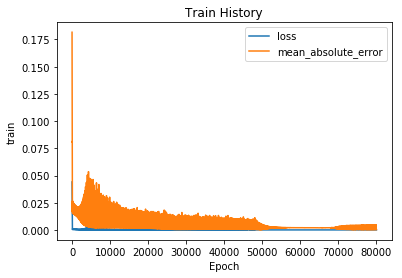

[array([[1.3804502]], dtype=float32), array([[-0.23431107]], dtype=float32), array([[-0.2370562]], dtype=float32), array([[-0.23770542]], dtype=float32), array([[0.43995148, 1.4839218 , 0.5388924 , 1.4102128 ],
       [1.1901982 , 0.83895504, 1.1681364 , 0.78510123],
       [1.1908929 , 0.8386535 , 1.1708766 , 0.783774  ],
       [1.1910564 , 0.83857703, 1.1714635 , 0.78349525]], dtype=float32), array([1.2929512 , 0.67050225, 1.1219852 , 0.70182645], dtype=float32), array([[-0.11388704,  0.77925587, -0.3591162 , -0.74607813],
       [-0.51893383,  0.03304636, -1.1093327 ,  0.3534676 ],
       [-0.7862956 , -0.16773406, -0.35549957, -0.2075724 ],
       [-0.25848046,  0.6921679 , -0.29826072,  0.785489  ]],
      dtype=float32), array([-0.12764642, -0.1082646 , -0.09985574, -0.29296327], dtype=float32), array([[-0.12394953, -0.84690106,  0.34249946, -0.18094654],
       [ 0.5739761 ,  0.6182292 ,  0.6623065 , -1.0277842 ],
       [ 0.40470025,  0.18362392,  0.37277934, -0.21904235],
   

In [4]:
#drawing the lines of losses and metrics
def show_train_history(train_history, x1, x2):
    plot.plot(train_history.history[x1])
    plot.plot(train_history.history[x2])
    plot.title('Train History')
    plot.ylabel('train')
    plot.xlabel('Epoch')
    plot.legend([x1, x2], loc = 'upper right')
    plot.show()

show_train_history(train_history, 'loss', 'mean_absolute_error')

#showing the weights in the model of neural network
print(model.get_weights())

In [5]:
#predicting the outputs of the model based on training data
predictions = model.predict([X1, X2, X3, X4])
print(predictions)

[[0.2998875 ]
 [0.39953208]
 [0.50010765]
 [0.59986025]
 [0.6993017 ]
 [0.8002268 ]
 [0.8996183 ]]
